In [1]:
#Trying to replicate the results of "Adaptive activation functions accelerate convergence in deep and physics-informed neural networks"
import torch
import torch.autograd as autograd         # computation graph
from torch import Tensor                  # tensor node in the computation graph
import torch.nn as nn                     # neural networks
import torch.optim as optim               # optimizers e.g. gradient descent, ADAM, etc.

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.ticker
from torch.nn.parameter import Parameter

import numpy as np
import time
from pyDOE import lhs         #Latin Hypercube Sampling
import scipy.io
from scipy.io import savemat

from smt.sampling_methods import LHS

#Set default dtype to float32
torch.set_default_dtype(torch.float)

#PyTorch random number generator
torch.manual_seed(1234)

# Random number generators in other libraries
np.random.seed(1234)

# Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)

if device == 'cuda': 
    print(torch.cuda.get_device_name())


cuda:0


In [2]:
lr_tune = np.array([8e-6,8e-5,8e-4,8e-3,8e-2]).reshape(-1,1)
n_value = np.array([1.0,3.0,5.0,8.0,10.0]).reshape(-1,1)

LR_tune,N_value = np.meshgrid(lr_tune,n_value)

LR_tune = LR_tune.flatten('F').reshape(-1,1)
N_value = N_value.flatten('F').reshape(-1,1)

lrn_tune = np.hstack((LR_tune,N_value))

In [3]:
def true_disc(x): #[-4,3.75]
    y  = np.zeros((np.shape(x)[0],))
    
    y = 0.2*np.sin(6*x)*np.exp(-1*x)
    y[x>0] = 1 + 0.1*x[x>0]*np.exp(x[x>0]) + 10
    
    return 50*y

In [4]:
# Domain bounds
label = "Regr_disc_atanh"
loss_thresh = 0.1

lb = np.array(-4.0)  # [-1. 0.]
ub = np.array(3.75) # [1.  0.99]

x_test = np.linspace(lb,ub,1000).reshape(-1,1)
u_true = true_disc(x_test)

u_true_norm = np.linalg.norm(u_true,2)

In [5]:
def trainingdata(N_train,seed):
    np.random.seed(seed)
    
    x_train = np.random.uniform(low=lb, high=ub, size=(N_train,)).reshape(-1,1)

    u_train = true_disc(x_train)

    return x_train, u_train

In [6]:
class Sequentialmodel(nn.Module):
    
    def __init__(self,layers,n_val):
        super().__init__() #call __init__ from parent class 
              
        'activation function'
        self.activation = nn.Tanh()
     
        'loss function'
        self.loss_function = nn.MSELoss(reduction ='mean')
        
        'Initialise neural network as a list using nn.Modulelist'  
        self.linears = nn.ModuleList([nn.Linear(layers[i], layers[i+1]) for i in range(len(layers)-1)])
     
        
        for i in range(len(layers)-1):
            nn.init.xavier_normal_(self.linears[i].weight.data, gain=1.0)
            # set biases to zero
            nn.init.zeros_(self.linears[i].bias.data)

        
        self.alpha = Parameter(torch.ones((layers[1],len(layers)-2)))
        self.alpha.requiresGrad = True
        
        self.n = torch.tensor(n_val)
            
            
    'foward pass'
    def forward(self,x):
        if torch.is_tensor(x) != True:         
            x = torch.from_numpy(x)                
        
        u_b = torch.from_numpy(ub).float().to(device)
        l_b = torch.from_numpy(lb).float().to(device)
                      
        #preprocessing input 
        x = (x - l_b)/(u_b - l_b) #feature scaling
        
        #convert to float
        a = x.float()
        
        for i in range(len(layers)-2):
            z = self.linears[i](a)
            a = self.activation(self.n*self.alpha[:,i]*z)
    
        a = self.linears[-1](a) 
        
        return a
    
    
    def loss(self,x,u):

        loss_val = self.loss_function(self.forward(x),u)
        
        return loss_val
        
    'test neural network'
    def test(self):
        u_pred = self.forward(x_test_tensor)       
        u_pred = u_pred.cpu().detach().numpy()
        
        return u_pred
    
    def test_loss(self):
        u_pred = self.test()
        
        test_mse_loss = np.mean(np.square(u_pred.reshape(-1,1) - u_true.reshape(-1,1)))
        test_re_loss = np.linalg.norm(u_pred.reshape(-1,1) - u_true.reshape(-1,1),2)/u_true_norm
        
        return test_mse_loss, test_re_loss  

In [7]:
def data_update(loss_np):
    train_loss.append(loss_np)
    alpha_val.append(model_NN.alpha.cpu().detach().numpy())
    test_mse, test_re = model_NN.test_loss()
    test_mse_loss.append(test_mse)
    test_re_loss.append(test_re)

In [8]:
def train_step():
    optimizer.zero_grad()     # zeroes the gradient buffers of all parameters
    loss = model_NN.loss(x_train,u_train)
    loss.backward() #backprop
    optimizer.step()
    
    return loss

In [9]:
def train_model(max_iter,rep):
    print(rep) 
   
    torch.manual_seed(rep*123)
    start_time = time.time()
    thresh_flag = 0
    
    nan_flag = 0
    for i in range(max_iter):
        loss_np = train_step().cpu().detach().numpy()
        if(thresh_flag == 0):
            if(loss_np < loss_thresh):
                time_threshold[rep] = time.time() - start_time
                epoch_threshold[rep] = i+1            
                thresh_flag = 1
                
        data_update(loss_np)
        print(i,"Train Loss",train_loss[-1],"Test MSE",test_mse_loss[-1],"Test RE",test_re_loss[-1])
        
        if(np.isnan(loss_np)):
            nan_flag =1
            print("NAN BREAK!")
            break
    
    elapsed_time[rep] = time.time() - start_time
    print('Training time: %.2f' % (elapsed_time[rep]))
    
    return nan_flag

In [10]:
nan_tune = []

for tune_reps in range(25):
    label = "Regr_atanh_disc_tune"+str(tune_reps)
    max_reps = 10
    max_iter = 500
    layers = np.array([1,50,50,50,50,1])

    train_loss_full = []
    test_mse_full = []
    test_re_full = []
    alpha_full = []
    elapsed_time= np.zeros((max_reps,1))

    time_threshold = np.empty((max_reps,1))
    time_threshold[:] = np.nan
    epoch_threshold = max_iter*np.ones((max_reps,1))
    
    n_val = lrn_tune[tune_reps,1]

    for reps in range(max_reps):
        print(label)
        print(reps)

        train_loss = []
        test_mse_loss = []
        test_re_loss = []
        alpha_val = []
        'Generate Training data'
        N_train = 300

        x_train_np_array, u_train_np_array = trainingdata(N_train,reps*1234)

        'Convert to tensor and send to GPU'
        x_train = torch.from_numpy(x_train_np_array).float().to(device)
        u_train = torch.from_numpy(u_train_np_array).float().to(device)

        x_test_tensor = torch.from_numpy(x_test).float().to(device)


        model_NN = Sequentialmodel(layers,n_val)
        model_NN.to(device)
        print(model_NN)
        params = list(model_NN.parameters())
        #optimizer = optim.Adam(PINN.parameters(), lr=0.0008,betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)
        optimizer = optim.Adam(model_NN.parameters(), lr=lrn_tune[tune_reps,0])

        nan_flag = train_model(max_iter,reps)

        torch.save(model_NN.state_dict(),label+'_'+str(reps)+'.pt')
        train_loss_full.append(train_loss)
        test_mse_full.append(test_mse_loss)
        test_re_full.append(test_re_loss)
        alpha_full.append(alpha_val)
        
        if(nan_flag == 1):
            nan_tune.append(tune_reps)
            break


    mdic = {"train_loss": train_loss_full,"test_mse": test_mse_full, "test_re": test_re_full,"Time": elapsed_time, "Thresh_time": time_threshold, "epoch_thresh": epoch_threshold,"alpha": alpha_full, "label": label}
    savemat(label+'.mat', mdic) 

Regr_atanh_disc_tune0
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 290442.56 Test MSE 273269.95713280526 Test RE 0.9998248949051863
1 Train Loss 290441.66 Test MSE 273269.0681103761 Test RE 0.999823268550996
2 Train Loss 290440.7 Test MSE 273268.1789165324 Test RE 0.9998216418805785
3 Train Loss 290439.75 Test MSE 273267.28953815805 Test RE 0.9998200148699373
4 Train Loss 290438.84 Test MSE 273266.3999751454 Test RE 0.9998183875188738
5 Train Loss 290437.88 Test MSE 273265.51018900116 Test RE 0.999816759756968
6 Train Loss 290436.94 Test MSE 273264.6202146291 Test RE 0.9998151316480698
7 Train Loss 290436.0 Test MSE 273263

136 Train Loss 290311.4 Test MSE 273145.7411833587 Test RE 0.999597631878627
137 Train Loss 290310.47 Test MSE 273144.79462158465 Test RE 0.9995958998696938
138 Train Loss 290309.4 Test MSE 273143.84751214925 Test RE 0.9995941668556519
139 Train Loss 290308.44 Test MSE 273142.8998383694 Test RE 0.9995924328059695
140 Train Loss 290307.4 Test MSE 273141.95155415253 Test RE 0.9995906976363009
141 Train Loss 290306.47 Test MSE 273141.00273572747 Test RE 0.9995889614861238
142 Train Loss 290305.44 Test MSE 273140.0533168486 Test RE 0.9995872242342165
143 Train Loss 290304.44 Test MSE 273139.10333949723 Test RE 0.9995854859573916
144 Train Loss 290303.4 Test MSE 273138.15276333026 Test RE 0.9995837465818225
145 Train Loss 290302.44 Test MSE 273137.20160999906 Test RE 0.9995820061471227
146 Train Loss 290301.44 Test MSE 273136.2498933094 Test RE 0.9995802646785471
147 Train Loss 290300.4 Test MSE 273135.2975859816 Test RE 0.9995785221261749
148 Train Loss 290299.4 Test MSE 273134.34470249387

295 Train Loss 290143.8 Test MSE 272986.9749062917 Test RE 0.9993070810135778
296 Train Loss 290142.7 Test MSE 272985.91596012586 Test RE 0.9993051428012719
297 Train Loss 290141.56 Test MSE 272984.85616705613 Test RE 0.9993032030350958
298 Train Loss 290140.44 Test MSE 272983.795507209 Test RE 0.9993012616786651
299 Train Loss 290139.3 Test MSE 272982.7339975414 Test RE 0.9992993187630069
300 Train Loss 290138.2 Test MSE 272981.67160490656 Test RE 0.999297374227443
301 Train Loss 290137.06 Test MSE 272980.6083411602 Test RE 0.9992954280936636
302 Train Loss 290135.97 Test MSE 272979.5442336822 Test RE 0.9992934804117743
303 Train Loss 290134.84 Test MSE 272978.479241384 Test RE 0.9992915311065594
304 Train Loss 290133.72 Test MSE 272977.41336973215 Test RE 0.9992895801880151
305 Train Loss 290132.56 Test MSE 272976.3466511495 Test RE 0.9992876277154779
306 Train Loss 290131.47 Test MSE 272975.2790271915 Test RE 0.9992856735819629
307 Train Loss 290130.34 Test MSE 272974.21054542426 Te

454 Train Loss 289953.6 Test MSE 272806.87679362745 Test RE 0.998977389436465
455 Train Loss 289952.3 Test MSE 272805.6650087624 Test RE 0.9989751707478464
456 Train Loss 289951.03 Test MSE 272804.4521809907 Test RE 0.9989729501448082
457 Train Loss 289949.75 Test MSE 272803.2383221293 Test RE 0.9989707276489751
458 Train Loss 289948.47 Test MSE 272802.0234129431 Test RE 0.9989685032251145
459 Train Loss 289947.16 Test MSE 272800.80753232015 Test RE 0.9989662770176543
460 Train Loss 289945.88 Test MSE 272799.59064118814 Test RE 0.9989640489550428
461 Train Loss 289944.6 Test MSE 272798.37272285984 Test RE 0.998961819006714
462 Train Loss 289943.3 Test MSE 272797.1537849041 Test RE 0.9989595871865138
463 Train Loss 289942.03 Test MSE 272795.93381182087 Test RE 0.9989573534660492
464 Train Loss 289940.72 Test MSE 272794.712820495 Test RE 0.9989551178762234
465 Train Loss 289939.44 Test MSE 272793.49083294725 Test RE 0.9989528804573431
466 Train Loss 289938.12 Test MSE 272792.2677592803 T

111 Train Loss 292711.53 Test MSE 273319.53870168515 Test RE 0.9999155939322889
112 Train Loss 292710.47 Test MSE 273318.5669511148 Test RE 0.999913816398533
113 Train Loss 292709.4 Test MSE 273317.59497744223 Test RE 0.9999120384535158
114 Train Loss 292708.34 Test MSE 273316.6227778169 Test RE 0.9999102600920209
115 Train Loss 292707.28 Test MSE 273315.65034040506 Test RE 0.9999084812923992
116 Train Loss 292706.25 Test MSE 273314.67766779877 Test RE 0.9999067020593905
117 Train Loss 292705.2 Test MSE 273313.7047653364 Test RE 0.999904922402757
118 Train Loss 292704.12 Test MSE 273312.73159648845 Test RE 0.9999031422556754
119 Train Loss 292703.06 Test MSE 273311.75817951915 Test RE 0.9999013616515537
120 Train Loss 292701.97 Test MSE 273310.7845190768 Test RE 0.9998995805988914
121 Train Loss 292700.9 Test MSE 273309.8105938049 Test RE 0.9998977990586199
122 Train Loss 292699.84 Test MSE 273308.83641922055 Test RE 0.9998960170591216
123 Train Loss 292698.8 Test MSE 273307.8619810885

268 Train Loss 292540.7 Test MSE 273162.88411565433 Test RE 0.9996289993193038
269 Train Loss 292539.56 Test MSE 273161.8542790383 Test RE 0.9996271149939141
270 Train Loss 292538.44 Test MSE 273160.8239515142 Test RE 0.9996252297667393
271 Train Loss 292537.3 Test MSE 273159.79319292813 Test RE 0.9996233437472771
272 Train Loss 292536.16 Test MSE 273158.76196811843 Test RE 0.9996214568711869
273 Train Loss 292535.06 Test MSE 273157.7302557914 Test RE 0.9996195690995006
274 Train Loss 292533.94 Test MSE 273156.69810322905 Test RE 0.9996176805187285
275 Train Loss 292532.8 Test MSE 273155.6654991338 Test RE 0.9996157911081938
276 Train Loss 292531.7 Test MSE 273154.6324224319 Test RE 0.9996139008293318
277 Train Loss 292530.56 Test MSE 273153.59887808195 Test RE 0.9996120096912103
278 Train Loss 292529.44 Test MSE 273152.5648754992 Test RE 0.9996101177110535
279 Train Loss 292528.3 Test MSE 273151.5303969049 Test RE 0.9996082248563241
280 Train Loss 292527.2 Test MSE 273150.49547028466 

423 Train Loss 292359.97 Test MSE 272997.2369656472 Test RE 0.9993258636903148
424 Train Loss 292358.75 Test MSE 272996.12532447523 Test RE 0.9993238290673321
425 Train Loss 292357.56 Test MSE 272995.01307722874 Test RE 0.9993217933309126
426 Train Loss 292356.3 Test MSE 272993.9002264779 Test RE 0.9993197564857539
427 Train Loss 292355.12 Test MSE 272992.7867759398 Test RE 0.9993177185386529
428 Train Loss 292353.94 Test MSE 272991.672696892 Test RE 0.9993156794370317
429 Train Loss 292352.7 Test MSE 272990.55802196974 Test RE 0.9993136392406161
430 Train Loss 292351.47 Test MSE 272989.4427230541 Test RE 0.9993115978979326
431 Train Loss 292350.25 Test MSE 272988.32681538066 Test RE 0.9993095554368601
432 Train Loss 292349.06 Test MSE 272987.2103006705 Test RE 0.9993075118605421
433 Train Loss 292347.78 Test MSE 272986.0931868463 Test RE 0.999305467183473
434 Train Loss 292346.62 Test MSE 272984.97546597314 Test RE 0.9993034213911222
435 Train Loss 292345.4 Test MSE 272983.8571343825 

76 Train Loss 279481.16 Test MSE 273258.7897740174 Test RE 0.9998044654413765
77 Train Loss 279480.4 Test MSE 273258.05751459097 Test RE 0.9998031258381097
78 Train Loss 279479.66 Test MSE 273257.3248975533 Test RE 0.9998017855788289
79 Train Loss 279478.94 Test MSE 273256.5919408782 Test RE 0.9998004446964132
80 Train Loss 279478.16 Test MSE 273255.85862019623 Test RE 0.9997991031462778
81 Train Loss 279477.44 Test MSE 273255.1249312052 Test RE 0.9997977609205494
82 Train Loss 279476.66 Test MSE 273254.39087083825 Test RE 0.9997964180136156
83 Train Loss 279475.9 Test MSE 273253.65644264204 Test RE 0.9997950744319608
84 Train Loss 279475.2 Test MSE 273252.9216471239 Test RE 0.9997937301765111
85 Train Loss 279474.4 Test MSE 273252.1864649999 Test RE 0.9997923852119852
86 Train Loss 279473.66 Test MSE 273251.4509284788 Test RE 0.9997910395973033
87 Train Loss 279472.9 Test MSE 273250.71498977375 Test RE 0.9997896932450409
88 Train Loss 279472.16 Test MSE 273249.97866567667 Test RE 0.99

226 Train Loss 279364.03 Test MSE 273143.9053846694 Test RE 0.9995942727504599
227 Train Loss 279363.22 Test MSE 273143.0998035425 Test RE 0.9995927987016917
228 Train Loss 279362.38 Test MSE 273142.2936560278 Test RE 0.9995913236143736
229 Train Loss 279361.56 Test MSE 273141.4868895571 Test RE 0.9995898473923125
230 Train Loss 279360.75 Test MSE 273140.6795553843 Test RE 0.9995883701292864
231 Train Loss 279359.94 Test MSE 273139.87161062524 Test RE 0.9995868917468218
232 Train Loss 279359.1 Test MSE 273139.063056022 Test RE 0.9995854122462714
233 Train Loss 279358.25 Test MSE 273138.2538991918 Test RE 0.9995839316415682
234 Train Loss 279357.44 Test MSE 273137.444131077 Test RE 0.9995824499161337
235 Train Loss 279356.62 Test MSE 273136.6337577728 Test RE 0.9995809670811159
236 Train Loss 279355.78 Test MSE 273135.8228049885 Test RE 0.9995794831835537
237 Train Loss 279354.97 Test MSE 273135.0112265662 Test RE 0.999577998138981
238 Train Loss 279354.12 Test MSE 273134.19905606203 Te

372 Train Loss 279237.12 Test MSE 273019.3703401177 Test RE 0.9993663732674581
373 Train Loss 279236.22 Test MSE 273018.46515500266 Test RE 0.9993647165858931
374 Train Loss 279235.28 Test MSE 273017.55921010347 Test RE 0.9993630585110118
375 Train Loss 279234.34 Test MSE 273016.6524789333 Test RE 0.9993613989943299
376 Train Loss 279233.44 Test MSE 273015.74498922937 Test RE 0.999359738086606
377 Train Loss 279232.5 Test MSE 273014.83670353645 Test RE 0.9993580757192815
378 Train Loss 279231.6 Test MSE 273013.9276618273 Test RE 0.9993564119655082
379 Train Loss 279230.7 Test MSE 273013.0178715584 Test RE 0.9993547468389267
380 Train Loss 279229.75 Test MSE 273012.1072915739 Test RE 0.9993530802642047
381 Train Loss 279228.8 Test MSE 273011.1959388607 Test RE 0.9993514122724254
382 Train Loss 279227.88 Test MSE 273010.28382464906 Test RE 0.9993497428841357
383 Train Loss 279226.94 Test MSE 273009.3709081866 Test RE 0.9993480720247421
384 Train Loss 279226.0 Test MSE 273008.45723658474 

29 Train Loss 305633.5 Test MSE 273405.4270747821 Test RE 1.000072689137061
30 Train Loss 305632.34 Test MSE 273404.4251437636 Test RE 1.0000708566848369
31 Train Loss 305631.22 Test MSE 273403.4230147724 Test RE 1.0000690238671777
32 Train Loss 305630.12 Test MSE 273402.42071197816 Test RE 1.0000671907282859
33 Train Loss 305629.0 Test MSE 273401.41821102065 Test RE 1.0000653572236067
34 Train Loss 305627.88 Test MSE 273400.4154926692 Test RE 1.0000635233179664
35 Train Loss 305626.75 Test MSE 273399.41259792564 Test RE 1.0000616890863527
36 Train Loss 305625.62 Test MSE 273398.4094814767 Test RE 1.0000598544458887
37 Train Loss 305624.5 Test MSE 273397.40615995176 Test RE 1.000058019426986
38 Train Loss 305623.38 Test MSE 273396.4026353254 Test RE 1.0000561840332538
39 Train Loss 305622.28 Test MSE 273395.3989196041 Test RE 1.00005434828665
40 Train Loss 305621.16 Test MSE 273394.3950022672 Test RE 1.0000525121679302
41 Train Loss 305620.0 Test MSE 273393.3908630034 Test RE 1.0000506

183 Train Loss 305456.66 Test MSE 273247.31176200556 Test RE 0.9997834672363721
184 Train Loss 305455.44 Test MSE 273246.24981038744 Test RE 0.9997815244492765
185 Train Loss 305454.25 Test MSE 273245.1873078087 Test RE 0.9997795806504478
186 Train Loss 305453.06 Test MSE 273244.12421485805 Test RE 0.9997776357677791
187 Train Loss 305451.9 Test MSE 273243.06055023416 Test RE 0.9997756898354726
188 Train Loss 305450.7 Test MSE 273241.9963163651 Test RE 0.9997737428579638
189 Train Loss 305449.5 Test MSE 273240.9315022056 Test RE 0.9997717948150399
190 Train Loss 305448.3 Test MSE 273239.86611716874 Test RE 0.9997698457239158
191 Train Loss 305447.12 Test MSE 273238.8001704403 Test RE 0.9997678956013901
192 Train Loss 305445.94 Test MSE 273237.7336396352 Test RE 0.9997659444065043
193 Train Loss 305444.72 Test MSE 273236.6664888139 Test RE 0.9997639920735005
194 Train Loss 305443.56 Test MSE 273235.59877676354 Test RE 0.9997620387099231
195 Train Loss 305442.34 Test MSE 273234.530473882

343 Train Loss 305257.22 Test MSE 273068.93467339146 Test RE 0.9994570823626764
344 Train Loss 305255.9 Test MSE 273067.75858240644 Test RE 0.9994549300604904
345 Train Loss 305254.62 Test MSE 273066.581681763 Test RE 0.9994527762719512
346 Train Loss 305253.28 Test MSE 273065.4039143574 Test RE 0.9994506208925464
347 Train Loss 305251.97 Test MSE 273064.2252903075 Test RE 0.9994484639407815
348 Train Loss 305250.7 Test MSE 273063.04581643955 Test RE 0.9994463054291401
349 Train Loss 305249.34 Test MSE 273061.8654791509 Test RE 0.9994441453327167
350 Train Loss 305248.0 Test MSE 273060.6842779728 Test RE 0.9994419836506445
351 Train Loss 305246.7 Test MSE 273059.5022484643 Test RE 0.9994398204479878
352 Train Loss 305245.38 Test MSE 273058.31932831596 Test RE 0.9994376556107063
353 Train Loss 305244.06 Test MSE 273057.1355513968 Test RE 0.9994354892007724
354 Train Loss 305242.72 Test MSE 273055.9509000311 Test RE 0.9994333211858272
355 Train Loss 305241.4 Test MSE 273054.7653879577 Te

0 Train Loss 258078.67 Test MSE 273063.5078899753 Test RE 0.9994471510534378
1 Train Loss 258077.55 Test MSE 273062.3311802634 Test RE 0.999444997597553
2 Train Loss 258076.44 Test MSE 273061.15428562596 Test RE 0.9994428437986003
3 Train Loss 258075.31 Test MSE 273059.9771432555 Test RE 0.9994406895416372
4 Train Loss 258074.14 Test MSE 273058.7998137921 Test RE 0.9994385349376349
5 Train Loss 258073.08 Test MSE 273057.62218961184 Test RE 0.9994363797896315
6 Train Loss 258071.92 Test MSE 273056.44438418705 Test RE 0.9994342243052878
7 Train Loss 258070.78 Test MSE 273055.2663499099 Test RE 0.9994320683974747
8 Train Loss 258069.66 Test MSE 273054.088050318 Test RE 0.9994299119994595
9 Train Loss 258068.55 Test MSE 273052.9095563621 Test RE 0.9994277552410862
10 Train Loss 258067.42 Test MSE 273051.7308049268 Test RE 0.9994255980068448
11 Train Loss 258066.27 Test MSE 273050.55182379915 Test RE 0.9994234403475856
12 Train Loss 258065.12 Test MSE 273049.37258957967 Test RE 0.9994212822

157 Train Loss 257897.05 Test MSE 272873.95002809394 Test RE 0.9991001878927652
158 Train Loss 257895.84 Test MSE 272872.69905743294 Test RE 0.9990978977392809
159 Train Loss 257894.64 Test MSE 272871.4473731901 Test RE 0.9990956062741877
160 Train Loss 257893.45 Test MSE 272870.1949709951 Test RE 0.9990933134894747
161 Train Loss 257892.22 Test MSE 272868.9419118789 Test RE 0.9990910194968647
162 Train Loss 257891.05 Test MSE 272867.688180421 Test RE 0.9990887242681177
163 Train Loss 257889.81 Test MSE 272866.4337387215 Test RE 0.9990864277338414
164 Train Loss 257888.64 Test MSE 272865.1785780145 Test RE 0.9990841298779785
165 Train Loss 257887.42 Test MSE 272863.9227315183 Test RE 0.9990818307613338
166 Train Loss 257886.19 Test MSE 272862.66611902724 Test RE 0.9990795302370635
167 Train Loss 257885.02 Test MSE 272861.4088321751 Test RE 0.9990772284729148
168 Train Loss 257883.8 Test MSE 272860.15083174146 Test RE 0.9990749253970774
169 Train Loss 257882.6 Test MSE 272858.892117581 

314 Train Loss 257699.45 Test MSE 272667.8588083639 Test RE 0.9987228256176109
315 Train Loss 257698.11 Test MSE 272666.47656276193 Test RE 0.9987202941824999
316 Train Loss 257696.78 Test MSE 272665.09333357203 Test RE 0.9987177609396294
317 Train Loss 257695.47 Test MSE 272663.7091398272 Test RE 0.9987152259238427
318 Train Loss 257694.14 Test MSE 272662.3240211002 Test RE 0.9987126892076007
319 Train Loss 257692.81 Test MSE 272660.93791564816 Test RE 0.9987101506778135
320 Train Loss 257691.47 Test MSE 272659.55087298295 Test RE 0.9987076104251438
321 Train Loss 257690.14 Test MSE 272658.1628466885 Test RE 0.9987050683645712
322 Train Loss 257688.81 Test MSE 272656.7738693022 Test RE 0.998702524555672
323 Train Loss 257687.47 Test MSE 272655.38393247523 Test RE 0.9986999789831426
324 Train Loss 257686.14 Test MSE 272653.9929529422 Test RE 0.9986974314944737
325 Train Loss 257684.81 Test MSE 272652.60108619236 Test RE 0.9986948823744205
326 Train Loss 257683.47 Test MSE 272651.208223

469 Train Loss 257482.25 Test MSE 272441.53110550944 Test RE 0.998308245092486
470 Train Loss 257480.75 Test MSE 272439.98860048095 Test RE 0.9983054189857953
471 Train Loss 257479.28 Test MSE 272438.44500882935 Test RE 0.998302590880235
472 Train Loss 257477.81 Test MSE 272436.9002941986 Test RE 0.9982997607091775
473 Train Loss 257476.33 Test MSE 272435.35450851306 Test RE 0.9982969285677401
474 Train Loss 257474.83 Test MSE 272433.8076362223 Test RE 0.9982940944274141
475 Train Loss 257473.36 Test MSE 272432.25966719136 Test RE 0.998291258269614
476 Train Loss 257471.88 Test MSE 272430.71061717387 Test RE 0.998288420123186
477 Train Loss 257470.4 Test MSE 272429.1604501681 Test RE 0.9982855799221512
478 Train Loss 257468.86 Test MSE 272427.6091998344 Test RE 0.9982827377281642
479 Train Loss 257467.42 Test MSE 272426.0567651562 Test RE 0.9982798933561251
480 Train Loss 257465.92 Test MSE 272424.5032968562 Test RE 0.9982770470821707
481 Train Loss 257464.4 Test MSE 272422.9487332003 

124 Train Loss 263844.34 Test MSE 273364.3204240568 Test RE 0.9999975055818145
125 Train Loss 263843.4 Test MSE 273363.3696001684 Test RE 0.999995766469808
126 Train Loss 263842.5 Test MSE 273362.41858312336 Test RE 0.999994027001482
127 Train Loss 263841.6 Test MSE 273361.4673574006 Test RE 0.9999922871484446
128 Train Loss 263840.7 Test MSE 273360.5159540218 Test RE 0.9999905469674346
129 Train Loss 263839.75 Test MSE 273359.56434328307 Test RE 0.9999888064041205
130 Train Loss 263838.88 Test MSE 273358.61255081097 Test RE 0.9999870655053723
131 Train Loss 263837.94 Test MSE 273357.6605577457 Test RE 0.9999853242366933
132 Train Loss 263837.03 Test MSE 273356.7083297318 Test RE 0.9999835825352414
133 Train Loss 263836.12 Test MSE 273355.75590374705 Test RE 0.9999818404686506
134 Train Loss 263835.22 Test MSE 273354.8032661129 Test RE 0.9999800980118995
135 Train Loss 263834.28 Test MSE 273353.8504194365 Test RE 0.999978355169755
136 Train Loss 263833.38 Test MSE 273352.8973562232 Tes

279 Train Loss 263699.25 Test MSE 273213.4359139724 Test RE 0.9997214912147936
280 Train Loss 263698.3 Test MSE 273212.43261698587 Test RE 0.9997196556197088
281 Train Loss 263697.3 Test MSE 273211.42882202845 Test RE 0.9997178191101816
282 Train Loss 263696.38 Test MSE 273210.42457391176 Test RE 0.9997159817681935
283 Train Loss 263695.4 Test MSE 273209.4198856785 Test RE 0.9997141436176021
284 Train Loss 263694.47 Test MSE 273208.4147052725 Test RE 0.999712304563163
285 Train Loss 263693.47 Test MSE 273207.40905110573 Test RE 0.9997104646385564
286 Train Loss 263692.5 Test MSE 273206.40292966913 Test RE 0.9997086238556538
287 Train Loss 263691.56 Test MSE 273205.3963302897 Test RE 0.999706782194923
288 Train Loss 263690.56 Test MSE 273204.3892387458 Test RE 0.9997049396303397
289 Train Loss 263689.6 Test MSE 273203.38167355023 Test RE 0.9997030961957696
290 Train Loss 263688.66 Test MSE 273202.37363824225 Test RE 0.999701251897683
291 Train Loss 263687.66 Test MSE 273201.36509391177 

438 Train Loss 263539.4 Test MSE 273047.01873863663 Test RE 0.99941697440286
439 Train Loss 263538.34 Test MSE 273045.92206636484 Test RE 0.9994149673602831
440 Train Loss 263537.28 Test MSE 273044.8246738395 Test RE 0.9994129589955204
441 Train Loss 263536.22 Test MSE 273043.7265880141 Test RE 0.9994109493578931
442 Train Loss 263535.2 Test MSE 273042.62778212957 Test RE 0.99940893839842
443 Train Loss 263534.12 Test MSE 273041.5282834833 Test RE 0.9994069261670515
444 Train Loss 263533.06 Test MSE 273040.42808887886 Test RE 0.9994049126579302
445 Train Loss 263532.0 Test MSE 273039.3271741248 Test RE 0.9994028978267743
446 Train Loss 263530.94 Test MSE 273038.22555057344 Test RE 0.999400881694352
447 Train Loss 263529.88 Test MSE 273037.12322808005 Test RE 0.9993988642786925
448 Train Loss 263528.84 Test MSE 273036.0202042154 Test RE 0.9993968455753419
449 Train Loss 263527.78 Test MSE 273034.91647759307 Test RE 0.9993948255817553
450 Train Loss 263526.72 Test MSE 273033.8120625786 T

97 Train Loss 310682.34 Test MSE 273356.49470616016 Test RE 0.9999831918001693
98 Train Loss 310681.4 Test MSE 273355.6004276644 Test RE 0.9999815560896355
99 Train Loss 310680.38 Test MSE 273354.7058416713 Test RE 0.9999799198139858
100 Train Loss 310679.38 Test MSE 273353.81093058066 Test RE 0.9999782829410255
101 Train Loss 310678.38 Test MSE 273352.9156933452 Test RE 0.9999766454688361
102 Train Loss 310677.4 Test MSE 273352.0201131796 Test RE 0.9999750073667125
103 Train Loss 310676.38 Test MSE 273351.12420634157 Test RE 0.9999733686643889
104 Train Loss 310675.4 Test MSE 273350.2279506251 Test RE 0.9999717293212453
105 Train Loss 310674.4 Test MSE 273349.3313247667 Test RE 0.999970089298385
106 Train Loss 310673.4 Test MSE 273348.4343613856 Test RE 0.999968448655469
107 Train Loss 310672.38 Test MSE 273347.53703614976 Test RE 0.9999668073479878
108 Train Loss 310671.4 Test MSE 273346.6393481123 Test RE 0.9999651653742072
109 Train Loss 310670.4 Test MSE 273345.7412797927 Test RE 

253 Train Loss 310520.12 Test MSE 273210.8220568744 Test RE 0.9997167089914066
254 Train Loss 310519.03 Test MSE 273209.83656266093 Test RE 0.9997149059590217
255 Train Loss 310517.94 Test MSE 273208.85030979995 Test RE 0.9997131015353806
256 Train Loss 310516.8 Test MSE 273207.8632619763 Test RE 0.9997112956540353
257 Train Loss 310515.75 Test MSE 273206.87543310894 Test RE 0.999709488340443
258 Train Loss 310514.6 Test MSE 273205.8868362417 Test RE 0.9997076796184612
259 Train Loss 310513.5 Test MSE 273204.8974554502 Test RE 0.9997058694589468
260 Train Loss 310512.38 Test MSE 273203.9073131292 Test RE 0.9997040579028661
261 Train Loss 310511.3 Test MSE 273202.9163814014 Test RE 0.9997022448992061
262 Train Loss 310510.2 Test MSE 273201.92464382213 Test RE 0.9997004304178726
263 Train Loss 310509.1 Test MSE 273200.9321352418 Test RE 0.9996986145226195
264 Train Loss 310507.97 Test MSE 273199.93883271154 Test RE 0.9996967971714523
265 Train Loss 310506.88 Test MSE 273198.9447197893 Te

411 Train Loss 310334.7 Test MSE 273044.30332048505 Test RE 0.999412004852647
412 Train Loss 310333.44 Test MSE 273043.17263325356 Test RE 0.9994099355482353
413 Train Loss 310332.16 Test MSE 273042.04088048195 Test RE 0.9994078642894567
414 Train Loss 310330.94 Test MSE 273040.9081031778 Test RE 0.9994057911513479
415 Train Loss 310329.66 Test MSE 273039.7742503258 Test RE 0.9994037160405321
416 Train Loss 310328.4 Test MSE 273038.6393593491 Test RE 0.999401639025487
417 Train Loss 310327.12 Test MSE 273037.50339465664 Test RE 0.999399560041064
418 Train Loss 310325.88 Test MSE 273036.3663712105 Test RE 0.9993974791146332
419 Train Loss 310324.6 Test MSE 273035.22830602917 Test RE 0.999395396277329
420 Train Loss 310323.3 Test MSE 273034.0891758066 Test RE 0.9993933114864858
421 Train Loss 310322.06 Test MSE 273032.9489892466 Test RE 0.9993912247580211
422 Train Loss 310320.8 Test MSE 273031.8077506865 Test RE 0.99938913609986
423 Train Loss 310319.53 Test MSE 273030.66542514454 Test 

69 Train Loss 305962.03 Test MSE 273272.7175549438 Test RE 0.9998299447318005
70 Train Loss 305961.03 Test MSE 273271.81610299816 Test RE 0.9998282956476908
71 Train Loss 305960.03 Test MSE 273270.9145133276 Test RE 0.9998266463089114
72 Train Loss 305959.06 Test MSE 273270.01279827446 Test RE 0.9998249967380404
73 Train Loss 305958.06 Test MSE 273269.1109429766 Test RE 0.9998233469078868
74 Train Loss 305957.06 Test MSE 273268.2089327559 Test RE 0.9998216967915986
75 Train Loss 305956.06 Test MSE 273267.3067851621 Test RE 0.9998200464212794
76 Train Loss 305955.1 Test MSE 273266.40450124093 Test RE 0.9998183957988408
77 Train Loss 305954.1 Test MSE 273265.50211041863 Test RE 0.9998167449781137
78 Train Loss 305953.1 Test MSE 273264.5995684259 Test RE 0.9998150938781108
79 Train Loss 305952.12 Test MSE 273263.6968579311 Test RE 0.9998134424671252
80 Train Loss 305951.16 Test MSE 273262.7939886666 Test RE 0.9998117907629592
81 Train Loss 305950.16 Test MSE 273261.89096397354 Test RE 0.9

228 Train Loss 305800.66 Test MSE 273125.7858197954 Test RE 0.9995611171257077
229 Train Loss 305799.6 Test MSE 273124.8257631994 Test RE 0.9995593603598942
230 Train Loss 305798.56 Test MSE 273123.86512770946 Test RE 0.9995576025316966
231 Train Loss 305797.5 Test MSE 273122.9038682237 Test RE 0.9995558435585805
232 Train Loss 305796.47 Test MSE 273121.9419531925 Test RE 0.9995540833828068
233 Train Loss 305795.38 Test MSE 273120.97945385234 Test RE 0.9995523221347243
234 Train Loss 305794.3 Test MSE 273120.0163344836 Test RE 0.9995505597489635
235 Train Loss 305793.28 Test MSE 273119.0525692452 Test RE 0.9995487961782331
236 Train Loss 305792.22 Test MSE 273118.0881890665 Test RE 0.9995470314791239
237 Train Loss 305791.16 Test MSE 273117.1231899957 Test RE 0.9995452656443984
238 Train Loss 305790.1 Test MSE 273116.15749719314 Test RE 0.9995434985371022
239 Train Loss 305789.03 Test MSE 273115.1911953084 Test RE 0.9995417303121287
240 Train Loss 305787.97 Test MSE 273114.22424681095 

384 Train Loss 305626.3 Test MSE 272966.8951375705 Test RE 0.9992703279339146
385 Train Loss 305625.1 Test MSE 272965.8069433095 Test RE 0.9992683361148713
386 Train Loss 305623.9 Test MSE 272964.7177183339 Test RE 0.9992663424052434
387 Train Loss 305622.72 Test MSE 272963.62749704893 Test RE 0.9992643468679944
388 Train Loss 305621.56 Test MSE 272962.5362430754 Test RE 0.9992623494365253
389 Train Loss 305620.3 Test MSE 272961.4440022714 Test RE 0.9992603501947633
390 Train Loss 305619.16 Test MSE 272960.3507357936 Test RE 0.9992583490715988
391 Train Loss 305617.94 Test MSE 272959.2564706206 Test RE 0.9992563461164017
392 Train Loss 305616.72 Test MSE 272958.1611763123 Test RE 0.9992543412734438
393 Train Loss 305615.53 Test MSE 272957.06481338723 Test RE 0.9992523344704451
394 Train Loss 305614.3 Test MSE 272955.96745549137 Test RE 0.9992503258421981
395 Train Loss 305613.1 Test MSE 272954.8690601911 Test RE 0.9992483153110195
396 Train Loss 305611.9 Test MSE 272953.7696480535 Test

40 Train Loss 274249.56 Test MSE 273447.64036534756 Test RE 1.0001498908408801
41 Train Loss 274248.6 Test MSE 273446.70910882443 Test RE 1.0001481877782723
42 Train Loss 274247.6 Test MSE 273445.77793201816 Test RE 1.0001464848585497
43 Train Loss 274246.66 Test MSE 273444.8468485148 Test RE 1.0001447821065583
44 Train Loss 274245.7 Test MSE 273443.91583512776 Test RE 1.0001430794798964
45 Train Loss 274244.72 Test MSE 273442.984888781 Test RE 1.0001413769729386
46 Train Loss 274243.75 Test MSE 273442.0540214294 Test RE 1.0001396746075486
47 Train Loss 274242.78 Test MSE 273441.12323746085 Test RE 1.000137972391752
48 Train Loss 274241.78 Test MSE 273440.19253293396 Test RE 1.0001362703183414
49 Train Loss 274240.84 Test MSE 273439.2618811859 Test RE 1.0001345683385565
50 Train Loss 274239.88 Test MSE 273438.331280351 Test RE 1.0001328664489852
51 Train Loss 274238.88 Test MSE 273437.4007295345 Test RE 1.0001311646479925
52 Train Loss 274237.94 Test MSE 273436.4702060244 Test RE 1.000

198 Train Loss 274094.62 Test MSE 273298.933709475 Test RE 0.9998779024422378
199 Train Loss 274093.6 Test MSE 273297.9689542158 Test RE 0.9998761376378472
200 Train Loss 274092.6 Test MSE 273297.0037716721 Test RE 0.9998743720487181
201 Train Loss 274091.6 Test MSE 273296.0381532866 Test RE 0.9998726056591927
202 Train Loss 274090.56 Test MSE 273295.0720798033 Test RE 0.9998708384340417
203 Train Loss 274089.56 Test MSE 273294.1055673786 Test RE 0.9998690704028153
204 Train Loss 274088.56 Test MSE 273293.13861478545 Test RE 0.9998673015632648
205 Train Loss 274087.56 Test MSE 273292.1712038757 Test RE 0.9998655318821875
206 Train Loss 274086.56 Test MSE 273291.2033660547 Test RE 0.9998637614170292
207 Train Loss 274085.53 Test MSE 273290.235069733 Test RE 0.9998619901099985
208 Train Loss 274084.5 Test MSE 273289.26633421646 Test RE 0.9998602179964072
209 Train Loss 274083.5 Test MSE 273288.2971514053 Test RE 0.9998584450614343
210 Train Loss 274082.5 Test MSE 273287.3275025638 Test R

354 Train Loss 273931.1 Test MSE 273141.9601172695 Test RE 0.9995907133050985
355 Train Loss 273929.97 Test MSE 273140.9047395055 Test RE 0.9995887821722356
356 Train Loss 273928.88 Test MSE 273139.8486133782 Test RE 0.9995868496662808
357 Train Loss 273927.78 Test MSE 273138.7917806782 Test RE 0.9995849158636947
358 Train Loss 273926.7 Test MSE 273137.7342726156 Test RE 0.999582980821579
359 Train Loss 273925.6 Test MSE 273136.67603193014 Test RE 0.9995810444351511
360 Train Loss 273924.5 Test MSE 273135.6170458154 Test RE 0.9995791066809687
361 Train Loss 273923.38 Test MSE 273134.5573927205 Test RE 0.9995771677025727
362 Train Loss 273922.28 Test MSE 273133.496986596 Test RE 0.9995752273424998
363 Train Loss 273921.16 Test MSE 273132.43584312656 Test RE 0.9995732856294427
364 Train Loss 273920.06 Test MSE 273131.3740081111 Test RE 0.9995713426471976
365 Train Loss 273918.94 Test MSE 273130.3114236845 Test RE 0.9995693982898736
366 Train Loss 273917.84 Test MSE 273129.2481252456 Test

12 Train Loss 278500.56 Test MSE 273550.01301715965 Test RE 1.0003370901439173
13 Train Loss 278499.75 Test MSE 273549.20331325306 Test RE 1.0003356096514833
14 Train Loss 278498.94 Test MSE 273548.3937188687 Test RE 1.0003341293571133
15 Train Loss 278498.1 Test MSE 273547.584257762 Test RE 1.0003326493042428
16 Train Loss 278497.28 Test MSE 273546.7749232167 Test RE 1.0003311694805939
17 Train Loss 278496.44 Test MSE 273545.9657051117 Test RE 1.0003296898676608
18 Train Loss 278495.62 Test MSE 273545.15663614345 Test RE 1.0003282105252285
19 Train Loss 278494.78 Test MSE 273544.34769217996 Test RE 1.000326731409174
20 Train Loss 278493.97 Test MSE 273543.53887039475 Test RE 1.0003252525143296
21 Train Loss 278493.12 Test MSE 273542.73017961055 Test RE 1.0003237738568294
22 Train Loss 278492.3 Test MSE 273541.9216414422 Test RE 1.000322295476196
23 Train Loss 278491.47 Test MSE 273541.11320723733 Test RE 1.000320817283471
24 Train Loss 278490.66 Test MSE 273540.30490342714 Test RE 1.0

169 Train Loss 278371.12 Test MSE 273423.29561063694 Test RE 1.0001053687055161
170 Train Loss 278370.3 Test MSE 273422.4792976167 Test RE 1.0001038757829006
171 Train Loss 278369.44 Test MSE 273421.6626747799 Test RE 1.0001023822914432
172 Train Loss 278368.66 Test MSE 273420.84577031137 Test RE 1.000100888282689
173 Train Loss 278367.78 Test MSE 273420.02858942456 Test RE 1.0000993937661697
174 Train Loss 278367.0 Test MSE 273419.2111155668 Test RE 1.0000978987116105
175 Train Loss 278366.12 Test MSE 273418.3933621407 Test RE 1.0000964031435207
176 Train Loss 278365.28 Test MSE 273417.57530378073 Test RE 1.0000949070155072
177 Train Loss 278364.47 Test MSE 273416.756943985 Test RE 1.0000934103339658
178 Train Loss 278363.62 Test MSE 273415.9382758974 Test RE 1.0000919130863541
179 Train Loss 278362.78 Test MSE 273415.1193145961 Test RE 1.000090415300247
180 Train Loss 278361.97 Test MSE 273414.3000196297 Test RE 1.0000889169016594
181 Train Loss 278361.12 Test MSE 273413.48041951697 

326 Train Loss 278235.22 Test MSE 273290.1400858889 Test RE 0.9998618163556313
327 Train Loss 278234.3 Test MSE 273289.25138742686 Test RE 0.9998601906541322
328 Train Loss 278233.4 Test MSE 273288.3620762085 Test RE 0.9998585638290681
329 Train Loss 278232.5 Test MSE 273287.47214582784 Test RE 0.9998569358687154
330 Train Loss 278231.6 Test MSE 273286.58161016303 Test RE 0.9998553067984557
331 Train Loss 278230.7 Test MSE 273285.69045670965 Test RE 0.9998536765954088
332 Train Loss 278229.78 Test MSE 273284.7986899089 Test RE 0.9998520452676942
333 Train Loss 278228.88 Test MSE 273283.9063124827 Test RE 0.9998504128202852
334 Train Loss 278227.94 Test MSE 273283.0132863669 Test RE 0.9998487791835443
335 Train Loss 278227.0 Test MSE 273282.1196665861 Test RE 0.9998471444581246
336 Train Loss 278226.12 Test MSE 273281.2254183755 Test RE 0.9998455085804236
337 Train Loss 278225.2 Test MSE 273280.33052146004 Test RE 0.9998438715133464
338 Train Loss 278224.28 Test MSE 273279.4350161643 Te

483 Train Loss 278084.0 Test MSE 273141.99831705535 Test RE 0.9995907832030922
484 Train Loss 278082.97 Test MSE 273140.99207364995 Test RE 0.9995889419766125
485 Train Loss 278081.97 Test MSE 273139.98497117346 Test RE 0.9995870991748066
486 Train Loss 278080.9 Test MSE 273138.97700145195 Test RE 0.9995852547827091
487 Train Loss 278079.9 Test MSE 273137.9681414032 Test RE 0.9995834087580752
488 Train Loss 278078.88 Test MSE 273136.9583757866 Test RE 0.9995815610730083
489 Train Loss 278077.8 Test MSE 273135.94773950934 Test RE 0.999579711791373
490 Train Loss 278076.8 Test MSE 273134.9362204115 Test RE 0.9995778608909094
491 Train Loss 278075.78 Test MSE 273133.9237968083 Test RE 0.9995760083319298
492 Train Loss 278074.72 Test MSE 273132.9104819528 Test RE 0.9995741541386763
493 Train Loss 278073.7 Test MSE 273131.8962794843 Test RE 0.9995722983177976
494 Train Loss 278072.66 Test MSE 273130.8812030055 Test RE 0.9995704408941766
495 Train Loss 278071.62 Test MSE 273129.86519168253 T

117 Train Loss 289258.34 Test MSE 272161.4455795569 Test RE 0.9977949540572797
118 Train Loss 289252.3 Test MSE 272155.7781174853 Test RE 0.997784565013223
119 Train Loss 289246.25 Test MSE 272150.0873001691 Test RE 0.9977741330477453
120 Train Loss 289240.16 Test MSE 272144.3738394403 Test RE 0.9977636594643958
121 Train Loss 289234.0 Test MSE 272138.638811042 Test RE 0.997753146233885
122 Train Loss 289227.88 Test MSE 272132.8831212359 Test RE 0.9977425950163095
123 Train Loss 289221.72 Test MSE 272127.1077741351 Test RE 0.9977320076512134
124 Train Loss 289215.53 Test MSE 272121.31387092953 Test RE 0.9977213861561798
125 Train Loss 289209.28 Test MSE 272115.5022722049 Test RE 0.9977107321077855
126 Train Loss 289203.06 Test MSE 272109.6744575195 Test RE 0.9977000482174158
127 Train Loss 289196.8 Test MSE 272103.83130862244 Test RE 0.9976893361006116
128 Train Loss 289190.56 Test MSE 272097.97412807413 Test RE 0.9976785981444573
129 Train Loss 289184.3 Test MSE 272092.1039229204 Test

239 Train Loss 288519.8 Test MSE 271472.5018341599 Test RE 0.9965312552702574
240 Train Loss 288514.34 Test MSE 271467.46641611797 Test RE 0.9965220131284246
241 Train Loss 288508.97 Test MSE 271462.44452828687 Test RE 0.9965127957349341
242 Train Loss 288503.6 Test MSE 271457.4360627126 Test RE 0.9965036028923266
243 Train Loss 288498.22 Test MSE 271452.4409937762 Test RE 0.9964944345542579
244 Train Loss 288492.88 Test MSE 271447.4591063526 Test RE 0.9964852903265419
245 Train Loss 288487.53 Test MSE 271442.4899990305 Test RE 0.9964761694730434
246 Train Loss 288482.2 Test MSE 271437.53379164345 Test RE 0.9964670722143641
247 Train Loss 288476.88 Test MSE 271432.58999510447 Test RE 0.9964579976534046
248 Train Loss 288471.56 Test MSE 271427.6588294716 Test RE 0.9964489461947166
249 Train Loss 288466.28 Test MSE 271422.73947110603 Test RE 0.9964399163270695
250 Train Loss 288460.97 Test MSE 271417.83244115656 Test RE 0.9964309090076727
251 Train Loss 288455.75 Test MSE 271412.93691569

382 Train Loss 287790.25 Test MSE 270793.3531420623 Test RE 0.9952839526681978
383 Train Loss 287786.0 Test MSE 270789.4154408048 Test RE 0.9952767162551287
384 Train Loss 287781.78 Test MSE 270785.5085882939 Test RE 0.9952695364815823
385 Train Loss 287777.6 Test MSE 270781.6318923449 Test RE 0.9952624120767168
386 Train Loss 287773.4 Test MSE 270777.78546482953 Test RE 0.9952553432473152
387 Train Loss 287769.28 Test MSE 270773.9687687215 Test RE 0.9952483290076243
388 Train Loss 287765.2 Test MSE 270770.18186577613 Test RE 0.9952413694722904
389 Train Loss 287761.12 Test MSE 270766.4241718794 Test RE 0.9952344635689718
390 Train Loss 287757.06 Test MSE 270762.6956850926 Test RE 0.9952276112952221
391 Train Loss 287753.06 Test MSE 270758.9959689211 Test RE 0.9952208118499427
392 Train Loss 287749.1 Test MSE 270755.3245384666 Test RE 0.995214064343048
393 Train Loss 287745.16 Test MSE 270751.68136872223 Test RE 0.9952073687296357
394 Train Loss 287741.22 Test MSE 270748.0658345363 Tes

23 Train Loss 293154.34 Test MSE 273712.9467106915 Test RE 1.0006349595393682
24 Train Loss 293147.62 Test MSE 273706.8206809208 Test RE 1.0006237617609572
25 Train Loss 293140.88 Test MSE 273700.7009981291 Test RE 1.0006125754590793
26 Train Loss 293134.12 Test MSE 273694.58821341174 Test RE 1.0006014016414957
27 Train Loss 293127.38 Test MSE 273688.48252484744 Test RE 1.0005902406707068
28 Train Loss 293120.7 Test MSE 273682.38368784304 Test RE 1.0005790921000275
29 Train Loss 293113.97 Test MSE 273676.29173908825 Test RE 1.0005679559969425
30 Train Loss 293107.25 Test MSE 273670.2064886009 Test RE 1.0005568320145735
31 Train Loss 293100.5 Test MSE 273664.12862127577 Test RE 1.0005457214053501
32 Train Loss 293093.8 Test MSE 273658.0576559557 Test RE 1.0005346232901267
33 Train Loss 293087.16 Test MSE 273651.9939606831 Test RE 1.0005235383421345
34 Train Loss 293080.47 Test MSE 273645.93740942026 Test RE 1.0005124663314007
35 Train Loss 293073.78 Test MSE 273639.88816403656 Test RE 1

174 Train Loss 292290.25 Test MSE 272933.6438881931 Test RE 0.9992094634126063
175 Train Loss 292286.34 Test MSE 272930.14589327486 Test RE 0.999203060316281
176 Train Loss 292282.5 Test MSE 272926.67192333547 Test RE 0.9991967011571831
177 Train Loss 292278.66 Test MSE 272923.2217832358 Test RE 0.9991903855789427
178 Train Loss 292274.84 Test MSE 272919.79503973195 Test RE 0.9991841127893132
179 Train Loss 292271.06 Test MSE 272916.391612724 Test RE 0.999177882642473
180 Train Loss 292267.25 Test MSE 272913.0109940664 Test RE 0.9991716942090251
181 Train Loss 292263.53 Test MSE 272909.65314776736 Test RE 0.9991655474238585
182 Train Loss 292259.78 Test MSE 272906.31764668913 Test RE 0.9991594415058274
183 Train Loss 292256.12 Test MSE 272903.00424671534 Test RE 0.9991533760088016
184 Train Loss 292252.44 Test MSE 272899.7126031097 Test RE 0.9991473503024385
185 Train Loss 292248.8 Test MSE 272896.44239431067 Test RE 0.9991413637987993
186 Train Loss 292245.16 Test MSE 272893.193368492

331 Train Loss 291816.75 Test MSE 272506.4096850669 Test RE 0.9984271053945936
332 Train Loss 291813.88 Test MSE 272503.81517294346 Test RE 0.9984223524102545
333 Train Loss 291811.0 Test MSE 272501.22187446547 Test RE 0.9984176016266274
334 Train Loss 291808.12 Test MSE 272498.62982835714 Test RE 0.9984128531146843
335 Train Loss 291805.28 Test MSE 272496.03902796877 Test RE 0.9984081068622764
336 Train Loss 291802.47 Test MSE 272493.44944244064 Test RE 0.9984033628129015
337 Train Loss 291799.6 Test MSE 272490.86098625785 Test RE 0.9983986208099286
338 Train Loss 291796.72 Test MSE 272488.27372498583 Test RE 0.9983938809735028
339 Train Loss 291793.88 Test MSE 272485.68742814905 Test RE 0.9983891428814227
340 Train Loss 291791.03 Test MSE 272483.1022074728 Test RE 0.9983844067383956
341 Train Loss 291788.16 Test MSE 272480.517905094 Test RE 0.9983796722552402
342 Train Loss 291785.28 Test MSE 272477.93439225754 Test RE 0.9983749391960975
343 Train Loss 291782.47 Test MSE 272475.35156

490 Train Loss 291324.66 Test MSE 272060.28616732714 Test RE 0.9976095021248075
491 Train Loss 291321.75 Test MSE 272057.6797449789 Test RE 0.9976047234083592
492 Train Loss 291318.88 Test MSE 272055.07461588265 Test RE 0.9975999470401358
493 Train Loss 291315.97 Test MSE 272052.4697685273 Test RE 0.9975951711656043
494 Train Loss 291313.1 Test MSE 272049.86503394775 Test RE 0.9975903954749797
495 Train Loss 291310.22 Test MSE 272047.25961699855 Test RE 0.9975856185103831
496 Train Loss 291307.3 Test MSE 272044.652952154 Test RE 0.997580839234911
497 Train Loss 291304.44 Test MSE 272042.0445419085 Test RE 0.9975760567363562
498 Train Loss 291301.56 Test MSE 272039.4337371862 Test RE 0.9975712698245885
499 Train Loss 291298.7 Test MSE 272036.8200081873 Test RE 0.9975664775281494
Training time: 1.32
Regr_atanh_disc_tune1
2
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linea

143 Train Loss 278700.06 Test MSE 272485.68093084847 Test RE 0.9983891309783491
144 Train Loss 278696.3 Test MSE 272481.92601429456 Test RE 0.9983822519365264
145 Train Loss 278692.5 Test MSE 272478.1720932367 Test RE 0.9983753746710826
146 Train Loss 278688.7 Test MSE 272474.41895544523 Test RE 0.9983684987932406
147 Train Loss 278684.9 Test MSE 272470.66622604965 Test RE 0.9983616236162466
148 Train Loss 278681.12 Test MSE 272466.91353228677 Test RE 0.9983547484571879
149 Train Loss 278677.34 Test MSE 272463.16070633807 Test RE 0.9983478730086082
150 Train Loss 278673.53 Test MSE 272459.40720080887 Test RE 0.9983409962676246
151 Train Loss 278669.78 Test MSE 272455.65283731295 Test RE 0.9983341179073888
152 Train Loss 278665.94 Test MSE 272451.8971624459 Test RE 0.9983272370971771
153 Train Loss 278662.12 Test MSE 272448.1399588087 Test RE 0.9983203534386358
154 Train Loss 278658.34 Test MSE 272444.3807002263 Test RE 0.9983134659676786
155 Train Loss 278654.56 Test MSE 272440.6192404

301 Train Loss 277976.0 Test MSE 271766.85320324235 Test RE 0.9970713668240783
302 Train Loss 277969.84 Test MSE 271760.690893654 Test RE 0.9970600624703605
303 Train Loss 277963.62 Test MSE 271754.47803173703 Test RE 0.9970486652519557
304 Train Loss 277957.38 Test MSE 271748.2132205541 Test RE 0.9970371726030157
305 Train Loss 277951.06 Test MSE 271741.8945922428 Test RE 0.997025581093631
306 Train Loss 277944.7 Test MSE 271735.52099000145 Test RE 0.997013888598166
307 Train Loss 277938.3 Test MSE 271729.0906571579 Test RE 0.9970020918903625
308 Train Loss 277931.78 Test MSE 271722.60221744876 Test RE 0.9969901884416649
309 Train Loss 277925.28 Test MSE 271716.0538609519 Test RE 0.9969781749277736
310 Train Loss 277918.7 Test MSE 271709.444240849 Test RE 0.9969660488738141
311 Train Loss 277912.03 Test MSE 271702.77147512854 Test RE 0.9969538068228643
312 Train Loss 277905.34 Test MSE 271696.034313066 Test RE 0.9969414464759934
313 Train Loss 277898.56 Test MSE 271689.2309930369 Test

454 Train Loss 276993.44 Test MSE 270797.7167722934 Test RE 0.9952919717602432
455 Train Loss 276990.4 Test MSE 270794.7449368443 Test RE 0.9952865103920412
456 Train Loss 276987.38 Test MSE 270791.7909026251 Test RE 0.9952810817076175
457 Train Loss 276984.38 Test MSE 270788.85374600027 Test RE 0.9952756840101097
458 Train Loss 276981.44 Test MSE 270785.9334696501 Test RE 0.9952703173049485
459 Train Loss 276978.47 Test MSE 270783.0291027351 Test RE 0.9952649798084707
460 Train Loss 276975.5 Test MSE 270780.1400883179 Test RE 0.9952596704976281
461 Train Loss 276972.6 Test MSE 270777.2662733363 Test RE 0.9952543890915774
462 Train Loss 276969.66 Test MSE 270774.4067736392 Test RE 0.9952491339658851
463 Train Loss 276966.78 Test MSE 270771.5615277426 Test RE 0.9952439050079734
464 Train Loss 276963.9 Test MSE 270768.7294967248 Test RE 0.9952387003089211
465 Train Loss 276961.03 Test MSE 270765.9107723457 Test RE 0.9952335200377471
466 Train Loss 276958.2 Test MSE 270763.104587784 Test 

111 Train Loss 304692.34 Test MSE 272542.07831035537 Test RE 0.9984924457971888
112 Train Loss 304684.5 Test MSE 272534.91133670637 Test RE 0.9984793171527264
113 Train Loss 304676.6 Test MSE 272527.74881674803 Test RE 0.9984661964941823
114 Train Loss 304668.7 Test MSE 272520.59059755364 Test RE 0.9984530835417278
115 Train Loss 304660.8 Test MSE 272513.43606287544 Test RE 0.9984399771667555
116 Train Loss 304652.94 Test MSE 272506.2850974118 Test RE 0.9984268771582991
117 Train Loss 304645.06 Test MSE 272499.137494772 Test RE 0.9984137831385123
118 Train Loss 304637.22 Test MSE 272491.99293589365 Test RE 0.9984006945231118
119 Train Loss 304629.34 Test MSE 272484.85126341414 Test RE 0.9983876110240224
120 Train Loss 304621.5 Test MSE 272477.7122710752 Test RE 0.9983745322635733
121 Train Loss 304613.62 Test MSE 272470.57565278816 Test RE 0.9983614576811806
122 Train Loss 304605.78 Test MSE 272463.4415713576 Test RE 0.9983483875752781
123 Train Loss 304597.94 Test MSE 272456.309688395

247 Train Loss 303754.97 Test MSE 271692.68561857706 Test RE 0.9969353027304232
248 Train Loss 303749.4 Test MSE 271687.5797633957 Test RE 0.9969259351039369
249 Train Loss 303743.78 Test MSE 271682.4790738012 Test RE 0.9969165768667755
250 Train Loss 303738.25 Test MSE 271677.3828683611 Test RE 0.9969072267689613
251 Train Loss 303732.7 Test MSE 271672.2914665821 Test RE 0.9968978853969364
252 Train Loss 303727.1 Test MSE 271667.20387818053 Test RE 0.9968885509340122
253 Train Loss 303721.56 Test MSE 271662.1203089855 Test RE 0.9968792237580341
254 Train Loss 303716.0 Test MSE 271657.0401665605 Test RE 0.9968699027822067
255 Train Loss 303710.47 Test MSE 271651.9634447317 Test RE 0.9968605879953758
256 Train Loss 303704.9 Test MSE 271646.8894048338 Test RE 0.9968512780423908
257 Train Loss 303699.38 Test MSE 271641.81832265365 Test RE 0.9968419734294142
258 Train Loss 303693.8 Test MSE 271636.74944397376 Test RE 0.9968326727727083
259 Train Loss 303688.28 Test MSE 271631.6824442967 Te

393 Train Loss 302858.22 Test MSE 270879.07833969337 Test RE 0.9954414789905731
394 Train Loss 302851.6 Test MSE 270873.1573455521 Test RE 0.9954305995320891
395 Train Loss 302845.03 Test MSE 270867.24805746425 Test RE 0.9954197414641957
396 Train Loss 302838.44 Test MSE 270861.35003103956 Test RE 0.9954089039710305
397 Train Loss 302831.88 Test MSE 270855.46398463415 Test RE 0.9953980883732513
398 Train Loss 302825.34 Test MSE 270849.5899491003 Test RE 0.9953872947282633
399 Train Loss 302818.8 Test MSE 270843.728304338 Test RE 0.9953765237348647
400 Train Loss 302812.28 Test MSE 270837.87890435546 Test RE 0.9953657751255212
401 Train Loss 302805.78 Test MSE 270832.0417912642 Test RE 0.9953550489783423
402 Train Loss 302799.28 Test MSE 270826.21753514727 Test RE 0.995344346341642
403 Train Loss 302792.8 Test MSE 270820.4059893315 Test RE 0.9953336669466484
404 Train Loss 302786.34 Test MSE 270814.60738336045 Test RE 0.9953230112159296
405 Train Loss 302779.9 Test MSE 270808.8216581274

47 Train Loss 257374.9 Test MSE 272324.8547210947 Test RE 0.9980944534035822
48 Train Loss 257367.39 Test MSE 272317.20058169065 Test RE 0.9980804267592388
49 Train Loss 257359.95 Test MSE 272309.61273602437 Test RE 0.9980665214073539
50 Train Loss 257352.6 Test MSE 272302.0900154394 Test RE 0.9980527352112926
51 Train Loss 257345.28 Test MSE 272294.63175013335 Test RE 0.9980390669484832
52 Train Loss 257338.03 Test MSE 272287.23690173804 Test RE 0.9980255147207844
53 Train Loss 257330.89 Test MSE 272279.904136638 Test RE 0.9980120760888124
54 Train Loss 257323.73 Test MSE 272272.6328739304 Test RE 0.9979987499925244
55 Train Loss 257316.64 Test MSE 272265.42107726843 Test RE 0.9979855327043258
56 Train Loss 257309.66 Test MSE 272258.2680466619 Test RE 0.9979724229456213
57 Train Loss 257302.7 Test MSE 272251.1721332446 Test RE 0.9979594176986195
58 Train Loss 257295.8 Test MSE 272244.13239410927 Test RE 0.9979465152392315
59 Train Loss 257288.97 Test MSE 272237.1468074062 Test RE 0.99

192 Train Loss 256522.25 Test MSE 271445.1730653369 Test RE 0.9964810942823995
193 Train Loss 256516.97 Test MSE 271439.68937797984 Test RE 0.9964710288641894
194 Train Loss 256511.69 Test MSE 271434.1973317284 Test RE 0.996460948001155
195 Train Loss 256506.4 Test MSE 271428.6952598021 Test RE 0.9964508486333428
196 Train Loss 256501.12 Test MSE 271423.1819253921 Test RE 0.9964407284899209
197 Train Loss 256495.8 Test MSE 271417.6558194351 Test RE 0.9964305848002146
198 Train Loss 256490.48 Test MSE 271412.11612249573 Test RE 0.99642041605933
199 Train Loss 256485.16 Test MSE 271406.56139615003 Test RE 0.9964102196260703
200 Train Loss 256479.81 Test MSE 271400.99029817333 Test RE 0.9963999930357167
201 Train Loss 256474.45 Test MSE 271395.401202457 Test RE 0.9963897333023274
202 Train Loss 256469.1 Test MSE 271389.79312595725 Test RE 0.996379438620306
203 Train Loss 256463.69 Test MSE 271384.1645355739 Test RE 0.9963691061742319
204 Train Loss 256458.27 Test MSE 271378.51439137076 Te

340 Train Loss 255525.08 Test MSE 270414.96396126354 Test RE 0.9945883367531176
341 Train Loss 255520.17 Test MSE 270410.0515852924 Test RE 0.9945793028336104
342 Train Loss 255515.34 Test MSE 270405.1809167012 Test RE 0.9945703455334703
343 Train Loss 255510.56 Test MSE 270400.35097588826 Test RE 0.9945614630532273
344 Train Loss 255505.81 Test MSE 270395.56101878977 Test RE 0.9945526540265005
345 Train Loss 255501.12 Test MSE 270390.80919785023 Test RE 0.9945439150574282
346 Train Loss 255496.44 Test MSE 270386.09502588015 Test RE 0.9945352452518668
347 Train Loss 255491.8 Test MSE 270381.4174592149 Test RE 0.9945266426922015
348 Train Loss 255487.2 Test MSE 270376.775806517 Test RE 0.9945181061087155
349 Train Loss 255482.62 Test MSE 270372.1683772555 Test RE 0.9945096323939693
350 Train Loss 255478.1 Test MSE 270367.5947332048 Test RE 0.994501220743601
351 Train Loss 255473.61 Test MSE 270363.05402323883 Test RE 0.99449286959381
352 Train Loss 255469.12 Test MSE 270358.54480521695 

483 Train Loss 254989.02 Test MSE 269869.77995130245 Test RE 0.9935852353989755
484 Train Loss 254985.72 Test MSE 269866.3937647704 Test RE 0.993579001882394
485 Train Loss 254982.44 Test MSE 269863.0132277456 Test RE 0.9935727787267892
486 Train Loss 254979.16 Test MSE 269859.63852601394 Test RE 0.9935665662743686
487 Train Loss 254975.9 Test MSE 269856.26918064064 Test RE 0.9935603636436586
488 Train Loss 254972.62 Test MSE 269852.9053576218 Test RE 0.9935541711404285
489 Train Loss 254969.36 Test MSE 269849.5474413054 Test RE 0.9935479894724252
490 Train Loss 254966.1 Test MSE 269846.1945760284 Test RE 0.9935418170646259
491 Train Loss 254962.86 Test MSE 269842.84721922426 Test RE 0.9935356547593162
492 Train Loss 254959.64 Test MSE 269839.50532795786 Test RE 0.9935295024776422
493 Train Loss 254956.38 Test MSE 269836.1690467826 Test RE 0.993523360485909
494 Train Loss 254953.16 Test MSE 269832.8377745855 Test RE 0.9935172276776673
495 Train Loss 254949.92 Test MSE 269829.5117169241

112 Train Loss 263223.94 Test MSE 272706.00417781575 Test RE 0.9987926822538542
113 Train Loss 263215.44 Test MSE 272697.06486392656 Test RE 0.9987763118873595
114 Train Loss 263206.9 Test MSE 272688.13197449525 Test RE 0.9987599530177989
115 Train Loss 263198.4 Test MSE 272679.20602183527 Test RE 0.9987436065839643
116 Train Loss 263189.88 Test MSE 272670.28739231016 Test RE 0.9987272732940454
117 Train Loss 263181.4 Test MSE 272661.37626469287 Test RE 0.9987109534760947
118 Train Loss 263172.88 Test MSE 272652.4737836934 Test RE 0.9986946492272424
119 Train Loss 263164.44 Test MSE 272643.5798846216 Test RE 0.9986783604297731
120 Train Loss 263155.94 Test MSE 272634.69501301454 Test RE 0.9986620879004455
121 Train Loss 263147.47 Test MSE 272625.81998529437 Test RE 0.9986458331353575
122 Train Loss 263139.0 Test MSE 272616.9550959419 Test RE 0.9986295966747366
123 Train Loss 263130.56 Test MSE 272608.10129121767 Test RE 0.9986133802526383
124 Train Loss 263122.12 Test MSE 272599.259260

268 Train Loss 262251.22 Test MSE 271686.3632576631 Test RE 0.9969237031883782
269 Train Loss 262247.28 Test MSE 271682.19423862884 Test RE 0.9969160542769852
270 Train Loss 262243.34 Test MSE 271678.04118518677 Test RE 0.9969084345993596
271 Train Loss 262239.4 Test MSE 271673.9042335651 Test RE 0.9969008444061163
272 Train Loss 262235.53 Test MSE 271669.78272869665 Test RE 0.9968932824960416
273 Train Loss 262231.62 Test MSE 271665.6765787708 Test RE 0.9968857487013292
274 Train Loss 262227.75 Test MSE 271661.5856455972 Test RE 0.9968782427690664
275 Train Loss 262223.9 Test MSE 271657.50913878035 Test RE 0.9968707632496715
276 Train Loss 262220.06 Test MSE 271653.44733254827 Test RE 0.9968633106468936
277 Train Loss 262216.22 Test MSE 271649.39953051525 Test RE 0.9968558836835942
278 Train Loss 262212.4 Test MSE 271645.3658702542 Test RE 0.9968484826127699
279 Train Loss 262208.6 Test MSE 271641.34554183873 Test RE 0.9968411059489052
280 Train Loss 262204.8 Test MSE 271637.338642551

426 Train Loss 261660.06 Test MSE 271063.01590476505 Test RE 0.9957793936250574
427 Train Loss 261656.9 Test MSE 271059.7765164936 Test RE 0.9957734434851696
428 Train Loss 261653.81 Test MSE 271056.5669899239 Test RE 0.9957675481604815
429 Train Loss 261650.75 Test MSE 271053.387091791 Test RE 0.9957617072234974
430 Train Loss 261647.73 Test MSE 271050.23604124686 Test RE 0.9957559192408747
431 Train Loss 261644.7 Test MSE 271047.11302259023 Test RE 0.9957501827152098
432 Train Loss 261641.72 Test MSE 271044.0179390766 Test RE 0.9957444974696859
433 Train Loss 261638.78 Test MSE 271040.9497032419 Test RE 0.9957388615076399
434 Train Loss 261635.84 Test MSE 271037.90799748036 Test RE 0.9957332742465033
435 Train Loss 261632.94 Test MSE 271034.8919236642 Test RE 0.9957277340373248
436 Train Loss 261630.06 Test MSE 271031.90130691696 Test RE 0.9957222405596577
437 Train Loss 261627.2 Test MSE 271028.9351465247 Test RE 0.9957167919760442
438 Train Loss 261624.38 Test MSE 271025.9928400313

84 Train Loss 310514.4 Test MSE 273196.67735384335 Test RE 0.9996908299305305
85 Train Loss 310505.34 Test MSE 273188.4780279772 Test RE 0.999675828188083
86 Train Loss 310496.28 Test MSE 273180.2654422038 Test RE 0.9996608019592195
87 Train Loss 310487.2 Test MSE 273172.03913120826 Test RE 0.9996457503914506
88 Train Loss 310478.06 Test MSE 273163.7999136882 Test RE 0.9996306749816251
89 Train Loss 310468.94 Test MSE 273155.547382792 Test RE 0.9996155749842246
90 Train Loss 310459.8 Test MSE 273147.2824844563 Test RE 0.9996004521289942
91 Train Loss 310450.7 Test MSE 273139.0055207506 Test RE 0.9995853069676262
92 Train Loss 310441.53 Test MSE 273130.7169666355 Test RE 0.9995701403682078
93 Train Loss 310432.3 Test MSE 273122.41750115505 Test RE 0.9995549535723229
94 Train Loss 310423.16 Test MSE 273114.10786206427 Test RE 0.9995397479290644
95 Train Loss 310413.94 Test MSE 273105.78913493344 Test RE 0.9995245254240813
96 Train Loss 310404.7 Test MSE 273097.4618316877 Test RE 0.999509

241 Train Loss 309349.66 Test MSE 272150.1607682174 Test RE 0.9977742677243752
242 Train Loss 309342.47 Test MSE 272143.6358436363 Test RE 0.9977623066054649
243 Train Loss 309335.22 Test MSE 272137.05858125654 Test RE 0.9977502493987723
244 Train Loss 309327.9 Test MSE 272130.4287442092 Test RE 0.9977380956665848
245 Train Loss 309320.53 Test MSE 272123.7462500266 Test RE 0.997725845254195
246 Train Loss 309313.12 Test MSE 272117.0111874091 Test RE 0.9977134983206499
247 Train Loss 309305.66 Test MSE 272110.2238505625 Test RE 0.9977010554017248
248 Train Loss 309298.1 Test MSE 272103.3846813971 Test RE 0.9976885173039768
249 Train Loss 309290.5 Test MSE 272096.4942233501 Test RE 0.997675885020108
250 Train Loss 309282.84 Test MSE 272089.5533806367 Test RE 0.9976631602042711
251 Train Loss 309275.16 Test MSE 272082.5626618742 Test RE 0.9976503437854044
252 Train Loss 309267.38 Test MSE 272075.5238859349 Test RE 0.9976374390946662
253 Train Loss 309259.56 Test MSE 272068.4377607843 Test

399 Train Loss 308423.12 Test MSE 271318.07238888444 Test RE 0.9962477723022151
400 Train Loss 308419.3 Test MSE 271314.67062160786 Test RE 0.9962415268397138
401 Train Loss 308415.56 Test MSE 271311.2759049103 Test RE 0.9962352942826666
402 Train Loss 308411.78 Test MSE 271307.88847439905 Test RE 0.9962290750638843
403 Train Loss 308408.0 Test MSE 271304.50809085317 Test RE 0.9962228687444106
404 Train Loss 308404.28 Test MSE 271301.1343853434 Test RE 0.9962166746471333
405 Train Loss 308400.5 Test MSE 271297.7676107454 Test RE 0.9962104932365624
406 Train Loss 308396.8 Test MSE 271294.40734962875 Test RE 0.9962043237465228
407 Train Loss 308393.06 Test MSE 271291.05366749014 Test RE 0.9961981662974905
408 Train Loss 308389.34 Test MSE 271287.7061942198 Test RE 0.9961920202101509
409 Train Loss 308385.6 Test MSE 271284.3650066816 Test RE 0.9961858856258407
410 Train Loss 308381.94 Test MSE 271281.02980570734 Test RE 0.9961797619954792
411 Train Loss 308378.2 Test MSE 271277.7003146109

51 Train Loss 305659.06 Test MSE 272981.1260843822 Test RE 0.999296375740078
52 Train Loss 305649.97 Test MSE 272972.67047915026 Test RE 0.9992808989904265
53 Train Loss 305640.88 Test MSE 272964.2125051102 Test RE 0.9992654176652107
54 Train Loss 305631.75 Test MSE 272955.75328900426 Test RE 0.999249933826636
55 Train Loss 305622.66 Test MSE 272947.293950393 Test RE 0.9992344495238881
56 Train Loss 305613.56 Test MSE 272938.8360407187 Test RE 0.9992189675968315
57 Train Loss 305604.44 Test MSE 272930.3806315183 Test RE 0.9992034900070359
58 Train Loss 305595.38 Test MSE 272921.92878197646 Test RE 0.9991880186935809
59 Train Loss 305586.25 Test MSE 272913.4821027613 Test RE 0.9991725566051931
60 Train Loss 305577.2 Test MSE 272905.04149969516 Test RE 0.9991571054004939
61 Train Loss 305568.06 Test MSE 272896.60833725025 Test RE 0.9991416675778232
62 Train Loss 305559.0 Test MSE 272888.18375796214 Test RE 0.9991262452293858
63 Train Loss 305549.94 Test MSE 272879.7694849751 Test RE 0.99

207 Train Loss 304428.28 Test MSE 271841.8377803899 Test RE 0.9972089108576149
208 Train Loss 304421.78 Test MSE 271835.8965215182 Test RE 0.997198013512473
209 Train Loss 304415.38 Test MSE 271829.9956066685 Test RE 0.9971871900476994
210 Train Loss 304409.0 Test MSE 271824.1353163157 Test RE 0.9971764409801557
211 Train Loss 304402.66 Test MSE 271818.31475714233 Test RE 0.99716576467368
212 Train Loss 304396.38 Test MSE 271812.5341617872 Test RE 0.997155161557332
213 Train Loss 304390.16 Test MSE 271806.79263383517 Test RE 0.997144629989161
214 Train Loss 304383.9 Test MSE 271801.0901280468 Test RE 0.9971341698884517
215 Train Loss 304377.75 Test MSE 271795.42584502726 Test RE 0.9971237797911006
216 Train Loss 304371.62 Test MSE 271789.7995990227 Test RE 0.9971134593585597
217 Train Loss 304365.56 Test MSE 271784.2106026785 Test RE 0.9971032071486949
218 Train Loss 304359.5 Test MSE 271778.6585520089 Test RE 0.9970930226059848
219 Train Loss 304353.5 Test MSE 271773.14258713974 Test 

363 Train Loss 303380.88 Test MSE 270859.97165846487 Test RE 0.9954063712248872
364 Train Loss 303368.75 Test MSE 270848.6267144434 Test RE 0.995385524756243
365 Train Loss 303356.53 Test MSE 270837.21314103674 Test RE 0.9953645517397234
366 Train Loss 303344.28 Test MSE 270825.7368173062 Test RE 0.9953434629707448
367 Train Loss 303331.9 Test MSE 270814.204177724 Test RE 0.9953222702662421
368 Train Loss 303319.47 Test MSE 270802.62080824364 Test RE 0.9953009838848115
369 Train Loss 303307.0 Test MSE 270790.99356922373 Test RE 0.9952796164279061
370 Train Loss 303294.47 Test MSE 270779.32899165 Test RE 0.9952581798927288
371 Train Loss 303281.9 Test MSE 270767.6334973986 Test RE 0.9952366860769771
372 Train Loss 303269.28 Test MSE 270755.9143100611 Test RE 0.9952151482527866
373 Train Loss 303256.7 Test MSE 270744.17732634797 Test RE 0.9951935772547781
374 Train Loss 303244.0 Test MSE 270732.43013675476 Test RE 0.9951719870315587
375 Train Loss 303231.34 Test MSE 270720.6796543062 Tes

15 Train Loss 274584.6 Test MSE 273758.7613949026 Test RE 1.0007187002922902
16 Train Loss 274575.6 Test MSE 273750.1462907207 Test RE 1.000702954013259
17 Train Loss 274566.62 Test MSE 273741.55713360256 Test RE 1.0006872549123846
18 Train Loss 274557.7 Test MSE 273732.99602724856 Test RE 1.0006716068370813
19 Train Loss 274548.8 Test MSE 273724.4647608805 Test RE 1.000656013060177
20 Train Loss 274539.94 Test MSE 273715.9643171288 Test RE 1.000640475380342
21 Train Loss 274531.1 Test MSE 273707.49550778995 Test RE 1.00062499528408
22 Train Loss 274522.28 Test MSE 273699.0598480951 Test RE 1.0006095755438107
23 Train Loss 274513.5 Test MSE 273690.6583703404 Test RE 1.0005942180493277
24 Train Loss 274504.78 Test MSE 273682.2917888637 Test RE 1.0005789241093013
25 Train Loss 274496.1 Test MSE 273673.96073181153 Test RE 1.0005636948749106
26 Train Loss 274487.4 Test MSE 273665.66635908507 Test RE 1.0005485324694676
27 Train Loss 274478.78 Test MSE 273657.4096615916 Test RE 1.00053343870

162 Train Loss 273522.88 Test MSE 272739.80684002343 Test RE 0.9988545818911609
163 Train Loss 273516.4 Test MSE 272733.5946052044 Test RE 0.9988432062972958
164 Train Loss 273509.94 Test MSE 272727.4088955906 Test RE 0.9988318791465899
165 Train Loss 273503.53 Test MSE 272721.2506646729 Test RE 0.998820602186735
166 Train Loss 273497.12 Test MSE 272715.1210412807 Test RE 0.998809377486579
167 Train Loss 273490.78 Test MSE 272709.02081298153 Test RE 0.9987982064901202
168 Train Loss 273484.47 Test MSE 272702.95078209235 Test RE 0.9987870906684206
169 Train Loss 273478.12 Test MSE 272696.9117500173 Test RE 0.9987760314909293
170 Train Loss 273471.9 Test MSE 272690.9047920475 Test RE 0.9987650309287226
171 Train Loss 273465.66 Test MSE 272684.9304016373 Test RE 0.9987540898874169
172 Train Loss 273459.4 Test MSE 272678.9891325919 Test RE 0.9987432093831812
173 Train Loss 273453.28 Test MSE 272673.08183382795 Test RE 0.998732390972678
174 Train Loss 273447.16 Test MSE 272667.208992384 Tes

304 Train Loss 272885.03 Test MSE 272125.4195448947 Test RE 0.9977289127685027
305 Train Loss 272881.44 Test MSE 272121.935561945 Test RE 0.9977225258575476
306 Train Loss 272877.88 Test MSE 272118.4485071875 Test RE 0.9977161332743498
307 Train Loss 272874.28 Test MSE 272114.95801601757 Test RE 0.9977097343503883
308 Train Loss 272870.7 Test MSE 272111.4639797733 Test RE 0.9977033288863356
309 Train Loss 272867.1 Test MSE 272107.9661139471 Test RE 0.9976969163604852
310 Train Loss 272863.47 Test MSE 272104.4641844094 Test RE 0.9976904963434747
311 Train Loss 272859.84 Test MSE 272100.9579595934 Test RE 0.9976840684106284
312 Train Loss 272856.25 Test MSE 272097.4471484641 Test RE 0.9976776320282359
313 Train Loss 272852.66 Test MSE 272093.93163981684 Test RE 0.9976711869922608
314 Train Loss 272849.03 Test MSE 272090.41118709446 Test RE 0.9976647328505127
315 Train Loss 272845.38 Test MSE 272086.88553402224 Test RE 0.9976582691329757
316 Train Loss 272841.75 Test MSE 272083.3544234906

460 Train Loss 272215.22 Test MSE 271475.7681916656 Test RE 0.9965372503849234
461 Train Loss 272209.34 Test MSE 271470.0375242595 Test RE 0.9965267322202339
462 Train Loss 272203.38 Test MSE 271464.2546646029 Test RE 0.9965161181484584
463 Train Loss 272197.38 Test MSE 271458.4188454835 Test RE 0.9965054067583392
464 Train Loss 272191.25 Test MSE 271452.5296191396 Test RE 0.9964945972248788
465 Train Loss 272185.16 Test MSE 271446.58628432883 Test RE 0.9964836882577478
466 Train Loss 272178.97 Test MSE 271440.588651012 Test RE 0.9964726795048593
467 Train Loss 272172.72 Test MSE 271434.53624834685 Test RE 0.9964615700986522
468 Train Loss 272166.44 Test MSE 271428.4291883384 Test RE 0.9964503602413538
469 Train Loss 272160.06 Test MSE 271422.2673483983 Test RE 0.9964390497045511
470 Train Loss 272153.66 Test MSE 271416.0504643244 Test RE 0.9964276379998448
471 Train Loss 272147.2 Test MSE 271409.77896016696 Test RE 0.9964161259021576
472 Train Loss 272140.66 Test MSE 271403.4529979242

108 Train Loss 278362.4 Test MSE 273413.78301834606 Test RE 1.000087971363152
109 Train Loss 278358.16 Test MSE 273409.66455261176 Test RE 1.0000804391101936
110 Train Loss 278353.97 Test MSE 273405.5657935009 Test RE 1.0000729428423114
111 Train Loss 278349.78 Test MSE 273401.48653909063 Test RE 1.0000654821910113
112 Train Loss 278345.6 Test MSE 273397.42630566173 Test RE 1.0000580562723949
113 Train Loss 278341.44 Test MSE 273393.3846537277 Test RE 1.0000506642834321
114 Train Loss 278337.3 Test MSE 273389.3610417472 Test RE 1.000043305234412
115 Train Loss 278333.2 Test MSE 273385.3552480611 Test RE 1.0000359787206499
116 Train Loss 278329.1 Test MSE 273381.36674183246 Test RE 1.0000286837719603
117 Train Loss 278325.03 Test MSE 273377.3952985042 Test RE 1.0000214199783166
118 Train Loss 278320.97 Test MSE 273373.4403118862 Test RE 1.0000141862316596
119 Train Loss 278316.9 Test MSE 273369.50119816174 Test RE 1.000006981464819
120 Train Loss 278312.88 Test MSE 273365.577666739 Test

265 Train Loss 277637.56 Test MSE 272704.2646604992 Test RE 0.9987894967355482
266 Train Loss 277630.7 Test MSE 272697.5669145184 Test RE 0.9987772312885418
267 Train Loss 277623.88 Test MSE 272690.8365477068 Test RE 0.9987649059519373
268 Train Loss 277616.97 Test MSE 272684.0743092249 Test RE 0.9987525220954818
269 Train Loss 277610.03 Test MSE 272677.28119028755 Test RE 0.9987400815322695
270 Train Loss 277603.1 Test MSE 272670.4580549346 Test RE 0.9987275858425678
271 Train Loss 277596.12 Test MSE 272663.6058029507 Test RE 0.9987150366721783
272 Train Loss 277589.06 Test MSE 272656.7254849855 Test RE 0.9987024359432736
273 Train Loss 277582.03 Test MSE 272649.81811937335 Test RE 0.9986897855189327
274 Train Loss 277575.0 Test MSE 272642.8846988656 Test RE 0.9986770872154654
275 Train Loss 277567.9 Test MSE 272635.9262753151 Test RE 0.9986643429575128
276 Train Loss 277560.78 Test MSE 272628.94424920605 Test RE 0.9986515553083315
277 Train Loss 277553.62 Test MSE 272621.93972860405 

420 Train Loss 276636.5 Test MSE 271723.2408961356 Test RE 0.9969913601439908
421 Train Loss 276627.3 Test MSE 271714.09413253446 Test RE 0.9969745796120825
422 Train Loss 276617.88 Test MSE 271704.75026272074 Test RE 0.9969574371800749
423 Train Loss 276608.28 Test MSE 271695.20643121167 Test RE 0.9969399275904413
424 Train Loss 276598.47 Test MSE 271685.46003292536 Test RE 0.9969220460442952
425 Train Loss 276588.44 Test MSE 271675.51031051646 Test RE 0.996903791132095
426 Train Loss 276578.2 Test MSE 271665.3562970989 Test RE 0.9968851610593189
427 Train Loss 276567.78 Test MSE 271654.9989181923 Test RE 0.9968661575030784
428 Train Loss 276557.12 Test MSE 271644.43962240935 Test RE 0.9968467830999829
429 Train Loss 276546.25 Test MSE 271633.68071555544 Test RE 0.9968270420592698
430 Train Loss 276535.22 Test MSE 271622.7264484852 Test RE 0.9968069421590958
431 Train Loss 276523.94 Test MSE 271611.582073351 Test RE 0.9967864930151813
432 Train Loss 276512.5 Test MSE 271600.2539909306

68 Train Loss 288826.66 Test MSE 271747.4572760548 Test RE 0.9970357858316337
69 Train Loss 288820.62 Test MSE 271742.01048316725 Test RE 0.9970257936964834
70 Train Loss 288814.72 Test MSE 271736.66917421244 Test RE 0.9970159949742331
71 Train Loss 288808.88 Test MSE 271731.43125017255 Test RE 0.9970063858198438
72 Train Loss 288803.22 Test MSE 271726.2957481653 Test RE 0.9969969644723322
73 Train Loss 288797.6 Test MSE 271721.26092681824 Test RE 0.9969877277423378
74 Train Loss 288792.12 Test MSE 271716.3253674129 Test RE 0.9969786730322187
75 Train Loss 288786.75 Test MSE 271711.4878612578 Test RE 0.9969697981294554
76 Train Loss 288781.5 Test MSE 271706.74672004406 Test RE 0.9969610999414331
77 Train Loss 288776.3 Test MSE 271702.1006547032 Test RE 0.9969525761077966
78 Train Loss 288771.25 Test MSE 271697.54779247707 Test RE 0.9969442231971476
79 Train Loss 288766.28 Test MSE 271693.0869762471 Test RE 0.9969360390908475
80 Train Loss 288761.44 Test MSE 271688.7163702077 Test RE 0.

221 Train Loss 288445.4 Test MSE 271401.3927343925 Test RE 0.996400731771594
222 Train Loss 288443.8 Test MSE 271399.9389159961 Test RE 0.9963980630534285
223 Train Loss 288442.22 Test MSE 271398.486821722 Test RE 0.9963953974930323
224 Train Loss 288440.66 Test MSE 271397.0360821407 Test RE 0.9963927344122788
225 Train Loss 288439.06 Test MSE 271395.587026825 Test RE 0.9963900744161778
226 Train Loss 288437.5 Test MSE 271394.13939040236 Test RE 0.9963874170176142
227 Train Loss 288435.9 Test MSE 271392.693397145 Test RE 0.9963847626283024
228 Train Loss 288434.34 Test MSE 271391.2488358339 Test RE 0.9963821108605329
229 Train Loss 288432.75 Test MSE 271389.80598900944 Test RE 0.9963794622329858
230 Train Loss 288431.22 Test MSE 271388.3646109561 Test RE 0.9963768162946256
231 Train Loss 288429.6 Test MSE 271386.92490830366 Test RE 0.9963741734247854
232 Train Loss 288428.06 Test MSE 271385.48663588817 Test RE 0.9963715331734387
233 Train Loss 288426.47 Test MSE 271384.0502089658 Test 

379 Train Loss 288209.62 Test MSE 271201.89547832875 Test RE 0.9960344555484096
380 Train Loss 288208.4 Test MSE 271200.9047194462 Test RE 0.9960326361826495
381 Train Loss 288207.16 Test MSE 271199.9185462463 Test RE 0.9960308252344412
382 Train Loss 288205.94 Test MSE 271198.9371336525 Test RE 0.9960290230250501
383 Train Loss 288204.7 Test MSE 271197.96006033703 Test RE 0.99602722878082
384 Train Loss 288203.47 Test MSE 271196.98754682165 Test RE 0.9960254429067489
385 Train Loss 288202.3 Test MSE 271196.01914273895 Test RE 0.9960236645758478
386 Train Loss 288201.12 Test MSE 271195.0550535507 Test RE 0.9960218941654583
387 Train Loss 288199.97 Test MSE 271194.094815748 Test RE 0.9960201308244537
388 Train Loss 288198.8 Test MSE 271193.1385823047 Test RE 0.9960183748337867
389 Train Loss 288197.66 Test MSE 271192.18597918405 Test RE 0.9960166255066281
390 Train Loss 288196.53 Test MSE 271191.23715319927 Test RE 0.9960148831126152
391 Train Loss 288195.4 Test MSE 271190.29170345387 T

35 Train Loss 292694.56 Test MSE 273300.95795094647 Test RE 0.9998816053300269
36 Train Loss 292685.1 Test MSE 273292.31552354345 Test RE 0.9998657958858027
37 Train Loss 292675.62 Test MSE 273283.7001672254 Test RE 0.9998500357134472
38 Train Loss 292666.25 Test MSE 273275.11638963915 Test RE 0.9998343330613765
39 Train Loss 292656.88 Test MSE 273266.56899044884 Test RE 0.9998186967127266
40 Train Loss 292647.5 Test MSE 273258.0622208524 Test RE 0.9998031344478008
41 Train Loss 292638.2 Test MSE 273249.600417494 Test RE 0.9997876542036902
42 Train Loss 292628.97 Test MSE 273241.1874405245 Test RE 0.9997722630462293
43 Train Loss 292619.78 Test MSE 273232.82707087946 Test RE 0.99975696789674
44 Train Loss 292610.62 Test MSE 273224.5221341017 Test RE 0.9997417739290284
45 Train Loss 292601.6 Test MSE 273216.2753124765 Test RE 0.9997266860550881
46 Train Loss 292592.56 Test MSE 273208.08882399835 Test RE 0.9997117083377188
47 Train Loss 292583.6 Test MSE 273199.9645275718 Test RE 0.99969

190 Train Loss 291917.28 Test MSE 272588.4019877185 Test RE 0.998577298523296
191 Train Loss 291915.22 Test MSE 272586.49266609096 Test RE 0.9985738012934837
192 Train Loss 291913.12 Test MSE 272584.5938681897 Test RE 0.9985703233274233
193 Train Loss 291911.06 Test MSE 272582.7053071922 Test RE 0.998566864099949
194 Train Loss 291909.03 Test MSE 272580.8267946226 Test RE 0.9985634232660275
195 Train Loss 291907.03 Test MSE 272578.9581154177 Test RE 0.9985600004319202
196 Train Loss 291904.97 Test MSE 272577.09906568605 Test RE 0.9985565952243451
197 Train Loss 291902.94 Test MSE 272575.24941850355 Test RE 0.9985532072278247
198 Train Loss 291900.97 Test MSE 272573.40896017436 Test RE 0.9985498360511067
199 Train Loss 291898.94 Test MSE 272571.57744209084 Test RE 0.9985464812389827
200 Train Loss 291896.94 Test MSE 272569.7546610091 Test RE 0.9985431424193315
201 Train Loss 291894.97 Test MSE 272567.9404227058 Test RE 0.9985398192365494
202 Train Loss 291893.03 Test MSE 272566.13461856

343 Train Loss 291532.8 Test MSE 272235.1515583851 Test RE 0.9979300548888275
344 Train Loss 291529.5 Test MSE 272232.1349919263 Test RE 0.9979245259726431
345 Train Loss 291526.2 Test MSE 272229.1299566885 Test RE 0.9979190181610086
346 Train Loss 291522.88 Test MSE 272226.1347755936 Test RE 0.997913528380397
347 Train Loss 291519.6 Test MSE 272223.1479230106 Test RE 0.9979080538347989
348 Train Loss 291516.3 Test MSE 272220.1677697479 Test RE 0.9979025915383253
349 Train Loss 291513.03 Test MSE 272217.1926892175 Test RE 0.9978971385097946
350 Train Loss 291509.78 Test MSE 272214.2210174665 Test RE 0.9978916916994724
351 Train Loss 291506.5 Test MSE 272211.2513320431 Test RE 0.9978862485002118
352 Train Loss 291503.22 Test MSE 272208.2821695194 Test RE 0.9978808062297012
353 Train Loss 291499.97 Test MSE 272205.3123109166 Test RE 0.997875362653634
354 Train Loss 291496.7 Test MSE 272202.34027416445 Test RE 0.9978699150554186
355 Train Loss 291493.44 Test MSE 272199.36494114454 Test RE

499 Train Loss 291081.06 Test MSE 271825.7762024083 Test RE 0.9971794507395406
Training time: 1.31
Regr_atanh_disc_tune2
2
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
2
0 Train Loss 278912.56 Test MSE 272692.48425056535 Test RE 0.9987679234081259
1 Train Loss 278904.3 Test MSE 272684.3459979319 Test RE 0.9987530196487668
2 Train Loss 278896.2 Test MSE 272676.32432937436 Test RE 0.9987383291747193
3 Train Loss 278888.16 Test MSE 272668.4193152721 Test RE 0.9987238521242879
4 Train Loss 278880.28 Test MSE 272660.6341574996 Test RE 0.9987095943707144
5 Train Loss 278872.53 Test MSE 272652.97132595105 Test RE 0.9986955604468563
6 Train Loss 2

143 Train Loss 278261.78 Test MSE 272042.4889986901 Test RE 0.9975768716458
144 Train Loss 278258.38 Test MSE 272039.1589042359 Test RE 0.9975707659169001
145 Train Loss 278255.03 Test MSE 272035.8128759694 Test RE 0.9975646309357121
146 Train Loss 278251.62 Test MSE 272032.44931938243 Test RE 0.9975584637781205
147 Train Loss 278248.28 Test MSE 272029.0663287165 Test RE 0.9975522609492442
148 Train Loss 278244.88 Test MSE 272025.6622027863 Test RE 0.9975460193292076
149 Train Loss 278241.4 Test MSE 272022.23500688345 Test RE 0.9975397353698727
150 Train Loss 278237.94 Test MSE 272018.7828424334 Test RE 0.9975334055892618
151 Train Loss 278234.44 Test MSE 272015.30359508906 Test RE 0.9975270261096654
152 Train Loss 278230.9 Test MSE 272011.79520778096 Test RE 0.9975205931582902
153 Train Loss 278227.38 Test MSE 272008.2556540698 Test RE 0.9975141030184034
154 Train Loss 278223.78 Test MSE 272004.68263845844 Test RE 0.9975075514798138
155 Train Loss 278220.16 Test MSE 272001.0738245837 

297 Train Loss 277585.06 Test MSE 271368.8396675452 Test RE 0.9963409736546859
298 Train Loss 277580.4 Test MSE 271364.2120909068 Test RE 0.9963324784570143
299 Train Loss 277575.72 Test MSE 271359.58253031445 Test RE 0.996323979544765
300 Train Loss 277571.03 Test MSE 271354.9508162262 Test RE 0.9963154766065948
301 Train Loss 277566.3 Test MSE 271350.31753233715 Test RE 0.996306970713967
302 Train Loss 277561.62 Test MSE 271345.6822980801 Test RE 0.9962984611681425
303 Train Loss 277556.9 Test MSE 271341.0453203183 Test RE 0.9962899483487999
304 Train Loss 277552.22 Test MSE 271336.4059903563 Test RE 0.9962814311383651
305 Train Loss 277547.47 Test MSE 271331.7644617655 Test RE 0.9962729098186652
306 Train Loss 277542.75 Test MSE 271327.1198112007 Test RE 0.9962643826944171
307 Train Loss 277538.03 Test MSE 271322.4720169949 Test RE 0.996255849725692
308 Train Loss 277533.3 Test MSE 271317.82011849206 Test RE 0.9962473091486321
309 Train Loss 277528.6 Test MSE 271313.163658575 Test R

435 Train Loss 276739.0 Test MSE 270535.43131772795 Test RE 0.9948098520212635
436 Train Loss 276734.2 Test MSE 270530.67639175965 Test RE 0.9948011096026441
437 Train Loss 276729.44 Test MSE 270525.94142487424 Test RE 0.9947924038044976
438 Train Loss 276724.7 Test MSE 270521.2264193357 Test RE 0.9947837346319468
439 Train Loss 276719.94 Test MSE 270516.5313091311 Test RE 0.9947751019645746
440 Train Loss 276715.22 Test MSE 270511.8555326897 Test RE 0.9947665047707855
441 Train Loss 276710.5 Test MSE 270507.199382221 Test RE 0.994757943588782
442 Train Loss 276705.8 Test MSE 270502.56310540525 Test RE 0.9947494188749052
443 Train Loss 276701.12 Test MSE 270497.94637798273 Test RE 0.9947409300338693
444 Train Loss 276696.5 Test MSE 270493.3496276978 Test RE 0.9947324778531017
445 Train Loss 276691.84 Test MSE 270488.77318617905 Test RE 0.9947240629433212
446 Train Loss 276687.22 Test MSE 270484.21763861075 Test RE 0.9947156863814905
447 Train Loss 276682.62 Test MSE 270479.68265620584 

93 Train Loss 304449.0 Test MSE 272309.22747895546 Test RE 0.9980658153868889
94 Train Loss 304437.12 Test MSE 272299.00552828517 Test RE 0.9980470825011742
95 Train Loss 304425.5 Test MSE 272288.9997993855 Test RE 0.9980287455258785
96 Train Loss 304414.1 Test MSE 272279.21226487507 Test RE 0.9980108080980374
97 Train Loss 304403.0 Test MSE 272269.64385502995 Test RE 0.9979932719441396
98 Train Loss 304392.16 Test MSE 272260.2941418911 Test RE 0.9979761363009911
99 Train Loss 304381.56 Test MSE 272251.1631406308 Test RE 0.997959401217031
100 Train Loss 304371.25 Test MSE 272242.2493542323 Test RE 0.9979430639686454
101 Train Loss 304361.16 Test MSE 272233.55078025715 Test RE 0.9979271209052029
102 Train Loss 304351.38 Test MSE 272225.06402584683 Test RE 0.9979115658268947
103 Train Loss 304341.78 Test MSE 272216.78629667475 Test RE 0.9978963936301218
104 Train Loss 304332.5 Test MSE 272208.71367883275 Test RE 0.9978815971584108
105 Train Loss 304323.4 Test MSE 272200.84220415825 Test 

252 Train Loss 303801.78 Test MSE 271729.3142202208 Test RE 0.9970025020282594
253 Train Loss 303798.44 Test MSE 271726.2146213141 Test RE 0.9969968156401586
254 Train Loss 303795.0 Test MSE 271723.0567882142 Test RE 0.996991022384811
255 Train Loss 303791.5 Test MSE 271719.8387254879 Test RE 0.9969851185995653
256 Train Loss 303787.94 Test MSE 271716.55784146435 Test RE 0.9969790995277954
257 Train Loss 303784.28 Test MSE 271713.21254783164 Test RE 0.9969729622534872
258 Train Loss 303780.53 Test MSE 271709.8002750226 Test RE 0.9969667020602866
259 Train Loss 303776.75 Test MSE 271706.31974337745 Test RE 0.9969603165981789
260 Train Loss 303772.88 Test MSE 271702.7686745926 Test RE 0.9969538016848877
261 Train Loss 303768.88 Test MSE 271699.1459194567 Test RE 0.9969471552094721
262 Train Loss 303764.8 Test MSE 271695.4498693709 Test RE 0.9969403742180606
263 Train Loss 303760.66 Test MSE 271691.6795151722 Test RE 0.996933456856419
264 Train Loss 303756.4 Test MSE 271687.83380512806 Te

405 Train Loss 303146.34 Test MSE 271118.59943063406 Test RE 0.9958814844476697
406 Train Loss 303144.44 Test MSE 271116.7841979034 Test RE 0.9958781505567154
407 Train Loss 303142.56 Test MSE 271114.9950578529 Test RE 0.9958748645771526
408 Train Loss 303140.7 Test MSE 271113.2313457496 Test RE 0.9958716252885835
409 Train Loss 303138.84 Test MSE 271111.4919865979 Test RE 0.9958684307170846
410 Train Loss 303137.03 Test MSE 271109.7763719591 Test RE 0.9958652797455997
411 Train Loss 303135.22 Test MSE 271108.08341357106 Test RE 0.9958621703757841
412 Train Loss 303133.47 Test MSE 271106.41268138326 Test RE 0.9958591018181724
413 Train Loss 303131.75 Test MSE 271104.7630489948 Test RE 0.995856072004323
414 Train Loss 303130.0 Test MSE 271103.13415155525 Test RE 0.9958530802644795
415 Train Loss 303128.3 Test MSE 271101.5248219155 Test RE 0.9958501244553143
416 Train Loss 303126.66 Test MSE 271099.9349118959 Test RE 0.995847204304988
417 Train Loss 303125.0 Test MSE 271098.36342257087 T

60 Train Loss 256848.62 Test MSE 271763.1344056115 Test RE 0.9970645449484933
61 Train Loss 256838.1 Test MSE 271752.4368534645 Test RE 0.9970449207729164
62 Train Loss 256827.8 Test MSE 271741.93957776093 Test RE 0.9970256636199388
63 Train Loss 256817.72 Test MSE 271731.63229966775 Test RE 0.9970067546538661
64 Train Loss 256807.8 Test MSE 271721.5039327534 Test RE 0.9969881735555954
65 Train Loss 256798.03 Test MSE 271711.54089959804 Test RE 0.9969698954341759
66 Train Loss 256788.45 Test MSE 271701.72961090755 Test RE 0.9969518953747561
67 Train Loss 256779.02 Test MSE 271692.0554026634 Test RE 0.9969341464886651
68 Train Loss 256769.73 Test MSE 271682.5046312664 Test RE 0.9969166237572857
69 Train Loss 256760.6 Test MSE 271673.0636743353 Test RE 0.9968993021990051
70 Train Loss 256751.53 Test MSE 271663.720166291 Test RE 0.9968821591362876
71 Train Loss 256742.56 Test MSE 271654.462412143 Test RE 0.9968651731203318
72 Train Loss 256733.66 Test MSE 271645.28018113086 Test RE 0.9968

215 Train Loss 255818.9 Test MSE 270730.8837708497 Test RE 0.9951691449224196
216 Train Loss 255814.25 Test MSE 270726.1732335308 Test RE 0.9951604872441345
217 Train Loss 255809.61 Test MSE 270721.4646869709 Test RE 0.9951518331494696
218 Train Loss 255804.97 Test MSE 270716.7581320648 Test RE 0.9951431826401624
219 Train Loss 255800.33 Test MSE 270712.0542658739 Test RE 0.9951345369975025
220 Train Loss 255795.69 Test MSE 270707.35335020034 Test RE 0.9951258967028104
221 Train Loss 255791.05 Test MSE 270702.65637878777 Test RE 0.9951172635827532
222 Train Loss 255786.4 Test MSE 270697.96362952446 Test RE 0.9951086381482882
223 Train Loss 255781.8 Test MSE 270693.27610400086 Test RE 0.9951000222405968
224 Train Loss 255777.17 Test MSE 270688.59418965154 Test RE 0.9950914165720597
225 Train Loss 255772.6 Test MSE 270683.9186707028 Test RE 0.9950828225844213
226 Train Loss 255767.98 Test MSE 270679.25017801236 Test RE 0.9950742414375675
227 Train Loss 255763.39 Test MSE 270674.589889946

373 Train Loss 255221.61 Test MSE 270114.57691582246 Test RE 0.9940357703150586
374 Train Loss 255217.42 Test MSE 270110.3652483395 Test RE 0.9940280207065441
375 Train Loss 255213.16 Test MSE 270106.0739800028 Test RE 0.9940201245676652
376 Train Loss 255208.83 Test MSE 270101.69628212013 Test RE 0.9940120693296578
377 Train Loss 255204.4 Test MSE 270097.22456949746 Test RE 0.9940038410312502
378 Train Loss 255199.84 Test MSE 270092.65094402735 Test RE 0.9939954251348304
379 Train Loss 255195.2 Test MSE 270087.9663410883 Test RE 0.9939868049556715
380 Train Loss 255190.4 Test MSE 270083.1618951245 Test RE 0.993977964174656
381 Train Loss 255185.5 Test MSE 270078.2286830695 Test RE 0.9939688863661169
382 Train Loss 255180.48 Test MSE 270073.1576447135 Test RE 0.9939595548512582
383 Train Loss 255175.27 Test MSE 270067.93857921875 Test RE 0.9939499508515064
384 Train Loss 255169.92 Test MSE 270062.5625286813 Test RE 0.993940057874598
385 Train Loss 255164.38 Test MSE 270057.02019229677 

24 Train Loss 264026.5 Test MSE 273533.856862064 Test RE 1.0003075492207867
25 Train Loss 264013.66 Test MSE 273520.4266918631 Test RE 1.0002829919946739
26 Train Loss 264000.97 Test MSE 273507.1678568308 Test RE 1.000258747465543
27 Train Loss 263988.47 Test MSE 273494.09034101566 Test RE 1.000234833913188
28 Train Loss 263976.12 Test MSE 273481.2017599204 Test RE 1.0002112652875552
29 Train Loss 263963.9 Test MSE 273468.51092971995 Test RE 1.0001880577352371
30 Train Loss 263951.9 Test MSE 273456.0248895728 Test RE 1.0001652241542278
31 Train Loss 263940.12 Test MSE 273443.7496390553 Test RE 1.00014277554211
32 Train Loss 263928.5 Test MSE 273431.6910156888 Test RE 1.0001207226006468
33 Train Loss 263917.1 Test MSE 273419.85366896645 Test RE 1.0000990738593345
34 Train Loss 263905.94 Test MSE 273408.24124116905 Test RE 1.0000778360058236
35 Train Loss 263894.94 Test MSE 273396.85667790426 Test RE 1.0000570144536542
36 Train Loss 263884.2 Test MSE 273385.70200182055 Test RE 1.00003661

181 Train Loss 262809.2 Test MSE 272258.32083462004 Test RE 0.9979725196936913
182 Train Loss 262800.22 Test MSE 272248.81257050886 Test RE 0.9979550931020762
183 Train Loss 262791.25 Test MSE 272239.27553658397 Test RE 0.9979376134759185
184 Train Loss 262782.25 Test MSE 272229.72092438955 Test RE 0.9979201013250106
185 Train Loss 262773.22 Test MSE 272220.16020320746 Test RE 0.9979025776696424
186 Train Loss 262764.2 Test MSE 272210.60460248427 Test RE 0.9978850630919794
187 Train Loss 262755.16 Test MSE 272201.06517116615 Test RE 0.9978675778447805
188 Train Loss 262746.16 Test MSE 272191.5520460501 Test RE 0.9978501405102613
189 Train Loss 262737.2 Test MSE 272182.0755361161 Test RE 0.9978327699875451
190 Train Loss 262728.28 Test MSE 272172.64491795294 Test RE 0.9978154832846299
191 Train Loss 262719.4 Test MSE 272163.2689682177 Test RE 0.9977982964942547
192 Train Loss 262710.53 Test MSE 272153.9552256648 Test RE 0.9977812234410166
193 Train Loss 262701.78 Test MSE 272144.7105362

339 Train Loss 262013.61 Test MSE 271423.51722907205 Test RE 0.9964413439681892
340 Train Loss 262011.8 Test MSE 271421.514140823 Test RE 0.9964376671246166
341 Train Loss 262009.92 Test MSE 271419.5170185916 Test RE 0.9964340012186842
342 Train Loss 262008.14 Test MSE 271417.52522431413 Test RE 0.9964303450792796
343 Train Loss 262006.33 Test MSE 271415.53866874374 Test RE 0.9964266985426881
344 Train Loss 262004.48 Test MSE 271413.5567222653 Test RE 0.9964230604532825
345 Train Loss 262002.7 Test MSE 271411.57930751133 Test RE 0.996419430669138
346 Train Loss 262000.9 Test MSE 271409.60603004723 Test RE 0.9964158084663082
347 Train Loss 261999.1 Test MSE 271407.6361531671 Test RE 0.996412192492551
348 Train Loss 261997.31 Test MSE 271405.66989726987 Test RE 0.9964085831525086
349 Train Loss 261995.53 Test MSE 271403.70634309296 Test RE 0.9964049787588076
350 Train Loss 261993.77 Test MSE 271401.7455940468 Test RE 0.9964013795013276
351 Train Loss 261991.95 Test MSE 271399.7867862864 

492 Train Loss 261616.48 Test MSE 270994.71136546956 Test RE 0.995653923652976
493 Train Loss 261614.56 Test MSE 270992.70661777764 Test RE 0.9956502408530666
494 Train Loss 261612.67 Test MSE 270990.72219929297 Test RE 0.99564659538529
495 Train Loss 261610.78 Test MSE 270988.7567154116 Test RE 0.9956429846880911
496 Train Loss 261608.9 Test MSE 270986.80875266413 Test RE 0.9956394061652163
497 Train Loss 261607.05 Test MSE 270984.8775645839 Test RE 0.9956358584457021
498 Train Loss 261605.23 Test MSE 270982.96172393387 Test RE 0.9956323389079352
499 Train Loss 261603.42 Test MSE 270981.06061020476 Test RE 0.9956288464122882
Training time: 1.30
Regr_atanh_disc_tune2
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, 

132 Train Loss 310196.53 Test MSE 272916.8368779481 Test RE 0.9991786977253994
133 Train Loss 310190.7 Test MSE 272911.4832989012 Test RE 0.9991688976551029
134 Train Loss 310184.66 Test MSE 272905.95852518873 Test RE 0.9991587841011935
135 Train Loss 310178.44 Test MSE 272900.2546013148 Test RE 0.9991483424907344
136 Train Loss 310172.0 Test MSE 272894.3630634412 Test RE 0.9991375573192793
137 Train Loss 310165.38 Test MSE 272888.2752908899 Test RE 0.9991264127942496
138 Train Loss 310158.5 Test MSE 272881.9824346806 Test RE 0.9991148927040383
139 Train Loss 310151.44 Test MSE 272875.4754071095 Test RE 0.9991029803988494
140 Train Loss 310144.12 Test MSE 272868.74486741837 Test RE 0.9990906587643731
141 Train Loss 310136.6 Test MSE 272861.7813684819 Test RE 0.9990779104902356
142 Train Loss 310128.75 Test MSE 272854.57504635415 Test RE 0.9990647175015467
143 Train Loss 310120.66 Test MSE 272847.1164005222 Test RE 0.9990510623872525
144 Train Loss 310112.3 Test MSE 272839.3950478506 Te

284 Train Loss 308522.47 Test MSE 271408.28227013827 Test RE 0.9964133785285335
285 Train Loss 308519.9 Test MSE 271406.0104810678 Test RE 0.9964092083430458
286 Train Loss 308517.4 Test MSE 271403.74805842375 Test RE 0.996405055333594
287 Train Loss 308514.88 Test MSE 271401.49471929786 Test RE 0.9964009189810699
288 Train Loss 308512.38 Test MSE 271399.2496025365 Test RE 0.9963967977048899
289 Train Loss 308509.88 Test MSE 271397.01245638443 Test RE 0.9963926910431017
290 Train Loss 308507.4 Test MSE 271394.7827415278 Test RE 0.9963885980058768
291 Train Loss 308504.97 Test MSE 271392.5595735815 Test RE 0.9963845169699275
292 Train Loss 308502.47 Test MSE 271390.342682854 Test RE 0.9963804474403299
293 Train Loss 308500.03 Test MSE 271388.13140312623 Test RE 0.9963763881942438
294 Train Loss 308497.6 Test MSE 271385.9253104404 Test RE 0.9963723384535308
295 Train Loss 308495.12 Test MSE 271383.72378562693 Test RE 0.9963682970816864
296 Train Loss 308492.7 Test MSE 271381.52603461395 

434 Train Loss 308066.3 Test MSE 270995.51954069023 Test RE 0.9956554082986088
435 Train Loss 308064.06 Test MSE 270993.5052046576 Test RE 0.9956517078900277
436 Train Loss 308061.8 Test MSE 270991.48682489723 Test RE 0.9956480000391771
437 Train Loss 308059.6 Test MSE 270989.46293473325 Test RE 0.995644282051612
438 Train Loss 308057.34 Test MSE 270987.4320377843 Test RE 0.9956405511782763
439 Train Loss 308055.1 Test MSE 270985.39327744814 Test RE 0.9956368058453883
440 Train Loss 308052.8 Test MSE 270983.3449012875 Test RE 0.9956330428334283
441 Train Loss 308050.56 Test MSE 270981.2859099517 Test RE 0.9956292603063074
442 Train Loss 308048.28 Test MSE 270979.21454447374 Test RE 0.995625455032425
443 Train Loss 308045.97 Test MSE 270977.1297179369 Test RE 0.9956216250147513
444 Train Loss 308043.66 Test MSE 270975.0298412166 Test RE 0.9956177673336157
445 Train Loss 308041.34 Test MSE 270972.9132221394 Test RE 0.9956138788799889
446 Train Loss 308039.0 Test MSE 270970.7786858279 Tes

84 Train Loss 305242.03 Test MSE 272579.2781893681 Test RE 0.9985605867078245
85 Train Loss 305231.7 Test MSE 272570.32599391317 Test RE 0.9985441889409001
86 Train Loss 305221.66 Test MSE 272561.652138363 Test RE 0.998528300753273
87 Train Loss 305211.97 Test MSE 272553.24658631795 Test RE 0.9985129037848347
88 Train Loss 305202.53 Test MSE 272545.0995349456 Test RE 0.9984979801014492
89 Train Loss 305193.4 Test MSE 272537.2009623911 Test RE 0.9984835113660061
90 Train Loss 305184.6 Test MSE 272529.5402951938 Test RE 0.9984694782292313
91 Train Loss 305176.03 Test MSE 272522.10798083374 Test RE 0.9984558632104173
92 Train Loss 305167.72 Test MSE 272514.893962701 Test RE 0.9984426479039172
93 Train Loss 305159.66 Test MSE 272507.88899725967 Test RE 0.9984298153921084
94 Train Loss 305151.84 Test MSE 272501.0833044013 Test RE 0.9984173477730707
95 Train Loss 305144.22 Test MSE 272494.4680027153 Test RE 0.9984052287899651
96 Train Loss 305136.88 Test MSE 272488.03438192426 Test RE 0.9983

236 Train Loss 304286.88 Test MSE 271698.3667776726 Test RE 0.9969457257538525
237 Train Loss 304276.0 Test MSE 271688.3212465115 Test RE 0.9969272954959815
238 Train Loss 304265.06 Test MSE 271678.2529023563 Test RE 0.9969088230418526
239 Train Loss 304254.16 Test MSE 271668.1558182572 Test RE 0.9968902975146055
240 Train Loss 304243.16 Test MSE 271658.0246934216 Test RE 0.9968717091854316
241 Train Loss 304232.16 Test MSE 271647.85237860144 Test RE 0.9968530449331926
242 Train Loss 304221.1 Test MSE 271637.63256358274 Test RE 0.9968342931752613
243 Train Loss 304210.03 Test MSE 271627.3586075114 Test RE 0.9968154417214288
244 Train Loss 304198.88 Test MSE 271617.0245667421 Test RE 0.9967964796598654
245 Train Loss 304187.62 Test MSE 271606.6252593207 Test RE 0.9967773974755532
246 Train Loss 304176.34 Test MSE 271596.1560838448 Test RE 0.9967581867180171
247 Train Loss 304164.97 Test MSE 271585.61431726866 Test RE 0.9967388423829363
248 Train Loss 304153.53 Test MSE 271574.9981202034

392 Train Loss 303341.4 Test MSE 270837.8460682699 Test RE 0.9953657147869955
393 Train Loss 303338.84 Test MSE 270835.4624977089 Test RE 0.9953613348052653
394 Train Loss 303336.25 Test MSE 270833.0890930354 Test RE 0.9953569734849314
395 Train Loss 303333.7 Test MSE 270830.72519325884 Test RE 0.9953526296116083
396 Train Loss 303331.12 Test MSE 270828.37108694896 Test RE 0.9953483037157999
397 Train Loss 303328.6 Test MSE 270826.02646822075 Test RE 0.9953439952356442
398 Train Loss 303326.06 Test MSE 270823.69134708634 Test RE 0.9953397041897657
399 Train Loss 303323.5 Test MSE 270821.3655102793 Test RE 0.9953354301864863
400 Train Loss 303321.0 Test MSE 270819.0487336088 Test RE 0.995331172814046
401 Train Loss 303318.5 Test MSE 270816.7411787726 Test RE 0.9953269323697995
402 Train Loss 303316.0 Test MSE 270814.4423538436 Test RE 0.9953227079499753
403 Train Loss 303313.53 Test MSE 270812.1524941367 Test RE 0.9953184999872051
404 Train Loss 303311.06 Test MSE 270809.871109227 Test 

48 Train Loss 274763.4 Test MSE 273923.84082941536 Test RE 1.0010203768117318
49 Train Loss 274753.06 Test MSE 273913.4266837964 Test RE 1.0010013480352933
50 Train Loss 274742.56 Test MSE 273902.88464058004 Test RE 1.0009820851953255
51 Train Loss 274731.9 Test MSE 273892.2092221679 Test RE 1.0009625782691391
52 Train Loss 274721.12 Test MSE 273881.3949390595 Test RE 1.00094281721134
53 Train Loss 274710.2 Test MSE 273870.43654967693 Test RE 1.0009227924285982
54 Train Loss 274699.03 Test MSE 273859.32798526075 Test RE 1.0009024928150176
55 Train Loss 274687.78 Test MSE 273848.0636785994 Test RE 1.00088190818013
56 Train Loss 274676.3 Test MSE 273836.6374174998 Test RE 1.0008610271537017
57 Train Loss 274664.7 Test MSE 273825.04384240485 Test RE 1.0008398399224998
58 Train Loss 274652.88 Test MSE 273813.277594479 Test RE 1.0008183366735035
59 Train Loss 274640.8 Test MSE 273801.3337527389 Test RE 1.0007965083927735
60 Train Loss 274628.6 Test MSE 273789.2083775095 Test RE 1.0007743478

204 Train Loss 273338.7 Test MSE 272549.7802083041 Test RE 0.9985065541371516
205 Train Loss 273331.12 Test MSE 272542.9258795574 Test RE 0.9984939983845778
206 Train Loss 273323.6 Test MSE 272536.0288615244 Test RE 0.998481364274447
207 Train Loss 273316.0 Test MSE 272529.09106662875 Test RE 0.998468655307072
208 Train Loss 273308.38 Test MSE 272522.1137346724 Test RE 0.9984558737507621
209 Train Loss 273300.78 Test MSE 272515.09897403594 Test RE 0.9984430234650814
210 Train Loss 273293.16 Test MSE 272508.048313069 Test RE 0.9984301072472024
211 Train Loss 273285.53 Test MSE 272500.96392281045 Test RE 0.9984171290718032
212 Train Loss 273277.88 Test MSE 272493.8475584507 Test RE 0.9984040921519349
213 Train Loss 273270.25 Test MSE 272486.70149271213 Test RE 0.9983910006489214
214 Train Loss 273262.6 Test MSE 272479.52724192373 Test RE 0.9983778573385668
215 Train Loss 273254.94 Test MSE 272472.3271854809 Test RE 0.9983646665779906
216 Train Loss 273247.28 Test MSE 272465.10339258 Test

355 Train Loss 272628.9 Test MSE 271862.6700492419 Test RE 0.9972471200720566
356 Train Loss 272626.88 Test MSE 271860.6611034171 Test RE 0.997243435455962
357 Train Loss 272624.9 Test MSE 271858.6626941904 Test RE 0.9972397701515798
358 Train Loss 272622.9 Test MSE 271856.6743916759 Test RE 0.9972361233706593
359 Train Loss 272620.94 Test MSE 271854.6962959992 Test RE 0.9972324952970488
360 Train Loss 272619.0 Test MSE 271852.7275004097 Test RE 0.9972288842678485
361 Train Loss 272617.03 Test MSE 271850.7680203717 Test RE 0.9972252903116073
362 Train Loss 272615.06 Test MSE 271848.8172864356 Test RE 0.9972217123840558
363 Train Loss 272613.12 Test MSE 271846.8752850791 Test RE 0.9972181504605646
364 Train Loss 272611.2 Test MSE 271844.94123842515 Test RE 0.9972146031145533
365 Train Loss 272609.25 Test MSE 271843.01507968263 Test RE 0.9972110702236714
366 Train Loss 272607.38 Test MSE 271841.0961964188 Test RE 0.9972075506647645
367 Train Loss 272605.44 Test MSE 271839.184594917 Test 

10 Train Loss 279040.6 Test MSE 274059.38126546703 Test RE 1.001268003959279
11 Train Loss 279032.6 Test MSE 274051.6446685472 Test RE 1.001253871143263
12 Train Loss 279024.7 Test MSE 274043.97084609815 Test RE 1.0012398528033433
13 Train Loss 279016.8 Test MSE 274036.3615696124 Test RE 1.001225952180512
14 Train Loss 279009.03 Test MSE 274028.81758399715 Test RE 1.001212170640497
15 Train Loss 279001.28 Test MSE 274021.340054664 Test RE 1.0011985103172623
16 Train Loss 278993.6 Test MSE 274013.92969118507 Test RE 1.001184972512077
17 Train Loss 278985.97 Test MSE 274006.58603641606 Test RE 1.0011715563947499
18 Train Loss 278978.44 Test MSE 273999.3094942593 Test RE 1.001158262708076
19 Train Loss 278970.97 Test MSE 273992.0991178837 Test RE 1.0011450897271108
20 Train Loss 278963.56 Test MSE 273984.9540945803 Test RE 1.001132035971812
21 Train Loss 278956.2 Test MSE 273977.87400228065 Test RE 1.0011191006757225
22 Train Loss 278948.9 Test MSE 273970.85743534745 Test RE 1.00110628127

169 Train Loss 278185.34 Test MSE 273232.7786729688 Test RE 0.9997568793529308
170 Train Loss 278182.28 Test MSE 273229.786020698 Test RE 0.9997514042907839
171 Train Loss 278179.22 Test MSE 273226.81582373084 Test RE 0.9997459702810035
172 Train Loss 278176.16 Test MSE 273223.867475274 Test RE 0.999740576214115
173 Train Loss 278173.16 Test MSE 273220.9405475456 Test RE 0.9997352213081228
174 Train Loss 278170.12 Test MSE 273218.0344095628 Test RE 0.9997299044092433
175 Train Loss 278167.16 Test MSE 273215.1487019415 Test RE 0.9997246248605703
176 Train Loss 278164.22 Test MSE 273212.28270866367 Test RE 0.9997193813526933
177 Train Loss 278161.28 Test MSE 273209.43600245955 Test RE 0.9997141731044584
178 Train Loss 278158.34 Test MSE 273206.60794768186 Test RE 0.9997089989534458
179 Train Loss 278155.44 Test MSE 273203.79816758033 Test RE 0.9997038582108847
180 Train Loss 278152.56 Test MSE 273201.0059640954 Test RE 0.9996987496001193
181 Train Loss 278149.72 Test MSE 273198.230903057

318 Train Loss 277814.1 Test MSE 272872.5143154852 Test RE 0.9990975595315315
319 Train Loss 277811.62 Test MSE 272870.1419762606 Test RE 0.9990932164713904
320 Train Loss 277809.2 Test MSE 272867.75147201936 Test RE 0.9990888401373126
321 Train Loss 277806.72 Test MSE 272865.3413230841 Test RE 0.9990844278199744
322 Train Loss 277804.22 Test MSE 272862.9094837347 Test RE 0.9990799757737262
323 Train Loss 277801.66 Test MSE 272860.4540580503 Test RE 0.9990754805270898
324 Train Loss 277799.1 Test MSE 272857.97303293407 Test RE 0.9990709383939996
325 Train Loss 277796.53 Test MSE 272855.46397481137 Test RE 0.9990663449185224
326 Train Loss 277793.94 Test MSE 272852.9245724433 Test RE 0.9990616958686038
327 Train Loss 277791.3 Test MSE 272850.3520393899 Test RE 0.9990569861421148
328 Train Loss 277788.6 Test MSE 272847.74349055043 Test RE 0.9990522104561917
329 Train Loss 277785.9 Test MSE 272845.0957827054 Test RE 0.999047363055296
330 Train Loss 277783.16 Test MSE 272842.40537385904 Te

451 Train Loss 277256.3 Test MSE 272333.6291748867 Test RE 0.9981105328450397
452 Train Loss 277253.78 Test MSE 272331.2574275964 Test RE 0.998106186574781
453 Train Loss 277251.3 Test MSE 272328.9461323213 Test RE 0.9981019510657365
454 Train Loss 277248.9 Test MSE 272326.6934568606 Test RE 0.9980978229617398
455 Train Loss 277246.56 Test MSE 272324.4975794489 Test RE 0.9980937989256556
456 Train Loss 277244.22 Test MSE 272322.3565963903 Test RE 0.9980898754701212
457 Train Loss 277242.03 Test MSE 272320.26848949236 Test RE 0.998086048897865
458 Train Loss 277239.8 Test MSE 272318.23138791317 Test RE 0.9980823157815604
459 Train Loss 277237.72 Test MSE 272316.2431397418 Test RE 0.9980786721787221
460 Train Loss 277235.62 Test MSE 272314.3017874657 Test RE 0.9980751145030344
461 Train Loss 277233.6 Test MSE 272312.40534433996 Test RE 0.9980716391145352
462 Train Loss 277231.6 Test MSE 272310.551870076 Test RE 0.9980682424583266
463 Train Loss 277229.7 Test MSE 272308.7392960099 Test RE

98 Train Loss 288716.12 Test MSE 271662.6053996355 Test RE 0.9968801137911641
99 Train Loss 288713.88 Test MSE 271660.4771736054 Test RE 0.9968762089652516
100 Train Loss 288711.62 Test MSE 271658.3751435386 Test RE 0.996872352188146
101 Train Loss 288709.4 Test MSE 271656.2987459749 Test RE 0.9968685424265703
102 Train Loss 288707.25 Test MSE 271654.24647306436 Test RE 0.9968647769144537
103 Train Loss 288705.1 Test MSE 271652.21777498076 Test RE 0.9968610546434705
104 Train Loss 288702.97 Test MSE 271650.21091551107 Test RE 0.9968573724284704
105 Train Loss 288700.88 Test MSE 271648.2246574224 Test RE 0.9968537279997911
106 Train Loss 288698.78 Test MSE 271646.25749231066 Test RE 0.9968501185901809
107 Train Loss 288696.75 Test MSE 271644.30828535906 Test RE 0.996846542117815
108 Train Loss 288694.7 Test MSE 271642.37521951745 Test RE 0.9968429952490433
109 Train Loss 288692.7 Test MSE 271640.45706516923 Test RE 0.9968394757280189
110 Train Loss 288690.7 Test MSE 271638.55188905617 T

256 Train Loss 288197.44 Test MSE 271167.81321681524 Test RE 0.9959718671705873
257 Train Loss 288192.8 Test MSE 271163.29139378085 Test RE 0.9959635630373417
258 Train Loss 288188.06 Test MSE 271158.67528916255 Test RE 0.9959550856886094
259 Train Loss 288183.25 Test MSE 271153.96416353656 Test RE 0.9959464337620174
260 Train Loss 288178.3 Test MSE 271149.15861108934 Test RE 0.9959376083442474
261 Train Loss 288173.28 Test MSE 271144.25942774955 Test RE 0.9959286108924321
262 Train Loss 288168.16 Test MSE 271139.26923162077 Test RE 0.9959194462101778
263 Train Loss 288162.94 Test MSE 271134.19092579343 Test RE 0.9959101196245762
264 Train Loss 288157.66 Test MSE 271129.0287472003 Test RE 0.995900638912547
265 Train Loss 288152.28 Test MSE 271123.7876704278 Test RE 0.9958910132060058
266 Train Loss 288146.8 Test MSE 271118.4741699291 Test RE 0.9958812543918353
267 Train Loss 288141.22 Test MSE 271113.0948154076 Test RE 0.9958713745322668
268 Train Loss 288135.62 Test MSE 271107.6576582

405 Train Loss 287644.12 Test MSE 270668.51741839014 Test RE 0.9950545132934588
406 Train Loss 287643.03 Test MSE 270667.54346812185 Test RE 0.9950527230326425
407 Train Loss 287641.97 Test MSE 270666.5768764493 Test RE 0.9950509462947998
408 Train Loss 287640.88 Test MSE 270665.6169476355 Test RE 0.995049181801133
409 Train Loss 287639.78 Test MSE 270664.6638101452 Test RE 0.9950474297878451
410 Train Loss 287638.78 Test MSE 270663.71693740727 Test RE 0.9950456892870814
411 Train Loss 287637.72 Test MSE 270662.7761955605 Test RE 0.9950439600528433
412 Train Loss 287636.66 Test MSE 270661.84115738596 Test RE 0.9950422412998904
413 Train Loss 287635.62 Test MSE 270660.9118178398 Test RE 0.9950405330190061
414 Train Loss 287634.62 Test MSE 270659.9875868219 Test RE 0.9950388341255388
415 Train Loss 287633.6 Test MSE 270659.06857107306 Test RE 0.9950371448157456
416 Train Loss 287632.53 Test MSE 270658.1541645915 Test RE 0.9950354639757353
417 Train Loss 287631.53 Test MSE 270657.24447906

48 Train Loss 292873.94 Test MSE 273462.58188391285 Test RE 1.000177215183506
49 Train Loss 292865.94 Test MSE 273455.7291535033 Test RE 1.0001646833268458
50 Train Loss 292857.97 Test MSE 273448.9184707175 Test RE 1.000152228208741
51 Train Loss 292850.1 Test MSE 273442.1524741971 Test RE 1.0001398546575972
52 Train Loss 292842.25 Test MSE 273435.4338890206 Test RE 1.0001275676601153
53 Train Loss 292834.5 Test MSE 273428.7654243692 Test RE 1.0001153721741467
54 Train Loss 292826.8 Test MSE 273422.1494343632 Test RE 1.0001032725084023
55 Train Loss 292819.22 Test MSE 273415.58821261127 Test RE 1.0000912728611062
56 Train Loss 292811.7 Test MSE 273409.082885638 Test RE 1.0000793752961679
57 Train Loss 292804.22 Test MSE 273402.63457876205 Test RE 1.0000675818753562
58 Train Loss 292796.88 Test MSE 273396.2434268371 Test RE 1.0000558928489973
59 Train Loss 292789.6 Test MSE 273389.90865220415 Test RE 1.000044306798436
60 Train Loss 292782.34 Test MSE 273383.62924641516 Test RE 1.0000328

205 Train Loss 291907.6 Test MSE 272579.3238494875 Test RE 0.9985606703429307
206 Train Loss 291904.6 Test MSE 272576.4079562159 Test RE 0.9985553293213046
207 Train Loss 291901.56 Test MSE 272573.4891970108 Test RE 0.9985499830215584
208 Train Loss 291898.56 Test MSE 272570.56545388 Test RE 0.9985446275640424
209 Train Loss 291895.53 Test MSE 272567.63415552396 Test RE 0.9985392582386902
210 Train Loss 291892.5 Test MSE 272564.6928837548 Test RE 0.9985338706157925
211 Train Loss 291889.47 Test MSE 272561.7388906055 Test RE 0.9985284596614717
212 Train Loss 291886.4 Test MSE 272558.7693960361 Test RE 0.998523020282991
213 Train Loss 291883.34 Test MSE 272555.78160341893 Test RE 0.9985175473571137
214 Train Loss 291880.28 Test MSE 272552.77261949604 Test RE 0.9985120355834848
215 Train Loss 291877.12 Test MSE 272549.7395274626 Test RE 0.9985064796184925
216 Train Loss 291874.0 Test MSE 272546.67924836284 Test RE 0.9985008738213753
217 Train Loss 291870.84 Test MSE 272543.58928313386 Tes

361 Train Loss 291304.12 Test MSE 272021.39423180406 Test RE 0.9975381937547211
362 Train Loss 291301.22 Test MSE 272018.7885824626 Test RE 0.9975334161140332
363 Train Loss 291298.34 Test MSE 272016.19158858963 Test RE 0.9975286543209851
364 Train Loss 291295.44 Test MSE 272013.60315200966 Test RE 0.9975239081957896
365 Train Loss 291292.6 Test MSE 272011.02261110564 Test RE 0.9975191765255288
366 Train Loss 291289.72 Test MSE 272008.4488980408 Test RE 0.997514457352414
367 Train Loss 291286.88 Test MSE 272005.8803270269 Test RE 0.9975097475855292
368 Train Loss 291284.0 Test MSE 272003.3152657589 Test RE 0.9975050442319707
369 Train Loss 291281.2 Test MSE 272000.7518849482 Test RE 0.9975003439375816
370 Train Loss 291278.3 Test MSE 271998.1886010325 Test RE 0.9974956437987148
371 Train Loss 291275.47 Test MSE 271995.6240914812 Test RE 0.9974909413903114
372 Train Loss 291272.66 Test MSE 271993.0575069963 Test RE 0.9974862351550143
373 Train Loss 291269.8 Test MSE 271990.4885716457 Te

12 Train Loss 278593.4 Test MSE 272363.3948962067 Test RE 0.998165077464262
13 Train Loss 278585.84 Test MSE 272356.0745672678 Test RE 0.9981516634997996
14 Train Loss 278578.38 Test MSE 272348.8531609454 Test RE 0.9981384306271249
15 Train Loss 278571.06 Test MSE 272341.7259178214 Test RE 0.9981253701318687
16 Train Loss 278563.88 Test MSE 272334.6904819867 Test RE 0.9981124777035691
17 Train Loss 278556.78 Test MSE 272327.7450502458 Test RE 0.9980997500443216
18 Train Loss 278549.78 Test MSE 272320.8889715663 Test RE 0.9980871859673756
19 Train Loss 278542.88 Test MSE 272314.1216721776 Test RE 0.9980747844274278
20 Train Loss 278536.12 Test MSE 272307.44258543523 Test RE 0.9980625443921044
21 Train Loss 278529.44 Test MSE 272300.85038395284 Test RE 0.998050463434745
22 Train Loss 278522.88 Test MSE 272294.34388489387 Test RE 0.9980385393934063
23 Train Loss 278516.38 Test MSE 272287.9208221015 Test RE 0.9980267681205984
24 Train Loss 278510.0 Test MSE 272281.57875267375 Test RE 0.998

171 Train Loss 277984.8 Test MSE 271772.84740253526 Test RE 0.9970823626674934
172 Train Loss 277982.06 Test MSE 271770.22332320974 Test RE 0.9970775490344276
173 Train Loss 277979.28 Test MSE 271767.61383469874 Test RE 0.997072762143828
174 Train Loss 277976.56 Test MSE 271765.02084102365 Test RE 0.9970680054888749
175 Train Loss 277973.8 Test MSE 271762.4450748301 Test RE 0.9970632804139947
176 Train Loss 277971.12 Test MSE 271759.88819022867 Test RE 0.9970585899540156
177 Train Loss 277968.44 Test MSE 271757.35116896895 Test RE 0.9970539359104031
178 Train Loss 277965.78 Test MSE 271754.8354161465 Test RE 0.9970493208612653
179 Train Loss 277963.1 Test MSE 271752.34168647777 Test RE 0.9970447461916501
180 Train Loss 277960.5 Test MSE 271749.8713182211 Test RE 0.9970402143571242
181 Train Loss 277957.88 Test MSE 271747.4245387798 Test RE 0.9970357257754403
182 Train Loss 277955.25 Test MSE 271745.00245758 Test RE 0.9970312824824229
183 Train Loss 277952.7 Test MSE 271742.60507681174 

327 Train Loss 277539.3 Test MSE 271324.21367979015 Test RE 0.9962590472842109
328 Train Loss 277536.6 Test MSE 271321.5737894143 Test RE 0.9962542006451431
329 Train Loss 277534.03 Test MSE 271319.044792281 Test RE 0.9962495575755681
330 Train Loss 277531.53 Test MSE 271316.6250462703 Test RE 0.9962451150634889
331 Train Loss 277529.2 Test MSE 271314.3125045837 Test RE 0.9962408693537625
332 Train Loss 277526.94 Test MSE 271312.1031191597 Test RE 0.9962368130168219
333 Train Loss 277524.78 Test MSE 271309.992492843 Test RE 0.9962329379819447
334 Train Loss 277522.72 Test MSE 271307.9746081982 Test RE 0.9962292332033857
335 Train Loss 277520.75 Test MSE 271306.0431398111 Test RE 0.9962256870697017
336 Train Loss 277518.88 Test MSE 271304.1909270685 Test RE 0.9962222864357899
337 Train Loss 277517.06 Test MSE 271302.4109269339 Test RE 0.9962190183721703
338 Train Loss 277515.38 Test MSE 271300.69550693996 Test RE 0.9962158688669409
339 Train Loss 277513.7 Test MSE 271299.037894602 Test 

483 Train Loss 276938.88 Test MSE 270730.8061903248 Test RE 0.9951690023347896
484 Train Loss 276936.28 Test MSE 270728.5831095708 Test RE 0.9951649164576986
485 Train Loss 276933.78 Test MSE 270726.3911351803 Test RE 0.9951608877356451
486 Train Loss 276931.25 Test MSE 270724.2260885068 Test RE 0.9951569084891665
487 Train Loss 276928.8 Test MSE 270722.0847080224 Test RE 0.995152972724297
488 Train Loss 276926.4 Test MSE 270719.96325159667 Test RE 0.9951490735636376
489 Train Loss 276924.0 Test MSE 270717.8588731112 Test RE 0.9951452057765253
490 Train Loss 276921.66 Test MSE 270715.76852188574 Test RE 0.9951413637562302
491 Train Loss 276919.34 Test MSE 270713.6901119768 Test RE 0.9951375436691102
492 Train Loss 276917.03 Test MSE 270711.6214098326 Test RE 0.995133741410158
493 Train Loss 276914.78 Test MSE 270709.56101052277 Test RE 0.9951299543973129
494 Train Loss 276912.5 Test MSE 270707.50754397316 Test RE 0.9951261801125377
495 Train Loss 276910.3 Test MSE 270705.45976012264 Te

134 Train Loss 304555.06 Test MSE 272396.52070604893 Test RE 0.9982257758214131
135 Train Loss 304548.53 Test MSE 272390.1550683476 Test RE 0.9982141119779457
136 Train Loss 304541.94 Test MSE 272383.7018519795 Test RE 0.9982022875237951
137 Train Loss 304535.22 Test MSE 272377.1514138065 Test RE 0.998190284783477
138 Train Loss 304528.38 Test MSE 272370.494774599 Test RE 0.9981780872971072
139 Train Loss 304521.4 Test MSE 272363.7255423789 Test RE 0.9981656833448026
140 Train Loss 304514.3 Test MSE 272356.83960310125 Test RE 0.9981530653801408
141 Train Loss 304507.06 Test MSE 272349.8372496833 Test RE 0.9981402339317645
142 Train Loss 304499.72 Test MSE 272342.7228824479 Test RE 0.998127197054961
143 Train Loss 304492.2 Test MSE 272335.50585831964 Test RE 0.9981139718883189
144 Train Loss 304484.56 Test MSE 272328.2016459206 Test RE 0.9981005867711081
145 Train Loss 304476.88 Test MSE 272320.83130968065 Test RE 0.9980870802986687
146 Train Loss 304469.03 Test MSE 272313.42034449015 T

292 Train Loss 303642.5 Test MSE 271592.67575695063 Test RE 0.9967518002958238
293 Train Loss 303640.88 Test MSE 271591.1648175856 Test RE 0.9967490276996507
294 Train Loss 303639.3 Test MSE 271589.6637229999 Test RE 0.996746273161157
295 Train Loss 303637.75 Test MSE 271588.1724971274 Test RE 0.9967435367244112
296 Train Loss 303636.16 Test MSE 271586.6905327971 Test RE 0.9967408172753841
297 Train Loss 303634.62 Test MSE 271585.2175545423 Test RE 0.9967381143087227
298 Train Loss 303633.1 Test MSE 271583.7529992763 Test RE 0.9967354267912738
299 Train Loss 303631.6 Test MSE 271582.296943196 Test RE 0.9967327548629868
300 Train Loss 303630.1 Test MSE 271580.84870348754 Test RE 0.996730097270988
301 Train Loss 303628.56 Test MSE 271579.4082304335 Test RE 0.9967274539241576
302 Train Loss 303627.1 Test MSE 271577.97500825004 Test RE 0.9967248238761144
303 Train Loss 303625.6 Test MSE 271576.5489951058 Test RE 0.9967222070501995
304 Train Loss 303624.16 Test MSE 271575.12979214627 Test R

447 Train Loss 303431.25 Test MSE 271378.3626812144 Test RE 0.9963584555540143
448 Train Loss 303429.66 Test MSE 271376.6929129502 Test RE 0.9963553902943678
449 Train Loss 303428.06 Test MSE 271375.0162838678 Test RE 0.9963523124305579
450 Train Loss 303426.44 Test MSE 271373.3326577657 Test RE 0.9963492217124348
451 Train Loss 303424.84 Test MSE 271371.6426069228 Test RE 0.9963461191904456
452 Train Loss 303423.22 Test MSE 271369.94611835986 Test RE 0.9963430048406532
453 Train Loss 303421.6 Test MSE 271368.24392674066 Test RE 0.996339880011621
454 Train Loss 303419.94 Test MSE 271366.535983082 Test RE 0.996336744613328
455 Train Loss 303418.3 Test MSE 271364.8230825904 Test RE 0.9963336001055013
456 Train Loss 303416.66 Test MSE 271363.10520248994 Test RE 0.9963304464462421
457 Train Loss 303415.0 Test MSE 271361.3831603566 Test RE 0.9963272851363649
458 Train Loss 303413.34 Test MSE 271359.6571549773 Test RE 0.9963241165407305
459 Train Loss 303411.7 Test MSE 271357.9279271487 Test

93 Train Loss 256705.17 Test MSE 271644.71916495665 Test RE 0.9968472960149861
94 Train Loss 256702.33 Test MSE 271641.84044877335 Test RE 0.9968420140274423
95 Train Loss 256699.47 Test MSE 271638.9656955947 Test RE 0.9968367392834528
96 Train Loss 256696.6 Test MSE 271636.09439348185 Test RE 0.9968314708437944
97 Train Loss 256693.69 Test MSE 271633.22569745855 Test RE 0.9968262071581403
98 Train Loss 256690.81 Test MSE 271630.35807716334 Test RE 0.9968209454185294
99 Train Loss 256687.9 Test MSE 271627.49078107544 Test RE 0.9968156842460298
100 Train Loss 256685.0 Test MSE 271624.62182538066 Test RE 0.9968104200005421
101 Train Loss 256682.06 Test MSE 271621.7499127113 Test RE 0.9968051503014592
102 Train Loss 256679.12 Test MSE 271618.8728370482 Test RE 0.9967998711008167
103 Train Loss 256676.17 Test MSE 271615.98854248255 Test RE 0.9967945786260087
104 Train Loss 256673.2 Test MSE 271613.0943837795 Test RE 0.9967892680229671
105 Train Loss 256670.19 Test MSE 271610.18726161175 Te

224 Train Loss 255876.75 Test MSE 270790.5312016588 Test RE 0.9952787667223767
225 Train Loss 255867.92 Test MSE 270781.59797546105 Test RE 0.9952623497456784
226 Train Loss 255859.47 Test MSE 270773.0607522937 Test RE 0.9952466602678366
227 Train Loss 255851.36 Test MSE 270764.8802421578 Test RE 0.9952316261155036
228 Train Loss 255843.53 Test MSE 270757.01820808795 Test RE 0.995217177044884
229 Train Loss 255835.98 Test MSE 270749.4388994614 Test RE 0.9952032473765524
230 Train Loss 255828.67 Test MSE 270742.1105417667 Test RE 0.9951897787341845
231 Train Loss 255821.55 Test MSE 270735.00435162574 Test RE 0.9951767182350525
232 Train Loss 255814.64 Test MSE 270728.09485567716 Test RE 0.9951640190767151
233 Train Loss 255807.9 Test MSE 270721.35958878224 Test RE 0.9951516399829149
234 Train Loss 255801.31 Test MSE 270714.7792044566 Test RE 0.9951395454070437
235 Train Loss 255794.83 Test MSE 270708.3365466478 Test RE 0.9951277038265288
236 Train Loss 255788.48 Test MSE 270702.01741960

381 Train Loss 255143.92 Test MSE 270044.4911584767 Test RE 0.9939068023224946
382 Train Loss 255140.14 Test MSE 270040.8923841951 Test RE 0.9939001796024011
383 Train Loss 255136.44 Test MSE 270037.35151688184 Test RE 0.9938936634037544
384 Train Loss 255132.75 Test MSE 270033.8691842259 Test RE 0.9938872548837856
385 Train Loss 255129.17 Test MSE 270030.4463885915 Test RE 0.9938809558892419
386 Train Loss 255125.66 Test MSE 270027.08245842333 Test RE 0.9938747651863259
387 Train Loss 255122.19 Test MSE 270023.7759812988 Test RE 0.9938686801777303
388 Train Loss 255118.81 Test MSE 270020.52453882433 Test RE 0.9938626964147134
389 Train Loss 255115.47 Test MSE 270017.32589180896 Test RE 0.9938568097781925
390 Train Loss 255112.22 Test MSE 270014.1779117953 Test RE 0.9938510163527483
391 Train Loss 255109.02 Test MSE 270011.07854250015 Test RE 0.9938453123556709
392 Train Loss 255105.88 Test MSE 270008.0248611498 Test RE 0.9938396924094586
393 Train Loss 255102.75 Test MSE 270005.015670

31 Train Loss 263694.62 Test MSE 273221.37971135456 Test RE 0.9997360247739008
32 Train Loss 263682.5 Test MSE 273208.1255843542 Test RE 0.9997117755937013
33 Train Loss 263670.44 Test MSE 273194.9588603205 Test RE 0.9996876857398059
34 Train Loss 263658.44 Test MSE 273181.8837772083 Test RE 0.9996637629777799
35 Train Loss 263646.5 Test MSE 273168.9052810004 Test RE 0.9996400163693352
36 Train Loss 263634.7 Test MSE 273156.02937655174 Test RE 0.9996164569144312
37 Train Loss 263623.0 Test MSE 273143.2621769288 Test RE 0.9995930958119679
38 Train Loss 263611.34 Test MSE 273130.60893222946 Test RE 0.999569942682685
39 Train Loss 263599.78 Test MSE 273118.0758497863 Test RE 0.999547008899713
40 Train Loss 263588.34 Test MSE 273105.66774808225 Test RE 0.9995243032956003
41 Train Loss 263577.03 Test MSE 273093.3881109204 Test RE 0.9995018322611287
42 Train Loss 263565.78 Test MSE 273081.24006591353 Test RE 0.999479601535665
43 Train Loss 263554.66 Test MSE 273069.22500440385 Test RE 0.9994

181 Train Loss 262900.28 Test MSE 272363.392085084 Test RE 0.9981650723131209
182 Train Loss 262898.84 Test MSE 272361.8760363995 Test RE 0.9981622942801792
183 Train Loss 262897.44 Test MSE 272360.3762002875 Test RE 0.998159545947818
184 Train Loss 262896.03 Test MSE 272358.88972232136 Test RE 0.9981568220857481
185 Train Loss 262894.7 Test MSE 272357.413561982 Test RE 0.9981541171226181
186 Train Loss 262893.34 Test MSE 272355.94444901514 Test RE 0.9981514250660395
187 Train Loss 262892.0 Test MSE 272354.4790487859 Test RE 0.9981487398055844
188 Train Loss 262890.72 Test MSE 272353.0146968282 Test RE 0.9981460564588095
189 Train Loss 262889.44 Test MSE 272351.5493328533 Test RE 0.9981433712503462
190 Train Loss 262888.16 Test MSE 272350.0818435507 Test RE 0.9981406821400833
191 Train Loss 262886.9 Test MSE 272348.6119108814 Test RE 0.998137988545194
192 Train Loss 262885.66 Test MSE 272347.1402165122 Test RE 0.9981352917147762
193 Train Loss 262884.44 Test MSE 272345.66809119325 Test

338 Train Loss 262215.78 Test MSE 271629.20612246776 Test RE 0.9968188317118835
339 Train Loss 262214.03 Test MSE 271627.31857906916 Test RE 0.996815368273432
340 Train Loss 262212.3 Test MSE 271625.4649165233 Test RE 0.9968119669909772
341 Train Loss 262210.62 Test MSE 271623.63933576184 Test RE 0.9968086172244007
342 Train Loss 262208.97 Test MSE 271621.8374045263 Test RE 0.9968053108414096
343 Train Loss 262207.3 Test MSE 271620.05491569923 Test RE 0.9968020401227125
344 Train Loss 262205.66 Test MSE 271618.2887881844 Test RE 0.9967987994150773
345 Train Loss 262204.03 Test MSE 271616.5359327191 Test RE 0.996795583050211
346 Train Loss 262202.4 Test MSE 271614.79431022255 Test RE 0.9967923872867629
347 Train Loss 262200.8 Test MSE 271613.06157181057 Test RE 0.9967892078148618
348 Train Loss 262199.2 Test MSE 271611.336329558 Test RE 0.9967860420878916
349 Train Loss 262197.56 Test MSE 271609.6167423265 Test RE 0.9967828867275766
350 Train Loss 262195.97 Test MSE 271607.9017202383 Te

497 Train Loss 261763.69 Test MSE 271152.2551595809 Test RE 0.9959432951778517
498 Train Loss 261761.12 Test MSE 271149.4760760288 Test RE 0.9959381913723881
499 Train Loss 261758.64 Test MSE 271146.751836871 Test RE 0.9959331882636347
Training time: 1.31
Regr_atanh_disc_tune3
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
6
0 Train Loss 311299.66 Test MSE 273860.53599208046 Test RE 1.0009047003273792
1 Train Loss 311271.06 Test MSE 273832.89152359584 Test RE 1.0008541815904544
2 Train Loss 311242.4 Test MSE 273805.2418166898 Test RE 1.000803650729786
3 Train Loss 311213.72 Test MSE 273777.63187660894 Test RE 1.0007531899985151
4 Train Los

149 Train Loss 309311.6 Test MSE 272094.0104988382 Test RE 0.9976713315661716
150 Train Loss 309305.5 Test MSE 272089.0421773427 Test RE 0.997662222996416
151 Train Loss 309299.44 Test MSE 272084.11792327923 Test RE 0.9976531951347206
152 Train Loss 309293.5 Test MSE 272079.23832738877 Test RE 0.9976442490663228
153 Train Loss 309287.6 Test MSE 272074.4029304419 Test RE 0.997635383951478
154 Train Loss 309281.75 Test MSE 272069.6118733635 Test RE 0.9976266000507168
155 Train Loss 309275.97 Test MSE 272064.86534533784 Test RE 0.9976178977130378
156 Train Loss 309270.3 Test MSE 272060.1627514288 Test RE 0.9976092758497994
157 Train Loss 309264.66 Test MSE 272055.50380591355 Test RE 0.9976007339392291
158 Train Loss 309259.1 Test MSE 272050.8871498249 Test RE 0.9975922694917603
159 Train Loss 309253.56 Test MSE 272046.31211025995 Test RE 0.9975838812756094
160 Train Loss 309248.12 Test MSE 272041.77746348956 Test RE 0.9975755670489956
161 Train Loss 309242.72 Test MSE 272037.2809897349 Te

301 Train Loss 308117.22 Test MSE 271036.2198989604 Test RE 0.9957301733915411
302 Train Loss 308114.03 Test MSE 271033.49174329644 Test RE 0.9957251620433363
303 Train Loss 308110.9 Test MSE 271030.7914590399 Test RE 0.9957202018672736
304 Train Loss 308107.84 Test MSE 271028.1122155741 Test RE 0.9957152803168045
305 Train Loss 308104.75 Test MSE 271025.44785005605 Test RE 0.9957103860717812
306 Train Loss 308101.75 Test MSE 271022.79405680596 Test RE 0.995705511223329
307 Train Loss 308098.72 Test MSE 271020.1467604727 Test RE 0.9957006482855181
308 Train Loss 308095.72 Test MSE 271017.5035095015 Test RE 0.9956957927551184
309 Train Loss 308092.75 Test MSE 271014.8620604185 Test RE 0.9956909405110511
310 Train Loss 308089.75 Test MSE 271012.2215361279 Test RE 0.9956860899421593
311 Train Loss 308086.78 Test MSE 271009.5811457108 Test RE 0.9956812395955605
312 Train Loss 308083.78 Test MSE 271006.9407722228 Test RE 0.9956763892564328
313 Train Loss 308080.84 Test MSE 271004.3009302049

457 Train Loss 307677.6 Test MSE 270631.5936100216 Test RE 0.994986639763813
458 Train Loss 307670.1 Test MSE 270624.38039902144 Test RE 0.9949733798625893
459 Train Loss 307662.25 Test MSE 270616.86455238203 Test RE 0.9949595634443426
460 Train Loss 307654.03 Test MSE 270609.05951664684 Test RE 0.9949452152052645
461 Train Loss 307645.53 Test MSE 270600.986642748 Test RE 0.9949303743732953
462 Train Loss 307636.7 Test MSE 270592.677978264 Test RE 0.9949150998426587
463 Train Loss 307627.62 Test MSE 270584.17416792427 Test RE 0.994899466315822
464 Train Loss 307618.3 Test MSE 270575.52456465 Test RE 0.9948835645091465
465 Train Loss 307608.84 Test MSE 270566.7836835124 Test RE 0.9948674946350695
466 Train Loss 307599.25 Test MSE 270558.0086797529 Test RE 0.9948513617663736
467 Train Loss 307589.62 Test MSE 270549.25440369674 Test RE 0.9948352667449234
468 Train Loss 307580.03 Test MSE 270540.56950731407 Test RE 0.9948192990229501
469 Train Loss 307570.5 Test MSE 270531.99229439785 Test

110 Train Loss 305978.5 Test MSE 273265.1056390699 Test RE 0.9998160196782974
111 Train Loss 305973.2 Test MSE 273260.20059114025 Test RE 0.9998070464003275
112 Train Loss 305968.0 Test MSE 273255.4268376918 Test RE 0.9997983132347027
113 Train Loss 305962.97 Test MSE 273250.7807651149 Test RE 0.9997898135768473
114 Train Loss 305958.06 Test MSE 273246.25884410035 Test RE 0.9997815409760159
115 Train Loss 305953.3 Test MSE 273241.8575511985 Test RE 0.9997734889918133
116 Train Loss 305948.7 Test MSE 273237.5734108097 Test RE 0.9997656512710277
117 Train Loss 305944.16 Test MSE 273233.4030187543 Test RE 0.9997580215907705
118 Train Loss 305939.78 Test MSE 273229.34231510933 Test RE 0.9997505925281426
119 Train Loss 305935.53 Test MSE 273225.3877935616 Test RE 0.999743357672742
120 Train Loss 305931.38 Test MSE 273221.53549017524 Test RE 0.9997363097766283
121 Train Loss 305927.3 Test MSE 273217.7814888307 Test RE 0.9997294416790313
122 Train Loss 305923.38 Test MSE 273214.12162889674 Te

266 Train Loss 304962.62 Test MSE 272325.68106542004 Test RE 0.9980959677146114
267 Train Loss 304955.62 Test MSE 272319.1241535757 Test RE 0.998083951832303
268 Train Loss 304948.7 Test MSE 272312.606673901 Test RE 0.9980720080681412
269 Train Loss 304941.78 Test MSE 272306.12658856355 Test RE 0.9980601326901681
270 Train Loss 304934.88 Test MSE 272299.6816196457 Test RE 0.9980483215262482
271 Train Loss 304928.06 Test MSE 272293.2694302682 Test RE 0.9980365702959804
272 Train Loss 304921.28 Test MSE 272286.88747746526 Test RE 0.9980248743410595
273 Train Loss 304914.5 Test MSE 272280.5329246014 Test RE 0.9980132284647475
274 Train Loss 304907.8 Test MSE 272274.20299136185 Test RE 0.9980016275732753
275 Train Loss 304901.16 Test MSE 272267.89531371644 Test RE 0.997990067335569
276 Train Loss 304894.5 Test MSE 272261.6073576138 Test RE 0.9979785431087426
277 Train Loss 304887.9 Test MSE 272255.3367305129 Test RE 0.997967050509047
278 Train Loss 304881.28 Test MSE 272249.0813733589 Test

420 Train Loss 303967.84 Test MSE 271424.51286711893 Test RE 0.9964431715438058
421 Train Loss 303963.62 Test MSE 271421.0686660369 Test RE 0.9964368494148633
422 Train Loss 303959.56 Test MSE 271417.65912193974 Test RE 0.9964305908623047
423 Train Loss 303955.62 Test MSE 271414.2510891206 Test RE 0.9964243350445612
424 Train Loss 303951.8 Test MSE 271410.8232088373 Test RE 0.9964180427550023
425 Train Loss 303948.06 Test MSE 271407.36465635145 Test RE 0.9964116941226291
426 Train Loss 303944.28 Test MSE 271403.8726949484 Test RE 0.9964052841227129
427 Train Loss 303940.53 Test MSE 271400.35136204615 Test RE 0.9963988201654067
428 Train Loss 303936.8 Test MSE 271396.8091129142 Test RE 0.9963923177707804
429 Train Loss 303933.1 Test MSE 271393.2577359555 Test RE 0.9963857985778934
430 Train Loss 303929.44 Test MSE 271389.71016077517 Test RE 0.99637928632127
431 Train Loss 303925.8 Test MSE 271386.18011718837 Test RE 0.9963728062050099
432 Train Loss 303922.2 Test MSE 271382.68086514046 

74 Train Loss 274799.03 Test MSE 273977.8721966241 Test RE 1.001119097376775
75 Train Loss 274795.9 Test MSE 273975.0261518823 Test RE 1.001113897619
76 Train Loss 274792.94 Test MSE 273972.34900721634 Test RE 1.0011090064190318
77 Train Loss 274790.16 Test MSE 273969.82444419403 Test RE 1.0011043939670632
78 Train Loss 274787.53 Test MSE 273967.4362154905 Test RE 1.0011000305824018
79 Train Loss 274785.03 Test MSE 273965.1683949897 Test RE 1.0010958871705016
80 Train Loss 274782.7 Test MSE 273963.0056114887 Test RE 1.0010919356500334
81 Train Loss 274780.44 Test MSE 273960.9335519928 Test RE 1.0010881498725177
82 Train Loss 274778.3 Test MSE 273958.93945732847 Test RE 1.0010845065279266
83 Train Loss 274776.22 Test MSE 273957.0116980568 Test RE 1.0010809843699382
84 Train Loss 274774.25 Test MSE 273955.14028121985 Test RE 1.0010775651418684
85 Train Loss 274772.3 Test MSE 273953.31665558135 Test RE 1.0010742332209013
86 Train Loss 274770.47 Test MSE 273951.5336018725 Test RE 1.0010709

231 Train Loss 274542.9 Test MSE 273695.6969033728 Test RE 1.0006034282720053
232 Train Loss 274539.94 Test MSE 273692.5685892125 Test RE 1.0005977098576249
233 Train Loss 274536.9 Test MSE 273689.3850341823 Test RE 1.0005918904319235
234 Train Loss 274533.78 Test MSE 273686.14443731745 Test RE 1.0005859667010109
235 Train Loss 274530.66 Test MSE 273682.8451302991 Test RE 1.0005799356133604
236 Train Loss 274527.44 Test MSE 273679.48582920706 Test RE 1.0005737948200213
237 Train Loss 274524.12 Test MSE 273676.0654320219 Test RE 1.0005675423044664
238 Train Loss 274520.8 Test MSE 273672.5826231856 Test RE 1.000561175659727
239 Train Loss 274517.4 Test MSE 273669.0362334247 Test RE 1.000554692746148
240 Train Loss 274513.9 Test MSE 273665.42550237174 Test RE 1.0005480921714807
241 Train Loss 274510.34 Test MSE 273661.74932162865 Test RE 1.0005413719071745
242 Train Loss 274506.75 Test MSE 273658.0068514593 Test RE 1.000534530415719
243 Train Loss 274503.06 Test MSE 273654.19683316833 Tes

389 Train Loss 273662.25 Test MSE 272835.1755752419 Test RE 0.9990292010151001
390 Train Loss 273655.22 Test MSE 272828.4072810938 Test RE 0.9990168093478302
391 Train Loss 273648.0 Test MSE 272821.49157603877 Test RE 0.9990041476359325
392 Train Loss 273640.7 Test MSE 272814.4249166284 Test RE 0.998991209381443
393 Train Loss 273633.22 Test MSE 272807.2050889359 Test RE 0.9989779905200878
394 Train Loss 273625.62 Test MSE 272799.83083878725 Test RE 0.9989644887444005
395 Train Loss 273617.88 Test MSE 272792.30214383214 Test RE 0.9989507040019857
396 Train Loss 273610.03 Test MSE 272784.6202157741 Test RE 0.9989366384997578
397 Train Loss 273601.97 Test MSE 272776.7882518328 Test RE 0.998922298080046
398 Train Loss 273593.84 Test MSE 272768.81067716697 Test RE 0.9989076908337053
399 Train Loss 273585.6 Test MSE 272760.69387879287 Test RE 0.9988928284441626
400 Train Loss 273577.22 Test MSE 272752.4456789207 Test RE 0.9988777252233314
401 Train Loss 273568.7 Test MSE 272744.07597104897 

36 Train Loss 278470.84 Test MSE 273515.4238387407 Test RE 1.0002738440640542
37 Train Loss 278464.3 Test MSE 273509.1904737181 Test RE 1.0002624459728067
38 Train Loss 278457.66 Test MSE 273502.8685960637 Test RE 1.0002508858981054
39 Train Loss 278451.0 Test MSE 273496.46394664835 Test RE 1.0002391743321741
40 Train Loss 278444.16 Test MSE 273489.985008411 Test RE 1.0002273267818995
41 Train Loss 278437.3 Test MSE 273483.44237659563 Test RE 1.0002153626175274
42 Train Loss 278430.4 Test MSE 273476.84902281035 Test RE 1.000203305555794
43 Train Loss 278423.44 Test MSE 273470.2199760449 Test RE 1.0001911830768864
44 Train Loss 278416.47 Test MSE 273463.57119820546 Test RE 1.0001790243683542
45 Train Loss 278409.5 Test MSE 273456.9206653261 Test RE 1.0001668623024893
46 Train Loss 278402.5 Test MSE 273450.28604215523 Test RE 1.0001547291839108
47 Train Loss 278395.6 Test MSE 273443.68578873074 Test RE 1.000142658773223
48 Train Loss 278388.7 Test MSE 273437.1374113627 Test RE 1.00013068

193 Train Loss 277877.22 Test MSE 272945.12477533874 Test RE 0.9992304789427616
194 Train Loss 277874.56 Test MSE 272942.6168103894 Test RE 0.9992258882017172
195 Train Loss 277871.9 Test MSE 272940.06403699797 Test RE 0.9992212154187464
196 Train Loss 277869.16 Test MSE 272937.46214177867 Test RE 0.9992164526971052
197 Train Loss 277866.34 Test MSE 272934.80585095554 Test RE 0.9992115903818872
198 Train Loss 277863.5 Test MSE 272932.08935096546 Test RE 0.9992066178298877
199 Train Loss 277860.6 Test MSE 272929.3057359964 Test RE 0.9992015223982782
200 Train Loss 277857.6 Test MSE 272926.4473198412 Test RE 0.9991962900154009
201 Train Loss 277854.56 Test MSE 272923.50486502657 Test RE 0.9991909037696055
202 Train Loss 277851.44 Test MSE 272920.46804088814 Test RE 0.9991853447476776
203 Train Loss 277848.22 Test MSE 272917.3247946146 Test RE 0.9991795908834162
204 Train Loss 277844.9 Test MSE 272914.06094891846 Test RE 0.9991736162210161
205 Train Loss 277841.4 Test MSE 272910.660119690

347 Train Loss 277174.1 Test MSE 272270.1079781075 Test RE 0.9979941225558802
348 Train Loss 277172.88 Test MSE 272268.8243792124 Test RE 0.9979917700654205
349 Train Loss 277171.56 Test MSE 272267.5163879792 Test RE 0.9979893728646818
350 Train Loss 277170.22 Test MSE 272266.18135149474 Test RE 0.9979869260912385
351 Train Loss 277168.88 Test MSE 272264.8163906028 Test RE 0.9979844244679643
352 Train Loss 277167.47 Test MSE 272263.4182285549 Test RE 0.9979818619889843
353 Train Loss 277166.03 Test MSE 272261.9832978032 Test RE 0.9979792321153869
354 Train Loss 277164.53 Test MSE 272260.5075934838 Test RE 0.9979765275066838
355 Train Loss 277163.0 Test MSE 272258.98657946853 Test RE 0.9979737398486082
356 Train Loss 277161.4 Test MSE 272257.41497632134 Test RE 0.9979708594644684
357 Train Loss 277159.72 Test MSE 272255.7869380285 Test RE 0.9979678756390261
358 Train Loss 277157.97 Test MSE 272254.09566612885 Test RE 0.9979647759112573
359 Train Loss 277156.16 Test MSE 272252.3330782261

Regr_atanh_disc_tune4
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 289780.44 Test MSE 272647.5961099488 Test RE 0.9986857160083566
1 Train Loss 289765.06 Test MSE 272632.3688625471 Test RE 0.9986578275416573
2 Train Loss 289749.4 Test MSE 272616.9129339141 Test RE 0.9986295194523745
3 Train Loss 289733.47 Test MSE 272601.2454751286 Test RE 0.9986008231189881
4 Train Loss 289717.28 Test MSE 272585.3868241287 Test RE 0.998571775760375
5 Train Loss 289700.88 Test MSE 272569.3714833914 Test RE 0.9985424405448378
6 Train Loss 289684.3 Test MSE 272553.23490024015 Test RE 0.9985128823785596
7 Train Loss 289667.56 Test MSE 272537.

149 Train Loss 288503.8 Test MSE 271455.5004817208 Test RE 0.9965000501864248
150 Train Loss 288497.16 Test MSE 271449.39279759896 Test RE 0.9964888396164446
151 Train Loss 288490.34 Test MSE 271443.2604646599 Test RE 0.996477583677014
152 Train Loss 288483.53 Test MSE 271437.1645928923 Test RE 0.9964663945363024
153 Train Loss 288476.7 Test MSE 271431.1807027598 Test RE 0.9964554108187679
154 Train Loss 288470.0 Test MSE 271425.3918025285 Test RE 0.9964447848993366
155 Train Loss 288463.53 Test MSE 271419.8832871373 Test RE 0.9964346735401027
156 Train Loss 288457.34 Test MSE 271414.7304618574 Test RE 0.9964252149881303
157 Train Loss 288451.6 Test MSE 271409.989268264 Test RE 0.9964165119500358
158 Train Loss 288446.25 Test MSE 271405.68669683195 Test RE 0.9964086139905299
159 Train Loss 288441.47 Test MSE 271401.8191835203 Test RE 0.9964015145863978
160 Train Loss 288437.2 Test MSE 271398.3559389153 Test RE 0.9963951572355361
161 Train Loss 288433.38 Test MSE 271395.24472671957 Test

307 Train Loss 287973.28 Test MSE 270965.2318440296 Test RE 0.9955997672465365
308 Train Loss 287968.53 Test MSE 270960.62216650916 Test RE 0.9955912986076744
309 Train Loss 287963.6 Test MSE 270955.8239973869 Test RE 0.9955824836061861
310 Train Loss 287958.47 Test MSE 270950.82963562733 Test RE 0.9955733080846483
311 Train Loss 287953.1 Test MSE 270945.63357546064 Test RE 0.9955637619178818
312 Train Loss 287947.6 Test MSE 270940.2349817751 Test RE 0.9955538435609396
313 Train Loss 287941.8 Test MSE 270934.63767307013 Test RE 0.9955435600181958
314 Train Loss 287935.84 Test MSE 270928.8514877489 Test RE 0.9955329293540275
315 Train Loss 287929.7 Test MSE 270922.8932967014 Test RE 0.9955219825538504
316 Train Loss 287923.38 Test MSE 270916.7880110634 Test RE 0.9955107653764633
317 Train Loss 287916.88 Test MSE 270910.5677532788 Test RE 0.9954993368319686
318 Train Loss 287910.28 Test MSE 270904.27155896364 Test RE 0.9954877686348781
319 Train Loss 287903.6 Test MSE 270897.94216283964 

462 Train Loss 287197.06 Test MSE 270239.8281462401 Test RE 0.9942662091440764
463 Train Loss 287195.75 Test MSE 270238.58336778916 Test RE 0.9942639192473847
464 Train Loss 287194.4 Test MSE 270237.34977428126 Test RE 0.9942616499213316
465 Train Loss 287193.1 Test MSE 270236.12747190247 Test RE 0.9942594013613988
466 Train Loss 287191.78 Test MSE 270234.9155289129 Test RE 0.9942571718536835
467 Train Loss 287190.5 Test MSE 270233.7140318434 Test RE 0.9942549615574976
468 Train Loss 287189.22 Test MSE 270232.5227357364 Test RE 0.9942527700223391
469 Train Loss 287187.97 Test MSE 270231.3418442622 Test RE 0.9942505976230104
470 Train Loss 287186.7 Test MSE 270230.17037009256 Test RE 0.9942484425433157
471 Train Loss 287185.44 Test MSE 270229.0084768728 Test RE 0.9942463050844149
472 Train Loss 287184.22 Test MSE 270227.8558230507 Test RE 0.9942441846180882
473 Train Loss 287183.0 Test MSE 270226.7129002182 Test RE 0.9942420820487999
474 Train Loss 287181.78 Test MSE 270225.57858805126 

111 Train Loss 292072.72 Test MSE 272693.8102411501 Test RE 0.9987703517025038
112 Train Loss 292067.47 Test MSE 272688.7496752764 Test RE 0.9987610842266442
113 Train Loss 292062.3 Test MSE 272683.74367184524 Test RE 0.998751916587042
114 Train Loss 292057.2 Test MSE 272678.7860312886 Test RE 0.9987428374328418
115 Train Loss 292052.1 Test MSE 272673.8702514517 Test RE 0.9987338348586016
116 Train Loss 292047.06 Test MSE 272668.99000086135 Test RE 0.9987248972710148
117 Train Loss 292042.03 Test MSE 272664.13873822644 Test RE 0.9987160126920832
118 Train Loss 292037.06 Test MSE 272659.310130869 Test RE 0.9987071695254326
119 Train Loss 292032.12 Test MSE 272654.4976997446 Test RE 0.9986983559062096
120 Train Loss 292027.16 Test MSE 272649.6951750944 Test RE 0.998689560352435
121 Train Loss 292022.2 Test MSE 272644.89670815266 Test RE 0.9986807721527591
122 Train Loss 292017.22 Test MSE 272640.09633904014 Test RE 0.9986719803919525
123 Train Loss 292012.28 Test MSE 272635.28891764797 T

270 Train Loss 291325.72 Test MSE 272036.8713925903 Test RE 0.9975665717421517
271 Train Loss 291323.53 Test MSE 272035.03008045827 Test RE 0.9975631956657219
272 Train Loss 291321.38 Test MSE 272033.2098740299 Test RE 0.9975598582757207
273 Train Loss 291319.22 Test MSE 272031.4080054225 Test RE 0.997556554497535
274 Train Loss 291317.06 Test MSE 272029.62173174345 Test RE 0.9975532793023013
275 Train Loss 291314.9 Test MSE 272027.8485847761 Test RE 0.9975500281647172
276 Train Loss 291312.8 Test MSE 272026.0854941568 Test RE 0.9975467954553533
277 Train Loss 291310.7 Test MSE 272024.3299997506 Test RE 0.9975435766635942
278 Train Loss 291308.53 Test MSE 272022.5789177336 Test RE 0.9975403659518365
279 Train Loss 291306.47 Test MSE 272020.82950935967 Test RE 0.997537158298482
280 Train Loss 291304.3 Test MSE 272019.0787560093 Test RE 0.9975339481687007
281 Train Loss 291302.2 Test MSE 272017.3235404693 Test RE 0.9975307298468093
282 Train Loss 291300.12 Test MSE 272015.56120959355 Tes

421 Train Loss 291060.8 Test MSE 271806.3214857923 Test RE 0.9971437657669319
422 Train Loss 291059.06 Test MSE 271804.78722594975 Test RE 0.9971409514839756
423 Train Loss 291057.28 Test MSE 271803.23810966866 Test RE 0.9971381099418909
424 Train Loss 291055.53 Test MSE 271801.6729122971 Test RE 0.9971352388940576
425 Train Loss 291053.75 Test MSE 271800.0908394968 Test RE 0.9971323368831572
426 Train Loss 291051.9 Test MSE 271798.4905018146 Test RE 0.9971294013602202
427 Train Loss 291050.06 Test MSE 271796.8710621812 Test RE 0.9971264307894959
428 Train Loss 291048.2 Test MSE 271795.23103563866 Test RE 0.9971234224467707
429 Train Loss 291046.3 Test MSE 271793.56930182973 Test RE 0.9971203742765932
430 Train Loss 291044.38 Test MSE 271791.8841927677 Test RE 0.9971172832189434
431 Train Loss 291042.47 Test MSE 271790.1746896353 Test RE 0.9971141474045604
432 Train Loss 291040.5 Test MSE 271788.43889228225 Test RE 0.9971109633474777
433 Train Loss 291038.47 Test MSE 271786.6754089207 

64 Train Loss 278366.94 Test MSE 272147.39520118455 Test RE 0.9977691980624219
65 Train Loss 278362.8 Test MSE 272143.4544558105 Test RE 0.9977619740936186
66 Train Loss 278358.7 Test MSE 272139.5605620951 Test RE 0.9977548359594576
67 Train Loss 278354.62 Test MSE 272135.7102262431 Test RE 0.9977477776236593
68 Train Loss 278350.62 Test MSE 272131.90084308526 Test RE 0.9977407943121385
69 Train Loss 278346.66 Test MSE 272128.1292075376 Test RE 0.9977338801508908
70 Train Loss 278342.72 Test MSE 272124.3926253115 Test RE 0.9977270302021338
71 Train Loss 278338.84 Test MSE 272120.6883363121 Test RE 0.9977202394072989
72 Train Loss 278335.0 Test MSE 272117.01392504846 Test RE 0.9977135033394098
73 Train Loss 278331.16 Test MSE 272113.36709440715 Test RE 0.9977068177883793
74 Train Loss 278327.38 Test MSE 272109.74559211906 Test RE 0.9977001786262093
75 Train Loss 278323.6 Test MSE 272106.1476798035 Test RE 0.997693582666888
76 Train Loss 278319.84 Test MSE 272102.5716336866 Test RE 0.997

201 Train Loss 277992.6 Test MSE 271778.59529735113 Test RE 0.9970929065726257
202 Train Loss 277990.22 Test MSE 271776.69237713405 Test RE 0.9970894158790898
203 Train Loss 277987.75 Test MSE 271774.7440732471 Test RE 0.9970858419216448
204 Train Loss 277985.2 Test MSE 271772.74625466 Test RE 0.9970821771214157
205 Train Loss 277982.56 Test MSE 271770.6904264209 Test RE 0.9970784058941655
206 Train Loss 277980.03 Test MSE 271768.5654269346 Test RE 0.9970745077636521
207 Train Loss 277977.56 Test MSE 271766.3562508669 Test RE 0.9970704552022139
208 Train Loss 277975.1 Test MSE 271764.0473086349 Test RE 0.9970662196099133
209 Train Loss 277972.62 Test MSE 271761.6215205599 Test RE 0.9970617696527415
210 Train Loss 277970.1 Test MSE 271759.06327798625 Test RE 0.9970570766945224
211 Train Loss 277967.53 Test MSE 271756.3565507653 Test RE 0.997052111325166
212 Train Loss 277964.9 Test MSE 271753.4875147142 Test RE 0.9970468481805637
213 Train Loss 277962.16 Test MSE 271750.4433331985 Test 

359 Train Loss 277740.22 Test MSE 271526.5861090437 Test RE 0.9966305176004095
360 Train Loss 277739.6 Test MSE 271525.90420586086 Test RE 0.9966292661466224
361 Train Loss 277738.9 Test MSE 271525.22448207106 Test RE 0.9966280186909745
362 Train Loss 277738.28 Test MSE 271524.5471750818 Test RE 0.9966267756691795
363 Train Loss 277737.62 Test MSE 271523.8720128732 Test RE 0.996625536582032
364 Train Loss 277736.97 Test MSE 271523.1992536631 Test RE 0.9966243019034399
365 Train Loss 277736.34 Test MSE 271522.52860178705 Test RE 0.9966230710908013
366 Train Loss 277735.7 Test MSE 271521.8604111686 Test RE 0.9966218447936696
367 Train Loss 277735.03 Test MSE 271521.1943380361 Test RE 0.9966206223811537
368 Train Loss 277734.4 Test MSE 271520.5306498044 Test RE 0.9966194043440416
369 Train Loss 277733.78 Test MSE 271519.8691179174 Test RE 0.9966181902628908
370 Train Loss 277733.2 Test MSE 271519.2100686165 Test RE 0.9966169807364529
371 Train Loss 277732.53 Test MSE 271518.55313725944 Te

16 Train Loss 305692.38 Test MSE 273452.4236647022 Test RE 1.000158638393794
17 Train Loss 305646.84 Test MSE 273416.5823058294 Test RE 1.000093090941514
18 Train Loss 305604.8 Test MSE 273384.18076879723 Test RE 1.0000338306122032
19 Train Loss 305566.9 Test MSE 273355.3282181285 Test RE 0.9999810581949834
20 Train Loss 305533.34 Test MSE 273329.8068716438 Test RE 0.9999343763561176
21 Train Loss 305503.78 Test MSE 273307.1814074158 Test RE 0.9998929896373985
22 Train Loss 305477.75 Test MSE 273286.9243056612 Test RE 0.9998559336967889
23 Train Loss 305454.5 Test MSE 273268.5124405057 Test RE 0.9998222520218435
24 Train Loss 305433.4 Test MSE 273251.5043176002 Test RE 0.9997911372691776
25 Train Loss 305413.8 Test MSE 273235.5819814377 Test RE 0.9997620079830898
26 Train Loss 305395.53 Test MSE 273220.56697331555 Test RE 0.9997345378402992
27 Train Loss 305378.22 Test MSE 273206.39697220305 Test RE 0.9997086129559635
28 Train Loss 305361.88 Test MSE 273193.0747866112 Test RE 0.9996842

169 Train Loss 303944.25 Test MSE 271924.4719884958 Test RE 0.9973604646214703
170 Train Loss 303929.78 Test MSE 271911.4060065044 Test RE 0.9973365027280829
171 Train Loss 303915.34 Test MSE 271898.4719486682 Test RE 0.9973127822052831
172 Train Loss 303901.06 Test MSE 271885.81683747465 Test RE 0.9972895727129232
173 Train Loss 303887.06 Test MSE 271873.579523403 Test RE 0.9972671289473918
174 Train Loss 303873.56 Test MSE 271861.8785794623 Test RE 0.9972456684355876
175 Train Loss 303860.53 Test MSE 271850.80228463263 Test RE 0.9972253531570919
176 Train Loss 303848.22 Test MSE 271840.40348620416 Test RE 0.997206280113133
177 Train Loss 303836.56 Test MSE 271830.7004478149 Test RE 0.9971884828743152
178 Train Loss 303825.62 Test MSE 271821.683142507 Test RE 0.9971719431171107
179 Train Loss 303815.4 Test MSE 271813.31808890123 Test RE 0.9971565994902933
180 Train Loss 303805.94 Test MSE 271805.5562355 Test RE 0.9971423620742379
181 Train Loss 303797.06 Test MSE 271798.33655835007 Te

324 Train Loss 303251.16 Test MSE 271243.0279368673 Test RE 0.9961099856116563
325 Train Loss 303249.53 Test MSE 271241.4463241114 Test RE 0.996107081458565
326 Train Loss 303247.9 Test MSE 271239.8704431394 Test RE 0.9961041878217384
327 Train Loss 303246.25 Test MSE 271238.3000767604 Test RE 0.996101304302461
328 Train Loss 303244.66 Test MSE 271236.73538107 Test RE 0.9960984311874446
329 Train Loss 303243.0 Test MSE 271235.17607254843 Test RE 0.9960955679561752
330 Train Loss 303241.4 Test MSE 271233.62237081263 Test RE 0.9960927150120039
331 Train Loss 303239.78 Test MSE 271232.07408841175 Test RE 0.9960898720108161
332 Train Loss 303238.2 Test MSE 271230.5314114528 Test RE 0.9960870392944334
333 Train Loss 303236.6 Test MSE 271228.9938915306 Test RE 0.996084216039563
334 Train Loss 303235.0 Test MSE 271227.461808465 Test RE 0.9960814027601036
335 Train Loss 303233.4 Test MSE 271225.93497259467 Test RE 0.9960785991078747
336 Train Loss 303231.78 Test MSE 271224.4136189865 Test RE 0

482 Train Loss 303055.62 Test MSE 271053.5200437237 Test RE 0.9957619514344785
483 Train Loss 303054.62 Test MSE 271052.58288846863 Test RE 0.9957602300320924
484 Train Loss 303053.6 Test MSE 271051.6441254893 Test RE 0.995758505673594
485 Train Loss 303052.6 Test MSE 271050.70310441236 Test RE 0.9957567771643321
486 Train Loss 303051.6 Test MSE 271049.75980921695 Test RE 0.9957550444748572
487 Train Loss 303050.56 Test MSE 271048.8135267054 Test RE 0.9957533062951083
488 Train Loss 303049.56 Test MSE 271047.86412359483 Test RE 0.9957515623802357
489 Train Loss 303048.5 Test MSE 271046.91097650205 Test RE 0.9957498115851425
490 Train Loss 303047.47 Test MSE 271045.9535119318 Test RE 0.99574805285636
491 Train Loss 303046.47 Test MSE 271044.99118359614 Test RE 0.9957462851903895
492 Train Loss 303045.4 Test MSE 271044.023540155 Test RE 0.9957445077581308
493 Train Loss 303044.3 Test MSE 271043.0496124369 Test RE 0.9957427187792876
494 Train Loss 303043.3 Test MSE 271042.0689765445 Test 

138 Train Loss 256388.0 Test MSE 271321.5347743331 Test RE 0.9962541290162279
139 Train Loss 256385.17 Test MSE 271318.55815782544 Test RE 0.9962486641447754
140 Train Loss 256382.36 Test MSE 271315.58653300424 Test RE 0.9962432084078277
141 Train Loss 256379.5 Test MSE 271312.6199626931 Test RE 0.9962377619208764
142 Train Loss 256376.64 Test MSE 271309.6594883669 Test RE 0.9962323265961892
143 Train Loss 256373.84 Test MSE 271306.7043012813 Test RE 0.9962269009491109
144 Train Loss 256371.02 Test MSE 271303.75513080746 Test RE 0.9962214863189164
145 Train Loss 256368.22 Test MSE 271300.81183385564 Test RE 0.9962160824430744
146 Train Loss 256365.39 Test MSE 271297.8745070126 Test RE 0.9962106894990924
147 Train Loss 256362.56 Test MSE 271294.94276174746 Test RE 0.9962053067737993
148 Train Loss 256359.77 Test MSE 271292.0167624261 Test RE 0.9961999345691395
149 Train Loss 256356.97 Test MSE 271289.09609098535 Test RE 0.9961945721177046
150 Train Loss 256354.14 Test MSE 271286.1809458

285 Train Loss 256030.38 Test MSE 270956.1677509402 Test RE 0.9955831151388517
286 Train Loss 256028.48 Test MSE 270954.21116128087 Test RE 0.9955795205516522
287 Train Loss 256026.62 Test MSE 270952.26396117173 Test RE 0.9955759432017639
288 Train Loss 256024.75 Test MSE 270950.32570150343 Test RE 0.9955723822642758
289 Train Loss 256022.94 Test MSE 270948.3971049663 Test RE 0.9955688390670849
290 Train Loss 256021.12 Test MSE 270946.4782433229 Test RE 0.995565313742224
291 Train Loss 256019.34 Test MSE 270944.57001053623 Test RE 0.9955618079322754
292 Train Loss 256017.55 Test MSE 270942.67249385105 Test RE 0.9955583217977327
293 Train Loss 256015.8 Test MSE 270940.7868235876 Test RE 0.9955548574154487
294 Train Loss 256014.03 Test MSE 270938.9131886466 Test RE 0.9955514151327025
295 Train Loss 256012.33 Test MSE 270937.05309529894 Test RE 0.9955479977170919
296 Train Loss 256010.62 Test MSE 270935.20667396445 Test RE 0.995544605408485
297 Train Loss 256008.9 Test MSE 270933.37590262

430 Train Loss 255875.47 Test MSE 270790.5692472865 Test RE 0.9952788366398952
431 Train Loss 255874.86 Test MSE 270789.8932139786 Test RE 0.9952775942737635
432 Train Loss 255874.22 Test MSE 270789.21851348394 Test RE 0.9952763543554349
433 Train Loss 255873.55 Test MSE 270788.5449173548 Test RE 0.995275116465093
434 Train Loss 255872.97 Test MSE 270787.8721953927 Test RE 0.9952738801797008
435 Train Loss 255872.33 Test MSE 270787.20013224974 Test RE 0.9952726451035105
436 Train Loss 255871.69 Test MSE 270786.5285471416 Test RE 0.9952714109042924
437 Train Loss 255871.05 Test MSE 270785.8571803412 Test RE 0.9952701771047374
438 Train Loss 255870.4 Test MSE 270785.18577746715 Test RE 0.9952689432373587
439 Train Loss 255869.77 Test MSE 270784.51412530383 Test RE 0.9952677089103192
440 Train Loss 255869.12 Test MSE 270783.8418646411 Test RE 0.9952664734634789
441 Train Loss 255868.48 Test MSE 270783.1688910614 Test RE 0.9952652367049395
442 Train Loss 255867.81 Test MSE 270782.49487539 

80 Train Loss 263034.84 Test MSE 272505.1713287717 Test RE 0.9984248368059443
81 Train Loss 263030.47 Test MSE 272500.3990732815 Test RE 0.9984160942942946
82 Train Loss 263026.2 Test MSE 272495.73894266685 Test RE 0.998407557115422
83 Train Loss 263022.03 Test MSE 272491.18572260806 Test RE 0.9983992157220414
84 Train Loss 263017.94 Test MSE 272486.7348867957 Test RE 0.9983910618268641
85 Train Loss 263013.94 Test MSE 272482.3813573246 Test RE 0.9983830861316904
86 Train Loss 263010.0 Test MSE 272478.1208321791 Test RE 0.9983752807593764
87 Train Loss 263006.12 Test MSE 272473.9482692913 Test RE 0.9983676364766354
88 Train Loss 263002.34 Test MSE 272469.85919172945 Test RE 0.9983601450851773
89 Train Loss 262998.66 Test MSE 272465.84942256595 Test RE 0.9983527989360218
90 Train Loss 262995.0 Test MSE 272461.9145845716 Test RE 0.9983455900129284
91 Train Loss 262991.44 Test MSE 272458.0507342945 Test RE 0.9983385110940889
92 Train Loss 262987.94 Test MSE 272454.25389359065 Test RE 0.99

239 Train Loss 262639.9 Test MSE 272089.1013492813 Test RE 0.9976623314785593
240 Train Loss 262637.2 Test MSE 272086.166050901 Test RE 0.9976569500713117
241 Train Loss 262634.38 Test MSE 272083.10684575164 Test RE 0.9976513414696284
242 Train Loss 262631.47 Test MSE 272079.90673967125 Test RE 0.9976454745131158
243 Train Loss 262628.44 Test MSE 272076.546739455 Test RE 0.9976393143754572
244 Train Loss 262625.22 Test MSE 272073.00778529485 Test RE 0.9976328261071279
245 Train Loss 262621.88 Test MSE 272069.27023864305 Test RE 0.9976259736963266
246 Train Loss 262618.34 Test MSE 272065.3149823259 Test RE 0.9976187220857861
247 Train Loss 262614.56 Test MSE 272061.12379899796 Test RE 0.9976110378665407
248 Train Loss 262610.66 Test MSE 272056.68059568724 Test RE 0.997602891522987
249 Train Loss 262606.44 Test MSE 272051.9724978346 Test RE 0.99759425943878
250 Train Loss 262601.97 Test MSE 272046.99126952444 Test RE 0.9975851265009296
251 Train Loss 262597.3 Test MSE 272041.7348249445 T

395 Train Loss 262272.84 Test MSE 271703.22488835617 Test RE 0.9969546386727791
396 Train Loss 262271.6 Test MSE 271701.91052455554 Test RE 0.9969522272868394
397 Train Loss 262270.38 Test MSE 271700.59927173774 Test RE 0.9969498216026248
398 Train Loss 262269.16 Test MSE 271699.2913748591 Test RE 0.9969474220695864
399 Train Loss 262267.94 Test MSE 271697.9862261849 Test RE 0.9969450275727841
400 Train Loss 262266.75 Test MSE 271696.684259134 Test RE 0.996942638907431
401 Train Loss 262265.56 Test MSE 271695.38517318794 Test RE 0.996940255522218
402 Train Loss 262264.38 Test MSE 271694.0895640671 Test RE 0.9969378785101336
403 Train Loss 262263.22 Test MSE 271692.7972958542 Test RE 0.9969355076218587
404 Train Loss 262262.03 Test MSE 271691.50910926337 Test RE 0.9969331442164094
405 Train Loss 262260.9 Test MSE 271690.2252338801 Test RE 0.9969307887150566
406 Train Loss 262259.78 Test MSE 271688.9463020097 Test RE 0.9969284422779374
407 Train Loss 262258.62 Test MSE 271687.672865048 T

47 Train Loss 310637.97 Test MSE 273270.57741042576 Test RE 0.9998260296231434
48 Train Loss 310623.75 Test MSE 273257.5912106979 Test RE 0.9998022727758193
49 Train Loss 310609.34 Test MSE 273244.47327373025 Test RE 0.9997782743563374
50 Train Loss 310594.7 Test MSE 273231.1521653356 Test RE 0.9997539036583171
51 Train Loss 310579.75 Test MSE 273217.56071626575 Test RE 0.9997290377652078
52 Train Loss 310564.38 Test MSE 273203.63798951515 Test RE 0.9997035651500741
53 Train Loss 310548.53 Test MSE 273189.33511281264 Test RE 0.9996773963477774
54 Train Loss 310532.16 Test MSE 273174.6179255833 Test RE 0.9996504688003379
55 Train Loss 310515.3 Test MSE 273159.4707269251 Test RE 0.9996227537178378
56 Train Loss 310497.9 Test MSE 273143.9027048683 Test RE 0.9995942678469752
57 Train Loss 310480.03 Test MSE 273127.94817386253 Test RE 0.9995650739120701
58 Train Loss 310461.78 Test MSE 273111.6672389759 Test RE 0.9995352818374814
59 Train Loss 310443.22 Test MSE 273095.14253655367 Test RE 0

205 Train Loss 308850.1 Test MSE 271703.17538717337 Test RE 0.9969545478559774
206 Train Loss 308847.6 Test MSE 271700.81041740696 Test RE 0.9969502089804902
207 Train Loss 308845.12 Test MSE 271698.4582028023 Test RE 0.9969458934874418
208 Train Loss 308842.66 Test MSE 271696.12078203616 Test RE 0.9969416051174206
209 Train Loss 308840.22 Test MSE 271693.8009956502 Test RE 0.9969373490822345
210 Train Loss 308837.84 Test MSE 271691.5003663747 Test RE 0.9969331281760196
211 Train Loss 308835.5 Test MSE 271689.22094292176 Test RE 0.9969289461579649
212 Train Loss 308833.2 Test MSE 271686.9632516188 Test RE 0.9969248039942099
213 Train Loss 308830.9 Test MSE 271684.72838517453 Test RE 0.9969207036900455
214 Train Loss 308828.66 Test MSE 271682.51594665105 Test RE 0.9969166445177223
215 Train Loss 308826.47 Test MSE 271680.32603449264 Test RE 0.9969126266583608
216 Train Loss 308824.28 Test MSE 271678.15701521956 Test RE 0.9969086471154764
217 Train Loss 308822.1 Test MSE 271676.008978609

359 Train Loss 308457.44 Test MSE 271331.3167024946 Test RE 0.9962720877796081
360 Train Loss 308452.8 Test MSE 271326.96375607146 Test RE 0.9962640961911925
361 Train Loss 308448.12 Test MSE 271322.5457601342 Test RE 0.9962559851126144
362 Train Loss 308443.3 Test MSE 271318.0604955275 Test RE 0.996247750466717
363 Train Loss 308438.47 Test MSE 271313.5055598686 Test RE 0.9962393878397671
364 Train Loss 308433.53 Test MSE 271308.879319002 Test RE 0.9962308942282785
365 Train Loss 308428.5 Test MSE 271304.17945553217 Test RE 0.9962222653741908
366 Train Loss 308423.38 Test MSE 271299.40445702686 Test RE 0.9962134984971588
367 Train Loss 308418.2 Test MSE 271294.55279873224 Test RE 0.9962045907940594
368 Train Loss 308412.9 Test MSE 271289.6229715924 Test RE 0.9961955394904327
369 Train Loss 308407.53 Test MSE 271284.6141396126 Test RE 0.9961863430474327
370 Train Loss 308402.1 Test MSE 271279.5254613954 Test RE 0.9961769999161753
371 Train Loss 308396.56 Test MSE 271274.3568135304 Test

13 Train Loss 307224.3 Test MSE 274389.6358610823 Test RE 1.0018711101162694
14 Train Loss 307208.03 Test MSE 274375.7627702606 Test RE 1.0018457825842244
15 Train Loss 307192.25 Test MSE 274362.1635602911 Test RE 1.0018209544437202
16 Train Loss 307176.88 Test MSE 274348.7644053411 Test RE 1.0017964909427703
17 Train Loss 307161.78 Test MSE 274335.4937107697 Test RE 1.0017722613894562
18 Train Loss 307146.9 Test MSE 274322.2884618668 Test RE 1.001748150744727
19 Train Loss 307132.16 Test MSE 274309.0945667964 Test RE 1.001724060250681
20 Train Loss 307117.47 Test MSE 274295.8645236613 Test RE 1.001699903172789
21 Train Loss 307102.72 Test MSE 274282.5537154885 Test RE 1.0016755980359917
22 Train Loss 307087.88 Test MSE 274269.120107093 Test RE 1.0016510680717157
23 Train Loss 307072.9 Test MSE 274255.5218022572 Test RE 1.00162623675751
24 Train Loss 307057.78 Test MSE 274241.7179663531 Test RE 1.0016010295017008
25 Train Loss 307042.34 Test MSE 274227.6672294466 Test RE 1.001575370727

169 Train Loss 305720.22 Test MSE 273027.5300913208 Test RE 0.9993813072262246
170 Train Loss 305717.6 Test MSE 273024.8577509088 Test RE 0.9993764163392352
171 Train Loss 305714.9 Test MSE 273022.1825892003 Test RE 0.9993715202647672
172 Train Loss 305712.25 Test MSE 273019.50414661353 Test RE 0.999366618161613
173 Train Loss 305709.6 Test MSE 273016.8219438742 Test RE 0.9993617091525063
174 Train Loss 305706.94 Test MSE 273014.1353802325 Test RE 0.9993567921378357
175 Train Loss 305704.28 Test MSE 273011.44394307147 Test RE 0.9993518661792719
176 Train Loss 305701.6 Test MSE 273008.74685667554 Test RE 0.9993469298569314
177 Train Loss 305698.9 Test MSE 273006.043488143 Test RE 0.9993419820122886
178 Train Loss 305696.2 Test MSE 273003.33276525204 Test RE 0.9993370206827218
179 Train Loss 305693.53 Test MSE 273000.61373025115 Test RE 0.999332044115082
180 Train Loss 305690.78 Test MSE 272997.88504985225 Test RE 0.999327049868847
181 Train Loss 305688.03 Test MSE 272995.14548365993 Tes

327 Train Loss 304764.56 Test MSE 272152.05883284076 Test RE 0.997777747121066
328 Train Loss 304759.97 Test MSE 272147.614946955 Test RE 0.9977696008873632
329 Train Loss 304755.22 Test MSE 272143.0836534447 Test RE 0.9977612943553772
330 Train Loss 304750.4 Test MSE 272138.45933188335 Test RE 0.9977528172178998
331 Train Loss 304745.5 Test MSE 272133.73621964356 Test RE 0.9977441589066085
332 Train Loss 304740.44 Test MSE 272128.9088478534 Test RE 0.9977353093912318
333 Train Loss 304735.3 Test MSE 272123.9710167851 Test RE 0.9977262573012156
334 Train Loss 304730.0 Test MSE 272118.91728821065 Test RE 0.9977169926614858
335 Train Loss 304724.6 Test MSE 272113.7421817783 Test RE 0.9977075054192414
336 Train Loss 304719.06 Test MSE 272108.4410975496 Test RE 0.9976977871351919
337 Train Loss 304713.34 Test MSE 272103.01002887054 Test RE 0.9976878304572236
338 Train Loss 304707.47 Test MSE 272097.4468572553 Test RE 0.9976776314943602
339 Train Loss 304701.44 Test MSE 272091.75179379864 T

486 Train Loss 304443.22 Test MSE 271857.4431749391 Test RE 0.9972375334112643
487 Train Loss 304442.4 Test MSE 271856.7424432443 Test RE 0.9972362481854691
488 Train Loss 304441.6 Test MSE 271856.06699319603 Test RE 0.9972350093276715
489 Train Loss 304440.8 Test MSE 271855.4132683617 Test RE 0.9972338103151013
490 Train Loss 304440.06 Test MSE 271854.77667824033 Test RE 0.9972326427283383
491 Train Loss 304439.3 Test MSE 271854.1524542414 Test RE 0.9972314978212798
492 Train Loss 304438.6 Test MSE 271853.53610400175 Test RE 0.9972303673544182
493 Train Loss 304437.9 Test MSE 271852.9234263126 Test RE 0.997229243622224
494 Train Loss 304437.2 Test MSE 271852.3112295131 Test RE 0.9972281207707804
495 Train Loss 304436.5 Test MSE 271851.6966759882 Test RE 0.9972269935955131
496 Train Loss 304435.78 Test MSE 271851.07778926496 Test RE 0.9972258584712798
497 Train Loss 304435.06 Test MSE 271850.4529527723 Test RE 0.9972247124330317
498 Train Loss 304434.34 Test MSE 271849.8209053257 Test 

139 Train Loss 274352.97 Test MSE 273542.6036430063 Test RE 1.0003235424897081
140 Train Loss 274345.12 Test MSE 273534.90539772395 Test RE 1.0003094664553538
141 Train Loss 274337.3 Test MSE 273527.19037399255 Test RE 1.0002953595433324
142 Train Loss 274329.53 Test MSE 273519.4668813902 Test RE 1.0002812369467138
143 Train Loss 274321.78 Test MSE 273511.744197606 Test RE 1.0002671156296754
144 Train Loss 274314.06 Test MSE 273504.0320585532 Test RE 1.000253013395258
145 Train Loss 274306.4 Test MSE 273496.3411427677 Test RE 1.0002389497711979
146 Train Loss 274298.84 Test MSE 273488.6817650269 Test RE 1.000224943621143
147 Train Loss 274291.25 Test MSE 273481.06406088563 Test RE 1.0002110134820525
148 Train Loss 274283.8 Test MSE 273473.4980542074 Test RE 1.000197177687653
149 Train Loss 274276.47 Test MSE 273465.9924975173 Test RE 1.0001834522477462
150 Train Loss 274269.16 Test MSE 273458.5565725418 Test RE 1.0001698539578767
151 Train Loss 274261.94 Test MSE 273451.19823780435 Tes

296 Train Loss 273757.56 Test MSE 272951.9351690771 Test RE 0.9992429450209768
297 Train Loss 273756.06 Test MSE 272950.45188289735 Test RE 0.9992402299545619
298 Train Loss 273754.56 Test MSE 272948.9824985265 Test RE 0.9992375403273006
299 Train Loss 273753.16 Test MSE 272947.52654592565 Test RE 0.9992348752790151
300 Train Loss 273751.72 Test MSE 272946.0839705867 Test RE 0.9992322347101263
301 Train Loss 273750.3 Test MSE 272944.65444204654 Test RE 0.9992296180159292
302 Train Loss 273748.88 Test MSE 272943.2377365248 Test RE 0.9992270247869884
303 Train Loss 273747.47 Test MSE 272941.8337517767 Test RE 0.9992244548363307
304 Train Loss 273746.12 Test MSE 272940.4421819332 Test RE 0.9992219076042491
305 Train Loss 273744.7 Test MSE 272939.0627918938 Test RE 0.9992193826605713
306 Train Loss 273743.4 Test MSE 272937.6952652494 Test RE 0.9992168794262833
307 Train Loss 273742.03 Test MSE 272936.3391733938 Test RE 0.9992143971169892
308 Train Loss 273740.7 Test MSE 272934.9943815427 T

455 Train Loss 273480.62 Test MSE 272680.15893732425 Test RE 0.998745351706804
456 Train Loss 273478.88 Test MSE 272678.4644518469 Test RE 0.9987422485068322
457 Train Loss 273477.12 Test MSE 272676.74784093595 Test RE 0.9987391047775636
458 Train Loss 273475.38 Test MSE 272675.0070136334 Test RE 0.9987359166893041
459 Train Loss 273473.53 Test MSE 272673.2396412697 Test RE 0.9987326799769678
460 Train Loss 273471.72 Test MSE 272671.4436127787 Test RE 0.9987293907739198
461 Train Loss 273469.8 Test MSE 272669.6165846073 Test RE 0.9987260447876939
462 Train Loss 273467.9 Test MSE 272667.75629814516 Test RE 0.9987226378813199
463 Train Loss 273465.97 Test MSE 272665.8603957823 Test RE 0.9987191657364536
464 Train Loss 273464.0 Test MSE 272663.9263221907 Test RE 0.9987156236725766
465 Train Loss 273462.0 Test MSE 272661.9515222083 Test RE 0.9987120070093939
466 Train Loss 273459.9 Test MSE 272659.9331065149 Test RE 0.998708310454544
467 Train Loss 273457.8 Test MSE 272657.8678881525 Test 

108 Train Loss 278016.75 Test MSE 273080.79193808796 Test RE 0.9994787814595508
109 Train Loss 278013.6 Test MSE 273077.77780032594 Test RE 0.9994732655552117
110 Train Loss 278010.5 Test MSE 273074.7933945896 Test RE 0.9994678040308048
111 Train Loss 278007.4 Test MSE 273071.8386877386 Test RE 0.9994623968265741
112 Train Loss 278004.38 Test MSE 273068.914052313 Test RE 0.9994570446251663
113 Train Loss 278001.34 Test MSE 273066.0196590003 Test RE 0.9994517477398325
114 Train Loss 277998.3 Test MSE 273063.15569792414 Test RE 0.9994465065193909
115 Train Loss 277995.38 Test MSE 273060.3224354998 Test RE 0.9994413214522766
116 Train Loss 277992.38 Test MSE 273057.52010213415 Test RE 0.9994361929610281
117 Train Loss 277989.47 Test MSE 273054.74885688926 Test RE 0.9994311213376137
118 Train Loss 277986.56 Test MSE 273052.00896845787 Test RE 0.9994261070746353
119 Train Loss 277983.7 Test MSE 273049.3008734834 Test RE 0.9994211509720616
120 Train Loss 277980.88 Test MSE 273046.6245846005 

257 Train Loss 277722.7 Test MSE 272802.26180571085 Test RE 0.9989689397079738
258 Train Loss 277717.1 Test MSE 272796.8651027645 Test RE 0.9989590586218581
259 Train Loss 277711.6 Test MSE 272791.5241242376 Test RE 0.9989492794680642
260 Train Loss 277706.12 Test MSE 272786.25625700585 Test RE 0.9989396340848403
261 Train Loss 277700.78 Test MSE 272781.056948878 Test RE 0.9989301141409492
262 Train Loss 277695.53 Test MSE 272775.90791112446 Test RE 0.9989206861528022
263 Train Loss 277690.3 Test MSE 272770.7832965371 Test RE 0.9989113027955945
264 Train Loss 277685.03 Test MSE 272765.6553118703 Test RE 0.998901913179417
265 Train Loss 277679.78 Test MSE 272760.49670781556 Test RE 0.9988924674084357
266 Train Loss 277674.5 Test MSE 272755.2830052544 Test RE 0.9988829206574114
267 Train Loss 277669.12 Test MSE 272749.99218286824 Test RE 0.9988732325998814
268 Train Loss 277663.62 Test MSE 272744.60517839756 Test RE 0.9988633683261992
269 Train Loss 277658.03 Test MSE 272739.105083917 Te

408 Train Loss 277125.03 Test MSE 272232.87842692644 Test RE 0.9979258885809063
409 Train Loss 277124.44 Test MSE 272232.27011240233 Test RE 0.9979247736289679
410 Train Loss 277123.8 Test MSE 272231.6544839266 Test RE 0.9979236452703527
411 Train Loss 277123.22 Test MSE 272231.0310792186 Test RE 0.9979225026577202
412 Train Loss 277122.56 Test MSE 272230.3994465593 Test RE 0.9979213449630826
413 Train Loss 277121.94 Test MSE 272229.75888152013 Test RE 0.9979201708952657
414 Train Loss 277121.3 Test MSE 272229.1087163491 Test RE 0.9979189792303121
415 Train Loss 277120.66 Test MSE 272228.4479332816 Test RE 0.9979177681027305
416 Train Loss 277120.0 Test MSE 272227.77553504123 Test RE 0.9979165356845704
417 Train Loss 277119.34 Test MSE 272227.09015995945 Test RE 0.9979152794799887
418 Train Loss 277118.7 Test MSE 272226.3902347944 Test RE 0.9979139966053395
419 Train Loss 277117.97 Test MSE 272225.67378382897 Test RE 0.997912683439272
420 Train Loss 277117.28 Test MSE 272224.9385307901

45 Train Loss 289882.47 Test MSE 272727.6246414284 Test RE 0.9988322742183191
46 Train Loss 289868.8 Test MSE 272714.62069581804 Test RE 0.9988084612374777
47 Train Loss 289855.06 Test MSE 272701.54723884916 Test RE 0.9987845203942961
48 Train Loss 289841.25 Test MSE 272688.40302427654 Test RE 0.9987604493973034
49 Train Loss 289827.38 Test MSE 272675.18702512706 Test RE 0.998736246356325
50 Train Loss 289813.4 Test MSE 272661.89810859645 Test RE 0.9987119091871314
51 Train Loss 289799.38 Test MSE 272648.53532886103 Test RE 0.9986874361476819
52 Train Loss 289785.22 Test MSE 272635.0975462684 Test RE 0.9986628251407134
53 Train Loss 289771.03 Test MSE 272621.5837351483 Test RE 0.9986380742774639
54 Train Loss 289756.75 Test MSE 272607.9930207447 Test RE 0.9986131819453372
55 Train Loss 289742.34 Test MSE 272594.32433275104 Test RE 0.9985881461733404
56 Train Loss 289727.9 Test MSE 272580.5767885146 Test RE 0.9985629653339434
57 Train Loss 289713.4 Test MSE 272566.7494549837 Test RE 0.9

195 Train Loss 286881.34 Test MSE 269893.0171207545 Test RE 0.9936280108655443
196 Train Loss 286858.28 Test MSE 269871.48044006625 Test RE 0.9935883657566382
197 Train Loss 286835.25 Test MSE 269849.9864514062 Test RE 0.9935487976587456
198 Train Loss 286812.28 Test MSE 269828.5363511997 Test RE 0.9935093087836884
199 Train Loss 286789.34 Test MSE 269807.1318207312 Test RE 0.9934699022362826
200 Train Loss 286766.47 Test MSE 269785.7733851991 Test RE 0.9934305789932931
201 Train Loss 286743.62 Test MSE 269764.46267641237 Test RE 0.9933913420691317
202 Train Loss 286720.88 Test MSE 269743.2009447166 Test RE 0.9933521937762785
203 Train Loss 286698.1 Test MSE 269721.98951734416 Test RE 0.993313136569132
204 Train Loss 286675.4 Test MSE 269700.829387663 Test RE 0.9932741722876619
205 Train Loss 286652.78 Test MSE 269679.72218256065 Test RE 0.9932353039387324
206 Train Loss 286630.2 Test MSE 269658.6683029152 Test RE 0.9931965322718554
207 Train Loss 286607.7 Test MSE 269637.66924984823 T

338 Train Loss 284364.0 Test MSE 267564.0855339938 Test RE 0.9893316688044663
339 Train Loss 284352.44 Test MSE 267553.4658699831 Test RE 0.989312035238644
340 Train Loss 284340.9 Test MSE 267542.909659551 Test RE 0.9892925185992223
341 Train Loss 284329.44 Test MSE 267532.4164797498 Test RE 0.9892731181111395
342 Train Loss 284318.06 Test MSE 267521.9858408114 Test RE 0.9892538328756868
343 Train Loss 284306.75 Test MSE 267511.6172076301 Test RE 0.9892346619102176
344 Train Loss 284295.5 Test MSE 267501.3100750694 Test RE 0.9892156042873824
345 Train Loss 284284.3 Test MSE 267491.0639249306 Test RE 0.989196659055568
346 Train Loss 284273.2 Test MSE 267480.87831448123 Test RE 0.9891778254025925
347 Train Loss 284262.12 Test MSE 267470.75271951914 Test RE 0.9891591023655282
348 Train Loss 284251.12 Test MSE 267460.6867477216 Test RE 0.9891404892251998
349 Train Loss 284240.2 Test MSE 267450.67963503057 Test RE 0.9891219845749403
350 Train Loss 284229.34 Test MSE 267440.73111784016 Test 

495 Train Loss 283101.56 Test MSE 266409.5185118228 Test RE 0.9871948263092084
496 Train Loss 283095.72 Test MSE 266404.1823186743 Test RE 0.9871849394840736
497 Train Loss 283089.88 Test MSE 266398.86060570914 Test RE 0.9871750793890065
498 Train Loss 283084.06 Test MSE 266393.5532606418 Test RE 0.9871652458167617
499 Train Loss 283078.3 Test MSE 266388.2602578857 Test RE 0.9871554387207238
Training time: 1.36
Regr_atanh_disc_tune5
1
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
1
0 Train Loss 292828.53 Test MSE 273418.0929514829 Test RE 1.000095853729677
1 Train Loss 292817.97 Test MSE 273408.432072849 Test RE 1.000078185019627
2 Train Lo

152 Train Loss 290648.94 Test MSE 271416.27037253807 Test RE 0.9964280416653191
153 Train Loss 290628.28 Test MSE 271397.3795278959 Test RE 0.9963933648663764
154 Train Loss 290607.53 Test MSE 271378.4311500865 Test RE 0.9963585812448296
155 Train Loss 290586.75 Test MSE 271359.4262991523 Test RE 0.9963236927355167
156 Train Loss 290565.88 Test MSE 271340.3664679518 Test RE 0.9962887020681066
157 Train Loss 290544.97 Test MSE 271321.2527233274 Test RE 0.9962536111904826
158 Train Loss 290524.0 Test MSE 271302.0867318439 Test RE 0.9962184231518593
159 Train Loss 290502.94 Test MSE 271282.86956139246 Test RE 0.996183139902653
160 Train Loss 290481.88 Test MSE 271263.60289325507 Test RE 0.9961477645197907
161 Train Loss 290460.7 Test MSE 271244.2877276176 Test RE 0.9961122988299875
162 Train Loss 290439.5 Test MSE 271224.9258198148 Test RE 0.9960767460468418
163 Train Loss 290418.25 Test MSE 271205.51831683156 Test RE 0.9960411082672606
164 Train Loss 290396.9 Test MSE 271186.06698172155 

307 Train Loss 287571.12 Test MSE 268630.3158430488 Test RE 0.9913009290103707
308 Train Loss 287556.3 Test MSE 268616.9949356964 Test RE 0.9912763502663453
309 Train Loss 287541.5 Test MSE 268603.74907807773 Test RE 0.9912519093941814
310 Train Loss 287526.84 Test MSE 268590.5788768845 Test RE 0.991227607523569
311 Train Loss 287512.25 Test MSE 268577.4836434086 Test RE 0.9912034433938705
312 Train Loss 287497.72 Test MSE 268564.46286197077 Test RE 0.9911794160635615
313 Train Loss 287483.3 Test MSE 268551.5169676441 Test RE 0.9911555263454634
314 Train Loss 287468.94 Test MSE 268538.6452623722 Test RE 0.9911317729613214
315 Train Loss 287454.7 Test MSE 268525.84725524625 Test RE 0.9911081550149848
316 Train Loss 287440.5 Test MSE 268513.12319170695 Test RE 0.991084672969098
317 Train Loss 287426.38 Test MSE 268500.4723282391 Test RE 0.991061325461128
318 Train Loss 287412.34 Test MSE 268487.8948052705 Test RE 0.9910381127597552
319 Train Loss 287398.4 Test MSE 268475.39014185854 Test

460 Train Loss 286034.3 Test MSE 267253.44683096046 Test RE 0.9887572009012934
461 Train Loss 286027.53 Test MSE 267247.3479946838 Test RE 0.9887459189089358
462 Train Loss 286020.75 Test MSE 267241.27094504307 Test RE 0.9887346770907568
463 Train Loss 286013.97 Test MSE 267235.2153202737 Test RE 0.9887234747788938
464 Train Loss 286007.25 Test MSE 267229.18092452304 Test RE 0.9887123116123753
465 Train Loss 286000.56 Test MSE 267223.16754545696 Test RE 0.9887011871997188
466 Train Loss 285993.88 Test MSE 267217.1750554959 Test RE 0.9886901013062137
467 Train Loss 285987.22 Test MSE 267211.20314709574 Test RE 0.9886790533642005
468 Train Loss 285980.6 Test MSE 267205.2516375657 Test RE 0.9886680430369702
469 Train Loss 285973.97 Test MSE 267199.3203438184 Test RE 0.9886570699870613
470 Train Loss 285967.38 Test MSE 267193.4084094547 Test RE 0.9886461326313282
471 Train Loss 285960.8 Test MSE 267187.5169199165 Test RE 0.9886352329791065
472 Train Loss 285954.28 Test MSE 267181.645056683

118 Train Loss 278268.53 Test MSE 272052.1135146517 Test RE 0.9975945179878133
119 Train Loss 278251.8 Test MSE 272035.5554777858 Test RE 0.9975641589916286
120 Train Loss 278235.03 Test MSE 272018.8848061485 Test RE 0.9975335925473123
121 Train Loss 278218.1 Test MSE 272002.102451574 Test RE 0.9975028203811062
122 Train Loss 278201.03 Test MSE 271985.20935476245 Test RE 0.9974718441989213
123 Train Loss 278183.88 Test MSE 271968.2064663134 Test RE 0.9974406657249073
124 Train Loss 278166.62 Test MSE 271951.0948130609 Test RE 0.9974092868231044
125 Train Loss 278149.22 Test MSE 271933.87542551465 Test RE 0.9973777093644064
126 Train Loss 278131.75 Test MSE 271916.5494940041 Test RE 0.9973459355129223
127 Train Loss 278114.12 Test MSE 271899.1181611833 Test RE 0.997313967345482
128 Train Loss 278096.44 Test MSE 271881.58272667485 Test RE 0.9972818072269566
129 Train Loss 278078.7 Test MSE 271863.94422612933 Test RE 0.997249457038258
130 Train Loss 278060.75 Test MSE 271846.20411830384 T

277 Train Loss 275334.97 Test MSE 269152.2891890317 Test RE 0.9922635559393022
278 Train Loss 275321.03 Test MSE 269138.53121980577 Test RE 0.9922381953786229
279 Train Loss 275307.22 Test MSE 269124.85459900234 Test RE 0.9922129841279563
280 Train Loss 275293.44 Test MSE 269111.2595645949 Test RE 0.9921879226373762
281 Train Loss 275279.78 Test MSE 269097.7448743684 Test RE 0.9921630086282089
282 Train Loss 275266.16 Test MSE 269084.31078360364 Test RE 0.9921382425821864
283 Train Loss 275252.66 Test MSE 269070.95611754555 Test RE 0.9921136223446223
284 Train Loss 275239.25 Test MSE 269057.68105669116 Test RE 0.9920891482591421
285 Train Loss 275225.94 Test MSE 269044.4847747409 Test RE 0.992064818813129
286 Train Loss 275212.66 Test MSE 269031.36646479997 Test RE 0.9920406325295312
287 Train Loss 275199.4 Test MSE 269018.3262876592 Test RE 0.9920165897152822
288 Train Loss 275186.3 Test MSE 269005.36295805103 Test RE 0.9919926880110166
289 Train Loss 275173.28 Test MSE 268992.4766486

434 Train Loss 273843.1 Test MSE 267673.818938513 Test RE 0.9895345204004543
435 Train Loss 273836.3 Test MSE 267667.07503117353 Test RE 0.98952205490948
436 Train Loss 273829.56 Test MSE 267660.34937558026 Test RE 0.9895096229987768
437 Train Loss 273822.78 Test MSE 267653.6418767183 Test RE 0.9894972244939787
438 Train Loss 273816.06 Test MSE 267646.9523215724 Test RE 0.9894848590025855
439 Train Loss 273809.34 Test MSE 267640.2805529128 Test RE 0.9894725262351932
440 Train Loss 273802.7 Test MSE 267633.6264177532 Test RE 0.9894602259102256
441 Train Loss 273795.97 Test MSE 267626.98974326125 Test RE 0.9894479577094014
442 Train Loss 273789.3 Test MSE 267620.3704883915 Test RE 0.98943572155804
443 Train Loss 273782.7 Test MSE 267613.76834900974 Test RE 0.9894235168951069
444 Train Loss 273776.03 Test MSE 267607.18332799827 Test RE 0.9894113437270955
445 Train Loss 273769.44 Test MSE 267600.6150657325 Test RE 0.989399201390349
446 Train Loss 273762.88 Test MSE 267594.06361963326 Test 

85 Train Loss 304533.22 Test MSE 272406.3762152725 Test RE 0.9982438339345091
86 Train Loss 304515.6 Test MSE 272390.5039055386 Test RE 0.9982147511605465
87 Train Loss 304497.94 Test MSE 272374.5028882228 Test RE 0.9981854316984815
88 Train Loss 304480.06 Test MSE 272358.37239828595 Test RE 0.9981558741255749
89 Train Loss 304462.06 Test MSE 272342.1115806602 Test RE 0.998126076853775
90 Train Loss 304443.94 Test MSE 272325.7196342266 Test RE 0.9980960383935293
91 Train Loss 304425.6 Test MSE 272309.1957588956 Test RE 0.9980657572568202
92 Train Loss 304407.22 Test MSE 272292.5394344407 Test RE 0.9980352324681638
93 Train Loss 304388.66 Test MSE 272275.7499656593 Test RE 0.9980044627310991
94 Train Loss 304369.9 Test MSE 272258.82675333635 Test RE 0.997973446924749
95 Train Loss 304351.06 Test MSE 272241.76933457295 Test RE 0.9979421841777573
96 Train Loss 304332.0 Test MSE 272224.57712328364 Test RE 0.997910673392691
97 Train Loss 304312.84 Test MSE 272207.2497114056 Test RE 0.997878

241 Train Loss 300676.06 Test MSE 268913.1942087466 Test RE 0.991822731253669
242 Train Loss 300652.78 Test MSE 268892.01923407876 Test RE 0.9917836810413451
243 Train Loss 300629.6 Test MSE 268870.95635792473 Test RE 0.9917448360320981
244 Train Loss 300606.56 Test MSE 268850.0056751382 Test RE 0.9917061964249845
245 Train Loss 300583.7 Test MSE 268829.16834909766 Test RE 0.9916677643897728
246 Train Loss 300560.9 Test MSE 268808.444487355 Test RE 0.9916295401489759
247 Train Loss 300538.28 Test MSE 268787.8352055869 Test RE 0.9915915257845587
248 Train Loss 300515.75 Test MSE 268767.34055664466 Test RE 0.9915537214181511
249 Train Loss 300493.38 Test MSE 268746.9614782466 Test RE 0.9915161288035842
250 Train Loss 300471.1 Test MSE 268726.6981658491 Test RE 0.991478748325517
251 Train Loss 300448.97 Test MSE 268706.55078601907 Test RE 0.991441580315233
252 Train Loss 300426.97 Test MSE 268686.52037297434 Test RE 0.9914046267046672
253 Train Loss 300405.06 Test MSE 268666.6066951685 Te

397 Train Loss 298401.06 Test MSE 266826.23980452435 Test RE 0.9879666162187002
398 Train Loss 298392.53 Test MSE 266818.343944798 Test RE 0.9879519982719555
399 Train Loss 298384.1 Test MSE 266810.48801463685 Test RE 0.987937454033887
400 Train Loss 298375.66 Test MSE 266802.67015249806 Test RE 0.9879229800612689
401 Train Loss 298367.25 Test MSE 266794.8907402963 Test RE 0.9879085770642806
402 Train Loss 298358.94 Test MSE 266787.1493326153 Test RE 0.9878942442213541
403 Train Loss 298350.66 Test MSE 266779.44544934627 Test RE 0.9878799806466249
404 Train Loss 298342.4 Test MSE 266771.77898779465 Test RE 0.9878657861529534
405 Train Loss 298334.2 Test MSE 266764.14932591066 Test RE 0.9878516595915633
406 Train Loss 298326.03 Test MSE 266756.5560644443 Test RE 0.9878376002261297
407 Train Loss 298317.88 Test MSE 266748.99886286893 Test RE 0.9878236074290033
408 Train Loss 298309.78 Test MSE 266741.47740797134 Test RE 0.9878096806230606
409 Train Loss 298301.72 Test MSE 266733.99139076

51 Train Loss 257450.9 Test MSE 272395.8052168057 Test RE 0.99822446482766
52 Train Loss 257436.83 Test MSE 272381.06017112633 Test RE 0.998197447039129
53 Train Loss 257422.67 Test MSE 272366.218877809 Test RE 0.9981702521546956
54 Train Loss 257408.38 Test MSE 272351.2801358198 Test RE 0.998142877959044
55 Train Loss 257394.03 Test MSE 272336.2431839797 Test RE 0.9981153230425555
56 Train Loss 257379.58 Test MSE 272321.1068079521 Test RE 0.9980875851649227
57 Train Loss 257365.05 Test MSE 272305.8703684 Test RE 0.9980596631392369
58 Train Loss 257350.4 Test MSE 272290.53281140135 Test RE 0.9980315550185623
59 Train Loss 257335.64 Test MSE 272275.0933323352 Test RE 0.9980032593125371
60 Train Loss 257320.81 Test MSE 272259.5510461802 Test RE 0.9979747743831712
61 Train Loss 257305.88 Test MSE 272243.9052833219 Test RE 0.9979460989869804
62 Train Loss 257290.83 Test MSE 272228.1551265631 Test RE 0.9979172314264427
63 Train Loss 257275.66 Test MSE 272212.29997222737 Test RE 0.9978881705

207 Train Loss 254253.77 Test MSE 269076.97192529077 Test RE 0.9921247129720542
208 Train Loss 254231.69 Test MSE 269054.2375590532 Test RE 0.992082799680733
209 Train Loss 254209.66 Test MSE 269031.57463570003 Test RE 0.9920410163397061
210 Train Loss 254187.69 Test MSE 269008.983629562 Test RE 0.991999363839966
211 Train Loss 254165.81 Test MSE 268986.4665705007 Test RE 0.9919578459408176
212 Train Loss 254143.98 Test MSE 268964.0241791597 Test RE 0.9919164639879988
213 Train Loss 254122.25 Test MSE 268941.6580250752 Test RE 0.9918752208928033
214 Train Loss 254100.6 Test MSE 268919.3687749834 Test RE 0.9918341179020884
215 Train Loss 254079.0 Test MSE 268897.1583043741 Test RE 0.9917931584920273
216 Train Loss 254057.47 Test MSE 268875.0270109379 Test RE 0.9917523434138545
217 Train Loss 254036.03 Test MSE 268852.97659569635 Test RE 0.9917116758226507
218 Train Loss 254014.67 Test MSE 268831.00760683266 Test RE 0.9916711567476368
219 Train Loss 253993.42 Test MSE 268809.121664768 Te

360 Train Loss 251893.47 Test MSE 266648.4759493445 Test RE 0.9876374619058395
361 Train Loss 251884.1 Test MSE 266638.74939581443 Test RE 0.9876194486841035
362 Train Loss 251874.72 Test MSE 266629.07798425073 Test RE 0.9876015372575133
363 Train Loss 251865.45 Test MSE 266619.4612468584 Test RE 0.9875837267652293
364 Train Loss 251856.19 Test MSE 266609.89865087194 Test RE 0.9875660162259879
365 Train Loss 251847.02 Test MSE 266600.38970221666 Test RE 0.9875484047300838
366 Train Loss 251837.88 Test MSE 266590.93437336286 Test RE 0.9875308922318272
367 Train Loss 251828.81 Test MSE 266581.531185451 Test RE 0.9875134759973723
368 Train Loss 251819.8 Test MSE 266572.18013916555 Test RE 0.98749615603308
369 Train Loss 251810.78 Test MSE 266562.8807467302 Test RE 0.9874789314405357
370 Train Loss 251801.88 Test MSE 266553.63274463196 Test RE 0.987461801736631
371 Train Loss 251793.02 Test MSE 266544.43532361794 Test RE 0.9874447654273184
372 Train Loss 251784.17 Test MSE 266535.288824374

16 Train Loss 263812.16 Test MSE 273322.4012826787 Test RE 0.999920830169503
17 Train Loss 263803.12 Test MSE 273312.9853794581 Test RE 0.9999036064827325
18 Train Loss 263794.06 Test MSE 273303.56280979957 Test RE 0.9998863703046269
19 Train Loss 263785.0 Test MSE 273294.13238825934 Test RE 0.9998691194660182
20 Train Loss 263775.94 Test MSE 273284.6929035798 Test RE 0.9998518517503668
21 Train Loss 263766.84 Test MSE 273275.24300284474 Test RE 0.9998345646818346
22 Train Loss 263757.78 Test MSE 273265.78140967473 Test RE 0.9998172559244272
23 Train Loss 263748.66 Test MSE 273256.3067365716 Test RE 0.9997999229387038
24 Train Loss 263739.53 Test MSE 273246.8175914575 Test RE 0.9997825631766685
25 Train Loss 263730.4 Test MSE 273237.31249709264 Test RE 0.9997651739343437
26 Train Loss 263721.28 Test MSE 273227.7899868547 Test RE 0.9997477525269857
27 Train Loss 263712.12 Test MSE 273218.24846919155 Test RE 0.9997302960410964
28 Train Loss 263702.94 Test MSE 273208.6863703529 Test RE 0.

170 Train Loss 261761.53 Test MSE 271169.02251446305 Test RE 0.9959740879818979
171 Train Loss 261742.94 Test MSE 271149.48253395344 Test RE 0.9959382032324403
172 Train Loss 261724.38 Test MSE 271129.8985113576 Test RE 0.9959022363032602
173 Train Loss 261705.72 Test MSE 271110.2713058464 Test RE 0.9958661887634446
174 Train Loss 261687.05 Test MSE 271090.6023171662 Test RE 0.9958300631751685
175 Train Loss 261668.33 Test MSE 271070.892455407 Test RE 0.995793861201571
176 Train Loss 261649.55 Test MSE 271051.14285276766 Test RE 0.9957575849139936
177 Train Loss 261630.78 Test MSE 271031.35461383616 Test RE 0.9957212363333451
178 Train Loss 261611.98 Test MSE 271011.5289139602 Test RE 0.995684817610796
179 Train Loss 261593.12 Test MSE 270991.66662720824 Test RE 0.9956483303443534
180 Train Loss 261574.22 Test MSE 270971.7691963432 Test RE 0.9956117771770009
181 Train Loss 261555.28 Test MSE 270951.8377168869 Test RE 0.9955751601141518
182 Train Loss 261536.33 Test MSE 270931.873243045

326 Train Loss 259030.78 Test MSE 268290.8083237715 Test RE 0.9906743047895398
327 Train Loss 259017.81 Test MSE 268277.1434061128 Test RE 0.9906490753467805
328 Train Loss 259004.97 Test MSE 268263.5580964712 Test RE 0.9906239922468061
329 Train Loss 258992.19 Test MSE 268250.05220825574 Test RE 0.9905990551562098
330 Train Loss 258979.47 Test MSE 268236.6253122949 Test RE 0.9905742632935731
331 Train Loss 258966.86 Test MSE 268223.2770164005 Test RE 0.9905496159456233
332 Train Loss 258954.3 Test MSE 268210.0069722402 Test RE 0.9905251124799364
333 Train Loss 258941.81 Test MSE 268196.81474649854 Test RE 0.9905007521070331
334 Train Loss 258929.39 Test MSE 268183.6999198869 Test RE 0.9904765340631977
335 Train Loss 258917.08 Test MSE 268170.66217932245 Test RE 0.990452457780705
336 Train Loss 258904.81 Test MSE 268157.7012498936 Test RE 0.9904285227622068
337 Train Loss 258892.64 Test MSE 268144.81622667366 Test RE 0.9904047273467514
338 Train Loss 258880.48 Test MSE 268132.006888317

484 Train Loss 257658.64 Test MSE 266835.8103518964 Test RE 0.987984334297185
485 Train Loss 257652.75 Test MSE 266829.5460797235 Test RE 0.9879727372047853
486 Train Loss 257646.89 Test MSE 266823.3044773648 Test RE 0.9879611819457832
487 Train Loss 257641.02 Test MSE 266817.0849444106 Test RE 0.9879496674100712
488 Train Loss 257635.23 Test MSE 266810.8876473054 Test RE 0.9879381939072261
489 Train Loss 257629.42 Test MSE 266804.7122824526 Test RE 0.9879267608765974
490 Train Loss 257623.64 Test MSE 266798.55926485074 Test RE 0.9879153690879289
491 Train Loss 257617.88 Test MSE 266792.4272388972 Test RE 0.9879040160328211
492 Train Loss 257612.11 Test MSE 266786.316539608 Test RE 0.9878927023328812
493 Train Loss 257606.4 Test MSE 266780.22706668294 Test RE 0.9878814278037562
494 Train Loss 257600.7 Test MSE 266774.15863019257 Test RE 0.9878701920951313
495 Train Loss 257595.0 Test MSE 266768.11111325515 Test RE 0.9878589949919208
496 Train Loss 257589.34 Test MSE 266762.08488928294 

140 Train Loss 308651.84 Test MSE 271511.0648418252 Test RE 0.9966020320110736
141 Train Loss 308628.3 Test MSE 271489.76156228286 Test RE 0.996562933589499
142 Train Loss 308604.66 Test MSE 271468.3714458512 Test RE 0.9965236742506798
143 Train Loss 308580.88 Test MSE 271446.8962837647 Test RE 0.9964842572634168
144 Train Loss 308557.06 Test MSE 271425.33749350527 Test RE 0.9964446852109007
145 Train Loss 308533.12 Test MSE 271403.69715269294 Test RE 0.9964049618884402
146 Train Loss 308509.1 Test MSE 271381.97672167537 Test RE 0.9963650899587397
147 Train Loss 308484.97 Test MSE 271360.1783413172 Test RE 0.9963250733341532
148 Train Loss 308460.78 Test MSE 271338.30345059 Test RE 0.9962849146390131
149 Train Loss 308436.5 Test MSE 271316.35416128347 Test RE 0.9962446177332718
150 Train Loss 308412.12 Test MSE 271294.33234929625 Test RE 0.9962041860443466
151 Train Loss 308387.7 Test MSE 271272.2397135417 Test RE 0.9961636226751933
152 Train Loss 308363.16 Test MSE 271250.07839385775 

291 Train Loss 305102.84 Test MSE 268317.23301912774 Test RE 0.9907230906989494
292 Train Loss 305084.84 Test MSE 268301.11576491984 Test RE 0.9906933349215864
293 Train Loss 305066.94 Test MSE 268285.090798582 Test RE 0.9906637486405881
294 Train Loss 305049.16 Test MSE 268269.157448947 Test RE 0.9906343306319356
295 Train Loss 305031.47 Test MSE 268253.316331446 Test RE 0.9906050820469512
296 Train Loss 305013.88 Test MSE 268237.5667581552 Test RE 0.9905760016304241
297 Train Loss 304996.4 Test MSE 268221.90859284025 Test RE 0.9905470891456079
298 Train Loss 304979.03 Test MSE 268206.3414928821 Test RE 0.9905183439745414
299 Train Loss 304961.78 Test MSE 268190.8650279717 Test RE 0.9904897653371761
300 Train Loss 304944.53 Test MSE 268175.479487684 Test RE 0.9904613537826771
301 Train Loss 304927.47 Test MSE 268160.1843380518 Test RE 0.9904331083393351
302 Train Loss 304910.5 Test MSE 268144.97925973346 Test RE 0.9904050284316109
303 Train Loss 304893.6 Test MSE 268129.86363970855 Te

449 Train Loss 303243.3 Test MSE 266653.4499107688 Test RE 0.9876466733736913
450 Train Loss 303235.78 Test MSE 266646.70336033974 Test RE 0.987634179160253
451 Train Loss 303228.28 Test MSE 266639.984527354 Test RE 0.9876217361207951
452 Train Loss 303220.78 Test MSE 266633.2921196946 Test RE 0.9876093418642526
453 Train Loss 303213.34 Test MSE 266626.62609329645 Test RE 0.9875969963108527
454 Train Loss 303205.9 Test MSE 266619.98666650313 Test RE 0.9875846998668044
455 Train Loss 303198.5 Test MSE 266613.37325838476 Test RE 0.9875724514580195
456 Train Loss 303191.16 Test MSE 266606.78569474374 Test RE 0.9875602507636558
457 Train Loss 303183.8 Test MSE 266600.2238267881 Test RE 0.9875480975099019
458 Train Loss 303176.5 Test MSE 266593.6872117489 Test RE 0.9875359908784411
459 Train Loss 303169.22 Test MSE 266587.17567800835 Test RE 0.9875239305531243
460 Train Loss 303162.0 Test MSE 266580.68909885804 Test RE 0.9875119163009605
461 Train Loss 303154.78 Test MSE 266574.22705655626 

105 Train Loss 304663.44 Test MSE 272071.17609376553 Test RE 0.9976294678933024
106 Train Loss 304643.56 Test MSE 272052.811098573 Test RE 0.997595796980725
107 Train Loss 304623.47 Test MSE 272034.2827142087 Test RE 0.9975618253540086
108 Train Loss 304603.22 Test MSE 272015.59076808556 Test RE 0.9975275526659761
109 Train Loss 304582.78 Test MSE 271996.7352415165 Test RE 0.9974929788513301
110 Train Loss 304562.16 Test MSE 271977.71611358126 Test RE 0.9974581038403958
111 Train Loss 304541.38 Test MSE 271958.53347953875 Test RE 0.997422927776263
112 Train Loss 304520.4 Test MSE 271939.18741484 Test RE 0.997387450765444
113 Train Loss 304499.25 Test MSE 271919.6780675041 Test RE 0.9973516730472775
114 Train Loss 304477.97 Test MSE 271900.0057153356 Test RE 0.9973155950988868
115 Train Loss 304456.47 Test MSE 271880.1707189105 Test RE 0.9972792175489998
116 Train Loss 304434.78 Test MSE 271860.17332052207 Test RE 0.9972425408092221
117 Train Loss 304412.97 Test MSE 271840.01402349136 T

261 Train Loss 300616.34 Test MSE 268330.0720327199 Test RE 0.9907467935281079
262 Train Loss 300595.0 Test MSE 268310.2249021808 Test RE 0.990710152378625
263 Train Loss 300573.78 Test MSE 268290.51129086583 Test RE 0.9906737563865761
264 Train Loss 300552.7 Test MSE 268270.93062662473 Test RE 0.9906376045225981
265 Train Loss 300531.75 Test MSE 268251.482647034 Test RE 0.9906016963288801
266 Train Loss 300510.94 Test MSE 268232.1669992933 Test RE 0.9905660311804849
267 Train Loss 300490.3 Test MSE 268212.983072039 Test RE 0.9905306079747608
268 Train Loss 300469.8 Test MSE 268193.93098243076 Test RE 0.9904954269540126
269 Train Loss 300449.47 Test MSE 268175.0101778698 Test RE 0.990460487123581
270 Train Loss 300429.22 Test MSE 268156.220067827 Test RE 0.9904257874184423
271 Train Loss 300409.2 Test MSE 268137.5599679114 Test RE 0.9903913265999049
272 Train Loss 300389.22 Test MSE 268119.0299324621 Test RE 0.990357104793262
273 Train Loss 300369.44 Test MSE 268100.6291622077 Test RE 

404 Train Loss 298669.5 Test MSE 266511.71712788736 Test RE 0.9873841593926069
405 Train Loss 298661.06 Test MSE 266503.8004343223 Test RE 0.987369494228997
406 Train Loss 298652.7 Test MSE 266495.9235722691 Test RE 0.9873549026345109
407 Train Loss 298644.3 Test MSE 266488.0860774029 Test RE 0.987340383752246
408 Train Loss 298636.0 Test MSE 266480.28757246677 Test RE 0.9873259368865305
409 Train Loss 298627.78 Test MSE 266472.5277404555 Test RE 0.9873115614532548
410 Train Loss 298619.56 Test MSE 266464.80626169627 Test RE 0.9872972568633188
411 Train Loss 298611.38 Test MSE 266457.12262151873 Test RE 0.9872830221663169
412 Train Loss 298603.25 Test MSE 266449.47718198184 Test RE 0.987268858036037
413 Train Loss 298595.12 Test MSE 266441.8683164092 Test RE 0.9872547614618307
414 Train Loss 298587.1 Test MSE 266434.2963942003 Test RE 0.9872407331309747
415 Train Loss 298579.06 Test MSE 266426.7607653123 Test RE 0.9872267718420329
416 Train Loss 298571.06 Test MSE 266419.26134948875 Te

40 Train Loss 273894.78 Test MSE 273098.16888445424 Test RE 0.9995105808636259
41 Train Loss 273884.3 Test MSE 273088.1263152165 Test RE 0.9994922033209769
42 Train Loss 273873.88 Test MSE 273078.0314691948 Test RE 0.9994737297731278
43 Train Loss 273863.38 Test MSE 273067.8827549459 Test RE 0.9994551573023351
44 Train Loss 273852.78 Test MSE 273057.6786053388 Test RE 0.9994364830351051
45 Train Loss 273842.12 Test MSE 273047.4174672151 Test RE 0.9994177041232686
46 Train Loss 273831.47 Test MSE 273037.0978277312 Test RE 0.9993988177921929
47 Train Loss 273820.7 Test MSE 273026.7182004781 Test RE 0.9993798213153818
48 Train Loss 273809.9 Test MSE 273016.2771283499 Test RE 0.9993607120197266
49 Train Loss 273799.03 Test MSE 273005.77314404293 Test RE 0.9993414872132134
50 Train Loss 273788.06 Test MSE 272995.204886508 Test RE 0.999322144398057
51 Train Loss 273777.06 Test MSE 272984.57095201546 Test RE 0.9993026809981187
52 Train Loss 273765.97 Test MSE 272973.8700801139 Test RE 0.99928

172 Train Loss 271791.22 Test MSE 271064.8984588016 Test RE 0.9957828515022894
173 Train Loss 271770.4 Test MSE 271044.7788424941 Test RE 0.9957458951483082
174 Train Loss 271749.56 Test MSE 271024.6389585527 Test RE 0.9957089001923586
175 Train Loss 271728.7 Test MSE 271004.4806274108 Test RE 0.9956718699742781
176 Train Loss 271707.78 Test MSE 270984.30548342376 Test RE 0.9956348074925591
177 Train Loss 271686.88 Test MSE 270964.1154126761 Test RE 0.9955977162085987
178 Train Loss 271665.97 Test MSE 270943.91237117775 Test RE 0.9955605997127749
179 Train Loss 271645.03 Test MSE 270923.69798744743 Test RE 0.9955234609943067
180 Train Loss 271624.1 Test MSE 270903.4740160614 Test RE 0.9954863032744686
181 Train Loss 271603.12 Test MSE 270883.2424166188 Test RE 0.995449130151727
182 Train Loss 271582.16 Test MSE 270863.0049329093 Test RE 0.9954119448285395
183 Train Loss 271561.22 Test MSE 270842.7631103133 Test RE 0.9953747501432534
184 Train Loss 271540.25 Test MSE 270822.51922719815 

326 Train Loss 269131.94 Test MSE 268492.71238493803 Test RE 0.9910470040053891
327 Train Loss 269120.38 Test MSE 268481.50370587845 Test RE 0.9910263173289451
328 Train Loss 269108.94 Test MSE 268470.3585480454 Test RE 0.9910057474587695
329 Train Loss 269097.53 Test MSE 268459.2770873249 Test RE 0.9909852947267658
330 Train Loss 269086.2 Test MSE 268448.2585813915 Test RE 0.9909649577700571
331 Train Loss 269074.94 Test MSE 268437.3024043798 Test RE 0.9909447354405699
332 Train Loss 269063.75 Test MSE 268426.40821576363 Test RE 0.990924627116778
333 Train Loss 269052.6 Test MSE 268415.57517991576 Test RE 0.9909046312631875
334 Train Loss 269041.5 Test MSE 268404.8034221786 Test RE 0.9908847481179736
335 Train Loss 269030.5 Test MSE 268394.09220468294 Test RE 0.9908649763258783
336 Train Loss 269019.6 Test MSE 268383.44102951174 Test RE 0.990845314974437
337 Train Loss 269008.7 Test MSE 268372.8490698451 Test RE 0.9908257625439254
338 Train Loss 268997.88 Test MSE 268362.3165077143 Te

469 Train Loss 267953.8 Test MSE 267342.1896600631 Test RE 0.988921348135882
470 Train Loss 267947.78 Test MSE 267336.27550762444 Test RE 0.9889104096005981
471 Train Loss 267941.78 Test MSE 267330.3802143905 Test RE 0.9888995058259864
472 Train Loss 267935.78 Test MSE 267324.503634749 Test RE 0.9888886365438717
473 Train Loss 267929.8 Test MSE 267318.6455924042 Test RE 0.9888778014293109
474 Train Loss 267923.84 Test MSE 267312.8060349779 Test RE 0.9888670003865458
475 Train Loss 267917.9 Test MSE 267306.9846465197 Test RE 0.9888562328322911
476 Train Loss 267912.0 Test MSE 267301.1815250941 Test RE 0.9888454989490288
477 Train Loss 267906.1 Test MSE 267295.39627058717 Test RE 0.9888347979977632
478 Train Loss 267900.22 Test MSE 267289.6289198355 Test RE 0.9888241300477009
479 Train Loss 267894.34 Test MSE 267283.8792283976 Test RE 0.9888134946477559
480 Train Loss 267888.5 Test MSE 267278.14708988613 Test RE 0.9888028916021872
481 Train Loss 267882.7 Test MSE 267272.4323184474 Test R

126 Train Loss 277081.88 Test MSE 272144.72746613296 Test RE 0.997764307715439
127 Train Loss 277063.75 Test MSE 272126.8541308249 Test RE 0.9977315426697746
128 Train Loss 277045.47 Test MSE 272108.8558576038 Test RE 0.9976985475030601
129 Train Loss 277027.03 Test MSE 272090.7336913725 Test RE 0.9976653241081165
130 Train Loss 277008.5 Test MSE 272072.4887872459 Test RE 0.9976318745799232
131 Train Loss 276989.84 Test MSE 272054.1221414407 Test RE 0.9975982007222515
132 Train Loss 276971.03 Test MSE 272035.63512806804 Test RE 0.9975643050318416
133 Train Loss 276952.16 Test MSE 272017.0288959916 Test RE 0.997530189592614
134 Train Loss 276933.12 Test MSE 271998.304725764 Test RE 0.9974958567300988
135 Train Loss 276913.97 Test MSE 271979.4640201753 Test RE 0.9974613089941508
136 Train Loss 276894.7 Test MSE 271960.50824421615 Test RE 0.9974265490488988
137 Train Loss 276875.3 Test MSE 271941.43894541555 Test RE 0.9973915797100701
138 Train Loss 276855.78 Test MSE 271922.2575336256 Te

280 Train Loss 273972.5 Test MSE 269111.4986722766 Test RE 0.9921883634210535
281 Train Loss 273957.06 Test MSE 269096.50355869776 Test RE 0.9921607202609999
282 Train Loss 273941.72 Test MSE 269081.59927712905 Test RE 0.9921332437845276
283 Train Loss 273926.47 Test MSE 269066.7850550546 Test RE 0.9921059325812714
284 Train Loss 273911.25 Test MSE 269052.06010583404 Test RE 0.9920787852145865
285 Train Loss 273896.16 Test MSE 269037.4246637891 Test RE 0.9920518021299436
286 Train Loss 273881.22 Test MSE 269022.8779626854 Test RE 0.9920249819279988
287 Train Loss 273866.3 Test MSE 269008.4192067321 Test RE 0.9919983231546805
288 Train Loss 273851.47 Test MSE 268994.04859730817 Test RE 0.9919718261943165
289 Train Loss 273836.75 Test MSE 268979.765258435 Test RE 0.9919454894446544
290 Train Loss 273822.12 Test MSE 268965.56839496654 Test RE 0.991919311452244
291 Train Loss 273807.6 Test MSE 268951.4581401735 Test RE 0.9918932924754064
292 Train Loss 273793.12 Test MSE 268937.43371334637

435 Train Loss 272376.94 Test MSE 267559.87088279176 Test RE 0.9893238768313412
436 Train Loss 272370.06 Test MSE 267553.1553213687 Test RE 0.98931146109252
437 Train Loss 272363.22 Test MSE 267546.46504163527 Test RE 0.989299091939581
438 Train Loss 272356.38 Test MSE 267539.80002399656 Test RE 0.9892867693380429
439 Train Loss 272349.6 Test MSE 267533.15984963777 Test RE 0.9892744925153065
440 Train Loss 272342.8 Test MSE 267526.5445020605 Test RE 0.9892622614425723
441 Train Loss 272336.06 Test MSE 267519.9535872758 Test RE 0.9892500753930797
442 Train Loss 272329.34 Test MSE 267513.3870134914 Test RE 0.9892379341987736
443 Train Loss 272322.62 Test MSE 267506.844520469 Test RE 0.989225837380132
444 Train Loss 272315.97 Test MSE 267500.3259368142 Test RE 0.9892137846218749
445 Train Loss 272309.28 Test MSE 267493.83096472884 Test RE 0.9892017753749793
446 Train Loss 272302.66 Test MSE 267487.35952098935 Test RE 0.989189809487146
447 Train Loss 272296.06 Test MSE 267480.9113435609 Te

70 Train Loss 287155.75 Test MSE 270189.04539481 Test RE 0.9941727848209772
71 Train Loss 287132.66 Test MSE 270166.62594644335 Test RE 0.9941315372793396
72 Train Loss 287108.5 Test MSE 270143.1353228598 Test RE 0.9940883171419559
73 Train Loss 287083.25 Test MSE 270118.4601148771 Test RE 0.9940429154771868
74 Train Loss 287056.75 Test MSE 270092.5262375175 Test RE 0.9939951956622508
75 Train Loss 287028.94 Test MSE 270065.3232847191 Test RE 0.9939451382140896
76 Train Loss 286999.75 Test MSE 270036.93566444545 Test RE 0.9938928981146966
77 Train Loss 286969.28 Test MSE 270007.5687833674 Test RE 0.9938388530484903
78 Train Loss 286937.8 Test MSE 269977.56324797915 Test RE 0.9937836296050561
79 Train Loss 286905.6 Test MSE 269947.38725165994 Test RE 0.9937280893431117
80 Train Loss 286873.22 Test MSE 269917.5952969039 Test RE 0.9936732528813772
81 Train Loss 286841.22 Test MSE 269888.7624137742 Test RE 0.9936201788498435
82 Train Loss 286810.16 Test MSE 269861.4019079015 Test RE 0.9935

219 Train Loss 284374.03 Test MSE 267612.4554545359 Test RE 0.9894210898707635
220 Train Loss 284369.06 Test MSE 267607.8252644095 Test RE 0.9894125304269038
221 Train Loss 284364.12 Test MSE 267603.19395971147 Test RE 0.9894039688485537
222 Train Loss 284359.1 Test MSE 267598.55917841254 Test RE 0.9893954007690783
223 Train Loss 284354.12 Test MSE 267593.9164131746 Test RE 0.9893868178557179
224 Train Loss 284349.12 Test MSE 267589.2606963327 Test RE 0.9893782109244232
225 Train Loss 284344.12 Test MSE 267584.5885078949 Test RE 0.989369573467143
226 Train Loss 284339.1 Test MSE 267579.89407127455 Test RE 0.9893608948037841
227 Train Loss 284334.03 Test MSE 267575.1712232768 Test RE 0.9893521635391357
228 Train Loss 284328.97 Test MSE 267570.41511297 Test RE 0.9893433707036298
229 Train Loss 284323.84 Test MSE 267565.6185820957 Test RE 0.9893345030616525
230 Train Loss 284318.7 Test MSE 267560.77391736826 Test RE 0.9893255463509729
231 Train Loss 284313.47 Test MSE 267555.87486656493 T

358 Train Loss 283764.3 Test MSE 267046.67735639296 Test RE 0.9883746345237454
359 Train Loss 283760.78 Test MSE 267043.38952480897 Test RE 0.9883685501579437
360 Train Loss 283757.25 Test MSE 267040.1001045321 Test RE 0.9883624628146703
361 Train Loss 283753.72 Test MSE 267036.8075427959 Test RE 0.9883563696203217
362 Train Loss 283750.16 Test MSE 267033.5129919172 Test RE 0.9883502727072793
363 Train Loss 283746.56 Test MSE 267030.21491695393 Test RE 0.9883441692348767
364 Train Loss 283743.03 Test MSE 267026.9143278812 Test RE 0.9883380610720862
365 Train Loss 283739.47 Test MSE 267023.6105114475 Test RE 0.9883319468988453
366 Train Loss 283735.9 Test MSE 267020.3026343675 Test RE 0.9883258251729176
367 Train Loss 283732.34 Test MSE 267016.99170547223 Test RE 0.9883196977611741
368 Train Loss 283728.78 Test MSE 267013.6764378449 Test RE 0.9883135622818382
369 Train Loss 283725.22 Test MSE 267010.35801733256 Test RE 0.9883074209293965
370 Train Loss 283721.6 Test MSE 267007.035149761

11 Train Loss 292610.25 Test MSE 273176.4284330778 Test RE 0.9996537814647438
12 Train Loss 292555.03 Test MSE 273128.3822281836 Test RE 0.9995658681650383
13 Train Loss 292501.8 Test MSE 273082.30863633915 Test RE 0.9994815570220582
14 Train Loss 292450.75 Test MSE 273038.3189541237 Test RE 0.9994010526366851
15 Train Loss 292402.03 Test MSE 272996.4964119458 Test RE 0.9993245082645652
16 Train Loss 292355.62 Test MSE 272956.8886258435 Test RE 0.9992520119731272
17 Train Loss 292311.75 Test MSE 272919.5042094951 Test RE 0.999183580411239
18 Train Loss 292270.28 Test MSE 272884.3102581067 Test RE 0.9991191541764737
19 Train Loss 292231.25 Test MSE 272851.2347190474 Test RE 0.9990586021315362
20 Train Loss 292194.6 Test MSE 272820.16908877844 Test RE 0.9990017263240119
21 Train Loss 292160.16 Test MSE 272790.9760266223 Test RE 0.9989482759141695
22 Train Loss 292127.78 Test MSE 272763.49519608496 Test RE 0.9988979578646249
23 Train Loss 292097.34 Test MSE 272737.5514314034 Test RE 0.998

166 Train Loss 288366.1 Test MSE 269369.6106994485 Test RE 0.9926640665653719
167 Train Loss 288356.5 Test MSE 269360.80516904354 Test RE 0.9926478416374142
168 Train Loss 288346.78 Test MSE 269351.83325177827 Test RE 0.9926313098549511
169 Train Loss 288336.88 Test MSE 269342.63528962276 Test RE 0.9926143612731299
170 Train Loss 288326.72 Test MSE 269333.1316702668 Test RE 0.9925968491695194
171 Train Loss 288316.25 Test MSE 269323.21562418423 Test RE 0.9925785767671741
172 Train Loss 288305.34 Test MSE 269312.74573564186 Test RE 0.992559283428416
173 Train Loss 288293.8 Test MSE 269301.53300037957 Test RE 0.9925386207964078
174 Train Loss 288281.5 Test MSE 269289.32500977203 Test RE 0.9925161236361624
175 Train Loss 288268.06 Test MSE 269275.7832504026 Test RE 0.9924911679802151
176 Train Loss 288253.2 Test MSE 269260.45898245723 Test RE 0.9924629266419116
177 Train Loss 288236.4 Test MSE 269242.7640795304 Test RE 0.9924303154227542
178 Train Loss 288217.06 Test MSE 269221.9490124556

324 Train Loss 286798.34 Test MSE 267955.553688687 Test RE 0.9900551408758647
325 Train Loss 286794.5 Test MSE 267952.0841689877 Test RE 0.9900487311805127
326 Train Loss 286790.7 Test MSE 267948.62119331013 Test RE 0.990042333533404
327 Train Loss 286786.88 Test MSE 267945.16501962114 Test RE 0.9900359484113552
328 Train Loss 286783.06 Test MSE 267941.7147500642 Test RE 0.9900295741558441
329 Train Loss 286779.22 Test MSE 267938.27051905694 Test RE 0.9900232110154151
330 Train Loss 286775.4 Test MSE 267934.83253747155 Test RE 0.9900168593798678
331 Train Loss 286771.62 Test MSE 267931.40004350647 Test RE 0.9900105178419896
332 Train Loss 286767.84 Test MSE 267927.97322624346 Test RE 0.9900041867513067
333 Train Loss 286764.06 Test MSE 267924.55212179554 Test RE 0.98999786617474
334 Train Loss 286760.25 Test MSE 267921.13606031943 Test RE 0.9899915548749257
335 Train Loss 286756.5 Test MSE 267917.725176317 Test RE 0.9899852531005418
336 Train Loss 286752.7 Test MSE 267914.3196698475 Te

480 Train Loss 286247.6 Test MSE 267457.4455275336 Test RE 0.9891344957614978
481 Train Loss 286244.28 Test MSE 267454.4161446698 Test RE 0.9891288939814267
482 Train Loss 286240.9 Test MSE 267451.3877442509 Test RE 0.9891232939863328
483 Train Loss 286237.6 Test MSE 267448.35994959093 Test RE 0.9891176950796886
484 Train Loss 286234.25 Test MSE 267445.3338673203 Test RE 0.9891120993078769
485 Train Loss 286230.88 Test MSE 267442.30810932576 Test RE 0.989106504104058
486 Train Loss 286227.6 Test MSE 267439.28418714536 Test RE 0.9891009122633869
487 Train Loss 286224.22 Test MSE 267436.2609449357 Test RE 0.9890953216485162
488 Train Loss 286220.88 Test MSE 267433.23878563143 Test RE 0.9890897330045839
489 Train Loss 286217.56 Test MSE 267430.2180174839 Test RE 0.9890841469016536
490 Train Loss 286214.2 Test MSE 267427.1976681138 Test RE 0.9890785615415975
491 Train Loss 286210.88 Test MSE 267424.1789621456 Test RE 0.9890729791890758
492 Train Loss 286207.53 Test MSE 267421.1606898386 Te

133 Train Loss 275860.66 Test MSE 269670.3946665093 Test RE 0.99321812708488
134 Train Loss 275852.53 Test MSE 269662.18186737347 Test RE 0.9932030027641461
135 Train Loss 275844.28 Test MSE 269653.8327540304 Test RE 0.9931876271772322
136 Train Loss 275835.9 Test MSE 269645.34875902627 Test RE 0.993172002950683
137 Train Loss 275827.4 Test MSE 269636.73634800647 Test RE 0.9931561419802579
138 Train Loss 275818.75 Test MSE 269628.00765136746 Test RE 0.9931400665949913
139 Train Loss 275809.97 Test MSE 269619.1802648667 Test RE 0.9931238091908561
140 Train Loss 275801.16 Test MSE 269610.27673109237 Test RE 0.9931074112766408
141 Train Loss 275792.22 Test MSE 269601.3231733588 Test RE 0.9930909209587004
142 Train Loss 275783.25 Test MSE 269592.3474120714 Test RE 0.993074389472263
143 Train Loss 275774.25 Test MSE 269583.37639818667 Test RE 0.9930578664545722
144 Train Loss 275765.25 Test MSE 269574.43372797006 Test RE 0.9930413953672728
145 Train Loss 275756.3 Test MSE 269565.537462714 T

290 Train Loss 274570.03 Test MSE 268389.86100352963 Test RE 0.990857165860454
291 Train Loss 274565.66 Test MSE 268385.5767390713 Test RE 0.9908492573816013
292 Train Loss 274561.38 Test MSE 268381.33009351173 Test RE 0.9908414182825424
293 Train Loss 274557.1 Test MSE 268377.1185270542 Test RE 0.9908336438765286
294 Train Loss 274552.88 Test MSE 268372.9396541129 Test RE 0.9908259297613229
295 Train Loss 274548.7 Test MSE 268368.79140843544 Test RE 0.9908182721240278
296 Train Loss 274544.53 Test MSE 268364.6722809539 Test RE 0.9908106681801914
297 Train Loss 274540.4 Test MSE 268360.57991643756 Test RE 0.9908031135832235
298 Train Loss 274536.3 Test MSE 268356.5132588673 Test RE 0.9907956063847959
299 Train Loss 274532.22 Test MSE 268352.47109036543 Test RE 0.9907881443377138
300 Train Loss 274528.16 Test MSE 268348.45233011333 Test RE 0.9907807254477294
301 Train Loss 274524.16 Test MSE 268344.4560389642 Test RE 0.9907733479820671
302 Train Loss 274520.12 Test MSE 268340.4815794039

444 Train Loss 274013.12 Test MSE 267833.1034178542 Test RE 0.9898288974339227
445 Train Loss 274007.0 Test MSE 267826.53573569254 Test RE 0.9898167612913714
446 Train Loss 274000.34 Test MSE 267819.3735359955 Test RE 0.9898035263953515
447 Train Loss 273993.16 Test MSE 267811.5150725396 Test RE 0.9897890046828304
448 Train Loss 273985.22 Test MSE 267802.8513048938 Test RE 0.9897729945958347
449 Train Loss 273976.44 Test MSE 267793.2822164114 Test RE 0.98975531123301
450 Train Loss 273966.78 Test MSE 267782.7304854211 Test RE 0.9897358116126642
451 Train Loss 273956.12 Test MSE 267771.1718854927 Test RE 0.9897144508555455
452 Train Loss 273944.44 Test MSE 267758.67270273494 Test RE 0.9896913513447276
453 Train Loss 273931.78 Test MSE 267745.4195532354 Test RE 0.9896668578528544
454 Train Loss 273918.34 Test MSE 267731.7428996127 Test RE 0.9896415810363682
455 Train Loss 273904.5 Test MSE 267718.09329678176 Test RE 0.9896163535707071
456 Train Loss 273890.62 Test MSE 267704.98137558263 

103 Train Loss 300782.53 Test MSE 268984.2513104032 Test RE 0.9919537612573263
104 Train Loss 300771.84 Test MSE 268974.55731518415 Test RE 0.9919358864531097
105 Train Loss 300761.4 Test MSE 268965.10870786716 Test RE 0.9919184638108367
106 Train Loss 300751.25 Test MSE 268955.89604122913 Test RE 0.9919014759337927
107 Train Loss 300741.34 Test MSE 268946.90892856766 Test RE 0.9918849036910689
108 Train Loss 300731.7 Test MSE 268938.1368065926 Test RE 0.9918687276243041
109 Train Loss 300722.25 Test MSE 268929.56884130207 Test RE 0.9918529277741626
110 Train Loss 300713.06 Test MSE 268921.1941823138 Test RE 0.9918374841493863
111 Train Loss 300704.1 Test MSE 268913.001183118 Test RE 0.9918223752889103
112 Train Loss 300695.28 Test MSE 268904.97896001773 Test RE 0.9918075811367554
113 Train Loss 300686.7 Test MSE 268897.11634368834 Test RE 0.991793081108683
114 Train Loss 300678.25 Test MSE 268889.40262362873 Test RE 0.9917788554651441
115 Train Loss 300669.97 Test MSE 268881.827464054

257 Train Loss 299058.28 Test MSE 267407.98177226423 Test RE 0.989043025941214
258 Train Loss 299051.62 Test MSE 267402.05338540906 Test RE 0.9890320624274598
259 Train Loss 299045.22 Test MSE 267396.2749311352 Test RE 0.9890213760708083
260 Train Loss 299038.97 Test MSE 267390.6160631997 Test RE 0.9890109107586696
261 Train Loss 299032.88 Test MSE 267385.05907659006 Test RE 0.9890006337545185
262 Train Loss 299026.88 Test MSE 267379.5919614704 Test RE 0.9889905228530796
263 Train Loss 299020.97 Test MSE 267374.2077070156 Test RE 0.9889805650934075
264 Train Loss 299015.2 Test MSE 267368.9048897552 Test RE 0.98897075784749
265 Train Loss 299009.44 Test MSE 267363.68202073686 Test RE 0.9889610983660359
266 Train Loss 299003.84 Test MSE 267358.53877206583 Test RE 0.988951586046938
267 Train Loss 298998.3 Test MSE 267353.4771362315 Test RE 0.9889422245795586
268 Train Loss 298992.88 Test MSE 267348.4970942591 Test RE 0.9889330139330874
269 Train Loss 298987.53 Test MSE 267343.5985464752 T

413 Train Loss 298452.44 Test MSE 266851.6859897712 Test RE 0.9880137243708169
414 Train Loss 298449.06 Test MSE 266848.5962110846 Test RE 0.9880080044283457
415 Train Loss 298445.7 Test MSE 266845.50757320505 Test RE 0.9880022865646932
416 Train Loss 298442.3 Test MSE 266842.4213696253 Test RE 0.9879965731745038
417 Train Loss 298438.94 Test MSE 266839.3362736951 Test RE 0.9879908618018494
418 Train Loss 298435.6 Test MSE 266836.25366778794 Test RE 0.9879851550059452
419 Train Loss 298432.2 Test MSE 266833.17263662827 Test RE 0.9879794510924155
420 Train Loss 298428.84 Test MSE 266830.0927434395 Test RE 0.9879737492526995
421 Train Loss 298425.44 Test MSE 266827.0151970136 Test RE 0.9879680517247017
422 Train Loss 298422.1 Test MSE 266823.93876164773 Test RE 0.987962356220794
423 Train Loss 298418.75 Test MSE 266820.8646057078 Test RE 0.9879566649040628
424 Train Loss 298415.38 Test MSE 266817.7920517212 Test RE 0.9879509765203363
425 Train Loss 298412.0 Test MSE 266814.720548917 Test

68 Train Loss 254796.64 Test MSE 269648.7712939945 Test RE 0.9931783059615438
69 Train Loss 254769.73 Test MSE 269620.3850655716 Test RE 0.9931260280888727
70 Train Loss 254742.1 Test MSE 269591.2160895828 Test RE 0.9930723057918854
71 Train Loss 254713.72 Test MSE 269561.33774525893 Test RE 0.9930172739943485
72 Train Loss 254684.7 Test MSE 269530.85953350726 Test RE 0.9929611341811473
73 Train Loss 254655.2 Test MSE 269499.9218484627 Test RE 0.9929041447876706
74 Train Loss 254625.31 Test MSE 269468.6884738207 Test RE 0.9928466073949055
75 Train Loss 254595.23 Test MSE 269437.33500990656 Test RE 0.9927888454226353
76 Train Loss 254565.05 Test MSE 269406.0378053705 Test RE 0.9927311837442601
77 Train Loss 254535.0 Test MSE 269374.9627438876 Test RE 0.9926739280263478
78 Train Loss 254505.23 Test MSE 269344.2587462642 Test RE 0.9926173527489263
79 Train Loss 254475.81 Test MSE 269314.05366488907 Test RE 0.9925616936294941
80 Train Loss 254446.94 Test MSE 269284.4554541439 Test RE 0.992

226 Train Loss 252274.36 Test MSE 267056.34821425483 Test RE 0.9883925309157986
227 Train Loss 252270.56 Test MSE 267052.4235778776 Test RE 0.9883852682246855
228 Train Loss 252266.78 Test MSE 267048.5144265751 Test RE 0.9883780341362499
229 Train Loss 252263.0 Test MSE 267044.6214637677 Test RE 0.9883708299528496
230 Train Loss 252259.27 Test MSE 267040.74375049066 Test RE 0.9883636539375039
231 Train Loss 252255.53 Test MSE 267036.8801759348 Test RE 0.9883565040351637
232 Train Loss 252251.8 Test MSE 267033.0315876411 Test RE 0.9883493818148653
233 Train Loss 252248.1 Test MSE 267029.19718975923 Test RE 0.9883422858043864
234 Train Loss 252244.38 Test MSE 267025.3758146708 Test RE 0.9883352138434514
235 Train Loss 252240.7 Test MSE 267021.5684321154 Test RE 0.9883281677272268
236 Train Loss 252237.05 Test MSE 267017.7742719629 Test RE 0.9883211460310125
237 Train Loss 252233.39 Test MSE 267013.99219929 Test RE 0.988314146654951
238 Train Loss 252229.72 Test MSE 267010.2232109815 Test

376 Train Loss 251480.19 Test MSE 266239.00963472645 Test RE 0.9868788608286563
377 Train Loss 251477.08 Test MSE 266235.8034028275 Test RE 0.9868729184763041
378 Train Loss 251473.95 Test MSE 266232.6045640256 Test RE 0.9868669897904806
379 Train Loss 251470.83 Test MSE 266229.41385967436 Test RE 0.9868610761454596
380 Train Loss 251467.73 Test MSE 266226.2305022994 Test RE 0.9868551760819951
381 Train Loss 251464.62 Test MSE 266223.0532503369 Test RE 0.9868492872991843
382 Train Loss 251461.53 Test MSE 266219.8831070436 Test RE 0.9868434116567016
383 Train Loss 251458.44 Test MSE 266216.7191564327 Test RE 0.9868375474570489
384 Train Loss 251455.36 Test MSE 266213.56041292835 Test RE 0.9868316928737052
385 Train Loss 251452.27 Test MSE 266210.4076943703 Test RE 0.9868258494226835
386 Train Loss 251449.2 Test MSE 266207.2603006941 Test RE 0.9868200158066254
387 Train Loss 251446.14 Test MSE 266204.11740920745 Test RE 0.986814190500852
388 Train Loss 251443.08 Test MSE 266200.979896768

33 Train Loss 262117.17 Test MSE 271517.385456754 Test RE 0.9966136320926867
34 Train Loss 262086.64 Test MSE 271486.2421646021 Test RE 0.9965564742066043
35 Train Loss 262057.34 Test MSE 271456.30867617833 Test RE 0.9965015336067582
36 Train Loss 262029.17 Test MSE 271427.53637004795 Test RE 0.9964487214118445
37 Train Loss 262002.17 Test MSE 271399.87460362696 Test RE 0.9963979449975363
38 Train Loss 261976.19 Test MSE 271373.2687449831 Test RE 0.9963491043842985
39 Train Loss 261951.23 Test MSE 271347.65869282006 Test RE 0.9963020895204269
40 Train Loss 261927.23 Test MSE 271322.97955275944 Test RE 0.9962567815232576
41 Train Loss 261904.1 Test MSE 271299.16225557757 Test RE 0.9962130538142678
42 Train Loss 261881.8 Test MSE 271276.1355026186 Test RE 0.9961707756913496
43 Train Loss 261860.22 Test MSE 271253.8271037782 Test RE 0.9961298147866396
44 Train Loss 261839.36 Test MSE 271232.1637393022 Test RE 0.9960900366306106
45 Train Loss 261819.1 Test MSE 271211.0728210027 Test RE 0.9

185 Train Loss 259519.0 Test MSE 268793.91172072006 Test RE 0.9916027342286714
186 Train Loss 259509.61 Test MSE 268784.19351065933 Test RE 0.9915848084305939
187 Train Loss 259500.48 Test MSE 268774.73738393036 Test RE 0.9915673657492379
188 Train Loss 259491.61 Test MSE 268765.531519899 Test RE 0.9915503844053052
189 Train Loss 259483.0 Test MSE 268756.56198805966 Test RE 0.9915338387253274
190 Train Loss 259474.56 Test MSE 268747.8154199253 Test RE 0.9915177040702781
191 Train Loss 259466.36 Test MSE 268739.27718615165 Test RE 0.9915019534730563
192 Train Loss 259458.36 Test MSE 268730.9326667575 Test RE 0.9914865599816529
193 Train Loss 259450.55 Test MSE 268722.76807823026 Test RE 0.991471498185083
194 Train Loss 259442.89 Test MSE 268714.76882269233 Test RE 0.9914567411681168
195 Train Loss 259435.42 Test MSE 268706.92163835827 Test RE 0.9914422644784986
196 Train Loss 259428.06 Test MSE 268699.2140469325 Test RE 0.991428045107726
197 Train Loss 259420.86 Test MSE 268691.63312235

339 Train Loss 258414.81 Test MSE 267628.28082227986 Test RE 0.9894503443408073
340 Train Loss 258411.42 Test MSE 267624.68178866716 Test RE 0.9894436913125684
341 Train Loss 258408.06 Test MSE 267621.09142395575 Test RE 0.9894370542647368
342 Train Loss 258404.7 Test MSE 267617.51076653786 Test RE 0.9894304351171959
343 Train Loss 258401.34 Test MSE 267613.9388616744 Test RE 0.9894238321053715
344 Train Loss 258397.98 Test MSE 267610.3754645022 Test RE 0.9894172447769289
345 Train Loss 258394.67 Test MSE 267606.8202683069 Test RE 0.9894106725651812
346 Train Loss 258391.31 Test MSE 267603.2724506874 Test RE 0.9894041139501056
347 Train Loss 258388.0 Test MSE 267599.7330619675 Test RE 0.989397570873656
348 Train Loss 258384.7 Test MSE 267596.20138860383 Test RE 0.9893910420170386
349 Train Loss 258381.39 Test MSE 267592.6772148412 Test RE 0.989384526981673
350 Train Loss 258378.1 Test MSE 267589.15963936585 Test RE 0.9893780241015845
351 Train Loss 258374.78 Test MSE 267585.6497957941 

478 Train Loss 257983.58 Test MSE 267169.1205430885 Test RE 0.9886011976701787
479 Train Loss 257980.55 Test MSE 267165.87365043984 Test RE 0.9885951904420471
480 Train Loss 257977.5 Test MSE 267162.61838655686 Test RE 0.9885891676892586
481 Train Loss 257974.44 Test MSE 267159.35537605855 Test RE 0.9885831305671833
482 Train Loss 257971.36 Test MSE 267156.0829131548 Test RE 0.9885770759195287
483 Train Loss 257968.3 Test MSE 267152.79933799704 Test RE 0.9885710006749245
484 Train Loss 257965.23 Test MSE 267149.50489481416 Test RE 0.988564905284866
485 Train Loss 257962.11 Test MSE 267146.1976424643 Test RE 0.9885587861574392
486 Train Loss 257959.02 Test MSE 267142.876225186 Test RE 0.9885526407837308
487 Train Loss 257955.9 Test MSE 267139.5384046431 Test RE 0.9885464650217837
488 Train Loss 257952.75 Test MSE 267136.1838043018 Test RE 0.9885402581743442
489 Train Loss 257949.61 Test MSE 267132.8097887862 Test RE 0.9885340153646788
490 Train Loss 257946.44 Test MSE 267129.41353587987

101 Train Loss 306581.6 Test MSE 269648.2982653786 Test RE 0.993177434824688
102 Train Loss 306565.78 Test MSE 269634.6851275434 Test RE 0.993152364330922
103 Train Loss 306550.62 Test MSE 269621.6164070027 Test RE 0.9931282958621872
104 Train Loss 306536.12 Test MSE 269609.0525251786 Test RE 0.9931051565974779
105 Train Loss 306522.12 Test MSE 269596.9651840456 Test RE 0.9930828944826814
106 Train Loss 306508.66 Test MSE 269585.33215627354 Test RE 0.9930614686377934
107 Train Loss 306495.7 Test MSE 269574.13518572337 Test RE 0.9930408454915165
108 Train Loss 306483.22 Test MSE 269563.35716153303 Test RE 0.9930209935772542
109 Train Loss 306471.22 Test MSE 269552.98016793805 Test RE 0.9930018799414647
110 Train Loss 306459.62 Test MSE 269542.98524464667 Test RE 0.9929834697023765
111 Train Loss 306448.5 Test MSE 269533.3518405247 Test RE 0.992965725043741
112 Train Loss 306437.78 Test MSE 269524.05804416526 Test RE 0.9929486056395374
113 Train Loss 306427.4 Test MSE 269515.0810153208 T

260 Train Loss 305148.62 Test MSE 268370.2501062672 Test RE 0.9908209648784533
261 Train Loss 305144.12 Test MSE 268366.23527795053 Test RE 0.9908135534926108
262 Train Loss 305139.7 Test MSE 268362.23350869643 Test RE 0.9908061661586712
263 Train Loss 305135.22 Test MSE 268358.2442315899 Test RE 0.9907988018306264
264 Train Loss 305130.78 Test MSE 268354.2671059885 Test RE 0.9907914598801456
265 Train Loss 305126.34 Test MSE 268350.3007453573 Test RE 0.9907841377480926
266 Train Loss 305121.94 Test MSE 268346.34471688245 Test RE 0.9907768346358989
267 Train Loss 305117.53 Test MSE 268342.39831477514 Test RE 0.990769549241034
268 Train Loss 305113.12 Test MSE 268338.4607007104 Test RE 0.9907622800162522
269 Train Loss 305108.75 Test MSE 268334.5310875091 Test RE 0.9907550255086827
270 Train Loss 305104.38 Test MSE 268330.6087508396 Test RE 0.9907477843814366
271 Train Loss 305100.0 Test MSE 268326.69266687194 Test RE 0.990740554744668
272 Train Loss 305095.7 Test MSE 268322.78212960274

418 Train Loss 304289.7 Test MSE 267598.190557831 Test RE 0.9893947193161684
419 Train Loss 304285.56 Test MSE 267594.5066897393 Test RE 0.9893879090829358
420 Train Loss 304281.5 Test MSE 267590.84401678306 Test RE 0.9893811379859077
421 Train Loss 304277.4 Test MSE 267587.20309448655 Test RE 0.9893744070528824
422 Train Loss 304273.34 Test MSE 267583.5819780697 Test RE 0.9893677126893498
423 Train Loss 304269.28 Test MSE 267579.9811993888 Test RE 0.9893610558793057
424 Train Loss 304265.28 Test MSE 267576.398812083 Test RE 0.9893544330252072
425 Train Loss 304261.3 Test MSE 267572.83557286015 Test RE 0.9893478455266962
426 Train Loss 304257.34 Test MSE 267569.29019640316 Test RE 0.9893412910082395
427 Train Loss 304253.4 Test MSE 267565.7613431892 Test RE 0.9893347669940246
428 Train Loss 304249.44 Test MSE 267562.2498336741 Test RE 0.9893282750014973
429 Train Loss 304245.56 Test MSE 267558.75365199096 Test RE 0.9893218113043669
430 Train Loss 304241.66 Test MSE 267555.2736833953 Te

76 Train Loss 301727.4 Test MSE 269318.3774456294 Test RE 0.992569661282595
77 Train Loss 301703.62 Test MSE 269297.5096268523 Test RE 0.9925312064893247
78 Train Loss 301681.03 Test MSE 269277.522651391 Test RE 0.992494373499311
79 Train Loss 301659.34 Test MSE 269258.29108564416 Test RE 0.9924589313253418
80 Train Loss 301638.5 Test MSE 269239.6918989604 Test RE 0.9924246533693283
81 Train Loss 301618.34 Test MSE 269221.6108811225 Test RE 0.9923913292539172
82 Train Loss 301598.72 Test MSE 269203.9447101264 Test RE 0.99235876863875
83 Train Loss 301579.62 Test MSE 269186.6033982618 Test RE 0.9923268057341003
84 Train Loss 301560.88 Test MSE 269169.5112432926 Test RE 0.9922953010593217
85 Train Loss 301542.4 Test MSE 269152.60703467927 Test RE 0.9922641418279833
86 Train Loss 301524.12 Test MSE 269135.8425774707 Test RE 0.9922332392315618
87 Train Loss 301506.03 Test MSE 269119.18323933 Test RE 0.9922025294518928
88 Train Loss 301488.06 Test MSE 269102.6058300288 Test RE 0.99217196975

234 Train Loss 299890.84 Test MSE 267624.0126826949 Test RE 0.9894424544253493
235 Train Loss 299884.44 Test MSE 267617.8374953182 Test RE 0.989431039104767
236 Train Loss 299877.84 Test MSE 267611.5233515037 Test RE 0.9894193667760752
237 Train Loss 299871.1 Test MSE 267605.06853344117 Test RE 0.9894074342545764
238 Train Loss 299864.22 Test MSE 267598.47657498927 Test RE 0.9893952480637467
239 Train Loss 299857.22 Test MSE 267591.7516295168 Test RE 0.9893828158724609
240 Train Loss 299850.03 Test MSE 267584.90087274666 Test RE 0.9893701509372279
241 Train Loss 299842.72 Test MSE 267577.935787953 Test RE 0.9893572744785522
242 Train Loss 299835.3 Test MSE 267570.8674614247 Test RE 0.9893442069839706
243 Train Loss 299827.75 Test MSE 267563.71052100783 Test RE 0.9893309754895309
244 Train Loss 299820.12 Test MSE 267556.47831311054 Test RE 0.9893176046635124
245 Train Loss 299812.38 Test MSE 267549.1825481608 Test RE 0.9893041161508165
246 Train Loss 299804.62 Test MSE 267541.8349776576

389 Train Loss 298820.6 Test MSE 266628.8726824921 Test RE 0.9876011570357216
390 Train Loss 298817.06 Test MSE 266625.58532691177 Test RE 0.9875950687862588
391 Train Loss 298813.56 Test MSE 266622.30359942303 Test RE 0.9875889909226996
392 Train Loss 298810.1 Test MSE 266619.02593501395 Test RE 0.9875829205467578
393 Train Loss 298806.56 Test MSE 266615.75364244136 Test RE 0.9875768600824677
394 Train Loss 298803.1 Test MSE 266612.4858777452 Test RE 0.9875708079669369
395 Train Loss 298799.6 Test MSE 266609.2220495235 Test RE 0.9875647631049943
396 Train Loss 298796.12 Test MSE 266605.9631676382 Test RE 0.9875587273671319
397 Train Loss 298792.62 Test MSE 266602.70860403567 Test RE 0.9875526995902956
398 Train Loss 298789.12 Test MSE 266599.4576691414 Test RE 0.9875466784974589
399 Train Loss 298785.66 Test MSE 266596.21143231285 Test RE 0.9875406660693306
400 Train Loss 298782.2 Test MSE 266592.96934777946 Test RE 0.9875346612952259
401 Train Loss 298778.72 Test MSE 266589.730569570

44 Train Loss 272568.62 Test MSE 271791.8538110992 Test RE 0.9971172274886411
45 Train Loss 272538.94 Test MSE 271762.5983602728 Test RE 0.9970635616067564
46 Train Loss 272508.8 Test MSE 271732.9112585924 Test RE 0.997009100956311
47 Train Loss 272478.2 Test MSE 271702.82768861146 Test RE 0.9969539099543905
48 Train Loss 272447.16 Test MSE 271672.39970735356 Test RE 0.9968980839909568
49 Train Loss 272415.75 Test MSE 271641.6897693446 Test RE 0.996841737553822
50 Train Loss 272384.03 Test MSE 271610.76309828996 Test RE 0.9967849902370445
51 Train Loss 272352.1 Test MSE 271579.67655121634 Test RE 0.9967279463079995
52 Train Loss 272319.97 Test MSE 271548.46706817806 Test RE 0.9966706735067318
53 Train Loss 272287.72 Test MSE 271517.14033688407 Test RE 0.9966131822322504
54 Train Loss 272255.3 Test MSE 271485.6635021408 Test RE 0.996555412145181
55 Train Loss 272222.78 Test MSE 271453.96084213833 Test RE 0.9964972242110922
56 Train Loss 272189.97 Test MSE 271421.9146961032 Test RE 0.996

194 Train Loss 269444.38 Test MSE 268785.0259856196 Test RE 0.9915863439912868
195 Train Loss 269437.7 Test MSE 268778.45375880424 Test RE 0.9915742209755537
196 Train Loss 269431.0 Test MSE 268771.8490548892 Test RE 0.9915620379038066
197 Train Loss 269424.22 Test MSE 268765.19603581156 Test RE 0.991549765558317
198 Train Loss 269417.44 Test MSE 268758.4768344369 Test RE 0.9915373709769364
199 Train Loss 269410.6 Test MSE 268751.6700915133 Test RE 0.9915248147539727
200 Train Loss 269403.62 Test MSE 268744.7524164598 Test RE 0.9915120537344556
201 Train Loss 269396.6 Test MSE 268737.696255078 Test RE 0.9914990370803177
202 Train Loss 269389.38 Test MSE 268730.470771784 Test RE 0.9914857078972824
203 Train Loss 269381.97 Test MSE 268723.03981186025 Test RE 0.9914719994750986
204 Train Loss 269374.34 Test MSE 268715.36378236883 Test RE 0.9914578387565708
205 Train Loss 269366.5 Test MSE 268707.39898187324 Test RE 0.9914431451002595
206 Train Loss 269358.3 Test MSE 268699.09870162833 Tes

351 Train Loss 268637.8 Test MSE 267996.79911574005 Test RE 0.9901313357433436
352 Train Loss 268634.4 Test MSE 267993.45693852927 Test RE 0.9901251617802324
353 Train Loss 268631.03 Test MSE 267990.1179134623 Test RE 0.9901189936015942
354 Train Loss 268627.62 Test MSE 267986.7821389888 Test RE 0.9901128313894048
355 Train Loss 268624.22 Test MSE 267983.44955323415 Test RE 0.990106675029473
356 Train Loss 268620.8 Test MSE 267980.1199835635 Test RE 0.9901005242029921
357 Train Loss 268617.44 Test MSE 267976.79383237805 Test RE 0.9900943796534426
358 Train Loss 268614.06 Test MSE 267973.4704213608 Test RE 0.9900882401278429
359 Train Loss 268610.7 Test MSE 267970.1499931793 Test RE 0.9900821060745852
360 Train Loss 268607.28 Test MSE 267966.83253013506 Test RE 0.9900759774610745
361 Train Loss 268603.94 Test MSE 267963.5179445615 Test RE 0.9900698541254572
362 Train Loss 268600.53 Test MSE 267960.2063077443 Test RE 0.9900637361995248
363 Train Loss 268597.2 Test MSE 267956.89787243295 

5 Train Loss 278648.72 Test MSE 273645.129943711 Test RE 1.0005109901901652
6 Train Loss 278594.7 Test MSE 273594.00434239616 Test RE 1.0004175222095344
7 Train Loss 278542.38 Test MSE 273544.81500874675 Test RE 1.000327585875841
8 Train Loss 278492.12 Test MSE 273497.73314783635 Test RE 1.0002414952091194
9 Train Loss 278443.97 Test MSE 273452.88835470757 Test RE 1.000159488200717
10 Train Loss 278398.2 Test MSE 273410.35191891505 Test RE 1.0000816962368637
11 Train Loss 278354.72 Test MSE 273370.12067151273 Test RE 1.0000081145051218
12 Train Loss 278313.66 Test MSE 273332.1067022708 Test RE 0.9999385831327086
13 Train Loss 278274.84 Test MSE 273296.14033952076 Test RE 0.9998727925869053
14 Train Loss 278238.1 Test MSE 273261.98477819614 Test RE 0.9998103103953675
15 Train Loss 278203.22 Test MSE 273229.35975887417 Test RE 0.9997506244416514
16 Train Loss 278169.88 Test MSE 273197.9639064145 Test RE 0.9996931838268257
17 Train Loss 278137.78 Test MSE 273167.4913485032 Test RE 0.99963

164 Train Loss 274631.97 Test MSE 269759.784606345 Test RE 0.9933827286765381
165 Train Loss 274622.38 Test MSE 269750.2287799652 Test RE 0.9933651339913918
166 Train Loss 274612.6 Test MSE 269740.4930522245 Test RE 0.9933472077419895
167 Train Loss 274602.66 Test MSE 269730.5720669316 Test RE 0.9933289400478346
168 Train Loss 274592.5 Test MSE 269720.4655430915 Test RE 0.9933103303726741
169 Train Loss 274582.16 Test MSE 269710.1785637229 Test RE 0.9932913880571826
170 Train Loss 274571.62 Test MSE 269699.72265166946 Test RE 0.9932721343009634
171 Train Loss 274560.97 Test MSE 269689.1166861551 Test RE 0.9932526038515627
172 Train Loss 274550.1 Test MSE 269678.38789565716 Test RE 0.9932328468342699
173 Train Loss 274539.12 Test MSE 269667.5719376265 Test RE 0.9932129289005664
174 Train Loss 274528.06 Test MSE 269656.7123668577 Test RE 0.993192930250744
175 Train Loss 274516.9 Test MSE 269645.8595875322 Test RE 0.9931729437055159
176 Train Loss 274505.8 Test MSE 269635.0688858091 Test 

324 Train Loss 273698.4 Test MSE 268852.79756701074 Test RE 0.9917113456331362
325 Train Loss 273694.78 Test MSE 268849.2853113404 Test RE 0.9917048678222218
326 Train Loss 273691.22 Test MSE 268845.7839915735 Test RE 0.9916984101387698
327 Train Loss 273687.62 Test MSE 268842.29335637466 Test RE 0.9916919721196157
328 Train Loss 273684.06 Test MSE 268838.8134060677 Test RE 0.9916855537657409
329 Train Loss 273680.5 Test MSE 268835.3430670401 Test RE 0.9916791530973571
330 Train Loss 273676.97 Test MSE 268831.882433628 Test RE 0.9916727702888015
331 Train Loss 273673.4 Test MSE 268828.43115586747 Test RE 0.9916664046949373
332 Train Loss 273669.9 Test MSE 268824.9889150425 Test RE 0.9916600557282458
333 Train Loss 273666.4 Test MSE 268821.55547178217 Test RE 0.9916537229475391
334 Train Loss 273662.88 Test MSE 268818.1305234854 Test RE 0.9916474057949926
335 Train Loss 273659.38 Test MSE 268814.7137584031 Test RE 0.9916411036958934
336 Train Loss 273655.9 Test MSE 268811.3049385337 Tes

484 Train Loss 273177.44 Test MSE 268343.4316612275 Test RE 0.9907714568918927
485 Train Loss 273174.34 Test MSE 268340.3973541803 Test RE 0.9907658552766533
486 Train Loss 273171.25 Test MSE 268337.36412983155 Test RE 0.9907602556285231
487 Train Loss 273168.16 Test MSE 268334.33197661635 Test RE 0.9907546579261849
488 Train Loss 273165.03 Test MSE 268331.3008435785 Test RE 0.9907490620756003
489 Train Loss 273161.94 Test MSE 268328.2708508403 Test RE 0.9907434682985633
490 Train Loss 273158.88 Test MSE 268325.2418701891 Test RE 0.9907378763584085
491 Train Loss 273155.78 Test MSE 268322.2139187649 Test RE 0.990732286286811
492 Train Loss 273152.66 Test MSE 268319.1870851983 Test RE 0.9907266982474294
493 Train Loss 273149.6 Test MSE 268316.1613122003 Test RE 0.990721112134532
494 Train Loss 273146.47 Test MSE 268313.1365855096 Test RE 0.9907155279218227
495 Train Loss 273143.4 Test MSE 268310.11318951077 Test RE 0.9907099461343649
496 Train Loss 273140.28 Test MSE 268307.0905113005 T

112 Train Loss 286580.5 Test MSE 269673.63060419855 Test RE 0.993224086178635
113 Train Loss 286570.72 Test MSE 269664.9211691621 Test RE 0.9932080473644564
114 Train Loss 286561.3 Test MSE 269656.25434993097 Test RE 0.9931920867720807
115 Train Loss 286552.0 Test MSE 269647.4768886066 Test RE 0.9931759221626354
116 Train Loss 286542.66 Test MSE 269638.44678293326 Test RE 0.9931592920077391
117 Train Loss 286533.1 Test MSE 269629.03032966336 Test RE 0.9931419500451503
118 Train Loss 286523.16 Test MSE 269619.09170897806 Test RE 0.9931236460960632
119 Train Loss 286512.75 Test MSE 269608.47500314645 Test RE 0.9931040929454794
120 Train Loss 286501.72 Test MSE 269596.9843609051 Test RE 0.9930829298024608
121 Train Loss 286489.78 Test MSE 269584.3647117531 Test RE 0.9930596867664832
122 Train Loss 286476.7 Test MSE 269570.2805355961 Test RE 0.9930337457029879
123 Train Loss 286462.12 Test MSE 269554.2936978235 Test RE 0.9930042993843065
124 Train Loss 286445.6 Test MSE 269535.8420357564 T

269 Train Loss 285079.94 Test MSE 268268.86315765884 Test RE 0.9906337872688147
270 Train Loss 285076.12 Test MSE 268265.2125314912 Test RE 0.9906270469302473
271 Train Loss 285072.28 Test MSE 268261.46888729354 Test RE 0.9906201348000837
272 Train Loss 285068.3 Test MSE 268257.6062804992 Test RE 0.990613002971102
273 Train Loss 285064.22 Test MSE 268253.5907080637 Test RE 0.9906055886554176
274 Train Loss 285059.97 Test MSE 268249.37650871126 Test RE 0.9905978075371575
275 Train Loss 285055.5 Test MSE 268244.9030385871 Test RE 0.9905895476332018
276 Train Loss 285050.78 Test MSE 268240.08887872455 Test RE 0.990580658596014
277 Train Loss 285045.7 Test MSE 268234.82518805674 Test RE 0.9905709394377598
278 Train Loss 285040.12 Test MSE 268228.96769368567 Test RE 0.9905601237366769
279 Train Loss 285033.9 Test MSE 268222.3303242013 Test RE 0.9905478678750751
280 Train Loss 285026.88 Test MSE 268214.6856777423 Test RE 0.9905337518948776
281 Train Loss 285018.78 Test MSE 268205.784121327 T

426 Train Loss 284432.34 Test MSE 267662.2565078063 Test RE 0.9895131482170857
427 Train Loss 284429.2 Test MSE 267659.28182857577 Test RE 0.9895076496973711
428 Train Loss 284425.97 Test MSE 267656.30562352936 Test RE 0.9895021483266976
429 Train Loss 284422.84 Test MSE 267653.3287791692 Test RE 0.9894966457436875
430 Train Loss 284419.66 Test MSE 267650.34962249495 Test RE 0.9894911388558173
431 Train Loss 284416.47 Test MSE 267647.36912683793 Test RE 0.9894856294622065
432 Train Loss 284413.28 Test MSE 267644.38557753107 Test RE 0.9894801143932541
433 Train Loss 284410.12 Test MSE 267641.3999132371 Test RE 0.989474595383992
434 Train Loss 284406.9 Test MSE 267638.4103543269 Test RE 0.9894690691446758
435 Train Loss 284403.72 Test MSE 267635.4176953427 Test RE 0.9894635371439191
436 Train Loss 284400.53 Test MSE 267632.42007121904 Test RE 0.9894579959339792
437 Train Loss 284397.38 Test MSE 267629.4180676551 Test RE 0.989452446597395
438 Train Loss 284394.12 Test MSE 267626.409681541

81 Train Loss 290520.3 Test MSE 271297.40004148247 Test RE 0.9962098183757185
82 Train Loss 290497.88 Test MSE 271275.93816676404 Test RE 0.9961704133663579
83 Train Loss 290474.38 Test MSE 271254.02884192334 Test RE 0.9961301852096969
84 Train Loss 290450.25 Test MSE 271232.00817685487 Test RE 0.9960897509819173
85 Train Loss 290425.8 Test MSE 271209.96671469935 Test RE 0.9960492769229005
86 Train Loss 290401.28 Test MSE 271187.817933249 Test RE 0.9960086041400174
87 Train Loss 290376.66 Test MSE 271165.66180362285 Test RE 0.9959679162015563
88 Train Loss 290352.12 Test MSE 271144.11515169207 Test RE 0.9959283459252283
89 Train Loss 290328.44 Test MSE 271124.1702176662 Test RE 0.9958917157913925
90 Train Loss 290306.66 Test MSE 271106.5958906641 Test RE 0.9958594383107643
91 Train Loss 290287.53 Test MSE 271091.49290345964 Test RE 0.9958316989232708
92 Train Loss 290271.06 Test MSE 271078.43711260264 Test RE 0.9958077189621306
93 Train Loss 290256.75 Test MSE 271066.89515214396 Test R

236 Train Loss 289144.78 Test MSE 270058.4028022301 Test RE 0.9939324031026225
237 Train Loss 289141.28 Test MSE 270055.22193606384 Test RE 0.9939265495997701
238 Train Loss 289137.8 Test MSE 270052.04819276225 Test RE 0.9939207091702194
239 Train Loss 289134.38 Test MSE 270048.88176178094 Test RE 0.993914882162846
240 Train Loss 289130.94 Test MSE 270045.7222026085 Test RE 0.9939090677672309
241 Train Loss 289127.47 Test MSE 270042.5692734167 Test RE 0.993903265538565
242 Train Loss 289124.06 Test MSE 270039.42267100816 Test RE 0.9938974749190933
243 Train Loss 289120.6 Test MSE 270036.2819803574 Test RE 0.9938916951452503
244 Train Loss 289117.22 Test MSE 270033.1477074744 Test RE 0.9938859271484369
245 Train Loss 289113.78 Test MSE 270030.01928976405 Test RE 0.9938801698935061
246 Train Loss 289110.34 Test MSE 270026.89653861796 Test RE 0.9938744230335445
247 Train Loss 289106.94 Test MSE 270023.7790940468 Test RE 0.9938686859062307
248 Train Loss 289103.53 Test MSE 270020.666356603

395 Train Loss 288615.3 Test MSE 269573.2470011196 Test RE 0.9930392095698881
396 Train Loss 288612.1 Test MSE 269570.2730941737 Test RE 0.9930337319967596
397 Train Loss 288608.8 Test MSE 269567.299484916 Test RE 0.9930282549417265
398 Train Loss 288605.56 Test MSE 269564.3258040718 Test RE 0.9930227777246293
399 Train Loss 288602.3 Test MSE 269561.3527153389 Test RE 0.9930173015679388
400 Train Loss 288599.06 Test MSE 269558.3798189996 Test RE 0.9930118257354235
401 Train Loss 288595.78 Test MSE 269555.4071143565 Test RE 0.9930063502258034
402 Train Loss 288592.53 Test MSE 269552.4346494413 Test RE 0.9930008751275565
403 Train Loss 288589.25 Test MSE 269549.4620035394 Test RE 0.9929953996657525
404 Train Loss 288586.0 Test MSE 269546.48988757894 Test RE 0.9929899251498889
405 Train Loss 288582.72 Test MSE 269543.517833464 Test RE 0.9929844507177611
406 Train Loss 288579.47 Test MSE 269540.54594546196 Test RE 0.9929789765614294
407 Train Loss 288576.22 Test MSE 269537.57385922194 Test

46 Train Loss 277388.9 Test MSE 271156.69192248693 Test RE 0.9959514432682862
47 Train Loss 277366.84 Test MSE 271135.1964752212 Test RE 0.9959119663778735
48 Train Loss 277344.78 Test MSE 271113.49454519723 Test RE 0.9958721086895537
49 Train Loss 277322.5 Test MSE 271091.3695375202 Test RE 0.9958314723360663
50 Train Loss 277299.88 Test MSE 271068.7955180805 Test RE 0.9957900095867104
51 Train Loss 277276.8 Test MSE 271046.0483169551 Test RE 0.9957482270000945
52 Train Loss 277253.6 Test MSE 271023.6941538432 Test RE 0.995707164646687
53 Train Loss 277231.0 Test MSE 271002.38435709133 Test RE 0.9956680191128081
54 Train Loss 277209.5 Test MSE 270982.5234250906 Test RE 0.9956315337195276
55 Train Loss 277189.56 Test MSE 270964.02898139344 Test RE 0.9955975574222695
56 Train Loss 277171.0 Test MSE 270946.388992039 Test RE 0.9955651497698217
57 Train Loss 277153.34 Test MSE 270928.9604757931 Test RE 0.9955331295932701
58 Train Loss 277135.88 Test MSE 270911.24553545244 Test RE 0.9955005

204 Train Loss 274918.25 Test MSE 268727.84231483407 Test RE 0.9914808590167951
205 Train Loss 274913.53 Test MSE 268723.2179770287 Test RE 0.9914723281513196
206 Train Loss 274908.9 Test MSE 268718.6536763528 Test RE 0.9914639079688958
207 Train Loss 274904.3 Test MSE 268714.13702699536 Test RE 0.9914555756228178
208 Train Loss 274899.78 Test MSE 268709.66861654626 Test RE 0.9914473321993038
209 Train Loss 274895.3 Test MSE 268705.2557993575 Test RE 0.9914391912682121
210 Train Loss 274890.88 Test MSE 268700.908697759 Test RE 0.9914311715063516
211 Train Loss 274886.5 Test MSE 268696.6347725583 Test RE 0.9914232866809173
212 Train Loss 274882.16 Test MSE 268692.43897394056 Test RE 0.9914155459276716
213 Train Loss 274877.94 Test MSE 268688.3213168711 Test RE 0.9914079492775999
214 Train Loss 274873.78 Test MSE 268684.27781325957 Test RE 0.9914004893763173
215 Train Loss 274869.72 Test MSE 268680.3013012357 Test RE 0.9913931530137561
216 Train Loss 274865.72 Test MSE 268676.3828722834 

363 Train Loss 274389.72 Test MSE 268199.8656248966 Test RE 0.9905063858218798
364 Train Loss 274386.56 Test MSE 268196.7085188556 Test RE 0.9905005559477859
365 Train Loss 274383.4 Test MSE 268193.5464136316 Test RE 0.9904947168078658
366 Train Loss 274380.22 Test MSE 268190.3788021754 Test RE 0.9904888674656304
367 Train Loss 274377.06 Test MSE 268187.2053385422 Test RE 0.9904830072820686
368 Train Loss 274373.88 Test MSE 268184.02554227813 Test RE 0.990477135369764
369 Train Loss 274370.7 Test MSE 268180.83928421297 Test RE 0.9904712514899758
370 Train Loss 274367.53 Test MSE 268177.6464796503 Test RE 0.9904653554860857
371 Train Loss 274364.3 Test MSE 268174.4467817817 Test RE 0.9904594467174364
372 Train Loss 274361.12 Test MSE 268171.24099815154 Test RE 0.990453526675076
373 Train Loss 274357.94 Test MSE 268168.0291241669 Test RE 0.9904475953503209
374 Train Loss 274354.72 Test MSE 268164.8113743111 Test RE 0.9904416531390553
375 Train Loss 274351.53 Test MSE 268161.58816040755 T

20 Train Loss 303983.97 Test MSE 271881.2805733532 Test RE 0.9972812530664076
21 Train Loss 303964.62 Test MSE 271864.0428302986 Test RE 0.9972496378878105
22 Train Loss 303946.53 Test MSE 271847.4095604115 Test RE 0.9972191304034028
23 Train Loss 303929.03 Test MSE 271830.9182759927 Test RE 0.9971888824165783
24 Train Loss 303911.53 Test MSE 271814.2466206035 Test RE 0.9971583026642411
25 Train Loss 303893.72 Test MSE 271797.1782265518 Test RE 0.9971269942279654
26 Train Loss 303875.4 Test MSE 271779.573831385 Test RE 0.9970947015787126
27 Train Loss 303856.38 Test MSE 271761.34831097064 Test RE 0.9970612684655181
28 Train Loss 303836.62 Test MSE 271742.4429857617 Test RE 0.9970265871256447
29 Train Loss 303816.06 Test MSE 271722.79213779455 Test RE 0.9969905368644432
30 Train Loss 303794.62 Test MSE 271702.2757631605 Test RE 0.9969528973692059
31 Train Loss 303772.16 Test MSE 271680.67077659455 Test RE 0.9969132591621022
32 Train Loss 303748.44 Test MSE 271657.6058494642 Test RE 0.99

176 Train Loss 301585.72 Test MSE 269664.52739585383 Test RE 0.9932073222071767
177 Train Loss 301581.28 Test MSE 269660.37688301905 Test RE 0.9931996787554394
178 Train Loss 301576.84 Test MSE 269656.1941280978 Test RE 0.9931919758681972
179 Train Loss 301572.38 Test MSE 269651.96834525745 Test RE 0.9931841936808358
180 Train Loss 301567.8 Test MSE 269647.6854257338 Test RE 0.9931763062085313
181 Train Loss 301563.22 Test MSE 269643.32690758177 Test RE 0.9931682794486416
182 Train Loss 301558.5 Test MSE 269638.86958364595 Test RE 0.9931600706583672
183 Train Loss 301553.72 Test MSE 269634.2818070745 Test RE 0.9931516215503207
184 Train Loss 301548.72 Test MSE 269629.52208402817 Test RE 0.9931428556999782
185 Train Loss 301543.6 Test MSE 269624.5343286687 Test RE 0.9931336698058084
186 Train Loss 301538.16 Test MSE 269619.2415228262 Test RE 0.9931239220106016
187 Train Loss 301532.34 Test MSE 269613.5357982716 Test RE 0.9931134136331307
188 Train Loss 301526.1 Test MSE 269607.264414016

328 Train Loss 299864.8 Test MSE 268109.2154926193 Test RE 0.9903389787222038
329 Train Loss 299861.2 Test MSE 268105.9031205355 Test RE 0.9903328611008594
330 Train Loss 299857.6 Test MSE 268102.5819956706 Test RE 0.9903267272760597
331 Train Loss 299853.94 Test MSE 268099.24987432675 Test RE 0.9903205731035523
332 Train Loss 299850.3 Test MSE 268095.9035381957 Test RE 0.990314392638934
333 Train Loss 299846.66 Test MSE 268092.538904007 Test RE 0.9903081783401073
334 Train Loss 299842.97 Test MSE 268089.1511503099 Test RE 0.9903019213013908
335 Train Loss 299839.25 Test MSE 268085.73392917146 Test RE 0.9902956097974968
336 Train Loss 299835.53 Test MSE 268082.28002382646 Test RE 0.9902892304981091
337 Train Loss 299831.75 Test MSE 268078.779231738 Test RE 0.9902827645578367
338 Train Loss 299827.94 Test MSE 268075.2201445664 Test RE 0.9902761909036447
339 Train Loss 299824.0 Test MSE 268071.5883105253 Test RE 0.9902694828405876
340 Train Loss 299820.06 Test MSE 268067.86531499476 Test

475 Train Loss 299131.3 Test MSE 267447.9850820343 Test RE 0.9891170018836944
476 Train Loss 299127.66 Test MSE 267444.6837188001 Test RE 0.9891108970618903
477 Train Loss 299124.0 Test MSE 267441.37976184575 Test RE 0.9891047874061021
478 Train Loss 299120.38 Test MSE 267438.0721540052 Test RE 0.9890986709613162
479 Train Loss 299116.75 Test MSE 267434.76224520383 Test RE 0.9890925502237198
480 Train Loss 299113.1 Test MSE 267431.44956240174 Test RE 0.9890864243184712
481 Train Loss 299109.44 Test MSE 267428.1337413386 Test RE 0.9890802925718675
482 Train Loss 299105.8 Test MSE 267424.8162141203 Test RE 0.9890741576321324
483 Train Loss 299102.16 Test MSE 267421.49590599345 Test RE 0.9890680175116983
484 Train Loss 299098.5 Test MSE 267418.1743031508 Test RE 0.9890618749588547
485 Train Loss 299094.88 Test MSE 267414.8502777354 Test RE 0.989055727887821
486 Train Loss 299091.25 Test MSE 267411.5252678562 Test RE 0.9890495789580113
487 Train Loss 299087.62 Test MSE 267408.1980090038 Te

112 Train Loss 253818.03 Test MSE 268638.9486893476 Test RE 0.9913168573685985
113 Train Loss 253784.75 Test MSE 268607.9307423434 Test RE 0.991259625344851
114 Train Loss 253754.6 Test MSE 268583.9952248446 Test RE 0.9912154590377985
115 Train Loss 253731.0 Test MSE 268567.31807942176 Test RE 0.991184684864232
116 Train Loss 253714.19 Test MSE 268555.14505779656 Test RE 0.9911622215030628
117 Train Loss 253701.72 Test MSE 268544.08933265216 Test RE 0.9911418194923832
118 Train Loss 253690.38 Test MSE 268531.93216592714 Test RE 0.9911193844189606
119 Train Loss 253678.19 Test MSE 268518.09874902933 Test RE 0.9910938553429415
120 Train Loss 253664.55 Test MSE 268503.2000572435 Test RE 0.9910663596047058
121 Train Loss 253649.98 Test MSE 268488.2825867073 Test RE 0.9910388284457362
122 Train Loss 253635.42 Test MSE 268474.2325298139 Test RE 0.9910128974554572
123 Train Loss 253621.73 Test MSE 268461.5226287385 Test RE 0.9909894392918005
124 Train Loss 253609.28 Test MSE 268450.2366360152

264 Train Loss 252763.92 Test MSE 267599.1658733707 Test RE 0.9893965223387589
265 Train Loss 252760.6 Test MSE 267595.75192546006 Test RE 0.9893902111102608
266 Train Loss 252757.27 Test MSE 267592.3467089547 Test RE 0.9893839159830566
267 Train Loss 252753.95 Test MSE 267588.94874132855 Test RE 0.9893776342167239
268 Train Loss 252750.64 Test MSE 267585.55899980245 Test RE 0.9893713676181056
269 Train Loss 252747.34 Test MSE 267582.1757074872 Test RE 0.989365112902533
270 Train Loss 252744.03 Test MSE 267578.8001395946 Test RE 0.9893588724277461
271 Train Loss 252740.75 Test MSE 267575.4300940396 Test RE 0.9893526421229412
272 Train Loss 252737.45 Test MSE 267572.0666515375 Test RE 0.9893464239862791
273 Train Loss 252734.14 Test MSE 267568.70825007244 Test RE 0.9893402151301993
274 Train Loss 252730.89 Test MSE 267565.3556635918 Test RE 0.9893340169857273
275 Train Loss 252727.61 Test MSE 267562.0071398061 Test RE 0.9893278263134623
276 Train Loss 252724.33 Test MSE 267558.663886738

399 Train Loss 252337.08 Test MSE 267158.8949546124 Test RE 0.9885822787065585
400 Train Loss 252334.03 Test MSE 267155.7144054834 Test RE 0.98857639411143
401 Train Loss 252330.97 Test MSE 267152.54001839226 Test RE 0.9885705208822666
402 Train Loss 252327.9 Test MSE 267149.36984764924 Test RE 0.9885646554193371
403 Train Loss 252324.86 Test MSE 267146.2053082752 Test RE 0.9885588003408803
404 Train Loss 252321.81 Test MSE 267143.04478700866 Test RE 0.988552952662174
405 Train Loss 252318.72 Test MSE 267139.88962743594 Test RE 0.9885471148693095
406 Train Loss 252315.69 Test MSE 267136.73831949563 Test RE 0.9885412841684658
407 Train Loss 252312.64 Test MSE 267133.592050776 Test RE 0.9885354627571207
408 Train Loss 252309.61 Test MSE 267130.4494268513 Test RE 0.9885296480553668
409 Train Loss 252306.56 Test MSE 267127.31158534874 Test RE 0.9885238421682582
410 Train Loss 252303.53 Test MSE 267124.1769984814 Test RE 0.9885180422690912
411 Train Loss 252300.48 Test MSE 267121.0470431087

51 Train Loss 261758.19 Test MSE 271132.7261671929 Test RE 0.9959074294992948
52 Train Loss 261744.11 Test MSE 271119.2151412342 Test RE 0.9958826152709324
53 Train Loss 261731.77 Test MSE 271106.8000687143 Test RE 0.9958598133156578
54 Train Loss 261720.48 Test MSE 271094.92153408064 Test RE 0.9958379962958369
55 Train Loss 261709.72 Test MSE 271083.15900201834 Test RE 0.995816391864155
56 Train Loss 261699.1 Test MSE 271071.22113253636 Test RE 0.9957944649081616
57 Train Loss 261688.27 Test MSE 271058.9258100697 Test RE 0.9957718808934406
58 Train Loss 261677.12 Test MSE 271046.1754949889 Test RE 0.9957484606085305
59 Train Loss 261665.53 Test MSE 271032.936310374 Test RE 0.9957241417657008
60 Train Loss 261653.39 Test MSE 271019.21805074264 Test RE 0.9956989422911785
61 Train Loss 261640.81 Test MSE 271005.06041204964 Test RE 0.9956729350395961
62 Train Loss 261627.8 Test MSE 270990.5196477056 Test RE 0.9956462232879829
63 Train Loss 261614.36 Test MSE 270975.6610763303 Test RE 0.99

204 Train Loss 260391.16 Test MSE 269699.18887970527 Test RE 0.9932711513910157
205 Train Loss 260387.73 Test MSE 269695.4723060697 Test RE 0.9932643075104179
206 Train Loss 260384.27 Test MSE 269691.7074608164 Test RE 0.9932573746920214
207 Train Loss 260380.81 Test MSE 269687.89270852174 Test RE 0.9932503499223609
208 Train Loss 260377.27 Test MSE 269684.0353823372 Test RE 0.9932432467034442
209 Train Loss 260373.72 Test MSE 269680.15713894006 Test RE 0.993236104914523
210 Train Loss 260370.14 Test MSE 269676.2906748429 Test RE 0.9932289847660754
211 Train Loss 260366.6 Test MSE 269672.47194534715 Test RE 0.9932219524714712
212 Train Loss 260363.1 Test MSE 269668.7265494452 Test RE 0.9932150551743162
213 Train Loss 260359.64 Test MSE 269665.0632274203 Test RE 0.9932083089731708
214 Train Loss 260356.25 Test MSE 269661.4735803426 Test RE 0.9932016984038853
215 Train Loss 260352.94 Test MSE 269657.9416790425 Test RE 0.9931951941342734
216 Train Loss 260349.69 Test MSE 269654.4512722766

354 Train Loss 259760.03 Test MSE 269032.90171551047 Test RE 0.9920434631082351
355 Train Loss 259757.12 Test MSE 269029.8371985489 Test RE 0.9920378129764903
356 Train Loss 259754.25 Test MSE 269026.7733170368 Test RE 0.9920321639841702
357 Train Loss 259751.31 Test MSE 269023.71011432033 Test RE 0.9920265162112141
358 Train Loss 259748.4 Test MSE 269020.6477322787 Test RE 0.9920208699192341
359 Train Loss 259745.5 Test MSE 269017.58577063266 Test RE 0.9920152243702314
360 Train Loss 259742.62 Test MSE 269014.5249778313 Test RE 0.9920095809441972
361 Train Loss 259739.72 Test MSE 269011.46497946244 Test RE 0.992003938950829
362 Train Loss 259736.81 Test MSE 269008.4057973844 Test RE 0.9919982984304532
363 Train Loss 259733.92 Test MSE 269005.34735012497 Test RE 0.9919926592328756
364 Train Loss 259731.0 Test MSE 269002.2895983131 Test RE 0.9919870212855244
365 Train Loss 259728.11 Test MSE 268999.23252171924 Test RE 0.9919813845511221
366 Train Loss 259725.2 Test MSE 268996.1755598607

11 Train Loss 310295.25 Test MSE 272987.5572671332 Test RE 0.9993081469197488
12 Train Loss 310270.1 Test MSE 272964.1662263765 Test RE 0.99926533295678
13 Train Loss 310243.9 Test MSE 272939.19134884694 Test RE 0.9992196179815673
14 Train Loss 310215.94 Test MSE 272911.8526143893 Test RE 0.9991695737139111
15 Train Loss 310185.34 Test MSE 272881.21137406444 Test RE 0.9991134811438428
16 Train Loss 310151.06 Test MSE 272846.1316554021 Test RE 0.9990492595249776
17 Train Loss 310111.97 Test MSE 272805.28959078854 Test RE 0.9989744833842548
18 Train Loss 310066.47 Test MSE 272757.2906983977 Test RE 0.9988865969321258
19 Train Loss 310013.22 Test MSE 272700.97758597194 Test RE 0.9987834772011447
20 Train Loss 309950.84 Test MSE 272635.9972781552 Test RE 0.9986644729990686
21 Train Loss 309879.03 Test MSE 272563.4931100577 Test RE 0.9985316729430501
22 Train Loss 309799.0 Test MSE 272486.34378451185 Test RE 0.9983903453274632
23 Train Loss 309713.97 Test MSE 272408.303736788 Test RE 0.9982

170 Train Loss 305714.06 Test MSE 268874.60734855355 Test RE 0.9917515694458883
171 Train Loss 305709.72 Test MSE 268870.74938749004 Test RE 0.9917444543212911
172 Train Loss 305705.44 Test MSE 268866.9252426881 Test RE 0.9917374015126574
173 Train Loss 305701.22 Test MSE 268863.1319594253 Test RE 0.9917304055719114
174 Train Loss 305697.03 Test MSE 268859.36751255457 Test RE 0.991723462765245
175 Train Loss 305692.8 Test MSE 268855.6305455064 Test RE 0.9917165705918136
176 Train Loss 305688.7 Test MSE 268851.92020209733 Test RE 0.9917097274735773
177 Train Loss 305684.53 Test MSE 268848.2358510202 Test RE 0.9917029322471979
178 Train Loss 305680.47 Test MSE 268844.5773794889 Test RE 0.9916961847056405
179 Train Loss 305676.38 Test MSE 268840.9437423048 Test RE 0.9916894829221357
180 Train Loss 305672.34 Test MSE 268837.3349042393 Test RE 0.9916828268326359
181 Train Loss 305668.3 Test MSE 268833.75014715444 Test RE 0.9916762151135246
182 Train Loss 305664.34 Test MSE 268830.1887398536

327 Train Loss 304927.97 Test MSE 268165.5772261132 Test RE 0.9904430674390514
328 Train Loss 304924.44 Test MSE 268162.41250703065 Test RE 0.9904372231331641
329 Train Loss 304920.97 Test MSE 268159.25464355235 Test RE 0.9904313914531887
330 Train Loss 304917.47 Test MSE 268156.1037082173 Test RE 0.9904255725333084
331 Train Loss 304914.03 Test MSE 268152.9596594929 Test RE 0.9904197662970481
332 Train Loss 304910.53 Test MSE 268149.822311839 Test RE 0.9904139724019838
333 Train Loss 304907.1 Test MSE 268146.6915258855 Test RE 0.990408190590948
334 Train Loss 304903.62 Test MSE 268143.56700051005 Test RE 0.9904024203080467
335 Train Loss 304900.2 Test MSE 268140.4483929286 Test RE 0.9903966609204324
336 Train Loss 304896.75 Test MSE 268137.335286838 Test RE 0.990390911659467
337 Train Loss 304893.3 Test MSE 268134.22728170553 Test RE 0.9903851717856204
338 Train Loss 304889.88 Test MSE 268131.1239420017 Test RE 0.9903794404947107
339 Train Loss 304886.47 Test MSE 268128.0248076809 Tes

486 Train Loss 304400.5 Test MSE 267688.54914211243 Test RE 0.989561747277715
487 Train Loss 304397.22 Test MSE 267685.60646610265 Test RE 0.9895563081813731
488 Train Loss 304393.97 Test MSE 267682.6648362038 Test RE 0.9895508709887308
489 Train Loss 304390.72 Test MSE 267679.7228435742 Test RE 0.9895454330957502
490 Train Loss 304387.47 Test MSE 267676.78185309283 Test RE 0.9895399970252434
491 Train Loss 304384.22 Test MSE 267673.8404784657 Test RE 0.9895345602148194
492 Train Loss 304380.97 Test MSE 267670.90005293424 Test RE 0.9895291251288382
493 Train Loss 304377.72 Test MSE 267667.9593135129 Test RE 0.9895236894328049
494 Train Loss 304374.47 Test MSE 267665.0196387066 Test RE 0.9895182556747744
495 Train Loss 304371.22 Test MSE 267662.07956526865 Test RE 0.9895128211500601
496 Train Loss 304367.97 Test MSE 267659.1397010047 Test RE 0.9895073869821452
497 Train Loss 304364.72 Test MSE 267656.2008483073 Test RE 0.9895019546542242
498 Train Loss 304361.47 Test MSE 267653.26165106

141 Train Loss 302080.72 Test MSE 269670.9410357169 Test RE 0.9932191332456174
142 Train Loss 302072.88 Test MSE 269663.689797714 Test RE 0.9932057797179595
143 Train Loss 302064.8 Test MSE 269656.2474159235 Test RE 0.9931920740024872
144 Train Loss 302056.56 Test MSE 269648.59930044954 Test RE 0.9931779892156445
145 Train Loss 302048.12 Test MSE 269640.7342981989 Test RE 0.9931635048012972
146 Train Loss 302039.4 Test MSE 269632.6473852625 Test RE 0.9931486114895789
147 Train Loss 302030.5 Test MSE 269624.3392334126 Test RE 0.993133310499295
148 Train Loss 302021.3 Test MSE 269615.81878614257 Test RE 0.9931176182830783
149 Train Loss 302011.94 Test MSE 269607.10408306884 Test RE 0.9931015680469741
150 Train Loss 302002.34 Test MSE 269598.2241343315 Test RE 0.9930852132041359
151 Train Loss 301992.6 Test MSE 269589.21677035245 Test RE 0.9930686234162724
152 Train Loss 301982.72 Test MSE 269580.12845382007 Test RE 0.9930518842488789
153 Train Loss 301972.8 Test MSE 269571.01309248677 Te

299 Train Loss 301275.78 Test MSE 268941.38124389626 Test RE 0.991874710498717
300 Train Loss 301272.3 Test MSE 268938.1933820301 Test RE 0.9918688319520221
301 Train Loss 301268.88 Test MSE 268935.0096750024 Test RE 0.9918629610322452
302 Train Loss 301265.4 Test MSE 268931.82924345 Test RE 0.991857096117917
303 Train Loss 301261.94 Test MSE 268928.65267211164 Test RE 0.9918512382874469
304 Train Loss 301258.47 Test MSE 268925.4795446939 Test RE 0.9918453867732796
305 Train Loss 301255.03 Test MSE 268922.30947152973 Test RE 0.9918395408569407
306 Train Loss 301251.56 Test MSE 268919.14288734976 Test RE 0.9918337013402211
307 Train Loss 301248.12 Test MSE 268915.97901475854 Test RE 0.9918278667896215
308 Train Loss 301244.7 Test MSE 268912.81847881863 Test RE 0.9918220383579287
309 Train Loss 301241.22 Test MSE 268909.66062984365 Test RE 0.9918162148471346
310 Train Loss 301237.78 Test MSE 268906.5055958323 Test RE 0.9918103964933757
311 Train Loss 301234.34 Test MSE 268903.3535068889 

454 Train Loss 300726.03 Test MSE 268435.8945693053 Test RE 0.9909421369034589
455 Train Loss 300721.56 Test MSE 268431.7214429591 Test RE 0.9909344342398156
456 Train Loss 300717.03 Test MSE 268427.51843808393 Test RE 0.9909266763665303
457 Train Loss 300712.47 Test MSE 268423.2631999281 Test RE 0.9909188220195942
458 Train Loss 300707.84 Test MSE 268418.9246972733 Test RE 0.9909108139183955
459 Train Loss 300703.22 Test MSE 268414.4751958426 Test RE 0.9909026008660534
460 Train Loss 300698.4 Test MSE 268409.9085559542 Test RE 0.9908941715244796
461 Train Loss 300693.53 Test MSE 268405.2704743384 Test RE 0.9908856102386482
462 Train Loss 300688.53 Test MSE 268400.6737200437 Test RE 0.9908771251646064
463 Train Loss 300683.6 Test MSE 268396.27700052457 Test RE 0.9908690092635196
464 Train Loss 300678.78 Test MSE 268392.2116982555 Test RE 0.9908615050661249
465 Train Loss 300674.2 Test MSE 268388.5016650183 Test RE 0.9908546566151248
466 Train Loss 300669.88 Test MSE 268385.0534885829 T

94 Train Loss 270735.56 Test MSE 270024.22392198344 Test RE 0.9938695045385308
95 Train Loss 270723.28 Test MSE 270010.77083249675 Test RE 0.9938447460525521
96 Train Loss 270709.94 Test MSE 269995.0415231939 Test RE 0.993815797727577
97 Train Loss 270694.28 Test MSE 269976.6072834134 Test RE 0.9937818701574092
98 Train Loss 270675.88 Test MSE 269955.71645756945 Test RE 0.9937434199268101
99 Train Loss 270654.94 Test MSE 269933.0956156553 Test RE 0.9937017838688084
100 Train Loss 270632.28 Test MSE 269909.61026532005 Test RE 0.9936585547454839
101 Train Loss 270608.66 Test MSE 269885.9215722737 Test RE 0.9936149494270945
102 Train Loss 270584.78 Test MSE 269862.27746821824 Test RE 0.9935714242782347
103 Train Loss 270560.88 Test MSE 269838.47243415785 Test RE 0.9935276009557651
104 Train Loss 270536.7 Test MSE 269813.9025829638 Test RE 0.9934823676337834
105 Train Loss 270511.6 Test MSE 269787.6565405428 Test RE 0.9934340461532093
106 Train Loss 270484.72 Test MSE 269758.66963936837 Te

250 Train Loss 268920.75 Test MSE 268262.3120085502 Test RE 0.9906216915130925
251 Train Loss 268916.5 Test MSE 268258.30260614597 Test RE 0.9906142886546693
252 Train Loss 268912.34 Test MSE 268254.358237486 Test RE 0.9906070058189108
253 Train Loss 268908.25 Test MSE 268250.47404518607 Test RE 0.9905998340397497
254 Train Loss 268904.2 Test MSE 268246.64554447785 Test RE 0.9905927650388252
255 Train Loss 268900.22 Test MSE 268242.8676415046 Test RE 0.9905857894128646
256 Train Loss 268896.28 Test MSE 268239.1353645391 Test RE 0.9905788979838079
257 Train Loss 268892.38 Test MSE 268235.44413142727 Test RE 0.9905720822926479
258 Train Loss 268888.53 Test MSE 268231.789441015 Test RE 0.9905653340296902
259 Train Loss 268884.72 Test MSE 268228.1673250171 Test RE 0.9905586458689325
260 Train Loss 268880.94 Test MSE 268224.5736907691 Test RE 0.9905520102544988
261 Train Loss 268877.2 Test MSE 268221.00504136906 Test RE 0.9905454207303802
262 Train Loss 268873.5 Test MSE 268217.4586770251 T

405 Train Loss 268397.28 Test MSE 267737.04712374316 Test RE 0.9896513842347093
406 Train Loss 268394.03 Test MSE 267733.7660463582 Test RE 0.9896453202014367
407 Train Loss 268390.8 Test MSE 267730.4856126233 Test RE 0.9896392573206011
408 Train Loss 268387.6 Test MSE 267727.20366082585 Test RE 0.9896331915969205
409 Train Loss 268384.3 Test MSE 267723.92132951366 Test RE 0.9896271251346334
410 Train Loss 268381.1 Test MSE 267720.6389697218 Test RE 0.9896210585825213
411 Train Loss 268377.88 Test MSE 267717.3572852457 Test RE 0.9896149932413695
412 Train Loss 268374.62 Test MSE 267714.07891958044 Test RE 0.9896089339970588
413 Train Loss 268371.38 Test MSE 267710.80367014126 Test RE 0.9896028804752707
414 Train Loss 268368.12 Test MSE 267707.5337832709 Test RE 0.9895968368279796
415 Train Loss 268364.88 Test MSE 267704.2683872477 Test RE 0.9895908014441712
416 Train Loss 268361.62 Test MSE 267701.00882648403 Test RE 0.9895847768088774
417 Train Loss 268358.4 Test MSE 267697.7542958912

60 Train Loss 277257.16 Test MSE 272318.05478368263 Test RE 0.9980819921425829
61 Train Loss 277237.38 Test MSE 272298.5836626578 Test RE 0.9980463093769376
62 Train Loss 277217.4 Test MSE 272279.26461105054 Test RE 0.9980109040327326
63 Train Loss 277197.5 Test MSE 272260.45653707744 Test RE 0.9979764339325221
64 Train Loss 277178.16 Test MSE 272242.44130827655 Test RE 0.9979434157861421
65 Train Loss 277159.6 Test MSE 272225.3880489899 Test RE 0.9979121597221463
66 Train Loss 277142.03 Test MSE 272209.3432153558 Test RE 0.9978827510570858
67 Train Loss 277125.47 Test MSE 272194.243896767 Test RE 0.9978550746402057
68 Train Loss 277109.88 Test MSE 272179.94095834036 Test RE 0.9978288572467326
69 Train Loss 277095.03 Test MSE 272166.22254204133 Test RE 0.9978037106394946
70 Train Loss 277080.8 Test MSE 272152.82958900224 Test RE 0.9977791600128247
71 Train Loss 277066.84 Test MSE 272139.460373471 Test RE 0.9977546522969036
72 Train Loss 277052.8 Test MSE 272125.76555123925 Test RE 0.99

201 Train Loss 275217.34 Test MSE 270352.7892408114 Test RE 0.9944739906277767
202 Train Loss 275212.97 Test MSE 270348.6090514761 Test RE 0.994466302329737
203 Train Loss 275208.6 Test MSE 270344.41325391835 Test RE 0.9944585852649316
204 Train Loss 275204.22 Test MSE 270340.20304459095 Test RE 0.994450841633276
205 Train Loss 275199.78 Test MSE 270335.9802870774 Test RE 0.9944430748617883
206 Train Loss 275195.38 Test MSE 270331.7473964662 Test RE 0.9944352893919665
207 Train Loss 275190.94 Test MSE 270327.5076720626 Test RE 0.9944274912917881
208 Train Loss 275186.5 Test MSE 270323.26507830387 Test RE 0.994419687852808
209 Train Loss 275182.1 Test MSE 270319.0245342067 Test RE 0.9944118881225965
210 Train Loss 275177.66 Test MSE 270314.79139714886 Test RE 0.9944041019553044
211 Train Loss 275173.28 Test MSE 270310.571566374 Test RE 0.9943963402020775
212 Train Loss 275168.88 Test MSE 270306.37111015903 Test RE 0.9943886140253138
213 Train Loss 275164.5 Test MSE 270302.19567737036 Te

358 Train Loss 274671.16 Test MSE 269823.98395729053 Test RE 0.9935009277857703
359 Train Loss 274667.97 Test MSE 269820.86070685217 Test RE 0.9934951778128762
360 Train Loss 274664.75 Test MSE 269817.73789885314 Test RE 0.9934894286212517
361 Train Loss 274661.56 Test MSE 269814.6169349755 Test RE 0.9934836827914744
362 Train Loss 274658.34 Test MSE 269811.49795176106 Test RE 0.9934779405749842
363 Train Loss 274655.16 Test MSE 269808.38133698446 Test RE 0.9934722026857635
364 Train Loss 274651.97 Test MSE 269805.26736723393 Test RE 0.9934664696331096
365 Train Loss 274648.8 Test MSE 269802.1560410842 Test RE 0.9934607414144813
366 Train Loss 274645.6 Test MSE 269799.0468932488 Test RE 0.9934550171733227
367 Train Loss 274642.4 Test MSE 269795.94052172033 Test RE 0.9934492980106743
368 Train Loss 274639.25 Test MSE 269792.83633983723 Test RE 0.9934435828465079
369 Train Loss 274636.06 Test MSE 269789.734162255 Test RE 0.9934378713396478
370 Train Loss 274632.88 Test MSE 269786.6339452

5 Train Loss 289083.9 Test MSE 271937.13709156064 Test RE 0.9973836907877395
6 Train Loss 289009.66 Test MSE 271855.44655652065 Test RE 0.9972338713697557
7 Train Loss 288924.94 Test MSE 271788.9215258839 Test RE 0.9971118486666692
8 Train Loss 288853.75 Test MSE 271748.9605045906 Test RE 0.9970385434849836
9 Train Loss 288811.22 Test MSE 271722.5053483604 Test RE 0.996990010728183
10 Train Loss 288783.2 Test MSE 271699.39823970577 Test RE 0.9969476181293963
11 Train Loss 288757.94 Test MSE 271677.82475240243 Test RE 0.9969080375048613
12 Train Loss 288734.1 Test MSE 271656.12405982515 Test RE 0.996868221912825
13 Train Loss 288710.8 Test MSE 271633.1799713651 Test RE 0.9968261232564565
14 Train Loss 288686.53 Test MSE 271609.5068151125 Test RE 0.9967826850160575
15 Train Loss 288661.6 Test MSE 271585.2386941418 Test RE 0.9967381531006796
16 Train Loss 288636.06 Test MSE 271559.35983464366 Test RE 0.9966906632937038
17 Train Loss 288608.75 Test MSE 271531.341397817 Test RE 0.9966392446

161 Train Loss 286349.25 Test MSE 269451.9505895628 Test RE 0.9928157718834417
162 Train Loss 286345.7 Test MSE 269448.53487066884 Test RE 0.9928094791282216
163 Train Loss 286342.12 Test MSE 269445.12117330387 Test RE 0.9928031900573995
164 Train Loss 286338.6 Test MSE 269441.70984710695 Test RE 0.9927969053151937
165 Train Loss 286335.06 Test MSE 269438.29697422223 Test RE 0.992790617683688
166 Train Loss 286331.53 Test MSE 269434.877336842 Test RE 0.992784317549822
167 Train Loss 286328.0 Test MSE 269431.4461260508 Test RE 0.9927779960536174
168 Train Loss 286324.5 Test MSE 269427.9972554734 Test RE 0.9927716419813164
169 Train Loss 286320.97 Test MSE 269424.52482903464 Test RE 0.9927652444694769
170 Train Loss 286317.4 Test MSE 269421.0235742766 Test RE 0.9927587938033193
171 Train Loss 286313.8 Test MSE 269417.48670456244 Test RE 0.9927522774780743
172 Train Loss 286310.22 Test MSE 269413.90595459554 Test RE 0.9927456802643229
173 Train Loss 286306.56 Test MSE 269410.2715419266 Te

313 Train Loss 285501.97 Test MSE 268642.25804026396 Test RE 0.9913229633432958
314 Train Loss 285488.7 Test MSE 268637.5526026839 Test RE 0.9913142814836626
315 Train Loss 285483.53 Test MSE 268635.9653362744 Test RE 0.9913113528495805
316 Train Loss 285481.75 Test MSE 268634.77792614145 Test RE 0.9913091619768052
317 Train Loss 285480.5 Test MSE 268632.5570988401 Test RE 0.9913050643483855
318 Train Loss 285478.12 Test MSE 268628.9273532133 Test RE 0.9912983671010083
319 Train Loss 285474.3 Test MSE 268624.3118957678 Test RE 0.9912898510503972
320 Train Loss 285469.4 Test MSE 268619.3255521161 Test RE 0.9912806505897999
321 Train Loss 285464.12 Test MSE 268614.3712280041 Test RE 0.991271509124896
322 Train Loss 285458.94 Test MSE 268609.6079614695 Test RE 0.9912627201101519
323 Train Loss 285453.97 Test MSE 268605.06768822257 Test RE 0.9912543424823719
324 Train Loss 285449.22 Test MSE 268600.73738821317 Test RE 0.9912463522273376
325 Train Loss 285444.7 Test MSE 268596.5888213108 Te

470 Train Loss 284976.03 Test MSE 268159.67451404844 Test RE 0.9904321668371252
471 Train Loss 284972.84 Test MSE 268156.7239261333 Test RE 0.9904267179096786
472 Train Loss 284969.6 Test MSE 268153.7565226863 Test RE 0.990421237898317
473 Train Loss 284966.34 Test MSE 268150.77753346966 Test RE 0.9904157364605969
474 Train Loss 284963.1 Test MSE 268147.7947191983 Test RE 0.9904102279283523
475 Train Loss 284959.75 Test MSE 268144.81927195046 Test RE 0.9904047329706837
476 Train Loss 284956.34 Test MSE 268141.8632561586 Test RE 0.9903992738681964
477 Train Loss 284952.9 Test MSE 268138.9353275339 Test RE 0.9903938666067853
478 Train Loss 284949.4 Test MSE 268136.0267203984 Test RE 0.9903884949988242
479 Train Loss 284945.94 Test MSE 268133.1054961336 Test RE 0.990383100060258
480 Train Loss 284942.53 Test MSE 268130.1296288489 Test RE 0.9903776041763406
481 Train Loss 284939.25 Test MSE 268127.07519189065 Test RE 0.9903719631568549
482 Train Loss 284936.0 Test MSE 268123.9489667935 Tes

122 Train Loss 289297.94 Test MSE 270163.98252316826 Test RE 0.994126673768047
123 Train Loss 289262.3 Test MSE 270121.2959673448 Test RE 0.994048133468684
124 Train Loss 289219.9 Test MSE 270103.94683505216 Test RE 0.9940162104960184
125 Train Loss 289203.47 Test MSE 270093.7078716038 Test RE 0.9939973699862438
126 Train Loss 289192.38 Test MSE 270075.16791893577 Test RE 0.9939632540851442
127 Train Loss 289171.44 Test MSE 270053.6480204536 Test RE 0.9939236532314275
128 Train Loss 289147.3 Test MSE 270034.13726463256 Test RE 0.9938877482323315
129 Train Loss 289125.66 Test MSE 270018.3779574875 Test RE 0.9938587459532456
130 Train Loss 289108.28 Test MSE 270006.60638157034 Test RE 0.9938370818515663
131 Train Loss 289095.22 Test MSE 269998.4193582876 Test RE 0.9938220143887427
132 Train Loss 289085.84 Test MSE 269992.41243654635 Test RE 0.9938109590568563
133 Train Loss 289078.78 Test MSE 269986.39979667886 Test RE 0.9937998930779879
134 Train Loss 289071.8 Test MSE 269978.9628378669

260 Train Loss 288403.78 Test MSE 269334.8502608198 Test RE 0.9926000160001951
261 Train Loss 288377.25 Test MSE 269316.1906465173 Test RE 0.9925656315634187
262 Train Loss 288358.2 Test MSE 269302.285011108 Test RE 0.9925400066020541
263 Train Loss 288342.94 Test MSE 269290.1857234487 Test RE 0.9925177097954342
264 Train Loss 288329.22 Test MSE 269278.6664709562 Test RE 0.9924964814236303
265 Train Loss 288315.7 Test MSE 269267.7020660102 Test RE 0.9924762751364996
266 Train Loss 288302.34 Test MSE 269257.2401947075 Test RE 0.9924569945843982
267 Train Loss 288289.8 Test MSE 269246.8752366994 Test RE 0.9924378922678466
268 Train Loss 288277.94 Test MSE 269236.20411210717 Test RE 0.9924182253110351
269 Train Loss 288266.12 Test MSE 269225.0625343424 Test RE 0.9923976908898511
270 Train Loss 288253.9 Test MSE 269213.5345821804 Test RE 0.9923764439162839
271 Train Loss 288241.12 Test MSE 269201.85647996 Test RE 0.9923549197398466
272 Train Loss 288227.84 Test MSE 269190.2871269008 Test R

394 Train Loss 287037.47 Test MSE 268112.25122047204 Test RE 0.9903445853760179
395 Train Loss 287033.66 Test MSE 268108.7647076113 Test RE 0.9903381461694113
396 Train Loss 287029.97 Test MSE 268105.3308395964 Test RE 0.9903318041511326
397 Train Loss 287026.3 Test MSE 268101.87095960387 Test RE 0.9903254140501992
398 Train Loss 287022.66 Test MSE 268098.38286865945 Test RE 0.9903189718043245
399 Train Loss 287018.94 Test MSE 268094.9196825219 Test RE 0.9903125755143246
400 Train Loss 287015.28 Test MSE 268091.53002817783 Test RE 0.99030631499298
401 Train Loss 287011.7 Test MSE 268088.21402523963 Test RE 0.9903001904637859
402 Train Loss 287008.12 Test MSE 268084.9284524738 Test RE 0.9902941221005853
403 Train Loss 287004.56 Test MSE 268081.6258636906 Test RE 0.99028802227179
404 Train Loss 287001.03 Test MSE 268078.28772327624 Test RE 0.9902818567415173
405 Train Loss 286997.4 Test MSE 268074.92557283095 Test RE 0.9902756468260233
406 Train Loss 286993.78 Test MSE 268071.559987474 T

38 Train Loss 277597.6 Test MSE 271369.9012186842 Test RE 0.9963429224153879
39 Train Loss 277581.5 Test MSE 271354.5090615542 Test RE 0.996314665626006
40 Train Loss 277566.03 Test MSE 271334.30584363954 Test RE 0.9962775755163787
41 Train Loss 277546.38 Test MSE 271311.172257771 Test RE 0.9962351039902657
42 Train Loss 277524.06 Test MSE 271288.965645785 Test RE 0.9961943326152364
43 Train Loss 277502.56 Test MSE 271270.21874909307 Test RE 0.9961599119840104
44 Train Loss 277484.5 Test MSE 271255.13032841653 Test RE 0.99613220771022
45 Train Loss 277470.03 Test MSE 271242.7206316771 Test RE 0.9961094213393544
46 Train Loss 277458.25 Test MSE 271231.9392562934 Test RE 0.9960896244277736
47 Train Loss 277447.97 Test MSE 271221.95891797525 Test RE 0.9960712980409054
48 Train Loss 277438.3 Test MSE 271212.1696065125 Test RE 0.996053322099353
49 Train Loss 277428.7 Test MSE 271202.1204089314 Test RE 0.9960348685960094
50 Train Loss 277418.7 Test MSE 271191.451570739 Test RE 0.996015276862

185 Train Loss 275299.25 Test MSE 269094.8961301619 Test RE 0.9921577569563594
186 Train Loss 275295.78 Test MSE 269091.3089253886 Test RE 0.9921511438898276
187 Train Loss 275292.28 Test MSE 269087.7248420841 Test RE 0.99214453653375
188 Train Loss 275288.8 Test MSE 269084.14058963873 Test RE 0.99213792882185
189 Train Loss 275285.25 Test MSE 269080.5794155808 Test RE 0.992131363612291
190 Train Loss 275281.72 Test MSE 269077.07255875616 Test RE 0.9921248984969209
191 Train Loss 275278.22 Test MSE 269073.63839550427 Test RE 0.9921185673559832
192 Train Loss 275274.78 Test MSE 269070.26954888477 Test RE 0.9921123565919646
193 Train Loss 275271.4 Test MSE 269066.93645032245 Test RE 0.9921062116943591
194 Train Loss 275268.1 Test MSE 269063.6022332089 Test RE 0.9921000646965136
195 Train Loss 275264.8 Test MSE 269060.2406097684 Test RE 0.992093867133517
196 Train Loss 275261.56 Test MSE 269056.84596169856 Test RE 0.9920876086462987
197 Train Loss 275258.3 Test MSE 269053.43135163124 Test

342 Train Loss 274738.75 Test MSE 268536.2267603129 Test RE 0.991127309805509
343 Train Loss 274735.66 Test MSE 268533.070424574 Test RE 0.991121485005295
344 Train Loss 274732.56 Test MSE 268529.9301345309 Test RE 0.9911156897823351
345 Train Loss 274729.47 Test MSE 268526.8052498093 Test RE 0.9911099229553653
346 Train Loss 274726.4 Test MSE 268523.69477814366 Test RE 0.9911041826936855
347 Train Loss 274723.34 Test MSE 268520.5976958551 Test RE 0.9910984671085789
348 Train Loss 274720.28 Test MSE 268517.51153321203 Test RE 0.9910927716426077
349 Train Loss 274717.22 Test MSE 268514.434260554 Test RE 0.9910870925503795
350 Train Loss 274714.2 Test MSE 268511.36446907563 Test RE 0.9910814272322097
351 Train Loss 274711.2 Test MSE 268508.30119908066 Test RE 0.9910757739171933
352 Train Loss 274708.16 Test MSE 268505.2442846856 Test RE 0.9910701322993937
353 Train Loss 274705.1 Test MSE 268502.1942941483 Test RE 0.991064503427754
354 Train Loss 274702.1 Test MSE 268499.1523194841 Test R

499 Train Loss 274259.75 Test MSE 268069.6063485569 Test RE 0.9902658221018769
Training time: 1.34
Regr_atanh_disc_tune8
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
3
0 Train Loss 306544.84 Test MSE 274104.85804653727 Test RE 1.0013510745638774
1 Train Loss 306418.94 Test MSE 273969.78654116933 Test RE 1.0011043247169438
2 Train Loss 306262.88 Test MSE 273818.7449119201 Test RE 1.0008283284538175
3 Train Loss 306088.12 Test MSE 273665.1656596236 Test RE 1.0005476171658656
4 Train Loss 305914.66 Test MSE 273511.7802520855 Test RE 1.0002671815575739
5 Train Loss 305748.88 Test MSE 273353.906215524 Test RE 0.9999784572258936
6 Train Loss 3

153 Train Loss 301655.78 Test MSE 269726.8597032811 Test RE 0.9933221043174425
154 Train Loss 301651.97 Test MSE 269723.1258526377 Test RE 0.9933152289747009
155 Train Loss 301648.16 Test MSE 269719.39974830486 Test RE 0.9933083678482225
156 Train Loss 301644.38 Test MSE 269715.6806799811 Test RE 0.9933015196303623
157 Train Loss 301640.56 Test MSE 269711.9688715999 Test RE 0.9932946847337386
158 Train Loss 301636.8 Test MSE 269708.26354673755 Test RE 0.9932878617289103
159 Train Loss 301633.03 Test MSE 269704.56340125186 Test RE 0.9932810482146432
160 Train Loss 301629.22 Test MSE 269700.8633098042 Test RE 0.9932742347531457
161 Train Loss 301625.44 Test MSE 269697.1543200402 Test RE 0.9932674048591099
162 Train Loss 301621.6 Test MSE 269693.4221173926 Test RE 0.993260532172461
163 Train Loss 301617.72 Test MSE 269689.6466960347 Test RE 0.9932535798520792
164 Train Loss 301613.78 Test MSE 269685.799851464 Test RE 0.9932464959580303
165 Train Loss 301609.72 Test MSE 269681.84641036094 

278 Train Loss 300999.1 Test MSE 269114.06221698463 Test RE 0.9921930891819066
279 Train Loss 300994.84 Test MSE 269110.02696525963 Test RE 0.9921856503958202
280 Train Loss 300990.53 Test MSE 269106.02115561103 Test RE 0.9921782658295759
281 Train Loss 300986.28 Test MSE 269102.05852902203 Test RE 0.9921709608156751
282 Train Loss 300982.03 Test MSE 269098.1481535863 Test RE 0.9921637520728867
283 Train Loss 300977.84 Test MSE 269094.2943427473 Test RE 0.9921566475551892
284 Train Loss 300973.72 Test MSE 269090.495294105 Test RE 0.9921496439420551
285 Train Loss 300969.6 Test MSE 269086.7471404491 Test RE 0.9921427341062752
286 Train Loss 300965.56 Test MSE 269083.0461318148 Test RE 0.9921359111365633
287 Train Loss 300961.56 Test MSE 269079.39101284754 Test RE 0.9921291727203866
288 Train Loss 300957.6 Test MSE 269075.780223359 Test RE 0.992122515983145
289 Train Loss 300953.62 Test MSE 269072.21200826945 Test RE 0.9921159376908405
290 Train Loss 300949.75 Test MSE 269068.6830221256 

411 Train Loss 300526.1 Test MSE 268670.12003213586 Test RE 0.9913743690983579
412 Train Loss 300522.75 Test MSE 268666.98231438186 Test RE 0.9913685800994911
413 Train Loss 300519.4 Test MSE 268663.84139090887 Test RE 0.9913627851523086
414 Train Loss 300516.03 Test MSE 268660.6966091629 Test RE 0.9913569830527453
415 Train Loss 300512.7 Test MSE 268657.5480365582 Test RE 0.9913511739250559
416 Train Loss 300509.34 Test MSE 268654.3947285643 Test RE 0.9913453560264389
417 Train Loss 300505.97 Test MSE 268651.23554162274 Test RE 0.9913395272468397
418 Train Loss 300502.62 Test MSE 268648.06875549053 Test RE 0.9913336844121466
419 Train Loss 300499.25 Test MSE 268644.89350309805 Test RE 0.9913278259223219
420 Train Loss 300495.9 Test MSE 268641.70757722284 Test RE 0.991321947704623
421 Train Loss 300492.53 Test MSE 268638.5085359819 Test RE 0.991316045253244
422 Train Loss 300489.2 Test MSE 268635.2947533691 Test RE 0.9913101155676308
423 Train Loss 300485.8 Test MSE 268632.0628868 Test

66 Train Loss 254881.17 Test MSE 269751.48775343713 Test RE 0.9933674520967336
67 Train Loss 254846.38 Test MSE 269714.27877654246 Test RE 0.9932989381812197
68 Train Loss 254809.66 Test MSE 269672.4423204389 Test RE 0.9932218979161996
69 Train Loss 254768.27 Test MSE 269624.479139851 Test RE 0.9931335681646947
70 Train Loss 254720.67 Test MSE 269571.10336585704 Test RE 0.9930352612587665
71 Train Loss 254667.45 Test MSE 269515.1170745402 Test RE 0.9929321358723942
72 Train Loss 254611.53 Test MSE 269459.4747427929 Test RE 0.9928296334380394
73 Train Loss 254556.17 Test MSE 269405.6570570701 Test RE 0.9927304822365145
74 Train Loss 254503.58 Test MSE 269354.3240788609 Test RE 0.9926358995159975
75 Train Loss 254455.47 Test MSE 269306.86617571174 Test RE 0.9925484487320729
76 Train Loss 254412.48 Test MSE 269264.8696255486 Test RE 0.9924710551689173
77 Train Loss 254374.25 Test MSE 269227.88714880886 Test RE 0.9924028968195951
78 Train Loss 254339.53 Test MSE 269193.38664606516 Test RE 

226 Train Loss 252994.45 Test MSE 267838.18743651407 Test RE 0.9898382918751621
227 Train Loss 252991.27 Test MSE 267834.94669475476 Test RE 0.9898323035207354
228 Train Loss 252988.06 Test MSE 267831.71303219284 Test RE 0.9898263282113833
229 Train Loss 252984.9 Test MSE 267828.48613250203 Test RE 0.9898203653628147
230 Train Loss 252981.72 Test MSE 267825.26701852755 Test RE 0.9898144168653438
231 Train Loss 252978.56 Test MSE 267822.05639937415 Test RE 0.9898084840295726
232 Train Loss 252975.39 Test MSE 267818.8541388571 Test RE 0.9898025666041279
233 Train Loss 252972.22 Test MSE 267815.6603237667 Test RE 0.9897966647496662
234 Train Loss 252969.08 Test MSE 267812.4751517398 Test RE 0.9897907788316829
235 Train Loss 252965.92 Test MSE 267809.29774710455 Test RE 0.9897849072322826
236 Train Loss 252962.78 Test MSE 267806.12819831865 Test RE 0.9897790501151855
237 Train Loss 252959.62 Test MSE 267802.96514627256 Test RE 0.989773204969081
238 Train Loss 252956.48 Test MSE 267799.8089

384 Train Loss 252198.52 Test MSE 267024.30127498833 Test RE 0.9883332252562768
385 Train Loss 252195.34 Test MSE 267021.03732167656 Test RE 0.9883271848259747
386 Train Loss 252192.17 Test MSE 267017.7950514059 Test RE 0.9883211844868092
387 Train Loss 252189.05 Test MSE 267014.57164182 Test RE 0.9883152190162421
388 Train Loss 252185.92 Test MSE 267011.3600517135 Test RE 0.9883092753838322
389 Train Loss 252182.81 Test MSE 267008.1456498628 Test RE 0.9883033265119859
390 Train Loss 252179.72 Test MSE 267004.92095586006 Test RE 0.9882973585565432
391 Train Loss 252176.64 Test MSE 267001.68792051583 Test RE 0.988291375127564
392 Train Loss 252173.55 Test MSE 266998.45845753356 Test RE 0.9882853982738451
393 Train Loss 252170.45 Test MSE 266995.2486560285 Test RE 0.9882794577723322
394 Train Loss 252167.36 Test MSE 266992.06618400424 Test RE 0.988273567815274
395 Train Loss 252164.33 Test MSE 266988.91296761023 Test RE 0.988267731968424
396 Train Loss 252161.27 Test MSE 266985.782053455

41 Train Loss 262593.72 Test MSE 272025.31132062 Test RE 0.9975453759685438
42 Train Loss 262586.12 Test MSE 272019.6694597293 Test RE 0.9975350312667994
43 Train Loss 262581.47 Test MSE 272013.93625498604 Test RE 0.9975245189705398
44 Train Loss 262576.7 Test MSE 272006.8709060418 Test RE 0.9975115639273715
45 Train Loss 262570.4 Test MSE 271998.6776599522 Test RE 0.9974965405582211
46 Train Loss 262562.88 Test MSE 271990.11674025294 Test RE 0.9974808427705483
47 Train Loss 262554.94 Test MSE 271981.7526470181 Test RE 0.9974655056564472
48 Train Loss 262547.1 Test MSE 271973.7285773645 Test RE 0.9974507918169162
49 Train Loss 262539.53 Test MSE 271965.8212920273 Test RE 0.9974362919139483
50 Train Loss 262532.0 Test MSE 271957.58887872304 Test RE 0.9974211955869523
51 Train Loss 262524.12 Test MSE 271948.5696298923 Test RE 0.9974046561247213
52 Train Loss 262515.44 Test MSE 271938.42736707063 Test RE 0.9973860569563281
53 Train Loss 262505.75 Test MSE 271926.98025395494 Test RE 0.9973

197 Train Loss 261273.42 Test MSE 270626.6047230802 Test RE 0.9949774688117738
198 Train Loss 261270.52 Test MSE 270623.52380050626 Test RE 0.994971805182967
199 Train Loss 261267.58 Test MSE 270620.4435097539 Test RE 0.9949661426834021
200 Train Loss 261264.7 Test MSE 270617.36001957563 Test RE 0.9949604742700553
201 Train Loss 261261.77 Test MSE 270614.2709991236 Test RE 0.9949547956579654
202 Train Loss 261258.86 Test MSE 270611.175155554 Test RE 0.9949491044702751
203 Train Loss 261255.95 Test MSE 270608.07297688944 Test RE 0.9949434016039244
204 Train Loss 261253.05 Test MSE 270604.96489716915 Test RE 0.9949376878566317
205 Train Loss 261250.14 Test MSE 270601.85154678015 Test RE 0.9949319643870931
206 Train Loss 261247.23 Test MSE 270598.73193600477 Test RE 0.9949262293756644
207 Train Loss 261244.33 Test MSE 270595.60529764823 Test RE 0.9949204814117434
208 Train Loss 261241.39 Test MSE 270592.46863685496 Test RE 0.9949147149893605
209 Train Loss 261238.45 Test MSE 270589.319164

351 Train Loss 260127.08 Test MSE 269407.8400439496 Test RE 0.9927345042627245
352 Train Loss 260123.27 Test MSE 269403.87495930813 Test RE 0.9927271988130786
353 Train Loss 260119.55 Test MSE 269400.10781713604 Test RE 0.9927202580117073
354 Train Loss 260115.98 Test MSE 269396.5048422233 Test RE 0.9927136196362198
355 Train Loss 260112.6 Test MSE 269392.9994491676 Test RE 0.9927071610098342
356 Train Loss 260109.27 Test MSE 269389.53228450083 Test RE 0.9927007727772624
357 Train Loss 260105.98 Test MSE 269386.08539355383 Test RE 0.9926944218581616
358 Train Loss 260102.7 Test MSE 269382.67129541526 Test RE 0.9926881313199716
359 Train Loss 260099.45 Test MSE 269379.3037012804 Test RE 0.9926819264272054
360 Train Loss 260096.25 Test MSE 269375.9796566676 Test RE 0.9926758017376999
361 Train Loss 260093.08 Test MSE 269372.6881038372 Test RE 0.9926697368784079
362 Train Loss 260089.92 Test MSE 269369.423636817 Test RE 0.9926637218895488
363 Train Loss 260086.81 Test MSE 269366.189888373

8 Train Loss 309884.97 Test MSE 272533.50166825997 Test RE 0.9984767348659267
9 Train Loss 309806.75 Test MSE 272469.5326496734 Test RE 0.9983595468416265
10 Train Loss 309732.78 Test MSE 272406.11882853054 Test RE 0.9982433623324994
11 Train Loss 309659.84 Test MSE 272342.2044280202 Test RE 0.998126246995225
12 Train Loss 309587.06 Test MSE 272277.49761988095 Test RE 0.9980076656676696
13 Train Loss 309513.78 Test MSE 272213.2686817173 Test RE 0.9978899461463575
14 Train Loss 309440.44 Test MSE 272150.77783644776 Test RE 0.997775398891175
15 Train Loss 309368.1 Test MSE 272086.05004567804 Test RE 0.9976567373934111
16 Train Loss 309293.4 Test MSE 272011.10163418314 Test RE 0.9975193214222849
17 Train Loss 309207.84 Test MSE 271927.81486028613 Test RE 0.9973665950699196
18 Train Loss 309111.78 Test MSE 271851.718967966 Test RE 0.9972270344820732
19 Train Loss 309023.25 Test MSE 271793.75395362556 Test RE 0.997120712989604
20 Train Loss 308957.1 Test MSE 271748.50190196437 Test RE 0.997

168 Train Loss 305724.6 Test MSE 268831.1723158873 Test RE 0.9916714605392177
169 Train Loss 305680.62 Test MSE 268806.07070143847 Test RE 0.9916251617124315
170 Train Loss 305655.16 Test MSE 268800.4242973526 Test RE 0.9916147468699514
171 Train Loss 305650.88 Test MSE 268797.67948442197 Test RE 0.9916096839986132
172 Train Loss 305648.66 Test MSE 268787.01699387026 Test RE 0.9915900165413642
173 Train Loss 305636.5 Test MSE 268770.09287188813 Test RE 0.9915587984141688
174 Train Loss 305616.53 Test MSE 268752.710394312 Test RE 0.9915267337839853
175 Train Loss 305595.75 Test MSE 268738.6381923771 Test RE 0.9915007747023923
176 Train Loss 305578.6 Test MSE 268728.5636934008 Test RE 0.9914821897917435
177 Train Loss 305566.03 Test MSE 268721.5741781676 Test RE 0.9914692956936326
178 Train Loss 305557.12 Test MSE 268716.23680964776 Test RE 0.9914594493251364
179 Train Loss 305550.38 Test MSE 268711.2087716233 Test RE 0.9914501735195697
180 Train Loss 305544.3 Test MSE 268705.59069070633

324 Train Loss 304963.47 Test MSE 268174.70506051887 Test RE 0.990459923672934
325 Train Loss 304960.0 Test MSE 268171.5795629564 Test RE 0.9904541518961061
326 Train Loss 304956.56 Test MSE 268168.45673576806 Test RE 0.9904483850169986
327 Train Loss 304953.1 Test MSE 268165.3365595971 Test RE 0.9904426229999507
328 Train Loss 304949.62 Test MSE 268162.2196361103 Test RE 0.990436866956153
329 Train Loss 304946.2 Test MSE 268159.1053999722 Test RE 0.9904311158416913
330 Train Loss 304942.72 Test MSE 268155.99354141176 Test RE 0.9904253690845873
331 Train Loss 304939.22 Test MSE 268152.88327624963 Test RE 0.9904196252367381
332 Train Loss 304935.78 Test MSE 268149.773325785 Test RE 0.9904138819367467
333 Train Loss 304932.3 Test MSE 268146.6633284989 Test RE 0.9904081385169822
334 Train Loss 304928.88 Test MSE 268143.5517126971 Test RE 0.9904023920748743
335 Train Loss 304925.4 Test MSE 268140.43748223677 Test RE 0.9903966407707069
336 Train Loss 304921.97 Test MSE 268137.3198482844 Tes

481 Train Loss 303999.75 Test MSE 267296.0359372156 Test RE 0.9888359811910612
482 Train Loss 303996.2 Test MSE 267292.7736171219 Test RE 0.9888299468529116
483 Train Loss 303992.62 Test MSE 267289.52927154093 Test RE 0.9888239457258328
484 Train Loss 303989.06 Test MSE 267286.3021020721 Test RE 0.9888179763336004
485 Train Loss 303985.53 Test MSE 267283.09116302046 Test RE 0.9888120369274919
486 Train Loss 303981.97 Test MSE 267279.89328267635 Test RE 0.988806121641154
487 Train Loss 303978.4 Test MSE 267276.7005729457 Test RE 0.9888002158838685
488 Train Loss 303974.88 Test MSE 267273.50674090284 Test RE 0.9887943080152791
489 Train Loss 303971.3 Test MSE 267270.3047854611 Test RE 0.9887883850848018
490 Train Loss 303967.75 Test MSE 267267.09472587844 Test RE 0.9887824471277888
491 Train Loss 303964.22 Test MSE 267263.878208506 Test RE 0.9887764971894112
492 Train Loss 303960.66 Test MSE 267260.6621070073 Test RE 0.9887705479845234
493 Train Loss 303957.06 Test MSE 267257.4499333834 

137 Train Loss 302626.4 Test MSE 270167.0380800968 Test RE 0.9941322955426981
138 Train Loss 302617.6 Test MSE 270159.0783279234 Test RE 0.9941176507047461
139 Train Loss 302609.56 Test MSE 270151.72612476326 Test RE 0.9941041234808862
140 Train Loss 302602.1 Test MSE 270144.94853515265 Test RE 0.9940916533180354
141 Train Loss 302595.22 Test MSE 270138.6315438402 Test RE 0.994080030474294
142 Train Loss 302588.75 Test MSE 270132.56861456454 Test RE 0.9940688749599894
143 Train Loss 302582.5 Test MSE 270126.58350761514 Test RE 0.9940578625124387
144 Train Loss 302576.25 Test MSE 270120.6447290231 Test RE 0.9940469351873231
145 Train Loss 302569.97 Test MSE 270114.8563906225 Test RE 0.9940362845558661
146 Train Loss 302563.84 Test MSE 270109.34723442944 Test RE 0.9940261475179594
147 Train Loss 302557.97 Test MSE 270104.1689399647 Test RE 0.9940166191828231
148 Train Loss 302552.4 Test MSE 270099.2740259822 Test RE 0.9940076121987558
149 Train Loss 302547.16 Test MSE 270094.5605906415 T

295 Train Loss 302000.53 Test MSE 269592.2602601392 Test RE 0.9930742289551715
296 Train Loss 301996.88 Test MSE 269589.02011806564 Test RE 0.9930682612184559
297 Train Loss 301993.25 Test MSE 269585.7869229178 Test RE 0.9930623062409332
298 Train Loss 301989.6 Test MSE 269582.56053374714 Test RE 0.9930563637632274
299 Train Loss 301986.03 Test MSE 269579.33859472635 Test RE 0.9930504294464789
300 Train Loss 301982.4 Test MSE 269576.11776326114 Test RE 0.9930444971342327
301 Train Loss 301978.84 Test MSE 269572.89389931393 Test RE 0.9930385592010983
302 Train Loss 301975.28 Test MSE 269569.6605540267 Test RE 0.99303260376892
303 Train Loss 301971.75 Test MSE 269566.4105070738 Test RE 0.9930266175382938
304 Train Loss 301968.16 Test MSE 269563.13799794664 Test RE 0.9930205898983403
305 Train Loss 301964.62 Test MSE 269559.8358985165 Test RE 0.9930145077188733
306 Train Loss 301961.06 Test MSE 269556.4990454612 Test RE 0.9930083614884126
307 Train Loss 301957.4 Test MSE 269553.1248124426

451 Train Loss 301481.78 Test MSE 269112.6761655147 Test RE 0.9921905340711684
452 Train Loss 301478.6 Test MSE 269109.7239579326 Test RE 0.992185091814615
453 Train Loss 301475.4 Test MSE 269106.772710083 Test RE 0.9921796512974463
454 Train Loss 301472.16 Test MSE 269103.82279576565 Test RE 0.9921742132087831
455 Train Loss 301469.0 Test MSE 269100.87421402463 Test RE 0.9921687775469032
456 Train Loss 301465.78 Test MSE 269097.9263250036 Test RE 0.9921633431322715
457 Train Loss 301462.56 Test MSE 269094.98007387243 Test RE 0.9921579117073378
458 Train Loss 301459.38 Test MSE 269092.03480989876 Test RE 0.9921524820725143
459 Train Loss 301456.16 Test MSE 269089.09061641904 Test RE 0.9921470543814624
460 Train Loss 301452.94 Test MSE 269086.1476462103 Test RE 0.9921416289158658
461 Train Loss 301449.72 Test MSE 269083.2059502638 Test RE 0.9921362057697651
462 Train Loss 301446.5 Test MSE 269080.2648892937 Test RE 0.992130783764637
463 Train Loss 301443.3 Test MSE 269077.32505854365 Te

107 Train Loss 272797.97 Test MSE 272009.1439289035 Test RE 0.9975157317666714
108 Train Loss 272788.4 Test MSE 271999.2179386901 Test RE 0.997497531235656
109 Train Loss 272778.66 Test MSE 271988.81145368423 Test RE 0.9974784493013954
110 Train Loss 272768.53 Test MSE 271978.0940515155 Test RE 0.9974587968698283
111 Train Loss 272758.25 Test MSE 271967.42550260876 Test RE 0.997439233635608
112 Train Loss 272747.94 Test MSE 271957.11425060633 Test RE 0.9974203252226577
113 Train Loss 272737.94 Test MSE 271947.21859695535 Test RE 0.9974021785823367
114 Train Loss 272728.06 Test MSE 271937.55405671377 Test RE 0.9973844554388795
115 Train Loss 272718.2 Test MSE 271927.8731963575 Test RE 0.9973667020513368
116 Train Loss 272708.22 Test MSE 271918.0402379987 Test RE 0.9973486694131366
117 Train Loss 272697.97 Test MSE 271908.08615129924 Test RE 0.9973304143058745
118 Train Loss 272687.56 Test MSE 271898.15310839296 Test RE 0.9973121974583868
119 Train Loss 272677.2 Test MSE 271888.405374226

264 Train Loss 271508.28 Test MSE 270744.7612508197 Test RE 0.9951946504404998
265 Train Loss 271504.88 Test MSE 270741.24253740406 Test RE 0.9951881834342141
266 Train Loss 271501.47 Test MSE 270737.75253253063 Test RE 0.9951817691495441
267 Train Loss 271498.06 Test MSE 270734.31290350296 Test RE 0.9951754474102571
268 Train Loss 271494.7 Test MSE 270730.9411941359 Test RE 0.9951692504624282
269 Train Loss 271491.34 Test MSE 270727.64405632974 Test RE 0.9951631905341927
270 Train Loss 271488.03 Test MSE 270724.41547437717 Test RE 0.9951572565714697
271 Train Loss 271484.75 Test MSE 270721.24061914335 Test RE 0.995151421321106
272 Train Loss 271481.5 Test MSE 270718.1019743783 Test RE 0.9951456525904279
273 Train Loss 271478.25 Test MSE 270714.9872605238 Test RE 0.9951399278109538
274 Train Loss 271475.03 Test MSE 270711.89144518215 Test RE 0.9951342377339203
275 Train Loss 271471.78 Test MSE 270708.81552652555 Test RE 0.9951285841945684
276 Train Loss 271468.56 Test MSE 270705.761284

421 Train Loss 271020.28 Test MSE 270268.42198785406 Test RE 0.994318808974948
422 Train Loss 271017.22 Test MSE 270265.46880505024 Test RE 0.9943133765733231
423 Train Loss 271014.12 Test MSE 270262.51610230055 Test RE 0.9943079450250885
424 Train Loss 271011.1 Test MSE 270259.5639501727 Test RE 0.9943025144600698
425 Train Loss 271008.03 Test MSE 270256.61229797604 Test RE 0.9942970847850355
426 Train Loss 271004.97 Test MSE 270253.6611405069 Test RE 0.9942916559904285
427 Train Loss 271001.94 Test MSE 270250.71048315684 Test RE 0.99428622808618
428 Train Loss 270998.88 Test MSE 270247.7599939264 Test RE 0.9942808004615684
429 Train Loss 270995.78 Test MSE 270244.8104024398 Test RE 0.9942753744588021
430 Train Loss 270992.75 Test MSE 270241.86142841063 Test RE 0.9942699495622949
431 Train Loss 270989.72 Test MSE 270238.9130766017 Test RE 0.9942645257808266
432 Train Loss 270986.62 Test MSE 270235.96535839216 Test RE 0.9942591031353483
433 Train Loss 270983.6 Test MSE 270233.018180657

80 Train Loss 276815.9 Test MSE 271913.3725062712 Test RE 0.9973401091572558
81 Train Loss 276810.22 Test MSE 271908.4795945416 Test RE 0.9973311358599397
82 Train Loss 276804.97 Test MSE 271903.715584249 Test RE 0.9973223988823084
83 Train Loss 276799.9 Test MSE 271898.8496135569 Test RE 0.9973134748349389
84 Train Loss 276794.78 Test MSE 271893.7478432316 Test RE 0.9973041182522135
85 Train Loss 276789.38 Test MSE 271888.4340656505 Test RE 0.9972943727575121
86 Train Loss 276783.75 Test MSE 271883.1025524011 Test RE 0.9972845946397952
87 Train Loss 276778.03 Test MSE 271877.95102264493 Test RE 0.9972751465248657
88 Train Loss 276772.5 Test MSE 271873.05969051213 Test RE 0.997266175540107
89 Train Loss 276767.16 Test MSE 271868.4289256454 Test RE 0.9972576823763516
90 Train Loss 276762.03 Test MSE 271864.01832784794 Test RE 0.9972495929479567
91 Train Loss 276757.06 Test MSE 271859.7510972907 Test RE 0.9972417664053688
92 Train Loss 276752.25 Test MSE 271855.5186319482 Test RE 0.99723

234 Train Loss 275523.38 Test MSE 270665.2721408565 Test RE 0.9950485479936022
235 Train Loss 275518.12 Test MSE 270660.38903638395 Test RE 0.9950395720583226
236 Train Loss 275512.9 Test MSE 270655.627050979 Test RE 0.9950308186814834
237 Train Loss 275507.84 Test MSE 270651.0780562827 Test RE 0.9950224567475651
238 Train Loss 275503.06 Test MSE 270646.699089013 Test RE 0.9950144072906294
239 Train Loss 275498.5 Test MSE 270642.36815754045 Test RE 0.9950064460694754
240 Train Loss 275494.03 Test MSE 270637.9719731029 Test RE 0.9949983648336239
241 Train Loss 275489.56 Test MSE 270633.4577839639 Test RE 0.994990066608676
242 Train Loss 275484.94 Test MSE 270628.8276651735 Test RE 0.9949815552037192
243 Train Loss 275480.22 Test MSE 270624.090341867 Test RE 0.9949728466526395
244 Train Loss 275475.38 Test MSE 270619.2124938454 Test RE 0.9949638796974153
245 Train Loss 275470.4 Test MSE 270614.09682739136 Test RE 0.9949544754733953
246 Train Loss 275465.2 Test MSE 270608.59785149735 Test

383 Train Loss 274813.94 Test MSE 269979.4336034687 Test RE 0.9937870719752767
384 Train Loss 274810.78 Test MSE 269976.2522501291 Test RE 0.9937812167197634
385 Train Loss 274807.62 Test MSE 269973.09388385445 Test RE 0.9937754037376348
386 Train Loss 274804.5 Test MSE 269969.9675510909 Test RE 0.9937696496797872
387 Train Loss 274801.38 Test MSE 269966.8741111433 Test RE 0.9937639561288206
388 Train Loss 274798.28 Test MSE 269963.8097268454 Test RE 0.9937583160233174
389 Train Loss 274795.16 Test MSE 269960.7703722659 Test RE 0.9937527219542589
390 Train Loss 274792.06 Test MSE 269957.75282441423 Test RE 0.993747167990313
391 Train Loss 274788.9 Test MSE 269954.7551896722 Test RE 0.9937416506468141
392 Train Loss 274785.78 Test MSE 269951.7745108578 Test RE 0.9937361644814391
393 Train Loss 274782.7 Test MSE 269948.80641659425 Test RE 0.9937307014487884
394 Train Loss 274779.6 Test MSE 269945.84313672956 Test RE 0.993725247247492
395 Train Loss 274776.5 Test MSE 269942.8765922149 Tes

19 Train Loss 288629.0 Test MSE 271543.89731973875 Test RE 0.9966622872442983
20 Train Loss 288589.06 Test MSE 271505.50055625965 Test RE 0.9965918198918801
21 Train Loss 288551.7 Test MSE 271468.9670340025 Test RE 0.9965247674118538
22 Train Loss 288515.97 Test MSE 271433.28344305913 Test RE 0.9964592705133053
23 Train Loss 288480.22 Test MSE 271397.6959309773 Test RE 0.9963939456786148
24 Train Loss 288443.47 Test MSE 271362.7801843773 Test RE 0.9963298497816034
25 Train Loss 288406.53 Test MSE 271330.6261927284 Test RE 0.996270820074773
26 Train Loss 288371.97 Test MSE 271302.4153934211 Test RE 0.9962190265726122
27 Train Loss 288340.97 Test MSE 271276.6053455727 Test RE 0.9961716383614412
28 Train Loss 288311.84 Test MSE 271251.56583147513 Test RE 0.9961256627245675
29 Train Loss 288283.94 Test MSE 271226.741795863 Test RE 0.9960800806380119
30 Train Loss 288256.94 Test MSE 271201.469142924 Test RE 0.9960336726539559
31 Train Loss 288230.1 Test MSE 271175.42014026147 Test RE 0.9959

166 Train Loss 286239.1 Test MSE 269328.81248471653 Test RE 0.9925888902022552
167 Train Loss 286235.62 Test MSE 269325.6391052044 Test RE 0.9925830425721826
168 Train Loss 286232.16 Test MSE 269322.4715399994 Test RE 0.992577205621858
169 Train Loss 286228.72 Test MSE 269319.3094631911 Test RE 0.9925713787509007
170 Train Loss 286225.28 Test MSE 269316.14759650367 Test RE 0.9925655522329381
171 Train Loss 286221.84 Test MSE 269312.97503536765 Test RE 0.9925597059734436
172 Train Loss 286218.4 Test MSE 269309.7784143752 Test RE 0.9925538153426505
173 Train Loss 286214.94 Test MSE 269306.543199269 Test RE 0.9925478535562648
174 Train Loss 286211.4 Test MSE 269303.25525024283 Test RE 0.9925417945562296
175 Train Loss 286207.84 Test MSE 269299.9004791179 Test RE 0.9925356123789673
176 Train Loss 286204.22 Test MSE 269296.45999667165 Test RE 0.9925292722127581
177 Train Loss 286200.5 Test MSE 269292.9109514786 Test RE 0.9925227319432564
178 Train Loss 286196.7 Test MSE 269289.2330514784 Te

322 Train Loss 285660.44 Test MSE 268790.1802301491 Test RE 0.9915958513177623
323 Train Loss 285652.22 Test MSE 268781.6629026878 Test RE 0.9915801405252861
324 Train Loss 285643.0 Test MSE 268772.3759427343 Test RE 0.991563009809405
325 Train Loss 285632.97 Test MSE 268762.92425115587 Test RE 0.9915455749258688
326 Train Loss 285622.84 Test MSE 268754.0295927768 Test RE 0.991529167283052
327 Train Loss 285613.34 Test MSE 268746.1842204535 Test RE 0.9915146949935216
328 Train Loss 285604.97 Test MSE 268739.48028471327 Test RE 0.9915023281346701
329 Train Loss 285597.8 Test MSE 268733.7241233169 Test RE 0.9914917095274207
330 Train Loss 285591.7 Test MSE 268728.6358724737 Test RE 0.9914823229451742
331 Train Loss 285586.28 Test MSE 268723.9764331265 Test RE 0.9914737273376426
332 Train Loss 285581.28 Test MSE 268719.5892061113 Test RE 0.9914656338319324
333 Train Loss 285576.62 Test MSE 268715.3863459155 Test RE 0.9914578803820373
334 Train Loss 285572.16 Test MSE 268711.32077175623 Te

475 Train Loss 285104.25 Test MSE 268269.7966544845 Test RE 0.9906355108245797
476 Train Loss 285100.75 Test MSE 268266.40286400996 Test RE 0.9906292447073438
477 Train Loss 285097.4 Test MSE 268262.9653359559 Test RE 0.9906228977949234
478 Train Loss 285093.97 Test MSE 268259.5008636009 Test RE 0.9906165010924936
479 Train Loss 285090.44 Test MSE 268256.0239143191 Test RE 0.9906100813114951
480 Train Loss 285086.8 Test MSE 268252.5461616583 Test RE 0.990603660005532
481 Train Loss 285083.06 Test MSE 268249.09875515656 Test RE 0.9905972946894914
482 Train Loss 285079.06 Test MSE 268245.7120408012 Test RE 0.9905910413960357
483 Train Loss 285075.1 Test MSE 268242.39388182334 Test RE 0.9905849146462414
484 Train Loss 285071.3 Test MSE 268239.18676116207 Test RE 0.9905789928849632
485 Train Loss 285067.38 Test MSE 268236.1247875795 Test RE 0.9905733390962679
486 Train Loss 285062.88 Test MSE 268233.25283613685 Test RE 0.9905680361450947
487 Train Loss 285057.2 Test MSE 268230.55262870673 

133 Train Loss 289902.1 Test MSE 270739.37255552487 Test RE 0.9951847465971343
134 Train Loss 289890.78 Test MSE 270728.13240537274 Test RE 0.9951640880908024
135 Train Loss 289879.12 Test MSE 270714.8771611509 Test RE 0.9951397254499869
136 Train Loss 289865.4 Test MSE 270697.09516571224 Test RE 0.9951070418737484
137 Train Loss 289846.7 Test MSE 270668.08100118756 Test RE 0.995053711096206
138 Train Loss 289814.62 Test MSE 270623.8487829115 Test RE 0.9949724025963569
139 Train Loss 289761.03 Test MSE 270597.3318910126 Test RE 0.9949236555585649
140 Train Loss 289729.47 Test MSE 270583.0445124499 Test RE 0.994897389522519
141 Train Loss 289714.34 Test MSE 270576.6254966647 Test RE 0.9948855885245385
142 Train Loss 289707.9 Test MSE 270578.5612420351 Test RE 0.9948891472978143
143 Train Loss 289711.0 Test MSE 270567.3009618911 Test RE 0.9948684456446346
144 Train Loss 289698.78 Test MSE 270540.7216614308 Test RE 0.9948195787699591
145 Train Loss 289668.75 Test MSE 270509.71495934826 Te

292 Train Loss 288757.78 Test MSE 269684.902163614 Test RE 0.9932448428749723
293 Train Loss 288754.34 Test MSE 269681.7874913195 Test RE 0.9932391072162439
294 Train Loss 288751.0 Test MSE 269678.67176600685 Test RE 0.9932333695852469
295 Train Loss 288747.6 Test MSE 269675.5556109161 Test RE 0.9932276311296592
296 Train Loss 288744.2 Test MSE 269672.4381921328 Test RE 0.9932218903137838
297 Train Loss 288740.8 Test MSE 269669.3218524432 Test RE 0.9932161514519254
298 Train Loss 288737.44 Test MSE 269666.2067921173 Test RE 0.9932104149129264
299 Train Loss 288734.03 Test MSE 269663.0933204092 Test RE 0.9932046812663387
300 Train Loss 288730.7 Test MSE 269659.9836576456 Test RE 0.9931989546011137
301 Train Loss 288727.28 Test MSE 269656.87662370194 Test RE 0.9931932327440699
302 Train Loss 288723.9 Test MSE 269653.77218261204 Test RE 0.9931875156290557
303 Train Loss 288720.53 Test MSE 269650.6703102226 Test RE 0.9931818032116715
304 Train Loss 288717.16 Test MSE 269647.5706339779 Test

448 Train Loss 288235.84 Test MSE 269203.66781310906 Test RE 0.992358258279858
449 Train Loss 288232.6 Test MSE 269200.6611453146 Test RE 0.9923527165649716
450 Train Loss 288229.34 Test MSE 269197.6554148661 Test RE 0.9923471765468138
451 Train Loss 288226.1 Test MSE 269194.6510088635 Test RE 0.9923416389389027
452 Train Loss 288222.8 Test MSE 269191.6477647103 Test RE 0.9923361034415844
453 Train Loss 288219.53 Test MSE 269188.6450981695 Test RE 0.9923305689780363
454 Train Loss 288216.28 Test MSE 269185.6421542075 Test RE 0.9923250339722787
455 Train Loss 288213.0 Test MSE 269182.64076351933 Test RE 0.9923195017986549
456 Train Loss 288209.75 Test MSE 269179.64085581043 Test RE 0.9923139723276444
457 Train Loss 288206.47 Test MSE 269176.64223988575 Test RE 0.9923084452068769
458 Train Loss 288203.22 Test MSE 269173.64516723604 Test RE 0.9923029208999479
459 Train Loss 288199.97 Test MSE 269170.64986233437 Test RE 0.9922973998206653
460 Train Loss 288196.7 Test MSE 269167.655521043 T

102 Train Loss 276566.03 Test MSE 270356.51144546946 Test RE 0.9944808365400933
103 Train Loss 276560.47 Test MSE 270351.362217536 Test RE 0.9944713660212248
104 Train Loss 276555.4 Test MSE 270346.58603188855 Test RE 0.9944625815253663
105 Train Loss 276550.72 Test MSE 270341.8367119511 Test RE 0.9944538463647379
106 Train Loss 276546.0 Test MSE 270336.8804496287 Test RE 0.9944447305046467
107 Train Loss 276541.1 Test MSE 270331.6493159944 Test RE 0.9944351089938218
108 Train Loss 276535.88 Test MSE 270326.1554091907 Test RE 0.9944250040697725
109 Train Loss 276530.3 Test MSE 270320.39009999344 Test RE 0.9944143998458089
110 Train Loss 276524.38 Test MSE 270314.29299982596 Test RE 0.9944031852304589
111 Train Loss 276518.06 Test MSE 270307.8001242883 Test RE 0.9943912425121963
112 Train Loss 276511.3 Test MSE 270300.9142784619 Test RE 0.99437857682443
113 Train Loss 276504.22 Test MSE 270293.781844004 Test RE 0.9943654573963445
114 Train Loss 276496.9 Test MSE 270286.72296933597 Test 

254 Train Loss 276023.16 Test MSE 269810.1011154561 Test RE 0.9934753689131715
255 Train Loss 276020.12 Test MSE 269806.98468119925 Test RE 0.9934696313414488
256 Train Loss 276017.03 Test MSE 269803.87392554345 Test RE 0.9934639041913785
257 Train Loss 276013.97 Test MSE 269800.7772050624 Test RE 0.9934582028483948
258 Train Loss 276010.88 Test MSE 269797.70491692616 Test RE 0.9934525464552387
259 Train Loss 276007.8 Test MSE 269794.6637298851 Test RE 0.9934469472906255
260 Train Loss 276004.72 Test MSE 269791.6560589408 Test RE 0.9934414098018473
261 Train Loss 276001.66 Test MSE 269788.67685871234 Test RE 0.9934359247006975
262 Train Loss 275998.6 Test MSE 269785.7140441503 Test RE 0.9934304697376881
263 Train Loss 275995.53 Test MSE 269782.75170851854 Test RE 0.9934250156265113
264 Train Loss 275992.5 Test MSE 269779.77057866566 Test RE 0.9934195268820805
265 Train Loss 275989.44 Test MSE 269776.7552345839 Test RE 0.9934139751128448
266 Train Loss 275986.4 Test MSE 269773.695643074

381 Train Loss 275588.88 Test MSE 269377.04411740706 Test RE 0.9926777630546949
382 Train Loss 275585.94 Test MSE 269374.10844048555 Test RE 0.9926723539279656
383 Train Loss 275583.0 Test MSE 269371.174414714 Test RE 0.9926669478141096
384 Train Loss 275580.0 Test MSE 269368.2446607658 Test RE 0.9926615495419603
385 Train Loss 275577.06 Test MSE 269365.3206177134 Test RE 0.992656161763256
386 Train Loss 275574.12 Test MSE 269362.402809067 Test RE 0.9926507854427842
387 Train Loss 275571.16 Test MSE 269359.4894224491 Test RE 0.9926454172412381
388 Train Loss 275568.2 Test MSE 269356.57786537154 Test RE 0.9926400523817965
389 Train Loss 275565.22 Test MSE 269353.6668804871 Test RE 0.9926346885476957
390 Train Loss 275562.3 Test MSE 269350.75499955926 Test RE 0.9926293230335312
391 Train Loss 275559.34 Test MSE 269347.8415045198 Test RE 0.992623954516132
392 Train Loss 275556.4 Test MSE 269344.9276822544 Test RE 0.9926185853667341
393 Train Loss 275553.47 Test MSE 269342.0139927043 Test 

487 Train Loss 275277.28 Test MSE 269067.61786896904 Test RE 0.9921074679602774
488 Train Loss 275274.4 Test MSE 269064.72408154805 Test RE 0.9921021329521985
489 Train Loss 275271.47 Test MSE 269061.8278262184 Test RE 0.9920967933655388
490 Train Loss 275268.53 Test MSE 269058.9291570231 Test RE 0.9920914492998602
491 Train Loss 275265.6 Test MSE 269056.0275965634 Test RE 0.9920860998749372
492 Train Loss 275262.7 Test MSE 269053.12314046104 Test RE 0.9920807450826122
493 Train Loss 275259.75 Test MSE 269050.2177138909 Test RE 0.9920753884721693
494 Train Loss 275256.88 Test MSE 269047.3123361156 Test RE 0.9920700319227657
495 Train Loss 275253.9 Test MSE 269044.4085108327 Test RE 0.9920646782067423
496 Train Loss 275251.0 Test MSE 269041.50694276 Test RE 0.9920593286234276
497 Train Loss 275248.06 Test MSE 269038.60874392366 Test RE 0.9920539852231328
498 Train Loss 275245.12 Test MSE 269035.7134265189 Test RE 0.9920486471065869
499 Train Loss 275242.2 Test MSE 269032.819880015 Test 

134 Train Loss 301501.53 Test MSE 269587.8413142463 Test RE 0.9930660900730244
135 Train Loss 301492.66 Test MSE 269579.14862317435 Test RE 0.9930500795469547
136 Train Loss 301483.9 Test MSE 269570.89277606655 Test RE 0.9930348733775616
137 Train Loss 301475.66 Test MSE 269563.18713006354 Test RE 0.9930206803951379
138 Train Loss 301468.03 Test MSE 269555.7382842864 Test RE 0.9930069602186545
139 Train Loss 301460.5 Test MSE 269548.22576611233 Test RE 0.9929931225707131
140 Train Loss 301452.56 Test MSE 269540.79287876294 Test RE 0.9929794314086202
141 Train Loss 301444.44 Test MSE 269533.7511678114 Test RE 0.9929664606079284
142 Train Loss 301436.62 Test MSE 269527.1385565351 Test RE 0.992954280052694
143 Train Loss 301429.22 Test MSE 269520.7406746043 Test RE 0.9929424948907605
144 Train Loss 301422.16 Test MSE 269514.3261640424 Test RE 0.9929306789577793
145 Train Loss 301415.03 Test MSE 269507.7943895261 Test RE 0.9929186468727076
146 Train Loss 301407.84 Test MSE 269501.172953146

288 Train Loss 300771.75 Test MSE 268906.6800649474 Test RE 0.9918107182413635
289 Train Loss 300768.3 Test MSE 268903.47144084657 Test RE 0.9918048010263907
290 Train Loss 300764.88 Test MSE 268900.25953026686 Test RE 0.9917988777152693
291 Train Loss 300761.4 Test MSE 268897.0436879414 Test RE 0.9917929471178965
292 Train Loss 300757.97 Test MSE 268893.82269124105 Test RE 0.9917870069793723
293 Train Loss 300754.5 Test MSE 268890.5956535981 Test RE 0.9917810556645076
294 Train Loss 300751.06 Test MSE 268887.36063722486 Test RE 0.9917750895993946
295 Train Loss 300747.6 Test MSE 268884.1154374036 Test RE 0.991769104717757
296 Train Loss 300744.12 Test MSE 268880.85770257295 Test RE 0.9917630966824041
297 Train Loss 300740.6 Test MSE 268877.5836176743 Test RE 0.9917570584569787
298 Train Loss 300737.06 Test MSE 268874.2879501719 Test RE 0.9917509803907459
299 Train Loss 300733.53 Test MSE 268870.96559702576 Test RE 0.9917448530715558
300 Train Loss 300729.88 Test MSE 268867.6114191505 

419 Train Loss 300326.25 Test MSE 268496.96948834026 Test RE 0.9910548607788774
420 Train Loss 300322.94 Test MSE 268493.94115326117 Test RE 0.9910492717871867
421 Train Loss 300319.62 Test MSE 268490.9076802487 Test RE 0.9910436732815027
422 Train Loss 300316.3 Test MSE 268487.8696327313 Test RE 0.9910380663015225
423 Train Loss 300313.03 Test MSE 268484.8283280478 Test RE 0.9910324532783864
424 Train Loss 300309.72 Test MSE 268481.78317555017 Test RE 0.9910268331218839
425 Train Loss 300306.4 Test MSE 268478.73384926224 Test RE 0.9910212052302643
426 Train Loss 300303.12 Test MSE 268475.68199096306 Test RE 0.9910155726335196
427 Train Loss 300299.84 Test MSE 268472.62891227304 Test RE 0.9910099377523529
428 Train Loss 300296.53 Test MSE 268469.57622266695 Test RE 0.991004303557261
429 Train Loss 300293.25 Test MSE 268466.5267654462 Test RE 0.990998675296038
430 Train Loss 300289.97 Test MSE 268463.4818653507 Test RE 0.9909930554138251
431 Train Loss 300286.7 Test MSE 268460.442264469

70 Train Loss 255760.17 Test MSE 270660.1544116926 Test RE 0.9950391407781788
71 Train Loss 255754.22 Test MSE 270653.4387844566 Test RE 0.9950267962322662
72 Train Loss 255747.53 Test MSE 270645.7056816069 Test RE 0.9950125811911574
73 Train Loss 255739.73 Test MSE 270636.4505648407 Test RE 0.9949955681069679
74 Train Loss 255730.36 Test MSE 270624.9406095729 Test RE 0.9949744096927484
75 Train Loss 255718.67 Test MSE 270610.1377320821 Test RE 0.9949471973344315
76 Train Loss 255703.73 Test MSE 270590.68953838205 Test RE 0.9949114442882793
77 Train Loss 255684.25 Test MSE 270565.15977188374 Test RE 0.9948645090887737
78 Train Loss 255659.05 Test MSE 270532.7338322673 Test RE 0.9948048924272684
79 Train Loss 255627.61 Test MSE 270494.4178411005 Test RE 0.9947344420150994
80 Train Loss 255591.23 Test MSE 270453.983560643 Test RE 0.9946600913594669
81 Train Loss 255553.64 Test MSE 270416.96493768366 Test RE 0.9945920165497136
82 Train Loss 255519.73 Test MSE 270386.7754222319 Test RE 0.9

228 Train Loss 253830.03 Test MSE 268612.7286093326 Test RE 0.9912684782305113
229 Train Loss 253757.1 Test MSE 268531.77005851903 Test RE 0.9911190852593459
230 Train Loss 253676.64 Test MSE 268484.0115040894 Test RE 0.991030945745033
231 Train Loss 253628.56 Test MSE 268469.5908851112 Test RE 0.9910043306190708
232 Train Loss 253614.25 Test MSE 268465.97297728376 Test RE 0.9909976531879467
233 Train Loss 253611.39 Test MSE 268462.89367098344 Test RE 0.9909919697971733
234 Train Loss 253609.66 Test MSE 268458.0071427275 Test RE 0.9909829507997407
235 Train Loss 253606.27 Test MSE 268450.3396663525 Test RE 0.9909687988794844
236 Train Loss 253599.98 Test MSE 268438.9590804413 Test RE 0.9909477932717168
237 Train Loss 253589.8 Test MSE 268423.6166388886 Test RE 0.990919474401953
238 Train Loss 253575.42 Test MSE 268405.09092708194 Test RE 0.9908852788166492
239 Train Loss 253557.72 Test MSE 268384.6899550585 Test RE 0.9908476204270058
240 Train Loss 253538.03 Test MSE 268363.3628224443 

372 Train Loss 252714.3 Test MSE 267544.4329522115 Test RE 0.9892953349322913
373 Train Loss 252711.39 Test MSE 267541.49468771537 Test RE 0.989289902527461
374 Train Loss 252708.52 Test MSE 267538.55873775826 Test RE 0.9892844743720666
375 Train Loss 252705.62 Test MSE 267535.6227387602 Test RE 0.9892790460962173
376 Train Loss 252702.72 Test MSE 267532.6884232656 Test RE 0.9892736209031844
377 Train Loss 252699.84 Test MSE 267529.7542534376 Test RE 0.9892681959497216
378 Train Loss 252696.97 Test MSE 267526.8214301247 Test RE 0.989262773456086
379 Train Loss 252694.1 Test MSE 267523.8882437544 Test RE 0.9892573502614661
380 Train Loss 252691.2 Test MSE 267520.95642948477 Test RE 0.9892519295740253
381 Train Loss 252688.33 Test MSE 267518.02408929064 Test RE 0.9892465078844818
382 Train Loss 252685.45 Test MSE 267515.0929480468 Test RE 0.9892410883820164
383 Train Loss 252682.6 Test MSE 267512.1610353576 Test RE 0.9892356674234929
384 Train Loss 252679.69 Test MSE 267509.23026802385 T

21 Train Loss 262786.97 Test MSE 272234.0882299643 Test RE 0.9979281059699988
22 Train Loss 262775.4 Test MSE 272221.08104776096 Test RE 0.99790426548067
23 Train Loss 262763.03 Test MSE 272205.14886035025 Test RE 0.9978750630575015
24 Train Loss 262748.44 Test MSE 272184.453553438 Test RE 0.9978371289417929
25 Train Loss 262729.78 Test MSE 272158.81930344604 Test RE 0.9977901398350308
26 Train Loss 262706.4 Test MSE 272132.55266356195 Test RE 0.997741989224401
27 Train Loss 262681.9 Test MSE 272111.97400352696 Test RE 0.9977042638931723
28 Train Loss 262662.16 Test MSE 272100.93750995427 Test RE 0.9976840309203532
29 Train Loss 262651.1 Test MSE 272097.5265187107 Test RE 0.9976777775384471
30 Train Loss 262647.16 Test MSE 272094.14043695544 Test RE 0.9976715697844235
31 Train Loss 262643.6 Test MSE 272086.63739916706 Test RE 0.9976578142160727
32 Train Loss 262636.47 Test MSE 272075.408797063 Test RE 0.9976372280926293
33 Train Loss 262626.06 Test MSE 272062.0632351146 Test RE 0.99761

177 Train Loss 262019.34 Test MSE 271435.0185512283 Test RE 0.9964624553877529
178 Train Loss 262015.53 Test MSE 271430.05772426625 Test RE 0.996453349524353
179 Train Loss 262012.0 Test MSE 271425.3328145859 Test RE 0.9964446766223796
180 Train Loss 262008.81 Test MSE 271420.83889332594 Test RE 0.9964364276457542
181 Train Loss 262005.77 Test MSE 271416.44226506114 Test RE 0.9964283571926505
182 Train Loss 262002.67 Test MSE 271412.1403095838 Test RE 0.9964204604576943
183 Train Loss 261999.5 Test MSE 271408.0328321385 Test RE 0.9964129206511704
184 Train Loss 261996.27 Test MSE 271404.15082955913 Test RE 0.9964057946805069
185 Train Loss 261993.05 Test MSE 271400.4484347595 Test RE 0.996398998358117
186 Train Loss 261989.84 Test MSE 271396.8893790155 Test RE 0.9963924651131923
187 Train Loss 261986.72 Test MSE 271393.46016092453 Test RE 0.9963861701665772
188 Train Loss 261983.69 Test MSE 271390.106423554 Test RE 0.9963800137399338
189 Train Loss 261980.64 Test MSE 271386.7516609914 

336 Train Loss 260277.34 Test MSE 269602.2858363881 Test RE 0.993092693967545
337 Train Loss 260273.64 Test MSE 269598.2379944542 Test RE 0.9930852387315344
338 Train Loss 260270.0 Test MSE 269594.29922401713 Test RE 0.9930779843275448
339 Train Loss 260266.55 Test MSE 269590.46682361304 Test RE 0.9930709257843838
340 Train Loss 260263.16 Test MSE 269586.64241727936 Test RE 0.993063881914746
341 Train Loss 260259.73 Test MSE 269582.80554143095 Test RE 0.9930568150282941
342 Train Loss 260256.22 Test MSE 269579.0550485062 Test RE 0.9930499071961996
343 Train Loss 260252.75 Test MSE 269575.46604382375 Test RE 0.9930432967556577
344 Train Loss 260249.45 Test MSE 269571.970209593 Test RE 0.9930368578796447
345 Train Loss 260246.25 Test MSE 269568.43788700126 Test RE 0.9930303517543683
346 Train Loss 260243.05 Test MSE 269564.8344605683 Test RE 0.9930237146202058
347 Train Loss 260239.84 Test MSE 269561.2305877608 Test RE 0.9930170766194985
348 Train Loss 260236.67 Test MSE 269557.699764510

489 Train Loss 259831.05 Test MSE 269129.8463298294 Test RE 0.9922221858740771
490 Train Loss 259828.22 Test MSE 269126.84689841676 Test RE 0.9922166567387447
491 Train Loss 259825.34 Test MSE 269123.8192197777 Test RE 0.9922110755013825
492 Train Loss 259822.45 Test MSE 269120.74722892407 Test RE 0.9922054125465837
493 Train Loss 259819.53 Test MSE 269117.60958527966 Test RE 0.9921996285330641
494 Train Loss 259816.52 Test MSE 269114.37628729 Test RE 0.9921936681525725
495 Train Loss 259813.45 Test MSE 269111.00456923497 Test RE 0.9921874525653012
496 Train Loss 259810.25 Test MSE 269107.43391988927 Test RE 0.9921808702160666
497 Train Loss 259806.83 Test MSE 269103.57952713873 Test RE 0.9921737647482028
498 Train Loss 259803.12 Test MSE 269099.32325542625 Test RE 0.9921659183683175
499 Train Loss 259799.1 Test MSE 269094.4968074443 Test RE 0.9921570208010393
Training time: 1.30
Regr_atanh_disc_tune9
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): M

125 Train Loss 307174.56 Test MSE 270177.8695312632 Test RE 0.9941522235612398
126 Train Loss 307170.5 Test MSE 270174.47948843095 Test RE 0.9941459865048934
127 Train Loss 307166.62 Test MSE 270171.12298163277 Test RE 0.9941398111101405
128 Train Loss 307162.78 Test MSE 270167.74462763016 Test RE 0.9941335954815562
129 Train Loss 307159.0 Test MSE 270164.3177783412 Test RE 0.9941272905897335
130 Train Loss 307155.22 Test MSE 270160.84086658515 Test RE 0.994120893549567
131 Train Loss 307151.4 Test MSE 270157.32735482126 Test RE 0.9941144291285958
132 Train Loss 307147.6 Test MSE 270153.7949071274 Test RE 0.9941079298255113
133 Train Loss 307143.78 Test MSE 270150.26230302453 Test RE 0.994101430192158
134 Train Loss 307139.94 Test MSE 270146.74548112496 Test RE 0.9940949595542461
135 Train Loss 307136.1 Test MSE 270143.25959422474 Test RE 0.994088545792404
136 Train Loss 307132.28 Test MSE 270139.8157408095 Test RE 0.9940822093282818
137 Train Loss 307128.44 Test MSE 270136.41975498805

270 Train Loss 306643.62 Test MSE 269693.6459880967 Test RE 0.9932609444218348
271 Train Loss 306640.28 Test MSE 269690.5772945919 Test RE 0.9932552935247435
272 Train Loss 306636.88 Test MSE 269687.49161957396 Test RE 0.9932496113243436
273 Train Loss 306633.44 Test MSE 269684.3827677792 Test RE 0.9932438864115618
274 Train Loss 306630.03 Test MSE 269681.2430205043 Test RE 0.9932381045716375
275 Train Loss 306626.53 Test MSE 269678.0598061818 Test RE 0.9932322426528504
276 Train Loss 306623.03 Test MSE 269674.81630583166 Test RE 0.9932262696811969
277 Train Loss 306619.4 Test MSE 269671.4869824647 Test RE 0.9932201386273599
278 Train Loss 306615.72 Test MSE 269668.0368664088 Test RE 0.9932137850900504
279 Train Loss 306611.88 Test MSE 269664.4151927498 Test RE 0.993207115578301
280 Train Loss 306607.84 Test MSE 269660.5530787115 Test RE 0.9932000032329891
281 Train Loss 306603.53 Test MSE 269656.35349095473 Test RE 0.9931922693491013
282 Train Loss 306598.78 Test MSE 269651.6800915543

428 Train Loss 305353.88 Test MSE 268527.54096134455 Test RE 0.9911112806792299
429 Train Loss 305350.6 Test MSE 268524.5250570376 Test RE 0.9911057149462658
430 Train Loss 305347.25 Test MSE 268521.5058784441 Test RE 0.991100143139428
431 Train Loss 305343.97 Test MSE 268518.48471173464 Test RE 0.9910945676322251
432 Train Loss 305340.66 Test MSE 268515.46088423417 Test RE 0.9910889871831742
433 Train Loss 305337.34 Test MSE 268512.43546500435 Test RE 0.9910834037651531
434 Train Loss 305334.06 Test MSE 268509.4093251938 Test RE 0.9910778189858321
435 Train Loss 305330.72 Test MSE 268506.3824581253 Test RE 0.9910722328328655
436 Train Loss 305327.44 Test MSE 268503.35686534736 Test RE 0.9910666490001654
437 Train Loss 305324.16 Test MSE 268500.33270048694 Test RE 0.9910610677712963
438 Train Loss 305320.88 Test MSE 268497.31086091814 Test RE 0.9910554908024598
439 Train Loss 305317.6 Test MSE 268494.2925114113 Test RE 0.9910499202433929
440 Train Loss 305314.3 Test MSE 268491.27736041

83 Train Loss 304339.66 Test MSE 271753.6446968892 Test RE 0.9970471365263932
84 Train Loss 304334.7 Test MSE 271748.5478601158 Test RE 0.997037786494779
85 Train Loss 304329.56 Test MSE 271743.2507368774 Test RE 0.9970280689492623
86 Train Loss 304324.28 Test MSE 271737.849537976 Test RE 0.9970181603799505
87 Train Loss 304318.78 Test MSE 271732.28105469386 Test RE 0.99700794482218
88 Train Loss 304313.0 Test MSE 271726.26435392397 Test RE 0.996996906877678
89 Train Loss 304306.5 Test MSE 271719.4430403055 Test RE 0.9969843926820469
90 Train Loss 304298.75 Test MSE 271712.2495249968 Test RE 0.996971195485191
91 Train Loss 304291.0 Test MSE 271705.7475251807 Test RE 0.996959266789813
92 Train Loss 304284.25 Test MSE 271700.037141002 Test RE 0.9969487902901656
93 Train Loss 304278.16 Test MSE 271694.7198849565 Test RE 0.996939034940159
94 Train Loss 304272.22 Test MSE 271689.4789845201 Test RE 0.9969294195832203
95 Train Loss 304266.25 Test MSE 271684.07519899716 Test RE 0.9969195052877

230 Train Loss 302417.2 Test MSE 269974.7863159277 Test RE 0.9937785186679169
231 Train Loss 302412.88 Test MSE 269971.03478152386 Test RE 0.9937716139356173
232 Train Loss 302408.7 Test MSE 269967.442272746 Test RE 0.9937650018464239
233 Train Loss 302404.66 Test MSE 269963.98283436825 Test RE 0.9937586346345659
234 Train Loss 302400.62 Test MSE 269960.61191520205 Test RE 0.9937524303060289
235 Train Loss 302396.75 Test MSE 269957.25618626305 Test RE 0.9937462538973145
236 Train Loss 302392.88 Test MSE 269953.8541494792 Test RE 0.9937399922172091
237 Train Loss 302389.06 Test MSE 269950.39065380784 Test RE 0.9937336173773094
238 Train Loss 302385.22 Test MSE 269946.89065035625 Test RE 0.9937271753003852
239 Train Loss 302381.4 Test MSE 269943.3865288321 Test RE 0.9937207256019353
240 Train Loss 302377.66 Test MSE 269939.8973359079 Test RE 0.9937143033395247
241 Train Loss 302373.94 Test MSE 269936.43222492514 Test RE 0.9937079253616297
242 Train Loss 302370.25 Test MSE 269932.99830144

369 Train Loss 301874.16 Test MSE 269468.83021124266 Test RE 0.9928468685078029
370 Train Loss 301870.84 Test MSE 269465.80829512706 Test RE 0.9928413014291141
371 Train Loss 301867.56 Test MSE 269462.7994050296 Test RE 0.9928357583163935
372 Train Loss 301864.28 Test MSE 269459.80240232055 Test RE 0.9928302370723894
373 Train Loss 301861.03 Test MSE 269456.81639323034 Test RE 0.992824736050902
374 Train Loss 301857.75 Test MSE 269453.8372151194 Test RE 0.9928192475835165
375 Train Loss 301854.5 Test MSE 269450.86033828807 Test RE 0.9928137633254162
376 Train Loss 301851.25 Test MSE 269447.882946826 Test RE 0.9928082780889161
377 Train Loss 301848.0 Test MSE 269444.9014022426 Test RE 0.9928027851707677
378 Train Loss 301844.8 Test MSE 269441.91597665113 Test RE 0.9927972850721635
379 Train Loss 301841.56 Test MSE 269438.9276007254 Test RE 0.992791779507594
380 Train Loss 301838.34 Test MSE 269435.9380468849 Test RE 0.9927862717423712
381 Train Loss 301835.12 Test MSE 269432.9496865084 

21 Train Loss 274249.84 Test MSE 273390.45420870214 Test RE 1.00004530460483
22 Train Loss 274209.72 Test MSE 273348.29354191583 Test RE 0.9999681910812027
23 Train Loss 274168.28 Test MSE 273305.9063806027 Test RE 0.9998906572949907
24 Train Loss 274125.1 Test MSE 273263.4723720961 Test RE 0.9998130317942037
25 Train Loss 274080.75 Test MSE 273222.8766405713 Test RE 0.9997387634541907
26 Train Loss 274037.5 Test MSE 273186.80377698253 Test RE 0.9996727648985434
27 Train Loss 273998.47 Test MSE 273156.398834311 Test RE 0.9996171329308683
28 Train Loss 273965.28 Test MSE 273130.70002205553 Test RE 0.9995701093623642
29 Train Loss 273937.38 Test MSE 273107.83101295173 Test RE 0.9995282618943863
30 Train Loss 273912.97 Test MSE 273086.17401934095 Test RE 0.9994886306500957
31 Train Loss 273890.53 Test MSE 273064.71925829275 Test RE 0.9994493679319956
32 Train Loss 273868.97 Test MSE 273042.860630053 Test RE 0.999409364541122
33 Train Loss 273847.6 Test MSE 273020.5226852803 Test RE 0.9993

176 Train Loss 272443.5 Test MSE 271664.1598489989 Test RE 0.9968829658536323
177 Train Loss 272439.9 Test MSE 271656.8958931839 Test RE 0.9968696380701159
178 Train Loss 272432.6 Test MSE 271645.21748653945 Test RE 0.9968482103531997
179 Train Loss 272420.62 Test MSE 271632.6978605195 Test RE 0.9968252386426943
180 Train Loss 272408.44 Test MSE 271624.1154456487 Test RE 0.9968094908417178
181 Train Loss 272400.7 Test MSE 271620.1895294305 Test RE 0.9968022871280843
182 Train Loss 272397.62 Test MSE 271615.2421013443 Test RE 0.9967932089551821
183 Train Loss 272392.88 Test MSE 271606.2242035182 Test RE 0.9967766615518503
184 Train Loss 272383.38 Test MSE 271596.9800993933 Test RE 0.9967596987858474
185 Train Loss 272373.28 Test MSE 271591.2778504993 Test RE 0.996749235116993
186 Train Loss 272366.7 Test MSE 271588.079678659 Test RE 0.9967433663999534
187 Train Loss 272362.88 Test MSE 271584.0726006464 Test RE 0.9967360132731801
188 Train Loss 272358.5 Test MSE 271577.83636120067 Test R

332 Train Loss 271888.66 Test MSE 271109.92679439054 Test RE 0.995865556018293
333 Train Loss 271885.66 Test MSE 271106.9539225059 Test RE 0.995860095892093
334 Train Loss 271882.66 Test MSE 271103.98103350255 Test RE 0.9958546357045154
335 Train Loss 271879.62 Test MSE 271101.0085561547 Test RE 0.9958491762430769
336 Train Loss 271876.66 Test MSE 271098.0368479331 Test RE 0.9958437181643515
337 Train Loss 271873.62 Test MSE 271095.0656152553 Test RE 0.9958382609291402
338 Train Loss 271870.62 Test MSE 271092.0951691406 Test RE 0.995832805108708
339 Train Loss 271867.62 Test MSE 271089.12522090186 Test RE 0.9958273501728414
340 Train Loss 271864.62 Test MSE 271086.15546742216 Test RE 0.9958218955648128
341 Train Loss 271861.6 Test MSE 271083.1850736428 Test RE 0.9958164397508453
342 Train Loss 271858.5 Test MSE 271080.21399600524 Test RE 0.9958109826509122
343 Train Loss 271855.4 Test MSE 271077.24267960363 Test RE 0.9958055250825232
344 Train Loss 271852.3 Test MSE 271074.272940182 Te

490 Train Loss 271415.62 Test MSE 270656.23869407567 Test RE 0.9950319429946817
491 Train Loss 271412.62 Test MSE 270653.3721637895 Test RE 0.99502667377058
492 Train Loss 271409.66 Test MSE 270650.5060571113 Test RE 0.995021405297252
493 Train Loss 271406.7 Test MSE 270647.6403117621 Test RE 0.9950161374602279
494 Train Loss 271403.7 Test MSE 270644.7753887474 Test RE 0.9950108711069491
495 Train Loss 271400.7 Test MSE 270641.9108747147 Test RE 0.9950056054776
496 Train Loss 271397.72 Test MSE 270639.0471554487 Test RE 0.995000341281359
497 Train Loss 271394.72 Test MSE 270636.18416700105 Test RE 0.9949950784006952
498 Train Loss 271391.78 Test MSE 270633.32233152195 Test RE 0.9949898176116523
499 Train Loss 271388.78 Test MSE 270630.46141770075 Test RE 0.9949845584890513
Training time: 1.29
Regr_atanh_disc_tune9
9
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_

141 Train Loss 276471.22 Test MSE 271575.99165463564 Test RE 0.9967211842926922
142 Train Loss 276453.2 Test MSE 271567.05575149955 Test RE 0.9967047861619722
143 Train Loss 276444.6 Test MSE 271562.7225790023 Test RE 0.9966968343303634
144 Train Loss 276440.6 Test MSE 271559.27986399335 Test RE 0.9966905165375646
145 Train Loss 276437.4 Test MSE 271554.91659320774 Test RE 0.9966825093575412
146 Train Loss 276433.06 Test MSE 271549.2627350804 Test RE 0.9966721336830586
147 Train Loss 276427.25 Test MSE 271542.82651254913 Test RE 0.9966603221215218
148 Train Loss 276420.6 Test MSE 271536.302886096 Test RE 0.9966483500160961
149 Train Loss 276413.75 Test MSE 271530.090907658 Test RE 0.9966369497108619
150 Train Loss 276407.22 Test MSE 271524.3252353277 Test RE 0.996626368355828
151 Train Loss 276401.22 Test MSE 271519.07243414724 Test RE 0.9966167281413114
152 Train Loss 276395.78 Test MSE 271514.282151989 Test RE 0.996607936684517
153 Train Loss 276390.88 Test MSE 271509.7439788916 Test

300 Train Loss 275873.44 Test MSE 271011.1481040442 Test RE 0.9956841180708417
301 Train Loss 275870.5 Test MSE 271008.13480767555 Test RE 0.9956785826902896
302 Train Loss 275867.47 Test MSE 271005.1268555796 Test RE 0.9956730570963955
303 Train Loss 275864.5 Test MSE 271002.1252225969 Test RE 0.9956675430801138
304 Train Loss 275861.5 Test MSE 270999.1307725791 Test RE 0.9956620422285509
305 Train Loss 275858.5 Test MSE 270996.1436793096 Test RE 0.9956565548611703
306 Train Loss 275855.53 Test MSE 270993.1645716127 Test RE 0.9956510821333711
307 Train Loss 275852.53 Test MSE 270990.1936350649 Test RE 0.995645624386308
308 Train Loss 275849.56 Test MSE 270987.23109598254 Test RE 0.9956401820359844
309 Train Loss 275846.56 Test MSE 270984.276748674 Test RE 0.9956347547047828
310 Train Loss 275843.6 Test MSE 270981.3303285956 Test RE 0.9956293419069603
311 Train Loss 275840.6 Test MSE 270978.39129870554 Test RE 0.9956239426561595
312 Train Loss 275837.66 Test MSE 270975.4589031521 Test 

457 Train Loss 275406.16 Test MSE 270553.0791560293 Test RE 0.9948422987085997
458 Train Loss 275403.25 Test MSE 270550.2028439235 Test RE 0.9948370104957264
459 Train Loss 275400.3 Test MSE 270547.3261052258 Test RE 0.99483172147043
460 Train Loss 275397.4 Test MSE 270544.4486607717 Test RE 0.9948264311194359
461 Train Loss 275394.47 Test MSE 270541.57060755335 Test RE 0.994821139621051
462 Train Loss 275391.5 Test MSE 270538.69199798483 Test RE 0.9948158470716234
463 Train Loss 275388.6 Test MSE 270535.81274476607 Test RE 0.9948105533106283
464 Train Loss 275385.62 Test MSE 270532.93286172464 Test RE 0.994805258363469
465 Train Loss 275382.72 Test MSE 270530.05259310803 Test RE 0.9947999626792035
466 Train Loss 275379.78 Test MSE 270527.17154087435 Test RE 0.9947946655259707
467 Train Loss 275376.8 Test MSE 270524.2897980235 Test RE 0.9947893670747403
468 Train Loss 275373.9 Test MSE 270521.40722420136 Test RE 0.9947840670674306
469 Train Loss 275370.94 Test MSE 270518.5235903836 Tes

77 Train Loss 282298.3 Test MSE 265644.67330949084 Test RE 0.9857767201985179
78 Train Loss 282257.3 Test MSE 265606.97867479624 Test RE 0.9857067774980404
79 Train Loss 282216.6 Test MSE 265569.5346605536 Test RE 0.9856372949119668
80 Train Loss 282176.12 Test MSE 265532.33024700586 Test RE 0.9855682520867634
81 Train Loss 282135.97 Test MSE 265495.3533970583 Test RE 0.9854996267744431
82 Train Loss 282096.06 Test MSE 265458.59474880225 Test RE 0.9854314016856649
83 Train Loss 282056.38 Test MSE 265422.04488899524 Test RE 0.9853635594305095
84 Train Loss 282016.9 Test MSE 265385.69575350964 Test RE 0.9852960851182353
85 Train Loss 281977.7 Test MSE 265349.53805828537 Test RE 0.9852289615888231
86 Train Loss 281938.7 Test MSE 265313.56463076756 Test RE 0.9851621755974123
87 Train Loss 281899.84 Test MSE 265277.7691415408 Test RE 0.9850957154606701
88 Train Loss 281861.22 Test MSE 265242.1434170133 Test RE 0.9850295660674219
89 Train Loss 281822.84 Test MSE 265206.6818594405 Test RE 0.9

201 Train Loss 278036.5 Test MSE 261697.19360984027 Test RE 0.9784249855206316
202 Train Loss 278004.97 Test MSE 261667.92800453407 Test RE 0.9783702753427375
203 Train Loss 277973.44 Test MSE 261638.68470775223 Test RE 0.9783156038131527
204 Train Loss 277941.97 Test MSE 261609.46201376832 Test RE 0.9782609677491652
205 Train Loss 277910.5 Test MSE 261580.25876262676 Test RE 0.9782063649878303
206 Train Loss 277879.03 Test MSE 261551.0770903742 Test RE 0.9781517995289317
207 Train Loss 277847.62 Test MSE 261521.915696981 Test RE 0.9780972689476439
208 Train Loss 277816.22 Test MSE 261492.7729872977 Test RE 0.9780427702666887
209 Train Loss 277784.88 Test MSE 261463.65134185992 Test RE 0.977988307943521
210 Train Loss 277753.5 Test MSE 261434.54952165112 Test RE 0.9779338796668541
211 Train Loss 277722.12 Test MSE 261405.467234182 Test RE 0.9778794848952936
212 Train Loss 277690.84 Test MSE 261376.40425006195 Test RE 0.9778251232053489
213 Train Loss 277659.53 Test MSE 261347.359213005

359 Train Loss 273252.4 Test MSE 257258.9095259964 Test RE 0.9700926498022439
360 Train Loss 273223.1 Test MSE 257231.71316032283 Test RE 0.9700413713221275
361 Train Loss 273193.78 Test MSE 257204.5244756116 Test RE 0.9699901046147037
362 Train Loss 273164.44 Test MSE 257177.34580276176 Test RE 0.969938854077308
363 Train Loss 273135.16 Test MSE 257150.1760401652 Test RE 0.9698876176350476
364 Train Loss 273105.84 Test MSE 257123.0138256897 Test RE 0.9698363927212587
365 Train Loss 273076.56 Test MSE 257095.86164249454 Test RE 0.9697851840211021
366 Train Loss 273047.28 Test MSE 257068.71695708792 Test RE 0.9697339867586309
367 Train Loss 273018.03 Test MSE 257041.58216246415 Test RE 0.9696828054494128
368 Train Loss 272988.75 Test MSE 257014.45611454122 Test RE 0.9696316379378493
369 Train Loss 272959.5 Test MSE 256987.33746968274 Test RE 0.9695804816914407
370 Train Loss 272930.28 Test MSE 256960.2288013336 Test RE 0.9695293415668662
371 Train Loss 272901.03 Test MSE 256933.12859385

13 Train Loss 291387.22 Test MSE 271989.98474042374 Test RE 0.9974806007262449
14 Train Loss 291257.44 Test MSE 271868.02586023015 Test RE 0.9972569431212778
15 Train Loss 291123.78 Test MSE 271742.5900963036 Test RE 0.9970268570008622
16 Train Loss 290986.25 Test MSE 271613.76219043636 Test RE 0.9967904934095798
17 Train Loss 290844.9 Test MSE 271481.67347517225 Test RE 0.9965480889268409
18 Train Loss 290699.97 Test MSE 271346.4997833834 Test RE 0.9962999619451759
19 Train Loss 290551.53 Test MSE 271208.462111515 Test RE 0.9960465140063849
20 Train Loss 290399.84 Test MSE 271067.83024397463 Test RE 0.9957882365844638
21 Train Loss 290245.28 Test MSE 270924.92515848327 Test RE 0.9955257156441997
22 Train Loss 290088.16 Test MSE 270780.12171294977 Test RE 0.9952596367280481
23 Train Loss 289928.8 Test MSE 270633.8484197683 Test RE 0.9949907846991296
24 Train Loss 289767.78 Test MSE 270486.5843965982 Test RE 0.9947200382918655
25 Train Loss 289605.6 Test MSE 270338.85327049176 Test RE 0

166 Train Loss 281765.16 Test MSE 263373.84052318597 Test RE 0.9815542778882103
167 Train Loss 281731.38 Test MSE 263343.361578927 Test RE 0.9814974810483225
168 Train Loss 281697.66 Test MSE 263312.9154329247 Test RE 0.9814407420456821
169 Train Loss 281664.0 Test MSE 263282.501894073 Test RE 0.9813840605341477
170 Train Loss 281630.34 Test MSE 263252.1197099859 Test RE 0.9813274341894163
171 Train Loss 281596.72 Test MSE 263221.76986273756 Test RE 0.9812708648515868
172 Train Loss 281563.16 Test MSE 263191.45122428477 Test RE 0.9812143504277684
173 Train Loss 281529.6 Test MSE 263161.1635629835 Test RE 0.9811578904956244
174 Train Loss 281496.12 Test MSE 263130.9064063357 Test RE 0.9811014841836919
175 Train Loss 281462.62 Test MSE 263100.6793400512 Test RE 0.9810451307288216
176 Train Loss 281429.2 Test MSE 263070.48203900823 Test RE 0.9809888295339326
177 Train Loss 281395.78 Test MSE 263040.3141654112 Test RE 0.980932579978169
178 Train Loss 281362.38 Test MSE 263010.1759905219 Te

322 Train Loss 276778.62 Test MSE 258873.26162024977 Test RE 0.9731316542207789
323 Train Loss 276747.9 Test MSE 258845.53699936857 Test RE 0.9730795429513225
324 Train Loss 276717.2 Test MSE 258817.82283440238 Test RE 0.9730274485455487
325 Train Loss 276686.47 Test MSE 258790.11780640233 Test RE 0.9729753685267346
326 Train Loss 276655.75 Test MSE 258762.4245215031 Test RE 0.9729233077966059
327 Train Loss 276625.03 Test MSE 258734.74084287148 Test RE 0.9728712623408947
328 Train Loss 276594.34 Test MSE 258707.06776854015 Test RE 0.9728192340385093
329 Train Loss 276563.7 Test MSE 258679.40532588982 Test RE 0.9727672229436849
330 Train Loss 276533.03 Test MSE 258651.7531623069 Test RE 0.9727152283961422
331 Train Loss 276502.38 Test MSE 258624.11000916042 Test RE 0.9726632480129285
332 Train Loss 276471.75 Test MSE 258596.47819879148 Test RE 0.9726112861824172
333 Train Loss 276441.1 Test MSE 258568.85637345308 Test RE 0.9725593403541241
334 Train Loss 276410.5 Test MSE 258541.244766

475 Train Loss 272186.62 Test MSE 254735.43910523847 Test RE 0.965323071779355
476 Train Loss 272157.22 Test MSE 254708.99506113838 Test RE 0.9652729654641624
477 Train Loss 272127.88 Test MSE 254682.55799404602 Test RE 0.9652228697689691
478 Train Loss 272098.5 Test MSE 254656.12901068362 Test RE 0.9651727867927233
479 Train Loss 272069.2 Test MSE 254629.70567170644 Test RE 0.9651227119144827
480 Train Loss 272039.8 Test MSE 254603.2905412325 Test RE 0.9650726499951467
481 Train Loss 272010.5 Test MSE 254576.8809723075 Test RE 0.9650225960198376
482 Train Loss 271981.12 Test MSE 254550.47954843193 Test RE 0.964972554886673
483 Train Loss 271951.8 Test MSE 254524.08380716798 Test RE 0.9649225219299948
484 Train Loss 271922.5 Test MSE 254497.69626347013 Test RE 0.9648725019185262
485 Train Loss 271893.2 Test MSE 254471.31422556427 Test RE 0.9648224897513785
486 Train Loss 271863.9 Test MSE 254444.9400911012 Test RE 0.9647724899753277
487 Train Loss 271834.62 Test MSE 254418.57281734596 

131 Train Loss 270834.25 Test MSE 264652.8831657831 Test RE 0.9839347899970646
132 Train Loss 270801.9 Test MSE 264620.82594915223 Test RE 0.9838751965296413
133 Train Loss 270769.6 Test MSE 264588.82626535615 Test RE 0.9838157064140541
134 Train Loss 270737.34 Test MSE 264556.8823473256 Test RE 0.9837563163836242
135 Train Loss 270705.16 Test MSE 264524.99447646964 Test RE 0.9836970269797216
136 Train Loss 270673.03 Test MSE 264493.16044106655 Test RE 0.9836378341078963
137 Train Loss 270640.9 Test MSE 264461.38047858817 Test RE 0.9835787382271772
138 Train Loss 270608.9 Test MSE 264429.6529609123 Test RE 0.9835197363272286
139 Train Loss 270576.9 Test MSE 264397.9770665825 Test RE 0.9834608268972103
140 Train Loss 270544.97 Test MSE 264366.3512590857 Test RE 0.9834020070959455
141 Train Loss 270513.12 Test MSE 264334.7759217021 Test RE 0.9833432776524317
142 Train Loss 270481.28 Test MSE 264303.2496821292 Test RE 0.9832846360301779
143 Train Loss 270449.5 Test MSE 264271.77155162126 

282 Train Loss 266315.38 Test MSE 260175.08352704867 Test RE 0.9755754280840183
283 Train Loss 266286.94 Test MSE 260146.8978762537 Test RE 0.9755225829523385
284 Train Loss 266258.5 Test MSE 260118.72401108014 Test RE 0.9754697570564215
285 Train Loss 266230.1 Test MSE 260090.56419290596 Test RE 0.9754169546398117
286 Train Loss 266201.7 Test MSE 260062.4156128517 Test RE 0.9753641704389708
287 Train Loss 266173.28 Test MSE 260034.28098440592 Test RE 0.9753114095456021
288 Train Loss 266144.9 Test MSE 260006.15884037307 Test RE 0.9752586692118317
289 Train Loss 266116.53 Test MSE 259978.047881773 Test RE 0.975205947004687
290 Train Loss 266088.22 Test MSE 259949.95067852622 Test RE 0.9751532477473948
291 Train Loss 266059.84 Test MSE 259921.86571372184 Test RE 0.9751005685983194
292 Train Loss 266031.53 Test MSE 259893.7917844947 Test RE 0.9750479073043152
293 Train Loss 266003.22 Test MSE 259865.7313451815 Test RE 0.9749952684725125
294 Train Loss 265974.9 Test MSE 259837.68326647996

440 Train Loss 261952.25 Test MSE 255851.22110588744 Test RE 0.9674348965638521
441 Train Loss 261925.34 Test MSE 255824.55221424424 Test RE 0.9673844745086346
442 Train Loss 261898.4 Test MSE 255797.89094000857 Test RE 0.9673340642283045
443 Train Loss 261871.53 Test MSE 255771.23589176766 Test RE 0.9672836630936584
444 Train Loss 261844.64 Test MSE 255744.5895989595 Test RE 0.9672332758893292
445 Train Loss 261817.77 Test MSE 255717.95078685938 Test RE 0.9671829002068457
446 Train Loss 261790.89 Test MSE 255691.31945516105 Test RE 0.9671325360474291
447 Train Loss 261764.0 Test MSE 255664.69565828817 Test RE 0.9670821835158121
448 Train Loss 261737.17 Test MSE 255638.07814064136 Test RE 0.9670318402389602
449 Train Loss 261710.3 Test MSE 255611.4692029566 Test RE 0.9669815105701756
450 Train Loss 261683.47 Test MSE 255584.86771463396 Test RE 0.9669311923729353
451 Train Loss 261656.62 Test MSE 255558.27352117546 Test RE 0.9668808853567655
452 Train Loss 261629.8 Test MSE 255531.68679

95 Train Loss 296302.4 Test MSE 264831.78173458786 Test RE 0.9842672911711589
96 Train Loss 296264.7 Test MSE 264797.15827767 Test RE 0.98420294872358
97 Train Loss 296227.06 Test MSE 264762.66357135127 Test RE 0.98413884135624
98 Train Loss 296189.6 Test MSE 264728.2934681851 Test RE 0.9840749614064261
99 Train Loss 296152.28 Test MSE 264694.0435180989 Test RE 0.9840113006467619
100 Train Loss 296115.06 Test MSE 264659.91036955966 Test RE 0.9839478528896579
101 Train Loss 296077.94 Test MSE 264625.8905594158 Test RE 0.9838846117382866
102 Train Loss 296040.97 Test MSE 264591.9802444668 Test RE 0.983821570087482
103 Train Loss 296004.12 Test MSE 264558.1765140611 Test RE 0.9837587225639741
104 Train Loss 295967.38 Test MSE 264524.4758912482 Test RE 0.9836960627400442
105 Train Loss 295930.72 Test MSE 264490.87565530307 Test RE 0.9836335855924158
106 Train Loss 295894.2 Test MSE 264457.37298846745 Test RE 0.9835712859159893
107 Train Loss 295857.78 Test MSE 264423.9650129727 Test RE 0.9

254 Train Loss 291022.03 Test MSE 259996.45808078046 Test RE 0.9752404757233023
255 Train Loss 290991.0 Test MSE 259968.0886779489 Test RE 0.9751872677971698
256 Train Loss 290959.97 Test MSE 259939.73217815076 Test RE 0.9751340811698861
257 Train Loss 290929.0 Test MSE 259911.39122032942 Test RE 0.9750809207950533
258 Train Loss 290898.0 Test MSE 259883.06446624556 Test RE 0.975027784166566
259 Train Loss 290867.06 Test MSE 259854.75044461817 Test RE 0.9749746685281844
260 Train Loss 290836.06 Test MSE 259826.45171722752 Test RE 0.9749215786894991
261 Train Loss 290805.12 Test MSE 259798.1668458176 Test RE 0.9748685119562644
262 Train Loss 290774.2 Test MSE 259769.8946189498 Test RE 0.974815466059224
263 Train Loss 290743.3 Test MSE 259741.63742889065 Test RE 0.9747624454906475
264 Train Loss 290712.44 Test MSE 259713.3938419489 Test RE 0.9747094475643322
265 Train Loss 290681.53 Test MSE 259685.16384618625 Test RE 0.9746564722615686
266 Train Loss 290650.7 Test MSE 259656.94600305744

406 Train Loss 286443.16 Test MSE 255814.583060977 Test RE 0.9673656254615697
407 Train Loss 286413.78 Test MSE 255787.78211843432 Test RE 0.9673149501065392
408 Train Loss 286384.44 Test MSE 255760.99012007721 Test RE 0.9672642890096462
409 Train Loss 286355.06 Test MSE 255734.20469576187 Test RE 0.9672136376910649
410 Train Loss 286325.72 Test MSE 255707.42840903252 Test RE 0.9671630010003821
411 Train Loss 286296.38 Test MSE 255680.6586778631 Test RE 0.9671123740566374
412 Train Loss 286267.06 Test MSE 255653.89664985388 Test RE 0.9670617590318747
413 Train Loss 286237.72 Test MSE 255627.14379366528 Test RE 0.9670111587058613
414 Train Loss 286208.4 Test MSE 255600.39723372672 Test RE 0.9669605676416263
415 Train Loss 286179.1 Test MSE 255573.65964915068 Test RE 0.966909990908557
416 Train Loss 286149.78 Test MSE 255546.92857537037 Test RE 0.9668594238465702
417 Train Loss 286120.5 Test MSE 255520.20655827833 Test RE 0.9668088712736147
418 Train Loss 286091.22 Test MSE 255493.490769

50 Train Loss 251485.81 Test MSE 266158.52880840405 Test RE 0.9867296887942754
51 Train Loss 251423.05 Test MSE 266094.9088473362 Test RE 0.9866117525845295
52 Train Loss 251362.67 Test MSE 266033.58547154063 Test RE 0.9864980603501934
53 Train Loss 251304.48 Test MSE 265974.3841989853 Test RE 0.9863882900181973
54 Train Loss 251248.36 Test MSE 265917.1394677038 Test RE 0.9862821358648229
55 Train Loss 251194.1 Test MSE 265861.69557231094 Test RE 0.9861793102734518
56 Train Loss 251141.53 Test MSE 265807.90776988684 Test RE 0.9860795458057406
57 Train Loss 251090.56 Test MSE 265755.63980659575 Test RE 0.985982590632578
58 Train Loss 251041.02 Test MSE 265704.76822816505 Test RE 0.9858882165464412
59 Train Loss 250992.81 Test MSE 265655.17755563493 Test RE 0.9857962100283365
60 Train Loss 250945.81 Test MSE 265606.7626087079 Test RE 0.9857063765713552
61 Train Loss 250899.92 Test MSE 265559.42716065136 Test RE 0.9856185381978966
62 Train Loss 250855.05 Test MSE 265513.0837610833 Test RE

205 Train Loss 246406.9 Test MSE 260873.0767197162 Test RE 0.9768831799702681
206 Train Loss 246379.2 Test MSE 260844.16719514295 Test RE 0.9768290501782894
207 Train Loss 246351.53 Test MSE 260815.27856765577 Test RE 0.9767749565172728
208 Train Loss 246323.9 Test MSE 260786.40941247318 Test RE 0.9767208963251119
209 Train Loss 246296.27 Test MSE 260757.55816892016 Test RE 0.9766668666846112
210 Train Loss 246268.64 Test MSE 260728.72722798947 Test RE 0.976612872078819
211 Train Loss 246241.02 Test MSE 260699.91551456854 Test RE 0.9765589104999071
212 Train Loss 246213.45 Test MSE 260671.1212304457 Test RE 0.9765049785851939
213 Train Loss 246185.9 Test MSE 260642.34655575882 Test RE 0.9764510804233479
214 Train Loss 246158.36 Test MSE 260613.59049841564 Test RE 0.9763972141615058
215 Train Loss 246130.83 Test MSE 260584.85283333802 Test RE 0.9763433793832927
216 Train Loss 246103.31 Test MSE 260556.1319272673 Test RE 0.9762895730340518
217 Train Loss 246075.84 Test MSE 260527.4302715

358 Train Loss 242330.3 Test MSE 256616.1711335019 Test RE 0.9688800470427589
359 Train Loss 242304.48 Test MSE 256589.18926590853 Test RE 0.9688291093324753
360 Train Loss 242278.62 Test MSE 256562.21743327018 Test RE 0.9687781878899014
361 Train Loss 242252.81 Test MSE 256535.25431247184 Test RE 0.9687272802194327
362 Train Loss 242227.02 Test MSE 256508.29874664865 Test RE 0.9686763841388512
363 Train Loss 242201.23 Test MSE 256481.3531176033 Test RE 0.9686255041475326
364 Train Loss 242175.42 Test MSE 256454.4161167375 Test RE 0.968574637776862
365 Train Loss 242149.66 Test MSE 256427.48761177456 Test RE 0.9685237847791813
366 Train Loss 242123.9 Test MSE 256400.56801158888 Test RE 0.968472945928795
367 Train Loss 242098.14 Test MSE 256373.65557947056 Test RE 0.9684221179478197
368 Train Loss 242072.38 Test MSE 256346.7532166443 Test RE 0.9683713063177761
369 Train Loss 242046.62 Test MSE 256319.8592215538 Test RE 0.9683205078271843
370 Train Loss 242020.89 Test MSE 256292.97394235

488 Train Loss 239037.0 Test MSE 253175.07058563424 Test RE 0.9623620125365768
489 Train Loss 239012.11 Test MSE 253149.0729224346 Test RE 0.9623126004721589
490 Train Loss 238987.27 Test MSE 253123.08313228172 Test RE 0.9622632008353786
491 Train Loss 238962.4 Test MSE 253097.09871392674 Test RE 0.9622138088735788
492 Train Loss 238937.53 Test MSE 253071.12202778558 Test RE 0.9621644290750371
493 Train Loss 238912.7 Test MSE 253045.15083612464 Test RE 0.962115057187529
494 Train Loss 238887.84 Test MSE 253019.18750046144 Test RE 0.9620656977019217
495 Train Loss 238863.05 Test MSE 252993.23065935736 Test RE 0.962016348031664
496 Train Loss 238838.19 Test MSE 252967.27916753505 Test RE 0.9619670060006739
497 Train Loss 238813.36 Test MSE 252941.3354090713 Test RE 0.9619176761433631
498 Train Loss 238788.56 Test MSE 252915.39690569977 Test RE 0.9618683537490298
499 Train Loss 238763.73 Test MSE 252889.46632324278 Test RE 0.9618190438883055
Training time: 1.39
Regr_atanh_disc_tune10
5
Se

121 Train Loss 255528.6 Test MSE 264538.694609301 Test RE 0.9837225001972355
122 Train Loss 255497.28 Test MSE 264505.59213968983 Test RE 0.9836609502924559
123 Train Loss 255466.1 Test MSE 264472.566807259 Test RE 0.9835995399765163
124 Train Loss 255434.9 Test MSE 264439.6164042573 Test RE 0.983538265169885
125 Train Loss 255403.84 Test MSE 264406.740645134 Test RE 0.9834771253668292
126 Train Loss 255372.83 Test MSE 264373.93739066436 Test RE 0.9834161166137927
127 Train Loss 255341.88 Test MSE 264341.2050690976 Test RE 0.9833552360116932
128 Train Loss 255311.0 Test MSE 264308.5422574043 Test RE 0.9832944809373197
129 Train Loss 255280.17 Test MSE 264275.9474847649 Test RE 0.9832338486778631
130 Train Loss 255249.45 Test MSE 264243.4196060887 Test RE 0.9831733371257695
131 Train Loss 255218.75 Test MSE 264210.957214671 Test RE 0.9831129436861964
132 Train Loss 255188.11 Test MSE 264178.5591346723 Test RE 0.9830526661931648
133 Train Loss 255157.55 Test MSE 264146.2239629256 Test RE

267 Train Loss 251372.4 Test MSE 260137.6982660624 Test RE 0.9755053340308414
268 Train Loss 251345.58 Test MSE 260109.26954709867 Test RE 0.9754520293293573
269 Train Loss 251318.78 Test MSE 260080.85553795664 Test RE 0.9753987492984351
270 Train Loss 251291.95 Test MSE 260052.45616516515 Test RE 0.9753454938043384
271 Train Loss 251265.17 Test MSE 260024.0712806843 Test RE 0.9752922625734539
272 Train Loss 251238.4 Test MSE 259995.70091875075 Test RE 0.9752390556739657
273 Train Loss 251211.69 Test MSE 259967.34486049417 Test RE 0.9751858726993448
274 Train Loss 251184.9 Test MSE 259939.00314832007 Test RE 0.975132713733045
275 Train Loss 251158.19 Test MSE 259910.67572504055 Test RE 0.9750795786717205
276 Train Loss 251131.47 Test MSE 259882.3622066778 Test RE 0.9750264667989753
277 Train Loss 251104.78 Test MSE 259854.06404793332 Test RE 0.9749733808476223
278 Train Loss 251078.11 Test MSE 259825.77861656147 Test RE 0.9749203158835289
279 Train Loss 251051.42 Test MSE 259797.507142

400 Train Loss 247906.52 Test MSE 256462.3569486378 Test RE 0.9685896330905728
401 Train Loss 247881.12 Test MSE 256435.39870779036 Test RE 0.9685387247250332
402 Train Loss 247855.73 Test MSE 256408.4491472039 Test RE 0.9684878300767398
403 Train Loss 247830.33 Test MSE 256381.50839359715 Test RE 0.9684369493871837
404 Train Loss 247804.97 Test MSE 256354.57600507277 Test RE 0.9683860818239256
405 Train Loss 247779.58 Test MSE 256327.6514430212 Test RE 0.9683352263716754
406 Train Loss 247754.19 Test MSE 256300.73562435093 Test RE 0.968284384764346
407 Train Loss 247728.83 Test MSE 256273.82892595095 Test RE 0.9682335577160841
408 Train Loss 247703.47 Test MSE 256246.93070304886 Test RE 0.9681827440111048
409 Train Loss 247678.14 Test MSE 256220.04093102817 Test RE 0.9681319436050025
410 Train Loss 247652.81 Test MSE 256193.1596310036 Test RE 0.9680811565397636
411 Train Loss 247627.5 Test MSE 256166.28676710319 Test RE 0.9680303827497095
412 Train Loss 247602.19 Test MSE 256139.42221

25 Train Loss 307254.6 Test MSE 270103.6769883033 Test RE 0.9940157139610494
26 Train Loss 307067.38 Test MSE 269935.40014001785 Test RE 0.9937060256700543
27 Train Loss 306880.78 Test MSE 269768.3697560821 Test RE 0.9933985358355472
28 Train Loss 306695.6 Test MSE 269603.2146786873 Test RE 0.9930944046832085
29 Train Loss 306512.4 Test MSE 269440.5173534282 Test RE 0.9927947083551453
30 Train Loss 306331.97 Test MSE 269280.8025778283 Test RE 0.9925004180042327
31 Train Loss 306154.84 Test MSE 269124.52897913574 Test RE 0.9922123838780132
32 Train Loss 305981.44 Test MSE 268972.0871317695 Test RE 0.9919313316185834
33 Train Loss 305812.3 Test MSE 268823.798221301 Test RE 0.9916578595694467
34 Train Loss 305647.78 Test MSE 268679.91875414824 Test RE 0.9913924472405818
35 Train Loss 305488.06 Test MSE 268540.6444574001 Test RE 0.9911354623037302
36 Train Loss 305333.44 Test MSE 268406.11478685064 Test RE 0.9908871687334934
37 Train Loss 305184.06 Test MSE 268276.4194018594 Test RE 0.9906

181 Train Loss 298307.78 Test MSE 262201.24329805496 Test RE 0.9793667945576358
182 Train Loss 298274.25 Test MSE 262171.19161494274 Test RE 0.979310668843755
183 Train Loss 298240.75 Test MSE 262141.16847593998 Test RE 0.9792545932277357
184 Train Loss 298207.28 Test MSE 262111.17490256127 Test RE 0.9791985696262786
185 Train Loss 298173.8 Test MSE 262081.2077976805 Test RE 0.9791425922628376
186 Train Loss 298140.4 Test MSE 262051.26968210816 Test RE 0.9790866658545218
187 Train Loss 298107.03 Test MSE 262021.35739431475 Test RE 0.9790307845036076
188 Train Loss 298073.66 Test MSE 261991.47213108186 Test RE 0.9789749504537988
189 Train Loss 298040.3 Test MSE 261961.61488271225 Test RE 0.9789191655635102
190 Train Loss 298007.06 Test MSE 261931.7827736243 Test RE 0.9788634244679889
191 Train Loss 297973.78 Test MSE 261901.97799379035 Test RE 0.9788077312670147
192 Train Loss 297940.53 Test MSE 261872.1978207259 Test RE 0.9787520808810958
193 Train Loss 297907.3 Test MSE 261842.4444092

332 Train Loss 293482.7 Test MSE 257880.7215113945 Test RE 0.971264331620114
333 Train Loss 293451.84 Test MSE 257853.1444020755 Test RE 0.9712123979613996
334 Train Loss 293421.03 Test MSE 257825.57753866218 Test RE 0.9711604808222902
335 Train Loss 293390.22 Test MSE 257798.02106788656 Test RE 0.9711085804818006
336 Train Loss 293359.44 Test MSE 257770.47463669343 Test RE 0.9710566962776204
337 Train Loss 293328.7 Test MSE 257742.93841756484 Test RE 0.9710048285372351
338 Train Loss 293297.88 Test MSE 257715.41227295852 Test RE 0.9709529770041857
339 Train Loss 293267.12 Test MSE 257687.8961665204 Test RE 0.9709011416125823
340 Train Loss 293236.38 Test MSE 257660.39013611717 Test RE 0.9708493224363504
341 Train Loss 293205.66 Test MSE 257632.89396094202 Test RE 0.9707975190620702
342 Train Loss 293174.9 Test MSE 257605.40782819976 Test RE 0.9707457318449982
343 Train Loss 293144.22 Test MSE 257577.93153371953 Test RE 0.9706939604030065
344 Train Loss 293113.5 Test MSE 257550.4652798

488 Train Loss 288788.44 Test MSE 253685.05521256142 Test RE 0.9633307945795734
489 Train Loss 288759.03 Test MSE 253658.7639157647 Test RE 0.9632808746659639
490 Train Loss 288729.6 Test MSE 253632.47836726473 Test RE 0.9632309630805076
491 Train Loss 288700.12 Test MSE 253606.20086505834 Test RE 0.9631810641883258
492 Train Loss 288670.72 Test MSE 253579.93010416845 Test RE 0.963131175513151
493 Train Loss 288641.3 Test MSE 253553.66540118717 Test RE 0.9630812957586649
494 Train Loss 288611.9 Test MSE 253527.4075590324 Test RE 0.9630314264512082
495 Train Loss 288582.5 Test MSE 253501.15716335096 Test RE 0.9629815687047595
496 Train Loss 288553.06 Test MSE 253474.9136128526 Test RE 0.962931721378987
497 Train Loss 288523.72 Test MSE 253448.67680739204 Test RE 0.9628818842852771
498 Train Loss 288494.3 Test MSE 253422.44659227374 Test RE 0.9628320571313502
499 Train Loss 288464.97 Test MSE 253396.22262713802 Test RE 0.962782239272149
Training time: 1.31
Regr_atanh_disc_tune10
7
Sequen

146 Train Loss 294798.53 Test MSE 262863.0754524261 Test RE 0.9806020440955506
147 Train Loss 294765.22 Test MSE 262832.1263997956 Test RE 0.9805443151855965
148 Train Loss 294731.9 Test MSE 262801.2196612984 Test RE 0.9804866618117213
149 Train Loss 294698.62 Test MSE 262770.3537337428 Test RE 0.9804290811829528
150 Train Loss 294665.4 Test MSE 262739.5284032202 Test RE 0.9803715729130247
151 Train Loss 294632.22 Test MSE 262708.7437766038 Test RE 0.9803141372140741
152 Train Loss 294599.06 Test MSE 262677.997930543 Test RE 0.9802567705100954
153 Train Loss 294565.97 Test MSE 262647.2910844136 Test RE 0.9801994732225576
154 Train Loss 294532.9 Test MSE 262616.6232810677 Test RE 0.9801422454436013
155 Train Loss 294499.9 Test MSE 262585.99246557103 Test RE 0.9800850833504485
156 Train Loss 294466.94 Test MSE 262555.3995906075 Test RE 0.9800279887326115
157 Train Loss 294434.0 Test MSE 262524.8428088429 Test RE 0.9799709581539557
158 Train Loss 294401.12 Test MSE 262494.32269624935 Test

305 Train Loss 289828.78 Test MSE 258254.64865662326 Test RE 0.9719682433713961
306 Train Loss 289798.88 Test MSE 258226.93740540382 Test RE 0.9719160948836946
307 Train Loss 289769.0 Test MSE 258199.23717014492 Test RE 0.9718639643298792
308 Train Loss 289739.1 Test MSE 258171.54677538585 Test RE 0.9718118495004965
309 Train Loss 289709.22 Test MSE 258143.8685606201 Test RE 0.9717597548014838
310 Train Loss 289679.38 Test MSE 258116.20129749124 Test RE 0.9717076779239353
311 Train Loss 289649.53 Test MSE 258088.54486691684 Test RE 0.9716556186465553
312 Train Loss 289619.7 Test MSE 258060.89810499584 Test RE 0.9716035747811188
313 Train Loss 289589.88 Test MSE 258033.26333068134 Test RE 0.9715515506957856
314 Train Loss 289560.06 Test MSE 258005.63937911246 Test RE 0.9714995442006379
315 Train Loss 289530.25 Test MSE 257978.02601565587 Test RE 0.9714475548567305
316 Train Loss 289500.44 Test MSE 257950.4233843406 Test RE 0.9713955829380112
317 Train Loss 289470.7 Test MSE 257922.83122

461 Train Loss 285281.78 Test MSE 254044.18987172275 Test RE 0.9640124333137171
462 Train Loss 285253.25 Test MSE 254017.8293127715 Test RE 0.9639624172794331
463 Train Loss 285224.8 Test MSE 253991.47455123215 Test RE 0.9639124096506466
464 Train Loss 285196.3 Test MSE 253965.12826176017 Test RE 0.9638624155041647
465 Train Loss 285167.84 Test MSE 253938.7888851816 Test RE 0.9638124318832022
466 Train Loss 285139.38 Test MSE 253912.455244971 Test RE 0.9637624565565569
467 Train Loss 285110.94 Test MSE 253886.12972382104 Test RE 0.9637124940476859
468 Train Loss 285082.5 Test MSE 253859.8111746518 Test RE 0.9636625421814015
469 Train Loss 285054.03 Test MSE 253833.49842130183 Test RE 0.9636125987268632
470 Train Loss 285025.62 Test MSE 253807.19380935124 Test RE 0.9635626681378014
471 Train Loss 284997.2 Test MSE 253780.89626308947 Test RE 0.9635127483741772
472 Train Loss 284968.8 Test MSE 253754.60550945436 Test RE 0.9634628389192885
473 Train Loss 284940.38 Test MSE 253728.320709519

117 Train Loss 265673.3 Test MSE 265073.7637837542 Test RE 0.9847168607677886
118 Train Loss 265639.4 Test MSE 265040.7790863816 Test RE 0.9846555917880013
119 Train Loss 265605.6 Test MSE 265007.8703575217 Test RE 0.984594460120044
120 Train Loss 265571.8 Test MSE 264975.0362238758 Test RE 0.9845334632382006
121 Train Loss 265538.16 Test MSE 264942.2748076024 Test RE 0.9844725976786828
122 Train Loss 265504.53 Test MSE 264909.58468513115 Test RE 0.9844118608208344
123 Train Loss 265471.03 Test MSE 264876.96423469274 Test RE 0.9843512496750225
124 Train Loss 265437.6 Test MSE 264844.41274941433 Test RE 0.9842907629509281
125 Train Loss 265404.2 Test MSE 264811.92740148393 Test RE 0.9842303954164058
126 Train Loss 265370.88 Test MSE 264779.50773987983 Test RE 0.9841701462551774
127 Train Loss 265337.6 Test MSE 264747.15287960874 Test RE 0.9841100138441489
128 Train Loss 265304.44 Test MSE 264714.860473089 Test RE 0.9840499938412774
129 Train Loss 265271.3 Test MSE 264682.6295834865 Test

274 Train Loss 260833.64 Test MSE 260366.24291374822 Test RE 0.9759337563208536
275 Train Loss 260804.55 Test MSE 260337.94809662917 Test RE 0.975880725987296
276 Train Loss 260775.45 Test MSE 260309.66663764967 Test RE 0.9758277178098149
277 Train Loss 260746.38 Test MSE 260281.39833738815 Test RE 0.9757747314182129
278 Train Loss 260717.31 Test MSE 260253.1446248114 Test RE 0.9757217694947273
279 Train Loss 260688.27 Test MSE 260224.90271783905 Test RE 0.9756688268278753
280 Train Loss 260659.23 Test MSE 260196.6739023083 Test RE 0.9756159058314359
281 Train Loss 260630.19 Test MSE 260168.4593206946 Test RE 0.975563008650926
282 Train Loss 260601.2 Test MSE 260140.25632463358 Test RE 0.975510130324618
283 Train Loss 260572.22 Test MSE 260112.0675444832 Test RE 0.9754572757876857
284 Train Loss 260543.23 Test MSE 260083.8901858792 Test RE 0.9754044398040815
285 Train Loss 260514.27 Test MSE 260055.72567710106 Test RE 0.9753516250552358
286 Train Loss 260485.31 Test MSE 260027.57507924

432 Train Loss 256371.95 Test MSE 256029.31391078167 Test RE 0.967771543818309
433 Train Loss 256344.4 Test MSE 256002.57773437008 Test RE 0.9677210121314173
434 Train Loss 256316.9 Test MSE 255975.8480863252 Test RE 0.9676704901454201
435 Train Loss 256289.39 Test MSE 255949.12605990513 Test RE 0.9676199799283778
436 Train Loss 256261.92 Test MSE 255922.412664773 Test RE 0.9675694833907568
437 Train Loss 256234.44 Test MSE 255895.70597215497 Test RE 0.9675189968884382
438 Train Loss 256206.97 Test MSE 255869.0079266902 Test RE 0.9674685240994387
439 Train Loss 256179.5 Test MSE 255842.31639022316 Test RE 0.9674180609833943
440 Train Loss 256152.03 Test MSE 255815.63347627196 Test RE 0.9673676115379567
441 Train Loss 256124.6 Test MSE 255788.95697132853 Test RE 0.9673171715798528
442 Train Loss 256097.16 Test MSE 255762.28917066078 Test RE 0.9672667454508006
443 Train Loss 256069.72 Test MSE 255735.6275356377 Test RE 0.9672163283522921
444 Train Loss 256042.3 Test MSE 255708.9749820280

85 Train Loss 270973.38 Test MSE 266151.99204149266 Test RE 0.9867175718397442
86 Train Loss 270935.06 Test MSE 266114.71806464397 Test RE 0.9866484756525679
87 Train Loss 270897.0 Test MSE 266077.65866537736 Test RE 0.9865797724384896
88 Train Loss 270859.12 Test MSE 266040.8039223935 Test RE 0.9865114438849235
89 Train Loss 270821.47 Test MSE 266004.14674277237 Test RE 0.9864434769181177
90 Train Loss 270784.0 Test MSE 265967.678323261 Test RE 0.986375855288812
91 Train Loss 270746.78 Test MSE 265931.39060123404 Test RE 0.9863085641163662
92 Train Loss 270709.72 Test MSE 265895.2778720078 Test RE 0.9862415928886994
93 Train Loss 270672.78 Test MSE 265859.3329085541 Test RE 0.9861749282670748
94 Train Loss 270636.06 Test MSE 265823.5493504842 Test RE 0.9861085585163135
95 Train Loss 270599.5 Test MSE 265787.9214947421 Test RE 0.9860424731171178
96 Train Loss 270563.1 Test MSE 265752.4438491304 Test RE 0.9859766619382755
97 Train Loss 270526.88 Test MSE 265717.1113256631 Test RE 0.9859

243 Train Loss 265903.9 Test MSE 261202.87872285012 Test RE 0.9775004845071101
244 Train Loss 265874.47 Test MSE 261174.0868980036 Test RE 0.9774466091469279
245 Train Loss 265845.0 Test MSE 261145.3101629156 Test RE 0.9773927590553961
246 Train Loss 265815.56 Test MSE 261116.55086820736 Test RE 0.977338938635788
247 Train Loss 265786.12 Test MSE 261087.80770620564 Test RE 0.9772851454456112
248 Train Loss 265756.72 Test MSE 261059.08077120382 Test RE 0.9772313796658487
249 Train Loss 265727.34 Test MSE 261030.36969507355 Test RE 0.9771776406119725
250 Train Loss 265697.94 Test MSE 261001.674612265 Test RE 0.9771239285400668
251 Train Loss 265668.6 Test MSE 260972.99383904188 Test RE 0.9770702403026671
252 Train Loss 265639.25 Test MSE 260944.32996400734 Test RE 0.9770165807497715
253 Train Loss 265609.94 Test MSE 260915.68179835525 Test RE 0.9769629476604456
254 Train Loss 265580.66 Test MSE 260887.0489484394 Test RE 0.9769093403020306
255 Train Loss 265551.34 Test MSE 260858.43149244

400 Train Loss 261434.6 Test MSE 256837.12694109223 Test RE 0.9692970776795066
401 Train Loss 261406.94 Test MSE 256810.11693053585 Test RE 0.9692461087776084
402 Train Loss 261379.31 Test MSE 256783.11561479044 Test RE 0.9691951536040403
403 Train Loss 261351.66 Test MSE 256756.12131733395 Test RE 0.9691442089968916
404 Train Loss 261324.03 Test MSE 256729.13657639333 Test RE 0.9690932797484396
405 Train Loss 261296.4 Test MSE 256702.16012727527 Test RE 0.9690423634740177
406 Train Loss 261268.81 Test MSE 256675.19190080935 Test RE 0.9689914600451064
407 Train Loss 261241.2 Test MSE 256648.23199331618 Test RE 0.9689405696455528
408 Train Loss 261213.61 Test MSE 256621.2803061311 Test RE 0.9688896920911524
409 Train Loss 261186.0 Test MSE 256594.33677645662 Test RE 0.9688388272653747
410 Train Loss 261158.44 Test MSE 256567.40159057177 Test RE 0.9687879755219162
411 Train Loss 261130.86 Test MSE 256540.4744692683 Test RE 0.9687371363356695
412 Train Loss 261103.31 Test MSE 256513.55554

49 Train Loss 283568.34 Test MSE 266830.830571501 Test RE 0.987975115204802
50 Train Loss 283527.47 Test MSE 266794.07574715203 Test RE 0.9879070681535778
51 Train Loss 283487.9 Test MSE 266758.9077137354 Test RE 0.9878419544630166
52 Train Loss 283450.03 Test MSE 266725.21353991155 Test RE 0.9877795656005166
53 Train Loss 283413.72 Test MSE 266692.7290967138 Test RE 0.9877194129703869
54 Train Loss 283378.7 Test MSE 266661.16809405 Test RE 0.9876609668000197
55 Train Loss 283344.66 Test MSE 266630.2780254593 Test RE 0.987603759748057
56 Train Loss 283311.34 Test MSE 266599.85925969743 Test RE 0.9875474222898016
57 Train Loss 283278.5 Test MSE 266569.7646269292 Test RE 0.9874916819832176
58 Train Loss 283246.03 Test MSE 266539.891358392 Test RE 0.9874363485684292
59 Train Loss 283213.8 Test MSE 266510.1707473276 Test RE 0.9873812948395949
60 Train Loss 283181.78 Test MSE 266480.55796600983 Test RE 0.9873264377987986
61 Train Loss 283149.84 Test MSE 266451.02547482227 Test RE 0.98727172

185 Train Loss 279393.38 Test MSE 262960.6625894722 Test RE 0.9807840500049131
186 Train Loss 279363.8 Test MSE 262933.2048509962 Test RE 0.9807328430777765
187 Train Loss 279334.25 Test MSE 262905.75514089374 Test RE 0.9806816484504132
188 Train Loss 279304.7 Test MSE 262878.31243356597 Test RE 0.9806304642118234
189 Train Loss 279275.22 Test MSE 262850.8772737414 Test RE 0.9805792913797038
190 Train Loss 279245.7 Test MSE 262823.4493990716 Test RE 0.9805281294664615
191 Train Loss 279216.16 Test MSE 262796.02898241265 Test RE 0.9804769787962646
192 Train Loss 279186.66 Test MSE 262768.6160629119 Test RE 0.9804258394439048
193 Train Loss 279157.2 Test MSE 262741.21117138484 Test RE 0.9803747124014773
194 Train Loss 279127.66 Test MSE 262713.81297795754 Test RE 0.9803235951896784
195 Train Loss 279098.2 Test MSE 262686.42205397337 Test RE 0.980272488876093
196 Train Loss 279068.7 Test MSE 262659.03911103035 Test RE 0.9802213947902376
197 Train Loss 279039.22 Test MSE 262631.66287978913

344 Train Loss 274779.47 Test MSE 258676.75283480517 Test RE 0.9727622355675202
345 Train Loss 274750.94 Test MSE 258650.27591439444 Test RE 0.9727124506388397
346 Train Loss 274722.38 Test MSE 258623.80570462372 Test RE 0.9726626757810394
347 Train Loss 274693.84 Test MSE 258597.3400055835 Test RE 0.9726129068586151
348 Train Loss 274665.34 Test MSE 258570.87912769214 Test RE 0.9725631444562667
349 Train Loss 274636.84 Test MSE 258544.42387576678 Test RE 0.9725133900886526
350 Train Loss 274608.3 Test MSE 258517.9750035026 Test RE 0.9724636451745884
351 Train Loss 274579.8 Test MSE 258491.53029324504 Test RE 0.9724139055442507
352 Train Loss 274551.34 Test MSE 258465.09092827982 Test RE 0.9723641734242535
353 Train Loss 274522.84 Test MSE 258438.6579517849 Test RE 0.9723144507781045
354 Train Loss 274494.34 Test MSE 258412.22911870043 Test RE 0.9722647333837874
355 Train Loss 274465.88 Test MSE 258385.80676350908 Test RE 0.9722150256340267
356 Train Loss 274437.4 Test MSE 258359.38867

0 Train Loss 293311.3 Test MSE 273282.6601182824 Test RE 0.9998481331229132
1 Train Loss 292672.66 Test MSE 272864.7018865334 Test RE 0.9990832571849066
2 Train Loss 292209.4 Test MSE 272620.3867059152 Test RE 0.9986358818606639
3 Train Loss 291938.25 Test MSE 272458.92067034304 Test RE 0.9983401048990137
4 Train Loss 291759.22 Test MSE 272309.6883202477 Test RE 0.9980666599226209
5 Train Loss 291594.12 Test MSE 272152.9177729095 Test RE 0.9977793216647501
6 Train Loss 291420.9 Test MSE 272004.59783555893 Test RE 0.9975073959833379
7 Train Loss 291257.12 Test MSE 271875.0254166746 Test RE 0.997269780804768
8 Train Loss 291114.4 Test MSE 271759.81404714205 Test RE 0.9970584539423936
9 Train Loss 290987.78 Test MSE 271646.48281482334 Test RE 0.9968505320188968
10 Train Loss 290863.16 Test MSE 271516.08759464574 Test RE 0.9966112501667315
11 Train Loss 290719.66 Test MSE 271368.2543455448 Test RE 0.9963398991381588
12 Train Loss 290557.12 Test MSE 271214.39561492513 Test RE 0.996057409708

159 Train Loss 283178.5 Test MSE 264654.84761233145 Test RE 0.9839384417307848
160 Train Loss 283147.66 Test MSE 264626.9585787604 Test RE 0.9838865971954458
161 Train Loss 283116.8 Test MSE 264599.07880931196 Test RE 0.983834767151061
162 Train Loss 283086.03 Test MSE 264571.2081322505 Test RE 0.9837829512806293
163 Train Loss 283055.22 Test MSE 264543.34660696436 Test RE 0.9837311496968115
164 Train Loss 283024.38 Test MSE 264515.4941333969 Test RE 0.9836793622158189
165 Train Loss 282993.6 Test MSE 264487.65062563075 Test RE 0.9836275886801168
166 Train Loss 282962.8 Test MSE 264459.8161420163 Test RE 0.9835758292004148
167 Train Loss 282932.03 Test MSE 264431.9905685396 Test RE 0.9835240835669014
168 Train Loss 282901.28 Test MSE 264404.17429260485 Test RE 0.9834723525022527
169 Train Loss 282870.5 Test MSE 264376.36633439147 Test RE 0.9834206341864112
170 Train Loss 282839.78 Test MSE 264348.5670542489 Test RE 0.9833689292916332
171 Train Loss 282809.03 Test MSE 264320.77671547444

316 Train Loss 278433.34 Test MSE 260367.72356275597 Test RE 0.9759365312836854
317 Train Loss 278403.62 Test MSE 260340.920251421 Test RE 0.9758862965549351
318 Train Loss 278373.97 Test MSE 260314.1238093073 Test RE 0.9758360721154473
319 Train Loss 278344.28 Test MSE 260287.33181557752 Test RE 0.9757858534290974
320 Train Loss 278314.6 Test MSE 260260.54686618785 Test RE 0.9757356453629874
321 Train Loss 278284.94 Test MSE 260233.76604796748 Test RE 0.9756854424576316
322 Train Loss 278255.25 Test MSE 260206.99241145683 Test RE 0.9756352504327637
323 Train Loss 278225.6 Test MSE 260180.2236196582 Test RE 0.9755850649086002
324 Train Loss 278195.97 Test MSE 260153.46044332202 Test RE 0.9755348873312407
325 Train Loss 278166.3 Test MSE 260126.70364333986 Test RE 0.975484719128598
326 Train Loss 278136.66 Test MSE 260099.95092368472 Test RE 0.975434555996804
327 Train Loss 278107.03 Test MSE 260073.20532510837 Test RE 0.9753844036386926
328 Train Loss 278077.4 Test MSE 260046.465117028

474 Train Loss 273811.34 Test MSE 256199.53210410575 Test RE 0.9680931963474976
475 Train Loss 273782.5 Test MSE 256173.557370076 Test RE 0.9680441201441345
476 Train Loss 273753.66 Test MSE 256147.58899154025 Test RE 0.9679950534615378
477 Train Loss 273724.88 Test MSE 256121.62405968326 Test RE 0.9679459908045935
478 Train Loss 273696.06 Test MSE 256095.6651336374 Test RE 0.9678969370099522
479 Train Loss 273667.22 Test MSE 256069.71138065917 Test RE 0.967847890505231
480 Train Loss 273638.4 Test MSE 256043.7613315189 Test RE 0.9677988485148279
481 Train Loss 273609.6 Test MSE 256017.81719924422 Test RE 0.9677498152220625
482 Train Loss 273580.84 Test MSE 255991.8780262325 Test RE 0.9677007888182907
483 Train Loss 273552.03 Test MSE 255965.94280948513 Test RE 0.9676517674086965
484 Train Loss 273523.25 Test MSE 255940.0137050373 Test RE 0.9676027550695742
485 Train Loss 273494.5 Test MSE 255914.0889213064 Test RE 0.9675537484155171
486 Train Loss 273465.72 Test MSE 255888.16804411227

133 Train Loss 271866.5 Test MSE 265678.81963573967 Test RE 0.9858400747003228
134 Train Loss 271838.1 Test MSE 265650.62451663165 Test RE 0.9857877622580605
135 Train Loss 271809.66 Test MSE 265622.4412435977 Test RE 0.9857354690202325
136 Train Loss 271781.22 Test MSE 265594.2695454203 Test RE 0.9856831944866186
137 Train Loss 271752.84 Test MSE 265566.1093656918 Test RE 0.9856309385555186
138 Train Loss 271724.44 Test MSE 265537.9613271339 Test RE 0.9855787023855477
139 Train Loss 271696.03 Test MSE 265509.8239838759 Test RE 0.9855264832964373
140 Train Loss 271667.7 Test MSE 265481.6978819139 Test RE 0.9854742823042779
141 Train Loss 271639.3 Test MSE 265453.58291004616 Test RE 0.9854220992055426
142 Train Loss 271610.97 Test MSE 265425.4789560664 Test RE 0.9853699337947962
143 Train Loss 271582.62 Test MSE 265397.3865596905 Test RE 0.9853177870767258
144 Train Loss 271554.3 Test MSE 265369.3044248194 Test RE 0.9852656566482155
145 Train Loss 271525.97 Test MSE 265341.23311766953 T

292 Train Loss 267454.66 Test MSE 261305.4069456059 Test RE 0.9776923115555541
293 Train Loss 267427.44 Test MSE 261278.46330054646 Test RE 0.9776419044973532
294 Train Loss 267400.28 Test MSE 261251.52669546317 Test RE 0.977591508011676
295 Train Loss 267373.1 Test MSE 261224.59500431767 Test RE 0.9775411181221829
296 Train Loss 267345.94 Test MSE 261197.67062420666 Test RE 0.9774907393152705
297 Train Loss 267318.78 Test MSE 261170.7508679579 Test RE 0.9774403665642358
298 Train Loss 267291.62 Test MSE 261143.8383706495 Test RE 0.9773900048012042
299 Train Loss 267264.5 Test MSE 261116.93060188962 Test RE 0.9773396492923468
300 Train Loss 267237.34 Test MSE 261090.03019068667 Test RE 0.9772893049589685
301 Train Loss 267210.2 Test MSE 261063.1357365671 Test RE 0.9772389691815957
302 Train Loss 267183.06 Test MSE 261036.2456567013 Test RE 0.9771886389988915
303 Train Loss 267155.97 Test MSE 261009.36309336819 Test RE 0.9771383202935798
304 Train Loss 267128.88 Test MSE 260982.48645647

451 Train Loss 263204.03 Test MSE 257092.4638832053 Test RE 0.9697787756964338
452 Train Loss 263177.72 Test MSE 257066.39528405695 Test RE 0.9697296077537599
453 Train Loss 263151.4 Test MSE 257040.3313884957 Test RE 0.9696804461901134
454 Train Loss 263125.12 Test MSE 257014.27278930155 Test RE 0.9696312921246473
455 Train Loss 263098.84 Test MSE 256988.21925896782 Test RE 0.9695821451293262
456 Train Loss 263072.56 Test MSE 256962.1706876762 Test RE 0.9695330049980495
457 Train Loss 263046.3 Test MSE 256936.12735171904 Test RE 0.9694838722531215
458 Train Loss 263020.0 Test MSE 256910.08881049175 Test RE 0.969434746064367
459 Train Loss 262993.75 Test MSE 256884.05568452313 Test RE 0.9693856276036065
460 Train Loss 262967.47 Test MSE 256858.02726232415 Test RE 0.9693365155294982
461 Train Loss 262941.22 Test MSE 256832.0040052284 Test RE 0.9692874107135526
462 Train Loss 262915.0 Test MSE 256805.98588981348 Test RE 0.9692383131126723
463 Train Loss 262888.7 Test MSE 256779.972912044

97 Train Loss 296966.03 Test MSE 265432.5124333409 Test RE 0.9853829893069329
98 Train Loss 296935.22 Test MSE 265404.2716861852 Test RE 0.9853305678988941
99 Train Loss 296904.44 Test MSE 265376.04564015736 Test RE 0.9852781709926877
100 Train Loss 296873.6 Test MSE 265347.8339671064 Test RE 0.9852257979830177
101 Train Loss 296842.84 Test MSE 265319.6358641653 Test RE 0.9851734473831091
102 Train Loss 296812.06 Test MSE 265291.45245697413 Test RE 0.9851211212864852
103 Train Loss 296781.34 Test MSE 265263.2828350099 Test RE 0.9850688180064134
104 Train Loss 296750.56 Test MSE 265235.12690946244 Test RE 0.9850165373816192
105 Train Loss 296719.88 Test MSE 265206.9842653848 Test RE 0.984964278645165
106 Train Loss 296689.12 Test MSE 265178.8548649032 Test RE 0.9849120417302005
107 Train Loss 296658.47 Test MSE 265150.7384467912 Test RE 0.9848598261550563
108 Train Loss 296627.78 Test MSE 265122.6348020495 Test RE 0.9848076315349586
109 Train Loss 296597.1 Test MSE 265094.5436905272 Tes

219 Train Loss 293282.34 Test MSE 262060.89461589104 Test RE 0.9791046462249446
220 Train Loss 293252.66 Test MSE 262033.72849962144 Test RE 0.9790538962646043
221 Train Loss 293222.94 Test MSE 262006.56749220396 Test RE 0.9790031532182324
222 Train Loss 293193.22 Test MSE 261979.41394010725 Test RE 0.9789524214709912
223 Train Loss 293163.56 Test MSE 261952.26552451594 Test RE 0.9789016966919921
224 Train Loss 293133.88 Test MSE 261925.12477631719 Test RE 0.9788509836114595
225 Train Loss 293104.22 Test MSE 261897.99013239215 Test RE 0.9788002793102627
226 Train Loss 293074.53 Test MSE 261870.8606010047 Test RE 0.9787495819364456
227 Train Loss 293044.88 Test MSE 261843.7386787163 Test RE 0.9786988961568098
228 Train Loss 293015.22 Test MSE 261816.6228685895 Test RE 0.9786482191754452
229 Train Loss 292985.6 Test MSE 261789.51212516607 Test RE 0.9785975490397002
230 Train Loss 292955.97 Test MSE 261762.4087636598 Test RE 0.978546890078122
231 Train Loss 292926.3 Test MSE 261735.311753

375 Train Loss 288721.28 Test MSE 257892.9467498095 Test RE 0.9712873534986517
376 Train Loss 288692.5 Test MSE 257866.65128873425 Test RE 0.9712378346959951
377 Train Loss 288663.7 Test MSE 257840.36180995777 Test RE 0.9711883246350236
378 Train Loss 288634.88 Test MSE 257814.0774851427 Test RE 0.9711388217569761
379 Train Loss 288606.12 Test MSE 257787.79701770333 Test RE 0.9710893236208253
380 Train Loss 288577.3 Test MSE 257761.5230481888 Test RE 0.9710398352010376
381 Train Loss 288548.53 Test MSE 257735.25419987008 Test RE 0.9709903539057584
382 Train Loss 288519.78 Test MSE 257708.9901970908 Test RE 0.9709408792167968
383 Train Loss 288491.03 Test MSE 257682.7312183435 Test RE 0.9708914114714235
384 Train Loss 288462.28 Test MSE 257656.47609160954 Test RE 0.9708419484626337
385 Train Loss 288433.53 Test MSE 257630.22738100868 Test RE 0.9707924950221614
386 Train Loss 288404.75 Test MSE 257603.9834753434 Test RE 0.9707430481156875
387 Train Loss 288376.0 Test MSE 257577.744531525

31 Train Loss 252194.83 Test MSE 266920.59937664855 Test RE 0.988141291443364
32 Train Loss 252163.72 Test MSE 266886.9512892953 Test RE 0.9880790067930181
33 Train Loss 252132.97 Test MSE 266853.0822226314 Test RE 0.9880163091313714
34 Train Loss 252101.95 Test MSE 266818.8714423009 Test RE 0.9879529748576482
35 Train Loss 252070.52 Test MSE 266784.4581769111 Test RE 0.9878892616276618
36 Train Loss 252038.89 Test MSE 266750.05217021005 Test RE 0.9878255577284137
37 Train Loss 252007.16 Test MSE 266715.78402430576 Test RE 0.9877621049993449
38 Train Loss 251975.53 Test MSE 266681.6333992409 Test RE 0.9876988658226916
39 Train Loss 251943.9 Test MSE 266647.4123021779 Test RE 0.9876354920861512
40 Train Loss 251912.22 Test MSE 266612.7588319734 Test RE 0.9875713134975723
41 Train Loss 251880.03 Test MSE 266577.09074902174 Test RE 0.9875052514796158
42 Train Loss 251846.89 Test MSE 266539.45795892534 Test RE 0.9874355457719723
43 Train Loss 251811.8 Test MSE 266498.2572743532 Test RE 0.9

186 Train Loss 247693.88 Test MSE 262214.34882299125 Test RE 0.9793912699480019
187 Train Loss 247667.73 Test MSE 262187.0855837341 Test RE 0.9793403534502374
188 Train Loss 247641.61 Test MSE 262159.8283649618 Test RE 0.9792894455498176
189 Train Loss 247615.47 Test MSE 262132.57979814406 Test RE 0.9792385511632233
190 Train Loss 247589.39 Test MSE 262105.3382801986 Test RE 0.97918766729812
191 Train Loss 247563.28 Test MSE 262078.1028392144 Test RE 0.9791367921405942
192 Train Loss 247537.17 Test MSE 262050.87571320368 Test RE 0.9790859298728823
193 Train Loss 247511.1 Test MSE 262023.65587202134 Test RE 0.9790350785724572
194 Train Loss 247485.02 Test MSE 261996.44160611063 Test RE 0.9789842350470355
195 Train Loss 247458.94 Test MSE 261969.23620299593 Test RE 0.978933405440282
196 Train Loss 247432.86 Test MSE 261942.037650459 Test RE 0.9788825859945153
197 Train Loss 247406.81 Test MSE 261914.84593735746 Test RE 0.9788317766904967
198 Train Loss 247380.75 Test MSE 261887.661439140

340 Train Loss 243743.31 Test MSE 258091.30003819737 Test RE 0.971660804987762
341 Train Loss 243718.11 Test MSE 258064.97835728823 Test RE 0.97161125585964
342 Train Loss 243692.9 Test MSE 258038.66218128547 Test RE 0.9715617145680172
343 Train Loss 243667.72 Test MSE 258012.35198655905 Test RE 0.9715121820109478
344 Train Loss 243642.55 Test MSE 257986.04616159888 Test RE 0.9714626551556461
345 Train Loss 243617.34 Test MSE 257959.7457366165 Test RE 0.9714131359427469
346 Train Loss 243592.14 Test MSE 257933.45087838412 Test RE 0.9713636246874461
347 Train Loss 243567.0 Test MSE 257907.16096237465 Test RE 0.9713141202149328
348 Train Loss 243541.8 Test MSE 257880.87682450181 Test RE 0.9712646241004084
349 Train Loss 243516.6 Test MSE 257854.59897157436 Test RE 0.9712151372996032
350 Train Loss 243491.47 Test MSE 257828.32551523938 Test RE 0.9711656562574983
351 Train Loss 243466.3 Test MSE 257802.0571770966 Test RE 0.9711161823340734
352 Train Loss 243441.12 Test MSE 257775.795776690

496 Train Loss 239872.55 Test MSE 254048.10519670718 Test RE 0.9640198619571839
497 Train Loss 239848.11 Test MSE 254022.58338376193 Test RE 0.9639714377571185
498 Train Loss 239823.69 Test MSE 253997.06532932818 Test RE 0.9639230182561929
499 Train Loss 239799.27 Test MSE 253971.55296916282 Test RE 0.9638746071284144
Training time: 1.30
Regr_atanh_disc_tune11
5
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
5
0 Train Loss 264181.94 Test MSE 272931.0553554808 Test RE 0.9992047250951195
1 Train Loss 263432.97 Test MSE 272284.29600017867 Test RE 0.9980201250030157
2 Train Loss 262817.16 Test MSE 271799.42216492014 Test RE 0.9971311103246018
3 

152 Train Loss 255383.34 Test MSE 264388.09046124655 Test RE 0.9834424395024539
153 Train Loss 255357.02 Test MSE 264360.1940375249 Test RE 0.9833905550725154
154 Train Loss 255330.67 Test MSE 264332.30789808655 Test RE 0.9833386870341754
155 Train Loss 255304.33 Test MSE 264304.4325080467 Test RE 0.9832868362552075
156 Train Loss 255278.0 Test MSE 264276.56649554067 Test RE 0.9832350001863467
157 Train Loss 255251.69 Test MSE 264248.71044838935 Test RE 0.9831831799234644
158 Train Loss 255225.39 Test MSE 264220.86432937765 Test RE 0.9831313753998234
159 Train Loss 255199.12 Test MSE 264193.0285742419 Test RE 0.9830795874286143
160 Train Loss 255172.81 Test MSE 264165.2021022918 Test RE 0.983027814001687
161 Train Loss 255146.56 Test MSE 264137.3853284767 Test RE 0.9829760558934482
162 Train Loss 255120.33 Test MSE 264109.5789028951 Test RE 0.9829243143160378
163 Train Loss 255094.06 Test MSE 264081.7813206277 Test RE 0.9828725864715258
164 Train Loss 255067.81 Test MSE 264053.99395631

311 Train Loss 251292.14 Test MSE 260053.84586325986 Test RE 0.9753480998823264
312 Train Loss 251266.94 Test MSE 260027.12840173213 Test RE 0.9752979958460032
313 Train Loss 251241.72 Test MSE 260000.4181933618 Test RE 0.9752479028386565
314 Train Loss 251216.55 Test MSE 259973.7127127936 Test RE 0.9751978161255055
315 Train Loss 251191.36 Test MSE 259947.01431656475 Test RE 0.9751477401275972
316 Train Loss 251166.19 Test MSE 259920.32171378113 Test RE 0.9750976724251714
317 Train Loss 251141.0 Test MSE 259893.6341410287 Test RE 0.9750476115874497
318 Train Loss 251115.84 Test MSE 259866.9535715042 Test RE 0.9749975613171178
319 Train Loss 251090.67 Test MSE 259840.27852661352 Test RE 0.9749475188418841
320 Train Loss 251065.5 Test MSE 259813.61012210234 Test RE 0.9748974862562535
321 Train Loss 251040.38 Test MSE 259786.94581730454 Test RE 0.9748474587948386
322 Train Loss 251015.2 Test MSE 259760.28924030508 Test RE 0.9747974432659504
323 Train Loss 250990.06 Test MSE 259733.638142

470 Train Loss 247353.98 Test MSE 255876.75155159828 Test RE 0.9674831637323121
471 Train Loss 247329.61 Test MSE 255850.90947747926 Test RE 0.9674343073927562
472 Train Loss 247305.28 Test MSE 255825.07373985625 Test RE 0.9673854605663033
473 Train Loss 247280.9 Test MSE 255799.2417843045 Test RE 0.9673366184244573
474 Train Loss 247256.6 Test MSE 255773.4148713153 Test RE 0.9672877833514003
475 Train Loss 247232.27 Test MSE 255747.59310792672 Test RE 0.9672389555506128
476 Train Loss 247207.95 Test MSE 255721.77778476427 Test RE 0.9671901374638958
477 Train Loss 247183.61 Test MSE 255695.96630187175 Test RE 0.9671413241756986
478 Train Loss 247159.31 Test MSE 255670.1598340367 Test RE 0.9670925179086114
479 Train Loss 247135.0 Test MSE 255644.3594184857 Test RE 0.967043720625492
480 Train Loss 247110.67 Test MSE 255618.56351030435 Test RE 0.9669949294055249
481 Train Loss 247086.4 Test MSE 255592.7736709727 Test RE 0.9669461472032861
482 Train Loss 247062.1 Test MSE 255566.9872637685

126 Train Loss 301030.0 Test MSE 264646.18103437556 Test RE 0.9839223312210056
127 Train Loss 300998.62 Test MSE 264618.0209518755 Test RE 0.9838699819465667
128 Train Loss 300967.25 Test MSE 264589.87337979575 Test RE 0.9838176531451907
129 Train Loss 300935.9 Test MSE 264561.7389393911 Test RE 0.9837653459752033
130 Train Loss 300904.56 Test MSE 264533.61602089053 Test RE 0.9837130574469528
131 Train Loss 300873.22 Test MSE 264505.50628015015 Test RE 0.9836607906423661
132 Train Loss 300841.94 Test MSE 264477.4079114505 Test RE 0.9836085422071119
133 Train Loss 300810.62 Test MSE 264449.3222636094 Test RE 0.9835563146524224
134 Train Loss 300779.38 Test MSE 264421.2483354884 Test RE 0.9835041061197763
135 Train Loss 300748.1 Test MSE 264393.1855766229 Test RE 0.9834519155884338
136 Train Loss 300716.8 Test MSE 264365.13502321223 Test RE 0.9833997449885157
137 Train Loss 300685.6 Test MSE 264337.0961563685 Test RE 0.9833475933580498
138 Train Loss 300654.34 Test MSE 264309.06775264215

285 Train Loss 296163.2 Test MSE 260282.035222254 Test RE 0.9757759252334121
286 Train Loss 296133.2 Test MSE 260255.1546085747 Test RE 0.9757255373284078
287 Train Loss 296103.22 Test MSE 260228.2800031882 Test RE 0.9756751580846245
288 Train Loss 296073.2 Test MSE 260201.4114588933 Test RE 0.9756247876023878
289 Train Loss 296043.22 Test MSE 260174.54872744135 Test RE 0.9755744254176275
290 Train Loss 296013.22 Test MSE 260147.69194179744 Test RE 0.9755240717809303
291 Train Loss 295983.25 Test MSE 260120.84155699075 Test RE 0.9754737275468176
292 Train Loss 295953.28 Test MSE 260093.99667616506 Test RE 0.9754233910350177
293 Train Loss 295923.3 Test MSE 260067.15902493685 Test RE 0.9753730654826595
294 Train Loss 295893.4 Test MSE 260040.32601536834 Test RE 0.9753227460382019
295 Train Loss 295863.4 Test MSE 260013.49903867152 Test RE 0.975272435311707
296 Train Loss 295833.47 Test MSE 259986.67794414354 Test RE 0.9752221330218771
297 Train Loss 295803.56 Test MSE 259959.86295669194

445 Train Loss 291436.97 Test MSE 256052.2329031998 Test RE 0.9678148588824684
446 Train Loss 291407.84 Test MSE 256026.22053650813 Test RE 0.9677656974396401
447 Train Loss 291378.75 Test MSE 256000.2126662909 Test RE 0.9677165419979878
448 Train Loss 291349.66 Test MSE 255974.21038086514 Test RE 0.9676673946155255
449 Train Loss 291320.6 Test MSE 255948.2141985282 Test RE 0.9676182562731992
450 Train Loss 291291.53 Test MSE 255922.22185455507 Test RE 0.9675691226912456
451 Train Loss 291262.47 Test MSE 255896.23420565802 Test RE 0.9675199954899647
452 Train Loss 291233.38 Test MSE 255870.2515567721 Test RE 0.9674708752468238
453 Train Loss 291204.3 Test MSE 255844.27408883942 Test RE 0.9674217623049799
454 Train Loss 291175.25 Test MSE 255818.3012377657 Test RE 0.9673726555989882
455 Train Loss 291146.22 Test MSE 255792.3337907431 Test RE 0.9673235566182515
456 Train Loss 291117.16 Test MSE 255766.37212644934 Test RE 0.9672744660800003
457 Train Loss 291088.12 Test MSE 255740.4145208

103 Train Loss 297111.06 Test MSE 265011.1575394989 Test RE 0.9846005666011896
104 Train Loss 297080.66 Test MSE 264982.9738225396 Test RE 0.9845482094820152
105 Train Loss 297050.3 Test MSE 264954.804752142 Test RE 0.9844958767896086
106 Train Loss 297020.0 Test MSE 264926.6503300766 Test RE 0.9844435685311554
107 Train Loss 296989.7 Test MSE 264898.5100126866 Test RE 0.9843912837004072
108 Train Loss 296959.4 Test MSE 264870.38322810194 Test RE 0.9843390212384754
109 Train Loss 296929.12 Test MSE 264842.2700407084 Test RE 0.9842867812685681
110 Train Loss 296898.84 Test MSE 264814.17094789376 Test RE 0.984234564718587
111 Train Loss 296868.6 Test MSE 264786.0845105951 Test RE 0.9841823689178361
112 Train Loss 296838.34 Test MSE 264758.010929877 Test RE 0.9841301942433051
113 Train Loss 296808.16 Test MSE 264729.95096998336 Test RE 0.9840780421188114
114 Train Loss 296777.94 Test MSE 264701.9028376697 Test RE 0.98402590921476
115 Train Loss 296747.75 Test MSE 264673.86802256113 Test R

263 Train Loss 292379.78 Test MSE 260620.41089503796 Test RE 0.9764099904957698
264 Train Loss 292350.8 Test MSE 260593.53253947213 Test RE 0.9763596395437755
265 Train Loss 292321.8 Test MSE 260566.6605481128 Test RE 0.9763092979179702
266 Train Loss 292292.88 Test MSE 260539.79379771673 Test RE 0.9762589635153655
267 Train Loss 292263.9 Test MSE 260512.93385060734 Test RE 0.976208639264291
268 Train Loss 292234.94 Test MSE 260486.07952964664 Test RE 0.9761583229606848
269 Train Loss 292205.97 Test MSE 260459.23006446668 Test RE 0.9761080131622443
270 Train Loss 292177.03 Test MSE 260432.38776422606 Test RE 0.9760577141971482
271 Train Loss 292148.12 Test MSE 260405.5511373262 Test RE 0.9760074232717945
272 Train Loss 292119.16 Test MSE 260378.71872213954 Test RE 0.9759571376481743
273 Train Loss 292090.25 Test MSE 260351.89410204132 Test RE 0.975906864043095
274 Train Loss 292061.3 Test MSE 260325.07450132034 Test RE 0.9758565972558884
275 Train Loss 292032.44 Test MSE 260298.2609971

415 Train Loss 288039.9 Test MSE 256598.14068752035 Test RE 0.9688460085678189
416 Train Loss 288011.75 Test MSE 256572.07815055313 Test RE 0.9687968047309342
417 Train Loss 287983.62 Test MSE 256546.019068098 Test RE 0.9687476049172484
418 Train Loss 287955.5 Test MSE 256519.96650288897 Test RE 0.9686984149102875
419 Train Loss 287927.38 Test MSE 256493.91854395723 Test RE 0.9686492311031596
420 Train Loss 287899.25 Test MSE 256467.87436579494 Test RE 0.9686000519379642
421 Train Loss 287871.16 Test MSE 256441.8365829786 Test RE 0.9685508823528839
422 Train Loss 287843.06 Test MSE 256415.80376051654 Test RE 0.9685017196393422
423 Train Loss 287814.9 Test MSE 256389.77523513834 Test RE 0.9684525625457107
424 Train Loss 287786.84 Test MSE 256363.75092731562 Test RE 0.9684034109226382
425 Train Loss 287758.72 Test MSE 256337.73289026797 Test RE 0.9683542686491297
426 Train Loss 287730.66 Test MSE 256311.71948806365 Test RE 0.9683051326364636
427 Train Loss 287702.56 Test MSE 256285.71122

72 Train Loss 267637.4 Test MSE 266986.3035883747 Test RE 0.9882629026075881
73 Train Loss 267607.0 Test MSE 266956.6476299988 Test RE 0.9882080145908412
74 Train Loss 267576.66 Test MSE 266927.0487745223 Test RE 0.9881532292216083
75 Train Loss 267546.34 Test MSE 266897.5040358279 Test RE 0.9880985409894141
76 Train Loss 267516.12 Test MSE 266868.01038273406 Test RE 0.9880439442991119
77 Train Loss 267485.9 Test MSE 266838.5657360941 Test RE 0.9879894353167803
78 Train Loss 267455.75 Test MSE 266809.1661329382 Test RE 0.9879350067199393
79 Train Loss 267425.56 Test MSE 266779.8099220939 Test RE 0.9878806554647455
80 Train Loss 267395.53 Test MSE 266750.495593688 Test RE 0.9878263787682952
81 Train Loss 267365.44 Test MSE 266721.2198462094 Test RE 0.9877721705294907
82 Train Loss 267335.44 Test MSE 266691.98199356126 Test RE 0.9877180294890926
83 Train Loss 267305.47 Test MSE 266662.77899474744 Test RE 0.9876639500265405
84 Train Loss 267275.53 Test MSE 266633.610551307 Test RE 0.98760

231 Train Loss 263038.47 Test MSE 262510.95446559065 Test RE 0.9799450361251909
232 Train Loss 263010.34 Test MSE 262483.61611354246 Test RE 0.9798940081976749
233 Train Loss 262982.25 Test MSE 262456.2849571652 Test RE 0.9798429910447477
234 Train Loss 262954.16 Test MSE 262428.9613639679 Test RE 0.9797919853541496
235 Train Loss 262926.06 Test MSE 262401.6445503095 Test RE 0.9797409896647129
236 Train Loss 262897.97 Test MSE 262374.3354008549 Test RE 0.9796900056296415
237 Train Loss 262869.94 Test MSE 262347.03280737146 Test RE 0.9796390311816111
238 Train Loss 262841.84 Test MSE 262319.73818017554 Test RE 0.9795880689554098
239 Train Loss 262813.78 Test MSE 262292.44982793863 Test RE 0.9795371157947935
240 Train Loss 262785.72 Test MSE 262265.16812759667 Test RE 0.979486172405051
241 Train Loss 262757.7 Test MSE 262237.8937643541 Test RE 0.9794352400672962
242 Train Loss 262729.66 Test MSE 262210.6275251291 Test RE 0.9793843202528641
243 Train Loss 262701.62 Test MSE 262183.3669134

387 Train Loss 258732.0 Test MSE 258323.59645981947 Test RE 0.9720979808286841
388 Train Loss 258704.86 Test MSE 258297.21227477927 Test RE 0.97204833637443
389 Train Loss 258677.72 Test MSE 258270.83475027067 Test RE 0.9719987019180142
390 Train Loss 258650.62 Test MSE 258244.46131215818 Test RE 0.9719490726168591
391 Train Loss 258623.47 Test MSE 258218.09429357166 Test RE 0.9718994528625537
392 Train Loss 258596.38 Test MSE 258191.73128703685 Test RE 0.9718498381256186
393 Train Loss 258569.23 Test MSE 258165.3755875883 Test RE 0.9718002346084971
394 Train Loss 258542.14 Test MSE 258139.0239142398 Test RE 0.9717506361373577
395 Train Loss 258515.05 Test MSE 258112.67809497012 Test RE 0.9717010461538139
396 Train Loss 258487.95 Test MSE 258086.33717971787 Test RE 0.9716514628707544
397 Train Loss 258460.83 Test MSE 258060.00229494472 Test RE 0.9716018884097826
398 Train Loss 258433.77 Test MSE 258033.67292745548 Test RE 0.971552321806103
399 Train Loss 258406.67 Test MSE 258007.34834

44 Train Loss 273569.88 Test MSE 268694.4410801355 Test RE 0.9914192395848441
45 Train Loss 273535.78 Test MSE 268661.76216934784 Test RE 0.9913589490073791
46 Train Loss 273502.47 Test MSE 268629.815308703 Test RE 0.9913000054727731
47 Train Loss 273469.88 Test MSE 268598.51301318494 Test RE 0.9912422477929658
48 Train Loss 273437.94 Test MSE 268567.74903516925 Test RE 0.99118548011469
49 Train Loss 273406.53 Test MSE 268537.4172486257 Test RE 0.9911295067608048
50 Train Loss 273375.6 Test MSE 268507.4200796121 Test RE 0.9910741477907913
51 Train Loss 273344.94 Test MSE 268477.67574341496 Test RE 0.991019252363551
52 Train Loss 273314.56 Test MSE 268448.11842172255 Test RE 0.9909646990733917
53 Train Loss 273284.38 Test MSE 268418.69577027 Test RE 0.9909103913582278
54 Train Loss 273254.3 Test MSE 268389.3687339184 Test RE 0.9908562571653684
55 Train Loss 273224.34 Test MSE 268360.1047884021 Test RE 0.9908022364824484
56 Train Loss 273194.47 Test MSE 268330.8776643824 Test RE 0.990748

203 Train Loss 268436.38 Test MSE 263679.52243500954 Test RE 0.9821237277196941
204 Train Loss 268408.28 Test MSE 263652.04528277455 Test RE 0.9820725544886513
205 Train Loss 268380.12 Test MSE 263624.57577116956 Test RE 0.982021392821927
206 Train Loss 268352.06 Test MSE 263597.1130613036 Test RE 0.9819702411587821
207 Train Loss 268323.97 Test MSE 263569.65773513535 Test RE 0.9819191005848126
208 Train Loss 268295.9 Test MSE 263542.2096907176 Test RE 0.9818679709118407
209 Train Loss 268267.78 Test MSE 263514.7681612192 Test RE 0.9818168507130205
210 Train Loss 268239.75 Test MSE 263487.3342817817 Test RE 0.9817657421046264
211 Train Loss 268211.7 Test MSE 263459.90757162415 Test RE 0.9817146441927157
212 Train Loss 268183.6 Test MSE 263432.4878077143 Test RE 0.9816635565634019
213 Train Loss 268155.6 Test MSE 263405.0750433818 Test RE 0.9816124793176598
214 Train Loss 268127.53 Test MSE 263377.66927998664 Test RE 0.9815614124596451
215 Train Loss 268099.53 Test MSE 263350.2705133855

359 Train Loss 264128.97 Test MSE 259470.19450176795 Test RE 0.9742529747368168
360 Train Loss 264101.8 Test MSE 259443.66598099124 Test RE 0.9742031691108112
361 Train Loss 264074.7 Test MSE 259417.1428281703 Test RE 0.9741533710171607
362 Train Loss 264047.56 Test MSE 259390.62603616278 Test RE 0.9741035823212865
363 Train Loss 264020.4 Test MSE 259364.11390309452 Test RE 0.974053799828896
364 Train Loss 263993.28 Test MSE 259337.6066972453 Test RE 0.9740040240447346
365 Train Loss 263966.12 Test MSE 259311.1053817279 Test RE 0.973954256778523
366 Train Loss 263939.03 Test MSE 259284.60923910228 Test RE 0.973904496684171
367 Train Loss 263911.9 Test MSE 259258.11816726875 Test RE 0.973854743571019
368 Train Loss 263884.84 Test MSE 259231.6329172549 Test RE 0.9738049988507562
369 Train Loss 263857.72 Test MSE 259205.15249008505 Test RE 0.9737552606482447
370 Train Loss 263830.62 Test MSE 259178.67765961651 Test RE 0.9737055304181308
371 Train Loss 263803.53 Test MSE 259152.2093893832 

6 Train Loss 288211.6 Test MSE 271079.91541142977 Test RE 0.995810434226745
7 Train Loss 288080.16 Test MSE 270959.103758185 Test RE 0.9955885090579955
8 Train Loss 287949.06 Test MSE 270789.2407205685 Test RE 0.9952763951661179
9 Train Loss 287766.56 Test MSE 270578.2638568793 Test RE 0.9948886005705645
10 Train Loss 287542.28 Test MSE 270458.54671833944 Test RE 0.994668482383416
11 Train Loss 287413.8 Test MSE 270350.6821442684 Test RE 0.9944701152159553
12 Train Loss 287298.28 Test MSE 270206.98467413674 Test RE 0.9942057884670618
13 Train Loss 287146.53 Test MSE 270037.49627592374 Test RE 0.9938939298022255
14 Train Loss 286969.8 Test MSE 269860.2932844441 Test RE 0.9935677716152157
15 Train Loss 286780.16 Test MSE 269711.92613447073 Test RE 0.9932946060376298
16 Train Loss 286612.7 Test MSE 269612.52855734836 Test RE 0.9931115585604563
17 Train Loss 286499.22 Test MSE 269540.1548754935 Test RE 0.9929782562163761
18 Train Loss 286420.3 Test MSE 269477.3246804483 Test RE 0.992862517

141 Train Loss 281828.16 Test MSE 265215.9858732595 Test RE 0.9849809942437352
142 Train Loss 281798.25 Test MSE 265188.126663036 Test RE 0.984929259969213
143 Train Loss 281768.38 Test MSE 265160.24734673474 Test RE 0.9848774856374318
144 Train Loss 281738.5 Test MSE 265132.30798610527 Test RE 0.9848255970673911
145 Train Loss 281708.53 Test MSE 265104.2633675493 Test RE 0.9847735102643526
146 Train Loss 281678.5 Test MSE 265076.01481583336 Test RE 0.9847210419143968
147 Train Loss 281648.3 Test MSE 265047.33658850373 Test RE 0.984667772632808
148 Train Loss 281617.78 Test MSE 265017.8346092677 Test RE 0.9846129702398305
149 Train Loss 281586.44 Test MSE 264987.3080263834 Test RE 0.9845562613487506
150 Train Loss 281554.0 Test MSE 264956.9990926078 Test RE 0.9844999535503038
151 Train Loss 281521.7 Test MSE 264928.8231359134 Test RE 0.9844476054982619
152 Train Loss 281491.8 Test MSE 264901.8038202587 Test RE 0.984397403752545
153 Train Loss 281463.06 Test MSE 264874.0714026506 Test R

292 Train Loss 277331.78 Test MSE 261023.6525099036 Test RE 0.9771650675052653
293 Train Loss 277302.3 Test MSE 260996.4494099211 Test RE 0.9771141475763944
294 Train Loss 277273.03 Test MSE 260969.23385281666 Test RE 0.977063201674219
295 Train Loss 277243.7 Test MSE 260941.8783574299 Test RE 0.9770119911388344
296 Train Loss 277214.2 Test MSE 260914.42960567644 Test RE 0.9769606033258508
297 Train Loss 277184.62 Test MSE 260887.00072258853 Test RE 0.9769092500095333
298 Train Loss 277155.2 Test MSE 260859.61400027946 Test RE 0.9768579729346867
299 Train Loss 277125.78 Test MSE 260832.2056983961 Test RE 0.9768066527607305
300 Train Loss 277096.44 Test MSE 260804.73984027284 Test RE 0.976755222111707
301 Train Loss 277067.03 Test MSE 260777.24868397517 Test RE 0.9767037413791422
302 Train Loss 277037.62 Test MSE 260749.79717747075 Test RE 0.9766523321881697
303 Train Loss 277008.28 Test MSE 260722.41076624673 Test RE 0.9766010422063088
304 Train Loss 276978.97 Test MSE 260695.068251825

450 Train Loss 272619.9 Test MSE 256619.39557877445 Test RE 0.9688861341316198
451 Train Loss 272591.03 Test MSE 256592.4911921236 Test RE 0.9688353430166606
452 Train Loss 272562.12 Test MSE 256565.59582852473 Test RE 0.9687845662742388
453 Train Loss 272533.25 Test MSE 256538.7069654308 Test RE 0.9687337991438311
454 Train Loss 272504.38 Test MSE 256511.8249759977 Test RE 0.9686830423315357
455 Train Loss 272475.53 Test MSE 256484.947079721 Test RE 0.9686322905885951
456 Train Loss 272446.62 Test MSE 256458.07227571207 Test RE 0.968581542025747
457 Train Loss 272417.78 Test MSE 256431.19956353016 Test RE 0.9685307947541774
458 Train Loss 272388.9 Test MSE 256404.329471747 Test RE 0.9684800497723398
459 Train Loss 272360.1 Test MSE 256377.46164512873 Test RE 0.9684293064096716
460 Train Loss 272331.28 Test MSE 256350.59736253376 Test RE 0.9683785670819056
461 Train Loss 272302.4 Test MSE 256323.7375229693 Test RE 0.9683278334877907
462 Train Loss 272273.6 Test MSE 256296.88076934736 T

98 Train Loss 286683.25 Test MSE 267803.43407833314 Test RE 0.9897740715319011
99 Train Loss 286642.88 Test MSE 267769.2771336082 Test RE 0.9897109492339465
100 Train Loss 286605.2 Test MSE 267739.1945718447 Test RE 0.9896553530928623
101 Train Loss 286572.22 Test MSE 267710.7122216789 Test RE 0.989602711453946
102 Train Loss 286541.25 Test MSE 267682.2716583081 Test RE 0.989550144251958
103 Train Loss 286510.5 Test MSE 267653.527525921 Test RE 0.9894970131204143
104 Train Loss 286479.4 Test MSE 267624.3692091502 Test RE 0.9894431134885812
105 Train Loss 286447.78 Test MSE 267594.8792304838 Test RE 0.9893885977876191
106 Train Loss 286415.7 Test MSE 267565.3573004281 Test RE 0.9893340200118622
107 Train Loss 286383.47 Test MSE 267536.0718640299 Test RE 0.9892798764716778
108 Train Loss 286351.4 Test MSE 267507.09480460535 Test RE 0.9892263001486208
109 Train Loss 286319.6 Test MSE 267478.3366889023 Test RE 0.9891731257663955
110 Train Loss 286287.97 Test MSE 267449.6593445364 Test RE 0

238 Train Loss 282220.7 Test MSE 263713.86478661344 Test RE 0.9821876828951183
239 Train Loss 282189.6 Test MSE 263685.5093155852 Test RE 0.9821348772849673
240 Train Loss 282158.5 Test MSE 263657.20390450244 Test RE 0.9820821620682769
241 Train Loss 282127.47 Test MSE 263628.91139570816 Test RE 0.9820294680526414
242 Train Loss 282096.5 Test MSE 263600.52392881236 Test RE 0.9819765943382924
243 Train Loss 282065.4 Test MSE 263572.02591473295 Test RE 0.9819235118580544
244 Train Loss 282034.28 Test MSE 263543.4346640243 Test RE 0.9818702528245916
245 Train Loss 282003.06 Test MSE 263514.58282901533 Test RE 0.9818165054528403
246 Train Loss 281971.62 Test MSE 263484.92835703917 Test RE 0.9817612598021113
247 Train Loss 281939.56 Test MSE 263453.52004349156 Test RE 0.981702743391614
248 Train Loss 281906.1 Test MSE 263420.78863708116 Test RE 0.9816417582327162
249 Train Loss 281871.62 Test MSE 263390.3949543108 Test RE 0.981585125327974
250 Train Loss 281839.03 Test MSE 263361.6881449338

389 Train Loss 277446.34 Test MSE 259310.1366404787 Test RE 0.9739524375148568
390 Train Loss 277415.6 Test MSE 259282.02876706034 Test RE 0.9738996503888485
391 Train Loss 277384.88 Test MSE 259253.93818164998 Test RE 0.9738468928713774
392 Train Loss 277354.12 Test MSE 259225.85799838655 Test RE 0.9737941520337252
393 Train Loss 277323.4 Test MSE 259197.77973605078 Test RE 0.9737414119476897
394 Train Loss 277292.72 Test MSE 259169.70187603397 Test RE 0.9736886697607219
395 Train Loss 277262.03 Test MSE 259141.63530781973 Test RE 0.9736359459292321
396 Train Loss 277231.38 Test MSE 259113.58798268298 Test RE 0.973583255394108
397 Train Loss 277200.7 Test MSE 259085.5625863492 Test RE 0.9735306032066486
398 Train Loss 277170.06 Test MSE 259057.5541050057 Test RE 0.9734779799527057
399 Train Loss 277139.4 Test MSE 259029.55342469751 Test RE 0.9734253685119857
400 Train Loss 277108.75 Test MSE 259001.5531163086 Test RE 0.9733727549264514
401 Train Loss 277078.12 Test MSE 258973.55217278

43 Train Loss 274935.53 Test MSE 268705.15687050775 Test RE 0.9914390087597842
44 Train Loss 274894.03 Test MSE 268662.0941207076 Test RE 0.9913595614556241
45 Train Loss 274850.78 Test MSE 268608.414701246 Test RE 0.991260518335432
46 Train Loss 274797.5 Test MSE 268531.37255939125 Test RE 0.9911183516978802
47 Train Loss 274719.6 Test MSE 268453.4921515022 Test RE 0.9909746174700937
48 Train Loss 274638.88 Test MSE 268401.5999474853 Test RE 0.9908788348786319
49 Train Loss 274586.03 Test MSE 268363.67261510924 Test RE 0.9908088227798681
50 Train Loss 274547.84 Test MSE 268327.7157280957 Test RE 0.9907424434633566
51 Train Loss 274511.7 Test MSE 268285.4969249224 Test RE 0.9906644984669938
52 Train Loss 274469.12 Test MSE 268229.73518386116 Test RE 0.990561540892747
53 Train Loss 274412.84 Test MSE 268155.5128457411 Test RE 0.9904244813673412
54 Train Loss 274337.97 Test MSE 268073.9324044077 Test RE 0.9902738124295173
55 Train Loss 274255.84 Test MSE 268009.239945898 Test RE 0.990154

198 Train Loss 270114.47 Test MSE 263927.2791086399 Test RE 0.982585027433079
199 Train Loss 270086.4 Test MSE 263899.13024229836 Test RE 0.9825326277868298
200 Train Loss 270058.12 Test MSE 263870.23714542424 Test RE 0.9824788398348914
201 Train Loss 270029.28 Test MSE 263838.87842494407 Test RE 0.9824204584974231
202 Train Loss 269998.4 Test MSE 263802.4617232261 Test RE 0.9823526562318464
203 Train Loss 269963.03 Test MSE 263770.09224355756 Test RE 0.9822923853389516
204 Train Loss 269929.56 Test MSE 263746.03231552074 Test RE 0.9822475841583662
205 Train Loss 269902.94 Test MSE 263718.7520380404 Test RE 0.9821967840015753
206 Train Loss 269875.56 Test MSE 263687.4730314422 Test RE 0.9821385343502463
207 Train Loss 269845.6 Test MSE 263655.44300735084 Test RE 0.9820788825285117
208 Train Loss 269815.12 Test MSE 263625.1242551908 Test RE 0.9820224143935326
209 Train Loss 269786.12 Test MSE 263596.5043668313 Test RE 0.9819691073827025
210 Train Loss 269758.06 Test MSE 263568.046416259

355 Train Loss 265617.44 Test MSE 259421.6896287614 Test RE 0.9741619079659282
356 Train Loss 265589.66 Test MSE 259393.95609137905 Test RE 0.9741098350690323
357 Train Loss 265561.94 Test MSE 259366.25436294687 Test RE 0.9740578191180711
358 Train Loss 265534.2 Test MSE 259338.5814336061 Test RE 0.974005854470059
359 Train Loss 265506.5 Test MSE 259310.9413426584 Test RE 0.9739539487188758
360 Train Loss 265478.72 Test MSE 259283.33781958465 Test RE 0.973902108878148
361 Train Loss 265451.0 Test MSE 259255.76349984482 Test RE 0.973850321126578
362 Train Loss 265423.3 Test MSE 259228.19769858886 Test RE 0.9737985466208452
363 Train Loss 265395.6 Test MSE 259200.6191511666 Test RE 0.9737467454202892
364 Train Loss 265367.9 Test MSE 259173.015809774 Test RE 0.9736948948892704
365 Train Loss 265340.22 Test MSE 259145.3845838823 Test RE 0.9736429892141482
366 Train Loss 265312.5 Test MSE 259117.7381975837 Test RE 0.9735910522904149
367 Train Loss 265284.88 Test MSE 259090.09846398988 Test 

10 Train Loss 302843.9 Test MSE 270773.73770464404 Test RE 0.9952479043615858
11 Train Loss 302788.44 Test MSE 270731.80688099447 Test RE 0.9951708415333446
12 Train Loss 302747.1 Test MSE 270679.81388712226 Test RE 0.9950752775940562
13 Train Loss 302692.16 Test MSE 270621.9976277266 Test RE 0.9949689996230415
14 Train Loss 302629.28 Test MSE 270568.31886660657 Test RE 0.9948703170465488
15 Train Loss 302571.44 Test MSE 270509.9563244795 Test RE 0.9947630127389382
16 Train Loss 302508.53 Test MSE 270442.45359305333 Test RE 0.9946388890079658
17 Train Loss 302434.2 Test MSE 270385.74507593596 Test RE 0.9945346016579975
18 Train Loss 302371.47 Test MSE 270342.2318738302 Test RE 0.9944545731669814
19 Train Loss 302324.72 Test MSE 270296.1877117397 Test RE 0.9943698827782967
20 Train Loss 302276.03 Test MSE 270230.1277454378 Test RE 0.9942483641296095
21 Train Loss 302205.12 Test MSE 270081.4791553055 Test RE 0.993974867704493
22 Train Loss 302040.7 Test MSE 269882.64495744614 Test RE 0.9

168 Train Loss 295576.44 Test MSE 264161.7056761013 Test RE 0.9830213084219575
169 Train Loss 295544.5 Test MSE 264132.5218192235 Test RE 0.9829670061802761
170 Train Loss 295512.66 Test MSE 264103.40024163976 Test RE 0.9829128168309358
171 Train Loss 295480.72 Test MSE 264074.2667892658 Test RE 0.9828586023954924
172 Train Loss 295448.8 Test MSE 264045.04986919643 Test RE 0.9828042296315361
173 Train Loss 295416.75 Test MSE 264015.69542747445 Test RE 0.9827495979098636
174 Train Loss 295384.6 Test MSE 263986.17474865867 Test RE 0.9826946537403392
175 Train Loss 295352.3 Test MSE 263956.4642214317 Test RE 0.9826393531212404
176 Train Loss 295319.8 Test MSE 263926.4738056503 Test RE 0.9825835283851849
177 Train Loss 295286.94 Test MSE 263895.8886311619 Test RE 0.9825265932870458
178 Train Loss 295253.28 Test MSE 263863.92840823537 Test RE 0.9824670949751663
179 Train Loss 295217.8 Test MSE 263829.7881220217 Test RE 0.9824035341977477
180 Train Loss 295179.53 Test MSE 263796.5351514917 T

326 Train Loss 290500.88 Test MSE 259519.95503805162 Test RE 0.9743463901414319
327 Train Loss 290469.88 Test MSE 259491.80462349468 Test RE 0.974293544496799
328 Train Loss 290438.94 Test MSE 259463.57822067483 Test RE 0.974240553324328
329 Train Loss 290407.97 Test MSE 259435.27539970726 Test RE 0.9741874157931556
330 Train Loss 290377.0 Test MSE 259406.9270523689 Test RE 0.9741341898822865
331 Train Loss 290346.03 Test MSE 259378.57885006012 Test RE 0.9740809613353625
332 Train Loss 290315.1 Test MSE 259350.26926570426 Test RE 0.9740278023972945
333 Train Loss 290284.16 Test MSE 259322.02234808306 Test RE 0.9739747582412958
334 Train Loss 290253.22 Test MSE 259293.8419500233 Test RE 0.9739218361218352
335 Train Loss 290222.3 Test MSE 259265.7100514863 Test RE 0.9738690022148478
336 Train Loss 290191.34 Test MSE 259237.5994866489 Test RE 0.9738162055110006
337 Train Loss 290160.44 Test MSE 259209.47868766545 Test RE 0.9737633867214239
338 Train Loss 290129.56 Test MSE 259181.32351654

481 Train Loss 285647.38 Test MSE 255063.794382219 Test RE 0.9659450245941312
482 Train Loss 285617.0 Test MSE 255036.05825814072 Test RE 0.9658925038130045
483 Train Loss 285586.62 Test MSE 255008.30802210813 Test RE 0.9658399534514827
484 Train Loss 285556.25 Test MSE 254980.5403936779 Test RE 0.9657873672920847
485 Train Loss 285525.8 Test MSE 254952.744741569 Test RE 0.9657347251938647
486 Train Loss 285495.38 Test MSE 254924.89656979442 Test RE 0.9656819807510046
487 Train Loss 285464.88 Test MSE 254896.96387929702 Test RE 0.965629073335539
488 Train Loss 285434.3 Test MSE 254868.9043949448 Test RE 0.9655759228405916
489 Train Loss 285403.53 Test MSE 254840.72097377683 Test RE 0.9655225346382929
490 Train Loss 285372.56 Test MSE 254812.53006851103 Test RE 0.9654691293053557
491 Train Loss 285341.56 Test MSE 254784.49280315987 Test RE 0.965416012100306
492 Train Loss 285310.78 Test MSE 254756.64150276274 Test RE 0.9653632443162247
493 Train Loss 285280.2 Test MSE 254728.90159931418

131 Train Loss 249539.2 Test MSE 264257.0330358194 Test RE 0.983198662616896
132 Train Loss 249510.4 Test MSE 264227.2327702333 Test RE 0.9831432233973447
133 Train Loss 249481.9 Test MSE 264197.9275049447 Test RE 0.9830887020075915
134 Train Loss 249453.73 Test MSE 264168.76312772115 Test RE 0.9830344397328932
135 Train Loss 249425.55 Test MSE 264139.45993258955 Test RE 0.9829799161613946
136 Train Loss 249397.05 Test MSE 264110.2202624506 Test RE 0.9829255077743009
137 Train Loss 249368.48 Test MSE 264081.2451626014 Test RE 0.9828715887213386
138 Train Loss 249340.14 Test MSE 264052.38421838376 Test RE 0.9828178791571601
139 Train Loss 249311.88 Test MSE 264023.411330051 Test RE 0.982763958315106
140 Train Loss 249283.58 Test MSE 263994.3457586461 Test RE 0.9827098620096829
141 Train Loss 249255.2 Test MSE 263965.3742347938 Test RE 0.9826559377802071
142 Train Loss 249226.94 Test MSE 263936.54969275615 Test RE 0.9826022841887837
143 Train Loss 249198.89 Test MSE 263907.7251705311 Tes

290 Train Loss 245099.36 Test MSE 259698.35839811954 Test RE 0.9746812329985672
291 Train Loss 245071.9 Test MSE 259669.81705790877 Test RE 0.9746276718724716
292 Train Loss 245044.48 Test MSE 259641.4865797893 Test RE 0.974574503542382
293 Train Loss 245017.12 Test MSE 259613.35384510405 Test RE 0.9745217034505591
294 Train Loss 244989.72 Test MSE 259585.3812081964 Test RE 0.974469200997004
295 Train Loss 244962.3 Test MSE 259557.5148778062 Test RE 0.9744168952597014
296 Train Loss 244934.9 Test MSE 259529.69370169975 Test RE 0.9743646714769691
297 Train Loss 244907.58 Test MSE 259501.86452402885 Test RE 0.9743124298738758
298 Train Loss 244880.25 Test MSE 259473.98829810345 Test RE 0.9742600971422669
299 Train Loss 244852.97 Test MSE 259446.03909796118 Test RE 0.9742076245920762
300 Train Loss 244825.72 Test MSE 259418.0066893247 Test RE 0.9741549929850577
301 Train Loss 244798.45 Test MSE 259389.89705577612 Test RE 0.974102213530679
302 Train Loss 244771.2 Test MSE 259361.7302294742

447 Train Loss 240803.77 Test MSE 255302.77199389742 Test RE 0.9663974313942749
448 Train Loss 240777.12 Test MSE 255275.4878955253 Test RE 0.9663457907738433
449 Train Loss 240750.56 Test MSE 255248.0480517529 Test RE 0.9662938525905995
450 Train Loss 240724.0 Test MSE 255220.38600998756 Test RE 0.9662414910047895
451 Train Loss 240697.45 Test MSE 255192.5341169951 Test RE 0.9661887671818964
452 Train Loss 240670.86 Test MSE 255164.59608475893 Test RE 0.9661358774062303
453 Train Loss 240644.27 Test MSE 255136.70541162873 Test RE 0.9660830743983967
454 Train Loss 240617.72 Test MSE 255108.96055521115 Test RE 0.9660305445891728
455 Train Loss 240591.16 Test MSE 255081.4070850454 Test RE 0.9659783743077229
456 Train Loss 240564.6 Test MSE 255054.0499672516 Test RE 0.9659265730160096
457 Train Loss 240538.03 Test MSE 255026.86620962422 Test RE 0.9658750972336776
458 Train Loss 240511.42 Test MSE 254999.82064068445 Test RE 0.9658238804059561
459 Train Loss 240484.86 Test MSE 254972.842984

102 Train Loss 257744.81 Test MSE 266884.79898318544 Test RE 0.9880750226102758
103 Train Loss 257718.0 Test MSE 266856.46771747444 Test RE 0.9880225764629733
104 Train Loss 257691.17 Test MSE 266828.1184816169 Test RE 0.9879700942630341
105 Train Loss 257664.36 Test MSE 266799.7533253459 Test RE 0.9879175797996322
106 Train Loss 257637.5 Test MSE 266771.3748484996 Test RE 0.9878650378812748
107 Train Loss 257610.62 Test MSE 266742.9900289055 Test RE 0.9878124814238549
108 Train Loss 257583.73 Test MSE 266714.60184645525 Test RE 0.9877599159429674
109 Train Loss 257556.89 Test MSE 266686.2130616394 Test RE 0.9877073465490915
110 Train Loss 257529.98 Test MSE 266657.82021670096 Test RE 0.987654766838133
111 Train Loss 257503.1 Test MSE 266629.4201526427 Test RE 0.9876021709579412
112 Train Loss 257476.19 Test MSE 266601.0072607372 Test RE 0.9875495485179439
113 Train Loss 257449.28 Test MSE 266572.5770505632 Test RE 0.9874968911966919
114 Train Loss 257422.38 Test MSE 266544.12756361987

259 Train Loss 253506.89 Test MSE 262398.2658939169 Test RE 0.979734682122664
260 Train Loss 253480.19 Test MSE 262370.0738974854 Test RE 0.9796820494985546
261 Train Loss 253453.55 Test MSE 262341.8899352401 Test RE 0.9796294290471602
262 Train Loss 253426.89 Test MSE 262313.7160460175 Test RE 0.9795768245773284
263 Train Loss 253400.27 Test MSE 262285.55046540056 Test RE 0.9795242327969634
264 Train Loss 253373.66 Test MSE 262257.3855566913 Test RE 0.9794716394474451
265 Train Loss 253347.0 Test MSE 262229.2162292576 Test RE 0.9794190350218335
266 Train Loss 253320.38 Test MSE 262201.0433212828 Test RE 0.9793664210837245
267 Train Loss 253293.77 Test MSE 262172.8671153311 Test RE 0.9793137981593264
268 Train Loss 253267.16 Test MSE 262144.69248210796 Test RE 0.9792611753446328
269 Train Loss 253240.55 Test MSE 262116.5267655278 Test RE 0.9792085663572708
270 Train Loss 253213.95 Test MSE 262088.3775307867 Test RE 0.9791559853311663
271 Train Loss 253187.36 Test MSE 262060.2505537485 

414 Train Loss 249152.81 Test MSE 257749.4252960376 Test RE 0.9710170475930243
415 Train Loss 249124.75 Test MSE 257719.88474425935 Test RE 0.9709614020736168
416 Train Loss 249096.97 Test MSE 257690.59378099674 Test RE 0.9709062235550391
417 Train Loss 249069.42 Test MSE 257661.23882395987 Test RE 0.9708509213381801
418 Train Loss 249041.9 Test MSE 257631.68559389582 Test RE 0.9707952424096443
419 Train Loss 249014.25 Test MSE 257601.60535397843 Test RE 0.9707385673035519
420 Train Loss 248986.17 Test MSE 257569.4719180745 Test RE 0.97067802005208
421 Train Loss 248956.25 Test MSE 257532.0653806027 Test RE 0.9706075322301726
422 Train Loss 248921.81 Test MSE 257492.88270734606 Test RE 0.9705336920184244
423 Train Loss 248886.1 Test MSE 257461.18187970325 Test RE 0.9704739473218411
424 Train Loss 248856.7 Test MSE 257432.66054233976 Test RE 0.9704201916813506
425 Train Loss 248829.61 Test MSE 257404.5773763267 Test RE 0.9703672589754397
426 Train Loss 248802.83 Test MSE 257376.60927624

68 Train Loss 303599.7 Test MSE 266938.7892666336 Test RE 0.9881749603981221
69 Train Loss 303558.88 Test MSE 266908.7821580517 Test RE 0.9881194175023514
70 Train Loss 303525.56 Test MSE 266879.83634140674 Test RE 0.9880658360900969
71 Train Loss 303493.6 Test MSE 266850.48907656415 Test RE 0.9880115085931703
72 Train Loss 303461.34 Test MSE 266820.6143591739 Test RE 0.9879562016104794
73 Train Loss 303428.6 Test MSE 266790.73178026034 Test RE 0.9879008769762243
74 Train Loss 303395.84 Test MSE 266761.00069534284 Test RE 0.9878458297431414
75 Train Loss 303363.1 Test MSE 266730.99291032116 Test RE 0.9877902670880012
76 Train Loss 303330.03 Test MSE 266700.435061416 Test RE 0.9877336827181546
77 Train Loss 303296.38 Test MSE 266669.56962288445 Test RE 0.9876765254897093
78 Train Loss 303262.44 Test MSE 266638.91829094855 Test RE 0.9876197614745233
79 Train Loss 303228.7 Test MSE 266608.75814863533 Test RE 0.9875639039217176
80 Train Loss 303195.53 Test MSE 266578.8628695226 Test RE 0.9

224 Train Loss 298608.25 Test MSE 262433.451893231 Test RE 0.9798003681289352
225 Train Loss 298577.06 Test MSE 262405.21341094584 Test RE 0.9797476522509343
226 Train Loss 298545.88 Test MSE 262376.9581449269 Test RE 0.9796949022018036
227 Train Loss 298514.7 Test MSE 262348.67981496674 Test RE 0.9796421062504911
228 Train Loss 298483.47 Test MSE 262320.37289280345 Test RE 0.9795892540674145
229 Train Loss 298452.25 Test MSE 262292.03908835945 Test RE 0.9795363488363458
230 Train Loss 298421.0 Test MSE 262263.68745321786 Test RE 0.9794834074512884
231 Train Loss 298389.78 Test MSE 262235.3279782755 Test RE 0.9794304485640265
232 Train Loss 298358.5 Test MSE 262206.9678906636 Test RE 0.9793774856688633
233 Train Loss 298327.22 Test MSE 262178.6060167901 Test RE 0.9793245165732702
234 Train Loss 298295.97 Test MSE 262150.23021264025 Test RE 0.979271518594041
235 Train Loss 298264.7 Test MSE 262121.8288810656 Test RE 0.979218470064533
236 Train Loss 298233.34 Test MSE 262093.39670596045 

380 Train Loss 293747.1 Test MSE 258032.38474981207 Test RE 0.9715498966700188
381 Train Loss 293716.3 Test MSE 258004.59493632434 Test RE 0.9714975778158682
382 Train Loss 293685.6 Test MSE 257976.7913602573 Test RE 0.9714452302316033
383 Train Loss 293654.88 Test MSE 257948.97370141264 Test RE 0.9713928533096723
384 Train Loss 293624.12 Test MSE 257921.15714174978 Test RE 0.9713404756332361
385 Train Loss 293593.4 Test MSE 257893.37084003218 Test RE 0.9712881521116148
386 Train Loss 293562.62 Test MSE 257865.6339703955 Test RE 0.9712359188626947
387 Train Loss 293531.9 Test MSE 257837.95064167635 Test RE 0.9711837836393049
388 Train Loss 293501.22 Test MSE 257810.30673255565 Test RE 0.9711317198608151
389 Train Loss 293470.56 Test MSE 257782.66552436654 Test RE 0.9710796583782306
390 Train Loss 293439.88 Test MSE 257754.9964464126 Test RE 0.9710275416081923
391 Train Loss 293409.2 Test MSE 257727.2734004826 Test RE 0.9709753203799103
392 Train Loss 293378.47 Test MSE 257699.487318670

35 Train Loss 301226.16 Test MSE 268839.2515288592 Test RE 0.9916863618333345
36 Train Loss 301189.97 Test MSE 268803.41999482445 Test RE 0.9916202724741641
37 Train Loss 301151.62 Test MSE 268762.7544217121 Test RE 0.9915452616504039
38 Train Loss 301107.62 Test MSE 268713.67203644756 Test RE 0.9914547178010529
39 Train Loss 301054.25 Test MSE 268657.5227785328 Test RE 0.9913511273237711
40 Train Loss 300993.28 Test MSE 268603.0328450835 Test RE 0.9912505878046673
41 Train Loss 300934.47 Test MSE 268555.7420733846 Test RE 0.9911633232115546
42 Train Loss 300883.28 Test MSE 268514.82171008986 Test RE 0.9910878075884678
43 Train Loss 300838.7 Test MSE 268478.24260674446 Test RE 0.9910202985812204
44 Train Loss 300798.47 Test MSE 268444.48142507026 Test RE 0.9909579861421898
45 Train Loss 300761.03 Test MSE 268412.2337619973 Test RE 0.9908984635197681
46 Train Loss 300725.03 Test MSE 268379.9934809119 Test RE 0.9908389509485207
47 Train Loss 300689.03 Test MSE 268345.89262865216 Test RE 

193 Train Loss 295485.8 Test MSE 263580.7884157435 Test RE 0.9819398338372649
194 Train Loss 295454.72 Test MSE 263552.20353611425 Test RE 0.9818865875571358
195 Train Loss 295423.62 Test MSE 263523.5601271866 Test RE 0.9818332293554745
196 Train Loss 295392.53 Test MSE 263494.85604323447 Test RE 0.9817797552165535
197 Train Loss 295361.38 Test MSE 263466.2104943358 Test RE 0.9817263872214308
198 Train Loss 295330.28 Test MSE 263437.7215301753 Test RE 0.9816733080734179
199 Train Loss 295299.38 Test MSE 263409.3326391632 Test RE 0.9816204125214185
200 Train Loss 295268.5 Test MSE 263380.89191015286 Test RE 0.9815674175240653
201 Train Loss 295237.6 Test MSE 263352.33721458435 Test RE 0.9815142072886801
202 Train Loss 295206.56 Test MSE 263323.7537590756 Test RE 0.981460940571426
203 Train Loss 295175.47 Test MSE 263295.2429897711 Test RE 0.9814078064285188
204 Train Loss 295144.47 Test MSE 263266.80591329443 Test RE 0.9813548067576408
205 Train Loss 295113.56 Test MSE 263238.3697913557

351 Train Loss 290630.28 Test MSE 259117.75457293823 Test RE 0.9735910830542259
352 Train Loss 290599.62 Test MSE 259089.6766357146 Test RE 0.973538332578021
353 Train Loss 290569.06 Test MSE 259061.94905605892 Test RE 0.9734862375191417
354 Train Loss 290538.72 Test MSE 259034.36884484615 Test RE 0.9734344165728843
355 Train Loss 290508.53 Test MSE 259006.2816153981 Test RE 0.9733816401457158
356 Train Loss 290478.03 Test MSE 258978.1951817872 Test RE 0.9733288623523867
357 Train Loss 290447.56 Test MSE 258950.2977214435 Test RE 0.9732764368294408
358 Train Loss 290417.28 Test MSE 258922.32549187148 Test RE 0.9732238679630951
359 Train Loss 290386.94 Test MSE 258894.2679567762 Test RE 0.9731711359274073
360 Train Loss 290356.56 Test MSE 258866.23261378423 Test RE 0.9731184427460235
361 Train Loss 290326.12 Test MSE 258838.26340215837 Test RE 0.9730658710169838
362 Train Loss 290295.7 Test MSE 258810.3678520213 Test RE 0.9730134349149534
363 Train Loss 290265.3 Test MSE 258782.47192074

6 Train Loss 272512.06 Test MSE 271472.1159209967 Test RE 0.9965305469578813
7 Train Loss 272223.97 Test MSE 271266.52435391716 Test RE 0.9961531286722997
8 Train Loss 272013.66 Test MSE 271078.4786429754 Test RE 0.9958077952431225
9 Train Loss 271819.66 Test MSE 270886.2197364989 Test RE 0.9954546007048604
10 Train Loss 271620.5 Test MSE 270634.3261580819 Test RE 0.9949916629059993
11 Train Loss 271358.5 Test MSE 270347.7969187067 Test RE 0.9944648086300251
12 Train Loss 271063.97 Test MSE 270166.71642510494 Test RE 0.9941317037463913
13 Train Loss 270880.53 Test MSE 269968.0938430404 Test RE 0.9937662010787435
14 Train Loss 270673.94 Test MSE 269829.8554388561 Test RE 0.9935117372226552
15 Train Loss 270529.22 Test MSE 269747.25852499605 Test RE 0.9933596649397787
16 Train Loss 270443.28 Test MSE 269670.51625422237 Test RE 0.9932183509936025
17 Train Loss 270363.8 Test MSE 269597.10700015724 Test RE 0.9930831556783816
18 Train Loss 270288.16 Test MSE 269533.03612086474 Test RE 0.9929

162 Train Loss 265190.53 Test MSE 264582.67767813435 Test RE 0.9838042752589493
163 Train Loss 265161.84 Test MSE 264554.53417615686 Test RE 0.983751950529815
164 Train Loss 265133.16 Test MSE 264526.38580123556 Test RE 0.983699613956878
165 Train Loss 265104.44 Test MSE 264498.22914282413 Test RE 0.983647259196477
166 Train Loss 265075.75 Test MSE 264470.06261198106 Test RE 0.9835948832909782
167 Train Loss 265047.06 Test MSE 264441.8836092127 Test RE 0.9835424814028373
168 Train Loss 265018.34 Test MSE 264413.68994080566 Test RE 0.983490049448128
169 Train Loss 264989.66 Test MSE 264385.47957917233 Test RE 0.9834375836510219
170 Train Loss 264960.9 Test MSE 264357.2492857634 Test RE 0.983385077982547
171 Train Loss 264932.16 Test MSE 264328.99460902816 Test RE 0.9833325241561902
172 Train Loss 264903.44 Test MSE 264300.7093638233 Test RE 0.9832799106589126
173 Train Loss 264874.7 Test MSE 264272.3865674998 Test RE 0.9832272244916387
174 Train Loss 264845.88 Test MSE 264244.0193031639

320 Train Loss 260575.47 Test MSE 260011.5337882199 Test RE 0.975268749621882
321 Train Loss 260545.47 Test MSE 259982.3905090557 Test RE 0.9752140918044141
322 Train Loss 260516.17 Test MSE 259952.74290460406 Test RE 0.9751584849882738
323 Train Loss 260486.94 Test MSE 259923.71813596925 Test RE 0.9751040432863057
324 Train Loss 260457.84 Test MSE 259895.55464145233 Test RE 0.9750512141687478
325 Train Loss 260428.78 Test MSE 259867.4023666379 Test RE 0.9749984032363498
326 Train Loss 260399.5 Test MSE 259837.4036966124 Test RE 0.9749421254976631
327 Train Loss 260369.55 Test MSE 259806.76312888254 Test RE 0.9748846402000866
328 Train Loss 260339.36 Test MSE 259775.49966660098 Test RE 0.9748259827853312
329 Train Loss 260308.6 Test MSE 259742.59063542745 Test RE 0.9747642340931443
330 Train Loss 260276.6 Test MSE 259708.20880507148 Test RE 0.9746997177433546
331 Train Loss 260243.73 Test MSE 259675.58501915212 Test RE 0.9746384963562029
332 Train Loss 260212.17 Test MSE 259645.6815285

462 Train Loss 256152.9 Test MSE 255566.51974101854 Test RE 0.9668964846326488
463 Train Loss 256119.98 Test MSE 255533.9427477906 Test RE 0.9668348576556356
464 Train Loss 256086.94 Test MSE 255502.2821442648 Test RE 0.966774960479171
465 Train Loss 256054.0 Test MSE 255469.98235561952 Test RE 0.9667138502347065
466 Train Loss 256021.34 Test MSE 255438.53965279093 Test RE 0.966654357860373
467 Train Loss 255988.62 Test MSE 255406.43163334264 Test RE 0.9665936028694542
468 Train Loss 255956.03 Test MSE 255377.1292552496 Test RE 0.9665381533973003
469 Train Loss 255923.8 Test MSE 255343.94437437635 Test RE 0.9664753531465166
470 Train Loss 255891.73 Test MSE 255317.33031521938 Test RE 0.9664249848040133
471 Train Loss 255859.95 Test MSE 255281.60820150113 Test RE 0.9663573749187168
472 Train Loss 255828.45 Test MSE 255258.5842200506 Test RE 0.9663137957981424
473 Train Loss 255797.28 Test MSE 255220.17096192003 Test RE 0.9662410839283556
474 Train Loss 255766.4 Test MSE 255196.162528888

100 Train Loss 273110.88 Test MSE 268276.1224168252 Test RE 0.990647190275538
101 Train Loss 273079.97 Test MSE 268246.0398562933 Test RE 0.9905916466824874
102 Train Loss 273049.28 Test MSE 268216.0611868055 Test RE 0.9905362918124863
103 Train Loss 273018.5 Test MSE 268186.1670950802 Test RE 0.990481090032697
104 Train Loss 272987.62 Test MSE 268156.17836702435 Test RE 0.9904257104081984
105 Train Loss 272956.7 Test MSE 268125.694201733 Test RE 0.9903694126951129
106 Train Loss 272925.4 Test MSE 268094.6920820075 Test RE 0.9903121551488443
107 Train Loss 272893.56 Test MSE 268063.1869011449 Test RE 0.99025396511161
108 Train Loss 272861.03 Test MSE 268031.43996896024 Test RE 0.9901953251008586
109 Train Loss 272827.97 Test MSE 268000.3217854764 Test RE 0.990137843086419
110 Train Loss 272795.47 Test MSE 267969.6206085279 Test RE 0.9900811281027299
111 Train Loss 272763.53 Test MSE 267937.92052256636 Test RE 0.990022564402369
112 Train Loss 272730.72 Test MSE 267903.7609186295 Test RE

243 Train Loss 268491.75 Test MSE 263796.8654197823 Test RE 0.9823422363656449
244 Train Loss 268461.66 Test MSE 263767.33614211367 Test RE 0.9822872533990289
245 Train Loss 268431.6 Test MSE 263738.0097868181 Test RE 0.9822326452239445
246 Train Loss 268401.6 Test MSE 263708.961379154 Test RE 0.982178551617925
247 Train Loss 268371.56 Test MSE 263680.0691301466 Test RE 0.9821247458533411
248 Train Loss 268341.56 Test MSE 263651.0395292048 Test RE 0.9820706813305683
249 Train Loss 268311.56 Test MSE 263621.7471929712 Test RE 0.9820161244744202
250 Train Loss 268281.53 Test MSE 263592.42011009995 Test RE 0.9819614998662789
251 Train Loss 268251.6 Test MSE 263563.25988137187 Test RE 0.9819071830276273
252 Train Loss 268221.6 Test MSE 263534.28559136746 Test RE 0.9818532095613819
253 Train Loss 268191.62 Test MSE 263505.3486924088 Test RE 0.9817993027859836
254 Train Loss 268161.66 Test MSE 263476.2255992457 Test RE 0.9817450461593411
255 Train Loss 268131.72 Test MSE 263446.9227522568 Te

384 Train Loss 264249.4 Test MSE 259687.52091075055 Test RE 0.974660895546646
385 Train Loss 264218.78 Test MSE 259656.84806275752 Test RE 0.9746033330803838
386 Train Loss 264187.4 Test MSE 259624.4555121547 Test RE 0.9745425396280287
387 Train Loss 264154.28 Test MSE 259591.2951814742 Test RE 0.9744803012985015
388 Train Loss 264117.66 Test MSE 259557.5295916561 Test RE 0.974416922878674
389 Train Loss 264079.6 Test MSE 259521.98717877656 Test RE 0.9743502048868209
390 Train Loss 264042.3 Test MSE 259489.1894958358 Test RE 0.9742886350769828
391 Train Loss 264008.5 Test MSE 259461.51534569953 Test RE 0.9742366804484783
392 Train Loss 263978.7 Test MSE 259432.3217132609 Test RE 0.9741818701857748
393 Train Loss 263946.84 Test MSE 259397.89363652622 Test RE 0.974117228431152
394 Train Loss 263913.03 Test MSE 259362.11038515935 Test RE 0.9740500376699811
395 Train Loss 263879.72 Test MSE 259331.10105419904 Test RE 0.9739918072237225
396 Train Loss 263847.62 Test MSE 259305.85616133234 T

15 Train Loss 286825.44 Test MSE 269780.09087234817 Test RE 0.993420116596245
16 Train Loss 286699.6 Test MSE 269734.7280466649 Test RE 0.9933365925712581
17 Train Loss 286649.22 Test MSE 269640.5456210764 Test RE 0.9931631573254877
18 Train Loss 286548.12 Test MSE 269579.0926360924 Test RE 0.9930499764270001
19 Train Loss 286483.97 Test MSE 269521.68546817097 Test RE 0.9929442352482127
20 Train Loss 286424.4 Test MSE 269456.9229948147 Test RE 0.9928249324398462
21 Train Loss 286354.56 Test MSE 269394.3973375488 Test RE 0.9927097366001596
22 Train Loss 286286.78 Test MSE 269331.86589079123 Test RE 0.9925945167231033
23 Train Loss 286221.4 Test MSE 269226.5658878169 Test RE 0.9924004616616726
24 Train Loss 286109.56 Test MSE 269113.47401302774 Test RE 0.9921920048606062
25 Train Loss 285988.12 Test MSE 269041.1178756401 Test RE 0.992058611303246
26 Train Loss 285910.7 Test MSE 268947.6544803856 Test RE 0.9918862784997322
27 Train Loss 285811.78 Test MSE 268893.2527958369 Test RE 0.99178

153 Train Loss 281769.72 Test MSE 265147.23152737797 Test RE 0.9848533131891031
154 Train Loss 281738.6 Test MSE 265119.08145604306 Test RE 0.9848010319966121
155 Train Loss 281708.22 Test MSE 265090.98530594393 Test RE 0.9847488481806409
156 Train Loss 281678.3 Test MSE 265062.4363385815 Test RE 0.9846958205009979
157 Train Loss 281648.12 Test MSE 265033.46687340614 Test RE 0.9846420088573283
158 Train Loss 281617.66 Test MSE 265004.42451161833 Test RE 0.9845880588539019
159 Train Loss 281587.28 Test MSE 264975.5546179455 Test RE 0.9845344263026203
160 Train Loss 281557.12 Test MSE 264946.9737338549 Test RE 0.9844813277758832
161 Train Loss 281527.03 Test MSE 264918.56127432623 Test RE 0.9844285393151715
162 Train Loss 281496.88 Test MSE 264890.29880231293 Test RE 0.9843760267128165
163 Train Loss 281466.53 Test MSE 264862.3558953543 Test RE 0.984324105118688
164 Train Loss 281436.38 Test MSE 264834.5470655152 Test RE 0.9842724299382246
165 Train Loss 281406.34 Test MSE 264806.5529325

283 Train Loss 277876.72 Test MSE 261508.00363154712 Test RE 0.9780712528982033
284 Train Loss 277847.16 Test MSE 261480.29785586015 Test RE 0.9780194400662082
285 Train Loss 277817.53 Test MSE 261452.5996218125 Test RE 0.977967638593975
286 Train Loss 277787.97 Test MSE 261424.93304546564 Test RE 0.9779158935889543
287 Train Loss 277758.44 Test MSE 261397.29234436745 Test RE 0.9778641942442876
288 Train Loss 277728.9 Test MSE 261369.68403769884 Test RE 0.9778125527617026
289 Train Loss 277699.38 Test MSE 261342.11068856154 Test RE 0.977760973945042
290 Train Loss 277669.8 Test MSE 261314.55566282332 Test RE 0.9777094266858889
291 Train Loss 277640.3 Test MSE 261286.98584035967 Test RE 0.9776578490264305
292 Train Loss 277610.84 Test MSE 261259.39102574665 Test RE 0.977606221886733
293 Train Loss 277581.34 Test MSE 261231.7924822978 Test RE 0.977554585043643
294 Train Loss 277551.84 Test MSE 261204.223296446 Test RE 0.977503000405205
295 Train Loss 277522.34 Test MSE 261176.70656297318

400 Train Loss 274457.28 Test MSE 258319.6822567751 Test RE 0.9720906160286004
401 Train Loss 274428.38 Test MSE 258292.7190414738 Test RE 0.972039881658803
402 Train Loss 274399.5 Test MSE 258265.75894565813 Test RE 0.9719891505109807
403 Train Loss 274370.56 Test MSE 258238.80230011037 Test RE 0.9719384232081233
404 Train Loss 274341.66 Test MSE 258211.8530288147 Test RE 0.9718877071356066
405 Train Loss 274312.75 Test MSE 258184.90457415325 Test RE 0.9718369899533836
406 Train Loss 274283.84 Test MSE 258157.9620177888 Test RE 0.9717862812257544
407 Train Loss 274254.97 Test MSE 258131.02482522262 Test RE 0.9717355799479808
408 Train Loss 274226.06 Test MSE 258104.091140449 Test RE 0.9716848826275756
409 Train Loss 274197.2 Test MSE 258077.1615028198 Test RE 0.97163419028046
410 Train Loss 274168.3 Test MSE 258050.2373350457 Test RE 0.9715835055857328
411 Train Loss 274139.44 Test MSE 258023.31699701026 Test RE 0.9715328254568344
412 Train Loss 274110.56 Test MSE 257996.4015337365 Te

54 Train Loss 288894.3 Test MSE 269794.9274376481 Test RE 0.9934474328072853
55 Train Loss 288859.9 Test MSE 269760.177847155 Test RE 0.9933834527253191
56 Train Loss 288822.56 Test MSE 269720.45917708165 Test RE 0.9933103186504948
57 Train Loss 288779.6 Test MSE 269672.77537069196 Test RE 0.9932225112393469
58 Train Loss 288727.53 Test MSE 269616.7380111032 Test RE 0.9931193112433234
59 Train Loss 288666.4 Test MSE 269560.3441825087 Test RE 0.9930154439361303
60 Train Loss 288605.12 Test MSE 269517.89533515496 Test RE 0.9929372536134082
61 Train Loss 288558.88 Test MSE 269486.7624270695 Test RE 0.9928799032156156
62 Train Loss 288524.6 Test MSE 269459.51061388897 Test RE 0.9928296995219767
63 Train Loss 288494.12 Test MSE 269433.6126652611 Test RE 0.9927819875849747
64 Train Loss 288464.5 Test MSE 269407.2890401483 Test RE 0.992733489071843
65 Train Loss 288434.53 Test MSE 269379.8115719634 Test RE 0.9926828621965901
66 Train Loss 288404.12 Test MSE 269351.327837516 Test RE 0.99263037

207 Train Loss 283995.6 Test MSE 265331.7519692809 Test RE 0.9851959416262076
208 Train Loss 283964.88 Test MSE 265303.68355681986 Test RE 0.9851438302275517
209 Train Loss 283933.7 Test MSE 265276.0711389108 Test RE 0.985092562731744
210 Train Loss 283902.97 Test MSE 265248.3246360449 Test RE 0.9850410435949929
211 Train Loss 283872.3 Test MSE 265219.8474086921 Test RE 0.9849881648619626
212 Train Loss 283841.06 Test MSE 265191.32412271725 Test RE 0.9849351977578771
213 Train Loss 283809.97 Test MSE 265162.97634570336 Test RE 0.9848825537476669
214 Train Loss 283779.16 Test MSE 265134.3468497953 Test RE 0.9848293837075519
215 Train Loss 283747.97 Test MSE 265105.8516316976 Test RE 0.9847764601945008
216 Train Loss 283716.78 Test MSE 265077.4863119624 Test RE 0.984723775113761
217 Train Loss 283685.78 Test MSE 265049.0072292002 Test RE 0.9846708758963276
218 Train Loss 283654.6 Test MSE 265020.5624247472 Test RE 0.9846180375131224
219 Train Loss 283623.4 Test MSE 264992.2735211459 Test

364 Train Loss 279166.66 Test MSE 260932.41906375467 Test RE 0.976994282354097
365 Train Loss 279136.0 Test MSE 260904.45660518826 Test RE 0.9769419318370893
366 Train Loss 279105.47 Test MSE 260876.65475242023 Test RE 0.976889879220388
367 Train Loss 279075.03 Test MSE 260848.96826731347 Test RE 0.9768380398467925
368 Train Loss 279044.7 Test MSE 260821.33725741282 Test RE 0.9767863016004453
369 Train Loss 279014.4 Test MSE 260793.743448249 Test RE 0.976734630276299
370 Train Loss 278984.1 Test MSE 260766.20903267106 Test RE 0.9766830674459207
371 Train Loss 278953.8 Test MSE 260738.705681893 Test RE 0.976631560071875
372 Train Loss 278923.6 Test MSE 260711.20810064566 Test RE 0.9765800607870389
373 Train Loss 278893.34 Test MSE 260683.71710330388 Test RE 0.9765285711180282
374 Train Loss 278863.16 Test MSE 260656.24984305087 Test RE 0.9764771231962116
375 Train Loss 278833.0 Test MSE 260628.8037488463 Test RE 0.9764257122120862
376 Train Loss 278802.84 Test MSE 260601.36529527043 Tes

20 Train Loss 276415.78 Test MSE 270163.40222977044 Test RE 0.9941256061100832
21 Train Loss 276366.12 Test MSE 270118.86672880215 Test RE 0.9940436636517829
22 Train Loss 276319.53 Test MSE 270049.58148122666 Test RE 0.9939161698206871
23 Train Loss 276248.22 Test MSE 269856.58532870095 Test RE 0.9935609456425328
24 Train Loss 276052.6 Test MSE 269582.46502131835 Test RE 0.9930561878445158
25 Train Loss 275781.0 Test MSE 269515.2849868374 Test RE 0.9929324451787734
26 Train Loss 275715.78 Test MSE 269474.95160269475 Test RE 0.9928581454518084
27 Train Loss 275675.44 Test MSE 269421.93496847636 Test RE 0.992760472948156
28 Train Loss 275621.22 Test MSE 269368.6768440492 Test RE 0.9926623458710826
29 Train Loss 275567.97 Test MSE 269321.23690906336 Test RE 0.9925749305277636
30 Train Loss 275521.28 Test MSE 269284.75866165844 Test RE 0.9925077085358947
31 Train Loss 275483.78 Test MSE 269254.1977429727 Test RE 0.9924513874723436
32 Train Loss 275451.3 Test MSE 269222.81237542076 Test RE

177 Train Loss 271132.53 Test MSE 264932.6254279206 Test RE 0.9844546699312426
178 Train Loss 271104.28 Test MSE 264904.595942695 Test RE 0.984402591619889
179 Train Loss 271076.0 Test MSE 264876.4540779456 Test RE 0.9843503017374114
180 Train Loss 271047.78 Test MSE 264848.2062692328 Test RE 0.984297812208843
181 Train Loss 271019.53 Test MSE 264819.8815945093 Test RE 0.9842451770386611
182 Train Loss 270991.28 Test MSE 264791.52539820905 Test RE 0.9841924804729109
183 Train Loss 270963.06 Test MSE 264763.1880627089 Test RE 0.9841398161388137
184 Train Loss 270934.84 Test MSE 264734.8941675188 Test RE 0.9840872297257044
185 Train Loss 270906.66 Test MSE 264706.6500622935 Test RE 0.9840347330483484
186 Train Loss 270878.47 Test MSE 264678.46108991455 Test RE 0.9839823360525954
187 Train Loss 270850.22 Test MSE 264650.3213531341 Test RE 0.9839300277918306
188 Train Loss 270822.0 Test MSE 264622.17901762965 Test RE 0.9838777119189867
189 Train Loss 270793.75 Test MSE 264593.87495442305 T

332 Train Loss 266811.4 Test MSE 260636.3210636004 Test RE 0.9764397936305257
333 Train Loss 266783.97 Test MSE 260608.99648973744 Test RE 0.9763886083228109
334 Train Loss 266756.5 Test MSE 260581.6744966475 Test RE 0.9763374251664345
335 Train Loss 266729.03 Test MSE 260554.35037498226 Test RE 0.9762862353388689
336 Train Loss 266701.6 Test MSE 260527.02186326866 Test RE 0.9762350346020202
337 Train Loss 266674.12 Test MSE 260499.68296041363 Test RE 0.9761838117100702
338 Train Loss 266646.72 Test MSE 260472.31795673832 Test RE 0.9761325372231433
339 Train Loss 266619.22 Test MSE 260444.8833352144 Test RE 0.9760811295877387
340 Train Loss 266591.72 Test MSE 260417.2542933884 Test RE 0.976029354906526
341 Train Loss 266564.06 Test MSE 260389.08010629096 Test RE 0.9759765558369369
342 Train Loss 266535.97 Test MSE 260360.2422496989 Test RE 0.9759225100773251
343 Train Loss 266507.3 Test MSE 260331.92654427668 Test RE 0.9758694399821168
344 Train Loss 266478.88 Test MSE 260304.325657164

487 Train Loss 262555.47 Test MSE 256373.78067694837 Test RE 0.9684223542184875
488 Train Loss 262527.38 Test MSE 256345.67224586275 Test RE 0.9683692645868429
489 Train Loss 262498.7 Test MSE 256315.17929372066 Test RE 0.9683116679136582
490 Train Loss 262468.5 Test MSE 256280.616490294 Test RE 0.9682463797511799
491 Train Loss 262435.75 Test MSE 256248.9370421156 Test RE 0.9681865342985737
492 Train Loss 262403.78 Test MSE 256222.58134127088 Test RE 0.9681367430855595
493 Train Loss 262376.28 Test MSE 256195.7929838633 Test RE 0.9680861318730918
494 Train Loss 262349.16 Test MSE 256167.4267758275 Test RE 0.9680325367448116
495 Train Loss 262321.4 Test MSE 256138.88631156133 Test RE 0.967978609381859
496 Train Loss 262293.94 Test MSE 256111.01091814158 Test RE 0.9679259357735758
497 Train Loss 262266.72 Test MSE 256083.50515373028 Test RE 0.967873957809943
498 Train Loss 262239.53 Test MSE 256055.59702578164 Test RE 0.9678212166421546
499 Train Loss 262212.12 Test MSE 256025.935506050

137 Train Loss 296305.25 Test MSE 264826.7421210045 Test RE 0.9842579260746134
138 Train Loss 296273.22 Test MSE 264797.40945658233 Test RE 0.9842034155166701
139 Train Loss 296241.3 Test MSE 264768.2024725898 Test RE 0.9841491355179329
140 Train Loss 296209.47 Test MSE 264739.04731931025 Test RE 0.984094948858508
141 Train Loss 296177.6 Test MSE 264709.9737089357 Test RE 0.9840409107803194
142 Train Loss 296145.72 Test MSE 264680.99312746676 Test RE 0.9839870426582193
143 Train Loss 296113.88 Test MSE 264652.01511597703 Test RE 0.9839331763643436
144 Train Loss 296082.03 Test MSE 264622.99132238835 Test RE 0.9838792220114837
145 Train Loss 296050.03 Test MSE 264593.91968489613 Test RE 0.9838251757520038
146 Train Loss 296018.03 Test MSE 264564.84700379893 Test RE 0.9837711245830428
147 Train Loss 295985.97 Test MSE 264535.8063195756 Test RE 0.9837171299368478
148 Train Loss 295954.03 Test MSE 264506.74208065635 Test RE 0.9836630885285239
149 Train Loss 295922.0 Test MSE 264477.6219332

291 Train Loss 291381.6 Test MSE 260330.52070585266 Test RE 0.9758668050448158
292 Train Loss 291350.28 Test MSE 260301.94961147857 Test RE 0.9758132532224133
293 Train Loss 291319.0 Test MSE 260273.38246177326 Test RE 0.9757597058552123
294 Train Loss 291287.7 Test MSE 260244.81747099033 Test RE 0.9757061595963985
295 Train Loss 291256.44 Test MSE 260216.2517314213 Test RE 0.9756526089950859
296 Train Loss 291225.12 Test MSE 260187.6841399673 Test RE 0.9755990519824708
297 Train Loss 291193.88 Test MSE 260159.11723815821 Test RE 0.9755454933226161
298 Train Loss 291162.56 Test MSE 260130.54944862615 Test RE 0.9754919300576781
299 Train Loss 291131.28 Test MSE 260101.97510856568 Test RE 0.9754383515685296
300 Train Loss 291100.0 Test MSE 260073.3868369332 Test RE 0.9753847440116501
301 Train Loss 291068.66 Test MSE 260044.69204067794 Test RE 0.9753309337412126
302 Train Loss 291037.2 Test MSE 260015.42951521953 Test RE 0.9752760557719461
303 Train Loss 291005.06 Test MSE 259985.3144271

449 Train Loss 286392.4 Test MSE 255787.85186431167 Test RE 0.9673150819858352
450 Train Loss 286366.47 Test MSE 255754.53813588506 Test RE 0.9672520885304835
451 Train Loss 286333.2 Test MSE 255720.22995686255 Test RE 0.9671872103644531
452 Train Loss 286301.34 Test MSE 255693.1269686522 Test RE 0.9671359544310116
453 Train Loss 286267.6 Test MSE 255667.1871048635 Test RE 0.9670868956011434
454 Train Loss 286238.3 Test MSE 255635.40124913427 Test RE 0.9670267771315473
455 Train Loss 286203.9 Test MSE 255612.05413527123 Test RE 0.9669826169728175
456 Train Loss 286177.03 Test MSE 255602.56171908212 Test RE 0.9669646618597488
457 Train Loss 286157.06 Test MSE 255584.10918046572 Test RE 0.9669297575248975
458 Train Loss 286133.78 Test MSE 255546.98083499257 Test RE 0.9668595227084619
459 Train Loss 286095.28 Test MSE 255512.95121448266 Test RE 0.9667951451956768
460 Train Loss 286062.28 Test MSE 255480.09761222894 Test RE 0.9667329884163824
461 Train Loss 286033.12 Test MSE 255437.939615

99 Train Loss 251056.81 Test MSE 265796.01371757 Test RE 0.9860574836086246
100 Train Loss 251027.69 Test MSE 265766.0840802857 Test RE 0.9860019651430534
101 Train Loss 250998.45 Test MSE 265737.0371883633 Test RE 0.9859480811510113
102 Train Loss 250969.31 Test MSE 265708.3898662108 Test RE 0.9858949355039723
103 Train Loss 250940.14 Test MSE 265679.2073748619 Test RE 0.9858407940813902
104 Train Loss 250911.05 Test MSE 265649.27440500545 Test RE 0.9857852572287342
105 Train Loss 250881.98 Test MSE 265619.4822798882 Test RE 0.9857299785887963
106 Train Loss 250853.28 Test MSE 265590.25993879454 Test RE 0.9856757541589516
107 Train Loss 250825.16 Test MSE 265560.94538747903 Test RE 0.9856213556282245
108 Train Loss 250796.89 Test MSE 265531.65384655126 Test RE 0.9855669967984944
109 Train Loss 250768.75 Test MSE 265502.8804990544 Test RE 0.9855135967056243
110 Train Loss 250741.27 Test MSE 265474.17251218227 Test RE 0.9854603150309227
111 Train Loss 250713.72 Test MSE 265445.223791338

254 Train Loss 246715.8 Test MSE 261342.01636719314 Test RE 0.9777607975024453
255 Train Loss 246688.56 Test MSE 261313.92101048984 Test RE 0.9777082394080805
256 Train Loss 246661.28 Test MSE 261285.84280315766 Test RE 0.9776557105722116
257 Train Loss 246634.03 Test MSE 261257.7894901224 Test RE 0.9776032254899639
258 Train Loss 246606.81 Test MSE 261229.75448203404 Test RE 0.9775507718393449
259 Train Loss 246579.53 Test MSE 261201.72955219328 Test RE 0.9774983342319775
260 Train Loss 246552.27 Test MSE 261173.68967387188 Test RE 0.97744586583902
261 Train Loss 246524.89 Test MSE 261145.46336320337 Test RE 0.9773930457479464
262 Train Loss 246497.1 Test MSE 261115.27284348742 Test RE 0.9773365468593042
263 Train Loss 246466.17 Test MSE 261083.36395759528 Test RE 0.9772768286497715
264 Train Loss 246427.66 Test MSE 261053.57574771353 Test RE 0.9772210760402371
265 Train Loss 246400.11 Test MSE 261017.62153536608 Test RE 0.9771537786974772
266 Train Loss 246369.17 Test MSE 260988.2520

411 Train Loss 242452.44 Test MSE 256951.67534825837 Test RE 0.9695132050371414
412 Train Loss 242425.61 Test MSE 256924.10168480696 Test RE 0.9694611840724703
413 Train Loss 242398.78 Test MSE 256896.4441473529 Test RE 0.9694090020652837
414 Train Loss 242371.92 Test MSE 256868.63595793018 Test RE 0.9693565329881003
415 Train Loss 242345.08 Test MSE 256840.604415052 Test RE 0.9693036396084177
416 Train Loss 242318.11 Test MSE 256812.1908542093 Test RE 0.969250022444282
417 Train Loss 242291.05 Test MSE 256783.11220499454 Test RE 0.9691951471691201
418 Train Loss 242263.81 Test MSE 256753.51091046486 Test RE 0.9691392824013394
419 Train Loss 242236.4 Test MSE 256724.2573308814 Test RE 0.9690840706914435
420 Train Loss 242208.9 Test MSE 256693.78490261518 Test RE 0.9690265552437822
421 Train Loss 242181.45 Test MSE 256662.93067322444 Test RE 0.9689683156838959
422 Train Loss 242153.34 Test MSE 256630.4435053996 Test RE 0.9689069900526768
423 Train Loss 242124.75 Test MSE 256608.08960777

57 Train Loss 259090.62 Test MSE 268290.02769834484 Test RE 0.9906728635435288
58 Train Loss 259055.31 Test MSE 268256.3614295276 Test RE 0.9906107044957542
59 Train Loss 259023.16 Test MSE 268225.7460324659 Test RE 0.9905541749781472
60 Train Loss 258994.1 Test MSE 268196.41100917966 Test RE 0.9905000065682227
61 Train Loss 258966.27 Test MSE 268167.32690357784 Test RE 0.9904462985642135
62 Train Loss 258938.75 Test MSE 268138.3737512245 Test RE 0.9903928294914126
63 Train Loss 258911.64 Test MSE 268109.753933992 Test RE 0.9903399731662225
64 Train Loss 258885.02 Test MSE 268081.4059576522 Test RE 0.9902876161075114
65 Train Loss 258858.64 Test MSE 268052.97540474177 Test RE 0.9902351037542895
66 Train Loss 258832.11 Test MSE 268024.28891395096 Test RE 0.9901821158510953
67 Train Loss 258805.23 Test MSE 267995.4587429685 Test RE 0.9901288596937295
68 Train Loss 258778.25 Test MSE 267966.65491838305 Test RE 0.9900756493436794
69 Train Loss 258751.16 Test MSE 267937.9971331099 Test RE 0

204 Train Loss 254862.45 Test MSE 263798.5307730115 Test RE 0.9823453371307563
205 Train Loss 254835.64 Test MSE 263770.058507601 Test RE 0.9822923225217951
206 Train Loss 254808.89 Test MSE 263741.599196333 Test RE 0.9822393291736905
207 Train Loss 254782.14 Test MSE 263713.1497925315 Test RE 0.9821863514162875
208 Train Loss 254755.34 Test MSE 263684.71377745754 Test RE 0.9821333957353501
209 Train Loss 254728.6 Test MSE 263656.2873944519 Test RE 0.9820804551379506
210 Train Loss 254701.88 Test MSE 263627.8681865831 Test RE 0.98202752505043
211 Train Loss 254675.12 Test MSE 263599.45488283224 Test RE 0.9819746031070542
212 Train Loss 254648.38 Test MSE 263571.046377618 Test RE 0.9819216872497444
213 Train Loss 254621.66 Test MSE 263542.6420535479 Test RE 0.9818687763293892
214 Train Loss 254595.0 Test MSE 263514.24590337963 Test RE 0.9818158777850042
215 Train Loss 254568.27 Test MSE 263485.86095088825 Test RE 0.9817629972519678
216 Train Loss 254541.55 Test MSE 263457.492138409 Test

359 Train Loss 250774.9 Test MSE 259453.12400780662 Test RE 0.974220926252211
360 Train Loss 250748.97 Test MSE 259425.51045186393 Test RE 0.9741690817813171
361 Train Loss 250723.05 Test MSE 259397.83869071346 Test RE 0.9741171252621075
362 Train Loss 250697.02 Test MSE 259369.95585118805 Test RE 0.9740647696188389
363 Train Loss 250670.83 Test MSE 259340.8448950149 Test RE 0.9740101049364589
364 Train Loss 250643.55 Test MSE 259303.23401859848 Test RE 0.9739394745234515
365 Train Loss 250608.78 Test MSE 259263.81528336863 Test RE 0.9738654435890135
366 Train Loss 250574.25 Test MSE 259240.3380726061 Test RE 0.9738213491945316
367 Train Loss 250550.67 Test MSE 259209.73812673902 Test RE 0.9737638740342509
368 Train Loss 250521.77 Test MSE 259181.6899397707 Test RE 0.9737111888028204
369 Train Loss 250495.98 Test MSE 259153.40313286334 Test RE 0.973658052464492
370 Train Loss 250469.72 Test MSE 259122.2073786729 Test RE 0.9735994483500362
371 Train Loss 250441.66 Test MSE 259091.853616

15 Train Loss 306828.78 Test MSE 269834.90198761 Test RE 0.9935210278587276
16 Train Loss 306778.2 Test MSE 269790.23261031305 Test RE 0.9934387890486753
17 Train Loss 306731.16 Test MSE 269751.7708122606 Test RE 0.993367973282642
18 Train Loss 306689.94 Test MSE 269718.8262230752 Test RE 0.9933073117734403
19 Train Loss 306653.28 Test MSE 269687.01378150034 Test RE 0.9932487313934867
20 Train Loss 306617.6 Test MSE 269652.8368106594 Test RE 0.9931857930487558
21 Train Loss 306580.12 Test MSE 269617.0327937915 Test RE 0.993119854151569
22 Train Loss 306541.4 Test MSE 269581.2155417839 Test RE 0.9930538864989497
23 Train Loss 306502.3 Test MSE 269543.2740958015 Test RE 0.9929840017591558
24 Train Loss 306460.06 Test MSE 269492.7450824914 Test RE 0.9928909242121859
25 Train Loss 306403.16 Test MSE 269415.10017343494 Test RE 0.9927478805113296
26 Train Loss 306317.34 Test MSE 269354.1893722023 Test RE 0.9926356513026405
27 Train Loss 306252.62 Test MSE 269321.5735835807 Test RE 0.99257555

174 Train Loss 300487.62 Test MSE 264113.38154208835 Test RE 0.9829313903431237
175 Train Loss 300450.53 Test MSE 264083.16321043315 Test RE 0.9828751580609472
176 Train Loss 300417.06 Test MSE 264052.3849939982 Test RE 0.9828178806006005
177 Train Loss 300383.75 Test MSE 264021.6518820832 Test RE 0.9827606837476702
178 Train Loss 300350.72 Test MSE 263991.8631381754 Test RE 0.9827052412642102
179 Train Loss 300318.03 Test MSE 263962.13767758926 Test RE 0.9826499134447932
180 Train Loss 300284.88 Test MSE 263932.8567053616 Test RE 0.982595409903
181 Train Loss 300251.97 Test MSE 263904.43935275066 Test RE 0.9825425110100215
182 Train Loss 300220.06 Test MSE 263875.3428031474 Test RE 0.9824883448409624
183 Train Loss 300188.03 Test MSE 263845.5932510406 Test RE 0.9824329599539932
184 Train Loss 300155.62 Test MSE 263815.7693116932 Test RE 0.9823774334456998
185 Train Loss 300123.16 Test MSE 263785.82488123875 Test RE 0.9823216794481334
186 Train Loss 300090.4 Test MSE 263756.43369329156

331 Train Loss 295509.06 Test MSE 259614.52634400528 Test RE 0.9745239040776059
332 Train Loss 295476.62 Test MSE 259584.77753886202 Test RE 0.9744680679256554
333 Train Loss 295444.0 Test MSE 259555.9397584561 Test RE 0.9744139386409421
334 Train Loss 295412.3 Test MSE 259527.78074454892 Test RE 0.9743610805173493
335 Train Loss 295381.2 Test MSE 259499.8416542669 Test RE 0.9743086323847946
336 Train Loss 295350.25 Test MSE 259471.96412062022 Test RE 0.9742562969941083
337 Train Loss 295319.38 Test MSE 259444.1225767027 Test RE 0.974204026362022
338 Train Loss 295288.53 Test MSE 259416.31397595975 Test RE 0.9741518147787969
339 Train Loss 295257.72 Test MSE 259388.53438133883 Test RE 0.9740996548613862
340 Train Loss 295226.88 Test MSE 259360.77895531748 Test RE 0.9740475375342634
341 Train Loss 295196.12 Test MSE 259333.04220867486 Test RE 0.9739954524961374
342 Train Loss 295165.4 Test MSE 259305.30954211645 Test RE 0.9739433723349216
343 Train Loss 295134.62 Test MSE 259277.5645243

467 Train Loss 291292.28 Test MSE 255803.88682578265 Test RE 0.967345401285357
468 Train Loss 291261.97 Test MSE 255776.61746425316 Test RE 0.9672938391397403
469 Train Loss 291231.7 Test MSE 255749.35551327965 Test RE 0.9672422882587635
470 Train Loss 291201.4 Test MSE 255722.0945321513 Test RE 0.9671907364642167
471 Train Loss 291171.1 Test MSE 255694.82749910612 Test RE 0.9671391704764107
472 Train Loss 291140.88 Test MSE 255667.55423298178 Test RE 0.9670875899504433
473 Train Loss 291110.62 Test MSE 255640.27652723013 Test RE 0.9670359982761226
474 Train Loss 291080.38 Test MSE 255613.0021986184 Test RE 0.9669844102370857
475 Train Loss 291050.1 Test MSE 255585.73804924716 Test RE 0.9669328387007802
476 Train Loss 291019.9 Test MSE 255558.48373735943 Test RE 0.9668812830233438
477 Train Loss 290989.66 Test MSE 255531.24299160967 Test RE 0.9668297502611947
478 Train Loss 290959.4 Test MSE 255504.01524009783 Test RE 0.9667782393360176
479 Train Loss 290929.16 Test MSE 255476.79448323

112 Train Loss 299083.56 Test MSE 266853.54107281705 Test RE 0.9880171585711985
113 Train Loss 299052.53 Test MSE 266824.8418875794 Test RE 0.9879640282103321
114 Train Loss 299021.6 Test MSE 266796.18951504055 Test RE 0.9879109816627054
115 Train Loss 298990.72 Test MSE 266767.5760348719 Test RE 0.9878580042770698
116 Train Loss 298959.8 Test MSE 266738.9869243876 Test RE 0.987805069173878
117 Train Loss 298928.97 Test MSE 266710.40510826395 Test RE 0.9877521447410137
118 Train Loss 298898.12 Test MSE 266681.823015631 Test RE 0.9876992169602217
119 Train Loss 298867.28 Test MSE 266653.23948241933 Test RE 0.9876462836751888
120 Train Loss 298836.44 Test MSE 266624.65377246117 Test RE 0.9875933435216258
121 Train Loss 298805.66 Test MSE 266596.0699897499 Test RE 0.9875404040995512
122 Train Loss 298774.84 Test MSE 266567.4943195844 Test RE 0.987487476865666
123 Train Loss 298744.03 Test MSE 266538.9299130218 Test RE 0.9874345676587182
124 Train Loss 298713.22 Test MSE 266510.37802802736

257 Train Loss 294626.1 Test MSE 262717.9349197806 Test RE 0.9803312857273999
258 Train Loss 294594.47 Test MSE 262688.8860005331 Test RE 0.9802770862461129
259 Train Loss 294564.12 Test MSE 262662.2985102387 Test RE 0.9802274766729273
260 Train Loss 294534.62 Test MSE 262633.07610966446 Test RE 0.9801729477266432
261 Train Loss 294503.2 Test MSE 262602.68398192636 Test RE 0.9801162328532889
262 Train Loss 294470.84 Test MSE 262575.83650698856 Test RE 0.9800661299408124
263 Train Loss 294441.7 Test MSE 262545.059514559 Test RE 0.9800086905888253
264 Train Loss 294409.22 Test MSE 262515.3948044905 Test RE 0.979953323912023
265 Train Loss 294377.47 Test MSE 262485.3988214592 Test RE 0.9798973357612497
266 Train Loss 294345.53 Test MSE 262457.0812038496 Test RE 0.9798444773801601
267 Train Loss 294315.5 Test MSE 262428.71557856625 Test RE 0.9797915265278413
268 Train Loss 294284.9 Test MSE 262400.059353285 Test RE 0.9797380302990241
269 Train Loss 294253.44 Test MSE 262372.52323791815 Tes

413 Train Loss 289888.6 Test MSE 258328.76831371928 Test RE 0.9721077118862382
414 Train Loss 289857.8 Test MSE 258299.48904011567 Test RE 0.9720526204335984
415 Train Loss 289826.94 Test MSE 258271.3854204391 Test RE 0.9719997381372298
416 Train Loss 289797.03 Test MSE 258242.64315000843 Test RE 0.9719456511221313
417 Train Loss 289766.5 Test MSE 258213.8054363245 Test RE 0.9718913814775257
418 Train Loss 289735.84 Test MSE 258185.33803473625 Test RE 0.9718378057502098
419 Train Loss 289705.5 Test MSE 258157.2995953521 Test RE 0.9717850344436596
420 Train Loss 289675.5 Test MSE 258129.27402011526 Test RE 0.9717322844849453
421 Train Loss 289645.3 Test MSE 258101.28531771555 Test RE 0.9716796010705671
422 Train Loss 289615.1 Test MSE 258073.5129913823 Test RE 0.971627322119471
423 Train Loss 289585.22 Test MSE 258045.46148084212 Test RE 0.9715745147731558
424 Train Loss 289555.16 Test MSE 258017.50302918698 Test RE 0.971521879755354
425 Train Loss 289525.06 Test MSE 257989.5945709532 T

71 Train Loss 269258.3 Test MSE 268539.077516247 Test RE 0.991132570649819
72 Train Loss 269228.22 Test MSE 268509.1596302408 Test RE 0.9910773581692306
73 Train Loss 269198.34 Test MSE 268478.8474239658 Test RE 0.9910214148463597
74 Train Loss 269168.5 Test MSE 268448.4547769719 Test RE 0.9909653198936753
75 Train Loss 269138.7 Test MSE 268418.28495295194 Test RE 0.9909096330591387
76 Train Loss 269109.1 Test MSE 268388.16371076467 Test RE 0.9908540327738474
77 Train Loss 269079.56 Test MSE 268357.91733242804 Test RE 0.9907981983623082
78 Train Loss 269049.8 Test MSE 268327.708935847 Test RE 0.990742430923897
79 Train Loss 269019.97 Test MSE 268297.7109386593 Test RE 0.9906870487953161
80 Train Loss 268990.2 Test MSE 268267.8408094875 Test RE 0.9906318996595077
81 Train Loss 268960.44 Test MSE 268238.02059522097 Test RE 0.9905768396187815
82 Train Loss 268930.56 Test MSE 268208.0834382837 Test RE 0.990521560576474
83 Train Loss 268900.47 Test MSE 268178.02936260117 Test RE 0.990466062

230 Train Loss 264574.56 Test MSE 263929.5788571773 Test RE 0.9825893083349332
231 Train Loss 264545.22 Test MSE 263900.95463163644 Test RE 0.9825360240067244
232 Train Loss 264516.06 Test MSE 263872.57115978573 Test RE 0.9824831849908212
233 Train Loss 264487.1 Test MSE 263844.48224627855 Test RE 0.9824308915305024
234 Train Loss 264458.5 Test MSE 263816.33112787723 Test RE 0.9823784794696895
235 Train Loss 264429.8 Test MSE 263787.88699101785 Test RE 0.9823255190236365
236 Train Loss 264400.88 Test MSE 263759.41449889453 Test RE 0.9822725029229116
237 Train Loss 264371.9 Test MSE 263731.01259355247 Test RE 0.9822196154046129
238 Train Loss 264342.94 Test MSE 263702.7232991864 Test RE 0.9821669347495615
239 Train Loss 264314.1 Test MSE 263674.46453762765 Test RE 0.9821143081318419
240 Train Loss 264285.25 Test MSE 263646.21105349076 Test RE 0.9820616885229662
241 Train Loss 264256.5 Test MSE 263618.0196146025 Test RE 0.982009181657596
242 Train Loss 264227.7 Test MSE 263589.847865988 

387 Train Loss 259888.83 Test MSE 259297.62630958622 Test RE 0.9739289432265366
388 Train Loss 259859.64 Test MSE 259269.09560652392 Test RE 0.9738753607038712
389 Train Loss 259830.56 Test MSE 259242.47655583054 Test RE 0.9738253657305764
390 Train Loss 259801.45 Test MSE 259212.86894093742 Test RE 0.9737697547248821
391 Train Loss 259772.33 Test MSE 259183.33643819342 Test RE 0.9737142816358648
392 Train Loss 259743.2 Test MSE 259155.8970561846 Test RE 0.9736627373782394
393 Train Loss 259714.14 Test MSE 259127.7727324826 Test RE 0.9736099036413065
394 Train Loss 259685.02 Test MSE 259097.84207971516 Test RE 0.9735536734248822
395 Train Loss 259655.95 Test MSE 259069.19813165243 Test RE 0.9734998574775822
396 Train Loss 259626.89 Test MSE 259041.70797259096 Test RE 0.9734482064590751
397 Train Loss 259597.81 Test MSE 259012.84316668857 Test RE 0.9733939696789361
398 Train Loss 259568.75 Test MSE 258983.4704681989 Test RE 0.9733387754695332
399 Train Loss 259539.69 Test MSE 258955.473

35 Train Loss 275478.0 Test MSE 270556.0115130601 Test RE 0.9948476899333344
36 Train Loss 275419.4 Test MSE 270510.81255419215 Test RE 0.9947645870709628
37 Train Loss 275372.5 Test MSE 270473.1147484203 Test RE 0.9946952705278933
38 Train Loss 275334.4 Test MSE 270439.785746472 Test RE 0.9946339830650036
39 Train Loss 275300.75 Test MSE 270409.5377051769 Test RE 0.9945783577970507
40 Train Loss 275270.3 Test MSE 270380.1209109834 Test RE 0.9945242581842018
41 Train Loss 275240.7 Test MSE 270349.9276018161 Test RE 0.9944687274435314
42 Train Loss 275209.53 Test MSE 270319.54810332035 Test RE 0.99441285113861
43 Train Loss 275177.72 Test MSE 270290.1521162292 Test RE 0.994358780794294
44 Train Loss 275146.84 Test MSE 270261.48691922403 Test RE 0.9943060518178859
45 Train Loss 275117.06 Test MSE 270232.3860750616 Test RE 0.9942525186179738
46 Train Loss 275087.22 Test MSE 270202.0842849018 Test RE 0.9941967731238079
47 Train Loss 275056.38 Test MSE 270170.739944625 Test RE 0.99413910638

177 Train Loss 271057.56 Test MSE 266276.99055166385 Test RE 0.9869492510156497
178 Train Loss 271028.06 Test MSE 266248.2460273972 Test RE 0.9868959791345623
179 Train Loss 270998.56 Test MSE 266219.500154987 Test RE 0.9868427018790443
180 Train Loss 270969.16 Test MSE 266190.7448775713 Test RE 0.9867894043145243
181 Train Loss 270939.66 Test MSE 266161.94822095375 Test RE 0.9867360271691141
182 Train Loss 270910.1 Test MSE 266132.9815261224 Test RE 0.9866823319296611
183 Train Loss 270880.3 Test MSE 266103.2540908841 Test RE 0.9866272234758078
184 Train Loss 270849.56 Test MSE 266070.3585430141 Test RE 0.9865662384151963
185 Train Loss 270814.9 Test MSE 266038.3571820519 Test RE 0.9865069074700931
186 Train Loss 270780.97 Test MSE 266010.4825697053 Test RE 0.9864552246634252
187 Train Loss 270751.8 Test MSE 265980.19689274975 Test RE 0.986399068390247
188 Train Loss 270721.28 Test MSE 265950.9598086571 Test RE 0.9863448534046689
189 Train Loss 270692.47 Test MSE 265921.60556997557 Te

332 Train Loss 266394.34 Test MSE 261755.18585977418 Test RE 0.9785333892876039
333 Train Loss 266364.6 Test MSE 261714.7867520936 Test RE 0.9784578733029234
334 Train Loss 266334.72 Test MSE 261685.8571902807 Test RE 0.9784037931721113
335 Train Loss 266306.1 Test MSE 261654.24802667808 Test RE 0.9783447004495169
336 Train Loss 266272.8 Test MSE 261628.89226769496 Test RE 0.978297295766391
337 Train Loss 266238.7 Test MSE 261592.33238131416 Test RE 0.9782289399986986
338 Train Loss 266198.12 Test MSE 261551.24177558604 Test RE 0.9781521074747309
339 Train Loss 266159.16 Test MSE 261516.72395961924 Test RE 0.9780875602979432
340 Train Loss 266121.97 Test MSE 261513.34994989898 Test RE 0.9780812507825709
341 Train Loss 266096.9 Test MSE 261463.4566551586 Test RE 0.9779879438367854
342 Train Loss 266073.75 Test MSE 261437.824149436 Test RE 0.977940004257946
343 Train Loss 266049.12 Test MSE 261404.6525382193 Test RE 0.9778779610650971
344 Train Loss 266010.88 Test MSE 261370.69564185574 

488 Train Loss 261423.53 Test MSE 256955.9428252927 Test RE 0.9695212558859112
489 Train Loss 261393.28 Test MSE 256923.83343378286 Test RE 0.9694606779715995
490 Train Loss 261363.0 Test MSE 256892.6591195591 Test RE 0.9694018605621305
491 Train Loss 261332.56 Test MSE 256866.4680842498 Test RE 0.9693524424790726
492 Train Loss 261302.25 Test MSE 256839.6122450348 Test RE 0.9693017674065132
493 Train Loss 261272.06 Test MSE 256807.24831192632 Test RE 0.9692406954293679
494 Train Loss 261241.77 Test MSE 256776.23646434836 Test RE 0.9691821712786497
495 Train Loss 261211.31 Test MSE 256748.44042649792 Test RE 0.9691297128545845
496 Train Loss 261181.02 Test MSE 256718.95426899902 Test RE 0.9690740616268754
497 Train Loss 261150.72 Test MSE 256687.39506046008 Test RE 0.9690144942480932
498 Train Loss 261120.27 Test MSE 256658.4010608571 Test RE 0.9689597654226262
499 Train Loss 261089.69 Test MSE 256631.10376849928 Test RE 0.9689082364619345
Training time: 1.34
Regr_atanh_disc_tune14
0
S

125 Train Loss 283112.5 Test MSE 266399.6706999883 Test RE 0.987176580341891
126 Train Loss 283082.3 Test MSE 266371.5368169907 Test RE 0.9871244521924089
127 Train Loss 283052.12 Test MSE 266343.424784649 Test RE 0.9870723617794092
128 Train Loss 283021.94 Test MSE 266315.3247633671 Test RE 0.9870202908750659
129 Train Loss 282991.75 Test MSE 266287.22304041457 Test RE 0.9869682140700031
130 Train Loss 282961.56 Test MSE 266259.10737049824 Test RE 0.9869161086690825
131 Train Loss 282931.38 Test MSE 266230.98277819855 Test RE 0.986863983980322
132 Train Loss 282901.2 Test MSE 266202.8573423816 Test RE 0.9868118549748122
133 Train Loss 282871.0 Test MSE 266174.7380224333 Test RE 0.9867597345517438
134 Train Loss 282840.78 Test MSE 266146.6219761939 Test RE 0.9867076174439877
135 Train Loss 282810.56 Test MSE 266118.48725371104 Test RE 0.9866554629614744
136 Train Loss 282780.3 Test MSE 266090.284264522 Test RE 0.986603179163115
137 Train Loss 282749.97 Test MSE 266061.9801853461 Test R

282 Train Loss 278418.25 Test MSE 262011.0991527178 Test RE 0.979011619591407
283 Train Loss 278388.7 Test MSE 261983.40909404107 Test RE 0.9789598858947185
284 Train Loss 278359.12 Test MSE 261955.75096722986 Test RE 0.9789082091274359
285 Train Loss 278329.6 Test MSE 261928.13230995229 Test RE 0.978856603383157
286 Train Loss 278300.0 Test MSE 261900.55450924323 Test RE 0.9788050712650093
287 Train Loss 278270.47 Test MSE 261873.0123594853 Test RE 0.978753603056593
288 Train Loss 278240.9 Test MSE 261845.49443002118 Test RE 0.9787021774057566
289 Train Loss 278211.38 Test MSE 261817.9877726708 Test RE 0.9786507701196766
290 Train Loss 278181.8 Test MSE 261790.47972732404 Test RE 0.9785993575388596
291 Train Loss 278152.28 Test MSE 261762.96087305708 Test RE 0.978547922053361
292 Train Loss 278122.78 Test MSE 261735.42804151957 Test RE 0.9784964577371393
293 Train Loss 278093.22 Test MSE 261707.87605819566 Test RE 0.9784449549126861
294 Train Loss 278063.75 Test MSE 261680.3059591147 

442 Train Loss 273674.7 Test MSE 257578.73103779345 Test RE 0.9706954668852759
443 Train Loss 273645.38 Test MSE 257551.35977415318 Test RE 0.9706438906792295
444 Train Loss 273616.1 Test MSE 257523.9346839034 Test RE 0.9705922102978601
445 Train Loss 273586.72 Test MSE 257496.58537794618 Test RE 0.9705406699853717
446 Train Loss 273557.47 Test MSE 257469.16639678186 Test RE 0.9704889956209166
447 Train Loss 273528.2 Test MSE 257441.76738629097 Test RE 0.9704373561450161
448 Train Loss 273498.88 Test MSE 257414.4443282678 Test RE 0.9703858570816869
449 Train Loss 273469.6 Test MSE 257387.17646073204 Test RE 0.9703344593175661
450 Train Loss 273440.38 Test MSE 257359.84977740337 Test RE 0.9702829479588938
451 Train Loss 273411.03 Test MSE 257332.58621949112 Test RE 0.970231552867564
452 Train Loss 273381.78 Test MSE 257305.3390461572 Test RE 0.9701801859429474
453 Train Loss 273352.5 Test MSE 257278.0274419074 Test RE 0.9701286948223999
454 Train Loss 273323.22 Test MSE 257250.648550104

87 Train Loss 287239.25 Test MSE 268290.9933870057 Test RE 0.9906746464660967
88 Train Loss 287207.4 Test MSE 268262.1112522299 Test RE 0.9906213208430544
89 Train Loss 287175.6 Test MSE 268233.1726813652 Test RE 0.9905678881418928
90 Train Loss 287144.06 Test MSE 268204.18026702025 Test RE 0.9905143531327097
91 Train Loss 287112.22 Test MSE 268175.301257217 Test RE 0.9904610246503879
92 Train Loss 287080.3 Test MSE 268146.50165138714 Test RE 0.9904078399371874
93 Train Loss 287048.47 Test MSE 268117.570058159 Test RE 0.9903544086048257
94 Train Loss 287015.97 Test MSE 268088.51186724694 Test RE 0.9903007405680038
95 Train Loss 286984.16 Test MSE 268059.52469837747 Test RE 0.9902472008049558
96 Train Loss 286952.6 Test MSE 268030.56792867056 Test RE 0.9901937142993036
97 Train Loss 286920.53 Test MSE 268001.6676433021 Test RE 0.9901403292459183
98 Train Loss 286888.88 Test MSE 267972.8945152099 Test RE 0.9900871762198883
99 Train Loss 286857.44 Test MSE 267944.1650201019 Test RE 0.9900

243 Train Loss 282372.28 Test MSE 263839.3166160656 Test RE 0.9824212743130193
244 Train Loss 282341.44 Test MSE 263811.6424419829 Test RE 0.982369749751242
245 Train Loss 282310.97 Test MSE 263782.5299465955 Test RE 0.9823155443651713
246 Train Loss 282279.16 Test MSE 263755.9601851768 Test RE 0.982266070757263
247 Train Loss 282249.28 Test MSE 263728.7412176599 Test RE 0.9822153857261665
248 Train Loss 282219.25 Test MSE 263699.6497181318 Test RE 0.9821612109207712
249 Train Loss 282187.7 Test MSE 263670.3551127135 Test RE 0.9821066548675436
250 Train Loss 282155.53 Test MSE 263640.24724777875 Test RE 0.9820505811032814
251 Train Loss 282123.0 Test MSE 263610.6123001141 Test RE 0.9819953849870418
252 Train Loss 282090.53 Test MSE 263579.6891846232 Test RE 0.9819377863057369
253 Train Loss 282056.78 Test MSE 263552.1621589488 Test RE 0.9818865104800238
254 Train Loss 282026.03 Test MSE 263523.46937144495 Test RE 0.9818330602870798
255 Train Loss 281994.47 Test MSE 263494.6392103774 Te

396 Train Loss 277446.0 Test MSE 259276.79581272707 Test RE 0.9738898224842023
397 Train Loss 277414.22 Test MSE 259247.69667707602 Test RE 0.9738351701826833
398 Train Loss 277382.56 Test MSE 259219.2948616856 Test RE 0.9737818245895394
399 Train Loss 277351.4 Test MSE 259191.2012268335 Test RE 0.973729054960092
400 Train Loss 277320.47 Test MSE 259162.30318002548 Test RE 0.9736747713809387
401 Train Loss 277289.03 Test MSE 259133.58301756665 Test RE 0.97362081895025
402 Train Loss 277257.78 Test MSE 259104.85905118636 Test RE 0.973566856383191
403 Train Loss 277226.53 Test MSE 259075.92587724063 Test RE 0.9735124977622985
404 Train Loss 277195.2 Test MSE 259046.90521104026 Test RE 0.9734579717148532
405 Train Loss 277163.78 Test MSE 259018.0963915728 Test RE 0.9734038406788335
406 Train Loss 277132.38 Test MSE 258989.3192132854 Test RE 0.9733497660903435
407 Train Loss 277100.8 Test MSE 258959.9768982545 Test RE 0.973294626471954
408 Train Loss 277068.7 Test MSE 258929.9761460217 Tes

53 Train Loss 275540.38 Test MSE 269304.2390473698 Test RE 0.9925436074917493
54 Train Loss 275511.28 Test MSE 269275.519960637 Test RE 0.9924906827660831
55 Train Loss 275482.03 Test MSE 269246.33170813543 Test RE 0.9924368905503445
56 Train Loss 275452.6 Test MSE 269216.6409402221 Test RE 0.9923821692370025
57 Train Loss 275422.8 Test MSE 269186.73128302663 Test RE 0.9923270414506318
58 Train Loss 275392.88 Test MSE 269156.1186141203 Test RE 0.9922706147413127
59 Train Loss 275362.6 Test MSE 269123.37827809114 Test RE 0.9922102626647381
60 Train Loss 275331.4 Test MSE 269092.81634570396 Test RE 0.9921539228474641
61 Train Loss 275302.4 Test MSE 269063.4098589726 Test RE 0.9920997100321801
62 Train Loss 275273.78 Test MSE 269032.78374153766 Test RE 0.992043245597067
63 Train Loss 275243.78 Test MSE 269001.9335572252 Test RE 0.9919863648073665
64 Train Loss 275213.56 Test MSE 268971.57948042086 Test RE 0.9919303955446558
65 Train Loss 275183.22 Test MSE 268941.17833504523 Test RE 0.991

209 Train Loss 270948.3 Test MSE 264737.6525268507 Test RE 0.9840923564754881
210 Train Loss 270913.0 Test MSE 264689.05459836806 Test RE 0.9840020273430261
211 Train Loss 270876.2 Test MSE 264643.7707872483 Test RE 0.983917850707887
212 Train Loss 270841.97 Test MSE 264612.0001016849 Test RE 0.9838587888928148
213 Train Loss 270810.4 Test MSE 264573.2702174727 Test RE 0.983786785107347
214 Train Loss 270773.6 Test MSE 264543.8859715453 Test RE 0.9837321525371318
215 Train Loss 270741.4 Test MSE 264504.8150852657 Test RE 0.9836595054106138
216 Train Loss 270705.66 Test MSE 264473.9699546601 Test RE 0.9836021491947886
217 Train Loss 270674.0 Test MSE 264437.85805112735 Test RE 0.9835349952164539
218 Train Loss 270637.7 Test MSE 264401.44698039663 Test RE 0.9834672802618514
219 Train Loss 270602.3 Test MSE 264366.96256533824 Test RE 0.9834031440777234
220 Train Loss 270570.53 Test MSE 264336.73758981907 Test RE 0.9833469264148207
221 Train Loss 270541.44 Test MSE 264309.61948260653 Test 

359 Train Loss 266576.12 Test MSE 260351.12524191744 Test RE 0.9759054230387405
360 Train Loss 266547.94 Test MSE 260323.00373497838 Test RE 0.9758527160027692
361 Train Loss 266519.78 Test MSE 260294.89267264027 Test RE 0.9758000256973622
362 Train Loss 266491.6 Test MSE 260266.79158914875 Test RE 0.9757473512521665
363 Train Loss 266463.4 Test MSE 260238.70651391614 Test RE 0.975694703972577
364 Train Loss 266435.25 Test MSE 260210.64153534643 Test RE 0.9756420915275877
365 Train Loss 266407.1 Test MSE 260182.5930067374 Test RE 0.9755895070859353
366 Train Loss 266378.94 Test MSE 260154.55322037122 Test RE 0.9755369362008086
367 Train Loss 266350.78 Test MSE 260126.51456477164 Test RE 0.9754843646027364
368 Train Loss 266322.7 Test MSE 260098.47886430816 Test RE 0.9754317957125153
369 Train Loss 266294.5 Test MSE 260070.44557637442 Test RE 0.9753792285130761
370 Train Loss 266266.4 Test MSE 260042.41752765817 Test RE 0.9753266683056429
371 Train Loss 266238.25 Test MSE 260014.3917192

3 Train Loss 304454.38 Test MSE 272033.07338895946 Test RE 0.9975596080267811
4 Train Loss 304158.0 Test MSE 271677.6715846723 Test RE 0.9969077564842023
5 Train Loss 303755.44 Test MSE 271388.8342795703 Test RE 0.9963776784662901
6 Train Loss 303432.53 Test MSE 271157.35111373046 Test RE 0.9959526538636554
7 Train Loss 303180.03 Test MSE 270919.4416854033 Test RE 0.9955156409600759
8 Train Loss 302923.06 Test MSE 270654.56888660847 Test RE 0.9950288735765532
9 Train Loss 302638.78 Test MSE 270358.5960230473 Test RE 0.9944846704933541
10 Train Loss 302339.06 Test MSE 270092.1182061965 Test RE 0.9939944448430195
11 Train Loss 302037.78 Test MSE 269889.3553371872 Test RE 0.9936212703001485
12 Train Loss 301815.62 Test MSE 269720.72351014917 Test RE 0.9933108053853534
13 Train Loss 301626.62 Test MSE 269615.10624016286 Test RE 0.9931163059668405
14 Train Loss 301510.22 Test MSE 269525.0682130863 Test RE 0.9929504664101286
15 Train Loss 301411.38 Test MSE 269439.40948489396 Test RE 0.99279

159 Train Loss 296002.4 Test MSE 264552.85841320135 Test RE 0.9837488348438719
160 Train Loss 295971.0 Test MSE 264524.268597872 Test RE 0.9836956773055449
161 Train Loss 295939.47 Test MSE 264495.538539634 Test RE 0.9836422561172641
162 Train Loss 295908.06 Test MSE 264466.7139058994 Test RE 0.9835886561578171
163 Train Loss 295876.6 Test MSE 264437.84330272296 Test RE 0.9835349677892694
164 Train Loss 295845.2 Test MSE 264408.9630786844 Test RE 0.9834812585972477
165 Train Loss 295813.78 Test MSE 264380.17569189455 Test RE 0.9834277191375527
166 Train Loss 295782.34 Test MSE 264351.631541223 Test RE 0.9833746291760218
167 Train Loss 295750.94 Test MSE 264323.3272884193 Test RE 0.9833219825760673
168 Train Loss 295719.53 Test MSE 264295.1330817388 Test RE 0.9832695378621767
169 Train Loss 295688.16 Test MSE 264266.8078677737 Test RE 0.9832168466415977
170 Train Loss 295656.8 Test MSE 264238.22713296546 Test RE 0.9831636772329789
171 Train Loss 295625.4 Test MSE 264209.5521480222 Test 

318 Train Loss 291021.88 Test MSE 259997.03990212173 Test RE 0.9752415669216371
319 Train Loss 290990.3 Test MSE 259968.43297012997 Test RE 0.9751879135480422
320 Train Loss 290958.47 Test MSE 259939.31190166908 Test RE 0.9751332928600673
321 Train Loss 290926.25 Test MSE 259909.92325660752 Test RE 0.975078167192312
322 Train Loss 290894.3 Test MSE 259880.74541246364 Test RE 0.975023433850551
323 Train Loss 290862.88 Test MSE 259852.0255068417 Test RE 0.9749695565333762
324 Train Loss 290831.62 Test MSE 259823.60987630553 Test RE 0.9749162470929748
325 Train Loss 290800.38 Test MSE 259795.2829406273 Test RE 0.9748631011479478
326 Train Loss 290769.06 Test MSE 259766.98015490038 Test RE 0.9748099976183879
327 Train Loss 290737.84 Test MSE 259738.99016247067 Test RE 0.974757478126751
328 Train Loss 290706.7 Test MSE 259710.92971736786 Test RE 0.9747048235994865
329 Train Loss 290675.5 Test MSE 259682.81009756523 Test RE 0.9746520551791831
330 Train Loss 290644.4 Test MSE 259654.778451176

475 Train Loss 286174.03 Test MSE 255560.24680747764 Test RE 0.9668846182218722
476 Train Loss 286143.56 Test MSE 255532.41276650596 Test RE 0.9668319632427919
477 Train Loss 286113.06 Test MSE 255504.5692724483 Test RE 0.9667792875115803
478 Train Loss 286082.6 Test MSE 255476.5279059849 Test RE 0.9667262345344321
479 Train Loss 286052.12 Test MSE 255448.43336523118 Test RE 0.9666730780340275
480 Train Loss 286021.66 Test MSE 255420.48861859445 Test RE 0.9666202020529272
481 Train Loss 285991.22 Test MSE 255392.64782483183 Test RE 0.9665675198910257
482 Train Loss 285960.75 Test MSE 255364.73208845948 Test RE 0.9665146930346703
483 Train Loss 285930.3 Test MSE 255336.79489129005 Test RE 0.9664618226757318
484 Train Loss 285899.88 Test MSE 255308.96650566906 Test RE 0.966409155364027
485 Train Loss 285869.44 Test MSE 255281.2078818655 Test RE 0.9663566172221741
486 Train Loss 285839.0 Test MSE 255253.4187059972 Test RE 0.9663040183938679
487 Train Loss 285808.56 Test MSE 255225.6231604

132 Train Loss 250161.72 Test MSE 264859.0001843849 Test RE 0.9843178695824069
133 Train Loss 250134.27 Test MSE 264827.70408048306 Test RE 0.9842597136874764
134 Train Loss 250107.05 Test MSE 264804.010116728 Test RE 0.9842156821619324
135 Train Loss 250079.58 Test MSE 264770.77994317556 Test RE 0.9841539257632341
136 Train Loss 250051.47 Test MSE 264744.06776484544 Test RE 0.9841042798803565
137 Train Loss 250023.31 Test MSE 264714.8202797684 Test RE 0.984049919134028
138 Train Loss 249995.58 Test MSE 264684.6021672168 Test RE 0.9839937511796792
139 Train Loss 249968.38 Test MSE 264659.1145404708 Test RE 0.9839463735290122
140 Train Loss 249940.97 Test MSE 264627.2485505104 Test RE 0.9838871362547347
141 Train Loss 249913.08 Test MSE 264599.3892960629 Test RE 0.9838353443782608
142 Train Loss 249885.23 Test MSE 264571.6272017818 Test RE 0.9837837304154793
143 Train Loss 249857.77 Test MSE 264541.0381316422 Test RE 0.9837268575381426
144 Train Loss 249830.4 Test MSE 264514.305667048 T

284 Train Loss 245994.75 Test MSE 260519.7971357131 Test RE 0.9762214984225432
285 Train Loss 245962.67 Test MSE 260487.69050223986 Test RE 0.976161341474911
286 Train Loss 245932.11 Test MSE 260462.73717712282 Test RE 0.9761145848418927
287 Train Loss 245906.03 Test MSE 260431.18488281374 Test RE 0.9760554600937942
288 Train Loss 245873.61 Test MSE 260404.84906101273 Test RE 0.976006107569897
289 Train Loss 245845.72 Test MSE 260379.67585169722 Test RE 0.9759589314133668
290 Train Loss 245820.11 Test MSE 260350.9364622731 Test RE 0.9759050692259579
291 Train Loss 245790.03 Test MSE 260324.94638691167 Test RE 0.975856357130525
292 Train Loss 245764.25 Test MSE 260293.36101471534 Test RE 0.975797154734306
293 Train Loss 245733.23 Test MSE 260265.7297183966 Test RE 0.9757453607588263
294 Train Loss 245707.8 Test MSE 260234.87992051413 Test RE 0.97568753055727
295 Train Loss 245677.66 Test MSE 260204.80994113119 Test RE 0.9756311588835171
296 Train Loss 245649.77 Test MSE 260175.297759304

429 Train Loss 242023.31 Test MSE 256406.30548579514 Test RE 0.9684837816252703
430 Train Loss 241996.11 Test MSE 256378.11879154938 Test RE 0.9684305475473294
431 Train Loss 241968.86 Test MSE 256349.94189953568 Test RE 0.9683773290572413
432 Train Loss 241941.66 Test MSE 256321.7858419269 Test RE 0.9683241469960692
433 Train Loss 241914.45 Test MSE 256293.64337437283 Test RE 0.9682709876853285
434 Train Loss 241887.34 Test MSE 256265.41220935795 Test RE 0.9682176578983032
435 Train Loss 241860.27 Test MSE 256237.1619122699 Test RE 0.9681642890294619
436 Train Loss 241833.17 Test MSE 256208.78053891295 Test RE 0.9681106695761582
437 Train Loss 241806.14 Test MSE 256180.40422971637 Test RE 0.9680570567211906
438 Train Loss 241779.05 Test MSE 256151.94250358018 Test RE 0.9680032795007333
439 Train Loss 241751.9 Test MSE 256123.6062471702 Test RE 0.9679497363819649
440 Train Loss 241724.75 Test MSE 256095.2442304998 Test RE 0.9678961416215867
441 Train Loss 241697.58 Test MSE 256067.1276

54 Train Loss 260258.83 Test MSE 269475.16518423025 Test RE 0.9928585389134712
55 Train Loss 260178.14 Test MSE 269386.5851855905 Test RE 0.9926953427307745
56 Train Loss 260095.42 Test MSE 269276.10475715547 Test RE 0.9924917604815412
57 Train Loss 259992.17 Test MSE 269189.6985346203 Test RE 0.9923325106575777
58 Train Loss 259910.25 Test MSE 269155.06334294745 Test RE 0.9922686695587043
59 Train Loss 259876.27 Test MSE 269144.30978434015 Test RE 0.9922488472939087
60 Train Loss 259863.58 Test MSE 269112.14114191534 Test RE 0.9921895477824095
61 Train Loss 259832.33 Test MSE 269076.79026414914 Test RE 0.9921243780668837
62 Train Loss 259798.36 Test MSE 269048.1680556416 Test RE 0.9920716095877036
63 Train Loss 259769.88 Test MSE 269020.9060084126 Test RE 0.992021346119213
64 Train Loss 259742.19 Test MSE 268991.39576868346 Test RE 0.9919669347520017
65 Train Loss 259712.75 Test MSE 268959.2562856869 Test RE 0.991907672156065
66 Train Loss 259682.55 Test MSE 268930.1923565256 Test RE 

212 Train Loss 255679.81 Test MSE 264692.04180944985 Test RE 0.98400757992145
213 Train Loss 255653.02 Test MSE 264663.78260650806 Test RE 0.9839550509297573
214 Train Loss 255626.27 Test MSE 264635.5244273465 Test RE 0.9839025210368084
215 Train Loss 255599.53 Test MSE 264607.2126888127 Test RE 0.9838498887682307
216 Train Loss 255572.7 Test MSE 264578.9338406405 Test RE 0.9837973148328285
217 Train Loss 255545.95 Test MSE 264550.68197941413 Test RE 0.9837447882638827
218 Train Loss 255519.2 Test MSE 264522.41027355555 Test RE 0.9836922219915627
219 Train Loss 255492.48 Test MSE 264494.1491145492 Test RE 0.9836396725216623
220 Train Loss 255465.72 Test MSE 264465.891239104 Test RE 0.9835871263502565
221 Train Loss 255438.94 Test MSE 264437.6370308482 Test RE 0.9835345841912964
222 Train Loss 255412.22 Test MSE 264409.3881078755 Test RE 0.9834820490547096
223 Train Loss 255385.53 Test MSE 264381.1147341883 Test RE 0.9834294656365079
224 Train Loss 255358.83 Test MSE 264352.83266779495 

371 Train Loss 251398.1 Test MSE 260149.30765904256 Test RE 0.9755271011536044
372 Train Loss 251371.77 Test MSE 260121.2866206048 Test RE 0.9754745620583362
373 Train Loss 251345.36 Test MSE 260093.2464645279 Test RE 0.9754219842849271
374 Train Loss 251319.0 Test MSE 260065.34326282027 Test RE 0.9753696604995776
375 Train Loss 251292.64 Test MSE 260037.43829177614 Test RE 0.9753173305890559
376 Train Loss 251266.36 Test MSE 260009.6108240658 Test RE 0.9752651432235692
377 Train Loss 251240.03 Test MSE 259981.82592152667 Test RE 0.9752130328980546
378 Train Loss 251213.73 Test MSE 259953.83974980426 Test RE 0.9751605422790789
379 Train Loss 251187.47 Test MSE 259925.89896097453 Test RE 0.9751081339611298
380 Train Loss 251161.17 Test MSE 259898.02902107209 Test RE 0.9750558557277648
381 Train Loss 251134.9 Test MSE 259870.14783033112 Test RE 0.9750035535853789
382 Train Loss 251108.64 Test MSE 259842.3233634968 Test RE 0.9749513550537582
383 Train Loss 251082.38 Test MSE 259814.532143

23 Train Loss 306684.62 Test MSE 269709.7014091572 Test RE 0.993290509421951
24 Train Loss 306648.34 Test MSE 269676.83952711464 Test RE 0.9932299954884231
25 Train Loss 306612.7 Test MSE 269646.2362758973 Test RE 0.9931736374238661
26 Train Loss 306579.34 Test MSE 269615.37958313606 Test RE 0.9931168093905895
27 Train Loss 306545.1 Test MSE 269583.6182808908 Test RE 0.993058311963252
28 Train Loss 306509.72 Test MSE 269554.2859333191 Test RE 0.9930042850825749
29 Train Loss 306476.44 Test MSE 269524.7825602148 Test RE 0.9929499402267402
30 Train Loss 306443.78 Test MSE 269494.7242466437 Test RE 0.9928945701183417
31 Train Loss 306411.22 Test MSE 269463.5545357157 Test RE 0.9928371494550288
32 Train Loss 306377.66 Test MSE 269432.8873455374 Test RE 0.9927806512913429
33 Train Loss 306344.3 Test MSE 269403.790478477 Test RE 0.9927270431612243
34 Train Loss 306312.28 Test MSE 269375.60390833206 Test RE 0.9926751094034927
35 Train Loss 306280.8 Test MSE 269346.88876240404 Test RE 0.992622

176 Train Loss 301164.53 Test MSE 264712.49190564 Test RE 0.9840455913797134
177 Train Loss 301132.53 Test MSE 264683.4464662795 Test RE 0.9839916029554672
178 Train Loss 301100.44 Test MSE 264654.98553059425 Test RE 0.9839386981082213
179 Train Loss 301068.8 Test MSE 264626.52303359937 Test RE 0.9838857875137244
180 Train Loss 301037.34 Test MSE 264597.80474984815 Test RE 0.9838323985383085
181 Train Loss 301005.78 Test MSE 264569.3543015339 Test RE 0.9837795046277203
182 Train Loss 300974.47 Test MSE 264540.75133882236 Test RE 0.98372632430164
183 Train Loss 300942.88 Test MSE 264511.82415439317 Test RE 0.9836725382391378
184 Train Loss 300910.84 Test MSE 264483.27707333205 Test RE 0.9836194560424005
185 Train Loss 300879.1 Test MSE 264454.9558252788 Test RE 0.9835667909425434
186 Train Loss 300847.62 Test MSE 264426.408713888 Test RE 0.9835137029820097
187 Train Loss 300816.16 Test MSE 264397.78044769156 Test RE 0.9834604612230565
188 Train Loss 300784.75 Test MSE 264369.24818158726

330 Train Loss 296298.2 Test MSE 260292.6047649162 Test RE 0.9757957372049931
331 Train Loss 296265.78 Test MSE 260262.94684620976 Test RE 0.9757401442021029
332 Train Loss 296233.34 Test MSE 260232.9778800887 Test RE 0.9756839649312531
333 Train Loss 296200.0 Test MSE 260203.86367034484 Test RE 0.9756293848730684
334 Train Loss 296167.7 Test MSE 260175.6365516624 Test RE 0.9755764649183883
335 Train Loss 296136.4 Test MSE 260147.1289638857 Test RE 0.97552301622899
336 Train Loss 296105.06 Test MSE 260118.22877919098 Test RE 0.9754688284728248
337 Train Loss 296073.34 Test MSE 260089.6438097651 Test RE 0.9754152287830558
338 Train Loss 296041.94 Test MSE 260061.25544992115 Test RE 0.9753619948408291
339 Train Loss 296010.56 Test MSE 260032.96825658155 Test RE 0.9753089477162697
340 Train Loss 295979.25 Test MSE 260004.75072051538 Test RE 0.9752560283456231
341 Train Loss 295948.06 Test MSE 259976.5314739123 Test RE 0.9752031028950933
342 Train Loss 295916.88 Test MSE 259948.24491681086

488 Train Loss 291387.94 Test MSE 255848.6090605029 Test RE 0.9674299581658738
489 Train Loss 291356.38 Test MSE 255819.33173021107 Test RE 0.9673746039920563
490 Train Loss 291324.7 Test MSE 255789.7171781921 Test RE 0.967318609016041
491 Train Loss 291293.1 Test MSE 255759.9585000805 Test RE 0.9672623382622153
492 Train Loss 291261.56 Test MSE 255730.23706285647 Test RE 0.9672061346596563
493 Train Loss 291229.78 Test MSE 255700.63959077332 Test RE 0.967150162230969
494 Train Loss 291197.9 Test MSE 255671.59917603637 Test RE 0.9670952401170231
495 Train Loss 291166.94 Test MSE 255642.95015640376 Test RE 0.9670410551649115
496 Train Loss 291136.28 Test MSE 255613.57915383257 Test RE 0.966985501547735
497 Train Loss 291103.84 Test MSE 255584.45711382243 Test RE 0.9669304156781033
498 Train Loss 291071.38 Test MSE 255555.05629632386 Test RE 0.9668747993025749
499 Train Loss 291039.06 Test MSE 255527.9840635662 Test RE 0.9668235849903738
Training time: 1.30
Regr_atanh_disc_tune14
7
Seque

137 Train Loss 299699.88 Test MSE 267422.4819819597 Test RE 0.9890698410287247
138 Train Loss 299668.6 Test MSE 267392.86572606635 Test RE 0.9890150712196344
139 Train Loss 299636.75 Test MSE 267362.6005745408 Test RE 0.9889590982639813
140 Train Loss 299604.44 Test MSE 267332.4775063756 Test RE 0.9889033849341862
141 Train Loss 299571.8 Test MSE 267302.9966788409 Test RE 0.9888488564043812
142 Train Loss 299540.0 Test MSE 267274.4712587483 Test RE 0.9887960921593696
143 Train Loss 299509.12 Test MSE 267246.0825358378 Test RE 0.9887435779712985
144 Train Loss 299478.25 Test MSE 267217.6132164545 Test RE 0.9886909118926308
145 Train Loss 299447.4 Test MSE 267189.0272145877 Test RE 0.9886380271373654
146 Train Loss 299416.44 Test MSE 267160.44911062956 Test RE 0.9885851541654922
147 Train Loss 299385.5 Test MSE 267131.8407658467 Test RE 0.9885322224119395
148 Train Loss 299354.56 Test MSE 267103.1970535748 Test RE 0.9884792223810404
149 Train Loss 299323.62 Test MSE 267074.5061130149 Tes

292 Train Loss 294928.34 Test MSE 262998.88766387827 Test RE 0.9808553328739392
293 Train Loss 294897.94 Test MSE 262970.46732512955 Test RE 0.9808023345624127
294 Train Loss 294867.5 Test MSE 262941.8804236392 Test RE 0.9807490227551303
295 Train Loss 294837.03 Test MSE 262913.03966714133 Test RE 0.9806952345959902
296 Train Loss 294806.47 Test MSE 262884.12791557057 Test RE 0.9806413110694915
297 Train Loss 294776.0 Test MSE 262855.5993359493 Test RE 0.9805880992932742
298 Train Loss 294745.66 Test MSE 262827.3814958045 Test RE 0.9805354642705719
299 Train Loss 294715.22 Test MSE 262799.40243345825 Test RE 0.9804832718526848
300 Train Loss 294684.7 Test MSE 262771.4333908627 Test RE 0.9804310953488121
301 Train Loss 294654.28 Test MSE 262743.14284592815 Test RE 0.9803783162544583
302 Train Loss 294623.84 Test MSE 262714.6416668872 Test RE 0.9803251413258731
303 Train Loss 294593.44 Test MSE 262686.1705228214 Test RE 0.9802720195539153
304 Train Loss 294563.03 Test MSE 262657.86742468

447 Train Loss 290232.22 Test MSE 258652.73393721879 Test RE 0.9727170726012875
448 Train Loss 290205.94 Test MSE 258624.23698313188 Test RE 0.972663486782045
449 Train Loss 290176.44 Test MSE 258600.2112910806 Test RE 0.9726183064531772
450 Train Loss 290151.6 Test MSE 258563.28511062052 Test RE 0.9725488626559038
451 Train Loss 290111.88 Test MSE 258541.51356219262 Test RE 0.9725079165092133
452 Train Loss 290086.12 Test MSE 258514.41281770787 Test RE 0.9724569452379282
453 Train Loss 290055.3 Test MSE 258481.3067611212 Test RE 0.9723946755077965
454 Train Loss 290022.12 Test MSE 258455.930891479 Test RE 0.9723469429145218
455 Train Loss 289994.5 Test MSE 258425.55769912706 Test RE 0.9722898071615307
456 Train Loss 289962.5 Test MSE 258395.51371050804 Test RE 0.9722332873783766
457 Train Loss 289929.78 Test MSE 258368.4553074652 Test RE 0.9721823813690198
458 Train Loss 289900.12 Test MSE 258339.31146060996 Test RE 0.972127548952577
459 Train Loss 289869.5 Test MSE 258309.29086130302

104 Train Loss 269786.53 Test MSE 269038.87756076857 Test RE 0.9920544808411355
105 Train Loss 269756.72 Test MSE 269009.7852469763 Test RE 0.9920008418637888
106 Train Loss 269726.9 Test MSE 268980.6816681777 Test RE 0.9919471792143955
107 Train Loss 269697.06 Test MSE 268951.67473551974 Test RE 0.9918936918772712
108 Train Loss 269667.22 Test MSE 268922.8772296847 Test RE 0.9918405878594961
109 Train Loss 269637.5 Test MSE 268894.2068432918 Test RE 0.9917877154316392
110 Train Loss 269607.97 Test MSE 268865.3819639069 Test RE 0.9917345552542658
111 Train Loss 269578.38 Test MSE 268836.3553276166 Test RE 0.9916810201077637
112 Train Loss 269548.7 Test MSE 268807.37231843336 Test RE 0.9916275625410235
113 Train Loss 269519.1 Test MSE 268778.574387822 Test RE 0.9915744434870857
114 Train Loss 269489.56 Test MSE 268749.9202358479 Test RE 0.9915215868147044
115 Train Loss 269459.97 Test MSE 268721.3603614916 Test RE 0.9914689012468674
116 Train Loss 269430.47 Test MSE 268692.85048745776 T

263 Train Loss 265141.44 Test MSE 264519.1411675211 Test RE 0.9836861434817848
264 Train Loss 265112.53 Test MSE 264491.2606898367 Test RE 0.9836343015580614
265 Train Loss 265083.66 Test MSE 264463.29250810633 Test RE 0.9835822938090516
266 Train Loss 265054.75 Test MSE 264435.39639836753 Test RE 0.9835304173407902
267 Train Loss 265025.8 Test MSE 264407.4484445825 Test RE 0.9834784417177272
268 Train Loss 264996.94 Test MSE 264379.51510660775 Test RE 0.9834264905312741
269 Train Loss 264968.03 Test MSE 264351.648203911 Test RE 0.9833746601681976
270 Train Loss 264939.12 Test MSE 264323.7088012489 Test RE 0.9833226922179678
271 Train Loss 264910.25 Test MSE 264295.87164689845 Test RE 0.9832709117204605
272 Train Loss 264881.34 Test MSE 264267.93172391865 Test RE 0.9832189373186846
273 Train Loss 264852.4 Test MSE 264240.0819542112 Test RE 0.9831671278875193
274 Train Loss 264823.47 Test MSE 264212.1518891978 Test RE 0.9831151663394041
275 Train Loss 264794.5 Test MSE 264184.2176965755

411 Train Loss 260815.27 Test MSE 260347.24032424513 Test RE 0.9758981418595936
412 Train Loss 260786.62 Test MSE 260319.10659897613 Test RE 0.9758454115292281
413 Train Loss 260757.95 Test MSE 260291.21839934593 Test RE 0.9757931385690923
414 Train Loss 260729.28 Test MSE 260263.24162422656 Test RE 0.9757406967714692
415 Train Loss 260700.64 Test MSE 260235.2114884502 Test RE 0.9756881521238292
416 Train Loss 260672.0 Test MSE 260207.390578854 Test RE 0.9756359968884912
417 Train Loss 260643.31 Test MSE 260179.79926567894 Test RE 0.9755842693185905
418 Train Loss 260614.55 Test MSE 260152.2072296602 Test RE 0.9755325376505588
419 Train Loss 260585.23 Test MSE 260125.39357240105 Test RE 0.9754822627183701
420 Train Loss 260554.14 Test MSE 260100.93064332905 Test RE 0.9754363930819185
421 Train Loss 260526.75 Test MSE 260068.79601490512 Test RE 0.9753761352155256
422 Train Loss 260496.56 Test MSE 260040.33167614994 Test RE 0.9753227566540345
423 Train Loss 260467.88 Test MSE 260021.0271

67 Train Loss 274611.88 Test MSE 269730.62333195633 Test RE 0.9933290344439387
68 Train Loss 274582.78 Test MSE 269702.2964119658 Test RE 0.9932768737168193
69 Train Loss 274553.72 Test MSE 269674.0770242272 Test RE 0.9932249082741074
70 Train Loss 274524.75 Test MSE 269645.87175908464 Test RE 0.9931729661209473
71 Train Loss 274495.84 Test MSE 269617.6370893576 Test RE 0.9931209670960699
72 Train Loss 274466.88 Test MSE 269589.4094525115 Test RE 0.9930689783017062
73 Train Loss 274437.97 Test MSE 269561.201778094 Test RE 0.9930170235545754
74 Train Loss 274409.06 Test MSE 269533.0047159769 Test RE 0.9929650856369908
75 Train Loss 274380.22 Test MSE 269504.8449066325 Test RE 0.9929132136261793
76 Train Loss 274351.34 Test MSE 269476.76563401945 Test RE 0.9928614872702871
77 Train Loss 274322.56 Test MSE 269448.7424758396 Test RE 0.9928098615989255
78 Train Loss 274293.8 Test MSE 269420.7630195167 Test RE 0.9927583137589482
79 Train Loss 274265.06 Test MSE 269392.81969299284 Test RE 0.9

222 Train Loss 269893.12 Test MSE 265134.8782226263 Test RE 0.9848303705870747
223 Train Loss 269864.62 Test MSE 265107.04333755025 Test RE 0.9847786735793527
224 Train Loss 269836.0 Test MSE 265079.2530454126 Test RE 0.9847270566854216
225 Train Loss 269807.3 Test MSE 265051.57721543225 Test RE 0.9846756497011542
226 Train Loss 269778.7 Test MSE 265023.9496615745 Test RE 0.9846243297113397
227 Train Loss 269750.03 Test MSE 264996.2668662119 Test RE 0.9845729044237765
228 Train Loss 269721.4 Test MSE 264968.4544720998 Test RE 0.9845212356804612
229 Train Loss 269692.72 Test MSE 264940.5302194618 Test RE 0.9844693564027347
230 Train Loss 269664.06 Test MSE 264912.5800120498 Test RE 0.9844174261668645
231 Train Loss 269635.38 Test MSE 264884.6630840588 Test RE 0.9843655550279801
232 Train Loss 269606.72 Test MSE 264856.7988823223 Test RE 0.9843137791315308
233 Train Loss 269578.12 Test MSE 264828.9976425185 Test RE 0.9842621175134815
234 Train Loss 269549.53 Test MSE 264801.24609914364 T

375 Train Loss 265341.66 Test MSE 260705.38297625704 Test RE 0.9765691507610618
376 Train Loss 265312.5 Test MSE 260677.15661124067 Test RE 0.9765162831463833
377 Train Loss 265283.4 Test MSE 260649.00783620926 Test RE 0.9764635580061749
378 Train Loss 265254.38 Test MSE 260620.88864966074 Test RE 0.976410885445193
379 Train Loss 265225.38 Test MSE 260592.71060661023 Test RE 0.9763580997843316
380 Train Loss 265196.38 Test MSE 260564.4218832361 Test RE 0.9763051039162818
381 Train Loss 265167.4 Test MSE 260536.079026075 Test RE 0.9762520037492837
382 Train Loss 265138.4 Test MSE 260507.75616222998 Test RE 0.9761989381543204
383 Train Loss 265109.44 Test MSE 260479.48622258907 Test RE 0.9761459688412264
384 Train Loss 265080.5 Test MSE 260451.26007612702 Test RE 0.9760930787155071
385 Train Loss 265051.56 Test MSE 260423.07053764604 Test RE 0.9760402543253252
386 Train Loss 265022.62 Test MSE 260394.91641645491 Test RE 0.9759874934499366
387 Train Loss 264993.7 Test MSE 260366.801210221

17 Train Loss 280273.4 Test MSE 263519.177916389 Test RE 0.9818250657247455
18 Train Loss 279964.7 Test MSE 263232.0499006886 Test RE 0.9812900262667825
19 Train Loss 279655.75 Test MSE 262944.8993958999 Test RE 0.9807546529833597
20 Train Loss 279346.78 Test MSE 262657.83897571766 Test RE 0.9802191553857649
21 Train Loss 279037.88 Test MSE 262370.96607663814 Test RE 0.979683715182344
22 Train Loss 278729.12 Test MSE 262084.3665124933 Test RE 0.9791484927677174
23 Train Loss 278420.66 Test MSE 261798.11383732033 Test RE 0.9786136259734539
24 Train Loss 278112.53 Test MSE 261512.27124476063 Test RE 0.9780792335579069
25 Train Loss 277804.84 Test MSE 261226.8902826594 Test RE 0.9775454127484754
26 Train Loss 277497.62 Test MSE 260942.019906983 Test RE 0.9770122561319294
27 Train Loss 277190.88 Test MSE 260657.69728475597 Test RE 0.976479834414053
28 Train Loss 276884.72 Test MSE 260373.9548597815 Test RE 0.975948209601443
29 Train Loss 276579.2 Test MSE 260090.8214430749 Test RE 0.975417

155 Train Loss 243117.45 Test MSE 229273.47379630516 Test RE 0.9158090004706297
156 Train Loss 242885.27 Test MSE 229061.1267088298 Test RE 0.9153848030707138
157 Train Loss 242653.58 Test MSE 228849.22317276787 Test RE 0.9149612956839426
158 Train Loss 242422.36 Test MSE 228637.7676719065 Test RE 0.9145384882363662
159 Train Loss 242191.58 Test MSE 228426.75466934548 Test RE 0.9141163706204555
160 Train Loss 241961.27 Test MSE 228216.17656542276 Test RE 0.9136949285791481
161 Train Loss 241731.42 Test MSE 228006.044001446 Test RE 0.9132741843594869
162 Train Loss 241502.03 Test MSE 227796.34822440092 Test RE 0.9128541213882834
163 Train Loss 241273.05 Test MSE 227587.09595702222 Test RE 0.9124347540827131
164 Train Loss 241044.55 Test MSE 227378.281913063 Test RE 0.9120160728008401
165 Train Loss 240816.52 Test MSE 227169.9059293563 Test RE 0.911598078160518
166 Train Loss 240588.9 Test MSE 226961.96906650806 Test RE 0.9111807732357154
167 Train Loss 240361.8 Test MSE 226754.463995894

308 Train Loss 212512.33 Test MSE 201532.45926063388 Test RE 0.8586190188560201
309 Train Loss 212342.36 Test MSE 201380.11405149763 Test RE 0.8582944279090127
310 Train Loss 212172.7 Test MSE 201228.12056230643 Test RE 0.857970463970672
311 Train Loss 212003.42 Test MSE 201076.47392097776 Test RE 0.8576471173611346
312 Train Loss 211834.52 Test MSE 200925.1684955111 Test RE 0.8573243767633454
313 Train Loss 211665.94 Test MSE 200774.21762076305 Test RE 0.8570022713217988
314 Train Loss 211497.77 Test MSE 200623.5982111816 Test RE 0.8566807524642494
315 Train Loss 211329.9 Test MSE 200473.32773605775 Test RE 0.8563598581630896
316 Train Loss 211162.44 Test MSE 200323.4168338579 Test RE 0.8560396118512961
317 Train Loss 210995.31 Test MSE 200173.82915437833 Test RE 0.8557199365599311
318 Train Loss 210828.53 Test MSE 200024.59046189216 Test RE 0.8554008880193736
319 Train Loss 210662.1 Test MSE 199875.68941191508 Test RE 0.8550824426649276
320 Train Loss 210496.03 Test MSE 199727.136255

464 Train Loss 190034.34 Test MSE 181644.49126920148 Test RE 0.8151529744539632
465 Train Loss 189914.48 Test MSE 181540.17538974388 Test RE 0.8149188753885114
466 Train Loss 189794.92 Test MSE 181436.1153500045 Test RE 0.8146852834414094
467 Train Loss 189675.61 Test MSE 181332.34243167678 Test RE 0.8144522692996926
468 Train Loss 189556.62 Test MSE 181228.83054882765 Test RE 0.8142197748603623
469 Train Loss 189437.89 Test MSE 181125.59430012284 Test RE 0.8139878333723183
470 Train Loss 189319.47 Test MSE 181022.63057666444 Test RE 0.8137564383206161
471 Train Loss 189201.34 Test MSE 180919.92329430158 Test RE 0.8135255540094907
472 Train Loss 189083.44 Test MSE 180817.48179373052 Test RE 0.8132952018805835
473 Train Loss 188965.83 Test MSE 180715.31744720336 Test RE 0.813065407968954
474 Train Loss 188848.53 Test MSE 180613.4113399975 Test RE 0.812836130185944
475 Train Loss 188731.47 Test MSE 180511.7757302679 Test RE 0.8126073965596171
476 Train Loss 188614.72 Test MSE 180410.4023

114 Train Loss 254895.66 Test MSE 239020.5956050015 Test RE 0.935073316351903
115 Train Loss 254634.0 Test MSE 238787.4587355425 Test RE 0.9346171773118281
116 Train Loss 254372.86 Test MSE 238554.82436766682 Test RE 0.9341617994235125
117 Train Loss 254112.27 Test MSE 238322.67243887397 Test RE 0.9337071444999113
118 Train Loss 253852.17 Test MSE 238091.00930197298 Test RE 0.933253226048307
119 Train Loss 253592.56 Test MSE 237859.83794075632 Test RE 0.9328000509945201
120 Train Loss 253333.47 Test MSE 237629.14867477183 Test RE 0.932347601431731
121 Train Loss 253074.89 Test MSE 237398.9475979061 Test RE 0.931895890377251
122 Train Loss 252816.83 Test MSE 237169.23229188152 Test RE 0.9314449141568121
123 Train Loss 252559.27 Test MSE 236939.9981364559 Test RE 0.9309946647612553
124 Train Loss 252302.25 Test MSE 236711.24487668753 Test RE 0.9305451427445097
125 Train Loss 252045.66 Test MSE 236482.97589021994 Test RE 0.9300963558034157
126 Train Loss 251789.61 Test MSE 236255.17770049

259 Train Loss 221799.84 Test MSE 209844.2415201355 Test RE 0.8761460953204477
260 Train Loss 221602.6 Test MSE 209672.6285982396 Test RE 0.8757877611007037
261 Train Loss 221405.72 Test MSE 209501.38194626174 Test RE 0.8754300454608658
262 Train Loss 221209.27 Test MSE 209330.5054148752 Test RE 0.8750729572080952
263 Train Loss 221013.17 Test MSE 209160.01839318973 Test RE 0.874716537653814
264 Train Loss 220817.5 Test MSE 208989.88361052866 Test RE 0.8743607096502473
265 Train Loss 220622.2 Test MSE 208820.1289556762 Test RE 0.8740055322834093
266 Train Loss 220427.31 Test MSE 208650.7488075443 Test RE 0.8736509945786812
267 Train Loss 220232.8 Test MSE 208481.73264359016 Test RE 0.8732970752764903
268 Train Loss 220038.66 Test MSE 208313.09107254972 Test RE 0.8729437973571496
269 Train Loss 219844.92 Test MSE 208144.8209674864 Test RE 0.872591155045251
270 Train Loss 219651.56 Test MSE 207976.91255917045 Test RE 0.8722391286260167
271 Train Loss 219458.61 Test MSE 207809.37568405623

417 Train Loss 195154.12 Test MSE 187021.2875079693 Test RE 0.8271295240570192
418 Train Loss 195012.33 Test MSE 186902.2303824769 Test RE 0.8268662082009303
419 Train Loss 194870.83 Test MSE 186783.46581260255 Test RE 0.8266034558124855
420 Train Loss 194729.64 Test MSE 186665.00033064638 Test RE 0.8263412818879987
421 Train Loss 194588.78 Test MSE 186546.80956342118 Test RE 0.8260796330127084
422 Train Loss 194448.22 Test MSE 186428.93237796472 Test RE 0.825818595769752
423 Train Loss 194307.98 Test MSE 186311.32475258913 Test RE 0.8255580732077836
424 Train Loss 194168.0 Test MSE 186194.0211564338 Test RE 0.8252981422058115
425 Train Loss 194028.39 Test MSE 186077.01523523754 Test RE 0.8250387892360129
426 Train Loss 193889.08 Test MSE 185960.29129541258 Test RE 0.8247799800412012
427 Train Loss 193750.08 Test MSE 185843.8536280152 Test RE 0.8245217246523631
428 Train Loss 193611.34 Test MSE 185727.7134642392 Test RE 0.824264048512202
429 Train Loss 193472.97 Test MSE 185611.8576802

69 Train Loss 256565.72 Test MSE 250281.6236358493 Test RE 0.9568469649850356
70 Train Loss 256305.8 Test MSE 250024.65221371656 Test RE 0.9563556275311755
71 Train Loss 256046.48 Test MSE 249768.30025580307 Test RE 0.9558652228658225
72 Train Loss 255787.8 Test MSE 249512.56629650324 Test RE 0.9553757496195291
73 Train Loss 255529.69 Test MSE 249257.4372502624 Test RE 0.9548871841597196
74 Train Loss 255272.22 Test MSE 249002.91182314942 Test RE 0.9543995254007613
75 Train Loss 255015.36 Test MSE 248748.98989404467 Test RE 0.9539127745009865
76 Train Loss 254759.1 Test MSE 248495.66926846016 Test RE 0.9534269286409566
77 Train Loss 254503.42 Test MSE 248242.94005213905 Test RE 0.9529419702141653
78 Train Loss 254248.38 Test MSE 247990.80119128057 Test RE 0.9524578985524973
79 Train Loss 253993.92 Test MSE 247739.2584339828 Test RE 0.9519747260526507
80 Train Loss 253740.06 Test MSE 247488.2901261139 Test RE 0.9514924124587318
81 Train Loss 253486.78 Test MSE 247237.9104068822 Test RE 

224 Train Loss 222386.6 Test MSE 216517.2474957213 Test RE 0.8899677115976826
225 Train Loss 222200.94 Test MSE 216334.06864833125 Test RE 0.8895911647947998
226 Train Loss 222015.7 Test MSE 216151.28471622494 Test RE 0.8892152708520881
227 Train Loss 221830.86 Test MSE 215968.90757604543 Test RE 0.8888400550375514
228 Train Loss 221646.4 Test MSE 215786.9199231233 Test RE 0.8884654825858515
229 Train Loss 221462.36 Test MSE 215605.32870723502 Test RE 0.8880915686243241
230 Train Loss 221278.73 Test MSE 215424.14867658465 Test RE 0.8877183443722029
231 Train Loss 221095.48 Test MSE 215243.35913268576 Test RE 0.8873457680347819
232 Train Loss 220912.64 Test MSE 215062.96792069386 Test RE 0.8869738566062373
233 Train Loss 220730.19 Test MSE 214882.97109504518 Test RE 0.8866026027836588
234 Train Loss 220548.17 Test MSE 214703.3664608426 Test RE 0.8862320028635416
235 Train Loss 220366.5 Test MSE 214524.16167978762 Test RE 0.8858620734857876
236 Train Loss 220185.25 Test MSE 214345.345452

370 Train Loss 199235.03 Test MSE 193702.55526594064 Test RE 0.8417743280499967
371 Train Loss 199101.88 Test MSE 193571.5324889458 Test RE 0.841489586666819
372 Train Loss 198969.0 Test MSE 193440.8195355886 Test RE 0.8412054225576155
373 Train Loss 198836.48 Test MSE 193310.4279091956 Test RE 0.8409218613279777
374 Train Loss 198704.27 Test MSE 193180.35131289627 Test RE 0.8406388898873357
375 Train Loss 198572.34 Test MSE 193050.58283136113 Test RE 0.8403564937801392
376 Train Loss 198440.77 Test MSE 192921.14062147314 Test RE 0.8400747131186492
377 Train Loss 198309.5 Test MSE 192792.00547958375 Test RE 0.8397935066972543
378 Train Loss 198178.53 Test MSE 192663.18310981977 Test RE 0.8395128875206187
379 Train Loss 198047.89 Test MSE 192534.67917805907 Test RE 0.8392328685262251
380 Train Loss 197917.56 Test MSE 192406.47459811578 Test RE 0.8389534087041267
381 Train Loss 197787.55 Test MSE 192278.59358185946 Test RE 0.8386745614165765
382 Train Loss 197657.84 Test MSE 192151.01676

10 Train Loss 297301.78 Test MSE 265481.72461030266 Test RE 0.9854743319124791
11 Train Loss 296989.88 Test MSE 265197.2547191768 Test RE 0.9849462109774058
12 Train Loss 296679.8 Test MSE 264913.11528538534 Test RE 0.9844184207065215
13 Train Loss 296369.8 Test MSE 264628.5318522747 Test RE 0.9838895219171602
14 Train Loss 296059.1 Test MSE 264343.2850610329 Test RE 0.9833591048125039
15 Train Loss 295747.6 Test MSE 264057.39410545 Test RE 0.9828272026541648
16 Train Loss 295435.3 Test MSE 263770.9734393039 Test RE 0.9822940261450442
17 Train Loss 295122.4 Test MSE 263484.16896521585 Test RE 0.9817598450304675
18 Train Loss 294809.03 Test MSE 263197.1272293044 Test RE 0.9812249308389582
19 Train Loss 294495.4 Test MSE 262909.98717365094 Test RE 0.9806895415072933
20 Train Loss 294181.6 Test MSE 262622.86858761095 Test RE 0.9801538997941714
21 Train Loss 293867.78 Test MSE 262335.882543191 Test RE 0.9796182126689155
22 Train Loss 293554.03 Test MSE 262049.12258507274 Test RE 0.97908265

140 Train Loss 260901.23 Test MSE 232442.9138180099 Test RE 0.9221172731122288
141 Train Loss 260657.45 Test MSE 232223.50895896278 Test RE 0.9216819731675162
142 Train Loss 260414.1 Test MSE 232004.56638262386 Test RE 0.9212473853585958
143 Train Loss 260171.23 Test MSE 231786.0887940178 Test RE 0.9208135160668761
144 Train Loss 259928.86 Test MSE 231568.0630891109 Test RE 0.9203803402671279
145 Train Loss 259686.94 Test MSE 231350.4919452672 Test RE 0.919947864262154
146 Train Loss 259445.53 Test MSE 231133.3824154071 Test RE 0.9195161030686457
147 Train Loss 259204.55 Test MSE 230916.718349123 Test RE 0.9190850255534143
148 Train Loss 258964.1 Test MSE 230700.51306754572 Test RE 0.9186546592014273
149 Train Loss 258724.06 Test MSE 230484.75682019946 Test RE 0.9182249855902467
150 Train Loss 258484.48 Test MSE 230269.4514928064 Test RE 0.9177960094508157
151 Train Loss 258245.39 Test MSE 230054.59077954385 Test RE 0.9173677191890047
152 Train Loss 258006.75 Test MSE 229840.1835781719

299 Train Loss 227594.03 Test MSE 202800.06358736553 Test RE 0.8613150686725956
300 Train Loss 227416.48 Test MSE 202644.23078277992 Test RE 0.8609840852044311
301 Train Loss 227239.31 Test MSE 202488.73816337326 Test RE 0.860653697407256
302 Train Loss 227062.45 Test MSE 202333.60352156495 Test RE 0.8603239437940802
303 Train Loss 226886.0 Test MSE 202178.8262303258 Test RE 0.8599948237608354
304 Train Loss 226709.92 Test MSE 202024.38322447587 Test RE 0.8596662889610449
305 Train Loss 226534.22 Test MSE 201870.30224925827 Test RE 0.8593383991200717
306 Train Loss 226358.86 Test MSE 201716.57205758357 Test RE 0.8590111310285742
307 Train Loss 226183.84 Test MSE 201563.18074306968 Test RE 0.8586844600361081
308 Train Loss 226009.23 Test MSE 201410.14192149293 Test RE 0.8583584158378744
309 Train Loss 225834.97 Test MSE 201257.4478957114 Test RE 0.8580329827405566
310 Train Loss 225661.08 Test MSE 201105.0945894471 Test RE 0.857708152747138
311 Train Loss 225487.53 Test MSE 200953.09824

456 Train Loss 203897.28 Test MSE 182314.18427441988 Test RE 0.8166542586495147
457 Train Loss 203771.27 Test MSE 182207.3495808794 Test RE 0.8164149470647857
458 Train Loss 203645.56 Test MSE 182100.8010247436 Test RE 0.816176206545794
459 Train Loss 203520.17 Test MSE 181994.5086865136 Test RE 0.8159379705246088
460 Train Loss 203395.0 Test MSE 181888.4984844304 Test RE 0.815700297559964
461 Train Loss 203270.17 Test MSE 181782.75129439365 Test RE 0.8154631452495754
462 Train Loss 203145.62 Test MSE 181677.28250313434 Test RE 0.8152265485696742
463 Train Loss 203021.34 Test MSE 181572.10081032585 Test RE 0.8149905275285103
464 Train Loss 202897.36 Test MSE 181467.1750618124 Test RE 0.8147550126880652
465 Train Loss 202773.67 Test MSE 181362.524491375 Test RE 0.8145200476780028
466 Train Loss 202650.28 Test MSE 181258.13975589705 Test RE 0.814285611987742
467 Train Loss 202527.16 Test MSE 181154.0365908982 Test RE 0.8140517414299391
468 Train Loss 202404.33 Test MSE 181050.19040809484

111 Train Loss 225249.55 Test MSE 238531.39491751546 Test RE 0.9341159243614638
112 Train Loss 225029.66 Test MSE 238301.22237515618 Test RE 0.9336651247285405
113 Train Loss 224810.3 Test MSE 238071.55543264857 Test RE 0.9332150982810443
114 Train Loss 224591.45 Test MSE 237842.38499277516 Test RE 0.9327658282994304
115 Train Loss 224373.05 Test MSE 237613.71955034818 Test RE 0.9323173325426998
116 Train Loss 224155.16 Test MSE 237385.55757824963 Test RE 0.9318696091313315
117 Train Loss 223937.8 Test MSE 237157.89008047822 Test RE 0.931422641513483
118 Train Loss 223720.86 Test MSE 236930.718961429 Test RE 0.9309764345192255
119 Train Loss 223504.45 Test MSE 236704.04454617188 Test RE 0.9305309898817167
120 Train Loss 223288.53 Test MSE 236477.86498160404 Test RE 0.9300863050520984
121 Train Loss 223073.06 Test MSE 236252.17442232472 Test RE 0.9296423696200065
122 Train Loss 222858.08 Test MSE 236026.97910895303 Test RE 0.929199196943683
123 Train Loss 222643.61 Test MSE 235802.27149

262 Train Loss 197087.34 Test MSE 208899.17913003036 Test RE 0.8741709467783034
263 Train Loss 196931.58 Test MSE 208734.2413222272 Test RE 0.8738257747393603
264 Train Loss 196776.17 Test MSE 208569.66330287862 Test RE 0.8734812196892737
265 Train Loss 196621.12 Test MSE 208405.48195983327 Test RE 0.8731373596312902
266 Train Loss 196466.45 Test MSE 208241.66205550198 Test RE 0.8727941215419653
267 Train Loss 196312.16 Test MSE 208078.22740299764 Test RE 0.872451556078402
268 Train Loss 196158.19 Test MSE 207915.15840847648 Test RE 0.8721096229395892
269 Train Loss 196004.62 Test MSE 207752.47269457282 Test RE 0.871768359843517
270 Train Loss 195851.42 Test MSE 207590.15392599223 Test RE 0.8714277332910026
271 Train Loss 195698.6 Test MSE 207428.21481296446 Test RE 0.8710877707168708
272 Train Loss 195546.11 Test MSE 207266.64192829755 Test RE 0.8707484446943183
273 Train Loss 195394.0 Test MSE 207105.44433207356 Test RE 0.87040977500639
274 Train Loss 195242.27 Test MSE 206944.611154

416 Train Loss 177100.34 Test MSE 187589.70224753077 Test RE 0.8283855199032759
417 Train Loss 176994.64 Test MSE 187476.01562761943 Test RE 0.82813446501709
418 Train Loss 176889.25 Test MSE 187362.6292769065 Test RE 0.8278839973865334
419 Train Loss 176784.14 Test MSE 187249.53411049917 Test RE 0.827634097467373
420 Train Loss 176679.31 Test MSE 187136.70969351367 Test RE 0.8273847205997953
421 Train Loss 176574.75 Test MSE 187024.18550102247 Test RE 0.8271359324353408
422 Train Loss 176470.48 Test MSE 186911.96064465996 Test RE 0.8268877315403446
423 Train Loss 176366.48 Test MSE 186799.99965653513 Test RE 0.8266400399663383
424 Train Loss 176262.77 Test MSE 186688.3515508683 Test RE 0.826392966654252
425 Train Loss 176159.33 Test MSE 186576.96102516633 Test RE 0.8261463897215098
426 Train Loss 176056.17 Test MSE 186465.8787934298 Test RE 0.825900421924717
427 Train Loss 175953.3 Test MSE 186355.08077357436 Test RE 0.8256550104598644
428 Train Loss 175850.7 Test MSE 186244.553479895

72 Train Loss 241301.73 Test MSE 249216.14615139712 Test RE 0.954808089279771
73 Train Loss 241061.42 Test MSE 248961.1708475616 Test RE 0.9543195278684905
74 Train Loss 240821.73 Test MSE 248706.82974310717 Test RE 0.9538319323419846
75 Train Loss 240582.64 Test MSE 248453.1118953787 Test RE 0.9533452831881204
76 Train Loss 240344.19 Test MSE 248200.01544592864 Test RE 0.9528595782895428
77 Train Loss 240106.33 Test MSE 247947.54062373287 Test RE 0.9523748195306952
78 Train Loss 239869.05 Test MSE 247695.6762564093 Test RE 0.9518909868894143
79 Train Loss 239632.38 Test MSE 247444.42241992743 Test RE 0.9514080819246634
80 Train Loss 239396.33 Test MSE 247193.77788905246 Test RE 0.950926103693068
81 Train Loss 239160.81 Test MSE 246943.73802585932 Test RE 0.9504450446791914
82 Train Loss 238925.92 Test MSE 246694.29242020956 Test RE 0.9499648862359354
83 Train Loss 238691.58 Test MSE 246445.44675939818 Test RE 0.9494856406853471
84 Train Loss 238457.88 Test MSE 246197.19587383687 Test 

225 Train Loss 210422.0 Test MSE 216230.87040936292 Test RE 0.8893789578290152
226 Train Loss 210254.12 Test MSE 216050.07363186005 Test RE 0.8890070625602843
227 Train Loss 210086.62 Test MSE 215869.67297566342 Test RE 0.8886358269774466
228 Train Loss 209919.53 Test MSE 215689.68932468144 Test RE 0.8882652949102551
229 Train Loss 209752.84 Test MSE 215510.10620600622 Test RE 0.8878954333055203
230 Train Loss 209586.53 Test MSE 215330.92915160954 Test RE 0.8875262544019761
231 Train Loss 209420.62 Test MSE 215152.1502757115 Test RE 0.8871577427938132
232 Train Loss 209255.1 Test MSE 214973.78309053916 Test RE 0.8867899271826231
233 Train Loss 209089.97 Test MSE 214795.81131019015 Test RE 0.8864227748303443
234 Train Loss 208925.22 Test MSE 214618.23108166762 Test RE 0.8860562786078817
235 Train Loss 208760.86 Test MSE 214441.0708790685 Test RE 0.8856904981320062
236 Train Loss 208596.9 Test MSE 214264.29829913808 Test RE 0.8853253673458608
237 Train Loss 208433.34 Test MSE 214087.9254

373 Train Loss 189533.84 Test MSE 193546.44243609597 Test RE 0.8414350494574383
374 Train Loss 189417.58 Test MSE 193418.8385712596 Test RE 0.8411576274962197
375 Train Loss 189301.62 Test MSE 193291.55429797943 Test RE 0.8408808091719814
376 Train Loss 189185.98 Test MSE 193164.57997612964 Test RE 0.840604574105348
377 Train Loss 189070.62 Test MSE 193037.9121880465 Test RE 0.8403289154326559
378 Train Loss 188955.58 Test MSE 192911.56938667214 Test RE 0.8400538738989726
379 Train Loss 188840.86 Test MSE 192785.53568642848 Test RE 0.8397794155116477
380 Train Loss 188726.42 Test MSE 192659.8103422646 Test RE 0.8395055392193616
381 Train Loss 188612.28 Test MSE 192534.41252354396 Test RE 0.8392322873703729
382 Train Loss 188498.44 Test MSE 192409.31674556521 Test RE 0.8389596050145429
383 Train Loss 188384.9 Test MSE 192284.528691591 Test RE 0.8386875051016939
384 Train Loss 188271.69 Test MSE 192160.04601600172 Test RE 0.8384159830818032
385 Train Loss 188158.75 Test MSE 192035.890396

11 Train Loss 302166.62 Test MSE 265414.24698892597 Test RE 0.9853490847040259
12 Train Loss 301853.94 Test MSE 265133.7302838961 Test RE 0.9848282386039944
13 Train Loss 301541.56 Test MSE 264852.2692777968 Test RE 0.9843053621846558
14 Train Loss 301228.16 Test MSE 264569.50988833 Test RE 0.9837797938960658
15 Train Loss 300913.22 Test MSE 264285.4818152676 Test RE 0.9832515846693793
16 Train Loss 300596.88 Test MSE 264000.3590230938 Test RE 0.9827210540308766
17 Train Loss 300279.22 Test MSE 263714.3583840189 Test RE 0.9821886020827867
18 Train Loss 299960.56 Test MSE 263427.6952977848 Test RE 0.9816546270388413
19 Train Loss 299641.12 Test MSE 263140.5714507948 Test RE 0.9811195024061056
20 Train Loss 299321.2 Test MSE 262853.1646926387 Test RE 0.9805835580398435
21 Train Loss 299000.8 Test MSE 262565.6309752825 Test RE 0.9800470836468236
22 Train Loss 298680.3 Test MSE 262278.10266078677 Test RE 0.9795103255175174
23 Train Loss 298359.75 Test MSE 261990.69565085063 Test RE 0.97897

167 Train Loss 258588.6 Test MSE 226747.15955157523 Test RE 0.9107494749103217
168 Train Loss 258351.0 Test MSE 226539.04801341041 Test RE 0.910331430017389
169 Train Loss 258113.81 Test MSE 226331.37192765146 Test RE 0.9099140683798698
170 Train Loss 257877.12 Test MSE 226124.13005534065 Test RE 0.9094973884467706
171 Train Loss 257640.89 Test MSE 225917.32858085888 Test RE 0.9090814035983138
172 Train Loss 257405.12 Test MSE 225710.95479539176 Test RE 0.9086660892075807
173 Train Loss 257169.8 Test MSE 225505.00424438 Test RE 0.9082514372236429
174 Train Loss 256934.89 Test MSE 225299.49272166583 Test RE 0.9078374803745615
175 Train Loss 256700.45 Test MSE 225094.41675475365 Test RE 0.9074242126123315
176 Train Loss 256466.48 Test MSE 224889.76582176876 Test RE 0.9070116136607828
177 Train Loss 256232.97 Test MSE 224685.5400597262 Test RE 0.9065996847094805
178 Train Loss 255999.9 Test MSE 224481.7422214705 Test RE 0.9061884322284613
179 Train Loss 255767.23 Test MSE 224278.373144672

325 Train Loss 226250.3 Test MSE 198816.7231398894 Test RE 0.8528142678195559
326 Train Loss 226076.4 Test MSE 198669.14704715155 Test RE 0.8524976989745895
327 Train Loss 225902.86 Test MSE 198521.9209215471 Test RE 0.8521817636709749
328 Train Loss 225729.69 Test MSE 198375.02243103724 Test RE 0.8518664146642381
329 Train Loss 225556.89 Test MSE 198228.45940638598 Test RE 0.851551669425471
330 Train Loss 225384.38 Test MSE 198082.23850093142 Test RE 0.8512375429204139
331 Train Loss 225212.27 Test MSE 197936.3508914207 Test RE 0.8509240168688154
332 Train Loss 225040.53 Test MSE 197790.8114684268 Test RE 0.8506111239535344
333 Train Loss 224869.12 Test MSE 197645.59679302183 Test RE 0.8502988144547556
334 Train Loss 224698.08 Test MSE 197500.71533766913 Test RE 0.8499871072471106
335 Train Loss 224527.39 Test MSE 197356.17273676264 Test RE 0.849676015122315
336 Train Loss 224357.08 Test MSE 197211.95499568185 Test RE 0.8493655086197389
337 Train Loss 224187.08 Test MSE 197068.0803556

474 Train Loss 204017.47 Test MSE 180290.42430661383 Test RE 0.812109016387818
475 Train Loss 203891.47 Test MSE 180187.85965097332 Test RE 0.8118779848966922
476 Train Loss 203765.8 Test MSE 180085.5649675807 Test RE 0.8116474960276142
477 Train Loss 203640.39 Test MSE 179983.52970189118 Test RE 0.8114175264515294
478 Train Loss 203515.27 Test MSE 179881.7684854935 Test RE 0.8111881096011262
479 Train Loss 203390.44 Test MSE 179780.27188422662 Test RE 0.8109592246675214
480 Train Loss 203265.9 Test MSE 179679.03960665403 Test RE 0.8107308714437302
481 Train Loss 203141.64 Test MSE 179578.07952833542 Test RE 0.8105030681518428
482 Train Loss 203017.69 Test MSE 179477.3755728471 Test RE 0.8102757789660531
483 Train Loss 202893.98 Test MSE 179376.93097627448 Test RE 0.810049011626042
484 Train Loss 202770.58 Test MSE 179276.75244227346 Test RE 0.8098227817109545
485 Train Loss 202647.42 Test MSE 179176.8420171186 Test RE 0.8095970942942857
486 Train Loss 202524.6 Test MSE 179077.18876294

125 Train Loss 265383.94 Test MSE 235495.42161041236 Test RE 0.9281522801723315
126 Train Loss 265137.34 Test MSE 235269.44187805627 Test RE 0.9277068491238242
127 Train Loss 264891.28 Test MSE 235043.94189757423 Test RE 0.927262150427525
128 Train Loss 264645.7 Test MSE 234818.92569016715 Test RE 0.9268181930733455
129 Train Loss 264400.6 Test MSE 234594.37672687118 Test RE 0.9263749454920402
130 Train Loss 264155.94 Test MSE 234370.3106921086 Test RE 0.9259324396853355
131 Train Loss 263911.88 Test MSE 234146.71733594683 Test RE 0.9254906564602352
132 Train Loss 263668.22 Test MSE 233923.5971174551 Test RE 0.9250495977596997
133 Train Loss 263425.1 Test MSE 233700.94375437725 Test RE 0.9246092521930809
134 Train Loss 263182.44 Test MSE 233478.76953628391 Test RE 0.9241696451024124
135 Train Loss 262940.28 Test MSE 233257.06347769435 Test RE 0.9237307557900014
136 Train Loss 262698.62 Test MSE 233035.8227884237 Test RE 0.9232925797520559
137 Train Loss 262457.4 Test MSE 232815.0491086

284 Train Loss 231787.58 Test MSE 204984.79492037793 Test RE 0.8659420425922694
285 Train Loss 231608.89 Test MSE 204824.36239979605 Test RE 0.8656031090193418
286 Train Loss 231430.53 Test MSE 204664.29065103814 Test RE 0.8652648053051423
287 Train Loss 231252.6 Test MSE 204504.57828291843 Test RE 0.8649271292468264
288 Train Loss 231075.0 Test MSE 204345.22630723924 Test RE 0.8645900837202908
289 Train Loss 230897.81 Test MSE 204186.23578143417 Test RE 0.8642536717011139
290 Train Loss 230721.02 Test MSE 204027.5928145354 Test RE 0.8639178645199721
291 Train Loss 230544.53 Test MSE 203869.30987064802 Test RE 0.8635826892811845
292 Train Loss 230368.44 Test MSE 203711.39707554533 Test RE 0.8632481681753562
293 Train Loss 230192.75 Test MSE 203553.82901439792 Test RE 0.8629142480934157
294 Train Loss 230017.39 Test MSE 203396.62031634184 Test RE 0.8625809607535793
295 Train Loss 229842.4 Test MSE 203239.7673528578 Test RE 0.8622482991925456
296 Train Loss 229667.8 Test MSE 203083.26179

435 Train Loss 208744.02 Test MSE 184541.9067560885 Test RE 0.8216285157256134
436 Train Loss 208615.92 Test MSE 184429.96733378727 Test RE 0.821379286229635
437 Train Loss 208488.1 Test MSE 184318.31263387823 Test RE 0.8211306153010914
438 Train Loss 208360.6 Test MSE 184206.9329148758 Test RE 0.8208824817420853
439 Train Loss 208233.36 Test MSE 184095.84816410518 Test RE 0.8206349305883208
440 Train Loss 208106.44 Test MSE 183985.03065122687 Test RE 0.8203879005423313
441 Train Loss 207979.81 Test MSE 183874.51124961345 Test RE 0.8201414609277525
442 Train Loss 207853.48 Test MSE 183764.26163217972 Test RE 0.8198955490839352
443 Train Loss 207727.44 Test MSE 183654.2914453905 Test RE 0.8196501870120205
444 Train Loss 207601.7 Test MSE 183544.60850833158 Test RE 0.8194053926594043
445 Train Loss 207476.25 Test MSE 183435.20306116247 Test RE 0.8191611447429353
446 Train Loss 207351.08 Test MSE 183326.07762337153 Test RE 0.8189174493788253
447 Train Loss 207226.23 Test MSE 183217.233760

88 Train Loss 245741.8 Test MSE 245484.3738253569 Test RE 0.947632459070963
89 Train Loss 245487.47 Test MSE 245238.10999746015 Test RE 0.9471570191281021
90 Train Loss 245233.72 Test MSE 244992.39977918856 Test RE 0.9466824100213123
91 Train Loss 244980.48 Test MSE 244747.24714779996 Test RE 0.946208640688979
92 Train Loss 244727.84 Test MSE 244502.6400027992 Test RE 0.9457356889908209
93 Train Loss 244475.77 Test MSE 244258.5836967881 Test RE 0.9452635665112162
94 Train Loss 244224.19 Test MSE 244015.07505686666 Test RE 0.9447922683507592
95 Train Loss 243973.23 Test MSE 243772.10633841122 Test RE 0.9443217807431495
96 Train Loss 243722.81 Test MSE 243529.68091215953 Test RE 0.9438521114325233
97 Train Loss 243472.94 Test MSE 243287.79723394164 Test RE 0.9433832586471936
98 Train Loss 243223.61 Test MSE 243046.44203619973 Test RE 0.9429151978689849
99 Train Loss 242974.81 Test MSE 242805.62646765995 Test RE 0.942447951914776
100 Train Loss 242726.56 Test MSE 242565.3427809511 Test RE

242 Train Loss 212295.31 Test MSE 213194.8805303512 Test RE 0.8831132232339707
243 Train Loss 212111.72 Test MSE 213018.31137837336 Test RE 0.8827474479124736
244 Train Loss 211928.52 Test MSE 212842.1220186946 Test RE 0.8823823082206849
245 Train Loss 211745.67 Test MSE 212666.32252832822 Test RE 0.8820178258448559
246 Train Loss 211563.23 Test MSE 212490.91090786856 Test RE 0.8816539974523003
247 Train Loss 211381.22 Test MSE 212315.89357853352 Test RE 0.8812908371797287
248 Train Loss 211199.58 Test MSE 212141.25137550774 Test RE 0.8809283060619543
249 Train Loss 211018.31 Test MSE 211966.99457719742 Test RE 0.8805664262256467
250 Train Loss 210837.44 Test MSE 211793.12848431102 Test RE 0.8802052094888773
251 Train Loss 210656.98 Test MSE 211619.644709069 Test RE 0.8798446392315346
252 Train Loss 210476.9 Test MSE 211446.53727015946 Test RE 0.8794847038094987
253 Train Loss 210297.2 Test MSE 211273.82059635088 Test RE 0.879125434022089
254 Train Loss 210117.89 Test MSE 211101.485936

401 Train Loss 187667.69 Test MSE 189614.78868831682 Test RE 0.8328448508774218
402 Train Loss 187539.58 Test MSE 189492.78328774738 Test RE 0.8325768656617146
403 Train Loss 187411.73 Test MSE 189371.07938215358 Test RE 0.8323094567148673
404 Train Loss 187284.19 Test MSE 189249.6918625011 Test RE 0.8320426573268155
405 Train Loss 187156.98 Test MSE 189128.58708376597 Test RE 0.8317763940997089
406 Train Loss 187030.06 Test MSE 189007.78635509117 Test RE 0.8315107144217609
407 Train Loss 186903.44 Test MSE 188887.2924345911 Test RE 0.8312456249213924
408 Train Loss 186777.16 Test MSE 188767.0935165226 Test RE 0.8309811001780902
409 Train Loss 186651.14 Test MSE 188647.1884846228 Test RE 0.8307171382736006
410 Train Loss 186525.42 Test MSE 188527.57413040614 Test RE 0.8304537326780211
411 Train Loss 186400.03 Test MSE 188408.2695728442 Test RE 0.8301909260432212
412 Train Loss 186274.92 Test MSE 188289.26476390273 Test RE 0.8299286967936816
413 Train Loss 186150.16 Test MSE 188170.5439

47 Train Loss 260826.36 Test MSE 255996.4368192014 Test RE 0.9677094053571156
48 Train Loss 260546.52 Test MSE 255723.81375787823 Test RE 0.9671939876819209
49 Train Loss 260267.42 Test MSE 255451.92499804823 Test RE 0.9666796845648727
50 Train Loss 259989.08 Test MSE 255180.76585401178 Test RE 0.9661664889153457
51 Train Loss 259711.5 Test MSE 254910.3355615992 Test RE 0.9656544010516073
52 Train Loss 259434.64 Test MSE 254640.62698855353 Test RE 0.9651434092205682
53 Train Loss 259158.48 Test MSE 254371.63145132296 Test RE 0.9646334986990461
54 Train Loss 258883.08 Test MSE 254103.34965843864 Test RE 0.9641246725468675
55 Train Loss 258608.38 Test MSE 253835.77368812775 Test RE 0.963616917445392
56 Train Loss 258334.4 Test MSE 253568.8983877714 Test RE 0.9631102253032174
57 Train Loss 258061.12 Test MSE 253302.7199595356 Test RE 0.9626045905826021
58 Train Loss 257788.56 Test MSE 253037.23157339686 Test RE 0.9621000019661571
59 Train Loss 257516.7 Test MSE 252772.4304433946 Test RE 0

202 Train Loss 224302.19 Test MSE 220481.8404406922 Test RE 0.8980787379208106
203 Train Loss 224103.73 Test MSE 220289.4082641515 Test RE 0.8976867397166399
204 Train Loss 223905.69 Test MSE 220097.3889868804 Test RE 0.8972954119179812
205 Train Loss 223708.06 Test MSE 219905.78721579345 Test RE 0.8969047647971958
206 Train Loss 223510.83 Test MSE 219714.5986978805 Test RE 0.8965147905671724
207 Train Loss 223314.05 Test MSE 219523.81802515226 Test RE 0.8961254790683257
208 Train Loss 223117.67 Test MSE 219333.45554849808 Test RE 0.8957368523008004
209 Train Loss 222921.72 Test MSE 219143.50648524548 Test RE 0.8953489013860004
210 Train Loss 222726.17 Test MSE 218953.96994165826 Test RE 0.8949616253762911
211 Train Loss 222531.08 Test MSE 218764.83302760503 Test RE 0.8945749987929877
212 Train Loss 222336.36 Test MSE 218576.12105129738 Test RE 0.8941890742460916
213 Train Loss 222142.08 Test MSE 218387.81113447214 Test RE 0.8938038058276214
214 Train Loss 221948.17 Test MSE 218199.915

360 Train Loss 197747.72 Test MSE 194820.5307029418 Test RE 0.8442000292356506
361 Train Loss 197607.95 Test MSE 194686.04606771597 Test RE 0.8439086032444535
362 Train Loss 197468.52 Test MSE 194551.89841609864 Test RE 0.8436178071967746
363 Train Loss 197329.42 Test MSE 194418.05243378773 Test RE 0.8433275651528102
364 Train Loss 197190.64 Test MSE 194284.53419839015 Test RE 0.8430379342626355
365 Train Loss 197052.19 Test MSE 194151.3383192953 Test RE 0.8427489034569046
366 Train Loss 196914.06 Test MSE 194018.46247195214 Test RE 0.8424604683064535
367 Train Loss 196776.27 Test MSE 193885.9135308649 Test RE 0.8421726443535213
368 Train Loss 196638.78 Test MSE 193753.6709652954 Test RE 0.8418853876205881
369 Train Loss 196501.62 Test MSE 193621.7543374375 Test RE 0.8415987412031088
370 Train Loss 196364.78 Test MSE 193490.14925541863 Test RE 0.8413126744363294
371 Train Loss 196228.27 Test MSE 193358.8616860639 Test RE 0.8410272008882878
372 Train Loss 196092.08 Test MSE 193227.89296

7 Train Loss 283418.12 Test MSE 266475.42241253983 Test RE 0.9873169239862678
8 Train Loss 283143.6 Test MSE 266221.4187131473 Test RE 0.9868462578013311
9 Train Loss 282870.62 Test MSE 265966.20593275834 Test RE 0.9863731250088386
10 Train Loss 282596.3 Test MSE 265708.60321356414 Test RE 0.9858953313101285
11 Train Loss 282319.38 Test MSE 265448.55733587476 Test RE 0.9854127711429204
12 Train Loss 282039.78 Test MSE 265186.3493715034 Test RE 0.9849259594644184
13 Train Loss 281757.8 Test MSE 264922.3342034534 Test RE 0.9844355493296221
14 Train Loss 281473.97 Test MSE 264656.84548004676 Test RE 0.9839421555776204
15 Train Loss 281188.4 Test MSE 264390.17622008745 Test RE 0.983446318685729
16 Train Loss 280901.6 Test MSE 264122.5677968598 Test RE 0.9829484840996169
17 Train Loss 280613.78 Test MSE 263854.2273177334 Test RE 0.9824490343598603
18 Train Loss 280325.1 Test MSE 263585.32097405655 Test RE 0.9819482765626435
19 Train Loss 280035.78 Test MSE 263315.9949641721 Test RE 0.981446

158 Train Loss 243619.1 Test MSE 229735.4171837459 Test RE 0.9167311285882117
159 Train Loss 243389.17 Test MSE 229525.05416597382 Test RE 0.9163113184966035
160 Train Loss 243159.73 Test MSE 229315.12306248426 Test RE 0.9158921785202413
161 Train Loss 242930.72 Test MSE 229105.5980752921 Test RE 0.915473658036987
162 Train Loss 242702.11 Test MSE 228896.50404863496 Test RE 0.9150558075565589
163 Train Loss 242473.92 Test MSE 228687.81406476197 Test RE 0.9146385741683556
164 Train Loss 242246.19 Test MSE 228479.55035259444 Test RE 0.9142220031898869
165 Train Loss 242018.89 Test MSE 228271.6941172767 Test RE 0.9138060579077367
166 Train Loss 241792.0 Test MSE 228064.2666706171 Test RE 0.9133907818532929
167 Train Loss 241565.55 Test MSE 227857.24594732595 Test RE 0.9129761317342802
168 Train Loss 241339.53 Test MSE 227650.6443462801 Test RE 0.9125621332550536
169 Train Loss 241113.92 Test MSE 227444.4567961123 Test RE 0.9121487771337285
170 Train Loss 240888.78 Test MSE 227238.67840663

300 Train Loss 215052.31 Test MSE 203812.8223696449 Test RE 0.8634630415333377
301 Train Loss 214878.53 Test MSE 203656.71287517904 Test RE 0.8631322954139664
302 Train Loss 214705.1 Test MSE 203500.94378187048 Test RE 0.862802144122202
303 Train Loss 214531.98 Test MSE 203345.5284941486 Test RE 0.8624726167680077
304 Train Loss 214359.28 Test MSE 203190.4580718558 Test RE 0.8621436951001359
305 Train Loss 214186.9 Test MSE 203035.7366464186 Test RE 0.8618153885803149
306 Train Loss 214014.9 Test MSE 202881.35079196646 Test RE 0.8614876694069391
307 Train Loss 213843.25 Test MSE 202727.3173497211 Test RE 0.8611605740202755
308 Train Loss 213671.94 Test MSE 202573.61791709397 Test RE 0.8608340640306098
309 Train Loss 213501.02 Test MSE 202420.25136552667 Test RE 0.860508137705503
310 Train Loss 213330.42 Test MSE 202267.24745341652 Test RE 0.8601828589852522
311 Train Loss 213160.19 Test MSE 202114.5716182313 Test RE 0.8598581550849415
312 Train Loss 212990.31 Test MSE 201962.2500641792

443 Train Loss 193614.69 Test MSE 184771.81532503877 Test RE 0.8221401627597946
444 Train Loss 193487.39 Test MSE 184660.32259582693 Test RE 0.8218920824937668
445 Train Loss 193360.38 Test MSE 184549.11133833881 Test RE 0.821644553905101
446 Train Loss 193233.67 Test MSE 184438.18055840876 Test RE 0.821397575278778
447 Train Loss 193107.25 Test MSE 184327.51904222846 Test RE 0.8211511221331295
448 Train Loss 192981.12 Test MSE 184217.14920768086 Test RE 0.8209052448905276
449 Train Loss 192855.27 Test MSE 184107.0504418143 Test RE 0.8206598981273431
450 Train Loss 192729.72 Test MSE 183997.2150741553 Test RE 0.8204150652187726
451 Train Loss 192604.44 Test MSE 183887.67436222362 Test RE 0.820170816331969
452 Train Loss 192479.48 Test MSE 183778.4024320312 Test RE 0.8199270942704775
453 Train Loss 192354.8 Test MSE 183669.40592341134 Test RE 0.8196839143204293
454 Train Loss 192230.39 Test MSE 183560.6822755094 Test RE 0.8194412712484492
455 Train Loss 192106.27 Test MSE 183452.2218463

84 Train Loss 264857.28 Test MSE 247926.32041963714 Test RE 0.9523340649008745
85 Train Loss 264582.72 Test MSE 247680.4124986329 Test RE 0.9518616572347414
86 Train Loss 264308.7 Test MSE 247434.98377372237 Test RE 0.9513899362541524
87 Train Loss 264035.16 Test MSE 247190.02176346822 Test RE 0.9509188789735264
88 Train Loss 263762.1 Test MSE 246945.5353521279 Test RE 0.9504485034766306
89 Train Loss 263489.5 Test MSE 246701.5216279302 Test RE 0.9499788051699963
90 Train Loss 263217.4 Test MSE 246457.97971295574 Test RE 0.9495097833674441
91 Train Loss 262945.84 Test MSE 246214.9111571223 Test RE 0.9490414420590684
92 Train Loss 262674.72 Test MSE 245972.3119336846 Test RE 0.9485737744883947
93 Train Loss 262404.12 Test MSE 245730.17776893947 Test RE 0.9481067734077486
94 Train Loss 262134.03 Test MSE 245488.51540339773 Test RE 0.9476404528124155
95 Train Loss 261864.38 Test MSE 245247.31730548572 Test RE 0.9471747991635369
96 Train Loss 261595.2 Test MSE 245006.58750013128 Test RE 0.

235 Train Loss 228566.89 Test MSE 215753.00396544737 Test RE 0.8883956582845449
236 Train Loss 228358.78 Test MSE 215570.8343648878 Test RE 0.8880205236270561
237 Train Loss 228151.1 Test MSE 215389.04684509546 Test RE 0.8876460177333929
238 Train Loss 227943.8 Test MSE 215207.6365834964 Test RE 0.8872721314583227
239 Train Loss 227736.89 Test MSE 215026.5989568398 Test RE 0.8868988560509434
240 Train Loss 227530.36 Test MSE 214845.95390176566 Test RE 0.8865262334155026
241 Train Loss 227324.27 Test MSE 214665.67296182638 Test RE 0.8861542056404056
242 Train Loss 227118.53 Test MSE 214485.76725797245 Test RE 0.8857827964388121
243 Train Loss 226913.17 Test MSE 214306.2475136215 Test RE 0.8854120287411968
244 Train Loss 226708.27 Test MSE 214127.09097024016 Test RE 0.8850418563203805
245 Train Loss 226503.69 Test MSE 213948.31218592572 Test RE 0.8846723100223383
246 Train Loss 226299.58 Test MSE 213769.90651577435 Test RE 0.8843033810247293
247 Train Loss 226095.8 Test MSE 213591.881243

390 Train Loss 200740.97 Test MSE 191737.21492998014 Test RE 0.8374930452003655
391 Train Loss 200588.45 Test MSE 191607.93581368023 Test RE 0.8372106570960257
392 Train Loss 200436.3 Test MSE 191478.9499245829 Test RE 0.8369288145397007
393 Train Loss 200284.44 Test MSE 191350.27478319046 Test RE 0.8366475563854852
394 Train Loss 200132.9 Test MSE 191221.89807360596 Test RE 0.8363668562893064
395 Train Loss 199981.69 Test MSE 191093.82554701006 Test RE 0.8360867273947142
396 Train Loss 199830.81 Test MSE 190966.06209816117 Test RE 0.8358071809875623
397 Train Loss 199680.25 Test MSE 190838.60187198475 Test RE 0.8355282048351841
398 Train Loss 199529.98 Test MSE 190711.43206537789 Test RE 0.8352497714724109
399 Train Loss 199380.05 Test MSE 190584.57038632652 Test RE 0.8349719202325617
400 Train Loss 199230.44 Test MSE 190457.9982468916 Test RE 0.8346946109655363
401 Train Loss 199081.11 Test MSE 190331.74533723725 Test RE 0.8344179092928088
402 Train Loss 198932.17 Test MSE 190205.787

42 Train Loss 265065.12 Test MSE 258697.53943830487 Test RE 0.9728013191273484
43 Train Loss 264797.03 Test MSE 258432.178113068 Test RE 0.9723022612698353
44 Train Loss 264529.34 Test MSE 258167.2429059569 Test RE 0.971803749133137
45 Train Loss 264262.06 Test MSE 257902.74798082607 Test RE 0.9713058102292577
46 Train Loss 263995.22 Test MSE 257638.70162888578 Test RE 0.9708084610613062
47 Train Loss 263728.88 Test MSE 257375.11227438986 Test RE 0.9703117184159616
48 Train Loss 263462.94 Test MSE 257111.985565061 Test RE 0.9698155938766986
49 Train Loss 263197.5 Test MSE 256849.32710508158 Test RE 0.9693200989673806
50 Train Loss 262932.5 Test MSE 256587.1476449584 Test RE 0.9688252549500147
51 Train Loss 262668.0 Test MSE 256325.4465069127 Test RE 0.9683310615422366
52 Train Loss 262403.97 Test MSE 256064.22690302008 Test RE 0.9678375258109695
53 Train Loss 262140.48 Test MSE 255803.49601695838 Test RE 0.9673446623457185
54 Train Loss 261877.39 Test MSE 255543.25327712286 Test RE 0.9

197 Train Loss 229127.58 Test MSE 223173.30360521056 Test RE 0.9035436185713303
198 Train Loss 228930.08 Test MSE 222978.31962069392 Test RE 0.9031488244141291
199 Train Loss 228733.02 Test MSE 222783.75260322902 Test RE 0.9027547024130956
200 Train Loss 228536.38 Test MSE 222589.5885623925 Test RE 0.9023612250909028
201 Train Loss 228340.11 Test MSE 222395.82702480914 Test RE 0.9019683923313289
202 Train Loss 228144.27 Test MSE 222202.46771246218 Test RE 0.9015762044128957
203 Train Loss 227948.81 Test MSE 222009.51403014152 Test RE 0.9011846690878814
204 Train Loss 227753.8 Test MSE 221816.95729929593 Test RE 0.9007937695855442
205 Train Loss 227559.12 Test MSE 221624.80910131853 Test RE 0.9004035302600724
206 Train Loss 227364.9 Test MSE 221433.05672649053 Test RE 0.9000139261409034
207 Train Loss 227171.08 Test MSE 221241.71172386236 Test RE 0.8996249815339985
208 Train Loss 226977.66 Test MSE 221050.76166374318 Test RE 0.8992366720130772
209 Train Loss 226784.64 Test MSE 220860.21

343 Train Loss 204328.33 Test MSE 198717.17433713848 Test RE 0.8526007363124394
344 Train Loss 204184.56 Test MSE 198575.61855373607 Test RE 0.8522970079944402
345 Train Loss 204041.12 Test MSE 198434.38740245302 Test RE 0.851993868317119
346 Train Loss 203898.03 Test MSE 198293.4869840878 Test RE 0.8516913310107995
347 Train Loss 203755.27 Test MSE 198152.91016543732 Test RE 0.8513893813932697
348 Train Loss 203612.81 Test MSE 198012.65644084365 Test RE 0.8510880190033357
349 Train Loss 203470.72 Test MSE 197872.73188261988 Test RE 0.8507872575194819
350 Train Loss 203328.9 Test MSE 197733.13595624376 Test RE 0.8504870964296708
351 Train Loss 203187.45 Test MSE 197593.8550120555 Test RE 0.8501875070046057
352 Train Loss 203046.33 Test MSE 197454.9082194439 Test RE 0.8498885311034228
353 Train Loss 202905.53 Test MSE 197316.2819394874 Test RE 0.8495901400110917
354 Train Loss 202765.02 Test MSE 197177.9821972187 Test RE 0.8492923473196367
355 Train Loss 202624.89 Test MSE 197040.001941

498 Train Loss 185682.0 Test MSE 180387.69887243432 Test RE 0.8123280710034118
499 Train Loss 185583.53 Test MSE 180291.1145980226 Test RE 0.8121105710775433
Training time: 1.33
Regr_atanh_disc_tune16
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
3
0 Train Loss 305724.44 Test MSE 270304.03246110096 Test RE 0.9943843123675021
1 Train Loss 302241.22 Test MSE 269092.8180641096 Test RE 0.992153926015373
2 Train Loss 300925.84 Test MSE 268243.2328797609 Test RE 0.9905864638011651
3 Train Loss 300002.53 Test MSE 267599.6669160857 Test RE 0.9893974485929309
4 Train Loss 299300.6 Test MSE 267154.36643813294 Test RE 0.9885739001157718
5 Train Loss

156 Train Loss 258262.75 Test MSE 230073.08421316565 Test RE 0.9174045907376885
157 Train Loss 258027.31 Test MSE 229861.51162878412 Test RE 0.9169826763188909
158 Train Loss 257792.33 Test MSE 229650.3731487565 Test RE 0.9165614339639413
159 Train Loss 257557.77 Test MSE 229439.65155956656 Test RE 0.9161408302335405
160 Train Loss 257323.69 Test MSE 229229.34199314457 Test RE 0.9157208562842423
161 Train Loss 257089.98 Test MSE 229019.460351305 Test RE 0.9153015447596253
162 Train Loss 256856.72 Test MSE 228809.99394113905 Test RE 0.9148828711945902
163 Train Loss 256623.9 Test MSE 228600.95036146775 Test RE 0.9144648516640335
164 Train Loss 256391.53 Test MSE 228392.31758213937 Test RE 0.9140474629923825
165 Train Loss 256159.58 Test MSE 228184.1089241845 Test RE 0.9136307327124199
166 Train Loss 255928.06 Test MSE 227976.3141905651 Test RE 0.9132146413021238
167 Train Loss 255697.0 Test MSE 227768.9318391985 Test RE 0.912799186545164
168 Train Loss 255466.33 Test MSE 227561.97364281

287 Train Loss 230939.27 Test MSE 205742.75119392326 Test RE 0.867541528527502
288 Train Loss 230756.44 Test MSE 205581.74481735038 Test RE 0.867202009747575
289 Train Loss 230573.92 Test MSE 205421.08704854027 Test RE 0.8668630935412766
290 Train Loss 230391.88 Test MSE 205260.78851400365 Test RE 0.8665248030459766
291 Train Loss 230210.14 Test MSE 205100.84082690117 Test RE 0.8661871212850346
292 Train Loss 230028.81 Test MSE 204941.23479738538 Test RE 0.8658500295577161
293 Train Loss 229847.8 Test MSE 204781.98896072037 Test RE 0.8655135677231831
294 Train Loss 229667.17 Test MSE 204623.09637809006 Test RE 0.8651777218471319
295 Train Loss 229486.94 Test MSE 204464.53202077904 Test RE 0.8648424397140227
296 Train Loss 229307.0 Test MSE 204306.33075351853 Test RE 0.8645077957435908
297 Train Loss 229127.47 Test MSE 204148.47830536446 Test RE 0.8641737604722902
298 Train Loss 228948.3 Test MSE 203990.96963679904 Test RE 0.8638403239358272
299 Train Loss 228769.5 Test MSE 203833.80512

444 Train Loss 206436.77 Test MSE 184473.92452486148 Test RE 0.8214771645073689
445 Train Loss 206305.89 Test MSE 184362.39502132096 Test RE 0.8212288020557978
446 Train Loss 206175.28 Test MSE 184251.1197604042 Test RE 0.8209809308935245
447 Train Loss 206044.98 Test MSE 184140.1373268163 Test RE 0.8207336374538992
448 Train Loss 205914.98 Test MSE 184029.44181500745 Test RE 0.820486909094483
449 Train Loss 205785.27 Test MSE 183919.01102294537 Test RE 0.8202406968169731
450 Train Loss 205655.84 Test MSE 183808.86095310125 Test RE 0.8199950367807912
451 Train Loss 205526.72 Test MSE 183698.98565862217 Test RE 0.8197499162136143
452 Train Loss 205397.89 Test MSE 183589.38466959912 Test RE 0.8195053345507316
453 Train Loss 205269.34 Test MSE 183480.0681888842 Test RE 0.8192613150532977
454 Train Loss 205141.08 Test MSE 183371.0195366953 Test RE 0.8190178209740693
455 Train Loss 205013.11 Test MSE 183262.23314843889 Test RE 0.8187748403511236
456 Train Loss 204885.44 Test MSE 183153.7457

93 Train Loss 230294.08 Test MSE 243813.38132170576 Test RE 0.9444017226540177
94 Train Loss 230067.53 Test MSE 243576.46337676683 Test RE 0.9439427648745152
95 Train Loss 229841.39 Test MSE 243340.02319371075 Test RE 0.943484510031027
96 Train Loss 229615.77 Test MSE 243104.05274494697 Test RE 0.9430269435783618
97 Train Loss 229390.56 Test MSE 242868.55869670998 Test RE 0.9425700794548384
98 Train Loss 229165.84 Test MSE 242633.54493520624 Test RE 0.9421139262270207
99 Train Loss 228941.61 Test MSE 242399.00603923076 Test RE 0.941658474398014
100 Train Loss 228717.81 Test MSE 242164.9324413546 Test RE 0.9412037063935526
101 Train Loss 228494.48 Test MSE 241931.3323217296 Test RE 0.9407496391095946
102 Train Loss 228271.66 Test MSE 241698.20285746822 Test RE 0.9402962680702267
103 Train Loss 228049.27 Test MSE 241465.545912348 Test RE 0.9398435979101744
104 Train Loss 227827.31 Test MSE 241233.3626085474 Test RE 0.9393916318275969
105 Train Loss 227605.88 Test MSE 241001.64149897025 T

251 Train Loss 199868.14 Test MSE 211842.9062671133 Test RE 0.8803086408181016
252 Train Loss 199707.42 Test MSE 211672.9629463479 Test RE 0.8799554720674652
253 Train Loss 199547.06 Test MSE 211503.39732980906 Test RE 0.8796029469170379
254 Train Loss 199387.05 Test MSE 211334.20502219358 Test RE 0.8792510569976726
255 Train Loss 199227.44 Test MSE 211165.37808734065 Test RE 0.8788997865566577
256 Train Loss 199068.17 Test MSE 210996.93707486533 Test RE 0.8785491791193025
257 Train Loss 198909.27 Test MSE 210828.86664579468 Test RE 0.8781992035327508
258 Train Loss 198750.72 Test MSE 210661.1737785554 Test RE 0.8778498750926715
259 Train Loss 198592.6 Test MSE 210493.84728648263 Test RE 0.8775011712546054
260 Train Loss 198434.78 Test MSE 210326.90191948364 Test RE 0.877153123520177
261 Train Loss 198277.34 Test MSE 210160.32577304807 Test RE 0.8768057078374224
262 Train Loss 198120.27 Test MSE 209994.11364143313 Test RE 0.8764589140942646
263 Train Loss 197963.58 Test MSE 209828.2759

401 Train Loss 179584.27 Test MSE 190258.80574369576 Test RE 0.8342580097051073
402 Train Loss 179472.89 Test MSE 190139.30550280324 Test RE 0.8339959727078237
403 Train Loss 179361.8 Test MSE 190020.10448293923 Test RE 0.8337345097872225
404 Train Loss 179250.98 Test MSE 189901.19515858951 Test RE 0.8334736049688847
405 Train Loss 179140.45 Test MSE 189782.58880863522 Test RE 0.8332132835362452
406 Train Loss 179030.25 Test MSE 189664.2789216341 Test RE 0.8329535317380421
407 Train Loss 178920.3 Test MSE 189546.26493960817 Test RE 0.8326943488817283
408 Train Loss 178810.64 Test MSE 189428.54664295132 Test RE 0.8324357350162074
409 Train Loss 178701.28 Test MSE 189311.1172353844 Test RE 0.8321776757343401
410 Train Loss 178592.22 Test MSE 189193.9814716411 Test RE 0.8319201820059295
411 Train Loss 178483.39 Test MSE 189077.14005481085 Test RE 0.8316632559025666
412 Train Loss 178374.89 Test MSE 188960.58604847357 Test RE 0.8314068826907215
413 Train Loss 178266.66 Test MSE 188844.3307

55 Train Loss 246321.42 Test MSE 254547.69096331517 Test RE 0.9649672692641922
56 Train Loss 246077.92 Test MSE 254289.61440740537 Test RE 0.9644779727742838
57 Train Loss 245834.89 Test MSE 254032.0472470336 Test RE 0.9639893944458391
58 Train Loss 245592.38 Test MSE 253774.99993056656 Test RE 0.9635015552059016
59 Train Loss 245350.38 Test MSE 253518.46387057996 Test RE 0.9630144398676015
60 Train Loss 245108.86 Test MSE 253262.44252951758 Test RE 0.9625280561095305
61 Train Loss 244867.84 Test MSE 253006.935774885 Test RE 0.962042404789392
62 Train Loss 244627.36 Test MSE 252751.9448970903 Test RE 0.961557489471561
63 Train Loss 244387.36 Test MSE 252497.47090376035 Test RE 0.9610733131877504
64 Train Loss 244147.88 Test MSE 252243.5083227898 Test RE 0.9605898666360755
65 Train Loss 243908.86 Test MSE 251990.05828055745 Test RE 0.9601071530646788
66 Train Loss 243670.38 Test MSE 251737.12385935214 Test RE 0.9596251794545407
67 Train Loss 243432.38 Test MSE 251484.70227412836 Test RE

213 Train Loss 213619.98 Test MSE 219673.64005531257 Test RE 0.8964312236568379
214 Train Loss 213446.89 Test MSE 219487.5909560067 Test RE 0.8960515341555496
215 Train Loss 213274.17 Test MSE 219301.9295965507 Test RE 0.8956724755013311
216 Train Loss 213101.86 Test MSE 219116.67836684984 Test RE 0.8952940942371921
217 Train Loss 212929.92 Test MSE 218931.82560114053 Test RE 0.8949163673795876
218 Train Loss 212758.38 Test MSE 218747.37669195584 Test RE 0.8945393067835404
219 Train Loss 212587.25 Test MSE 218563.3222519753 Test RE 0.8941628940897188
220 Train Loss 212416.48 Test MSE 218379.66542692413 Test RE 0.8937871365541351
221 Train Loss 212246.11 Test MSE 218196.40640521568 Test RE 0.8934120353891751
222 Train Loss 212076.14 Test MSE 218013.54045973046 Test RE 0.8930375817401939
223 Train Loss 211906.53 Test MSE 217831.07832509748 Test RE 0.8926637984171085
224 Train Loss 211737.31 Test MSE 217649.00702852302 Test RE 0.8922906596701914
225 Train Loss 211568.48 Test MSE 217467.33

367 Train Loss 191229.98 Test MSE 195407.30526713177 Test RE 0.8454703847688044
368 Train Loss 191110.45 Test MSE 195276.38145625056 Test RE 0.8451871027494916
369 Train Loss 190991.23 Test MSE 195145.7880961285 Test RE 0.8449044411116373
370 Train Loss 190872.34 Test MSE 195015.50302252415 Test RE 0.8446223524808499
371 Train Loss 190753.72 Test MSE 194885.52405379456 Test RE 0.844340832705462
372 Train Loss 190635.42 Test MSE 194755.86469805005 Test RE 0.8440599116263254
373 Train Loss 190517.42 Test MSE 194626.53019592987 Test RE 0.8437796012014915
374 Train Loss 190399.72 Test MSE 194497.50296966243 Test RE 0.8434998639239762
375 Train Loss 190282.33 Test MSE 194368.7886472978 Test RE 0.84322071257215
376 Train Loss 190165.27 Test MSE 194240.381424724 Test RE 0.8429421351341154
377 Train Loss 190048.44 Test MSE 194112.2767869461 Test RE 0.8426641223790036
378 Train Loss 189931.94 Test MSE 193984.4997322389 Test RE 0.8423867291439895
379 Train Loss 189815.75 Test MSE 193857.03356533

20 Train Loss 300000.9 Test MSE 263484.99295594124 Test RE 0.9817613801518708
21 Train Loss 299705.03 Test MSE 263218.5297630523 Test RE 0.9812648254096245
22 Train Loss 299408.03 Test MSE 262951.34563761187 Test RE 0.9807666747849241
23 Train Loss 299110.25 Test MSE 262683.5963790452 Test RE 0.9802672165464045
24 Train Loss 298811.78 Test MSE 262415.41838418064 Test RE 0.9797667033231886
25 Train Loss 298512.8 Test MSE 262146.9276524569 Test RE 0.9792653501590389
26 Train Loss 298213.47 Test MSE 261878.22100442633 Test RE 0.9787633366954427
27 Train Loss 297913.88 Test MSE 261609.39142308477 Test RE 0.9782608357659512
28 Train Loss 297614.03 Test MSE 261340.51331608713 Test RE 0.9777579858103538
29 Train Loss 297314.12 Test MSE 261071.65253053867 Test RE 0.9772549095307727
30 Train Loss 297014.25 Test MSE 260802.87147443392 Test RE 0.9767517234418602
31 Train Loss 296714.34 Test MSE 260534.21905174 Test RE 0.9762485189979221
32 Train Loss 296414.6 Test MSE 260265.74081186167 Test RE 0

179 Train Loss 257343.69 Test MSE 225660.0610081559 Test RE 0.9085636394487075
180 Train Loss 257111.73 Test MSE 225457.06867482935 Test RE 0.9081548986478732
181 Train Loss 256880.22 Test MSE 225254.48304336306 Test RE 0.9077467932774675
182 Train Loss 256649.1 Test MSE 225052.30187486685 Test RE 0.9073393196816607
183 Train Loss 256418.45 Test MSE 224850.5252256026 Test RE 0.9069324788254639
184 Train Loss 256188.17 Test MSE 224649.15898883602 Test RE 0.9065262834513222
185 Train Loss 255958.36 Test MSE 224448.1895990526 Test RE 0.9061207070446082
186 Train Loss 255728.94 Test MSE 224247.63386148517 Test RE 0.9057157843742402
187 Train Loss 255499.95 Test MSE 224047.47769299735 Test RE 0.9053114878644625
188 Train Loss 255271.36 Test MSE 223847.7263175385 Test RE 0.9049078289134951
189 Train Loss 255043.27 Test MSE 223648.37942897546 Test RE 0.9045048077558699
190 Train Loss 254815.53 Test MSE 223449.42979064074 Test RE 0.9041024106043134
191 Train Loss 254588.22 Test MSE 223250.8871

334 Train Loss 226155.1 Test MSE 198737.3139167017 Test RE 0.8526439398890351
335 Train Loss 225983.02 Test MSE 198591.292671712 Test RE 0.8523306444004247
336 Train Loss 225811.31 Test MSE 198445.5906299038 Test RE 0.8520179189529434
337 Train Loss 225639.9 Test MSE 198300.2249838263 Test RE 0.8517058010957822
338 Train Loss 225468.81 Test MSE 198155.1881561763 Test RE 0.8513942752188273
339 Train Loss 225298.14 Test MSE 198010.47659444387 Test RE 0.8510833343374831
340 Train Loss 225127.8 Test MSE 197866.09341142964 Test RE 0.850772985785282
341 Train Loss 224957.8 Test MSE 197722.03724663935 Test RE 0.8504632272847243
342 Train Loss 224788.14 Test MSE 197578.3031592368 Test RE 0.8501540488508849
343 Train Loss 224618.83 Test MSE 197434.90135686644 Test RE 0.8498454730859237
344 Train Loss 224449.84 Test MSE 197291.82592035492 Test RE 0.8495374879025962
345 Train Loss 224281.23 Test MSE 197149.0683581968 Test RE 0.8492300756546446
346 Train Loss 224112.9 Test MSE 197006.64720606495 T

490 Train Loss 203237.19 Test MSE 179656.49753938837 Test RE 0.8106800137501584
491 Train Loss 203113.95 Test MSE 179556.37897801597 Test RE 0.8104540953205108
492 Train Loss 202991.02 Test MSE 179456.51136264074 Test RE 0.8102286803958992
493 Train Loss 202868.38 Test MSE 179356.91335183757 Test RE 0.8100038115292019
494 Train Loss 202745.98 Test MSE 179257.5654571855 Test RE 0.8097794451567585
495 Train Loss 202623.84 Test MSE 179158.48086249133 Test RE 0.8095556114829118
496 Train Loss 202502.0 Test MSE 179059.6567245669 Test RE 0.8093323045241723
497 Train Loss 202380.45 Test MSE 178961.08396092211 Test RE 0.8091095041850066
498 Train Loss 202259.17 Test MSE 178862.7751108109 Test RE 0.8088872392377447
499 Train Loss 202138.17 Test MSE 178764.7262542436 Test RE 0.808665501257559
Training time: 1.29
Regr_atanh_disc_tune16
7
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1):

140 Train Loss 263237.5 Test MSE 233532.86822218297 Test RE 0.9242767072298482
141 Train Loss 262999.25 Test MSE 233314.69847755422 Test RE 0.9238448700914098
142 Train Loss 262761.44 Test MSE 233096.9511828525 Test RE 0.9234136677710515
143 Train Loss 262524.03 Test MSE 232879.64235434015 Test RE 0.9229831328975161
144 Train Loss 262287.12 Test MSE 232662.76203282486 Test RE 0.9225532466601809
145 Train Loss 262050.62 Test MSE 232446.32077191724 Test RE 0.9221240308995138
146 Train Loss 261814.62 Test MSE 232230.2981288005 Test RE 0.9216954459846008
147 Train Loss 261579.0 Test MSE 232014.70683360667 Test RE 0.9212675180698258
148 Train Loss 261343.84 Test MSE 231799.5462068417 Test RE 0.9208402467214722
149 Train Loss 261109.1 Test MSE 231584.81593017394 Test RE 0.9204136322213166
150 Train Loss 260874.83 Test MSE 231370.50888394675 Test RE 0.9199876613283571
151 Train Loss 260641.0 Test MSE 231156.63031462423 Test RE 0.9195623453724718
152 Train Loss 260407.61 Test MSE 230943.178766

298 Train Loss 230750.89 Test MSE 204055.93259790493 Test RE 0.8639778622748338
299 Train Loss 230576.06 Test MSE 203899.15003910862 Test RE 0.8636458878814306
300 Train Loss 230401.62 Test MSE 203742.70152990945 Test RE 0.86331449356307
301 Train Loss 230227.58 Test MSE 203586.6022370919 Test RE 0.8629837121332745
302 Train Loss 230053.88 Test MSE 203430.86151469935 Test RE 0.8626535641300995
303 Train Loss 229880.53 Test MSE 203275.44725249693 Test RE 0.8623239821729451
304 Train Loss 229707.53 Test MSE 203120.3871267092 Test RE 0.8619950256367781
305 Train Loss 229534.9 Test MSE 202965.67702328574 Test RE 0.8616666865050387
306 Train Loss 229362.62 Test MSE 202811.30584785767 Test RE 0.8613389419249103
307 Train Loss 229190.7 Test MSE 202657.2770972377 Test RE 0.861011800003639
308 Train Loss 229019.16 Test MSE 202503.59264390176 Test RE 0.860685265407647
309 Train Loss 228847.92 Test MSE 202350.25297810932 Test RE 0.860359339870684
310 Train Loss 228677.1 Test MSE 202197.2544246481

455 Train Loss 207420.53 Test MSE 183387.5234849018 Test RE 0.8190546771894133
456 Train Loss 207296.53 Test MSE 183279.40610847276 Test RE 0.8188132019327363
457 Train Loss 207172.81 Test MSE 183171.55887142217 Test RE 0.8185722590527147
458 Train Loss 207049.36 Test MSE 183063.98675972415 Test RE 0.818331860163735
459 Train Loss 206926.22 Test MSE 182956.67825554672 Test RE 0.8180919799943278
460 Train Loss 206803.33 Test MSE 182849.6524358142 Test RE 0.8178526616646986
461 Train Loss 206680.75 Test MSE 182742.8894706764 Test RE 0.8176138613076287
462 Train Loss 206558.44 Test MSE 182636.39703236983 Test RE 0.8173755965453644
463 Train Loss 206436.44 Test MSE 182530.17689809614 Test RE 0.817137871824443
464 Train Loss 206314.7 Test MSE 182424.23018816358 Test RE 0.8169006901247191
465 Train Loss 206193.25 Test MSE 182318.54948165437 Test RE 0.8166640352989666
466 Train Loss 206072.08 Test MSE 182213.1402235273 Test RE 0.8164279200037512
467 Train Loss 205951.19 Test MSE 182108.007292

96 Train Loss 244897.02 Test MSE 244671.7203156087 Test RE 0.9460626336220819
97 Train Loss 244650.03 Test MSE 244432.4771768351 Test RE 0.9455999844241882
98 Train Loss 244403.42 Test MSE 244193.70651059883 Test RE 0.945138023096945
99 Train Loss 244157.34 Test MSE 243955.41456242063 Test RE 0.94467676274186
100 Train Loss 243911.73 Test MSE 243717.59840210967 Test RE 0.9442161987101263
101 Train Loss 243666.62 Test MSE 243480.24979338993 Test RE 0.9437563160588283
102 Train Loss 243421.95 Test MSE 243243.37846986981 Test RE 0.9432971346579933
103 Train Loss 243177.81 Test MSE 243006.98011180467 Test RE 0.9428386471521383
104 Train Loss 242934.11 Test MSE 242771.05283799156 Test RE 0.9423808509028487
105 Train Loss 242690.9 Test MSE 242535.59455001904 Test RE 0.9419237428432746
106 Train Loss 242448.17 Test MSE 242300.60086561 Test RE 0.9414673154620765
107 Train Loss 242205.88 Test MSE 242066.07985349878 Test RE 0.941011585432985
108 Train Loss 241964.11 Test MSE 241832.0274881341 Te

239 Train Loss 214098.08 Test MSE 214930.9676924062 Test RE 0.8867016137289342
240 Train Loss 213912.56 Test MSE 214752.4713851724 Test RE 0.8863333423724753
241 Train Loss 213727.48 Test MSE 214574.35188484576 Test RE 0.8859656958435487
242 Train Loss 213542.73 Test MSE 214396.62067698763 Test RE 0.885598698641777
243 Train Loss 213358.38 Test MSE 214219.25600051833 Test RE 0.8852323066123811
244 Train Loss 213174.4 Test MSE 214042.280149522 Test RE 0.8848665665897973
245 Train Loss 212990.84 Test MSE 213865.68500444537 Test RE 0.8845014625924935
246 Train Loss 212807.66 Test MSE 213689.46872859134 Test RE 0.8841369916087553
247 Train Loss 212624.84 Test MSE 213513.62730716448 Test RE 0.883773146112756
248 Train Loss 212442.44 Test MSE 213338.15851255605 Test RE 0.883409922265203
249 Train Loss 212260.38 Test MSE 213163.0777794463 Test RE 0.8830473528029852
250 Train Loss 212078.72 Test MSE 212988.369494205 Test RE 0.8826854061787839
251 Train Loss 211897.44 Test MSE 212814.0357665560

388 Train Loss 190438.11 Test MSE 192255.63654854675 Test RE 0.8386244932987192
389 Train Loss 190304.52 Test MSE 192128.21857939145 Test RE 0.8383465468562656
390 Train Loss 190171.19 Test MSE 192001.10388242794 Test RE 0.8380691701120022
391 Train Loss 190038.19 Test MSE 191874.30656562056 Test RE 0.8377923944320067
392 Train Loss 189905.5 Test MSE 191747.80430316128 Test RE 0.837516171654846
393 Train Loss 189773.12 Test MSE 191621.6169106752 Test RE 0.8372405456173597
394 Train Loss 189641.05 Test MSE 191495.72486636543 Test RE 0.8369654742473869
395 Train Loss 189509.31 Test MSE 191370.14061147536 Test RE 0.8366909852892185
396 Train Loss 189377.86 Test MSE 191244.85526696793 Test RE 0.8364170598998372
397 Train Loss 189246.7 Test MSE 191119.87095369017 Test RE 0.836143703272448
398 Train Loss 189115.88 Test MSE 190995.18578248986 Test RE 0.8358709118312216
399 Train Loss 188985.34 Test MSE 190870.80121210724 Test RE 0.8355986893227466
400 Train Loss 188855.11 Test MSE 190746.7138

32 Train Loss 266132.66 Test MSE 261188.61448919485 Test RE 0.9774737935959251
33 Train Loss 265857.03 Test MSE 260919.5174856693 Test RE 0.9769701287363141
34 Train Loss 265581.6 Test MSE 260650.66169971664 Test RE 0.9764666559172249
35 Train Loss 265306.25 Test MSE 260382.09693435903 Test RE 0.9759634687716442
36 Train Loss 265031.22 Test MSE 260113.540627475 Test RE 0.9754600379192189
37 Train Loss 264756.38 Test MSE 259845.2361774273 Test RE 0.9749568196060551
38 Train Loss 264481.94 Test MSE 259577.5318398046 Test RE 0.9744544678376618
39 Train Loss 264207.94 Test MSE 259310.23016820103 Test RE 0.9739526131569395
40 Train Loss 263934.3 Test MSE 259043.3936076528 Test RE 0.9734513736628648
41 Train Loss 263661.0 Test MSE 258776.92611755626 Test RE 0.9729505697593085
42 Train Loss 263388.12 Test MSE 258510.64579595075 Test RE 0.9724498599853579
43 Train Loss 263115.62 Test MSE 258244.81725144558 Test RE 0.9719497424371127
44 Train Loss 262843.6 Test MSE 257979.53648034812 Test RE 0.

190 Train Loss 228007.28 Test MSE 224102.78464218372 Test RE 0.9054232207153784
191 Train Loss 227800.81 Test MSE 223904.75729699538 Test RE 0.9050230958718994
192 Train Loss 227595.5 Test MSE 223701.01733248375 Test RE 0.9046112436616394
193 Train Loss 227388.86 Test MSE 223500.02363768133 Test RE 0.904204759109204
194 Train Loss 227183.58 Test MSE 223301.2377021376 Test RE 0.9038025596581114
195 Train Loss 226979.39 Test MSE 223102.3026496755 Test RE 0.9033998792385546
196 Train Loss 226774.56 Test MSE 222904.1757045716 Test RE 0.9029986560966587
197 Train Loss 226569.98 Test MSE 222708.22606490037 Test RE 0.9026016667530595
198 Train Loss 226366.3 Test MSE 222513.35037477856 Test RE 0.9022066799559676
199 Train Loss 226163.31 Test MSE 222316.53579043003 Test RE 0.901807587688716
200 Train Loss 225960.52 Test MSE 222116.59211732514 Test RE 0.9014019694552448
201 Train Loss 225757.55 Test MSE 221918.35451964044 Test RE 0.9009996319995495
202 Train Loss 225555.42 Test MSE 221721.928241

348 Train Loss 199643.6 Test MSE 196648.06609167694 Test RE 0.8481503423271659
349 Train Loss 199450.95 Test MSE 196702.0290272872 Test RE 0.8482667064078355
350 Train Loss 199514.52 Test MSE 196395.58707834053 Test RE 0.847605691814337
351 Train Loss 199182.34 Test MSE 195996.5326812305 Test RE 0.8467441328169248
352 Train Loss 198808.3 Test MSE 196116.12214944576 Test RE 0.8470024186074895
353 Train Loss 198794.69 Test MSE 195398.0558252028 Test RE 0.8454503747140166
354 Train Loss 198174.67 Test MSE 195288.98325084161 Test RE 0.8452143735908305
355 Train Loss 198082.78 Test MSE 194946.59111737937 Test RE 0.8444731087609302
356 Train Loss 197766.14 Test MSE 194486.6328724465 Test RE 0.8434762927893997
357 Train Loss 197332.64 Test MSE 193876.82759707634 Test RE 0.8421529110619312
358 Train Loss 196640.89 Test MSE 195619.27983188818 Test RE 0.8459288365132174
359 Train Loss 198719.2 Test MSE 193651.48442440093 Test RE 0.8416633513071096
360 Train Loss 196433.42 Test MSE 193697.6950681

Regr_atanh_disc_tune17
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 289632.7 Test MSE 271821.17337976187 Test RE 0.9971710080898907
1 Train Loss 288869.56 Test MSE 269569.9910258926 Test RE 0.9930332124598912
2 Train Loss 286475.4 Test MSE 268756.515767957 Test RE 0.9915337534645297
3 Train Loss 285599.78 Test MSE 268080.0380267479 Test RE 0.9902850895489134
4 Train Loss 284876.66 Test MSE 267769.6835973725 Test RE 0.9897117004057944
5 Train Loss 284541.6 Test MSE 267361.9078692447 Test RE 0.9889578171243468
6 Train Loss 284104.6 Test MSE 266872.86728868535 Test RE 0.9880529352880885
7 Train Loss 283581.44 Test MSE 266641.

157 Train Loss 243455.17 Test MSE 229580.48072580528 Test RE 0.9164219489429309
158 Train Loss 243411.53 Test MSE 229512.30655040275 Test RE 0.9162858725890451
159 Train Loss 243238.52 Test MSE 229564.93466484957 Test RE 0.916390920624185
160 Train Loss 243222.7 Test MSE 229380.45434960077 Test RE 0.9160226368887967
161 Train Loss 243028.75 Test MSE 229170.0903991255 Test RE 0.9156025000856794
162 Train Loss 242802.38 Test MSE 228961.9935114816 Test RE 0.9151867012715755
163 Train Loss 242573.92 Test MSE 228754.00496425567 Test RE 0.9147709300836057
164 Train Loss 242346.7 Test MSE 228545.33350961868 Test RE 0.9143536037669601
165 Train Loss 242118.62 Test MSE 228337.14814941367 Test RE 0.9139370597043499
166 Train Loss 241891.42 Test MSE 228131.1360246089 Test RE 0.9135246769522596
167 Train Loss 241666.62 Test MSE 227925.6761986984 Test RE 0.9131132142659066
168 Train Loss 241440.38 Test MSE 227720.47151587726 Test RE 0.9127020773906236
169 Train Loss 241215.31 Test MSE 227510.022580

314 Train Loss 210175.03 Test MSE 198398.97911338395 Test RE 0.8519178507693165
315 Train Loss 209637.39 Test MSE 199348.99708051828 Test RE 0.8539550858374763
316 Train Loss 210792.12 Test MSE 197856.64184167414 Test RE 0.8507526658908745
317 Train Loss 209072.1 Test MSE 197806.8990712887 Test RE 0.850645716095616
318 Train Loss 208955.4 Test MSE 197513.84580782868 Test RE 0.8500153616887075
319 Train Loss 208670.95 Test MSE 197258.19120464928 Test RE 0.8494650693680372
320 Train Loss 208541.31 Test MSE 197218.28745990834 Test RE 0.8493791450484305
321 Train Loss 208344.48 Test MSE 197230.10143816256 Test RE 0.8494045848709945
322 Train Loss 208275.78 Test MSE 197102.10363592816 Test RE 0.8491289181129507
323 Train Loss 208116.44 Test MSE 196849.9362957022 Test RE 0.8485855674677583
324 Train Loss 207855.55 Test MSE 196543.2792934628 Test RE 0.8479243375581407
325 Train Loss 207573.53 Test MSE 196209.19295748582 Test RE 0.8472033756938774
326 Train Loss 207265.69 Test MSE 195995.34567

467 Train Loss 179360.23 Test MSE 170073.55553509 Test RE 0.7887627588958883
468 Train Loss 179903.08 Test MSE 170103.72778484237 Test RE 0.7888327218347443
469 Train Loss 179767.92 Test MSE 169178.61080126936 Test RE 0.7866847457826633
470 Train Loss 178471.12 Test MSE 169382.3634059228 Test RE 0.7871583305717991
471 Train Loss 178466.11 Test MSE 169368.5714003735 Test RE 0.7871262826275731
472 Train Loss 178370.44 Test MSE 169386.35210387225 Test RE 0.7871675987100871
473 Train Loss 178353.31 Test MSE 169384.8010555255 Test RE 0.7871639947072192
474 Train Loss 178251.81 Test MSE 169339.963455232 Test RE 0.7870598033029697
475 Train Loss 178067.72 Test MSE 169288.77625237955 Test RE 0.7869408401417866
476 Train Loss 178045.33 Test MSE 169216.1553423506 Test RE 0.78677203246488
477 Train Loss 178006.94 Test MSE 168824.62569870314 Test RE 0.7858612950519025
478 Train Loss 177538.8 Test MSE 168450.3628723887 Test RE 0.7849897342382552
479 Train Loss 177274.05 Test MSE 168065.47701411587 

121 Train Loss 254901.12 Test MSE 238997.499562606 Test RE 0.9350281382059916
122 Train Loss 254644.0 Test MSE 238769.03697553359 Test RE 0.9345811251139641
123 Train Loss 254388.19 Test MSE 238539.2448233384 Test RE 0.9341312947945861
124 Train Loss 254131.47 Test MSE 238309.62653818307 Test RE 0.9336815883552511
125 Train Loss 253874.86 Test MSE 238081.2122375686 Test RE 0.933234024911636
126 Train Loss 253619.69 Test MSE 237853.58311556157 Test RE 0.9327877863354922
127 Train Loss 253365.28 Test MSE 237626.02464682967 Test RE 0.932341472786428
128 Train Loss 253110.33 Test MSE 237399.27003284462 Test RE 0.9318965232269228
129 Train Loss 252855.9 Test MSE 237173.53001723878 Test RE 0.9314533534392874
130 Train Loss 252602.64 Test MSE 236947.99062017482 Test RE 0.9310103668314214
131 Train Loss 252349.72 Test MSE 236722.12932743973 Test RE 0.9305665366507329
132 Train Loss 252096.86 Test MSE 236496.29451675192 Test RE 0.9301225467618638
133 Train Loss 251844.36 Test MSE 236271.0434742

275 Train Loss 220265.03 Test MSE 208425.858725694 Test RE 0.8731800439227516
276 Train Loss 220070.77 Test MSE 208256.67615696884 Test RE 0.8728255849464975
277 Train Loss 219876.89 Test MSE 208087.83973864105 Test RE 0.8724717076349671
278 Train Loss 219683.36 Test MSE 207919.36393491417 Test RE 0.8721184430312973
279 Train Loss 219490.22 Test MSE 207751.2295549944 Test RE 0.8717657516161428
280 Train Loss 219297.42 Test MSE 207583.46206483996 Test RE 0.8714136875371902
281 Train Loss 219105.0 Test MSE 207416.0374939687 Test RE 0.8710622012220142
282 Train Loss 218912.98 Test MSE 207248.97618258712 Test RE 0.8707113360977755
283 Train Loss 218721.3 Test MSE 207082.261722298 Test RE 0.8703610584337079
284 Train Loss 218529.98 Test MSE 206915.894854144 Test RE 0.8700113704972852
285 Train Loss 218339.05 Test MSE 206749.89173982284 Test RE 0.8696623069907646
286 Train Loss 218148.48 Test MSE 206584.22545900542 Test RE 0.8693138120254925
287 Train Loss 217958.25 Test MSE 206418.911871804

433 Train Loss 198943.22 Test MSE 190214.13584912906 Test RE 0.8341600683645413
434 Train Loss 198793.34 Test MSE 190087.4680347827 Test RE 0.8338822792596404
435 Train Loss 198643.83 Test MSE 189961.10320236284 Test RE 0.8336050623717759
436 Train Loss 198494.61 Test MSE 189835.04686235986 Test RE 0.8333284303668516
437 Train Loss 198345.72 Test MSE 189709.3104581653 Test RE 0.8330524089526714
438 Train Loss 198197.17 Test MSE 189583.88150748098 Test RE 0.8327769713211439
439 Train Loss 198048.97 Test MSE 189458.75355892003 Test RE 0.8325021038776679
440 Train Loss 197901.06 Test MSE 189333.94397015913 Test RE 0.8322278453355235
441 Train Loss 197753.5 Test MSE 189209.4400923217 Test RE 0.8319541684883309
442 Train Loss 197606.27 Test MSE 189085.23618433403 Test RE 0.8316810612844361
443 Train Loss 197459.36 Test MSE 188961.33701119723 Test RE 0.8314085347679347
444 Train Loss 197312.77 Test MSE 188837.74820568372 Test RE 0.831136601905878
445 Train Loss 197166.48 Test MSE 188714.4633

75 Train Loss 256430.52 Test MSE 250156.3459375506 Test RE 0.9566074616053035
76 Train Loss 256179.34 Test MSE 249907.92737601887 Test RE 0.9561323625726594
77 Train Loss 255928.67 Test MSE 249659.9890887071 Test RE 0.9556579465538251
78 Train Loss 255678.45 Test MSE 249412.53289869928 Test RE 0.9551842180574729
79 Train Loss 255428.72 Test MSE 249165.55330641533 Test RE 0.9547111675708624
80 Train Loss 255179.5 Test MSE 248919.05211895687 Test RE 0.9542387995661246
81 Train Loss 254930.72 Test MSE 248673.0263079825 Test RE 0.9537671092497982
82 Train Loss 254682.44 Test MSE 248427.4776107297 Test RE 0.9532961009610122
83 Train Loss 254434.64 Test MSE 248182.40544894338 Test RE 0.9528257746011793
84 Train Loss 254187.31 Test MSE 247937.8044007123 Test RE 0.952356120767547
85 Train Loss 253940.44 Test MSE 247693.6833127142 Test RE 0.9518871574544696
86 Train Loss 253694.1 Test MSE 247450.0321216749 Test RE 0.9514188663369348
87 Train Loss 253448.17 Test MSE 247206.8572819683 Test RE 0.9

233 Train Loss 222294.47 Test MSE 216428.75761350256 Test RE 0.889785829583501
234 Train Loss 222111.45 Test MSE 216248.15875487294 Test RE 0.8894145114559272
235 Train Loss 221928.81 Test MSE 216067.94656253228 Test RE 0.8890438337419172
236 Train Loss 221746.56 Test MSE 215888.10547180526 Test RE 0.888673765207921
237 Train Loss 221564.7 Test MSE 215708.65809400135 Test RE 0.8883043531728252
238 Train Loss 221383.22 Test MSE 215529.59201392185 Test RE 0.8879355728820347
239 Train Loss 221202.12 Test MSE 215350.90304899385 Test RE 0.8875674165037858
240 Train Loss 221021.42 Test MSE 215172.59832068245 Test RE 0.8871998994964001
241 Train Loss 220841.1 Test MSE 214994.66962900848 Test RE 0.8868330057426967
242 Train Loss 220661.12 Test MSE 214817.1237981462 Test RE 0.8864667500968958
243 Train Loss 220481.56 Test MSE 214639.95689021074 Test RE 0.8861011252218397
244 Train Loss 220302.38 Test MSE 214463.16816521066 Test RE 0.8857361303705719
245 Train Loss 220123.56 Test MSE 214286.7606

387 Train Loss 198341.92 Test MSE 192825.2346650236 Test RE 0.8398658760150609
388 Train Loss 198212.23 Test MSE 192697.637629115 Test RE 0.839587950434675
389 Train Loss 198082.83 Test MSE 192570.3367400175 Test RE 0.8393105781958033
390 Train Loss 197953.73 Test MSE 192443.34984427807 Test RE 0.8390337987518082
391 Train Loss 197824.95 Test MSE 192316.65177453708 Test RE 0.8387575578078792
392 Train Loss 197696.44 Test MSE 192190.26683843997 Test RE 0.8384819089205817
393 Train Loss 197568.28 Test MSE 192064.1942822284 Test RE 0.8382068510292429
394 Train Loss 197440.4 Test MSE 191938.41511128677 Test RE 0.8379323432541169
395 Train Loss 197312.81 Test MSE 191812.94142235714 Test RE 0.8376584125496299
396 Train Loss 197185.55 Test MSE 191687.7664759475 Test RE 0.8373850447614238
397 Train Loss 197058.6 Test MSE 191562.88972365382 Test RE 0.8371122392427399
398 Train Loss 196931.92 Test MSE 191438.33474141578 Test RE 0.8368400480725706
399 Train Loss 196805.61 Test MSE 191314.05288228

43 Train Loss 287916.97 Test MSE 257007.28346651077 Test RE 0.969618107813733
44 Train Loss 287625.8 Test MSE 256744.1497651347 Test RE 0.9691216149966564
45 Train Loss 287335.3 Test MSE 256481.0024849283 Test RE 0.9686248420489755
46 Train Loss 287045.3 Test MSE 256217.36768317444 Test RE 0.9681268931347471
47 Train Loss 286755.6 Test MSE 255954.41062827245 Test RE 0.9676299690766557
48 Train Loss 286466.5 Test MSE 255692.33032962895 Test RE 0.9671344478225796
49 Train Loss 286177.78 Test MSE 255431.07170950345 Test RE 0.9666402273131652
50 Train Loss 285889.47 Test MSE 255170.3510881422 Test RE 0.9661467724990018
51 Train Loss 285601.75 Test MSE 254909.4406895732 Test RE 0.96565270606763
52 Train Loss 285314.4 Test MSE 254648.63620468733 Test RE 0.9651585874375589
53 Train Loss 285027.56 Test MSE 254388.5180616183 Test RE 0.9646655170486187
54 Train Loss 284741.22 Test MSE 254129.15096226532 Test RE 0.9641736192494755
55 Train Loss 284455.38 Test MSE 253870.4838667523 Test RE 0.96368

201 Train Loss 246580.1 Test MSE 220116.075150247 Test RE 0.8973335010858484
202 Train Loss 246345.77 Test MSE 219865.3068602812 Test RE 0.8968222096830117
203 Train Loss 246096.9 Test MSE 219658.10125637962 Test RE 0.8963995181894114
204 Train Loss 245874.14 Test MSE 219336.45430753074 Test RE 0.8957429756023937
205 Train Loss 245553.28 Test MSE 219054.4949078365 Test RE 0.895167046779111
206 Train Loss 245249.45 Test MSE 218846.86472578062 Test RE 0.8947427054286832
207 Train Loss 244996.97 Test MSE 218692.3655618104 Test RE 0.8944268192346654
208 Train Loss 244889.2 Test MSE 218388.47507306313 Test RE 0.8938051644895022
209 Train Loss 244546.38 Test MSE 218233.4163908854 Test RE 0.8934878014505429
210 Train Loss 244414.72 Test MSE 218056.88830531994 Test RE 0.8931263590956263
211 Train Loss 244162.89 Test MSE 217916.52753525026 Test RE 0.8928388651205624
212 Train Loss 243992.94 Test MSE 217640.06524697304 Test RE 0.892272330273204
213 Train Loss 243704.19 Test MSE 217544.2759399841

358 Train Loss 214052.36 Test MSE 190976.8038926794 Test RE 0.8358306876322675
359 Train Loss 213876.08 Test MSE 190822.20243189269 Test RE 0.8354923041081083
360 Train Loss 213700.1 Test MSE 190668.2842241627 Test RE 0.8351552798554317
361 Train Loss 213524.42 Test MSE 190514.65510037183 Test RE 0.8348187529134327
362 Train Loss 213349.12 Test MSE 190361.15938907384 Test RE 0.8344823826769485
363 Train Loss 213174.14 Test MSE 190208.37274218444 Test RE 0.834147431580016
364 Train Loss 212999.47 Test MSE 190055.9630063999 Test RE 0.8338131727220174
365 Train Loss 212825.17 Test MSE 189903.68575716973 Test RE 0.8334790705515768
366 Train Loss 212651.17 Test MSE 189751.74282991857 Test RE 0.8331455683580914
367 Train Loss 212477.48 Test MSE 189600.08105224243 Test RE 0.8328125500832786
368 Train Loss 212304.14 Test MSE 189448.588112407 Test RE 0.8324797695463934
369 Train Loss 212131.11 Test MSE 189297.4006735412 Test RE 0.8321475274168777
370 Train Loss 211958.44 Test MSE 189146.5398834

14 Train Loss 249903.16 Test MSE 264356.2022734725 Test RE 0.9833831305850654
15 Train Loss 249646.48 Test MSE 264091.5243208836 Test RE 0.9828907172935197
16 Train Loss 249390.52 Test MSE 263826.3618898707 Test RE 0.9823971551729868
17 Train Loss 249133.92 Test MSE 263553.7651079918 Test RE 0.981889496438546
18 Train Loss 248871.73 Test MSE 263275.50508549646 Test RE 0.9813710201649951
19 Train Loss 248605.98 Test MSE 262997.19538289984 Test RE 0.980852177184751
20 Train Loss 248339.31 Test MSE 262725.371340567 Test RE 0.9803451601215584
21 Train Loss 248076.27 Test MSE 262456.47620357055 Test RE 0.9798433480402295
22 Train Loss 247814.25 Test MSE 262184.7877434241 Test RE 0.9793360619103489
23 Train Loss 247550.78 Test MSE 261911.16814275057 Test RE 0.9788249043139917
24 Train Loss 247287.53 Test MSE 261637.26629217993 Test RE 0.9783129519500127
25 Train Loss 247024.22 Test MSE 261361.85138316368 Test RE 0.977797901243615
26 Train Loss 246759.31 Test MSE 261086.23419001355 Test RE 0.

170 Train Loss 212746.52 Test MSE 225800.52312744883 Test RE 0.9088463632077083
171 Train Loss 212541.23 Test MSE 225586.76911160047 Test RE 0.9084160817466268
172 Train Loss 212336.34 Test MSE 225373.17951676663 Test RE 0.9079859275919531
173 Train Loss 212131.8 Test MSE 225160.3155697083 Test RE 0.9075570319979355
174 Train Loss 211927.72 Test MSE 224948.0130622774 Test RE 0.907129065655555
175 Train Loss 211723.95 Test MSE 224736.03754992218 Test RE 0.9067015569453987
176 Train Loss 211520.67 Test MSE 224524.29866633372 Test RE 0.9062743241369295
177 Train Loss 211317.72 Test MSE 224313.1115927287 Test RE 0.9058480040219702
178 Train Loss 211115.2 Test MSE 224102.37228494335 Test RE 0.9054223877092357
179 Train Loss 210913.05 Test MSE 223892.0348266563 Test RE 0.9049973833921875
180 Train Loss 210711.34 Test MSE 223681.99489916838 Test RE 0.9045727810004082
181 Train Loss 210509.95 Test MSE 223472.44670864035 Test RE 0.9041489739703709
182 Train Loss 210309.02 Test MSE 223263.277638

325 Train Loss 185344.44 Test MSE 197187.2730636597 Test RE 0.8493123560668919
326 Train Loss 185194.52 Test MSE 197029.94734517825 Test RE 0.8489734768454168
327 Train Loss 185044.86 Test MSE 196872.95555999465 Test RE 0.8486351820238796
328 Train Loss 184895.53 Test MSE 196716.292776972 Test RE 0.8482974616692004
329 Train Loss 184746.55 Test MSE 196559.93476362794 Test RE 0.847960264198258
330 Train Loss 184597.84 Test MSE 196403.91967068898 Test RE 0.8476236725589528
331 Train Loss 184449.48 Test MSE 196248.23170912676 Test RE 0.8472876533893013
332 Train Loss 184301.47 Test MSE 196092.85572693282 Test RE 0.8469521746488574
333 Train Loss 184153.72 Test MSE 195937.8034806294 Test RE 0.8466172623791359
334 Train Loss 184006.3 Test MSE 195783.08102701374 Test RE 0.8462829303430872
335 Train Loss 183859.2 Test MSE 195628.6657507758 Test RE 0.8459491303314293
336 Train Loss 183712.4 Test MSE 195474.57057550014 Test RE 0.8456158909276779
337 Train Loss 183565.94 Test MSE 195320.78723014

482 Train Loss 165420.4 Test MSE 176175.5298919441 Test RE 0.8027878576114592
483 Train Loss 165315.02 Test MSE 176063.525615278 Test RE 0.8025326292918186
484 Train Loss 165209.88 Test MSE 175951.38180549513 Test RE 0.8022770016653115
485 Train Loss 165104.98 Test MSE 175839.5997040069 Test RE 0.8020221174572111
486 Train Loss 165000.33 Test MSE 175728.43613310772 Test RE 0.8017685632581287
487 Train Loss 164895.92 Test MSE 175617.89207478953 Test RE 0.8015163425711773
488 Train Loss 164791.77 Test MSE 175507.70848474538 Test RE 0.8012648653339604
489 Train Loss 164687.89 Test MSE 175397.462256436 Test RE 0.8010131661161113
490 Train Loss 164584.25 Test MSE 175286.9907434979 Test RE 0.80076087320095
491 Train Loss 164480.8 Test MSE 175176.67633605876 Test RE 0.8005088597360643
492 Train Loss 164377.64 Test MSE 175066.84465906775 Test RE 0.8002578702270421
493 Train Loss 164274.73 Test MSE 174957.67759844082 Test RE 0.8000083214818696
494 Train Loss 164172.06 Test MSE 174849.0413914623

133 Train Loss 228601.95 Test MSE 235703.85376539154 Test RE 0.9285629335756146
134 Train Loss 228389.55 Test MSE 235476.03174387172 Test RE 0.9281140689850791
135 Train Loss 228176.4 Test MSE 235249.4660379566 Test RE 0.9276674642447024
136 Train Loss 227964.7 Test MSE 235023.0583156129 Test RE 0.9272209560340118
137 Train Loss 227752.64 Test MSE 234797.29127890596 Test RE 0.9267754971369859
138 Train Loss 227541.5 Test MSE 234571.68843221388 Test RE 0.9263301482206415
139 Train Loss 227330.56 Test MSE 234346.63364602663 Test RE 0.9258856677654985
140 Train Loss 227120.03 Test MSE 234122.15928864747 Test RE 0.9254421209958931
141 Train Loss 226909.73 Test MSE 233896.70686431747 Test RE 0.924996427551444
142 Train Loss 226698.25 Test MSE 233652.40690656682 Test RE 0.9245132321509432
143 Train Loss 226463.72 Test MSE 234863.66450149412 Test RE 0.9269064797591947
144 Train Loss 227589.92 Test MSE 233243.60734025209 Test RE 0.9237041113079589
145 Train Loss 226093.88 Test MSE 233048.89176

291 Train Loss 199606.08 Test MSE 204555.43505208156 Test RE 0.8650346688073999
292 Train Loss 199451.64 Test MSE 204382.31445151893 Test RE 0.8646685406226191
293 Train Loss 199297.53 Test MSE 204210.1360171094 Test RE 0.8643042511682971
294 Train Loss 199143.67 Test MSE 204037.16168557212 Test RE 0.8639381231075314
295 Train Loss 198989.97 Test MSE 203861.62532879956 Test RE 0.8635664134134327
296 Train Loss 198836.19 Test MSE 203685.14314807678 Test RE 0.8631925395129965
297 Train Loss 198681.72 Test MSE 203501.83011502458 Test RE 0.862804023055289
298 Train Loss 198526.08 Test MSE 203319.4716132578 Test RE 0.8624173559850488
299 Train Loss 198373.34 Test MSE 203140.20909490553 Test RE 0.8620370844901282
300 Train Loss 198219.39 Test MSE 202929.4295076628 Test RE 0.8615897408072579
301 Train Loss 198025.2 Test MSE 202740.63132170838 Test RE 0.8611888516092766
302 Train Loss 197869.25 Test MSE 202561.77114180053 Test RE 0.8608088923006224
303 Train Loss 197700.22 Test MSE 202391.7411

446 Train Loss 178980.7 Test MSE 181861.03710087453 Test RE 0.8156387183384031
447 Train Loss 178871.16 Test MSE 181739.41286191964 Test RE 0.8153659330530347
448 Train Loss 178760.64 Test MSE 181617.6376375161 Test RE 0.8150927176669914
449 Train Loss 178650.33 Test MSE 181496.8280386207 Test RE 0.8148215782379902
450 Train Loss 178540.75 Test MSE 181377.00713448084 Test RE 0.8145525686403573
451 Train Loss 178431.73 Test MSE 181257.7956225851 Test RE 0.8142848389936631
452 Train Loss 178323.11 Test MSE 181138.47724501987 Test RE 0.8140167811695128
453 Train Loss 178214.83 Test MSE 181019.00518989278 Test RE 0.8137482896250948
454 Train Loss 178106.8 Test MSE 180899.49368632407 Test RE 0.8134796207671542
455 Train Loss 177999.05 Test MSE 180779.6148928252 Test RE 0.8132100370473508
456 Train Loss 177891.52 Test MSE 180659.57275180047 Test RE 0.8129399964102263
457 Train Loss 177784.2 Test MSE 180539.68584875055 Test RE 0.8126702154311807
458 Train Loss 177677.2 Test MSE 180419.9669959

96 Train Loss 278097.34 Test MSE 243881.39128828622 Test RE 0.9445334304602888
97 Train Loss 277823.4 Test MSE 243636.08026098192 Test RE 0.9440582757961148
98 Train Loss 277548.7 Test MSE 243391.31234592895 Test RE 0.9435839346354303
99 Train Loss 277274.94 Test MSE 243144.45628187023 Test RE 0.9431053051698848
100 Train Loss 276998.12 Test MSE 242890.7935571501 Test RE 0.9426132250860114
101 Train Loss 276715.84 Test MSE 242629.4135467208 Test RE 0.9421059053756655
102 Train Loss 276427.78 Test MSE 242383.82070556606 Test RE 0.9416289783569148
103 Train Loss 276152.5 Test MSE 242150.0329576542 Test RE 0.9411747516129207
104 Train Loss 275889.66 Test MSE 241908.35883239997 Test RE 0.9407049718590115
105 Train Loss 275616.97 Test MSE 241662.03954349188 Test RE 0.9402259210407301
106 Train Loss 275339.3 Test MSE 241414.60439616218 Test RE 0.9397444541936807
107 Train Loss 275064.6 Test MSE 241173.28306869866 Test RE 0.9392746460781726
108 Train Loss 274796.0 Test MSE 240934.94822614198 

239 Train Loss 241283.1 Test MSE 211007.3802976603 Test RE 0.8785709205991005
240 Train Loss 241082.36 Test MSE 210840.760743494 Test RE 0.8782239753772689
241 Train Loss 240911.73 Test MSE 210620.93298440622 Test RE 0.8777660270284534
242 Train Loss 240657.39 Test MSE 210289.72506576168 Test RE 0.8770755984052231
243 Train Loss 240284.83 Test MSE 210942.61638031495 Test RE 0.8784360815686116
244 Train Loss 241165.34 Test MSE 209893.1880752503 Test RE 0.8762482707063718
245 Train Loss 239866.6 Test MSE 209869.98457783947 Test RE 0.8761998351506021
246 Train Loss 239751.92 Test MSE 209830.26080745764 Test RE 0.8761169085513395
247 Train Loss 239624.03 Test MSE 209722.6003592787 Test RE 0.8758921191413526
248 Train Loss 239485.77 Test MSE 209415.86852033896 Test RE 0.8752513624795789
249 Train Loss 239157.0 Test MSE 209134.9206048331 Test RE 0.874664056043541
250 Train Loss 238859.17 Test MSE 208806.68599205237 Test RE 0.8739773994263571
251 Train Loss 238594.81 Test MSE 208447.975459611

381 Train Loss 208891.64 Test MSE 181921.7696669058 Test RE 0.8157748984080083
382 Train Loss 208612.97 Test MSE 181095.91943626327 Test RE 0.8139211504507914
383 Train Loss 207562.06 Test MSE 180433.49039885678 Test RE 0.8124311694469081
384 Train Loss 207161.14 Test MSE 180550.8006723647 Test RE 0.8126952308371836
385 Train Loss 207247.9 Test MSE 183072.5618868706 Test RE 0.8183510261878628
386 Train Loss 210344.45 Test MSE 180811.73052361328 Test RE 0.8132822675184315
387 Train Loss 207923.86 Test MSE 179584.25648209619 Test RE 0.8105170074837955
388 Train Loss 206300.64 Test MSE 180236.53647017718 Test RE 0.8119876398127251
389 Train Loss 206864.67 Test MSE 179528.51446121634 Test RE 0.8103912075855135
390 Train Loss 205897.31 Test MSE 180083.61061846768 Test RE 0.8116430918798753
391 Train Loss 206462.69 Test MSE 179976.88212009962 Test RE 0.8114025417076762
392 Train Loss 206372.62 Test MSE 179714.97910040576 Test RE 0.8108119487922227
393 Train Loss 206198.27 Test MSE 179857.067

38 Train Loss 290655.6 Test MSE 258783.2079923893 Test RE 0.9729623789972839
39 Train Loss 290369.78 Test MSE 258518.41480487306 Test RE 0.9724644723717337
40 Train Loss 290084.06 Test MSE 258253.89878399405 Test RE 0.9719668322585371
41 Train Loss 289798.72 Test MSE 257989.6886502027 Test RE 0.97146951314121
42 Train Loss 289513.66 Test MSE 257725.80312617618 Test RE 0.9709725507814838
43 Train Loss 289228.9 Test MSE 257462.26332582545 Test RE 0.9704759855207205
44 Train Loss 288944.5 Test MSE 257199.09028126203 Test RE 0.9699798576281886
45 Train Loss 288660.5 Test MSE 256936.295033031 Test RE 0.9694841886047041
46 Train Loss 288376.88 Test MSE 256673.8897331872 Test RE 0.968989002092516
47 Train Loss 288093.6 Test MSE 256411.89275773673 Test RE 0.9684943335357833
48 Train Loss 287810.75 Test MSE 256150.30867333588 Test RE 0.9680001923573349
49 Train Loss 287528.3 Test MSE 255889.15316068128 Test RE 0.9675066090092673
50 Train Loss 287246.38 Test MSE 255628.43208161087 Test RE 0.9670

194 Train Loss 251552.38 Test MSE 222863.72179278903 Test RE 0.9029167117243326
195 Train Loss 251336.6 Test MSE 222667.34693677723 Test RE 0.9025188245896455
196 Train Loss 251121.28 Test MSE 222471.3647017777 Test RE 0.9021215580034746
197 Train Loss 250906.36 Test MSE 222275.7861969071 Test RE 0.901724935319638
198 Train Loss 250691.84 Test MSE 222080.60667243117 Test RE 0.9013289477496115
199 Train Loss 250477.73 Test MSE 221885.83879839507 Test RE 0.9009336218532442
200 Train Loss 250264.1 Test MSE 221691.4607907895 Test RE 0.9005389142572292
201 Train Loss 250050.78 Test MSE 221497.4763648147 Test RE 0.9001448333240398
202 Train Loss 249837.92 Test MSE 221303.8932750639 Test RE 0.8997513956409477
203 Train Loss 249625.45 Test MSE 221110.70681536567 Test RE 0.8993585924810726
204 Train Loss 249413.42 Test MSE 220917.91653030307 Test RE 0.8989664237495794
205 Train Loss 249201.8 Test MSE 220725.52172423227 Test RE 0.8985748888611425
206 Train Loss 248990.56 Test MSE 220533.52182713

348 Train Loss 222892.64 Test MSE 197032.12743018626 Test RE 0.8489781736675354
349 Train Loss 222734.58 Test MSE 196891.42054421132 Test RE 0.8486749784189354
350 Train Loss 222576.86 Test MSE 196751.01400649626 Test RE 0.8483723223502492
351 Train Loss 222419.45 Test MSE 196610.9421209757 Test RE 0.8480702800227912
352 Train Loss 222262.4 Test MSE 196471.19857470243 Test RE 0.8477688384724376
353 Train Loss 222105.72 Test MSE 196331.75807166108 Test RE 0.8474679437450251
354 Train Loss 221949.3 Test MSE 196192.6515289008 Test RE 0.8471676631737373
355 Train Loss 221793.27 Test MSE 196053.86443566426 Test RE 0.8468679660717727
356 Train Loss 221637.55 Test MSE 195915.40841627063 Test RE 0.8465688781736874
357 Train Loss 221482.19 Test MSE 195777.25738233674 Test RE 0.8462703437403356
358 Train Loss 221327.16 Test MSE 195639.42401917104 Test RE 0.8459723907841817
359 Train Loss 221172.39 Test MSE 195501.9139361464 Test RE 0.8456750320519568
360 Train Loss 221018.02 Test MSE 195364.7204

4 Train Loss 270242.0 Test MSE 269143.5344973483 Test RE 0.9922474181754952
5 Train Loss 269828.66 Test MSE 268861.3340502181 Test RE 0.9917270896762085
6 Train Loss 269537.3 Test MSE 268573.15519380925 Test RE 0.9911954561430864
7 Train Loss 269239.97 Test MSE 268179.8727216983 Test RE 0.9904694665875781
8 Train Loss 268833.94 Test MSE 267832.3525616359 Test RE 0.9898275099659548
9 Train Loss 268476.5 Test MSE 267411.68067521654 Test RE 0.9890498663531818
10 Train Loss 268045.4 Test MSE 267133.8780183229 Test RE 0.9885359918725035
11 Train Loss 267759.9 Test MSE 266908.46920319955 Test RE 0.988118838209204
12 Train Loss 267526.38 Test MSE 266677.1794865889 Test RE 0.9876906178927786
13 Train Loss 267288.06 Test MSE 266436.6637093731 Test RE 0.9872451190242457
14 Train Loss 267041.9 Test MSE 266190.2419078111 Test RE 0.9867884720404426
15 Train Loss 266789.94 Test MSE 265940.448580203 Test RE 0.986325361467999
16 Train Loss 266534.28 Test MSE 265687.96991933906 Test RE 0.98585705128620

156 Train Loss 230086.03 Test MSE 229619.40305170533 Test RE 0.9164996292447601
157 Train Loss 229363.5 Test MSE 229437.4864092456 Test RE 0.9161365075559241
158 Train Loss 229209.39 Test MSE 229253.05808796757 Test RE 0.9157682253530973
159 Train Loss 229020.67 Test MSE 229025.57353448274 Test RE 0.9153137606836752
160 Train Loss 228808.52 Test MSE 228752.36731663518 Test RE 0.914767655659802
161 Train Loss 228536.48 Test MSE 228359.5780023375 Test RE 0.9139819472108272
162 Train Loss 228105.27 Test MSE 228896.67332747686 Test RE 0.9150561459181239
163 Train Loss 228285.12 Test MSE 227720.1958258407 Test RE 0.9127015249085749
164 Train Loss 227357.62 Test MSE 227410.08104263217 Test RE 0.9120798438504047
165 Train Loss 227076.67 Test MSE 227162.23192141514 Test RE 0.9115826807205646
166 Train Loss 226780.17 Test MSE 227242.63687021667 Test RE 0.9117439955515341
167 Train Loss 226625.66 Test MSE 226690.60512015448 Test RE 0.9106358899576177
168 Train Loss 226414.44 Test MSE 226591.1756

311 Train Loss 190687.3 Test MSE 192610.3216982755 Test RE 0.8393977101422637
312 Train Loss 190490.61 Test MSE 192229.260735232 Test RE 0.8385669653058517
313 Train Loss 190383.2 Test MSE 191105.3956324476 Test RE 0.8361120381247182
314 Train Loss 190056.34 Test MSE 190651.78760600745 Test RE 0.8351191502604584
315 Train Loss 189643.08 Test MSE 190752.7486180736 Test RE 0.8353402426411976
316 Train Loss 189933.6 Test MSE 190446.00583903122 Test RE 0.8346683317966817
317 Train Loss 189450.72 Test MSE 191480.41339278859 Test RE 0.8369320128452343
318 Train Loss 190316.9 Test MSE 194066.74360107214 Test RE 0.8425652841367997
319 Train Loss 190789.44 Test MSE 193541.82176576118 Test RE 0.8414250053121467
320 Train Loss 190478.72 Test MSE 192728.8454696418 Test RE 0.839655934314539
321 Train Loss 190045.17 Test MSE 192240.91695377693 Test RE 0.8385923890410435
322 Train Loss 189875.12 Test MSE 192072.6641327471 Test RE 0.8382253328927941
323 Train Loss 189630.94 Test MSE 191846.2174722512 

467 Train Loss 160963.05 Test MSE 164069.28997861908 Test RE 0.7747144404427169
468 Train Loss 160590.34 Test MSE 163615.7216321687 Test RE 0.773642853142628
469 Train Loss 160273.1 Test MSE 163404.96442126596 Test RE 0.7731444189164879
470 Train Loss 160054.44 Test MSE 163442.29128112295 Test RE 0.7732327191881
471 Train Loss 159774.31 Test MSE 163719.64930354326 Test RE 0.773888520660397
472 Train Loss 159701.81 Test MSE 163938.53465169226 Test RE 0.7744056738526685
473 Train Loss 159595.98 Test MSE 163063.7343745376 Test RE 0.7723367384963737
474 Train Loss 159344.3 Test MSE 162518.94115433856 Test RE 0.7710454769844424
475 Train Loss 159285.53 Test MSE 162407.0289428348 Test RE 0.7707799563505225
476 Train Loss 159137.08 Test MSE 162137.68843483488 Test RE 0.7701405492657518
477 Train Loss 158817.7 Test MSE 161870.6117214903 Test RE 0.7695059917443312
478 Train Loss 158444.81 Test MSE 162644.98781255775 Test RE 0.7713444232736567
479 Train Loss 158446.81 Test MSE 162593.37059552642

123 Train Loss 243037.34 Test MSE 238727.80862806778 Test RE 0.9345004343776486
124 Train Loss 242825.8 Test MSE 238505.80354529616 Test RE 0.9340658136631581
125 Train Loss 242601.2 Test MSE 238276.76014264047 Test RE 0.9336172019371473
126 Train Loss 242364.94 Test MSE 238036.63533274454 Test RE 0.9331466542380652
127 Train Loss 242118.89 Test MSE 237801.07789220853 Test RE 0.9326848260740869
128 Train Loss 241875.27 Test MSE 237567.8480849163 Test RE 0.9322273359999741
129 Train Loss 241637.55 Test MSE 237335.17133921076 Test RE 0.9317707069547536
130 Train Loss 241396.64 Test MSE 237098.95770519195 Test RE 0.9313069077314728
131 Train Loss 241147.58 Test MSE 236923.2466839591 Test RE 0.9309617539216309
132 Train Loss 240949.81 Test MSE 236659.39429033766 Test RE 0.9304432211949182
133 Train Loss 240704.06 Test MSE 236448.05583013743 Test RE 0.930027682319436
134 Train Loss 240485.77 Test MSE 236218.08442357197 Test RE 0.9295752958446815
135 Train Loss 240249.77 Test MSE 235958.2959

280 Train Loss 209436.12 Test MSE 205937.9422432567 Test RE 0.8679529554098776
281 Train Loss 209138.7 Test MSE 205757.66159331118 Test RE 0.8675729637937483
282 Train Loss 208862.45 Test MSE 205785.55604693742 Test RE 0.8676317699967904
283 Train Loss 208822.36 Test MSE 205451.41256871098 Test RE 0.8669270770019719
284 Train Loss 208424.44 Test MSE 205142.2972948877 Test RE 0.8662746568703417
285 Train Loss 208210.39 Test MSE 204882.64188522342 Test RE 0.8657262469977375
286 Train Loss 207977.62 Test MSE 204670.0093092645 Test RE 0.8652768936844013
287 Train Loss 207757.1 Test MSE 204505.62930915854 Test RE 0.8649293518375093
288 Train Loss 207550.62 Test MSE 204428.84375194824 Test RE 0.8647669594433894
289 Train Loss 207349.64 Test MSE 204387.00809472517 Test RE 0.8646784691292316
290 Train Loss 207205.16 Test MSE 203881.15303509933 Test RE 0.8636077725153475
291 Train Loss 206967.75 Test MSE 203687.45328682347 Test RE 0.8631974345407987
292 Train Loss 206829.98 Test MSE 203548.5444

434 Train Loss 179896.78 Test MSE 177868.36805227908 Test RE 0.8066355569507707
435 Train Loss 179730.34 Test MSE 177704.0592355702 Test RE 0.8062628994685603
436 Train Loss 179564.12 Test MSE 177540.12577882688 Test RE 0.80589092158137
437 Train Loss 179398.17 Test MSE 177376.5367109214 Test RE 0.805519553906139
438 Train Loss 179232.45 Test MSE 177213.40134534202 Test RE 0.8051490456140054
439 Train Loss 179066.98 Test MSE 177050.83783689345 Test RE 0.8047796664266469
440 Train Loss 178901.77 Test MSE 176888.88218920672 Test RE 0.8044114997636982
441 Train Loss 178736.8 Test MSE 176727.5437959104 Test RE 0.8040445686595374
442 Train Loss 178572.12 Test MSE 176566.7020918974 Test RE 0.8036786004184684
443 Train Loss 178407.62 Test MSE 176406.3767270687 Test RE 0.8033136410969977
444 Train Loss 178243.44 Test MSE 176246.50028744034 Test RE 0.802949538507462
445 Train Loss 178079.45 Test MSE 176086.99760511555 Test RE 0.8025861225121718
446 Train Loss 177915.73 Test MSE 175927.880250082

62 Train Loss 268594.47 Test MSE 252627.87296065048 Test RE 0.9613214538116504
63 Train Loss 268312.7 Test MSE 252366.3589107999 Test RE 0.9608237570257633
64 Train Loss 268031.84 Test MSE 252107.4076167629 Test RE 0.9603306833575557
65 Train Loss 267752.5 Test MSE 251850.56202360993 Test RE 0.9598413689787035
66 Train Loss 267472.66 Test MSE 251599.50661657573 Test RE 0.9593628442402055
67 Train Loss 267197.03 Test MSE 251348.65083943133 Test RE 0.9588844614870062
68 Train Loss 266919.38 Test MSE 251126.7988093704 Test RE 0.958461190015592
69 Train Loss 266720.22 Test MSE 250960.21643519268 Test RE 0.9581432446035711
70 Train Loss 266523.47 Test MSE 250746.26064682464 Test RE 0.9577347256598194
71 Train Loss 266302.5 Test MSE 250492.10686560176 Test RE 0.9572492276657044
72 Train Loss 266019.34 Test MSE 250134.51310918975 Test RE 0.956565715907902
73 Train Loss 265652.66 Test MSE 249941.17676184545 Test RE 0.9561959655099777
74 Train Loss 265412.97 Test MSE 249666.16136486805 Test RE 

218 Train Loss 229797.02 Test MSE 216836.56960972256 Test RE 0.8906237370903686
219 Train Loss 229556.6 Test MSE 216675.0492554415 Test RE 0.8902919649617732
220 Train Loss 229322.67 Test MSE 216518.19188120944 Test RE 0.8899696524861912
221 Train Loss 229122.03 Test MSE 216190.38704254615 Test RE 0.8892956978857866
222 Train Loss 228874.67 Test MSE 216045.50974762012 Test RE 0.8889976727306929
223 Train Loss 228659.8 Test MSE 215817.35274804037 Test RE 0.8885281313349751
224 Train Loss 228450.72 Test MSE 215594.04130449824 Test RE 0.8880683215680862
225 Train Loss 228221.2 Test MSE 215150.848153689 Test RE 0.8871550582066952
226 Train Loss 227820.56 Test MSE 215060.67586341206 Test RE 0.8869691300828306
227 Train Loss 227621.8 Test MSE 214763.0710246051 Test RE 0.8863552156898402
228 Train Loss 227373.72 Test MSE 214521.78063209276 Test RE 0.8858571572896716
229 Train Loss 227130.25 Test MSE 214355.6152781257 Test RE 0.8855140049924878
230 Train Loss 226958.56 Test MSE 214114.07819659

372 Train Loss 199411.66 Test MSE 188860.81064886885 Test RE 0.8311873530285697
373 Train Loss 199054.83 Test MSE 188672.1943300674 Test RE 0.8307721936820698
374 Train Loss 198864.75 Test MSE 188611.9388838797 Test RE 0.830639522975679
375 Train Loss 198820.98 Test MSE 188244.8933904489 Test RE 0.8298309024612381
376 Train Loss 198462.48 Test MSE 187992.51162163654 Test RE 0.8292744346816383
377 Train Loss 198334.89 Test MSE 187776.60989577204 Test RE 0.8287981039618603
378 Train Loss 198029.78 Test MSE 187300.11535479518 Test RE 0.8277458732749383
379 Train Loss 197506.0 Test MSE 187172.66018006814 Test RE 0.8274641904560855
380 Train Loss 197338.03 Test MSE 186981.87388337005 Test RE 0.8270423631494435
381 Train Loss 197109.69 Test MSE 186789.7985910873 Test RE 0.8266174684345037
382 Train Loss 196914.33 Test MSE 186561.6697960574 Test RE 0.826112534918378
383 Train Loss 196731.38 Test MSE 186459.69472867175 Test RE 0.8258867264859775
384 Train Loss 196727.61 Test MSE 186259.4302752

19 Train Loss 284352.94 Test MSE 265444.5711519431 Test RE 0.9854053722492508
20 Train Loss 284056.88 Test MSE 265177.00271075417 Test RE 0.98490860214202
21 Train Loss 283761.78 Test MSE 264907.2465019453 Test RE 0.9844075164322713
22 Train Loss 283464.53 Test MSE 264633.0925416853 Test RE 0.9838980002077643
23 Train Loss 283164.16 Test MSE 264357.8729600428 Test RE 0.9833862379878423
24 Train Loss 282862.5 Test MSE 264084.8567644321 Test RE 0.9828783096240107
25 Train Loss 282562.84 Test MSE 263810.13572247315 Test RE 0.9823669444205764
26 Train Loss 282261.2 Test MSE 263536.9070514933 Test RE 0.9818580929537492
27 Train Loss 281960.5 Test MSE 263262.1412188961 Test RE 0.9813461126487656
28 Train Loss 281658.62 Test MSE 262986.6995799307 Test RE 0.9808326048583369
29 Train Loss 281356.3 Test MSE 262713.5508503203 Test RE 0.980323106121424
30 Train Loss 281056.28 Test MSE 262439.86504791747 Test RE 0.9798123398743227
31 Train Loss 280754.72 Test MSE 262166.8648579034 Test RE 0.9793025

175 Train Loss 241365.05 Test MSE 226642.14289693217 Test RE 0.9105385462705651
176 Train Loss 241124.33 Test MSE 226422.38823578286 Test RE 0.9100970052264811
177 Train Loss 240886.52 Test MSE 226207.48181270415 Test RE 0.9096649982038226
178 Train Loss 240638.62 Test MSE 225991.20306222507 Test RE 0.9092300252830827
179 Train Loss 240396.11 Test MSE 225771.56685896454 Test RE 0.9087880868966114
180 Train Loss 240152.17 Test MSE 225559.7064603137 Test RE 0.9083615907738235
181 Train Loss 239918.36 Test MSE 225341.18410156295 Test RE 0.9079214735651517
182 Train Loss 239670.08 Test MSE 225130.71229343227 Test RE 0.9074973688538601
183 Train Loss 239438.27 Test MSE 224910.28803634984 Test RE 0.9070529971854263
184 Train Loss 239193.08 Test MSE 224696.32781369195 Test RE 0.9066214485865665
185 Train Loss 238951.61 Test MSE 224485.79270381646 Test RE 0.9061966076899786
186 Train Loss 238715.0 Test MSE 224268.808581329 Test RE 0.9057585447480134
187 Train Loss 238472.45 Test MSE 224060.525

331 Train Loss 210498.08 Test MSE 199313.9725281511 Test RE 0.8538800648719668
332 Train Loss 210343.9 Test MSE 199119.52986637538 Test RE 0.8534634577883722
333 Train Loss 210099.72 Test MSE 198929.6246573063 Test RE 0.8530563761244646
334 Train Loss 209878.36 Test MSE 198725.48450891598 Test RE 0.8526185636203377
335 Train Loss 209642.52 Test MSE 198564.13340173487 Test RE 0.8522723601995544
336 Train Loss 209461.62 Test MSE 198407.48067060346 Test RE 0.8519361032593253
337 Train Loss 209275.4 Test MSE 198225.44285463297 Test RE 0.8515451901352082
338 Train Loss 209057.39 Test MSE 198069.77342140168 Test RE 0.8512107588162784
339 Train Loss 208868.58 Test MSE 197867.8687765277 Test RE 0.8507768025819124
340 Train Loss 208686.4 Test MSE 197689.91679803163 Test RE 0.8503941445201145
341 Train Loss 208499.02 Test MSE 197554.4900252897 Test RE 0.850102814879451
342 Train Loss 208388.36 Test MSE 197357.95017090716 Test RE 0.8496798413004878
343 Train Loss 208117.92 Test MSE 197216.7276649

482 Train Loss 188271.69 Test MSE 180032.28628904204 Test RE 0.8115274233695746
483 Train Loss 188121.27 Test MSE 179903.7544216621 Test RE 0.8112376815650394
484 Train Loss 187971.2 Test MSE 179775.51919469977 Test RE 0.8109485052964623
485 Train Loss 187821.42 Test MSE 179647.56415635027 Test RE 0.8106598580496583
486 Train Loss 187671.92 Test MSE 179519.89909123024 Test RE 0.8103717624743226
487 Train Loss 187522.72 Test MSE 179392.53815228448 Test RE 0.8100842511143194
488 Train Loss 187373.84 Test MSE 179265.458205778 Test RE 0.8097972723408098
489 Train Loss 187225.27 Test MSE 179138.67834261202 Test RE 0.8095108698552103
490 Train Loss 187076.94 Test MSE 179012.16935734922 Test RE 0.8092249782577785
491 Train Loss 186928.97 Test MSE 178885.9405434208 Test RE 0.8089396191030813
492 Train Loss 186781.27 Test MSE 178759.9594141564 Test RE 0.8086547194749696
493 Train Loss 186633.84 Test MSE 178634.26757477553 Test RE 0.8083703739969792
494 Train Loss 186486.72 Test MSE 178508.83699

133 Train Loss 242548.3 Test MSE 236400.0981240678 Test RE 0.9299333608501728
134 Train Loss 242361.17 Test MSE 236147.99750103676 Test RE 0.9294373811179626
135 Train Loss 242122.62 Test MSE 235879.09687814076 Test RE 0.9289080573858484
136 Train Loss 241865.02 Test MSE 235670.87578195377 Test RE 0.9284979723886478
137 Train Loss 241630.78 Test MSE 235436.00238378317 Test RE 0.9280351790211624
138 Train Loss 241399.58 Test MSE 235205.1390941077 Test RE 0.9275800621317111
139 Train Loss 241169.12 Test MSE 234976.0679860431 Test RE 0.9271282574777573
140 Train Loss 240939.84 Test MSE 234723.72079556173 Test RE 0.9266302896202877
141 Train Loss 240686.36 Test MSE 234499.18539561573 Test RE 0.9261869788987304
142 Train Loss 240456.36 Test MSE 234254.00248663384 Test RE 0.925702660357908
143 Train Loss 240213.39 Test MSE 233967.32974864476 Test RE 0.9251360639451999
144 Train Loss 239927.0 Test MSE 233793.43408640256 Test RE 0.9247921974475128
145 Train Loss 239718.56 Test MSE 233637.54445

293 Train Loss 212179.58 Test MSE 206289.57636936373 Test RE 0.8686936438559434
294 Train Loss 212011.27 Test MSE 206123.47347612464 Test RE 0.8683438404687567
295 Train Loss 211843.28 Test MSE 205957.8749773307 Test RE 0.8679949589781557
296 Train Loss 211675.66 Test MSE 205792.72493752302 Test RE 0.8676468825809226
297 Train Loss 211508.38 Test MSE 205627.89588174503 Test RE 0.8672993434138752
298 Train Loss 211341.47 Test MSE 205463.33753267402 Test RE 0.8669522360505627
299 Train Loss 211174.9 Test MSE 205299.0680502369 Test RE 0.8666055993380624
300 Train Loss 211008.69 Test MSE 205135.0918873974 Test RE 0.866259443243522
301 Train Loss 210842.81 Test MSE 204971.4234448513 Test RE 0.865913798761627
302 Train Loss 210677.31 Test MSE 204808.05722984072 Test RE 0.8655686548984137
303 Train Loss 210512.14 Test MSE 204645.01844416236 Test RE 0.8652240655286549
304 Train Loss 210347.3 Test MSE 204482.30063540305 Test RE 0.8648800176695318
305 Train Loss 210182.83 Test MSE 204319.9001777

451 Train Loss 189635.89 Test MSE 184002.1316191496 Test RE 0.8204260262016212
452 Train Loss 189517.23 Test MSE 183884.82238464608 Test RE 0.8201644561507997
453 Train Loss 189398.78 Test MSE 183767.7813939594 Test RE 0.819903401054642
454 Train Loss 189280.66 Test MSE 183651.01450145128 Test RE 0.8196428744693275
455 Train Loss 189162.78 Test MSE 183534.52065041155 Test RE 0.8193828745401618
456 Train Loss 189045.19 Test MSE 183418.30104470096 Test RE 0.8191234044567939
457 Train Loss 188927.89 Test MSE 183302.35439539095 Test RE 0.8188644618438854
458 Train Loss 188810.84 Test MSE 183186.68539388812 Test RE 0.818606057684228
459 Train Loss 188694.1 Test MSE 183071.28314557363 Test RE 0.8183481681378382
460 Train Loss 188577.61 Test MSE 182956.13899730373 Test RE 0.818090774345064
461 Train Loss 188461.36 Test MSE 182841.28520048616 Test RE 0.817833948902928
462 Train Loss 188345.44 Test MSE 182726.68817058826 Test RE 0.8175776172130735
463 Train Loss 188229.77 Test MSE 182612.374448

104 Train Loss 271583.3 Test MSE 242106.38335030313 Test RE 0.9410899204044283
105 Train Loss 271308.53 Test MSE 241863.84737165368 Test RE 0.940618422392633
106 Train Loss 271030.2 Test MSE 241684.25628419602 Test RE 0.9402691389897729
107 Train Loss 270829.06 Test MSE 241504.48463061743 Test RE 0.9399193744141837
108 Train Loss 270561.03 Test MSE 241287.42883552465 Test RE 0.9394968961143767
109 Train Loss 270283.0 Test MSE 241071.97075822868 Test RE 0.9390773396452539
110 Train Loss 270016.7 Test MSE 240897.79782031613 Test RE 0.9387380397000306
111 Train Loss 269777.03 Test MSE 240478.5155602191 Test RE 0.9379207478378894
112 Train Loss 269469.5 Test MSE 240156.33025206058 Test RE 0.937292239369059
113 Train Loss 269137.88 Test MSE 239885.95669488862 Test RE 0.9367644781332104
114 Train Loss 268856.97 Test MSE 239644.8205100402 Test RE 0.9362935364192978
115 Train Loss 268592.94 Test MSE 239388.52691764064 Test RE 0.9357927322978272
116 Train Loss 268321.12 Test MSE 239143.14369310

258 Train Loss 234088.22 Test MSE 208303.08993552334 Test RE 0.8729228420362946
259 Train Loss 233875.72 Test MSE 208113.78365844963 Test RE 0.872526094836449
260 Train Loss 233663.55 Test MSE 207924.83720802408 Test RE 0.8721299217866176
261 Train Loss 233451.8 Test MSE 207736.23069205848 Test RE 0.8717342819322866
262 Train Loss 233240.38 Test MSE 207547.99138972085 Test RE 0.871339233262207
263 Train Loss 233029.36 Test MSE 207360.09693288268 Test RE 0.8709447296060255
264 Train Loss 232818.72 Test MSE 207172.54199844142 Test RE 0.8705507605206978
265 Train Loss 232608.4 Test MSE 206985.34196368736 Test RE 0.8701573590550445
266 Train Loss 232398.45 Test MSE 206798.48494470562 Test RE 0.86976450098827
267 Train Loss 232188.9 Test MSE 206611.98157319648 Test RE 0.8693722094248236
268 Train Loss 231979.73 Test MSE 206425.8205689316 Test RE 0.8689804613890245
269 Train Loss 231770.89 Test MSE 206240.00492979033 Test RE 0.8685892639291452
270 Train Loss 231562.45 Test MSE 206054.5346385

416 Train Loss 204846.4 Test MSE 182514.7480461429 Test RE 0.8171033357113029
417 Train Loss 204687.34 Test MSE 182376.2341097547 Test RE 0.816793219179668
418 Train Loss 204528.56 Test MSE 182237.99699631036 Test RE 0.8164836049868031
419 Train Loss 204370.08 Test MSE 182100.0626091868 Test RE 0.8161745517540094
420 Train Loss 204211.92 Test MSE 181962.41041756136 Test RE 0.8158660140916796
421 Train Loss 204054.08 Test MSE 181825.04007964706 Test RE 0.8155579918184318
422 Train Loss 203896.48 Test MSE 181687.9709571537 Test RE 0.815250528957329
423 Train Loss 203739.25 Test MSE 181551.16282756778 Test RE 0.814943535866502
424 Train Loss 203582.28 Test MSE 181414.66121841143 Test RE 0.81463711529704
425 Train Loss 203425.66 Test MSE 181278.42590217374 Test RE 0.8143311775410909
426 Train Loss 203269.3 Test MSE 181142.4697847108 Test RE 0.8140257521414702
427 Train Loss 203113.23 Test MSE 181006.8177428122 Test RE 0.8137208955922398
428 Train Loss 202957.5 Test MSE 180871.43054220805 T

68 Train Loss 236489.39 Test MSE 250526.1294515782 Test RE 0.9573142336827757
69 Train Loss 236241.31 Test MSE 250271.5703314037 Test RE 0.9568277474925411
70 Train Loss 235993.17 Test MSE 250018.330208751 Test RE 0.9563435364769683
71 Train Loss 235745.28 Test MSE 249764.64052869106 Test RE 0.9558582199381445
72 Train Loss 235498.27 Test MSE 249510.28226843156 Test RE 0.9553713768737846
73 Train Loss 235251.66 Test MSE 249255.33906167117 Test RE 0.9548831651470191
74 Train Loss 235005.58 Test MSE 248999.6806206746 Test RE 0.9543933329669253
75 Train Loss 234759.69 Test MSE 248745.04961840503 Test RE 0.9539052193061812
76 Train Loss 234513.92 Test MSE 248490.48691502315 Test RE 0.9534169867753772
77 Train Loss 234268.44 Test MSE 248233.28456312732 Test RE 0.952923437541711
78 Train Loss 234022.14 Test MSE 247970.85160246113 Test RE 0.9524195876040588
79 Train Loss 233774.56 Test MSE 247712.41273383517 Test RE 0.951923145369428
80 Train Loss 233530.7 Test MSE 247458.69639071167 Test RE 

202 Train Loss 207070.98 Test MSE 220222.7360662096 Test RE 0.897550883713113
203 Train Loss 206762.38 Test MSE 220000.46373639366 Test RE 0.8970978172078073
204 Train Loss 206527.16 Test MSE 219824.46973612483 Test RE 0.8967389192785471
205 Train Loss 206386.9 Test MSE 219366.82436559748 Test RE 0.8958049872380148
206 Train Loss 205949.98 Test MSE 218993.78435972487 Test RE 0.8950429912373946
207 Train Loss 205640.34 Test MSE 218521.6214297254 Test RE 0.8940775890480158
208 Train Loss 205265.05 Test MSE 221377.78038672934 Test RE 0.8999015838794657
209 Train Loss 208040.45 Test MSE 220166.5364302815 Test RE 0.8974363513711395
210 Train Loss 206876.06 Test MSE 220009.7940694249 Test RE 0.897116840196463
211 Train Loss 206728.64 Test MSE 219827.05613900803 Test RE 0.8967441946723806
212 Train Loss 206549.39 Test MSE 219662.36553039175 Test RE 0.8964082191537659
213 Train Loss 206405.98 Test MSE 219478.80828371426 Test RE 0.8960336064775551
214 Train Loss 206244.84 Test MSE 219272.603392

325 Train Loss 185696.78 Test MSE 198072.6938770648 Test RE 0.8512170341658047
326 Train Loss 185537.02 Test MSE 197905.61630267254 Test RE 0.8508579506437506
327 Train Loss 185377.69 Test MSE 197739.85060984778 Test RE 0.8505015367958212
328 Train Loss 185218.6 Test MSE 197574.727471899 Test RE 0.8501463559545175
329 Train Loss 185059.89 Test MSE 197409.11506078482 Test RE 0.8497899735708208
330 Train Loss 184901.47 Test MSE 197243.1141279983 Test RE 0.8494326050768891
331 Train Loss 184743.44 Test MSE 197078.9031564325 Test RE 0.849078942041052
332 Train Loss 184585.69 Test MSE 196915.0140884015 Test RE 0.8487258253546205
333 Train Loss 184428.3 Test MSE 196750.71699492866 Test RE 0.8483716820066918
334 Train Loss 184271.23 Test MSE 196586.82574995747 Test RE 0.8480182661203233
335 Train Loss 184114.53 Test MSE 196423.94548889238 Test RE 0.8476668843363333
336 Train Loss 183958.11 Test MSE 196261.09874757935 Test RE 0.847315429191479
337 Train Loss 183802.06 Test MSE 196098.040624257

455 Train Loss 167561.5 Test MSE 179106.77711474657 Test RE 0.8094387873190166
456 Train Loss 167441.16 Test MSE 178980.41038520422 Test RE 0.8091531918154987
457 Train Loss 167321.08 Test MSE 178854.15228869749 Test RE 0.808867741120166
458 Train Loss 167201.25 Test MSE 178728.14512451953 Test RE 0.8085827572740661
459 Train Loss 167081.73 Test MSE 178602.57729680763 Test RE 0.8082986670998177
460 Train Loss 166962.48 Test MSE 178477.22405354065 Test RE 0.8080149627834176
461 Train Loss 166843.47 Test MSE 178352.0379419481 Test RE 0.8077315372779607
462 Train Loss 166724.75 Test MSE 178227.2399415964 Test RE 0.8074488914452008
463 Train Loss 166606.3 Test MSE 178102.75913147794 Test RE 0.8071668653961778
464 Train Loss 166488.14 Test MSE 177978.4053173577 Test RE 0.8068850286474655
465 Train Loss 166370.22 Test MSE 177854.36409080095 Test RE 0.8066038022443541
466 Train Loss 166252.56 Test MSE 177730.67693955646 Test RE 0.806323280935668
467 Train Loss 166135.19 Test MSE 177607.174685

111 Train Loss 234054.72 Test MSE 241529.75141316812 Test RE 0.9399685414459155
112 Train Loss 233849.05 Test MSE 241258.05513747336 Test RE 0.9394397084311803
113 Train Loss 233590.44 Test MSE 241021.46044782884 Test RE 0.9389789549748666
114 Train Loss 233366.48 Test MSE 240797.9941023017 Test RE 0.9385435604367627
115 Train Loss 233157.28 Test MSE 240577.65884638205 Test RE 0.9381140685647865
116 Train Loss 232950.83 Test MSE 240335.3238896764 Test RE 0.9376414662630227
117 Train Loss 232717.2 Test MSE 240083.0807850492 Test RE 0.9371492879156166
118 Train Loss 232471.27 Test MSE 239845.010222857 Test RE 0.936684525896774
119 Train Loss 232247.81 Test MSE 239625.84914095476 Test RE 0.9362564750678921
120 Train Loss 232039.72 Test MSE 239380.26716430084 Test RE 0.9357765880742094
121 Train Loss 231811.28 Test MSE 239147.33253298744 Test RE 0.9353211874906313
122 Train Loss 231591.8 Test MSE 238874.87993624416 Test RE 0.934788245506658
123 Train Loss 231339.2 Test MSE 238650.511051413

269 Train Loss 201673.03 Test MSE 208033.50680212094 Test RE 0.872357796498374
270 Train Loss 202398.08 Test MSE 207223.23203210894 Test RE 0.870657255203801
271 Train Loss 201391.62 Test MSE 207133.16671515672 Test RE 0.8704680280037241
272 Train Loss 201274.36 Test MSE 206992.36063558623 Test RE 0.8701721120254071
273 Train Loss 201139.95 Test MSE 207221.35813657005 Test RE 0.8706533185688523
274 Train Loss 201286.98 Test MSE 206707.34775578033 Test RE 0.869572824953897
275 Train Loss 200864.94 Test MSE 206497.01457668308 Test RE 0.8691302993991364
276 Train Loss 200635.44 Test MSE 206279.9785053221 Test RE 0.8686734351265063
277 Train Loss 200465.53 Test MSE 206088.12449213208 Test RE 0.8682693793020615
278 Train Loss 200285.73 Test MSE 205895.93140891465 Test RE 0.8678644207590228
279 Train Loss 200106.08 Test MSE 205399.89646602547 Test RE 0.8668183809756594
280 Train Loss 199628.6 Test MSE 205376.25093839163 Test RE 0.8667684857024618
281 Train Loss 199706.45 Test MSE 205288.1894

424 Train Loss 175616.94 Test MSE 179521.18341575903 Test RE 0.8103746612573427
425 Train Loss 175136.14 Test MSE 179194.92182869196 Test RE 0.8096379393988312
426 Train Loss 174887.17 Test MSE 178994.2752499504 Test RE 0.8091845320674272
427 Train Loss 174752.27 Test MSE 178961.08416670293 Test RE 0.8091095046501893
428 Train Loss 174553.7 Test MSE 178768.5388460216 Test RE 0.8086741245890945
429 Train Loss 174361.42 Test MSE 178573.36876894612 Test RE 0.8082325701267704
430 Train Loss 174180.38 Test MSE 178321.07815275315 Test RE 0.8076614279488468
431 Train Loss 174013.58 Test MSE 178342.9559116154 Test RE 0.8077109713909705
432 Train Loss 174312.62 Test MSE 177819.45457440973 Test RE 0.8065246376687027
433 Train Loss 173461.61 Test MSE 177729.99086111953 Test RE 0.8063217246439809
434 Train Loss 173399.84 Test MSE 177560.68649498702 Test RE 0.8059375848771191
435 Train Loss 173275.9 Test MSE 177381.36736266458 Test RE 0.805530522543865
436 Train Loss 173130.62 Test MSE 177131.40640

81 Train Loss 282751.6 Test MSE 248004.29384984798 Test RE 0.952483808816843
82 Train Loss 282467.4 Test MSE 247751.93018408003 Test RE 0.9519990722778939
83 Train Loss 282187.47 Test MSE 247495.29041860378 Test RE 0.951505869010729
84 Train Loss 281897.88 Test MSE 247235.83979559806 Test RE 0.9510070039161853
85 Train Loss 281606.1 Test MSE 246975.6031027776 Test RE 0.9505063643703701
86 Train Loss 281317.6 Test MSE 246721.05335896343 Test RE 0.9500164100521035
87 Train Loss 281033.6 Test MSE 246458.4699888019 Test RE 0.9495107277910767
88 Train Loss 280744.8 Test MSE 246346.67999877004 Test RE 0.9492953612141461
89 Train Loss 280634.7 Test MSE 245985.37107355337 Test RE 0.9485989549509518
90 Train Loss 280209.56 Test MSE 245737.1141640841 Test RE 0.948120154745097
91 Train Loss 279929.88 Test MSE 245493.3951097468 Test RE 0.9476498711433453
92 Train Loss 279658.6 Test MSE 245247.32042217968 Test RE 0.9471748051820613
93 Train Loss 279382.5 Test MSE 245021.47683175924 Test RE 0.946738

236 Train Loss 245067.9 Test MSE 214787.21107444735 Test RE 0.8864050288577963
237 Train Loss 244856.27 Test MSE 214602.69878860068 Test RE 0.8860242153140586
238 Train Loss 244644.97 Test MSE 214418.5703036994 Test RE 0.8856440306607533
239 Train Loss 244434.08 Test MSE 214234.8356994982 Test RE 0.8852644965339869
240 Train Loss 244223.53 Test MSE 214051.46988686922 Test RE 0.8848855619117694
241 Train Loss 244013.36 Test MSE 213868.46814713517 Test RE 0.884507217806966
242 Train Loss 243803.58 Test MSE 213685.807804992 Test RE 0.8841294180679062
243 Train Loss 243594.08 Test MSE 213503.48871071573 Test RE 0.8837521630828571
244 Train Loss 243385.08 Test MSE 213321.49195937556 Test RE 0.8833754144065962
245 Train Loss 243176.33 Test MSE 213139.81303505236 Test RE 0.8829991633328907
246 Train Loss 242968.0 Test MSE 212958.45360784978 Test RE 0.8826234139590445
247 Train Loss 242760.0 Test MSE 212777.42956867366 Test RE 0.882248199870653
248 Train Loss 242552.38 Test MSE 212596.71684907

394 Train Loss 215930.62 Test MSE 189719.81069832155 Test RE 0.8330754629854462
395 Train Loss 215772.17 Test MSE 189585.3637296371 Test RE 0.8327802267615735
396 Train Loss 215613.66 Test MSE 189451.01938570483 Test RE 0.832485111310513
397 Train Loss 215455.4 Test MSE 189316.97687405508 Test RE 0.8321905545943571
398 Train Loss 215297.58 Test MSE 189183.29865449882 Test RE 0.8318966945340495
399 Train Loss 215140.06 Test MSE 189049.87027968728 Test RE 0.8316032801494097
400 Train Loss 214982.9 Test MSE 188916.58546945883 Test RE 0.8313100780743363
401 Train Loss 214825.98 Test MSE 188783.57914246374 Test RE 0.8310173854867211
402 Train Loss 214669.47 Test MSE 188650.71620069497 Test RE 0.8307249054725806
403 Train Loss 214513.38 Test MSE 188517.80595086372 Test RE 0.8304322182489523
404 Train Loss 214357.55 Test MSE 188385.03159146762 Test RE 0.8301397272391059
405 Train Loss 214202.05 Test MSE 188252.58908307835 Test RE 0.8298478645635768
406 Train Loss 214046.78 Test MSE 188120.642

38 Train Loss 290471.0 Test MSE 258633.3252005374 Test RE 0.9726805766334753
39 Train Loss 290180.7 Test MSE 258362.54094847335 Test RE 0.9721712541040689
40 Train Loss 289890.53 Test MSE 258093.85083669607 Test RE 0.971665606592462
41 Train Loss 289601.06 Test MSE 257825.04835462006 Test RE 0.9711594841739022
42 Train Loss 289309.47 Test MSE 257556.11357667894 Test RE 0.9706528485587206
43 Train Loss 289018.12 Test MSE 257286.93491037036 Test RE 0.9701454885533801
44 Train Loss 288728.12 Test MSE 257016.49306620058 Test RE 0.9696354803070499
45 Train Loss 288437.88 Test MSE 256748.83050351517 Test RE 0.9691304490520144
46 Train Loss 288148.75 Test MSE 256482.08093077078 Test RE 0.9686268784733608
47 Train Loss 287860.0 Test MSE 256216.3260040291 Test RE 0.9681249251209693
48 Train Loss 287572.56 Test MSE 255949.68164014292 Test RE 0.967621030118029
49 Train Loss 287284.88 Test MSE 255683.92273843059 Test RE 0.9671185471932879
50 Train Loss 286998.03 Test MSE 255419.62218223984 Test RE

194 Train Loss 249222.48 Test MSE 220545.5060609679 Test RE 0.8982083917119014
195 Train Loss 248838.89 Test MSE 220315.37476556818 Test RE 0.8977396453404634
196 Train Loss 248589.81 Test MSE 220410.0798142362 Test RE 0.8979325763651461
197 Train Loss 248705.16 Test MSE 220114.24193431757 Test RE 0.8973297643994385
198 Train Loss 248366.83 Test MSE 219846.51659071085 Test RE 0.896783886467365
199 Train Loss 248120.38 Test MSE 219765.37706185895 Test RE 0.8966183815999886
200 Train Loss 247956.78 Test MSE 219573.41782167144 Test RE 0.8962267098401077
201 Train Loss 247730.97 Test MSE 219426.6260963022 Test RE 0.8959270819036015
202 Train Loss 247535.42 Test MSE 219232.942917677 Test RE 0.8955315867967464
203 Train Loss 247299.9 Test MSE 219060.02131258885 Test RE 0.8951783385451674
204 Train Loss 247121.77 Test MSE 218771.42707732922 Test RE 0.8945884809132442
205 Train Loss 246795.77 Test MSE 218468.99271241893 Test RE 0.8939699178028395
206 Train Loss 246529.95 Test MSE 218168.958267

348 Train Loss 214531.88 Test MSE 189693.40290908812 Test RE 0.8330174815686183
349 Train Loss 214851.12 Test MSE 189683.13724297888 Test RE 0.8329949409981601
350 Train Loss 214743.22 Test MSE 189608.5168678539 Test RE 0.8328310769080797
351 Train Loss 214535.23 Test MSE 189509.80116511203 Test RE 0.8326142506550932
352 Train Loss 214445.6 Test MSE 189409.50094081197 Test RE 0.83239388619809
353 Train Loss 214338.62 Test MSE 189171.81414847038 Test RE 0.831871443712042
354 Train Loss 214060.83 Test MSE 188877.1479812227 Test RE 0.8312233030235183
355 Train Loss 213731.2 Test MSE 188489.23115402414 Test RE 0.8303692790186825
356 Train Loss 213487.31 Test MSE 188086.9224736727 Test RE 0.8294826415884262
357 Train Loss 213088.3 Test MSE 187541.8499102704 Test RE 0.8282798565563936
358 Train Loss 212507.44 Test MSE 187148.61851052137 Test RE 0.8274110463177615
359 Train Loss 212064.78 Test MSE 187231.0820849436 Test RE 0.8275933179219618
360 Train Loss 212221.17 Test MSE 186555.7656960511

4 Train Loss 271662.1 Test MSE 270691.2996724349 Test RE 0.9950963894376076
5 Train Loss 271410.62 Test MSE 270457.9430460263 Test RE 0.9946673723165205
6 Train Loss 271180.66 Test MSE 270220.6493963053 Test RE 0.9942309272956131
7 Train Loss 270942.88 Test MSE 269975.5770820042 Test RE 0.993779974073763
8 Train Loss 270694.28 Test MSE 269731.04844278184 Test RE 0.9933298172151983
9 Train Loss 270443.78 Test MSE 269477.5150955219 Test RE 0.9928628679291034
10 Train Loss 270187.97 Test MSE 269217.1509361611 Test RE 0.9923831092060823
11 Train Loss 269921.22 Test MSE 268955.1973059724 Test RE 0.9919001874753636
12 Train Loss 269655.75 Test MSE 268698.0143620888 Test RE 0.9914258318475734
13 Train Loss 269388.97 Test MSE 268424.5861335529 Test RE 0.9909212639059609
14 Train Loss 269111.72 Test MSE 268154.9069370483 Test RE 0.9904233624137617
15 Train Loss 268836.0 Test MSE 267882.6432101079 Test RE 0.9899204351304315
16 Train Loss 268560.22 Test MSE 267612.9337619432 Test RE 0.98942197407

163 Train Loss 230620.03 Test MSE 230374.85144277744 Test RE 0.9180060342409425
164 Train Loss 230349.08 Test MSE 230201.940206466 Test RE 0.9176614581002246
165 Train Loss 230172.14 Test MSE 229923.7258862239 Test RE 0.9171067630704455
166 Train Loss 229901.77 Test MSE 229730.81404170053 Test RE 0.9167219444040922
167 Train Loss 229713.72 Test MSE 229539.20933748575 Test RE 0.9163395732419218
168 Train Loss 229536.81 Test MSE 229287.45608592412 Test RE 0.9158369254443381
169 Train Loss 229256.67 Test MSE 229104.70343914727 Test RE 0.9154718706153123
170 Train Loss 229061.08 Test MSE 228887.51266505904 Test RE 0.915037835026587
171 Train Loss 228821.72 Test MSE 228632.96672640232 Test RE 0.9145288864270563
172 Train Loss 228600.22 Test MSE 228430.69839671027 Test RE 0.9141242615748029
173 Train Loss 228389.92 Test MSE 228202.76926185563 Test RE 0.9136680891907573
174 Train Loss 228148.67 Test MSE 228001.89091653138 Test RE 0.9132658667674542
175 Train Loss 227933.45 Test MSE 227815.118

318 Train Loss 200199.22 Test MSE 200567.59750261507 Test RE 0.8565611800961844
319 Train Loss 200030.98 Test MSE 200402.8491065979 Test RE 0.8562093135111747
320 Train Loss 199863.05 Test MSE 200238.64718139323 Test RE 0.855858470125549
321 Train Loss 199695.44 Test MSE 200074.34983089237 Test RE 0.8555072788424376
322 Train Loss 199528.19 Test MSE 199910.54584768123 Test RE 0.8551569985726654
323 Train Loss 199361.27 Test MSE 199747.2625827407 Test RE 0.8548076889596975
324 Train Loss 199194.67 Test MSE 199583.8827160142 Test RE 0.8544580297604356
325 Train Loss 199028.39 Test MSE 199421.17020853082 Test RE 0.8541096565481611
326 Train Loss 198862.44 Test MSE 199258.77608081367 Test RE 0.8537618232632133
327 Train Loss 198696.83 Test MSE 199096.29930022074 Test RE 0.8534136710657093
328 Train Loss 198531.56 Test MSE 198934.7119742005 Test RE 0.8530672838522004
329 Train Loss 198366.6 Test MSE 198773.11586565434 Test RE 0.852720737093159
330 Train Loss 198201.97 Test MSE 198611.728158

475 Train Loss 175723.5 Test MSE 178655.493526544 Test RE 0.8084183992754618
476 Train Loss 175536.5 Test MSE 178106.97464193066 Test RE 0.8071764177474187
477 Train Loss 175209.34 Test MSE 177659.30660918928 Test RE 0.8061613692770879
478 Train Loss 174894.16 Test MSE 177244.99150412474 Test RE 0.8052208055728967
479 Train Loss 174494.22 Test MSE 177011.19711583466 Test RE 0.8046895684849088
480 Train Loss 174277.44 Test MSE 176915.68873123237 Test RE 0.8044724495348543
481 Train Loss 174084.31 Test MSE 176740.4821753906 Test RE 0.8040740005271683
482 Train Loss 173890.48 Test MSE 176500.6966204496 Test RE 0.8035283678354438
483 Train Loss 173732.44 Test MSE 176280.6693230912 Test RE 0.8030273689373753
484 Train Loss 173531.23 Test MSE 176108.79362596862 Test RE 0.8026357929671403
485 Train Loss 173354.08 Test MSE 175955.6147338505 Test RE 0.802286651946571
486 Train Loss 173171.2 Test MSE 175733.8039576037 Test RE 0.8017808086299177
487 Train Loss 172941.48 Test MSE 175387.1320472446

133 Train Loss 240336.22 Test MSE 236111.4622486584 Test RE 0.9293654801423897
134 Train Loss 240099.9 Test MSE 235868.85133934667 Test RE 0.9288878833496321
135 Train Loss 239848.17 Test MSE 235575.6676041785 Test RE 0.928310402478445
136 Train Loss 239542.67 Test MSE 235406.86421318512 Test RE 0.9279777492232151
137 Train Loss 239364.48 Test MSE 235174.13060089832 Test RE 0.9275189159164842
138 Train Loss 239118.52 Test MSE 234940.63496021286 Test RE 0.9270583520650408
139 Train Loss 238867.27 Test MSE 234888.9939284546 Test RE 0.9269564606216065
140 Train Loss 238910.08 Test MSE 234689.10499049863 Test RE 0.9265619598493322
141 Train Loss 238693.88 Test MSE 234340.39153303223 Test RE 0.9258733366273154
142 Train Loss 238205.95 Test MSE 234035.13456119478 Test RE 0.9252701085858764
143 Train Loss 237930.52 Test MSE 233790.4304438052 Test RE 0.9247862568312364
144 Train Loss 237702.27 Test MSE 233605.91151921047 Test RE 0.9244212413598056
145 Train Loss 237501.05 Test MSE 233345.93848

291 Train Loss 208119.66 Test MSE 204943.90103284115 Test RE 0.8658556617881993
292 Train Loss 207945.28 Test MSE 204775.79494943673 Test RE 0.865500478092179
293 Train Loss 207771.27 Test MSE 204608.01601854825 Test RE 0.8651458402273599
294 Train Loss 207597.58 Test MSE 204440.59703289915 Test RE 0.8647918182225147
295 Train Loss 207424.27 Test MSE 204273.51805990023 Test RE 0.8644383706592446
296 Train Loss 207251.25 Test MSE 204106.77998130492 Test RE 0.8640855001089123
297 Train Loss 207078.62 Test MSE 203940.3850483976 Test RE 0.8637332120460656
298 Train Loss 206906.33 Test MSE 203774.33715225745 Test RE 0.8633815154268786
299 Train Loss 206734.38 Test MSE 203608.62752910436 Test RE 0.8630303924010168
300 Train Loss 206562.77 Test MSE 203443.25671488346 Test RE 0.8626798448051718
301 Train Loss 206391.5 Test MSE 203278.23365222843 Test RE 0.8623298923089475
302 Train Loss 206220.61 Test MSE 203113.54162965016 Test RE 0.8619805001767449
303 Train Loss 206050.03 Test MSE 202949.20

445 Train Loss 185093.05 Test MSE 182823.54199215557 Test RE 0.8177942659883747
446 Train Loss 184966.83 Test MSE 182704.563965278 Test RE 0.8175281203311525
447 Train Loss 184840.92 Test MSE 182585.91764329388 Test RE 0.8172626303654064
448 Train Loss 184715.3 Test MSE 182467.40896084523 Test RE 0.8169973622668937
449 Train Loss 184589.97 Test MSE 182348.5265818797 Test RE 0.8167311711265575
450 Train Loss 184464.89 Test MSE 182228.85430049535 Test RE 0.8164631236519831
451 Train Loss 184340.08 Test MSE 182108.8621011707 Test RE 0.8161942712273667
452 Train Loss 184215.55 Test MSE 181989.25963138652 Test RE 0.8159262038666459
453 Train Loss 184091.33 Test MSE 181870.29251330157 Test RE 0.8156594731322943
454 Train Loss 183967.36 Test MSE 181752.01827172044 Test RE 0.8153942093728148
455 Train Loss 183843.66 Test MSE 181634.51896522156 Test RE 0.8151305981496564
456 Train Loss 183720.22 Test MSE 181517.7456711482 Test RE 0.8148685312549504
457 Train Loss 183597.08 Test MSE 181400.97531

92 Train Loss 261016.1 Test MSE 245633.1657653827 Test RE 0.9479196030359779
93 Train Loss 260748.44 Test MSE 245383.88689254088 Test RE 0.9474384865899201
94 Train Loss 260484.6 Test MSE 245135.23529179 Test RE 0.9469583372831243
95 Train Loss 260217.66 Test MSE 244887.5739967039 Test RE 0.9464798581422543
96 Train Loss 259951.47 Test MSE 244640.6054580974 Test RE 0.9460024764042284
97 Train Loss 259687.73 Test MSE 244394.07095753276 Test RE 0.9455256932590554
98 Train Loss 259420.94 Test MSE 244148.99937722067 Test RE 0.9450515009125054
99 Train Loss 259157.27 Test MSE 243904.2885033272 Test RE 0.9445777689753226
100 Train Loss 258892.44 Test MSE 243667.02404703997 Test RE 0.9441182254755214
101 Train Loss 258628.83 Test MSE 243434.26295550982 Test RE 0.943667186820986
102 Train Loss 258367.23 Test MSE 243196.1164509968 Test RE 0.9432054892182675
103 Train Loss 258105.42 Test MSE 242948.07939056223 Test RE 0.9427243762743439
104 Train Loss 257844.75 Test MSE 242701.18029381474 Test R

247 Train Loss 224381.08 Test MSE 211314.90651736758 Test RE 0.8792109105903347
248 Train Loss 223719.08 Test MSE 210928.0200666287 Test RE 0.8784056890603714
249 Train Loss 223530.05 Test MSE 211282.76229271945 Test RE 0.8791440373433782
250 Train Loss 223768.48 Test MSE 210916.82458765752 Test RE 0.8783823770724405
251 Train Loss 223197.88 Test MSE 210918.75629400945 Test RE 0.8783863994469844
252 Train Loss 223174.83 Test MSE 210617.99813839202 Test RE 0.8777599114988538
253 Train Loss 222906.89 Test MSE 210247.63180318574 Test RE 0.8769878128010171
254 Train Loss 222565.28 Test MSE 212340.13062341648 Test RE 0.8813411378794617
255 Train Loss 224804.25 Test MSE 211856.42191038982 Test RE 0.8803367223526812
256 Train Loss 224518.36 Test MSE 209374.04672387644 Test RE 0.8751639612422144
257 Train Loss 221770.88 Test MSE 209285.34473272893 Test RE 0.8749785585840986
258 Train Loss 221588.45 Test MSE 209278.11169036615 Test RE 0.8749634385295353
259 Train Loss 221532.83 Test MSE 209383.

403 Train Loss 194207.81 Test MSE 184123.62468818287 Test RE 0.8206968372700632
404 Train Loss 194013.0 Test MSE 183878.70380586793 Test RE 0.820150810971943
405 Train Loss 193748.22 Test MSE 183604.075332098 Test RE 0.8195381219460329
406 Train Loss 193466.19 Test MSE 183307.77594092072 Test RE 0.8188765715577809
407 Train Loss 193185.39 Test MSE 182983.8033768509 Test RE 0.8181526228250933
408 Train Loss 192919.38 Test MSE 182553.65916100002 Test RE 0.8171904319807006
409 Train Loss 192444.53 Test MSE 182179.94884703693 Test RE 0.8163535576372728
410 Train Loss 192148.33 Test MSE 182094.24139819382 Test RE 0.8161615062828128
411 Train Loss 192200.58 Test MSE 181910.08046190464 Test RE 0.815748689578734
412 Train Loss 191766.19 Test MSE 181970.79367817394 Test RE 0.8158848079146168
413 Train Loss 191726.97 Test MSE 181867.06564717917 Test RE 0.815652237108313
414 Train Loss 191544.02 Test MSE 181828.2857004168 Test RE 0.8155652707392661
415 Train Loss 191487.33 Test MSE 181729.0064973

57 Train Loss 272852.88 Test MSE 254917.0739882255 Test RE 0.9656671642616822
58 Train Loss 272554.47 Test MSE 254630.38011923217 Test RE 0.9651239900925184
59 Train Loss 272243.66 Test MSE 254340.12510376834 Test RE 0.9645737573292152
60 Train Loss 271925.1 Test MSE 254067.7938514145 Test RE 0.9640572168637508
61 Train Loss 271624.53 Test MSE 253798.8214817261 Test RE 0.963546775505379
62 Train Loss 271331.7 Test MSE 253519.65464119168 Test RE 0.963016701493697
63 Train Loss 271028.56 Test MSE 253267.61937316932 Test RE 0.9625378933987555
64 Train Loss 270746.0 Test MSE 252983.10718934817 Test RE 0.9619971003999197
65 Train Loss 270441.6 Test MSE 252717.96064256498 Test RE 0.9614928432568902
66 Train Loss 270146.4 Test MSE 252461.75528146804 Test RE 0.9610053391497597
67 Train Loss 269870.03 Test MSE 252179.0922809294 Test RE 0.9604672047122437
68 Train Loss 269559.38 Test MSE 251883.9004787339 Test RE 0.9599048958758434
69 Train Loss 269240.25 Test MSE 251616.75313191835 Test RE 0.95

212 Train Loss 233023.1 Test MSE 218767.0195742646 Test RE 0.8945794694043302
213 Train Loss 232753.77 Test MSE 218516.70622716122 Test RE 0.8940675337565952
214 Train Loss 232455.45 Test MSE 218396.41419841346 Test RE 0.8938214106919345
215 Train Loss 232311.77 Test MSE 218236.5495422499 Test RE 0.8934942152769012
216 Train Loss 232121.31 Test MSE 217893.60507844767 Test RE 0.8927919053998403
217 Train Loss 231768.25 Test MSE 217646.5518503469 Test RE 0.8922856269370711
218 Train Loss 231495.1 Test MSE 217450.74843717864 Test RE 0.8918841689721893
219 Train Loss 231273.9 Test MSE 217184.79960428437 Test RE 0.8913386014718806
220 Train Loss 230988.38 Test MSE 216973.45559814406 Test RE 0.8909048120866282
221 Train Loss 230769.45 Test MSE 216747.34564470898 Test RE 0.8904404811996505
222 Train Loss 230505.02 Test MSE 216584.90081274032 Test RE 0.8901067410881502
223 Train Loss 230331.73 Test MSE 216384.12655607556 Test RE 0.8896940808472819
224 Train Loss 230112.44 Test MSE 216293.14196

369 Train Loss 206271.06 Test MSE 194948.38601513757 Test RE 0.8444769963369892
370 Train Loss 206176.97 Test MSE 194685.0645059845 Test RE 0.8439064758463922
371 Train Loss 205884.17 Test MSE 194513.2354004324 Test RE 0.8435339775621236
372 Train Loss 205679.44 Test MSE 194323.78758651932 Test RE 0.8431230939591053
373 Train Loss 205465.42 Test MSE 194125.53561786504 Test RE 0.8426929009563381
374 Train Loss 205236.56 Test MSE 194013.00039782567 Test RE 0.8424486096053418
375 Train Loss 205121.72 Test MSE 193833.99676387516 Test RE 0.842059882659149
376 Train Loss 204911.33 Test MSE 193684.1972135259 Test RE 0.8417344377569206
377 Train Loss 204773.56 Test MSE 193507.72500949298 Test RE 0.8413508840530687
378 Train Loss 204547.81 Test MSE 193378.2371645707 Test RE 0.8410693372975427
379 Train Loss 204374.95 Test MSE 193118.74965802816 Test RE 0.8405048470735341
380 Train Loss 204093.58 Test MSE 192992.02369644598 Test RE 0.8402290290479183
381 Train Loss 204004.19 Test MSE 192810.0298

21 Train Loss 271034.84 Test MSE 264562.2682245158 Test RE 0.9837663300405967
22 Train Loss 270731.1 Test MSE 264301.37613285554 Test RE 0.9832811509510453
23 Train Loss 270463.1 Test MSE 264026.94809317007 Test RE 0.9827705406701798
24 Train Loss 270184.8 Test MSE 263759.5236151551 Test RE 0.9822727061040784
25 Train Loss 269905.78 Test MSE 263475.34682154504 Test RE 0.9817434089407046
26 Train Loss 269622.62 Test MSE 263201.8010766099 Test RE 0.9812336430828714
27 Train Loss 269350.78 Test MSE 262917.57701567124 Test RE 0.9807036969698766
28 Train Loss 269069.28 Test MSE 262638.7616622777 Test RE 0.9801835571951586
29 Train Loss 268792.56 Test MSE 262373.11392245657 Test RE 0.9796877251635095
30 Train Loss 268525.16 Test MSE 262088.9871735801 Test RE 0.9791571241360395
31 Train Loss 268239.28 Test MSE 261841.52355376657 Test RE 0.9786947563882994
32 Train Loss 267986.88 Test MSE 261561.59755813898 Test RE 0.9781714716157603
33 Train Loss 267699.78 Test MSE 261272.95909843713 Test RE 

164 Train Loss 234356.27 Test MSE 228899.2721599798 Test RE 0.9150613405565377
165 Train Loss 234907.62 Test MSE 228272.20389341068 Test RE 0.9138070782625842
166 Train Loss 234171.0 Test MSE 228163.0503247949 Test RE 0.9135885732745855
167 Train Loss 234008.81 Test MSE 227974.54480568317 Test RE 0.9132110974442427
168 Train Loss 233857.77 Test MSE 227801.46117892492 Test RE 0.9128643659673913
169 Train Loss 233735.9 Test MSE 227684.92553838567 Test RE 0.9126308405944239
170 Train Loss 233592.62 Test MSE 227527.5117682095 Test RE 0.9123153047718547
171 Train Loss 233467.5 Test MSE 227353.2717627779 Test RE 0.9119659134669872
172 Train Loss 233268.11 Test MSE 227183.23952057766 Test RE 0.9116248305988133
173 Train Loss 233077.34 Test MSE 226934.40083432442 Test RE 0.9111254326734506
174 Train Loss 232801.58 Test MSE 226698.80376438782 Test RE 0.9106523571424406
175 Train Loss 232535.8 Test MSE 226329.87175706748 Test RE 0.9099110528266797
176 Train Loss 232233.12 Test MSE 226019.0582974

318 Train Loss 200252.89 Test MSE 194609.45784946112 Test RE 0.8437425928511986
319 Train Loss 199987.05 Test MSE 194390.4004602593 Test RE 0.843267590010429
320 Train Loss 199811.89 Test MSE 194162.08800009606 Test RE 0.842772233598205
321 Train Loss 199502.38 Test MSE 194004.42916675325 Test RE 0.8424300002816416
322 Train Loss 199357.25 Test MSE 193757.6385086078 Test RE 0.84189400732731
323 Train Loss 199091.28 Test MSE 193496.1817391239 Test RE 0.8413257892265706
324 Train Loss 198799.31 Test MSE 193710.170307196 Test RE 0.8417908742520529
325 Train Loss 199322.72 Test MSE 193128.55239181354 Test RE 0.8405261788725494
326 Train Loss 198461.27 Test MSE 193040.761580926 Test RE 0.8403351173708272
327 Train Loss 198407.34 Test MSE 193028.67895544664 Test RE 0.8403088182273172
328 Train Loss 198387.1 Test MSE 192870.68594105667 Test RE 0.839964853533831
329 Train Loss 198219.62 Test MSE 192616.51160669336 Test RE 0.8394111978753265
330 Train Loss 197963.92 Test MSE 192332.23514094864 

475 Train Loss 180975.98 Test MSE 173053.6676169668 Test RE 0.7956432923284119
476 Train Loss 178245.45 Test MSE 172653.2192191549 Test RE 0.7947221947901046
477 Train Loss 177887.75 Test MSE 173354.40461906904 Test RE 0.796334336660429
478 Train Loss 178524.86 Test MSE 173699.46562435705 Test RE 0.7971264922572159
479 Train Loss 178913.81 Test MSE 173592.38685259465 Test RE 0.796880756082912
480 Train Loss 178809.69 Test MSE 173233.65927202915 Test RE 0.7960569557216606
481 Train Loss 178411.02 Test MSE 172683.3312006165 Test RE 0.7947914944439871
482 Train Loss 177907.39 Test MSE 172422.75008837826 Test RE 0.7941915933384873
483 Train Loss 177651.28 Test MSE 172161.3151474894 Test RE 0.7935892708604767
484 Train Loss 177396.89 Test MSE 171858.69402758084 Test RE 0.7928914877897716
485 Train Loss 177231.2 Test MSE 171583.81845029147 Test RE 0.7922571476888622
486 Train Loss 176993.77 Test MSE 171356.28211664487 Test RE 0.7917316695556809
487 Train Loss 176866.89 Test MSE 171145.555834

130 Train Loss 268264.53 Test MSE 239143.82132054842 Test RE 0.9353143211722664
131 Train Loss 268046.03 Test MSE 238923.01972463 Test RE 0.9348824333956438
132 Train Loss 267802.3 Test MSE 238697.9496283332 Test RE 0.9344419909961672
133 Train Loss 267555.47 Test MSE 238473.4296081751 Test RE 0.9340024181111725
134 Train Loss 267304.28 Test MSE 238252.13549315213 Test RE 0.9335689584778509
135 Train Loss 267059.97 Test MSE 238031.10641019922 Test RE 0.9331358169870538
136 Train Loss 266815.0 Test MSE 237808.73890364973 Test RE 0.9326998496636337
137 Train Loss 266569.2 Test MSE 237587.45410379732 Test RE 0.9322658026734251
138 Train Loss 266323.97 Test MSE 237366.35102960502 Test RE 0.9318319102055812
139 Train Loss 266081.12 Test MSE 237144.10565826745 Test RE 0.9313955723961288
140 Train Loss 265833.5 Test MSE 236922.32468411914 Test RE 0.9309599424754448
141 Train Loss 265588.38 Test MSE 236701.0724252869 Test RE 0.9305251478622529
142 Train Loss 265343.3 Test MSE 236480.2600014470

286 Train Loss 234227.31 Test MSE 208644.4990978221 Test RE 0.8736379102594715
287 Train Loss 234039.5 Test MSE 208478.57474965826 Test RE 0.8732904612917951
288 Train Loss 233852.03 Test MSE 208313.0114015636 Test RE 0.8729436304250104
289 Train Loss 233664.94 Test MSE 208147.79035793743 Test RE 0.8725973792082892
290 Train Loss 233478.19 Test MSE 207982.93657794938 Test RE 0.8722517606695889
291 Train Loss 233291.84 Test MSE 207818.43138784525 Test RE 0.8719067363882096
292 Train Loss 233105.88 Test MSE 207654.2743123397 Test RE 0.8715623060724655
293 Train Loss 232920.25 Test MSE 207490.47932936612 Test RE 0.8712184997723434
294 Train Loss 232735.0 Test MSE 207327.0314692015 Test RE 0.8708752867868031
295 Train Loss 232550.11 Test MSE 207163.9374629252 Test RE 0.8705326819600813
296 Train Loss 232365.61 Test MSE 207001.19680497443 Test RE 0.8701906849478552
297 Train Loss 232181.45 Test MSE 206838.7982136384 Test RE 0.8698492727447357
298 Train Loss 231997.66 Test MSE 206676.7591659

443 Train Loss 208976.38 Test MSE 186644.4521410214 Test RE 0.826295798576618
444 Train Loss 208841.02 Test MSE 186528.54902429236 Test RE 0.8260392007247902
445 Train Loss 208705.92 Test MSE 186412.9054023441 Test RE 0.8257830979025476
446 Train Loss 208571.1 Test MSE 186297.56083228922 Test RE 0.8255275782139692
447 Train Loss 208436.6 Test MSE 186182.48063692573 Test RE 0.8252725653456139
448 Train Loss 208302.38 Test MSE 186067.70421399636 Test RE 0.8250181471116147
449 Train Loss 208168.48 Test MSE 185953.19697174281 Test RE 0.8247642473492889
450 Train Loss 208034.89 Test MSE 185838.964177503 Test RE 0.8245108782223982
451 Train Loss 207901.55 Test MSE 185725.0167138837 Test RE 0.8242580643690893
452 Train Loss 207768.53 Test MSE 185611.34845939247 Test RE 0.8240057927125322
453 Train Loss 207635.81 Test MSE 185497.97023174097 Test RE 0.823754087770357
454 Train Loss 207503.36 Test MSE 185384.85902759593 Test RE 0.8235028989703642
455 Train Loss 207371.25 Test MSE 185272.01445396

96 Train Loss 228318.45 Test MSE 242032.22878520435 Test RE 0.9409457865379395
97 Train Loss 228046.83 Test MSE 241852.58434061133 Test RE 0.9405965209428186
98 Train Loss 227805.12 Test MSE 241750.80299710933 Test RE 0.9403985795970935
99 Train Loss 227685.08 Test MSE 241322.19271582243 Test RE 0.9395645734514705
100 Train Loss 227334.03 Test MSE 241154.93456407584 Test RE 0.9392389153107018
101 Train Loss 227181.72 Test MSE 240911.62601825205 Test RE 0.9387649823895415
102 Train Loss 226936.38 Test MSE 240650.4486857292 Test RE 0.9382559770202753
103 Train Loss 226670.75 Test MSE 240406.59829848155 Test RE 0.9377804905355026
104 Train Loss 226427.23 Test MSE 240087.36562642117 Test RE 0.9371576506834364
105 Train Loss 226135.23 Test MSE 239857.26242160785 Test RE 0.9367084503019681
106 Train Loss 225908.08 Test MSE 239656.09686259675 Test RE 0.936315564543656
107 Train Loss 225686.98 Test MSE 239340.192915702 Test RE 0.9356982564020234
108 Train Loss 225440.75 Test MSE 239195.1532625

250 Train Loss 196050.72 Test MSE 208628.13400629736 Test RE 0.873603647566747
251 Train Loss 195870.86 Test MSE 208441.07091950727 Test RE 0.8732119083511477
252 Train Loss 195691.36 Test MSE 208254.38303672653 Test RE 0.8728207795794778
253 Train Loss 195512.19 Test MSE 208068.05083771658 Test RE 0.872430221148541
254 Train Loss 195333.39 Test MSE 207882.06844175232 Test RE 0.8720402214901823
255 Train Loss 195154.98 Test MSE 207696.4573967302 Test RE 0.8716508265700361
256 Train Loss 194976.89 Test MSE 207511.19157424784 Test RE 0.8712619823472343
257 Train Loss 194799.12 Test MSE 207326.29104697378 Test RE 0.8708737317170397
258 Train Loss 194621.75 Test MSE 207141.7403430801 Test RE 0.8704860429645429
259 Train Loss 194444.7 Test MSE 206957.54864693515 Test RE 0.8700989361474478
260 Train Loss 194268.0 Test MSE 206773.71492792017 Test RE 0.8697124098753614
261 Train Loss 194091.67 Test MSE 206590.23130784824 Test RE 0.869326448347058
262 Train Loss 193915.69 Test MSE 206407.111519

403 Train Loss 178245.98 Test MSE 187059.88331767046 Test RE 0.82721486751516
404 Train Loss 174937.42 Test MSE 187138.3409161772 Test RE 0.827388326642054
405 Train Loss 175019.25 Test MSE 186910.9525711366 Test RE 0.8268855017077805
406 Train Loss 174853.42 Test MSE 186756.54393814184 Test RE 0.8265438827761166
407 Train Loss 174733.12 Test MSE 186719.80411698282 Test RE 0.8264625775446203
408 Train Loss 174589.25 Test MSE 186105.5994894923 Test RE 0.8251021560437835
409 Train Loss 174098.2 Test MSE 185700.67827452425 Test RE 0.8242040549185975
410 Train Loss 173757.62 Test MSE 185394.69235829974 Test RE 0.8235247391276572
411 Train Loss 173453.7 Test MSE 185119.8849335858 Test RE 0.8229141643689658
412 Train Loss 173131.7 Test MSE 184899.1292079106 Test RE 0.8224233548477324
413 Train Loss 173152.55 Test MSE 185201.85097900894 Test RE 0.8230963262017802
414 Train Loss 173747.7 Test MSE 185132.27536537923 Test RE 0.8229417035261478
415 Train Loss 173433.69 Test MSE 184491.11286893545

22 Train Loss 256436.64 Test MSE 265258.66236270615 Test RE 0.9850602387885091
23 Train Loss 256185.0 Test MSE 264992.89207687706 Test RE 0.984566635020899
24 Train Loss 255934.4 Test MSE 264723.59360084886 Test RE 0.9840662259550036
25 Train Loss 255680.1 Test MSE 264453.86403361196 Test RE 0.9835647606324457
26 Train Loss 255425.5 Test MSE 264185.9996616369 Test RE 0.9830665098192201
27 Train Loss 255172.27 Test MSE 263916.8260599289 Test RE 0.9825655692116909
28 Train Loss 254918.14 Test MSE 263643.16998309747 Test RE 0.9820560246309543
29 Train Loss 254660.44 Test MSE 263361.2198623838 Test RE 0.9815307599640629
30 Train Loss 254395.58 Test MSE 263089.7468489175 Test RE 0.9810247480778949
31 Train Loss 254140.44 Test MSE 262822.46453203744 Test RE 0.980526292319248
32 Train Loss 253886.14 Test MSE 262550.3847562765 Test RE 0.9800186293717322
33 Train Loss 253631.92 Test MSE 262283.0814755959 Test RE 0.9795196224762057
34 Train Loss 253376.55 Test MSE 262014.40069142167 Test RE 0.97

154 Train Loss 225629.92 Test MSE 232547.08209549182 Test RE 0.9223238713842755
155 Train Loss 225442.78 Test MSE 232309.98482477252 Test RE 0.9218535661047577
156 Train Loss 225216.38 Test MSE 232046.06145880176 Test RE 0.9213297663261438
157 Train Loss 224985.02 Test MSE 231857.3694718936 Test RE 0.9209550930840711
158 Train Loss 224858.78 Test MSE 231632.3289296953 Test RE 0.9205080455132182
159 Train Loss 224637.81 Test MSE 231427.55486339613 Test RE 0.920101068959584
160 Train Loss 224387.23 Test MSE 231379.55055468247 Test RE 0.9200056371375687
161 Train Loss 224332.75 Test MSE 231332.6960301067 Test RE 0.9199124815213457
162 Train Loss 224283.1 Test MSE 231088.23938387184 Test RE 0.9194263026014096
163 Train Loss 224072.27 Test MSE 230844.5544877418 Test RE 0.9189414025462623
164 Train Loss 223845.39 Test MSE 230387.7291201489 Test RE 0.9180316915995009
165 Train Loss 223416.34 Test MSE 230076.5964057951 Test RE 0.9174115930547048
166 Train Loss 223136.23 Test MSE 229891.2982643

303 Train Loss 199228.66 Test MSE 204340.82225194227 Test RE 0.8645807668325832
304 Train Loss 199021.39 Test MSE 204216.70505757126 Test RE 0.8643181525447151
305 Train Loss 198914.53 Test MSE 204049.15288046078 Test RE 0.8639635094099982
306 Train Loss 198748.5 Test MSE 203852.6629122942 Test RE 0.8635474306182859
307 Train Loss 198564.17 Test MSE 203618.76700868484 Test RE 0.8630518811026661
308 Train Loss 198352.16 Test MSE 203388.86309770733 Test RE 0.8625645118743118
309 Train Loss 198139.77 Test MSE 203365.68896821854 Test RE 0.8625153701690816
310 Train Loss 198173.14 Test MSE 203171.15118903446 Test RE 0.8621027342625137
311 Train Loss 197957.33 Test MSE 202993.44547779224 Test RE 0.8617256283276199
312 Train Loss 197800.39 Test MSE 202745.4306712377 Test RE 0.8611990447358904
313 Train Loss 197538.14 Test MSE 202660.2889159411 Test RE 0.8610181980018891
314 Train Loss 197441.47 Test MSE 202299.2272659196 Test RE 0.8602508566459259
315 Train Loss 197104.27 Test MSE 202032.3378

457 Train Loss 180267.17 Test MSE 183718.14359553249 Test RE 0.81979266089095
458 Train Loss 180274.19 Test MSE 183642.51096916 Test RE 0.8196238984229604
459 Train Loss 180223.62 Test MSE 183565.28334787828 Test RE 0.8194515411083076
460 Train Loss 180145.14 Test MSE 183483.13038792426 Test RE 0.8192681515744794
461 Train Loss 180077.02 Test MSE 183398.68341598878 Test RE 0.8190795983359647
462 Train Loss 180011.16 Test MSE 183295.72467440684 Test RE 0.8188496532725158
463 Train Loss 179918.36 Test MSE 183183.29000030254 Test RE 0.8185984711540414
464 Train Loss 179817.36 Test MSE 183060.58985557393 Test RE 0.8183242677152238
465 Train Loss 179668.33 Test MSE 182931.35945506347 Test RE 0.8180353714450497
466 Train Loss 179531.67 Test MSE 182795.32714916609 Test RE 0.8177311591617863
467 Train Loss 179408.53 Test MSE 182636.6497960268 Test RE 0.8173761621576322
468 Train Loss 179227.42 Test MSE 182456.55305127718 Test RE 0.8169730582515747
469 Train Loss 179087.84 Test MSE 182283.89332

112 Train Loss 275275.22 Test MSE 241355.30025449555 Test RE 0.9396290217379624
113 Train Loss 274995.47 Test MSE 241132.996653001 Test RE 0.9391961929661032
114 Train Loss 274750.62 Test MSE 240873.93675096054 Test RE 0.9386915472696967
115 Train Loss 274467.22 Test MSE 240588.93839104252 Test RE 0.9381360601652488
116 Train Loss 274158.06 Test MSE 240348.50694283276 Test RE 0.9376671820163036
117 Train Loss 273895.44 Test MSE 240117.82750603897 Test RE 0.9372171012880187
118 Train Loss 273633.34 Test MSE 239862.82252946595 Test RE 0.9367193071127655
119 Train Loss 273349.38 Test MSE 239629.24028403632 Test RE 0.9362630999133471
120 Train Loss 273081.62 Test MSE 239395.49592835794 Test RE 0.935806353464643
121 Train Loss 272815.9 Test MSE 239154.59043443872 Test RE 0.9353353804515713
122 Train Loss 272550.25 Test MSE 238924.30757616548 Test RE 0.9348849530108662
123 Train Loss 272293.66 Test MSE 238684.24304795943 Test RE 0.9344151617164317
124 Train Loss 272027.47 Test MSE 238445.728

266 Train Loss 236571.62 Test MSE 206306.4683851344 Test RE 0.8687292096043628
267 Train Loss 235944.81 Test MSE 205705.70971552038 Test RE 0.8674634298651771
268 Train Loss 235341.55 Test MSE 205548.0025644218 Test RE 0.8671308396387012
269 Train Loss 235161.92 Test MSE 205374.6842608159 Test RE 0.8667651796986434
270 Train Loss 234969.88 Test MSE 205251.44611114953 Test RE 0.8665050829718961
271 Train Loss 234769.95 Test MSE 205146.50866397683 Test RE 0.8662835487069774
272 Train Loss 234628.19 Test MSE 204878.6815797604 Test RE 0.8657178798737043
273 Train Loss 234363.42 Test MSE 204578.19592555336 Test RE 0.8650827936518312
274 Train Loss 234060.81 Test MSE 204328.06087611264 Test RE 0.8645537692599867
275 Train Loss 233777.02 Test MSE 203990.34243062156 Test RE 0.8638389959201681
276 Train Loss 233444.62 Test MSE 203671.11256043028 Test RE 0.8631628090501708
277 Train Loss 233120.7 Test MSE 203414.28659941134 Test RE 0.8626184202465678
278 Train Loss 232831.39 Test MSE 203256.3451

415 Train Loss 202039.5 Test MSE 176584.51319263465 Test RE 0.8037191347869849
416 Train Loss 202446.14 Test MSE 177177.69872057278 Test RE 0.8050679361098014
417 Train Loss 203173.92 Test MSE 176541.56788130203 Test RE 0.8036213966935717
418 Train Loss 202370.53 Test MSE 176414.467528244 Test RE 0.803332062699862
419 Train Loss 202278.48 Test MSE 176546.94549044486 Test RE 0.8036336361024344
420 Train Loss 202431.61 Test MSE 176631.30783292348 Test RE 0.8038256199362871
421 Train Loss 202439.48 Test MSE 176616.73705168886 Test RE 0.8037924644075233
422 Train Loss 202428.72 Test MSE 176434.4373826675 Test RE 0.8033775294084649
423 Train Loss 202257.03 Test MSE 176075.99202799564 Test RE 0.8025610409854056
424 Train Loss 201899.73 Test MSE 175497.7112097419 Test RE 0.8012420441731268
425 Train Loss 201180.95 Test MSE 175316.46300016178 Test RE 0.8008281892006878
426 Train Loss 200991.08 Test MSE 175023.4618753965 Test RE 0.8001587093459407
427 Train Loss 200802.14 Test MSE 174403.151308

71 Train Loss 282113.28 Test MSE 250888.94134460442 Test RE 0.9580071740400952
72 Train Loss 281842.03 Test MSE 250638.46505678713 Test RE 0.9575288388848351
73 Train Loss 281571.25 Test MSE 250388.41766993116 Test RE 0.9570510843440662
74 Train Loss 281300.75 Test MSE 250138.14694906972 Test RE 0.9565726641574233
75 Train Loss 281029.34 Test MSE 249887.8643298786 Test RE 0.9560939818119266
76 Train Loss 280758.78 Test MSE 249637.66668796606 Test RE 0.9556152223339839
77 Train Loss 280489.12 Test MSE 249387.921881599 Test RE 0.9551370900426939
78 Train Loss 280218.25 Test MSE 249139.06317708144 Test RE 0.9546604159838237
79 Train Loss 279948.38 Test MSE 248892.77812830446 Test RE 0.9541884371637397
80 Train Loss 279681.28 Test MSE 248647.33181548282 Test RE 0.953717833308464
81 Train Loss 279414.12 Test MSE 248401.29671429767 Test RE 0.9532458673791119
82 Train Loss 279147.47 Test MSE 248154.72573445807 Test RE 0.9527726389230918
83 Train Loss 278880.34 Test MSE 247907.76161145262 Test

225 Train Loss 245621.23 Test MSE 217474.54347328033 Test RE 0.891932965850576
226 Train Loss 245417.34 Test MSE 217289.590783755 Test RE 0.8915536099793521
227 Train Loss 245213.81 Test MSE 217105.0264376949 Test RE 0.8911748896619911
228 Train Loss 245010.67 Test MSE 216920.8459863005 Test RE 0.890796796574492
229 Train Loss 244807.95 Test MSE 216737.04110330297 Test RE 0.8904193144124882
230 Train Loss 244605.62 Test MSE 216553.62297813146 Test RE 0.8900424669477514
231 Train Loss 244403.69 Test MSE 216370.58717951906 Test RE 0.8896662458766456
232 Train Loss 244202.14 Test MSE 216187.93318181977 Test RE 0.889290650913048
233 Train Loss 244001.0 Test MSE 216005.6604597454 Test RE 0.8889156817697652
234 Train Loss 243800.25 Test MSE 215823.76848836523 Test RE 0.8885413381585321
235 Train Loss 243599.9 Test MSE 215642.26061006746 Test RE 0.8881676277534547
236 Train Loss 243399.92 Test MSE 215461.12469975307 Test RE 0.8877945263737955
237 Train Loss 243200.36 Test MSE 215280.364122345

382 Train Loss 218154.45 Test MSE 192824.6818072097 Test RE 0.8398646720057781
383 Train Loss 218006.83 Test MSE 192693.97948599397 Test RE 0.8395799810908374
384 Train Loss 217859.55 Test MSE 192563.57662951096 Test RE 0.8392958462226727
385 Train Loss 217712.6 Test MSE 192433.46661617552 Test RE 0.8390122535311108
386 Train Loss 217565.92 Test MSE 192303.67988819382 Test RE 0.838729269952705
387 Train Loss 217419.61 Test MSE 192174.18508302807 Test RE 0.8384468276875721
388 Train Loss 217273.58 Test MSE 192045.01254577603 Test RE 0.8381649935023127
389 Train Loss 217127.89 Test MSE 191916.13101245288 Test RE 0.837883699763062
390 Train Loss 216982.5 Test MSE 191787.55846790006 Test RE 0.837602986287348
391 Train Loss 216837.44 Test MSE 191659.28829263302 Test RE 0.8373228391991401
392 Train Loss 216692.7 Test MSE 191531.3383551762 Test RE 0.8370432981122476
393 Train Loss 216548.28 Test MSE 191403.6775881945 Test RE 0.8367642957250936
394 Train Loss 216404.17 Test MSE 191276.31776827

38 Train Loss 262163.44 Test MSE 261354.9383264596 Test RE 0.977784969714015
39 Train Loss 261885.42 Test MSE 261081.81772869368 Test RE 0.9772739347543279
40 Train Loss 261602.03 Test MSE 260830.11764578673 Test RE 0.9768027429142516
41 Train Loss 261353.45 Test MSE 260536.84213562444 Test RE 0.9762534334681233
42 Train Loss 261046.45 Test MSE 260283.8165434575 Test RE 0.9757792642409815
43 Train Loss 260787.55 Test MSE 260017.3650755248 Test RE 0.9752796857528875
44 Train Loss 260512.9 Test MSE 259741.2644581409 Test RE 0.9747617456451889
45 Train Loss 260229.88 Test MSE 259470.93135899975 Test RE 0.9742543581034915
46 Train Loss 259953.39 Test MSE 259197.54691397425 Test RE 0.9737409746203549
47 Train Loss 259673.95 Test MSE 258935.91203351697 Test RE 0.9732494018237449
48 Train Loss 259408.22 Test MSE 258674.0308822424 Test RE 0.9727571175590471
49 Train Loss 259144.72 Test MSE 258408.73396688863 Test RE 0.9722581581834829
50 Train Loss 258870.36 Test MSE 258121.3776859325 Test RE 

194 Train Loss 223737.73 Test MSE 223721.04212952807 Test RE 0.9046517312986763
195 Train Loss 223497.61 Test MSE 223541.97059514697 Test RE 0.9042896066597509
196 Train Loss 223304.27 Test MSE 223327.76826272195 Test RE 0.9038562487389076
197 Train Loss 223082.36 Test MSE 223117.14224470567 Test RE 0.903429923449844
198 Train Loss 222866.86 Test MSE 222924.75470317111 Test RE 0.9030403385351747
199 Train Loss 222652.36 Test MSE 222755.49855855052 Test RE 0.9026974556880786
200 Train Loss 222501.02 Test MSE 222510.8758527293 Test RE 0.9022016633209531
201 Train Loss 222223.38 Test MSE 222294.74263710584 Test RE 0.9017633855950193
202 Train Loss 222011.27 Test MSE 222097.1717156936 Test RE 0.9013625622890099
203 Train Loss 221796.08 Test MSE 221911.98374107518 Test RE 0.9009866990667328
204 Train Loss 221594.77 Test MSE 221724.4266558502 Test RE 0.9006058675369767
205 Train Loss 221394.08 Test MSE 221515.38097281556 Test RE 0.9001812139071635
206 Train Loss 221175.97 Test MSE 221309.044

348 Train Loss 197520.62 Test MSE 198296.6182531525 Test RE 0.8516980555488313
349 Train Loss 197327.27 Test MSE 198108.8120791079 Test RE 0.8512946395812728
350 Train Loss 197114.83 Test MSE 197759.91482102362 Test RE 0.8505446849258806
351 Train Loss 196716.11 Test MSE 197469.15864352018 Test RE 0.8499191990001689
352 Train Loss 196450.77 Test MSE 197724.1915239461 Test RE 0.8504678603763762
353 Train Loss 196742.67 Test MSE 197107.3050084254 Test RE 0.8491401219676594
354 Train Loss 196066.27 Test MSE 197110.3947615032 Test RE 0.8491467772842232
355 Train Loss 196130.05 Test MSE 196896.7459539717 Test RE 0.8486864555859974
356 Train Loss 195890.23 Test MSE 197200.2506972096 Test RE 0.8493403038218617
357 Train Loss 196106.88 Test MSE 196781.9707205031 Test RE 0.8484390609806018
358 Train Loss 195663.36 Test MSE 196437.1695791984 Test RE 0.8476954181149838
359 Train Loss 195428.62 Test MSE 196717.67876252823 Test RE 0.8483004500489165
360 Train Loss 195526.08 Test MSE 196324.40523168

1 Train Loss 278119.0 Test MSE 271637.7046874885 Test RE 0.9968344255125541
2 Train Loss 276559.22 Test MSE 270646.5767034437 Test RE 0.9950141823194418
3 Train Loss 275525.97 Test MSE 270082.45283013774 Test RE 0.9939766593998054
4 Train Loss 274968.72 Test MSE 269535.7825507398 Test RE 0.9929702024237629
5 Train Loss 274404.97 Test MSE 268867.76508297445 Test RE 0.9917389504208619
6 Train Loss 273698.06 Test MSE 268644.0705221203 Test RE 0.9913263074781081
7 Train Loss 273470.62 Test MSE 268433.2918314023 Test RE 0.990937332834846
8 Train Loss 273257.34 Test MSE 268169.8074042339 Test RE 0.9904508792807394
9 Train Loss 272989.2 Test MSE 267872.07068654406 Test RE 0.9899009003441006
10 Train Loss 272688.16 Test MSE 267620.0338636511 Test RE 0.9894350992798346
11 Train Loss 272423.1 Test MSE 267197.2745634475 Test RE 0.9886532852111568
12 Train Loss 271993.4 Test MSE 266916.4333893651 Test RE 0.9881335801611946
13 Train Loss 271704.47 Test MSE 266666.6016277433 Test RE 0.98767102912338

159 Train Loss 234770.27 Test MSE 230687.70872991817 Test RE 0.9186291652667113
160 Train Loss 234545.45 Test MSE 230448.53852851526 Test RE 0.9181528379840416
161 Train Loss 234294.38 Test MSE 230203.9873724904 Test RE 0.9176655384333025
162 Train Loss 234061.12 Test MSE 229980.5471176131 Test RE 0.9172200787281131
163 Train Loss 233832.89 Test MSE 229766.99833869768 Test RE 0.9167941367940735
164 Train Loss 233613.66 Test MSE 229559.6167367922 Test RE 0.9163803063524137
165 Train Loss 233395.58 Test MSE 229355.923261117 Test RE 0.9159736535670799
166 Train Loss 233184.33 Test MSE 229153.50987476375 Test RE 0.9155693774296375
167 Train Loss 232969.72 Test MSE 228946.84926537765 Test RE 0.9151564341481708
168 Train Loss 232760.08 Test MSE 228734.38009353812 Test RE 0.9147316900137089
169 Train Loss 232541.77 Test MSE 228515.58850378369 Test RE 0.9142941006087654
170 Train Loss 232320.3 Test MSE 228299.9966457358 Test RE 0.9138627057992889
171 Train Loss 232100.22 Test MSE 228087.225397

319 Train Loss 204599.1 Test MSE 201452.77686415528 Test RE 0.858449260631029
320 Train Loss 204439.89 Test MSE 201299.15154109118 Test RE 0.8581218769655897
321 Train Loss 204281.08 Test MSE 201145.85089647968 Test RE 0.8577950606545587
322 Train Loss 204122.6 Test MSE 200992.8745838271 Test RE 0.857468811607561
323 Train Loss 203964.44 Test MSE 200840.22508001616 Test RE 0.8571431357577425
324 Train Loss 203806.61 Test MSE 200687.9015306229 Test RE 0.8568180319347773
325 Train Loss 203649.1 Test MSE 200535.9048550302 Test RE 0.8564935027534003
326 Train Loss 203491.95 Test MSE 200384.2373489691 Test RE 0.8561695537714765
327 Train Loss 203335.12 Test MSE 200232.8807062236 Test RE 0.8558461465251398
328 Train Loss 203178.6 Test MSE 200081.8625945928 Test RE 0.8555233407806648
329 Train Loss 203022.38 Test MSE 199931.16581003746 Test RE 0.8552011004242382
330 Train Loss 202866.56 Test MSE 199780.77763890757 Test RE 0.8548793988938064
331 Train Loss 202711.03 Test MSE 199630.7250110085 

474 Train Loss 186585.08 Test MSE 183920.2916778595 Test RE 0.8202435525398389
475 Train Loss 186299.69 Test MSE 183664.90824940577 Test RE 0.8196738780991389
476 Train Loss 186002.33 Test MSE 183438.52269159845 Test RE 0.8191685568969821
477 Train Loss 185832.72 Test MSE 183222.68325357558 Test RE 0.8186864855231741
478 Train Loss 185591.62 Test MSE 183024.6571575339 Test RE 0.8182439499310353
479 Train Loss 185449.45 Test MSE 182686.0611237586 Test RE 0.8174867229628711
480 Train Loss 185086.08 Test MSE 182311.95534487223 Test RE 0.8166492665245791
481 Train Loss 184718.75 Test MSE 181944.78162016656 Test RE 0.8158264919590507
482 Train Loss 184311.02 Test MSE 182037.91857346563 Test RE 0.8160352747330148
483 Train Loss 184337.62 Test MSE 181699.17038529526 Test RE 0.8152756549988931
484 Train Loss 184012.12 Test MSE 181571.0043870601 Test RE 0.8149880668643426
485 Train Loss 183932.72 Test MSE 181508.60122576522 Test RE 0.8148480053978205
486 Train Loss 183830.31 Test MSE 181415.201

110 Train Loss 152670.61 Test MSE 151941.63700490768 Test RE 0.745532194434788
111 Train Loss 152543.25 Test MSE 151884.89721913266 Test RE 0.7453929788526263
112 Train Loss 152421.73 Test MSE 151832.46051931553 Test RE 0.7452642981125345
113 Train Loss 152305.84 Test MSE 151784.11934567822 Test RE 0.7451456481914833
114 Train Loss 152195.34 Test MSE 151739.6780276902 Test RE 0.7450365535142058
115 Train Loss 152090.0 Test MSE 151698.94400398014 Test RE 0.744936545480606
116 Train Loss 151989.64 Test MSE 151661.7335169571 Test RE 0.7448451765133175
117 Train Loss 151894.06 Test MSE 151627.86722297638 Test RE 0.7447620093442058
118 Train Loss 151803.05 Test MSE 151597.1748155954 Test RE 0.7446866284255105
119 Train Loss 151716.44 Test MSE 151569.4886178749 Test RE 0.744618624247032
120 Train Loss 151634.02 Test MSE 151544.64887444195 Test RE 0.7445576063811822
121 Train Loss 151555.64 Test MSE 151522.50170208942 Test RE 0.7445031984945633
122 Train Loss 151481.12 Test MSE 151502.9006359

254 Train Loss 150212.23 Test MSE 152059.26092832012 Test RE 0.7458207113235965
255 Train Loss 150212.22 Test MSE 152059.56391540414 Test RE 0.7458214543691978
256 Train Loss 150212.22 Test MSE 152059.84687099978 Test RE 0.7458221482889034
257 Train Loss 150212.22 Test MSE 152060.1097818133 Test RE 0.7458227930502493
258 Train Loss 150212.22 Test MSE 152060.3572764588 Test RE 0.7458234000045416
259 Train Loss 150212.22 Test MSE 152060.58779872637 Test RE 0.7458239653354383
260 Train Loss 150212.22 Test MSE 152060.8044345115 Test RE 0.7458244966108496
261 Train Loss 150212.22 Test MSE 152061.00872454702 Test RE 0.745824997609323
262 Train Loss 150212.22 Test MSE 152061.1960189235 Test RE 0.745825456927547
263 Train Loss 150212.2 Test MSE 152061.3740512517 Test RE 0.7458258935313851
264 Train Loss 150212.22 Test MSE 152061.53507561245 Test RE 0.7458262884249163
265 Train Loss 150212.22 Test MSE 152061.68992572752 Test RE 0.7458266681766305
266 Train Loss 150212.22 Test MSE 152061.8293067

413 Train Loss 150212.22 Test MSE 152062.90620581174 Test RE 0.7458296509539141
414 Train Loss 150212.22 Test MSE 152062.91064463466 Test RE 0.7458296618395595
415 Train Loss 150212.22 Test MSE 152062.90471057594 Test RE 0.7458296472870395
416 Train Loss 150212.22 Test MSE 152062.9045591566 Test RE 0.745829646915703
417 Train Loss 150212.22 Test MSE 152062.90054199967 Test RE 0.7458296370641393
418 Train Loss 150212.22 Test MSE 152062.9000276004 Test RE 0.7458296358026408
419 Train Loss 150212.2 Test MSE 152062.89162132877 Test RE 0.7458296151873344
420 Train Loss 150212.2 Test MSE 152062.88388594307 Test RE 0.7458295962172893
421 Train Loss 150212.19 Test MSE 152062.87387239785 Test RE 0.7458295716603484
422 Train Loss 150212.19 Test MSE 152062.85843497378 Test RE 0.7458295338020358
423 Train Loss 150212.17 Test MSE 152062.83323523615 Test RE 0.7458294720028903
424 Train Loss 150212.16 Test MSE 152062.78928252537 Test RE 0.7458293642144561
425 Train Loss 150212.16 Test MSE 152062.6955

67 Train Loss 165464.39 Test MSE 162598.1384268933 Test RE 0.7712333235849553
68 Train Loss 164695.8 Test MSE 162042.2550079414 Test RE 0.7699138654801586
69 Train Loss 163950.8 Test MSE 161507.08898535656 Test RE 0.7686414427364884
70 Train Loss 163228.78 Test MSE 160992.1144271951 Test RE 0.7674150358148045
71 Train Loss 162529.31 Test MSE 160496.82756053045 Test RE 0.7662336631295021
72 Train Loss 161851.81 Test MSE 160020.73064728396 Test RE 0.7650963433903031
73 Train Loss 161195.84 Test MSE 159563.3016972502 Test RE 0.7640020236684245
74 Train Loss 160560.84 Test MSE 159124.06291424355 Test RE 0.7629497435516992
75 Train Loss 159946.33 Test MSE 158702.49241817894 Test RE 0.7619384244322165
76 Train Loss 159351.75 Test MSE 158298.14008780842 Test RE 0.760967147714811
77 Train Loss 158776.72 Test MSE 157910.52528052306 Test RE 0.7600349102311241
78 Train Loss 158220.7 Test MSE 157539.161007114 Test RE 0.7591406824665065
79 Train Loss 157683.2 Test MSE 157183.58842595655 Test RE 0.7

218 Train Loss 144743.38 Test MSE 152592.4048808638 Test RE 0.7471270502826546
219 Train Loss 144743.23 Test MSE 152596.40971240896 Test RE 0.7471368545004644
220 Train Loss 144743.06 Test MSE 152600.2639536379 Test RE 0.747146289937021
221 Train Loss 144742.94 Test MSE 152603.9647322835 Test RE 0.7471553495749257
222 Train Loss 144742.83 Test MSE 152607.52603586842 Test RE 0.7471640676691959
223 Train Loss 144742.7 Test MSE 152610.93877905054 Test RE 0.7471724219911899
224 Train Loss 144742.61 Test MSE 152614.2213002727 Test RE 0.7471804574444908
225 Train Loss 144742.53 Test MSE 152617.36881543428 Test RE 0.7471881623283236
226 Train Loss 144742.44 Test MSE 152620.38924089813 Test RE 0.7471955560312922
227 Train Loss 144742.36 Test MSE 152623.28420094986 Test RE 0.7472026425386677
228 Train Loss 144742.3 Test MSE 152626.05535108186 Test RE 0.7472094259115769
229 Train Loss 144742.23 Test MSE 152628.71924336583 Test RE 0.7472159466748054
230 Train Loss 144742.17 Test MSE 152631.267009

373 Train Loss 144741.64 Test MSE 152679.82122050173 Test RE 0.7473410247623716
374 Train Loss 144741.64 Test MSE 152679.81688421083 Test RE 0.7473410141496788
375 Train Loss 144741.66 Test MSE 152679.81688421083 Test RE 0.7473410141496788
376 Train Loss 144741.66 Test MSE 152679.8147160682 Test RE 0.7473410088433391
377 Train Loss 144741.66 Test MSE 152679.8147160682 Test RE 0.7473410088433391
378 Train Loss 144741.66 Test MSE 152679.81037978845 Test RE 0.7473409982306732
379 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
380 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
381 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
382 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
383 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
384 Train Loss 144741.64 Test MSE 152679.81037978845 Test RE 0.7473409982306732
385 Train Loss 144741.64 Test MSE 152679.8

29 Train Loss 211908.6 Test MSE 204588.89807653922 Test RE 0.8651054210035681
30 Train Loss 210131.55 Test MSE 202873.77691746797 Test RE 0.8614715889235408
31 Train Loss 208394.89 Test MSE 201198.6473184312 Test RE 0.8579076295649922
32 Train Loss 206698.38 Test MSE 199563.2161813932 Test RE 0.85441378985647
33 Train Loss 205041.72 Test MSE 197967.16792064495 Test RE 0.8509902551559806
34 Train Loss 203424.62 Test MSE 196410.15245126886 Test RE 0.8476371219098137
35 Train Loss 201846.7 Test MSE 194891.77449556437 Test RE 0.8443543726051532
36 Train Loss 200307.6 Test MSE 193411.6467063283 Test RE 0.8411419890291424
37 Train Loss 198806.9 Test MSE 191969.3392015347 Test RE 0.837999842122858
38 Train Loss 197344.19 Test MSE 190564.38260663513 Test RE 0.8349276966221716
39 Train Loss 195919.02 Test MSE 189196.3422114752 Test RE 0.8319253722899191
40 Train Loss 194530.95 Test MSE 187864.6863775425 Test RE 0.8289924547472752
41 Train Loss 193179.44 Test MSE 186568.93776208034 Test RE 0.826

183 Train Loss 155632.72 Test MSE 151418.58297093556 Test RE 0.7442478532596631
184 Train Loss 155632.25 Test MSE 151418.76063435277 Test RE 0.7442482898823533
185 Train Loss 155631.84 Test MSE 151418.95137256803 Test RE 0.744248758637167
186 Train Loss 155631.44 Test MSE 151419.15253808515 Test RE 0.7442492530176101
187 Train Loss 155631.11 Test MSE 151419.36215383862 Test RE 0.7442497681648402
188 Train Loss 155630.8 Test MSE 151419.57858263009 Test RE 0.7442503000552736
189 Train Loss 155630.5 Test MSE 151419.79970383484 Test RE 0.7442508434772815
190 Train Loss 155630.25 Test MSE 151420.02434792693 Test RE 0.7442513955566441
191 Train Loss 155630.0 Test MSE 151420.25104821133 Test RE 0.7442519526888355
192 Train Loss 155629.8 Test MSE 151420.47837336914 Test RE 0.744252511356279
193 Train Loss 155629.61 Test MSE 151420.70540699267 Test RE 0.744253069306838
194 Train Loss 155629.44 Test MSE 151420.93140252496 Test RE 0.7442536247058019
195 Train Loss 155629.27 Test MSE 151421.155115

339 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
340 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
341 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
342 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
343 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
344 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
345 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
346 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
347 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
348 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
349 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
350 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
351 Train Loss 155627.97 Test MSE 151426

498 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
499 Train Loss 155627.97 Test MSE 151426.18917755492 Test RE 0.7442665459186076
Training time: 1.29
Regr_atanh_disc_tune20
3
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
3
0 Train Loss 305665.94 Test MSE 268784.03247447143 Test RE 0.9915845113873425
1 Train Loss 300559.12 Test MSE 265641.0683912075 Test RE 0.9857700314580022
2 Train Loss 297165.28 Test MSE 263515.57673445245 Test RE 0.9818183570236954
3 Train Loss 294842.97 Test MSE 261207.6964199615 Test RE 0.9775094991082678
4 Train Loss 292320.44 Test MSE 258794.97041664278 Test RE 0.9729844906836084
5 Train

143 Train Loss 161433.6 Test MSE 151537.05722510366 Test RE 0.7445389567914631
144 Train Loss 161407.28 Test MSE 151551.14029290417 Test RE 0.7445735527813729
145 Train Loss 161382.44 Test MSE 151565.6203798774 Test RE 0.7446091223991995
146 Train Loss 161358.98 Test MSE 151580.44729496172 Test RE 0.744645542222544
147 Train Loss 161336.86 Test MSE 151595.57313036188 Test RE 0.7446826944579801
148 Train Loss 161315.98 Test MSE 151610.9511369811 Test RE 0.7447204641789684
149 Train Loss 161296.3 Test MSE 151626.5379402652 Test RE 0.7447587447680731
150 Train Loss 161277.75 Test MSE 151642.29454450487 Test RE 0.7447974403820037
151 Train Loss 161260.27 Test MSE 151658.182786013 Test RE 0.7448364572397229
152 Train Loss 161243.8 Test MSE 151674.1649270403 Test RE 0.74487570262523
153 Train Loss 161228.3 Test MSE 151690.21133388666 Test RE 0.7449151037403284
154 Train Loss 161213.7 Test MSE 151706.2857501753 Test RE 0.7449545715417422
155 Train Loss 161199.98 Test MSE 151722.3641407562 Tes

298 Train Loss 161002.52 Test MSE 152381.20957177298 Test RE 0.7466098411744506
299 Train Loss 161002.52 Test MSE 152381.2228320576 Test RE 0.7466098736596196
300 Train Loss 161002.52 Test MSE 152381.2323037453 Test RE 0.7466098968634481
301 Train Loss 161002.52 Test MSE 152381.2379867803 Test RE 0.7466099107857995
302 Train Loss 161002.52 Test MSE 152381.24935290057 Test RE 0.7466099386306246
303 Train Loss 161002.53 Test MSE 152381.25314162218 Test RE 0.7466099479122695
304 Train Loss 161002.52 Test MSE 152381.2550359858 Test RE 0.7466099525530986
305 Train Loss 161002.52 Test MSE 152381.25693035132 Test RE 0.7466099571939322
306 Train Loss 161002.52 Test MSE 152381.25693035132 Test RE 0.7466099571939322
307 Train Loss 161002.52 Test MSE 152381.25693035132 Test RE 0.7466099571939322
308 Train Loss 161002.52 Test MSE 152381.2550359858 Test RE 0.7466099525530986
309 Train Loss 161002.52 Test MSE 152381.25314162218 Test RE 0.7466099479122695
310 Train Loss 161002.52 Test MSE 152381.2531

451 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
452 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
453 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
454 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
455 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
456 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
457 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
458 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
459 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
460 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
461 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
462 Train Loss 161002.53 Test MSE 152380.97658452153 Test RE 0.7466092703998722
463 Train Loss 161002.53 Test MSE 152380

103 Train Loss 147184.06 Test MSE 153775.53555335398 Test RE 0.7500178956962056
104 Train Loss 147102.72 Test MSE 153667.6189061584 Test RE 0.7497546756015503
105 Train Loss 147025.95 Test MSE 153564.8285273509 Test RE 0.7495038730581551
106 Train Loss 146953.53 Test MSE 153466.92192710412 Test RE 0.7492649085870866
107 Train Loss 146885.2 Test MSE 153373.70446160217 Test RE 0.749037318223637
108 Train Loss 146820.83 Test MSE 153284.96135390693 Test RE 0.7488205877296696
109 Train Loss 146760.2 Test MSE 153200.4966717147 Test RE 0.7486142478258043
110 Train Loss 146703.12 Test MSE 153120.11928702323 Test RE 0.7484178400102315
111 Train Loss 146649.39 Test MSE 153043.6503381097 Test RE 0.7482309348766925
112 Train Loss 146598.89 Test MSE 152970.9032115858 Test RE 0.7480530832630052
113 Train Loss 146551.42 Test MSE 152901.72259966828 Test RE 0.747883911801915
114 Train Loss 146506.83 Test MSE 152835.93332790633 Test RE 0.7477229978800254
115 Train Loss 146464.94 Test MSE 152773.38574871

259 Train Loss 145898.03 Test MSE 151609.22820075732 Test RE 0.7447162325931231
260 Train Loss 145898.05 Test MSE 151609.2484609472 Test RE 0.7447162823529296
261 Train Loss 145898.05 Test MSE 151609.2695664525 Test RE 0.7447163341888601
262 Train Loss 145898.03 Test MSE 151609.2881402601 Test RE 0.744716379806841
263 Train Loss 145898.03 Test MSE 151609.30924795405 Test RE 0.7447164316481397
264 Train Loss 145898.05 Test MSE 151609.3286680606 Test RE 0.7447164793446567
265 Train Loss 145898.05 Test MSE 151609.3455559107 Test RE 0.7447165208218537
266 Train Loss 145898.05 Test MSE 151609.3632889552 Test RE 0.7447165643748772
267 Train Loss 145898.03 Test MSE 151609.3835562976 Test RE 0.7447166141522286
268 Train Loss 145898.03 Test MSE 151609.3996020379 Test RE 0.744716653561165
269 Train Loss 145898.05 Test MSE 151609.4148038858 Test RE 0.744716690897468
270 Train Loss 145898.06 Test MSE 151609.43000633724 Test RE 0.7447167282352515
271 Train Loss 145898.05 Test MSE 151609.44520939214

413 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
414 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
415 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
416 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
417 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
418 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
419 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
420 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
421 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
422 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
423 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
424 Train Loss 145898.05 Test MSE 151609.6716373713 Test RE 0.7447173216897662
425 Train Loss 145898.05 Test MSE 151609.6716373713 

70 Train Loss 163001.89 Test MSE 163075.22542235395 Test RE 0.7723639511751405
71 Train Loss 162590.44 Test MSE 162596.97680180697 Test RE 0.7712305686777196
72 Train Loss 162196.03 Test MSE 162136.62336960252 Test RE 0.770138019775915
73 Train Loss 161818.08 Test MSE 161693.64735157246 Test RE 0.7690852471134397
74 Train Loss 161456.08 Test MSE 161267.5227868409 Test RE 0.7680711617507144
75 Train Loss 161109.53 Test MSE 160857.72627518326 Test RE 0.7670946691307163
76 Train Loss 160777.88 Test MSE 160463.75438434386 Test RE 0.7661547111433796
77 Train Loss 160460.67 Test MSE 160085.11529984834 Test RE 0.7652502469127844
78 Train Loss 160157.39 Test MSE 159721.31802929327 Test RE 0.764380227561074
79 Train Loss 159867.58 Test MSE 159371.8728833938 Test RE 0.7635435977937174
80 Train Loss 159590.7 Test MSE 159036.32596497858 Test RE 0.7627393790368721
81 Train Loss 159326.4 Test MSE 158714.21289952498 Test RE 0.7619665592147293
82 Train Loss 159074.16 Test MSE 158405.08136384867 Test R

226 Train Loss 154626.72 Test MSE 151767.67426922638 Test RE 0.7451052806314977
227 Train Loss 154626.72 Test MSE 151767.62518968183 Test RE 0.7451051601531714
228 Train Loss 154626.72 Test MSE 151767.58752632063 Test RE 0.7451050676987812
229 Train Loss 154626.72 Test MSE 151767.56013605927 Test RE 0.7451050004623448
230 Train Loss 154626.73 Test MSE 151767.5350292622 Test RE 0.7451049388312532
231 Train Loss 154626.72 Test MSE 151767.5201938513 Test RE 0.7451049024139188
232 Train Loss 154626.73 Test MSE 151767.508782211 Test RE 0.7451048744011091
233 Train Loss 154626.72 Test MSE 151767.50421760703 Test RE 0.745104863196113
234 Train Loss 154626.72 Test MSE 151767.50421760703 Test RE 0.745104863196113
235 Train Loss 154626.72 Test MSE 151767.5076410572 Test RE 0.7451048715998532
236 Train Loss 154626.72 Test MSE 151767.51677033966 Test RE 0.745104894010028
237 Train Loss 154626.72 Test MSE 151767.52704092494 Test RE 0.7451049192218234
238 Train Loss 154626.72 Test MSE 151767.5453001

382 Train Loss 154626.67 Test MSE 151768.7226470821 Test RE 0.7451078541391013
383 Train Loss 154626.6 Test MSE 151768.77126431366 Test RE 0.7451079734821304
384 Train Loss 154626.16 Test MSE 151771.39510079264 Test RE 0.7451144143098961
385 Train Loss 154621.75 Test MSE 151825.26855997604 Test RE 0.7452466471636399
386 Train Loss 154596.11 Test MSE 151669.01362917278 Test RE 0.7448630534400492
387 Train Loss 154438.16 Test MSE 152007.1540395836 Test RE 0.745692913363619
388 Train Loss 154407.55 Test MSE 165228.7410785166 Test RE 0.7774470120211822
389 Train Loss 165145.84 Test MSE 157326.96192708463 Test RE 0.7586292438023224
390 Train Loss 158018.08 Test MSE 154506.59675014386 Test RE 0.7517986043334909
391 Train Loss 155984.4 Test MSE 154417.11897337818 Test RE 0.7515808822065299
392 Train Loss 155925.28 Test MSE 154345.79897852795 Test RE 0.7514072973871976
393 Train Loss 155878.5 Test MSE 154394.87936260644 Test RE 0.7515267578054615
394 Train Loss 155910.56 Test MSE 154119.111751

40 Train Loss 214158.69 Test MSE 187412.1461097487 Test RE 0.827993388158605
41 Train Loss 212529.1 Test MSE 186089.76011551937 Test RE 0.8250670432375603
42 Train Loss 210937.4 Test MSE 184802.64902011672 Test RE 0.8222087569920443
43 Train Loss 209383.22 Test MSE 183550.33011518727 Test RE 0.8194181641567909
44 Train Loss 207866.08 Test MSE 182332.31109278492 Test RE 0.8166948560817182
45 Train Loss 206385.45 Test MSE 181148.0697131514 Test RE 0.8140383346427907
46 Train Loss 204940.9 Test MSE 179997.0978389452 Test RE 0.8114481104075875
47 Train Loss 203531.89 Test MSE 178878.85453727687 Test RE 0.80892359713998
48 Train Loss 202157.97 Test MSE 177792.82875866684 Test RE 0.806464252880173
49 Train Loss 200818.56 Test MSE 176738.45875762065 Test RE 0.8040693977834797
50 Train Loss 199513.17 Test MSE 175715.21809494458 Test RE 0.8017384087566839
51 Train Loss 198241.27 Test MSE 174722.55172150958 Test RE 0.7994705745790646
52 Train Loss 197002.31 Test MSE 173759.91553877987 Test RE 0.

196 Train Loss 160560.89 Test MSE 152618.73261288786 Test RE 0.7471915007787392
197 Train Loss 160559.8 Test MSE 152628.73835757052 Test RE 0.7472159934629793
198 Train Loss 160558.77 Test MSE 152638.44229173768 Test RE 0.747239746589814
199 Train Loss 160557.81 Test MSE 152647.846734448 Test RE 0.7472627659060554
200 Train Loss 160556.94 Test MSE 152656.96283809756 Test RE 0.7472850787760745
201 Train Loss 160556.11 Test MSE 152665.79348396414 Test RE 0.7473066923151495
202 Train Loss 160555.36 Test MSE 152674.33960566964 Test RE 0.7473276088689551
203 Train Loss 160554.67 Test MSE 152682.61099816332 Test RE 0.747347852468076
204 Train Loss 160554.03 Test MSE 152690.6177397474 Test RE 0.7473674478320882
205 Train Loss 160553.42 Test MSE 152698.3636247013 Test RE 0.747386404297582
206 Train Loss 160552.86 Test MSE 152705.8460528915 Test RE 0.7474047155501136
207 Train Loss 160552.38 Test MSE 152713.0778957587 Test RE 0.7474224131354007
208 Train Loss 160551.89 Test MSE 152720.070083485

352 Train Loss 160546.67 Test MSE 152883.01444554483 Test RE 0.7478381570672497
353 Train Loss 160546.67 Test MSE 152883.00977315454 Test RE 0.7478381456395843
354 Train Loss 160546.67 Test MSE 152883.00510077167 Test RE 0.7478381342119373
355 Train Loss 160546.66 Test MSE 152883.002764583 Test RE 0.7478381284981206
356 Train Loss 160546.67 Test MSE 152883.00042839622 Test RE 0.7478381227843083
357 Train Loss 160546.67 Test MSE 152882.99330268597 Test RE 0.7478381053563474
358 Train Loss 160546.66 Test MSE 152882.99108366776 Test RE 0.7478380999291043
359 Train Loss 160546.67 Test MSE 152882.99108366776 Test RE 0.7478380999291043
360 Train Loss 160546.67 Test MSE 152882.98641131472 Test RE 0.7478380885015293
361 Train Loss 160546.67 Test MSE 152882.98407514096 Test RE 0.7478380827877488
362 Train Loss 160546.67 Test MSE 152882.9770666309 Test RE 0.7478380656464337
363 Train Loss 160546.67 Test MSE 152882.97239430022 Test RE 0.7478380542189131
364 Train Loss 160546.67 Test MSE 152882.97

9 Train Loss 279630.12 Test MSE 246365.56973728654 Test RE 0.9493317562599582
10 Train Loss 276944.8 Test MSE 243904.91927875258 Test RE 0.9445789903889817
11 Train Loss 274276.9 Test MSE 241467.65169316524 Test RE 0.9398476960109976
12 Train Loss 271631.6 Test MSE 239057.48959664823 Test RE 0.9351454801248236
13 Train Loss 269012.9 Test MSE 236677.32164390702 Test RE 0.9304784618596142
14 Train Loss 266424.0 Test MSE 234329.45951139103 Test RE 0.9258517402961537
15 Train Loss 263867.38 Test MSE 232015.7286315014 Test RE 0.9212695467088436
16 Train Loss 261344.97 Test MSE 229737.61168794468 Test RE 0.9167355070282694
17 Train Loss 258858.44 Test MSE 227496.31567230175 Test RE 0.9122527592556097
18 Train Loss 256409.1 Test MSE 225292.80349737697 Test RE 0.9078240032612163
19 Train Loss 253998.06 Test MSE 223127.86240918795 Test RE 0.9034516268495684
20 Train Loss 251626.19 Test MSE 221002.10047212066 Test RE 0.8991376894623758
21 Train Loss 249294.22 Test MSE 218916.00566085137 Test RE 

166 Train Loss 165509.92 Test MSE 151733.82311710864 Test RE 0.7450221796716594
167 Train Loss 165504.89 Test MSE 151744.53787918354 Test RE 0.7450484842697721
168 Train Loss 165500.17 Test MSE 151755.0872056768 Test RE 0.745074381818459
169 Train Loss 165495.8 Test MSE 151765.46392239787 Test RE 0.745099854749147
170 Train Loss 165491.7 Test MSE 151775.65613955416 Test RE 0.7451248739196098
171 Train Loss 165487.89 Test MSE 151785.66202226692 Test RE 0.7451494348716409
172 Train Loss 165484.34 Test MSE 151795.47616320293 Test RE 0.7451735243780794
173 Train Loss 165481.08 Test MSE 151805.0940286709 Test RE 0.7451971313569116
174 Train Loss 165477.98 Test MSE 151814.51313828846 Test RE 0.7452202497661986
175 Train Loss 165475.16 Test MSE 151823.72941181468 Test RE 0.7452428696372614
176 Train Loss 165472.52 Test MSE 151832.73948091728 Test RE 0.7452649827488308
177 Train Loss 165470.03 Test MSE 151841.541916981 Test RE 0.745286585639966
178 Train Loss 165467.77 Test MSE 151850.13599790

324 Train Loss 165440.66 Test MSE 152083.02694859036 Test RE 0.7458789928695605
325 Train Loss 165440.66 Test MSE 152083.02222645117 Test RE 0.7458789812898842
326 Train Loss 165440.66 Test MSE 152083.01435625646 Test RE 0.7458789619905146
327 Train Loss 165440.66 Test MSE 152083.00806013416 Test RE 0.7458789465511007
328 Train Loss 165440.66 Test MSE 152083.00176404172 Test RE 0.7458789311117597
329 Train Loss 165440.67 Test MSE 152082.99704199194 Test RE 0.7458789195323017
330 Train Loss 165440.67 Test MSE 152082.9923199589 Test RE 0.7458789079528848
331 Train Loss 165440.66 Test MSE 152082.98759794264 Test RE 0.7458788963735086
332 Train Loss 165440.66 Test MSE 152082.98130194706 Test RE 0.7458788809344039
333 Train Loss 165440.66 Test MSE 152082.97500598125 Test RE 0.745878865495372
334 Train Loss 165440.66 Test MSE 152082.97185800955 Test RE 0.7458788577758834
335 Train Loss 165440.67 Test MSE 152082.9639881128 Test RE 0.7458788384772415
336 Train Loss 165440.66 Test MSE 152082.96

478 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
479 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
480 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
481 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
482 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
483 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
484 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
485 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
486 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
487 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
488 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
489 Train Loss 165440.66 Test MSE 152082.8947350297 Test RE 0.7458786686540944
490 Train Loss 165440.66 Test MSE 152082.8947350297 

126 Train Loss 146308.78 Test MSE 151685.6298210762 Test RE 0.7449038542871488
127 Train Loss 146265.34 Test MSE 151659.75247905406 Test RE 0.7448403118341701
128 Train Loss 146224.33 Test MSE 151635.79165630435 Test RE 0.7447814706077835
129 Train Loss 146185.6 Test MSE 151613.63540377052 Test RE 0.7447270567751706
130 Train Loss 146149.03 Test MSE 151593.2037761929 Test RE 0.74467687494787
131 Train Loss 146114.6 Test MSE 151574.37749355438 Test RE 0.7446306329915405
132 Train Loss 146082.11 Test MSE 151557.06436087692 Test RE 0.7445881051668735
133 Train Loss 146051.48 Test MSE 151541.19226960075 Test RE 0.7445491149691736
134 Train Loss 146022.67 Test MSE 151526.65190973412 Test RE 0.7445133944115847
135 Train Loss 145995.5 Test MSE 151513.39076015586 Test RE 0.7444808149300634
136 Train Loss 145969.98 Test MSE 151501.30764491414 Test RE 0.7444511283565083
137 Train Loss 145945.95 Test MSE 151490.33767996493 Test RE 0.7444241756167947
138 Train Loss 145923.36 Test MSE 151480.409201

265 Train Loss 145604.8 Test MSE 151505.2875564412 Test RE 0.7444609065894986
266 Train Loss 145604.8 Test MSE 151505.30124716132 Test RE 0.7444609402259671
267 Train Loss 145604.8 Test MSE 151505.31322742155 Test RE 0.7444609696600383
268 Train Loss 145604.8 Test MSE 151505.32292632907 Test RE 0.7444609934890968
269 Train Loss 145604.8 Test MSE 151505.33205520437 Test RE 0.7444610159176537
270 Train Loss 145604.81 Test MSE 151505.33947276665 Test RE 0.744461034141718
271 Train Loss 145604.8 Test MSE 151505.34517879796 Test RE 0.7444610481607551
272 Train Loss 145604.8 Test MSE 151505.34974375716 Test RE 0.7444610593763142
273 Train Loss 145604.8 Test MSE 151505.3531675548 Test RE 0.7444610677881754
274 Train Loss 145604.8 Test MSE 151505.35602077068 Test RE 0.7444610747981858
275 Train Loss 145604.8 Test MSE 151505.3534209042 Test RE 0.7444610684106248
276 Train Loss 145604.8 Test MSE 151505.35887403318 Test RE 0.7444610818083103
277 Train Loss 145604.8 Test MSE 151505.35887403318 Tes

422 Train Loss 145604.8 Test MSE 151504.93482063344 Test RE 0.7444600399591111
423 Train Loss 145604.8 Test MSE 151506.2135145622 Test RE 0.7444631815548812
424 Train Loss 145604.8 Test MSE 151507.36989148354 Test RE 0.7444660226211955
425 Train Loss 145604.81 Test MSE 151508.40777620516 Test RE 0.7444685725584952
426 Train Loss 145604.83 Test MSE 151509.3337466637 Test RE 0.7444708475307639
427 Train Loss 145604.86 Test MSE 151510.1536261202 Test RE 0.7444728618473508
428 Train Loss 145604.88 Test MSE 151510.87122919093 Test RE 0.7444746248822577
429 Train Loss 145604.89 Test MSE 151511.49359135324 Test RE 0.7444761539222458
430 Train Loss 145604.92 Test MSE 151512.02742921317 Test RE 0.7444774654702919
431 Train Loss 145604.94 Test MSE 151512.47909192776 Test RE 0.7444785751262978
432 Train Loss 145604.97 Test MSE 151512.85273597436 Test RE 0.7444794931028815
433 Train Loss 145604.97 Test MSE 151513.15206269725 Test RE 0.7444802284942785
434 Train Loss 145604.98 Test MSE 151513.38625

78 Train Loss 160175.4 Test MSE 158843.72844003158 Test RE 0.7622773895568485
79 Train Loss 159759.62 Test MSE 158476.87474724025 Test RE 0.761396631071209
80 Train Loss 159359.73 Test MSE 158124.94601610678 Test RE 0.7605507465251065
81 Train Loss 158975.31 Test MSE 157787.47042715424 Test RE 0.7597387165104816
82 Train Loss 158605.88 Test MSE 157463.9820204496 Test RE 0.7589595267549911
83 Train Loss 158250.92 Test MSE 157154.05814724386 Test RE 0.7582122589410394
84 Train Loss 157910.08 Test MSE 156857.24754158466 Test RE 0.7574959179139648
85 Train Loss 157582.83 Test MSE 156573.11888789912 Test RE 0.7568095490931904
86 Train Loss 157268.8 Test MSE 156301.26373096238 Test RE 0.7561522460879755
87 Train Loss 156967.55 Test MSE 156041.26140642402 Test RE 0.7555230663707703
88 Train Loss 156678.66 Test MSE 155792.70600882077 Test RE 0.7549210968158167
89 Train Loss 156401.7 Test MSE 155555.21743301285 Test RE 0.7543454809288739
90 Train Loss 156136.34 Test MSE 155328.4084981052 Test R

234 Train Loss 150954.98 Test MSE 151474.9790433302 Test RE 0.7443864384568096
235 Train Loss 150954.97 Test MSE 151475.1201815651 Test RE 0.7443867852512579
236 Train Loss 150954.97 Test MSE 151475.25225276282 Test RE 0.7443871097667056
237 Train Loss 150954.97 Test MSE 151475.37615006257 Test RE 0.7443874141977351
238 Train Loss 150954.97 Test MSE 151475.49184650817 Test RE 0.7443876984781367
239 Train Loss 150954.97 Test MSE 151475.60070731456 Test RE 0.7443879659624326
240 Train Loss 150954.97 Test MSE 151475.70178505566 Test RE 0.7443882143227005
241 Train Loss 150954.97 Test MSE 151475.79645174142 Test RE 0.7443884469301527
242 Train Loss 150954.97 Test MSE 151475.88422681732 Test RE 0.7443886626040246
243 Train Loss 150954.97 Test MSE 151475.96602428227 Test RE 0.7443888635901342
244 Train Loss 150954.97 Test MSE 151476.0418313511 Test RE 0.7443890498570787
245 Train Loss 150954.97 Test MSE 151476.1125671972 Test RE 0.7443892236633866
246 Train Loss 150954.97 Test MSE 151476.178

394 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
395 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
396 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
397 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
398 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
399 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
400 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
401 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
402 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
403 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
404 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
405 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
406 Train Loss 150954.97 Test MSE 151476

40 Train Loss 200055.73 Test MSE 189205.1748797723 Test RE 0.8319447913627601
41 Train Loss 198518.02 Test MSE 187878.2916373165 Test RE 0.8290224722394415
42 Train Loss 197016.25 Test MSE 186585.54385893838 Test RE 0.8261653915198873
43 Train Loss 195550.0 Test MSE 185326.4913439195 Test RE 0.8233732504626455
44 Train Loss 194118.89 Test MSE 184100.70012578488 Test RE 0.8206457446915213
45 Train Loss 192722.48 Test MSE 182907.7145774806 Test RE 0.817982501966191
46 Train Loss 191360.34 Test MSE 181747.08040031162 Test RE 0.8153831329095688
47 Train Loss 190032.05 Test MSE 180618.3026005758 Test RE 0.8128471364738314
48 Train Loss 188737.1 Test MSE 179520.8952018015 Test RE 0.8103740107453042
49 Train Loss 187475.05 Test MSE 178454.3854269067 Test RE 0.8079632627904778
50 Train Loss 186245.39 Test MSE 177418.25335577255 Test RE 0.8056142721767343
51 Train Loss 185047.66 Test MSE 176411.9895174271 Test RE 0.8033264206667585
52 Train Loss 183881.34 Test MSE 175435.08931934412 Test RE 0.8

196 Train Loss 150222.31 Test MSE 151917.53154002345 Test RE 0.7454730529337084
197 Train Loss 150221.5 Test MSE 151923.21048933803 Test RE 0.745486986362184
198 Train Loss 150220.73 Test MSE 151928.7132216229 Test RE 0.7455004871898363
199 Train Loss 150220.03 Test MSE 151934.05022763493 Test RE 0.7455135811783152
200 Train Loss 150219.39 Test MSE 151939.21846687226 Test RE 0.7455262608895808
201 Train Loss 150218.8 Test MSE 151944.2220108717 Test RE 0.7455385363335926
202 Train Loss 150218.25 Test MSE 151949.0651705439 Test RE 0.745550418106236
203 Train Loss 150217.73 Test MSE 151953.75107092684 Test RE 0.74556191389284
204 Train Loss 150217.27 Test MSE 151958.28019062424 Test RE 0.745573024885378
205 Train Loss 150216.84 Test MSE 151962.6574176707 Test RE 0.7455837630922859
206 Train Loss 150216.45 Test MSE 151966.8892675792 Test RE 0.7455941445131792
207 Train Loss 150216.08 Test MSE 151970.9767222551 Test RE 0.745604171571687
208 Train Loss 150215.75 Test MSE 151974.91799615187 T

353 Train Loss 150212.22 Test MSE 152062.96194938355 Test RE 0.7458297876578805
354 Train Loss 150212.22 Test MSE 152062.95574890435 Test RE 0.7458297724520013
355 Train Loss 150212.22 Test MSE 152062.95419878923 Test RE 0.7458297686505427
356 Train Loss 150212.2 Test MSE 152062.95109856458 Test RE 0.7458297610476394
357 Train Loss 150212.22 Test MSE 152062.949548455 Test RE 0.7458297572461947
358 Train Loss 150212.2 Test MSE 152062.9479983473 Test RE 0.7458297534447543
359 Train Loss 150212.22 Test MSE 152062.9464482415 Test RE 0.7458297496433187
360 Train Loss 150212.22 Test MSE 152062.94489813753 Test RE 0.7458297458418874
361 Train Loss 150212.22 Test MSE 152062.94489813753 Test RE 0.7458297458418874
362 Train Loss 150212.22 Test MSE 152062.94179793526 Test RE 0.7458297382390389
363 Train Loss 150212.22 Test MSE 152062.94179793526 Test RE 0.7458297382390389
364 Train Loss 150212.22 Test MSE 152062.9402478368 Test RE 0.7458297344376212
365 Train Loss 150212.22 Test MSE 152062.938697

9 Train Loss 270408.44 Test MSE 250815.16114391843 Test RE 0.9578663006353195
10 Train Loss 267799.44 Test MSE 248464.56502222235 Test RE 0.9533672564661787
11 Train Loss 265182.47 Test MSE 246118.0321350968 Test RE 0.948854712400171
12 Train Loss 262566.7 Test MSE 243782.0602230531 Test RE 0.944341060172326
13 Train Loss 259959.36 Test MSE 241461.75903987524 Test RE 0.9398362281593672
14 Train Loss 257366.14 Test MSE 239161.1883878237 Test RE 0.9353482826849434
15 Train Loss 254791.47 Test MSE 236883.66360560208 Test RE 0.9308839821709569
16 Train Loss 252239.02 Test MSE 234631.86603166795 Test RE 0.9264489621113041
17 Train Loss 249711.8 Test MSE 232408.0111496381 Test RE 0.9220480398516556
18 Train Loss 247212.22 Test MSE 230213.94819227938 Test RE 0.9176853916997094
19 Train Loss 244742.4 Test MSE 228051.188168538 Test RE 0.9133645919668225
20 Train Loss 242304.06 Test MSE 225921.0103179399 Test RE 0.9090888111422549
21 Train Loss 239898.6 Test MSE 223824.45019044093 Test RE 0.9048

164 Train Loss 144947.22 Test MSE 151885.98391240023 Test RE 0.7453956453853027
165 Train Loss 144934.53 Test MSE 151905.09720774894 Test RE 0.7454425441134618
166 Train Loss 144922.6 Test MSE 151924.07656551414 Test RE 0.7454891112764622
167 Train Loss 144911.31 Test MSE 151942.8968627332 Test RE 0.7455352853012578
168 Train Loss 144900.67 Test MSE 151961.54686904117 Test RE 0.745581038710674
169 Train Loss 144890.67 Test MSE 151980.0100455481 Test RE 0.7456263310115698
170 Train Loss 144881.23 Test MSE 151998.26535262496 Test RE 0.7456711106800014
171 Train Loss 144872.36 Test MSE 152016.30466675278 Test RE 0.7457153578833747
172 Train Loss 144864.0 Test MSE 152034.11546208084 Test RE 0.7457590419955111
173 Train Loss 144856.14 Test MSE 152051.68492226818 Test RE 0.7458021316837613
174 Train Loss 144848.73 Test MSE 152069.00290798745 Test RE 0.745844602186246
175 Train Loss 144841.8 Test MSE 152086.06202205227 Test RE 0.7458864354694618
176 Train Loss 144835.25 Test MSE 152102.854471

320 Train Loss 144741.64 Test MSE 152679.840733903 Test RE 0.7473410725197135
321 Train Loss 144741.66 Test MSE 152679.8624156369 Test RE 0.747341125583856
322 Train Loss 144741.64 Test MSE 152679.87325657372 Test RE 0.7473411521160969
323 Train Loss 144741.66 Test MSE 152679.8906021694 Test RE 0.7473411945679173
324 Train Loss 144741.66 Test MSE 152679.89927501202 Test RE 0.7473412157939361
325 Train Loss 144741.64 Test MSE 152679.90794788435 Test RE 0.7473412370200272
326 Train Loss 144741.64 Test MSE 152679.9209572488 Test RE 0.7473412688592994
327 Train Loss 144741.66 Test MSE 152679.91670788953 Test RE 0.7473412584593673
328 Train Loss 144741.62 Test MSE 152679.93396668028 Test RE 0.7473413006987344
329 Train Loss 144741.66 Test MSE 152679.93830317236 Test RE 0.7473413113119155
330 Train Loss 144741.66 Test MSE 152679.93830317236 Test RE 0.7473413113119155
331 Train Loss 144741.66 Test MSE 152679.94047142117 Test RE 0.7473413166185129
332 Train Loss 144741.66 Test MSE 152679.94263

476 Train Loss 144741.66 Test MSE 152686.11015949256 Test RE 0.7473564162321643
477 Train Loss 144741.66 Test MSE 152685.623332502 Test RE 0.7473552247892601
478 Train Loss 144741.66 Test MSE 152685.1561534273 Test RE 0.7473540814301742
479 Train Loss 144741.66 Test MSE 152684.7129561436 Test RE 0.7473529967617378
480 Train Loss 144741.66 Test MSE 152684.28938414276 Test RE 0.7473519601221895
481 Train Loss 144741.64 Test MSE 152683.88977089382 Test RE 0.7473509821173747
482 Train Loss 144741.66 Test MSE 152683.51410508674 Test RE 0.7473500627198439
483 Train Loss 144741.66 Test MSE 152683.1602050729 Test RE 0.7473491965904769
484 Train Loss 144741.66 Test MSE 152682.82806174393 Test RE 0.7473483837071678
485 Train Loss 144741.66 Test MSE 152682.50681426073 Test RE 0.74734759748937
486 Train Loss 144741.64 Test MSE 152682.21382004296 Test RE 0.7473468804176036
487 Train Loss 144741.64 Test MSE 152681.94689931028 Test RE 0.7473462271572823
488 Train Loss 144741.66 Test MSE 152681.688685

128 Train Loss 156277.3 Test MSE 151893.53481297815 Test RE 0.7454141735546348
129 Train Loss 156237.06 Test MSE 151860.05850786067 Test RE 0.7453320269135604
130 Train Loss 156199.1 Test MSE 151828.61723044259 Test RE 0.7452548657286413
131 Train Loss 156163.27 Test MSE 151799.10970633745 Test RE 0.7451824429704152
132 Train Loss 156129.53 Test MSE 151771.43045719308 Test RE 0.7451145011001704
133 Train Loss 156097.69 Test MSE 151745.48004324912 Test RE 0.7450507972255769
134 Train Loss 156067.69 Test MSE 151721.16893033558 Test RE 0.744991112615593
135 Train Loss 156039.45 Test MSE 151698.40711347648 Test RE 0.7449352272456189
136 Train Loss 156012.86 Test MSE 151677.10971934698 Test RE 0.7448829335652941
137 Train Loss 155987.84 Test MSE 151657.1966702709 Test RE 0.7448340356883885
138 Train Loss 155964.31 Test MSE 151638.59146046423 Test RE 0.7447883464007985
139 Train Loss 155942.16 Test MSE 151621.21842851583 Test RE 0.7447456804730782
140 Train Loss 155921.38 Test MSE 151605.009

273 Train Loss 155627.98 Test MSE 151426.23235027088 Test RE 0.7442666520165225
274 Train Loss 155627.97 Test MSE 151426.23463489156 Test RE 0.7442666576310288
275 Train Loss 155627.97 Test MSE 151426.23604096854 Test RE 0.7442666610864939
276 Train Loss 155627.97 Test MSE 151426.23744716466 Test RE 0.7442666645422521
277 Train Loss 155627.97 Test MSE 151426.23832609775 Test RE 0.7442666667022497
278 Train Loss 155627.98 Test MSE 151426.23920507744 Test RE 0.7442666688623618
279 Train Loss 155627.97 Test MSE 151426.23938087898 Test RE 0.7442666692943978
280 Train Loss 155627.98 Test MSE 151426.23973248762 Test RE 0.7442666701584837
281 Train Loss 155627.97 Test MSE 151426.23973248762 Test RE 0.7442666701584837
282 Train Loss 155627.97 Test MSE 151426.23973248762 Test RE 0.7442666701584837
283 Train Loss 155627.97 Test MSE 151426.23938087898 Test RE 0.7442666692943978
284 Train Loss 155627.98 Test MSE 151426.23885347997 Test RE 0.7442666679983031
285 Train Loss 155627.95 Test MSE 151426

433 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
434 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
435 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
436 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
437 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
438 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
439 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
440 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
441 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
442 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
443 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
444 Train Loss 155627.95 Test MSE 151426.1895280981 Test RE 0.7442665467800755
445 Train Loss 155627.95 Test MSE 151426.1895280981 

88 Train Loss 169931.66 Test MSE 155193.91111481225 Test RE 0.7534689168412261
89 Train Loss 169555.39 Test MSE 154954.22394536025 Test RE 0.7528868494951494
90 Train Loss 169192.67 Test MSE 154725.8594222418 Test RE 0.7523318596558022
91 Train Loss 168843.14 Test MSE 154508.43759854304 Test RE 0.7518030829226393
92 Train Loss 168506.42 Test MSE 154301.59749948388 Test RE 0.7512996958445162
93 Train Loss 168182.11 Test MSE 154104.97628827824 Test RE 0.7508208655936707
94 Train Loss 167869.86 Test MSE 153918.23221799044 Test RE 0.750365806157623
95 Train Loss 167569.31 Test MSE 153741.0393435052 Test RE 0.7499337658448965
96 Train Loss 167280.12 Test MSE 153573.04332299036 Test RE 0.7495239197669898
97 Train Loss 167001.92 Test MSE 153413.92233229888 Test RE 0.7491355186014054
98 Train Loss 166734.4 Test MSE 153263.37215402082 Test RE 0.7487678525934915
99 Train Loss 166477.22 Test MSE 153121.06624469225 Test RE 0.7484201542682166
100 Train Loss 166230.06 Test MSE 152986.70480768092 Tes

246 Train Loss 161002.62 Test MSE 152361.76875452854 Test RE 0.7465622133583552
247 Train Loss 161002.62 Test MSE 152362.8491249578 Test RE 0.7465648602241525
248 Train Loss 161002.62 Test MSE 152363.87379663318 Test RE 0.7465673706214849
249 Train Loss 161002.6 Test MSE 152364.85019067005 Test RE 0.746569762733023
250 Train Loss 161002.6 Test MSE 152365.7819896937 Test RE 0.7465720455820907
251 Train Loss 161002.58 Test MSE 152366.6616073276 Test RE 0.7465742005836268
252 Train Loss 161002.56 Test MSE 152367.50589744543 Test RE 0.7465762690293745
253 Train Loss 161002.56 Test MSE 152368.30728599947 Test RE 0.7465782323642947
254 Train Loss 161002.55 Test MSE 152369.06383589894 Test RE 0.7465800858435239
255 Train Loss 161002.56 Test MSE 152369.78490847157 Test RE 0.7465818524022094
256 Train Loss 161002.55 Test MSE 152370.47046305405 Test RE 0.7465835319413473
257 Train Loss 161002.53 Test MSE 152371.11857662786 Test RE 0.74658511975034
258 Train Loss 161002.53 Test MSE 152371.7405206

400 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
401 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
402 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
403 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
404 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
405 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
406 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
407 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
408 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
409 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
410 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
411 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
412 Train Loss 161002.53 Test MSE 152380

54 Train Loss 166166.14 Test MSE 174918.4856130551 Test RE 0.7999187121804777
55 Train Loss 165345.02 Test MSE 174044.47481913585 Test RE 0.7979177426551994
56 Train Loss 164550.7 Test MSE 173197.67629064244 Test RE 0.7959742755128654
57 Train Loss 163782.6 Test MSE 172377.49684914204 Test RE 0.7940873666613046
58 Train Loss 163040.11 Test MSE 171583.3711078362 Test RE 0.7922561149268811
59 Train Loss 162322.67 Test MSE 170814.70418857993 Test RE 0.7904795306623589
60 Train Loss 161629.67 Test MSE 170070.94181172329 Test RE 0.7887566979431195
61 Train Loss 160960.6 Test MSE 169351.48942230386 Test RE 0.7870865880938532
62 Train Loss 160314.8 Test MSE 168655.78481910893 Test RE 0.7854682282735301
63 Train Loss 159691.72 Test MSE 167983.2604250974 Test RE 0.7839006146855029
64 Train Loss 159090.83 Test MSE 167333.3483605124 Test RE 0.7823827247745685
65 Train Loss 158511.55 Test MSE 166705.47745898284 Test RE 0.7809135107074878
66 Train Loss 157953.28 Test MSE 166099.1150759408 Test RE 0

211 Train Loss 145898.08 Test MSE 151615.0552003948 Test RE 0.7447305437916348
212 Train Loss 145898.08 Test MSE 151614.58246808226 Test RE 0.7447293827642353
213 Train Loss 145898.06 Test MSE 151614.1410793786 Test RE 0.7447282987148954
214 Train Loss 145898.06 Test MSE 151613.72751437797 Test RE 0.7447272829990552
215 Train Loss 145898.06 Test MSE 151613.33998017717 Test RE 0.7447263312136146
216 Train Loss 145898.06 Test MSE 151612.9801054462 Test RE 0.7447254473588458
217 Train Loss 145898.06 Test MSE 151612.64270477346 Test RE 0.7447246186995631
218 Train Loss 145898.05 Test MSE 151612.32942255717 Test RE 0.7447238492746144
219 Train Loss 145898.06 Test MSE 151612.04020121924 Test RE 0.7447231389427713
220 Train Loss 145898.05 Test MSE 151611.7698890768 Test RE 0.7447224750515768
221 Train Loss 145898.05 Test MSE 151611.51844703668 Test RE 0.7447218575051415
222 Train Loss 145898.05 Test MSE 151611.28499003092 Test RE 0.7447212841298343
223 Train Loss 145898.05 Test MSE 151611.069

362 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
363 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
364 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
365 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
366 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
367 Train Loss 145898.05 Test MSE 151609.67417277003 Test RE 0.7447173279167943
368 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
369 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
370 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
371 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
372 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
373 Train Loss 145898.05 Test MSE 151609.67248250236 Test RE 0.7447173237654379
374 Train Loss 145898.05 Test MSE 151609

19 Train Loss 221030.17 Test MSE 225696.82722169938 Test RE 0.9086376514030655
20 Train Loss 219047.42 Test MSE 223605.60274212586 Test RE 0.904418302391268
21 Train Loss 217100.92 Test MSE 221551.7579448921 Test RE 0.9002551241757817
22 Train Loss 215191.27 Test MSE 219535.82508046157 Test RE 0.8961499859331442
23 Train Loss 213318.95 Test MSE 217558.20877834506 Test RE 0.8921045184991787
24 Train Loss 211484.3 Test MSE 215619.22332125637 Test RE 0.8881201845468417
25 Train Loss 209687.58 Test MSE 213719.08521868396 Test RE 0.8841982583791449
26 Train Loss 207928.94 Test MSE 211857.92930556368 Test RE 0.880339854221317
27 Train Loss 206208.48 Test MSE 210035.8385543981 Test RE 0.8765459840479668
28 Train Loss 204526.3 Test MSE 208252.80599895227 Test RE 0.8728174747896209
29 Train Loss 202882.25 Test MSE 206508.77558125684 Test RE 0.8691550496356125
30 Train Loss 201276.3 Test MSE 204803.65490116476 Test RE 0.8655593521926538
31 Train Loss 199708.33 Test MSE 203137.26449044747 Test RE

176 Train Loss 154629.61 Test MSE 151831.1269791995 Test RE 0.7452610252879442
177 Train Loss 154629.28 Test MSE 151827.42203496353 Test RE 0.7452519323982342
178 Train Loss 154628.98 Test MSE 151823.90346615543 Test RE 0.7452432968192297
179 Train Loss 154628.75 Test MSE 151820.5678464818 Test RE 0.7452351101575789
180 Train Loss 154628.52 Test MSE 151817.402116212 Test RE 0.7452273403748729
181 Train Loss 154628.31 Test MSE 151814.39956168176 Test RE 0.7452199710062787
182 Train Loss 154628.14 Test MSE 151811.54786424345 Test RE 0.745212971828769
183 Train Loss 154627.97 Test MSE 151808.85792254357 Test RE 0.7452063696026663
184 Train Loss 154627.81 Test MSE 151806.30497818213 Test RE 0.7452001035704204
185 Train Loss 154627.69 Test MSE 151803.88628869143 Test RE 0.7451941670092262
186 Train Loss 154627.58 Test MSE 151801.59828138104 Test RE 0.7451885511578537
187 Train Loss 154627.47 Test MSE 151799.43270358245 Test RE 0.7451832357673839
188 Train Loss 154627.38 Test MSE 151797.3826

332 Train Loss 154626.72 Test MSE 151769.13453123876 Test RE 0.7451088652101132
333 Train Loss 154626.72 Test MSE 151769.14139410388 Test RE 0.7451088820566926
334 Train Loss 154626.73 Test MSE 151769.1436817405 Test RE 0.7451088876722555
335 Train Loss 154626.72 Test MSE 151769.1436817405 Test RE 0.7451088876722555
336 Train Loss 154626.72 Test MSE 151769.14139410388 Test RE 0.7451088820566926
337 Train Loss 154626.73 Test MSE 151769.13567504496 Test RE 0.7451088680178651
338 Train Loss 154626.72 Test MSE 151769.1333874344 Test RE 0.7451088624023657
339 Train Loss 154626.73 Test MSE 151769.12538085628 Test RE 0.7451088427482627
340 Train Loss 154626.72 Test MSE 151769.11737436938 Test RE 0.7451088230943829
341 Train Loss 154626.72 Test MSE 151769.10936797375 Test RE 0.7451088034407267
342 Train Loss 154626.73 Test MSE 151769.1025054216 Test RE 0.7451087865949136
343 Train Loss 154626.72 Test MSE 151769.09221171905 Test RE 0.7451087613265017
344 Train Loss 154626.72 Test MSE 151769.079

482 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
483 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
484 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
485 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
486 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
487 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
488 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
489 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
490 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
491 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
492 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
493 Train Loss 154626.72 Test MSE 151768.72173890957 Test RE 0.745107851909767
494 Train Loss 154626.72 Test MSE 151768.72173890957

128 Train Loss 162305.5 Test MSE 151424.7004366763 Test RE 0.7442628872953507
129 Train Loss 162217.4 Test MSE 151420.36694328923 Test RE 0.7442522375091315
130 Train Loss 162133.25 Test MSE 151418.22949500446 Test RE 0.7442469845622706
131 Train Loss 162052.89 Test MSE 151418.15986072732 Test RE 0.7442468134299476
132 Train Loss 161976.22 Test MSE 151420.03475139712 Test RE 0.7442514211239268
133 Train Loss 161903.02 Test MSE 151423.73540169283 Test RE 0.7442605156846906
134 Train Loss 161833.2 Test MSE 151429.14737606424 Test RE 0.7442738157226156
135 Train Loss 161766.62 Test MSE 151436.16021047137 Test RE 0.7442910495533718
136 Train Loss 161703.14 Test MSE 151444.66924943862 Test RE 0.7443119597262571
137 Train Loss 161642.62 Test MSE 151454.5723759964 Test RE 0.7443362950002436
138 Train Loss 161584.98 Test MSE 151465.77308025392 Test RE 0.7443638178952035
139 Train Loss 161530.06 Test MSE 151478.1764685688 Test RE 0.7443942948943565
140 Train Loss 161477.77 Test MSE 151491.69286

262 Train Loss 160546.72 Test MSE 152863.709055795 Test RE 0.7477909387319003
263 Train Loss 160546.72 Test MSE 152864.74429725797 Test RE 0.747793470866177
264 Train Loss 160546.72 Test MSE 152865.73113892012 Test RE 0.7477958846096604
265 Train Loss 160546.7 Test MSE 152866.6741771702 Test RE 0.7477981912058791
266 Train Loss 160546.72 Test MSE 152867.57569275712 Test RE 0.7478003962343294
267 Train Loss 160546.72 Test MSE 152868.4263484924 Test RE 0.747802476858059
268 Train Loss 160546.7 Test MSE 152869.24470086236 Test RE 0.7478044784653392
269 Train Loss 160546.7 Test MSE 152870.00979000647 Test RE 0.7478063497913002
270 Train Loss 160546.7 Test MSE 152870.75414307736 Test RE 0.7478081703945568
271 Train Loss 160546.7 Test MSE 152871.4568012314 Test RE 0.747809889012705
272 Train Loss 160546.7 Test MSE 152872.12238908195 Test RE 0.7478115169576639
273 Train Loss 160546.67 Test MSE 152872.75553706152 Test RE 0.7478130655554508
274 Train Loss 160546.67 Test MSE 152873.35855237592 T

418 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
419 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
420 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
421 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
422 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
423 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
424 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
425 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
426 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
427 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
428 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
429 Train Loss 160546.67 Test MSE 152882.93501592273 Test RE 0.7478379627993966
430 Train Loss 160546.67 Test MSE 152882

60 Train Loss 191080.52 Test MSE 168699.7788468545 Test RE 0.7855706666745401
61 Train Loss 190167.31 Test MSE 167959.72160055456 Test RE 0.7838456903274702
62 Train Loss 189280.48 Test MSE 167243.90834533417 Test RE 0.7821736042478286
63 Train Loss 188419.56 Test MSE 166551.81393525994 Test RE 0.780553517776015
64 Train Loss 187584.02 Test MSE 165882.90334355057 Test RE 0.778984499109552
65 Train Loss 186773.31 Test MSE 165236.67282203102 Test RE 0.7774656723228089
66 Train Loss 185986.95 Test MSE 164612.58393421854 Test RE 0.7759960630172403
67 Train Loss 185224.38 Test MSE 164010.13656751823 Test RE 0.7745747703888644
68 Train Loss 184485.1 Test MSE 163428.81178205163 Test RE 0.7732008333018159
69 Train Loss 183768.62 Test MSE 162868.11381129097 Test RE 0.7718733298540034
70 Train Loss 183074.4 Test MSE 162327.53302915304 Test RE 0.7705912903879684
71 Train Loss 182401.98 Test MSE 161806.57006399042 Test RE 0.7693537549859947
72 Train Loss 181750.83 Test MSE 161304.73538888403 Test 

212 Train Loss 165443.2 Test MSE 152006.71499559746 Test RE 0.7456918364661939
213 Train Loss 165442.98 Test MSE 152010.09947644934 Test RE 0.7457001379602889
214 Train Loss 165442.77 Test MSE 152013.36258861027 Test RE 0.7457081416723401
215 Train Loss 165442.58 Test MSE 152016.5017599522 Test RE 0.7457158413031578
216 Train Loss 165442.4 Test MSE 152019.52492568683 Test RE 0.7457232563250296
217 Train Loss 165442.25 Test MSE 152022.43264864542 Test RE 0.7457303881269005
218 Train Loss 165442.11 Test MSE 152025.22855218904 Test RE 0.745737245603827
219 Train Loss 165441.97 Test MSE 152027.91935190166 Test RE 0.7457438452343823
220 Train Loss 165441.84 Test MSE 152030.50128761207 Test RE 0.7457501778030904
221 Train Loss 165441.73 Test MSE 152032.98422835587 Test RE 0.7457562675216841
222 Train Loss 165441.62 Test MSE 152035.36602442866 Test RE 0.7457621091237598
223 Train Loss 165441.53 Test MSE 152037.65517736267 Test RE 0.7457677234658002
224 Train Loss 165441.45 Test MSE 152039.851

367 Train Loss 165440.66 Test MSE 152082.9120479624 Test RE 0.7458787111090559
368 Train Loss 165440.66 Test MSE 152082.9104740501 Test RE 0.7458787072494911
369 Train Loss 165440.64 Test MSE 152082.90732623113 Test RE 0.7458786995303754
370 Train Loss 165440.67 Test MSE 152082.90732623113 Test RE 0.7458786995303754
371 Train Loss 165440.67 Test MSE 152082.9041784196 Test RE 0.7458786918112779
372 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
373 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
374 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
375 Train Loss 165440.66 Test MSE 152082.89788281886 Test RE 0.7458786763731374
376 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
377 Train Loss 165440.67 Test MSE 152082.89630892334 Test RE 0.7458786725136137
378 Train Loss 165440.67 Test MSE 152082.89630892334 Test RE 0.7458786725136137
379 Train Loss 165440.67 Test MSE 152082.89630

24 Train Loss 219643.2 Test MSE 218461.17127218944 Test RE 0.8939539150859895
25 Train Loss 217571.86 Test MSE 216498.65483478148 Test RE 0.8899294993459061
26 Train Loss 215538.0 Test MSE 214573.7072362356 Test RE 0.8859643649832233
27 Train Loss 213542.08 Test MSE 212686.58484430015 Test RE 0.8820598430716426
28 Train Loss 211584.27 Test MSE 210837.4436350904 Test RE 0.8782170669038392
29 Train Loss 209664.83 Test MSE 209026.37016661835 Test RE 0.8744370315712487
30 Train Loss 207783.81 Test MSE 207253.38848281302 Test RE 0.8707206047065954
31 Train Loss 205941.3 Test MSE 205518.4560069484 Test RE 0.8670685144113778
32 Train Loss 204137.27 Test MSE 203821.47754884756 Test RE 0.8634813753847899
33 Train Loss 202371.6 Test MSE 202162.30451958836 Test RE 0.8599596843838143
34 Train Loss 200644.19 Test MSE 200540.76488742206 Test RE 0.8565038813460765
35 Train Loss 198954.86 Test MSE 198956.6039571724 Test RE 0.8531142209113695
36 Train Loss 197303.4 Test MSE 197409.5750343991 Test RE 0.

183 Train Loss 145620.19 Test MSE 151449.09804076032 Test RE 0.7443228428371148
184 Train Loss 145618.94 Test MSE 151450.89720304462 Test RE 0.7443272639714311
185 Train Loss 145617.77 Test MSE 151452.67956533778 Test RE 0.7443316437967421
186 Train Loss 145616.67 Test MSE 151454.44098821856 Test RE 0.7443359721420048
187 Train Loss 145615.69 Test MSE 151456.18027350365 Test RE 0.7443402460638465
188 Train Loss 145614.78 Test MSE 151457.89327410632 Test RE 0.7443444553727125
189 Train Loss 145613.92 Test MSE 151459.57919490343 Test RE 0.744348598115881
190 Train Loss 145613.14 Test MSE 151461.23407237238 Test RE 0.7443526645551445
191 Train Loss 145612.44 Test MSE 151462.85777464442 Test RE 0.7443566543677224
192 Train Loss 145611.77 Test MSE 151464.44849690382 Test RE 0.7443605631200315
193 Train Loss 145611.16 Test MSE 151466.00383264548 Test RE 0.7443643849000859
194 Train Loss 145610.61 Test MSE 151467.52456413666 Test RE 0.7443681216314021
195 Train Loss 145610.08 Test MSE 151469.

339 Train Loss 145604.8 Test MSE 151505.1883308062 Test RE 0.7444606628038875
340 Train Loss 145604.8 Test MSE 151505.18605042022 Test RE 0.7444606572012485
341 Train Loss 145604.8 Test MSE 151505.18377006406 Test RE 0.7444606515986831
342 Train Loss 145604.8 Test MSE 151505.18319997966 Test RE 0.7444606501980532
343 Train Loss 145604.8 Test MSE 151505.18319997966 Test RE 0.7444606501980532
344 Train Loss 145604.8 Test MSE 151505.18205981646 Test RE 0.744460647396807
345 Train Loss 145604.8 Test MSE 151505.18091966075 Test RE 0.744460644595579
346 Train Loss 145604.81 Test MSE 151505.18034958566 Test RE 0.7444606431949721
347 Train Loss 145604.8 Test MSE 151505.17920944112 Test RE 0.7444606403937716
348 Train Loss 145604.8 Test MSE 151505.17806930398 Test RE 0.7444606375925894
349 Train Loss 145604.8 Test MSE 151505.17806930398 Test RE 0.7444606375925894
350 Train Loss 145604.8 Test MSE 151505.17749923826 Test RE 0.7444606361920052
351 Train Loss 145604.8 Test MSE 151505.17749923826 Te

494 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
495 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
496 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
497 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
498 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
499 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
Training time: 1.29
Regr_atanh_disc_tune21
9
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
9
0 Train Loss 278937.22 Test MSE 273964.5474454188 Test RE 1.0010947526642109
1 Tr

150 Train Loss 151158.14 Test MSE 151455.26101964724 Test RE 0.7443379871970289
151 Train Loss 151144.53 Test MSE 151449.7254781863 Test RE 0.7443243846605095
152 Train Loss 151131.8 Test MSE 151444.77238706572 Test RE 0.7443122131737923
153 Train Loss 151119.81 Test MSE 151440.36242271628 Test RE 0.7443013761730534
154 Train Loss 151108.6 Test MSE 151436.45775658445 Test RE 0.7442917807552185
155 Train Loss 151098.08 Test MSE 151433.02366215124 Test RE 0.7442833416290356
156 Train Loss 151088.22 Test MSE 151430.02623586438 Test RE 0.7442759755161531
157 Train Loss 151078.97 Test MSE 151427.4337666787 Test RE 0.7442696045181469
158 Train Loss 151070.33 Test MSE 151425.21785502558 Test RE 0.7442641588677708
159 Train Loss 151062.25 Test MSE 151423.34862930173 Test RE 0.7442595651745137
160 Train Loss 151054.66 Test MSE 151421.8004460507 Test RE 0.744255760433868
161 Train Loss 151047.58 Test MSE 151420.54789892858 Test RE 0.7442526822201105
162 Train Loss 151040.97 Test MSE 151419.56763

307 Train Loss 150954.97 Test MSE 151476.697312121 Test RE 0.7443906604490036
308 Train Loss 150954.95 Test MSE 151476.69450509732 Test RE 0.74439065355183
309 Train Loss 150954.97 Test MSE 151476.69216596216 Test RE 0.7443906478043111
310 Train Loss 150954.97 Test MSE 151476.68935906142 Test RE 0.7443906409074391
311 Train Loss 150954.97 Test MSE 151476.68748783154 Test RE 0.7443906363096161
312 Train Loss 150954.97 Test MSE 151476.68468104256 Test RE 0.7443906294130188
313 Train Loss 150954.97 Test MSE 151476.68187432067 Test RE 0.7443906225165862
314 Train Loss 150954.97 Test MSE 151476.68047098484 Test RE 0.7443906190684316
315 Train Loss 150954.97 Test MSE 151476.6781321291 Test RE 0.7443906133215988
316 Train Loss 150954.97 Test MSE 151476.67532556364 Test RE 0.7443906064255505
317 Train Loss 150954.97 Test MSE 151476.67345455728 Test RE 0.7443906018282764
318 Train Loss 150954.97 Test MSE 151476.67111584122 Test RE 0.744390596081787
319 Train Loss 150954.97 Test MSE 151476.66830

463 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
464 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
465 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
466 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
467 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
468 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
469 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
470 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
471 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
472 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
473 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
474 Train Loss 150954.97 Test MSE 151476.62014340365 Test RE 0.7443904708367374
475 Train Loss 150954.97 Test MSE 151476

94 Train Loss 156678.14 Test MSE 154248.89145316227 Test RE 0.7511713711244696
95 Train Loss 156390.67 Test MSE 154062.80435859438 Test RE 0.7507181248125213
96 Train Loss 156114.25 Test MSE 153885.9408746974 Test RE 0.7502870903665216
97 Train Loss 155848.53 Test MSE 153717.95966825105 Test RE 0.7498774735319257
98 Train Loss 155593.16 Test MSE 153558.55770742786 Test RE 0.7494885699062329
99 Train Loss 155347.83 Test MSE 153407.4241400282 Test RE 0.7491196527721741
100 Train Loss 155112.22 Test MSE 153264.25324317985 Test RE 0.7487700048699296
101 Train Loss 154886.02 Test MSE 153128.74984130092 Test RE 0.748438931849125
102 Train Loss 154668.89 Test MSE 153000.62868669533 Test RE 0.7481257609837447
103 Train Loss 154460.58 Test MSE 152879.6068662107 Test RE 0.7478298228122688
104 Train Loss 154260.77 Test MSE 152765.40686994814 Test RE 0.747550458810146
105 Train Loss 154069.16 Test MSE 152657.76980831433 Test RE 0.7472870539103685
106 Train Loss 153885.5 Test MSE 152556.42830676382

250 Train Loss 150212.25 Test MSE 152052.69327568714 Test RE 0.7458046046286778
251 Train Loss 150212.25 Test MSE 152053.32082662403 Test RE 0.7458061436671698
252 Train Loss 150212.25 Test MSE 152053.91482446552 Test RE 0.7458076004153827
253 Train Loss 150212.25 Test MSE 152054.4813813417 Test RE 0.7458089898634325
254 Train Loss 150212.25 Test MSE 152055.01429804755 Test RE 0.7458102968085424
255 Train Loss 150212.25 Test MSE 152055.52123780805 Test RE 0.7458115400446825
256 Train Loss 150212.25 Test MSE 152056.00216936987 Test RE 0.7458127194955246
257 Train Loss 150212.25 Test MSE 152056.45706309468 Test RE 0.7458138350886857
258 Train Loss 150212.23 Test MSE 152056.88743376502 Test RE 0.7458148905393365
259 Train Loss 150212.22 Test MSE 152057.29634303396 Test RE 0.7458158933561826
260 Train Loss 150212.22 Test MSE 152057.6791388741 Test RE 0.745816832130739
261 Train Loss 150212.22 Test MSE 152058.0404303137 Test RE 0.7458177181664801
262 Train Loss 150212.22 Test MSE 152058.383

404 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
405 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
406 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
407 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
408 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
409 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
410 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
411 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
412 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
413 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
414 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
415 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
416 Train Loss 150212.22 Test MSE 152062.9216468017 

52 Train Loss 184426.62 Test MSE 177182.34450641155 Test RE 0.8050784909051464
53 Train Loss 183171.62 Test MSE 176182.25245791677 Test RE 0.8028031739918213
54 Train Loss 181948.0 Test MSE 175211.00806789869 Test RE 0.8005872991426918
55 Train Loss 180755.34 Test MSE 174268.0810593922 Test RE 0.7984301465010964
56 Train Loss 179593.06 Test MSE 173353.01262521136 Test RE 0.7963311394681426
57 Train Loss 178460.78 Test MSE 172465.28013871697 Test RE 0.7942895355352424
58 Train Loss 177357.89 Test MSE 171604.3687694843 Test RE 0.7923045899533855
59 Train Loss 176284.0 Test MSE 170769.78381186724 Test RE 0.7903755847717887
60 Train Loss 175238.55 Test MSE 169961.01985688705 Test RE 0.7885017581773729
61 Train Loss 174221.06 Test MSE 169177.5540812159 Test RE 0.7866822888915682
62 Train Loss 173231.0 Test MSE 168418.9002354953 Test RE 0.7849164218395558
63 Train Loss 172267.92 Test MSE 167684.55458819514 Test RE 0.7832033432001403
64 Train Loss 171331.3 Test MSE 166973.99816719105 Test RE 

206 Train Loss 144753.33 Test MSE 152457.1459164467 Test RE 0.7467958475756074
207 Train Loss 144752.45 Test MSE 152465.35305167406 Test RE 0.7468159482143419
208 Train Loss 144751.62 Test MSE 152473.32080331142 Test RE 0.7468354620453055
209 Train Loss 144750.86 Test MSE 152481.04011907236 Test RE 0.7468543669453794
210 Train Loss 144750.16 Test MSE 152488.52992643983 Test RE 0.746872709313211
211 Train Loss 144749.5 Test MSE 152495.78952102232 Test RE 0.7468904874652683
212 Train Loss 144748.89 Test MSE 152502.81831749802 Test RE 0.7469077000084849
213 Train Loss 144748.33 Test MSE 152509.62996369853 Test RE 0.746924380402471
214 Train Loss 144747.81 Test MSE 152516.2242327737 Test RE 0.7469405281273841
215 Train Loss 144747.33 Test MSE 152522.6050576282 Test RE 0.7469561528481703
216 Train Loss 144746.88 Test MSE 152528.7826195389 Test RE 0.7469712795277679
217 Train Loss 144746.45 Test MSE 152534.75506627833 Test RE 0.7469859036611144
218 Train Loss 144746.06 Test MSE 152540.534926

360 Train Loss 144741.66 Test MSE 152679.88409755708 Test RE 0.7473411786484508
361 Train Loss 144741.66 Test MSE 152679.88192935666 Test RE 0.7473411733419709
362 Train Loss 144741.66 Test MSE 152679.87976115814 Test RE 0.7473411680354956
363 Train Loss 144741.66 Test MSE 152679.87325657372 Test RE 0.7473411521160969
364 Train Loss 144741.66 Test MSE 152679.87325657372 Test RE 0.7473411521160969
365 Train Loss 144741.66 Test MSE 152679.8645838205 Test RE 0.7473411308902952
366 Train Loss 144741.64 Test MSE 152679.86024745513 Test RE 0.7473411202774215
367 Train Loss 144741.64 Test MSE 152679.8580792752 Test RE 0.7473411149709913
368 Train Loss 144741.64 Test MSE 152679.85591109717 Test RE 0.7473411096645658
369 Train Loss 144741.64 Test MSE 152679.85591109717 Test RE 0.7473411096645658
370 Train Loss 144741.64 Test MSE 152679.853742921 Test RE 0.7473411043581448
371 Train Loss 144741.66 Test MSE 152679.853742921 Test RE 0.7473411043581448
372 Train Loss 144741.66 Test MSE 152679.84940

15 Train Loss 243872.17 Test MSE 235703.37098857982 Test RE 0.9285619826177176
16 Train Loss 241589.1 Test MSE 233471.65125367083 Test RE 0.9241555569888095
17 Train Loss 239335.16 Test MSE 231270.80650670172 Test RE 0.9197894190350938
18 Train Loss 237112.08 Test MSE 229102.27213340224 Test RE 0.9154670130155113
19 Train Loss 234921.34 Test MSE 226967.2257418486 Test RE 0.9111913251219795
20 Train Loss 232764.17 Test MSE 224866.64734456965 Test RE 0.9069649924502695
21 Train Loss 230641.47 Test MSE 222801.35107091215 Test RE 0.9027903575843965
22 Train Loss 228554.14 Test MSE 220772.00492516832 Test RE 0.8986695005715983
23 Train Loss 226502.83 Test MSE 218779.13762206884 Test RE 0.8946042455490135
24 Train Loss 224488.08 Test MSE 216823.16102429313 Test RE 0.8905961997863365
25 Train Loss 222510.3 Test MSE 214904.4142382866 Test RE 0.8866468386582992
26 Train Loss 220569.84 Test MSE 213023.1284946436 Test RE 0.8827574289160471
27 Train Loss 218666.95 Test MSE 211179.45887289377 Test 

169 Train Loss 155660.0 Test MSE 151424.48669179314 Test RE 0.7442623620097151
170 Train Loss 155657.44 Test MSE 151423.3937074287 Test RE 0.7442596759560575
171 Train Loss 155655.08 Test MSE 151422.43306067045 Test RE 0.7442573151194607
172 Train Loss 155652.89 Test MSE 151421.59433211392 Test RE 0.7442552538967099
173 Train Loss 155650.83 Test MSE 151420.8671311339 Test RE 0.7442534667546505
174 Train Loss 155648.97 Test MSE 151420.2421133805 Test RE 0.7442519307308563
175 Train Loss 155647.23 Test MSE 151419.71052691995 Test RE 0.7442506243183472
176 Train Loss 155645.61 Test MSE 151419.26418653017 Test RE 0.7442495274025052
177 Train Loss 155644.14 Test MSE 151418.89538910077 Test RE 0.7442486210532334
178 Train Loss 155642.78 Test MSE 151418.59694028736 Test RE 0.7442478875905214
179 Train Loss 155641.53 Test MSE 151418.3624924481 Test RE 0.7442473114150047
180 Train Loss 155640.34 Test MSE 151418.18567206574 Test RE 0.7442468768635723
181 Train Loss 155639.28 Test MSE 151418.0608

320 Train Loss 155627.95 Test MSE 151426.20092480822 Test RE 0.7442665747877469
321 Train Loss 155627.95 Test MSE 151426.20004785882 Test RE 0.7442665726326239
322 Train Loss 155627.98 Test MSE 151426.19969709206 Test RE 0.7442665717706068
323 Train Loss 155627.97 Test MSE 151426.1986448366 Test RE 0.7442665691846654
324 Train Loss 155627.95 Test MSE 151426.198118734 Test RE 0.7442665678917566
325 Train Loss 155627.95 Test MSE 151426.19776800828 Test RE 0.74426656702984
326 Train Loss 155627.98 Test MSE 151426.19689122654 Test RE 0.7442665648751292
327 Train Loss 155627.97 Test MSE 151426.19618983465 Test RE 0.7442665631514429
328 Train Loss 155627.97 Test MSE 151426.19601449132 Test RE 0.7442665627205326
329 Train Loss 155627.95 Test MSE 151426.19548847256 Test RE 0.7442665614278299
330 Train Loss 155627.97 Test MSE 151426.19513780266 Test RE 0.7442665605660507
331 Train Loss 155627.97 Test MSE 151426.19478714024 Test RE 0.74426655970429
332 Train Loss 155627.95 Test MSE 151426.194261

476 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
477 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
478 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
479 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
480 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
481 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
482 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
483 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
484 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
485 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
486 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
487 Train Loss 155627.97 Test MSE 151426.18935282558 Test RE 0.7442665463493391
488 Train Loss 155627.97 Test MSE 151426

128 Train Loss 162415.53 Test MSE 151448.846296143 Test RE 0.7443222242155797
129 Train Loss 162341.47 Test MSE 151438.93680826703 Test RE 0.7442978728491155
130 Train Loss 162270.9 Test MSE 151431.08576729445 Test RE 0.7442785793009803
131 Train Loss 162203.7 Test MSE 151425.1744592296 Test RE 0.7442640522212741
132 Train Loss 162139.69 Test MSE 151421.08673691694 Test RE 0.7442540064501008
133 Train Loss 162078.73 Test MSE 151418.7116931004 Test RE 0.7442481696051625
134 Train Loss 162020.75 Test MSE 151417.9429794778 Test RE 0.7442462804250662
135 Train Loss 161965.55 Test MSE 151418.6783205356 Test RE 0.7442480875893027
136 Train Loss 161913.06 Test MSE 151420.8195711527 Test RE 0.7442533498728617
137 Train Loss 161863.16 Test MSE 151424.27276512812 Test RE 0.744261836276973
138 Train Loss 161815.73 Test MSE 151428.94764882143 Test RE 0.7442733248930471
139 Train Loss 161770.67 Test MSE 151434.75809111868 Test RE 0.7442876039189253
140 Train Loss 161727.86 Test MSE 151441.621867185

286 Train Loss 161002.52 Test MSE 152379.3729578007 Test RE 0.7466053418067077
287 Train Loss 161002.53 Test MSE 152379.51111621878 Test RE 0.7466056802704629
288 Train Loss 161002.52 Test MSE 152379.64549899657 Test RE 0.7466060094844181
289 Train Loss 161002.53 Test MSE 152379.76474791518 Test RE 0.7466063016229827
290 Train Loss 161002.52 Test MSE 152379.88211121154 Test RE 0.7466065891419978
291 Train Loss 161002.52 Test MSE 152379.98812292374 Test RE 0.7466068488515738
292 Train Loss 161002.52 Test MSE 152380.09035403538 Test RE 0.7466070992992744
293 Train Loss 161002.53 Test MSE 152380.18123069438 Test RE 0.7466073219305529
294 Train Loss 161002.52 Test MSE 152380.27021824804 Test RE 0.7466075399338027
295 Train Loss 161002.52 Test MSE 152380.34974252194 Test RE 0.7466077347536919
296 Train Loss 161002.53 Test MSE 152380.42548298038 Test RE 0.74660792030388
297 Train Loss 161002.52 Test MSE 152380.49365194107 Test RE 0.746608087305252
298 Train Loss 161002.52 Test MSE 152380.556

438 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
439 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
440 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
441 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
442 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
443 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
444 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
445 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
446 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
447 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
448 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
449 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
450 Train Loss 161002.53 Test MSE 152380

78 Train Loss 152628.0 Test MSE 160225.05792365805 Test RE 0.7655846556843761
79 Train Loss 152298.0 Test MSE 159853.41233243575 Test RE 0.7646962448811506
80 Train Loss 151981.8 Test MSE 159496.06078991084 Test RE 0.7638410292479975
81 Train Loss 151678.89 Test MSE 159152.56131298712 Test RE 0.763018060914236
82 Train Loss 151388.89 Test MSE 158822.45816364224 Test RE 0.7622263507347825
83 Train Loss 151111.34 Test MSE 158505.34851991516 Test RE 0.7614650286241603
84 Train Loss 150845.8 Test MSE 158200.7923471016 Test RE 0.7607331278300973
85 Train Loss 150591.89 Test MSE 157908.38120824023 Test RE 0.7600297504252351
86 Train Loss 150349.17 Test MSE 157627.721457287 Test RE 0.7593540274993078
87 Train Loss 150117.28 Test MSE 157358.41945484476 Test RE 0.7587050839742541
88 Train Loss 149895.83 Test MSE 157100.07787846724 Test RE 0.7580820299886066
89 Train Loss 149684.4 Test MSE 156852.3195782476 Test RE 0.7574840187461243
90 Train Loss 149482.67 Test MSE 156614.79956116993 Test RE 0.

230 Train Loss 145898.03 Test MSE 151609.92779729958 Test RE 0.7447179508272516
231 Train Loss 145898.03 Test MSE 151609.82040911997 Test RE 0.7447176870782993
232 Train Loss 145898.05 Test MSE 151609.72572951324 Test RE 0.7447174545419488
233 Train Loss 145898.05 Test MSE 151609.6395237718 Test RE 0.7447172428176376
234 Train Loss 145898.05 Test MSE 151609.56263108476 Test RE 0.7447170539664626
235 Train Loss 145898.03 Test MSE 151609.4933563807 Test RE 0.7447168838252838
236 Train Loss 145898.05 Test MSE 151609.43085093552 Test RE 0.7447167303096165
237 Train Loss 145898.05 Test MSE 151609.37511144124 Test RE 0.7447165934113458
238 Train Loss 145898.05 Test MSE 151609.32697931657 Test RE 0.7447164751970377
239 Train Loss 145898.05 Test MSE 151609.28476313717 Test RE 0.744716371512498
240 Train Loss 145898.05 Test MSE 151609.2484609472 Test RE 0.7447162823529296
241 Train Loss 145898.05 Test MSE 151609.21469456016 Test RE 0.7447161994213808
242 Train Loss 145898.05 Test MSE 151609.187

383 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
384 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
385 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
386 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
387 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
388 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
389 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
390 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
391 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
392 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
393 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
394 Train Loss 145898.05 Test MSE 151609.67332763522 Test RE 0.7447173258411138
395 Train Loss 145898.05 Test MSE 151609

21 Train Loss 219913.27 Test MSE 224552.56912711266 Test RE 0.9063313780648176
22 Train Loss 217982.08 Test MSE 222513.27846173864 Test RE 0.9022065341659957
23 Train Loss 216085.05 Test MSE 220509.30441167433 Test RE 0.89813467005634
24 Train Loss 214222.83 Test MSE 218541.32764538508 Test RE 0.894117901966418
25 Train Loss 212396.08 Test MSE 216609.888305319 Test RE 0.8901580856048659
26 Train Loss 210605.28 Test MSE 214715.42739113342 Test RE 0.886256894490716
27 Train Loss 208850.81 Test MSE 212858.24940650802 Test RE 0.8824157373464434
28 Train Loss 207132.9 Test MSE 211038.59677364648 Test RE 0.8786359061785941
29 Train Loss 205451.81 Test MSE 209256.6116988924 Test RE 0.8749184930990461
30 Train Loss 203807.55 Test MSE 207512.37400477167 Test RE 0.871264464635748
31 Train Loss 202200.17 Test MSE 205805.87541937534 Test RE 0.8676746041447292
32 Train Loss 200629.66 Test MSE 204137.05955444125 Test RE 0.8641495919773887
33 Train Loss 199095.92 Test MSE 202505.82060078983 Test RE 0

178 Train Loss 154630.52 Test MSE 151840.97876290602 Test RE 0.7452852035690202
179 Train Loss 154630.11 Test MSE 151836.90992624074 Test RE 0.7452752179113203
180 Train Loss 154629.77 Test MSE 151833.04104357457 Test RE 0.7452657228526378
181 Train Loss 154629.44 Test MSE 151829.36217182715 Test RE 0.7452566940088452
182 Train Loss 154629.16 Test MSE 151825.8660770656 Test RE 0.7452481136427499
183 Train Loss 154628.89 Test MSE 151822.54203046893 Test RE 0.7452399554379623
184 Train Loss 154628.64 Test MSE 151819.3880994162 Test RE 0.7452322146650416
185 Train Loss 154628.44 Test MSE 151816.3914777628 Test RE 0.7452248599060779
186 Train Loss 154628.25 Test MSE 151813.54689108295 Test RE 0.7452178782270267
187 Train Loss 154628.08 Test MSE 151810.84677407876 Test RE 0.745211251070053
188 Train Loss 154627.92 Test MSE 151808.28250954158 Test RE 0.7452049572942987
189 Train Loss 154627.8 Test MSE 151805.85405395125 Test RE 0.7451989968013929
190 Train Loss 154627.66 Test MSE 151803.5470

337 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
338 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
339 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
340 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
341 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
342 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
343 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
344 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
345 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
346 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
347 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
348 Train Loss 154626.72 Test MSE 151768.74002927358 Test RE 0.745107896807995
349 Train Loss 154626.72 Test MSE 151768.74002927358

495 Train Loss 154626.72 Test MSE 151768.73545663786 Test RE 0.7451078855833286
496 Train Loss 154626.72 Test MSE 151768.73545663786 Test RE 0.7451078855833286
497 Train Loss 154626.72 Test MSE 151768.73545663786 Test RE 0.7451078855833286
498 Train Loss 154626.72 Test MSE 151768.73545663786 Test RE 0.7451078855833286
499 Train Loss 154626.72 Test MSE 151768.73545663786 Test RE 0.7451078855833286
Training time: 1.31
Regr_atanh_disc_tune22
6
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
6
0 Train Loss 311075.1 Test MSE 273622.58939751494 Test RE 1.0004697825709592
1 Train Loss 310982.03 Test MSE 267301.6007071574 Test RE 0.9888462743031287
2

151 Train Loss 161070.3 Test MSE 151675.34354716027 Test RE 0.7448785967363823
152 Train Loss 161040.89 Test MSE 151696.16943655306 Test RE 0.7449297330201147
153 Train Loss 161013.02 Test MSE 151717.28876049578 Test RE 0.7449815862240268
154 Train Loss 160986.55 Test MSE 151738.65133678305 Test RE 0.7450340330015791
155 Train Loss 160961.47 Test MSE 151760.21468781136 Test RE 0.74508696895271
156 Train Loss 160937.7 Test MSE 151781.94021970165 Test RE 0.7451402992390589
157 Train Loss 160915.16 Test MSE 151803.7849147716 Test RE 0.7451939181906084
158 Train Loss 160893.83 Test MSE 151825.7088572161 Test RE 0.7452477277802165
159 Train Loss 160873.62 Test MSE 151847.6829460591 Test RE 0.7453016565496169
160 Train Loss 160854.5 Test MSE 151869.67050508867 Test RE 0.745355614472024
161 Train Loss 160836.38 Test MSE 151891.64320006382 Test RE 0.7454095320158459
162 Train Loss 160819.25 Test MSE 151913.56681146057 Test RE 0.7454633252296053
163 Train Loss 160803.08 Test MSE 151935.41831702

305 Train Loss 160546.67 Test MSE 152881.81388632796 Test RE 0.7478352207510143
306 Train Loss 160546.67 Test MSE 152881.92130932116 Test RE 0.7478354834856121
307 Train Loss 160546.66 Test MSE 152882.00771763234 Test RE 0.7478356948225426
308 Train Loss 160546.67 Test MSE 152882.1011348913 Test RE 0.7478359233018489
309 Train Loss 160546.67 Test MSE 152882.18754850916 Test RE 0.7478361346516343
310 Train Loss 160546.67 Test MSE 152882.25761547667 Test RE 0.74783630602086
311 Train Loss 160546.67 Test MSE 152882.3253484721 Test RE 0.7478364716816379
312 Train Loss 160546.66 Test MSE 152882.39775444084 Test RE 0.7478366487714933
313 Train Loss 160546.66 Test MSE 152882.45848340777 Test RE 0.7478367973018121
314 Train Loss 160546.67 Test MSE 152882.51454203326 Test RE 0.7478369344094292
315 Train Loss 160546.67 Test MSE 152882.5612583741 Test RE 0.7478370486677617
316 Train Loss 160546.67 Test MSE 152882.61264720952 Test RE 0.7478371743540125
317 Train Loss 160546.66 Test MSE 152882.6593

461 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
462 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
463 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
464 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
465 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
466 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
467 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
468 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
469 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
470 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
471 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
472 Train Loss 160546.67 Test MSE 152882.9420243322 Test RE 0.7478379799404679
473 Train Loss 160546.67 Test MSE 152882.9420243322 

112 Train Loss 168579.89 Test MSE 152251.9197080018 Test RE 0.7462930384368811
113 Train Loss 168428.97 Test MSE 152176.41484285143 Test RE 0.7461079644384776
114 Train Loss 168284.44 Test MSE 152105.79600957473 Test RE 0.7459348252954866
115 Train Loss 168146.08 Test MSE 152039.86111745174 Test RE 0.7457731336812798
116 Train Loss 168013.69 Test MSE 151978.40146201046 Test RE 0.7456223850800796
117 Train Loss 167887.02 Test MSE 151921.22386157457 Test RE 0.7454821121563884
118 Train Loss 167765.89 Test MSE 151868.13659765618 Test RE 0.7453518503583599
119 Train Loss 167650.08 Test MSE 151818.95408507978 Test RE 0.7452311494463619
120 Train Loss 167539.39 Test MSE 151773.49789219617 Test RE 0.745119576068991
121 Train Loss 167433.64 Test MSE 151731.59410010345 Test RE 0.7450167073479131
122 Train Loss 167332.62 Test MSE 151693.07251929425 Test RE 0.7449221290129406
123 Train Loss 167236.19 Test MSE 151657.7757420544 Test RE 0.7448354576847437
124 Train Loss 167144.14 Test MSE 151625.54

269 Train Loss 165440.67 Test MSE 152078.33514155864 Test RE 0.7458674874854145
270 Train Loss 165440.67 Test MSE 152078.6457385622 Test RE 0.7458682491458054
271 Train Loss 165440.67 Test MSE 152078.93757802373 Test RE 0.7458689648073721
272 Train Loss 165440.67 Test MSE 152079.21378652804 Test RE 0.7458696421373855
273 Train Loss 165440.66 Test MSE 152079.4774939233 Test RE 0.7458702888110841
274 Train Loss 165440.67 Test MSE 152079.7208420159 Test RE 0.7458708855583981
275 Train Loss 165440.67 Test MSE 152079.948530744 Test RE 0.7458714439047996
276 Train Loss 165440.67 Test MSE 152080.1699759603 Test RE 0.7458719869402382
277 Train Loss 165440.66 Test MSE 152080.37103630908 Test RE 0.7458724799868738
278 Train Loss 165440.67 Test MSE 152080.5642714907 Test RE 0.7458729538440764
279 Train Loss 165440.67 Test MSE 152080.74653536815 Test RE 0.7458734007968364
280 Train Loss 165440.66 Test MSE 152080.91625185357 Test RE 0.7458738169802773
281 Train Loss 165440.66 Test MSE 152081.076559

427 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
428 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
429 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
430 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
431 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
432 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
433 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
434 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
435 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
436 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
437 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
438 Train Loss 165440.67 Test MSE 152082.89788281886 Test RE 0.7458786763731374
439 Train Loss 165440.67 Test MSE 152082

75 Train Loss 158250.16 Test MSE 161571.84036025818 Test RE 0.7687955090472408
76 Train Loss 157728.19 Test MSE 161111.15174150336 Test RE 0.7676986961207375
77 Train Loss 157224.3 Test MSE 160667.47601466853 Test RE 0.766640904362231
78 Train Loss 156738.03 Test MSE 160240.34950823974 Test RE 0.765621187807872
79 Train Loss 156268.94 Test MSE 159829.29678550595 Test RE 0.7646385615215323
80 Train Loss 155816.53 Test MSE 159433.87937383621 Test RE 0.763692118526283
81 Train Loss 155380.34 Test MSE 159053.6443653807 Test RE 0.7627809074936414
82 Train Loss 154959.98 Test MSE 158688.15820643664 Test RE 0.7619040140295426
83 Train Loss 154554.97 Test MSE 158336.97486460482 Test RE 0.7610604848098108
84 Train Loss 154164.83 Test MSE 157999.68284041193 Test RE 0.7602494408830267
85 Train Loss 153789.17 Test MSE 157675.85849201115 Test RE 0.7594699660556592
86 Train Loss 153427.61 Test MSE 157365.0966655932 Test RE 0.7587211809203799
87 Train Loss 153079.69 Test MSE 157066.9864471245 Test RE

233 Train Loss 145604.9 Test MSE 151499.43107986925 Test RE 0.7444465177847817
234 Train Loss 145604.9 Test MSE 151499.7780078344 Test RE 0.7444473701614734
235 Train Loss 145604.89 Test MSE 151500.10741445003 Test RE 0.7444481794885848
236 Train Loss 145604.89 Test MSE 151500.42085271914 Test RE 0.7444489495818609
237 Train Loss 145604.88 Test MSE 151500.7176724561 Test RE 0.7444496788439712
238 Train Loss 145604.86 Test MSE 151501.00056220978 Test RE 0.744450373880573
239 Train Loss 145604.86 Test MSE 151501.26833373465 Test RE 0.7444510317723458
240 Train Loss 145604.86 Test MSE 151501.52258574867 Test RE 0.7444516564472967
241 Train Loss 145604.86 Test MSE 151501.76325454933 Test RE 0.7444522477489983
242 Train Loss 145604.86 Test MSE 151501.9913990382 Test RE 0.7444528082791533
243 Train Loss 145604.84 Test MSE 151502.20696677815 Test RE 0.7444533379089977
244 Train Loss 145604.83 Test MSE 151502.41159114355 Test RE 0.7444538406516423
245 Train Loss 145604.83 Test MSE 151502.60410

391 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
392 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
393 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
394 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
395 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
396 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
397 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
398 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
399 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
400 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
401 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
402 Train Loss 145604.8 Test MSE 151505.17179868306 Test RE 0.7444606221864147
403 Train Loss 145604.8 Test MSE 151505.17179868306 

35 Train Loss 202374.81 Test MSE 197867.75279748102 Test RE 0.8507765532430541
36 Train Loss 200765.33 Test MSE 196349.7454603814 Test RE 0.84750676422509
37 Train Loss 199192.9 Test MSE 194868.16449477512 Test RE 0.8443032267544619
38 Train Loss 197657.34 Test MSE 193422.64781449214 Test RE 0.8411659104490279
39 Train Loss 196158.27 Test MSE 192012.84828903762 Test RE 0.8380948014088856
40 Train Loss 194695.31 Test MSE 190638.36544095975 Test RE 0.8350897529374606
41 Train Loss 193268.12 Test MSE 189298.79098582358 Test RE 0.8321505833035397
42 Train Loss 191876.28 Test MSE 187993.7032580023 Test RE 0.8292770629565602
43 Train Loss 190519.36 Test MSE 186722.6679886108 Test RE 0.8264689155805428
44 Train Loss 189196.98 Test MSE 185485.21091016548 Test RE 0.8237257566677638
45 Train Loss 187908.62 Test MSE 184280.8763489304 Test RE 0.8210472225000941
46 Train Loss 186653.86 Test MSE 183109.16024458408 Test RE 0.8184328210963353
47 Train Loss 185432.19 Test MSE 181969.5836806313 Test RE 

192 Train Loss 151202.39 Test MSE 151482.17176774927 Test RE 0.744404111682409
193 Train Loss 151200.62 Test MSE 151478.3537034624 Test RE 0.7443947303782265
194 Train Loss 151193.12 Test MSE 151474.3651271003 Test RE 0.7443849299853057
195 Train Loss 151185.14 Test MSE 151470.2640500899 Test RE 0.7443748530307531
196 Train Loss 151176.78 Test MSE 151456.03421377955 Test RE 0.7443398871542364
197 Train Loss 151158.19 Test MSE 151460.24090792268 Test RE 0.7443502241095055
198 Train Loss 151155.58 Test MSE 151455.54305572738 Test RE 0.7443386802402059
199 Train Loss 151145.17 Test MSE 151440.79742925442 Test RE 0.7443024451606315
200 Train Loss 151109.73 Test MSE 151479.28236648542 Test RE 0.7443970121920441
201 Train Loss 150954.98 Test MSE 151483.74168571224 Test RE 0.744407969068216
202 Train Loss 150955.17 Test MSE 151487.87889017037 Test RE 0.74441813434043
203 Train Loss 150955.44 Test MSE 151491.686052322 Test RE 0.7444274885632246
204 Train Loss 150955.81 Test MSE 151495.16121833

347 Train Loss 150954.97 Test MSE 151476.53975484514 Test RE 0.7443902733129057
348 Train Loss 150954.97 Test MSE 151476.543492626 Test RE 0.7443902824970595
349 Train Loss 150954.97 Test MSE 151476.546763282 Test RE 0.7443902905334343
350 Train Loss 150954.97 Test MSE 151476.5495667741 Test RE 0.7443902974219339
351 Train Loss 150954.97 Test MSE 151476.55330486785 Test RE 0.7443903066068562
352 Train Loss 150954.97 Test MSE 151476.55564123695 Test RE 0.7443903123475815
353 Train Loss 150954.97 Test MSE 151476.56031411493 Test RE 0.7443903238293749
354 Train Loss 150954.97 Test MSE 151476.56311793113 Test RE 0.7443903307186706
355 Train Loss 150954.97 Test MSE 151476.56498717915 Test RE 0.7443903353116259
356 Train Loss 150954.97 Test MSE 151476.56919309616 Test RE 0.7443903456460429
357 Train Loss 150954.97 Test MSE 151476.571529782 Test RE 0.744390351387546
358 Train Loss 150954.97 Test MSE 151476.5752685761 Test RE 0.7443903605741884
359 Train Loss 150954.97 Test MSE 151476.57713801

Regr_atanh_disc_tune23
0
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
0
0 Train Loss 289489.0 Test MSE 271779.59309185535 Test RE 0.9970947369097573
1 Train Loss 288825.56 Test MSE 266862.5133942715 Test RE 0.9880337683058872
2 Train Loss 283546.28 Test MSE 264350.06499301695 Test RE 0.9833717154318651
3 Train Loss 280859.12 Test MSE 262275.0334515524 Test RE 0.9795045943281789
4 Train Loss 278625.94 Test MSE 260159.35341932147 Test RE 0.9755459361389576
5 Train Loss 276348.06 Test MSE 257933.1471602654 Test RE 0.9713630527941565
6 Train Loss 273949.5 Test MSE 255641.61532067592 Test RE 0.9670385304666264
7 Train Loss 271478.7 Test MSE 253

153 Train Loss 150466.33 Test MSE 151517.28380632366 Test RE 0.7444903793637804
154 Train Loss 150450.28 Test MSE 151527.45416178062 Test RE 0.7445153653077808
155 Train Loss 150435.17 Test MSE 151537.8291894095 Test RE 0.7445408532146137
156 Train Loss 150420.94 Test MSE 151548.3744809303 Test RE 0.7445667585077053
157 Train Loss 150407.53 Test MSE 151559.06098191734 Test RE 0.7445930097728949
158 Train Loss 150394.94 Test MSE 151569.85960650316 Test RE 0.7446195355283045
159 Train Loss 150383.06 Test MSE 151580.74231308483 Test RE 0.744646266866874
160 Train Loss 150371.9 Test MSE 151591.6851331413 Test RE 0.7446731448954467
161 Train Loss 150361.44 Test MSE 151602.66434683432 Test RE 0.7447001113400429
162 Train Loss 150351.58 Test MSE 151613.65702128818 Test RE 0.7447271098678546
163 Train Loss 150342.34 Test MSE 151624.64346814525 Test RE 0.7447540921224861
164 Train Loss 150333.64 Test MSE 151635.60472295256 Test RE 0.7447810115323301
165 Train Loss 150325.5 Test MSE 151646.52144

310 Train Loss 150212.22 Test MSE 152063.11387043237 Test RE 0.7458301602246576
311 Train Loss 150212.22 Test MSE 152063.11387043237 Test RE 0.7458301602246576
312 Train Loss 150212.22 Test MSE 152063.11387043237 Test RE 0.7458301602246576
313 Train Loss 150212.22 Test MSE 152063.11387043237 Test RE 0.7458301602246576
314 Train Loss 150212.22 Test MSE 152063.11387043237 Test RE 0.7458301602246576
315 Train Loss 150212.22 Test MSE 152063.11232012726 Test RE 0.7458301564227352
316 Train Loss 150212.22 Test MSE 152063.10766922307 Test RE 0.7458301450169954
317 Train Loss 150212.22 Test MSE 152063.10456862955 Test RE 0.7458301374131916
318 Train Loss 150212.22 Test MSE 152063.10456862955 Test RE 0.7458301374131916
319 Train Loss 150212.22 Test MSE 152063.09991775334 Test RE 0.7458301260075197
320 Train Loss 150212.22 Test MSE 152063.09681717848 Test RE 0.7458301184037613
321 Train Loss 150212.22 Test MSE 152063.0937166111 Test RE 0.7458301108000212
322 Train Loss 150212.22 Test MSE 152063.

464 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
465 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
466 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
467 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
468 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
469 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
470 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
471 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
472 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
473 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
474 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
475 Train Loss 150212.22 Test MSE 152062.9216468017 Test RE 0.7458296888209658
476 Train Loss 150212.22 Test MSE 152062.9216468017 

102 Train Loss 150579.12 Test MSE 152954.4766350049 Test RE 0.7480129178429815
103 Train Loss 150324.94 Test MSE 152827.47689648168 Test RE 0.7477023117900955
104 Train Loss 150080.38 Test MSE 152707.89603114783 Test RE 0.7474097322482726
105 Train Loss 149845.14 Test MSE 152595.45088256744 Test RE 0.7471345072033081
106 Train Loss 149618.94 Test MSE 152489.86851811133 Test RE 0.7468759874463099
107 Train Loss 149401.5 Test MSE 152390.87990385373 Test RE 0.7466335312691003
108 Train Loss 149192.53 Test MSE 152298.2271069624 Test RE 0.7464065222673902
109 Train Loss 148991.72 Test MSE 152211.65019508626 Test RE 0.7461943374002686
110 Train Loss 148798.88 Test MSE 152130.77785322195 Test RE 0.7459960789182367
111 Train Loss 148613.56 Test MSE 152051.1100693353 Test RE 0.7458007218771284
112 Train Loss 148431.89 Test MSE 152764.6720188754 Test RE 0.7475486608281011
113 Train Loss 149958.61 Test MSE 152667.3795914132 Test RE 0.7473105743427001
114 Train Loss 149764.22 Test MSE 152572.39644

257 Train Loss 144741.73 Test MSE 152659.1422935981 Test RE 0.7472904131831402
258 Train Loss 144741.73 Test MSE 152660.234890789 Test RE 0.7472930873955492
259 Train Loss 144741.72 Test MSE 152661.28277284693 Test RE 0.7472956521553739
260 Train Loss 144741.7 Test MSE 152662.2772705186 Test RE 0.7472980862452827
261 Train Loss 144741.7 Test MSE 152663.22478078163 Test RE 0.7473004053234473
262 Train Loss 144741.7 Test MSE 152664.13171341544 Test RE 0.7473026250791197
263 Train Loss 144741.7 Test MSE 152664.9937129756 Test RE 0.7473047348530975
264 Train Loss 144741.7 Test MSE 152665.81720076405 Test RE 0.7473067503626076
265 Train Loss 144741.69 Test MSE 152666.59998159797 Test RE 0.7473086662356635
266 Train Loss 144741.69 Test MSE 152667.34633174082 Test RE 0.7473104929392391
267 Train Loss 144741.69 Test MSE 152668.05621832443 Test RE 0.7473122303935433
268 Train Loss 144741.67 Test MSE 152668.72961009538 Test RE 0.7473138785227063
269 Train Loss 144741.67 Test MSE 152669.370795713

411 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
412 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
413 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
414 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
415 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
416 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
417 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
418 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
419 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
420 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
421 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
422 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
423 Train Loss 144741.64 Test MSE 152679.81254792737

57 Train Loss 177959.98 Test MSE 172065.72253405058 Test RE 0.7933689199478581
58 Train Loss 177109.28 Test MSE 171257.546445957 Test RE 0.7915035383766017
59 Train Loss 176284.8 Test MSE 170474.8428647225 Test RE 0.7896927506668527
60 Train Loss 175485.97 Test MSE 169717.05868224654 Test RE 0.7879356492707901
61 Train Loss 174712.27 Test MSE 168983.658453503 Test RE 0.7862313484956541
62 Train Loss 173963.16 Test MSE 168274.08357858594 Test RE 0.7845788901926817
63 Train Loss 173238.03 Test MSE 167587.80567601975 Test RE 0.7829773682895604
64 Train Loss 172536.44 Test MSE 166924.2899674307 Test RE 0.781425844233211
65 Train Loss 171857.77 Test MSE 166282.9890896321 Test RE 0.7799233327517163
66 Train Loss 171201.53 Test MSE 165663.385151562 Test RE 0.7784689008299234
67 Train Loss 170567.16 Test MSE 165064.9517428484 Test RE 0.7770615793734181
68 Train Loss 169954.17 Test MSE 164487.15550120652 Test RE 0.7757003671604932
69 Train Loss 169362.0 Test MSE 163929.49175277769 Test RE 0.774

212 Train Loss 155628.39 Test MSE 151423.02723169912 Test RE 0.7442587753248339
213 Train Loss 155628.34 Test MSE 151423.19106440144 Test RE 0.7442591779514872
214 Train Loss 155628.3 Test MSE 151423.34940274138 Test RE 0.7442595670752771
215 Train Loss 155628.25 Test MSE 151423.5018887111 Test RE 0.7442599418164039
216 Train Loss 155628.23 Test MSE 151423.64934880508 Test RE 0.7442603042060361
217 Train Loss 155628.19 Test MSE 151423.79091387778 Test RE 0.7442606521082293
218 Train Loss 155628.16 Test MSE 151423.9267460337 Test RE 0.7442609859213827
219 Train Loss 155628.14 Test MSE 151424.05749514108 Test RE 0.7442613072425922
220 Train Loss 155628.12 Test MSE 151424.1826421209 Test RE 0.744261614796217
221 Train Loss 155628.1 Test MSE 151424.3024366573 Test RE 0.7442619091958824
222 Train Loss 155628.08 Test MSE 151424.41731204418 Test RE 0.7442621915064402
223 Train Loss 155628.08 Test MSE 151424.5267931367 Test RE 0.7442624605602182
224 Train Loss 155628.06 Test MSE 151424.6313504

354 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
355 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
356 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
357 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
358 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
359 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
360 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
361 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
362 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
363 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
364 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
365 Train Loss 155627.95 Test MSE 151426.18970337254 Test RE 0.7442665472108163
366 Train Loss 155627.95 Test MSE 151426

2 Train Loss 300010.78 Test MSE 266112.4599252779 Test RE 0.9866442894983671
3 Train Loss 297678.62 Test MSE 264106.8347814095 Test RE 0.982919207968235
4 Train Loss 295489.22 Test MSE 261930.22249486716 Test RE 0.9788605090102588
5 Train Loss 293110.56 Test MSE 259656.52378544808 Test RE 0.9746027245043966
6 Train Loss 290623.47 Test MSE 257325.13128470315 Test RE 0.9702174989433251
7 Train Loss 288071.0 Test MSE 254961.2550280858 Test RE 0.9657508431035495
8 Train Loss 285480.44 Test MSE 252581.76167534108 Test RE 0.961233716480365
9 Train Loss 282870.12 Test MSE 250198.524409407 Test RE 0.9566881042532555
10 Train Loss 280253.0 Test MSE 247820.22928390827 Test RE 0.9521302845737849
11 Train Loss 277638.4 Test MSE 245453.45364100937 Test RE 0.9475727772822881
12 Train Loss 275033.62 Test MSE 243103.27413923392 Test RE 0.9430254334292192
13 Train Loss 272444.1 Test MSE 240773.70861824756 Test RE 0.9384962312231683
14 Train Loss 269874.25 Test MSE 238467.96819174115 Test RE 0.933991722

153 Train Loss 161344.2 Test MSE 151589.82927885526 Test RE 0.7446685865680022
154 Train Loss 161323.73 Test MSE 151604.5096873823 Test RE 0.7447046436519771
155 Train Loss 161304.36 Test MSE 151619.39635739016 Test RE 0.7447412055595694
156 Train Loss 161286.08 Test MSE 151634.45723465804 Test RE 0.7447781934965823
157 Train Loss 161268.8 Test MSE 151649.65201175798 Test RE 0.7448155084161481
158 Train Loss 161252.5 Test MSE 151664.94938819043 Test RE 0.7448530734080164
159 Train Loss 161237.1 Test MSE 151680.32130866565 Test RE 0.744890819545632
160 Train Loss 161222.6 Test MSE 151695.7348888352 Test RE 0.7449286660592662
161 Train Loss 161208.89 Test MSE 151711.16598696084 Test RE 0.7449665536605056
162 Train Loss 161195.98 Test MSE 151726.5872550855 Test RE 0.7450044152014281
163 Train Loss 161183.81 Test MSE 151741.97728526648 Test RE 0.745042198130279
164 Train Loss 161172.34 Test MSE 151757.3120842079 Test RE 0.7450798435593171
165 Train Loss 161161.55 Test MSE 151772.5725475248

306 Train Loss 161002.52 Test MSE 152380.88377631115 Test RE 0.7466090430372369
307 Train Loss 161002.52 Test MSE 152380.91597457137 Test RE 0.7466091219169179
308 Train Loss 161002.53 Test MSE 152380.94249118987 Test RE 0.746609186877639
309 Train Loss 161002.52 Test MSE 152380.9709022577 Test RE 0.7466092564793979
310 Train Loss 161002.52 Test MSE 152380.98984320235 Test RE 0.7466093028811375
311 Train Loss 161002.52 Test MSE 152381.01257258185 Test RE 0.746609358563823
312 Train Loss 161002.53 Test MSE 152381.03151393635 Test RE 0.74660940496656
313 Train Loss 161002.53 Test MSE 152381.04856131462 Test RE 0.7466094467294111
314 Train Loss 161002.52 Test MSE 152381.06371466644 Test RE 0.7466094838522535
315 Train Loss 161002.52 Test MSE 152381.07697394703 Test RE 0.7466095163349786
316 Train Loss 161002.53 Test MSE 152381.08833911736 Test RE 0.7466095441774914
317 Train Loss 161002.52 Test MSE 152381.0997043547 Test RE 0.7466095720201674
318 Train Loss 161002.52 Test MSE 152381.10917

463 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
464 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
465 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
466 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
467 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
468 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
469 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
470 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
471 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
472 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
473 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
474 Train Loss 161002.53 Test MSE 152380.98226680214 Test RE 0.7466092843203871
475 Train Loss 161002.53 Test MSE 152380

116 Train Loss 146897.58 Test MSE 153396.83456899947 Test RE 0.7490937968114192
117 Train Loss 146836.75 Test MSE 153312.9227358157 Test RE 0.7488888824387072
118 Train Loss 146779.23 Test MSE 153232.8121200478 Test RE 0.7486931983839895
119 Train Loss 146724.89 Test MSE 153156.3371526924 Test RE 0.7485063473018998
120 Train Loss 146673.53 Test MSE 153083.35099390455 Test RE 0.7483279769053679
121 Train Loss 146625.05 Test MSE 153013.70695620263 Test RE 0.7481577346473036
122 Train Loss 146579.28 Test MSE 152947.25412038935 Test RE 0.7479952570391624
123 Train Loss 146536.11 Test MSE 152883.86155588538 Test RE 0.7478402289146705
124 Train Loss 146495.39 Test MSE 152823.3937803189 Test RE 0.7476923234822075
125 Train Loss 146457.03 Test MSE 152765.72055363772 Test RE 0.7475512263080715
126 Train Loss 146420.89 Test MSE 152710.727684788 Test RE 0.7474166618037609
127 Train Loss 146386.84 Test MSE 152658.28135152202 Test RE 0.7472883059570116
128 Train Loss 146354.8 Test MSE 152608.285158

270 Train Loss 145898.03 Test MSE 151609.3041820013 Test RE 0.7447164192059677
271 Train Loss 145898.05 Test MSE 151609.31093661985 Test RE 0.744716435795567
272 Train Loss 145898.05 Test MSE 151609.31769135754 Test RE 0.7447164523854589
273 Train Loss 145898.05 Test MSE 151609.32529058 Test RE 0.7447164710494367
274 Train Loss 145898.03 Test MSE 151609.3337343374 Test RE 0.7447164917876239
275 Train Loss 145898.05 Test MSE 151609.34133387834 Test RE 0.744716510452383
276 Train Loss 145898.05 Test MSE 151609.3523112594 Test RE 0.7447165374132441
277 Train Loss 145898.03 Test MSE 151609.36075561284 Test RE 0.7447165581528935
278 Train Loss 145898.03 Test MSE 151609.3700446168 Test RE 0.7447165809670353
279 Train Loss 145898.05 Test MSE 151609.37933384615 Test RE 0.7447166037817301
280 Train Loss 145898.03 Test MSE 151609.38862330085 Test RE 0.7447166265969777
281 Train Loss 145898.05 Test MSE 151609.3987575085 Test RE 0.7447166514869692
282 Train Loss 145898.05 Test MSE 151609.409736536

428 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
429 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
430 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
431 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
432 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
433 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
434 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
435 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
436 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
437 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
438 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
439 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
440 Train Loss 145898.03 Test MSE 151609.6707922421 

83 Train Loss 160095.3 Test MSE 159661.74269596188 Test RE 0.7642376590718158
84 Train Loss 159820.25 Test MSE 159329.2972342566 Test RE 0.7634416019548437
85 Train Loss 159557.08 Test MSE 159009.5795334611 Test RE 0.7626752382996935
86 Train Loss 159305.39 Test MSE 158702.1902804931 Test RE 0.7619376991429713
87 Train Loss 159064.75 Test MSE 158406.71916138363 Test RE 0.7612280823798689
88 Train Loss 158834.8 Test MSE 158122.78681496388 Test RE 0.7605455538351212
89 Train Loss 158615.16 Test MSE 157849.9985208546 Test RE 0.759889236409591
90 Train Loss 158405.39 Test MSE 157587.9849511302 Test RE 0.759258308365637
91 Train Loss 158205.22 Test MSE 157336.40046980785 Test RE 0.7586519997465395
92 Train Loss 158014.22 Test MSE 157094.8709365921 Test RE 0.7580694669083461
93 Train Loss 157832.12 Test MSE 156863.0469450996 Test RE 0.7575099210408626
94 Train Loss 157658.53 Test MSE 156640.5977652828 Test RE 0.7569726139858213
95 Train Loss 157493.12 Test MSE 156427.19296112112 Test RE 0.75

239 Train Loss 154626.72 Test MSE 151768.45543951643 Test RE 0.7451071982116481
240 Train Loss 154626.72 Test MSE 151768.38345318515 Test RE 0.7451070215031884
241 Train Loss 154626.72 Test MSE 151768.32404146515 Test RE 0.7451068756622263
242 Train Loss 154626.72 Test MSE 151768.26691956108 Test RE 0.7451067354421648
243 Train Loss 154626.72 Test MSE 151768.22008307447 Test RE 0.7451066204702242
244 Train Loss 154626.72 Test MSE 151768.17896093617 Test RE 0.7451065195255747
245 Train Loss 154626.72 Test MSE 151768.1446943316 Test RE 0.7451064354095496
246 Train Loss 154626.73 Test MSE 151768.1127136798 Test RE 0.7451063569049636
247 Train Loss 154626.73 Test MSE 151768.08987125114 Test RE 0.745106300832449
248 Train Loss 154626.72 Test MSE 151768.06931370238 Test RE 0.7451062503687461
249 Train Loss 154626.72 Test MSE 151768.05218287278 Test RE 0.7451062083167892
250 Train Loss 154626.73 Test MSE 151768.04304660164 Test RE 0.7451061858894986
251 Train Loss 154626.73 Test MSE 151768.03

392 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
393 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
394 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
395 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
396 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
397 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
398 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
399 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
400 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
401 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
402 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
403 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
404 Train Loss 154626.72 Test MSE 151768.7331703312 

47 Train Loss 208619.55 Test MSE 182977.04884188573 Test RE 0.818137522331512
48 Train Loss 207169.81 Test MSE 181814.16259987725 Test RE 0.8155335965309762
49 Train Loss 205754.03 Test MSE 180682.663548236 Test RE 0.8129919472476813
50 Train Loss 204371.8 Test MSE 179582.09474645773 Test RE 0.8105121291921018
51 Train Loss 203022.61 Test MSE 178511.9667238046 Test RE 0.8080936037179616
52 Train Loss 201706.06 Test MSE 177471.80981506416 Test RE 0.8057358566010723
53 Train Loss 200421.66 Test MSE 176461.11921150555 Test RE 0.8034382737044655
54 Train Loss 199168.94 Test MSE 175479.4247207899 Test RE 0.8012002992256231
55 Train Loss 197947.42 Test MSE 174526.2318619765 Test RE 0.7990213021116467
56 Train Loss 196756.67 Test MSE 173601.0288984625 Test RE 0.7969005916138976
57 Train Loss 195596.14 Test MSE 172703.33331827202 Test RE 0.7948375239378086
58 Train Loss 194465.34 Test MSE 171832.62809136108 Test RE 0.7928313562881663
59 Train Loss 193363.84 Test MSE 170988.41239293574 Test RE 

206 Train Loss 160560.9 Test MSE 152618.03264484042 Test RE 0.7471897873233636
207 Train Loss 160559.86 Test MSE 152627.52808907998 Test RE 0.7472130309351653
208 Train Loss 160558.89 Test MSE 152636.75622311616 Test RE 0.747235619513601
209 Train Loss 160557.98 Test MSE 152645.70716383727 Test RE 0.7472575289273194
210 Train Loss 160557.12 Test MSE 152654.40109849637 Test RE 0.7472788086467096
211 Train Loss 160556.34 Test MSE 152662.83065884846 Test RE 0.7472994406914252
212 Train Loss 160555.61 Test MSE 152671.00796707583 Test RE 0.7473194547839475
213 Train Loss 160554.94 Test MSE 152678.9346040435 Test RE 0.7473388548429639
214 Train Loss 160554.31 Test MSE 152686.61229771326 Test RE 0.7473576451452334
215 Train Loss 160553.72 Test MSE 152694.05600043148 Test RE 0.7473758623296027
216 Train Loss 160553.17 Test MSE 152701.26564428193 Test RE 0.7473935062717718
217 Train Loss 160552.67 Test MSE 152708.24345530884 Test RE 0.7474105824598799
218 Train Loss 160552.22 Test MSE 152714.99

363 Train Loss 160546.67 Test MSE 152883.01210934875 Test RE 0.7478381513534148
364 Train Loss 160546.67 Test MSE 152883.00977315454 Test RE 0.7478381456395843
365 Train Loss 160546.67 Test MSE 152883.00743696213 Test RE 0.7478381399257586
366 Train Loss 160546.67 Test MSE 152883.002764583 Test RE 0.7478381284981206
367 Train Loss 160546.67 Test MSE 152883.00042839622 Test RE 0.7478381227843083
368 Train Loss 160546.67 Test MSE 152882.9957560283 Test RE 0.7478381113566973
369 Train Loss 160546.66 Test MSE 152882.9934198471 Test RE 0.7478381056428984
370 Train Loss 160546.66 Test MSE 152882.9934198471 Test RE 0.7478381056428984
371 Train Loss 160546.66 Test MSE 152882.9934198471 Test RE 0.7478381056428984
372 Train Loss 160546.66 Test MSE 152882.9817389691 Test RE 0.7478380770739725
373 Train Loss 160546.67 Test MSE 152882.9817389691 Test RE 0.7478380770739725
374 Train Loss 160546.67 Test MSE 152882.9770666309 Test RE 0.7478380656464337
375 Train Loss 160546.67 Test MSE 152882.97706663

6 Train Loss 292752.38 Test MSE 258856.86083241808 Test RE 0.9731008275944834
7 Train Loss 290449.2 Test MSE 256647.50320031086 Test RE 0.9689391939150334
8 Train Loss 288065.12 Test MSE 254391.18000000823 Test RE 0.9646705641975136
9 Train Loss 285628.44 Test MSE 252106.42257083702 Test RE 0.960328807231106
10 Train Loss 283159.06 Test MSE 249806.7539580033 Test RE 0.9559388013422706
11 Train Loss 280671.4 Test MSE 247502.3659331245 Test RE 0.951519469967468
12 Train Loss 278176.47 Test MSE 245201.12512653644 Test RE 0.9470855950722086
13 Train Loss 275682.62 Test MSE 242909.21406957123 Test RE 0.9426489676705173
14 Train Loss 273196.53 Test MSE 240622.7176530033 Test RE 0.9382019161262485
15 Train Loss 270710.25 Test MSE 239147.32781475646 Test RE 0.9353211782639731
16 Train Loss 269055.44 Test MSE 236093.6841335046 Test RE 0.929330490994902
17 Train Loss 265790.97 Test MSE 236350.08066021965 Test RE 0.9298349781312486
18 Train Loss 266226.28 Test MSE 232494.6384982584 Test RE 0.9222

166 Train Loss 165592.1 Test MSE 151610.66040127497 Test RE 0.7447197501245675
167 Train Loss 165582.38 Test MSE 151621.65677035073 Test RE 0.7447467570141969
168 Train Loss 165573.23 Test MSE 151632.6441956294 Test RE 0.7447737409598916
169 Train Loss 165564.62 Test MSE 151643.60101458358 Test RE 0.744800648766174
170 Train Loss 165556.53 Test MSE 151654.51402587598 Test RE 0.744827448023144
171 Train Loss 165548.94 Test MSE 151665.36684044087 Test RE 0.7448540984977917
172 Train Loss 165541.8 Test MSE 151676.1451806563 Test RE 0.7448805651474327
173 Train Loss 165535.11 Test MSE 151686.83494246393 Test RE 0.7449068133604131
174 Train Loss 165528.81 Test MSE 151697.42817820836 Test RE 0.7449328236457499
175 Train Loss 165522.9 Test MSE 151707.91106337987 Test RE 0.7449585620858815
176 Train Loss 165517.36 Test MSE 151718.27376761378 Test RE 0.7449840045739068
177 Train Loss 165512.16 Test MSE 151728.50962461566 Test RE 0.7450091347739078
178 Train Loss 165507.31 Test MSE 151738.606523

324 Train Loss 165440.66 Test MSE 152083.02694859036 Test RE 0.7458789928695605
325 Train Loss 165440.66 Test MSE 152083.02852264047 Test RE 0.7458789967294618
326 Train Loss 165440.66 Test MSE 152083.02852264047 Test RE 0.7458789967294618
327 Train Loss 165440.66 Test MSE 152083.02852264047 Test RE 0.7458789967294618
328 Train Loss 165440.66 Test MSE 152083.02852264047 Test RE 0.7458789967294618
329 Train Loss 165440.66 Test MSE 152083.02852264047 Test RE 0.7458789967294618
330 Train Loss 165440.66 Test MSE 152083.02694859036 Test RE 0.7458789928695605
331 Train Loss 165440.66 Test MSE 152083.02694859036 Test RE 0.7458789928695605
332 Train Loss 165440.66 Test MSE 152083.02380049572 Test RE 0.7458789851497717
333 Train Loss 165440.66 Test MSE 152083.0206524085 Test RE 0.7458789774300012
334 Train Loss 165440.66 Test MSE 152083.0190783677 Test RE 0.7458789735701227
335 Train Loss 165440.66 Test MSE 152083.01435625646 Test RE 0.7458789619905146
336 Train Loss 165440.66 Test MSE 152083.0

477 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
478 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
479 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
480 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
481 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
482 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
483 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
484 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
485 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
486 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
487 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
488 Train Loss 165440.66 Test MSE 152082.89945671626 Test RE 0.7458786802326657
489 Train Loss 165440.66 Test MSE 152082

134 Train Loss 146317.56 Test MSE 151692.4492392657 Test RE 0.7449205986346741
135 Train Loss 146276.03 Test MSE 151667.49655653653 Test RE 0.7448593281762168
136 Train Loss 146236.67 Test MSE 151644.2887739717 Test RE 0.7448023377364116
137 Train Loss 146199.39 Test MSE 151622.7336613114 Test RE 0.7447494017868621
138 Train Loss 146164.14 Test MSE 151602.74361801246 Test RE 0.7447003060373054
139 Train Loss 146130.77 Test MSE 151584.2329887041 Test RE 0.7446548408570942
140 Train Loss 146099.2 Test MSE 151567.1191269544 Test RE 0.7446128039002686
141 Train Loss 146069.36 Test MSE 151551.32671063658 Test RE 0.7445740107181141
142 Train Loss 146041.16 Test MSE 151536.7813055544 Test RE 0.7445382789607377
143 Train Loss 146014.52 Test MSE 151523.4130054356 Test RE 0.7445054373278333
144 Train Loss 145989.34 Test MSE 151511.15124128672 Test RE 0.744475312825644
145 Train Loss 145965.58 Test MSE 151499.93187878668 Test RE 0.7444477482108612
146 Train Loss 145943.16 Test MSE 151489.69619155

290 Train Loss 145604.8 Test MSE 151505.205434651 Test RE 0.7444607048260102
291 Train Loss 145604.8 Test MSE 151505.214557387 Test RE 0.7444607272394921
292 Train Loss 145604.8 Test MSE 151505.2219699611 Test RE 0.7444607454513084
293 Train Loss 145604.8 Test MSE 151505.22824238508 Test RE 0.7444607608619104
294 Train Loss 145604.8 Test MSE 151505.23451503445 Test RE 0.744460776273066
295 Train Loss 145604.8 Test MSE 151505.23964736974 Test RE 0.7444607888826046
296 Train Loss 145604.8 Test MSE 151505.2447798559 Test RE 0.7444608014925139
297 Train Loss 145604.8 Test MSE 151505.2476313023 Test RE 0.7444608084981793
298 Train Loss 145604.8 Test MSE 151505.2510530994 Test RE 0.7444608169051283
299 Train Loss 145604.8 Test MSE 151505.2544749636 Test RE 0.7444608253122424
300 Train Loss 145604.8 Test MSE 151505.2556155999 Test RE 0.7444608281146502
301 Train Loss 145604.8 Test MSE 151505.25675624365 Test RE 0.7444608309170763
302 Train Loss 145604.81 Test MSE 151505.2573265683 Test RE 0.7

446 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
447 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
448 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
449 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
450 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
451 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
452 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
453 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
454 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
455 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
456 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
457 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.744460623586953
458 Train Loss 145604.81 Test MSE 151505.1723687302 Test RE 0.74

93 Train Loss 156935.7 Test MSE 156025.41338704425 Test RE 0.7554846988001594
94 Train Loss 156661.03 Test MSE 155788.71030469667 Test RE 0.754911415808411
95 Train Loss 156397.25 Test MSE 155562.10236587722 Test RE 0.7543621745525652
96 Train Loss 156144.05 Test MSE 155345.2508504804 Test RE 0.7538362057379364
97 Train Loss 155901.05 Test MSE 155137.82900469878 Test RE 0.7533327647697611
98 Train Loss 155667.92 Test MSE 154939.51054554267 Test RE 0.7528511041378237
99 Train Loss 155444.34 Test MSE 154749.97758748246 Test RE 0.7523904928963581
100 Train Loss 155230.02 Test MSE 154568.9273522394 Test RE 0.751950233246314
101 Train Loss 155024.61 Test MSE 154396.051089531 Test RE 0.7515296095271948
102 Train Loss 154827.81 Test MSE 154231.06821555257 Test RE 0.7511279714848377
103 Train Loss 154639.34 Test MSE 154073.67620300018 Test RE 0.7507446125384096
104 Train Loss 154458.89 Test MSE 153923.60956251522 Test RE 0.7503789135723847
105 Train Loss 154286.19 Test MSE 153780.585205359 Tes

243 Train Loss 150954.98 Test MSE 151473.6710748733 Test RE 0.7443832246056206
244 Train Loss 150954.98 Test MSE 151473.86214947898 Test RE 0.7443836941020197
245 Train Loss 150954.98 Test MSE 151474.04257892532 Test RE 0.7443841374415369
246 Train Loss 150954.98 Test MSE 151474.21414162286 Test RE 0.7443845589940097
247 Train Loss 150954.98 Test MSE 151474.3754201374 Test RE 0.7443849552766532
248 Train Loss 150954.98 Test MSE 151474.52958310247 Test RE 0.7443853340752529
249 Train Loss 150954.98 Test MSE 151474.67430186382 Test RE 0.7443856896680316
250 Train Loss 150954.97 Test MSE 151474.81138053472 Test RE 0.7443860264879602
251 Train Loss 150954.97 Test MSE 151474.9403300112 Test RE 0.7443863433332729
252 Train Loss 150954.97 Test MSE 151475.06296727536 Test RE 0.7443866446685496
253 Train Loss 150954.98 Test MSE 151475.17788624778 Test RE 0.7443869270388963
254 Train Loss 150954.97 Test MSE 151475.28644984117 Test RE 0.7443871937931803
255 Train Loss 150954.97 Test MSE 151475.38

394 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
395 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
396 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
397 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
398 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
399 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
400 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
401 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
402 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
403 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
404 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
405 Train Loss 150954.97 Test MSE 151476.6215460186 Test RE 0.7443904742831214
406 Train Loss 150954.97 Test MSE 151476.6215460186 

9 Train Loss 268470.25 Test MSE 250552.34685342095 Test RE 0.9573643235384995
10 Train Loss 265984.06 Test MSE 248243.17996460863 Test RE 0.9529424306957529
11 Train Loss 263487.53 Test MSE 245935.20395624306 Test RE 0.9485022197235006
12 Train Loss 260990.06 Test MSE 243635.17433665978 Test RE 0.9440565206247387
13 Train Loss 258498.83 Test MSE 241348.4408681964 Test RE 0.9396156693810304
14 Train Loss 256019.69 Test MSE 239079.30049495975 Test RE 0.9351881391057306
15 Train Loss 253557.16 Test MSE 236831.23231695846 Test RE 0.9307809566033617
16 Train Loss 251115.0 Test MSE 234607.1128471356 Test RE 0.926400091581965
17 Train Loss 248696.33 Test MSE 232409.30086576354 Test RE 0.9220505982371645
18 Train Loss 246303.69 Test MSE 230239.7782316825 Test RE 0.9177368724747814
19 Train Loss 243939.27 Test MSE 228100.1822627546 Test RE 0.9134626994750908
20 Train Loss 241604.81 Test MSE 225991.8933621282 Test RE 0.9092314139232389
21 Train Loss 239301.8 Test MSE 223916.06957158892 Test RE 0

157 Train Loss 150445.16 Test MSE 151530.73001444092 Test RE 0.7445234130555372
158 Train Loss 150430.55 Test MSE 151540.9988479149 Test RE 0.7445486398112682
159 Train Loss 150416.8 Test MSE 151551.4222073954 Test RE 0.7445742453066033
160 Train Loss 150403.84 Test MSE 151561.97244270184 Test RE 0.7446001615819761
161 Train Loss 150391.64 Test MSE 151572.62468811 Test RE 0.744626327526387
162 Train Loss 150380.16 Test MSE 151583.35220736283 Test RE 0.7446526774426369
163 Train Loss 150369.34 Test MSE 151594.1289251767 Test RE 0.7446791472661066
164 Train Loss 150359.17 Test MSE 151604.9376081037 Test RE 0.7447056946573992
165 Train Loss 150349.61 Test MSE 151615.75201438446 Test RE 0.7447322551588356
166 Train Loss 150340.61 Test MSE 151626.55821570838 Test RE 0.7447587945624999
167 Train Loss 150332.19 Test MSE 151637.33435385858 Test RE 0.7447852591910006
168 Train Loss 150324.25 Test MSE 151648.06693986995 Test RE 0.7448116159271333
169 Train Loss 150316.8 Test MSE 151658.740317746

303 Train Loss 150212.22 Test MSE 152062.92009672755 Test RE 0.7458296850196076
304 Train Loss 150212.22 Test MSE 152062.94179793526 Test RE 0.7458297382390389
305 Train Loss 150212.22 Test MSE 152062.96194938355 Test RE 0.7458297876578805
306 Train Loss 150212.22 Test MSE 152062.9805509998 Test RE 0.7458298332759553
307 Train Loss 150212.22 Test MSE 152062.99450238806 Test RE 0.7458298674899408
308 Train Loss 150212.22 Test MSE 152063.00845392715 Test RE 0.7458299017042953
309 Train Loss 150212.22 Test MSE 152063.0208554219 Test RE 0.7458299321173639
310 Train Loss 150212.22 Test MSE 152063.03480724597 Test RE 0.7458299663324142
311 Train Loss 150212.22 Test MSE 152063.04100810512 Test RE 0.7458299815392212
312 Train Loss 150212.22 Test MSE 152063.04875922095 Test RE 0.7458300005478328
313 Train Loss 150212.22 Test MSE 152063.0549601472 Test RE 0.7458300157548036
314 Train Loss 150212.22 Test MSE 152063.06116110316 Test RE 0.7458300309618474
315 Train Loss 150212.22 Test MSE 152063.06

456 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
457 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
458 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
459 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
460 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
461 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
462 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
463 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
464 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
465 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
466 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
467 Train Loss 150212.22 Test MSE 152062.92474695557 Test RE 0.7458296964236962
468 Train Loss 150212.22 Test MSE 152062

101 Train Loss 151892.14 Test MSE 153651.5720048714 Test RE 0.7497155276227357
102 Train Loss 151594.83 Test MSE 153489.2755647872 Test RE 0.7493194746988961
103 Train Loss 151308.25 Test MSE 153335.44842670285 Test RE 0.7489438961309179
104 Train Loss 151032.06 Test MSE 153189.82362110543 Test RE 0.7485881704399845
105 Train Loss 150765.95 Test MSE 153052.0899868975 Test RE 0.7482515653283083
106 Train Loss 150509.62 Test MSE 152921.97987318004 Test RE 0.7479334520783091
107 Train Loss 150262.83 Test MSE 152799.21889167762 Test RE 0.7476331830158942
108 Train Loss 150025.23 Test MSE 152683.53266963668 Test RE 0.7473501081544058
109 Train Loss 149796.55 Test MSE 152574.66064135038 Test RE 0.7470836091075709
110 Train Loss 149576.53 Test MSE 152472.35251514506 Test RE 0.7468330906367062
111 Train Loss 149364.89 Test MSE 152376.35402866005 Test RE 0.7465979459244991
112 Train Loss 149161.36 Test MSE 152286.42174789464 Test RE 0.7463775929491141
113 Train Loss 148965.7 Test MSE 152202.325

253 Train Loss 144743.28 Test MSE 152594.76969178193 Test RE 0.7471328395857386
254 Train Loss 144743.16 Test MSE 152598.64641925934 Test RE 0.7471423301207629
255 Train Loss 144743.0 Test MSE 152602.37197458796 Test RE 0.7471514504608361
256 Train Loss 144742.86 Test MSE 152605.9519250543 Test RE 0.7471602142482598
257 Train Loss 144742.77 Test MSE 152609.38979902698 Test RE 0.747168630132946
258 Train Loss 144742.64 Test MSE 152612.69128680517 Test RE 0.7471767120562235
259 Train Loss 144742.56 Test MSE 152615.85791457287 Test RE 0.7471844637649132
260 Train Loss 144742.48 Test MSE 152618.8997049136 Test RE 0.7471919098035854
261 Train Loss 144742.4 Test MSE 152621.81404959582 Test RE 0.7471990437967467
262 Train Loss 144742.34 Test MSE 152624.61107246208 Test RE 0.7472058905350355
263 Train Loss 144742.27 Test MSE 152627.29247561563 Test RE 0.7472124541928142
264 Train Loss 144742.22 Test MSE 152629.85786352007 Test RE 0.7472187338093431
265 Train Loss 144742.16 Test MSE 152632.3217

412 Train Loss 144741.66 Test MSE 152679.81905235533 Test RE 0.7473410194560228
413 Train Loss 144741.66 Test MSE 152679.81688421083 Test RE 0.7473410141496788
414 Train Loss 144741.66 Test MSE 152679.81688421083 Test RE 0.7473410141496788
415 Train Loss 144741.66 Test MSE 152679.8147160682 Test RE 0.7473410088433391
416 Train Loss 144741.66 Test MSE 152679.81254792737 Test RE 0.747341003537004
417 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
418 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
419 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
420 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
421 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
422 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
423 Train Loss 144741.64 Test MSE 152679.81254792737 Test RE 0.747341003537004
424 Train Loss 144741.64 Test MSE 152679.81254792

66 Train Loss 172343.02 Test MSE 166747.14393247783 Test RE 0.7810110956210403
67 Train Loss 171676.52 Test MSE 166117.3392437193 Test RE 0.7795347591152836
68 Train Loss 171031.95 Test MSE 165508.77171493354 Test RE 0.778105543989069
69 Train Loss 170408.81 Test MSE 164920.91614681476 Test RE 0.7767224736046326
70 Train Loss 169806.6 Test MSE 164353.26204597735 Test RE 0.7753845906897704
71 Train Loss 169224.75 Test MSE 163805.3060578211 Test RE 0.7740909401957675
72 Train Loss 168662.83 Test MSE 163276.53533983874 Test RE 0.7728405305194205
73 Train Loss 168120.25 Test MSE 162766.45861692048 Test RE 0.7716324073708927
74 Train Loss 167596.56 Test MSE 162274.59197598082 Test RE 0.7704656208834598
75 Train Loss 167091.31 Test MSE 161800.43707842074 Test RE 0.7693391743661001
76 Train Loss 166603.92 Test MSE 161343.5200459134 Test RE 0.7682521170565731
77 Train Loss 166133.98 Test MSE 160903.36588661917 Test RE 0.7672034839837132
78 Train Loss 165681.02 Test MSE 160479.50236696732 Test 

224 Train Loss 155628.11 Test MSE 151424.1438249594 Test RE 0.7442615194015295
225 Train Loss 155628.11 Test MSE 151424.2615603025 Test RE 0.7442618087406868
226 Train Loss 155628.08 Test MSE 151424.37451958584 Test RE 0.7442620863423868
227 Train Loss 155628.08 Test MSE 151424.4823910814 Test RE 0.7442623514405596
228 Train Loss 155628.08 Test MSE 151424.58549545688 Test RE 0.7442626048232711
229 Train Loss 155628.06 Test MSE 151424.68417574852 Test RE 0.7442628473335566
230 Train Loss 155628.05 Test MSE 151424.7779975624 Test RE 0.7442630779038891
231 Train Loss 155628.03 Test MSE 151424.86764854734 Test RE 0.7442632982241992
232 Train Loss 155628.02 Test MSE 151424.95287322713 Test RE 0.744263507666655
233 Train Loss 155628.02 Test MSE 151425.03406755015 Test RE 0.7442637072043218
234 Train Loss 155628.0 Test MSE 151425.11131654197 Test RE 0.7442638970461604
235 Train Loss 155627.98 Test MSE 151425.18438444246 Test RE 0.7442640766127901
236 Train Loss 155628.0 Test MSE 151425.254026

378 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
379 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
380 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
381 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
382 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
383 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
384 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
385 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
386 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
387 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
388 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
389 Train Loss 155627.95 Test MSE 151426.1898786488 Test RE 0.7442665476415615
390 Train Loss 155627.95 Test MSE 151426.1898786488 

33 Train Loss 233911.77 Test MSE 206790.18887855552 Test RE 0.8697470547864632
34 Train Loss 231942.64 Test MSE 205084.8273228817 Test RE 0.8661533063049356
35 Train Loss 230010.64 Test MSE 203415.35227214685 Test RE 0.8626206798413656
36 Train Loss 228115.73 Test MSE 201781.693332334 Test RE 0.8591497794925768
37 Train Loss 226257.98 Test MSE 200183.73530595674 Test RE 0.8557411101233361
38 Train Loss 224437.28 Test MSE 198621.3171347857 Test RE 0.8523950727105458
39 Train Loss 222653.53 Test MSE 197094.23766537535 Test RE 0.849111974382817
40 Train Loss 220906.53 Test MSE 195602.2674752538 Test RE 0.8458920519080149
41 Train Loss 219196.12 Test MSE 194145.12501516182 Test RE 0.8427354183653659
42 Train Loss 217522.03 Test MSE 192722.51109889423 Test RE 0.8396421358203953
43 Train Loss 215884.05 Test MSE 191334.09749736535 Test RE 0.8366121893792269
44 Train Loss 214281.81 Test MSE 189979.5587280617 Test RE 0.8336455555194255
45 Train Loss 212715.08 Test MSE 188658.51825828623 Test RE

189 Train Loss 161053.9 Test MSE 151999.19497296214 Test RE 0.7456733909361867
190 Train Loss 161050.45 Test MSE 152010.71898586198 Test RE 0.745701657490193
191 Train Loss 161047.22 Test MSE 152022.00954419255 Test RE 0.7457293503785175
192 Train Loss 161044.17 Test MSE 152033.0705107662 Test RE 0.7457564791390495
193 Train Loss 161041.34 Test MSE 152043.89430719256 Test RE 0.7457830252471578
194 Train Loss 161038.69 Test MSE 152054.48292124213 Test RE 0.7458089936399458
195 Train Loss 161036.17 Test MSE 152064.83741000932 Test RE 0.7458343869701309
196 Train Loss 161033.88 Test MSE 152074.96094091504 Test RE 0.745859213063835
197 Train Loss 161031.69 Test MSE 152084.84464161473 Test RE 0.7458834502209775
198 Train Loss 161029.66 Test MSE 152094.50045835937 Test RE 0.7459071277925784
199 Train Loss 161027.73 Test MSE 152103.92191048496 Test RE 0.7459302299410694
200 Train Loss 161025.97 Test MSE 152113.11559307747 Test RE 0.7459527728908477
201 Train Loss 161024.3 Test MSE 152122.0821

341 Train Loss 161002.52 Test MSE 152381.06371466644 Test RE 0.7466094838522535
342 Train Loss 161002.52 Test MSE 152381.06750302296 Test RE 0.7466094931330094
343 Train Loss 161002.52 Test MSE 152381.06750302296 Test RE 0.7466094931330094
344 Train Loss 161002.52 Test MSE 152381.06750302296 Test RE 0.7466094931330094
345 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
346 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
347 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
348 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
349 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
350 Train Loss 161002.52 Test MSE 152381.0693972041 Test RE 0.746609497773394
351 Train Loss 161002.52 Test MSE 152381.06750302296 Test RE 0.7466094931330094
352 Train Loss 161002.52 Test MSE 152381.06750302296 Test RE 0.7466094931330094
353 Train Loss 161002.52 Test MSE 152381.06750302296

497 Train Loss 161002.53 Test MSE 152380.98605499853 Test RE 0.7466092936007532
498 Train Loss 161002.53 Test MSE 152380.98605499853 Test RE 0.7466092936007532
499 Train Loss 161002.53 Test MSE 152380.98605499853 Test RE 0.7466092936007532
Training time: 1.30
Regr_atanh_disc_tune24
4
Sequentialmodel(
  (activation): Tanh()
  (loss_function): MSELoss()
  (linears): ModuleList(
    (0): Linear(in_features=1, out_features=50, bias=True)
    (1): Linear(in_features=50, out_features=50, bias=True)
    (2): Linear(in_features=50, out_features=50, bias=True)
    (3): Linear(in_features=50, out_features=50, bias=True)
    (4): Linear(in_features=50, out_features=1, bias=True)
  )
)
4
0 Train Loss 257198.19 Test MSE 274459.5089919634 Test RE 1.0019986648887764
1 Train Loss 259506.1 Test MSE 269197.372368559 Test RE 0.992346654847847
2 Train Loss 254367.47 Test MSE 267628.22866409115 Test RE 0.989450247923605
3 Train Loss 252858.36 Test MSE 265631.6111286901 Test RE 0.9857524837779635
4 Train Lo

152 Train Loss 145971.88 Test MSE 151906.16277253922 Test RE 0.7454451586272267
153 Train Loss 145966.08 Test MSE 151891.61736268524 Test RE 0.7454094686172656
154 Train Loss 145960.72 Test MSE 151877.76819902143 Test RE 0.7453754853954405
155 Train Loss 145955.77 Test MSE 151864.58101920766 Test RE 0.7453431251163612
156 Train Loss 145951.14 Test MSE 151852.020487414 Test RE 0.7453123012746751
157 Train Loss 145946.89 Test MSE 151840.06033771991 Test RE 0.7452829495999586
158 Train Loss 145942.92 Test MSE 151828.6704181553 Test RE 0.7452549962652917
159 Train Loss 145939.25 Test MSE 151817.82552586283 Test RE 0.7452283795713801
160 Train Loss 145935.88 Test MSE 151807.4954720376 Test RE 0.745203025565015
161 Train Loss 145932.75 Test MSE 151797.65969559096 Test RE 0.7451788839076089
162 Train Loss 145929.84 Test MSE 151788.2914092977 Test RE 0.7451558889653569
163 Train Loss 145927.17 Test MSE 151779.36960225808 Test RE 0.7451339892697746
164 Train Loss 145924.7 Test MSE 151770.875266

307 Train Loss 145898.05 Test MSE 151609.60656787435 Test RE 0.7447171618767868
308 Train Loss 145898.06 Test MSE 151609.61163782803 Test RE 0.744717174328773
309 Train Loss 145898.05 Test MSE 151609.6158628406 Test RE 0.7447171847055538
310 Train Loss 145898.05 Test MSE 151609.61924288422 Test RE 0.7447171930070609
311 Train Loss 145898.03 Test MSE 151609.62346798068 Test RE 0.7447172033840473
312 Train Loss 145898.05 Test MSE 151609.62769312368 Test RE 0.744717213761148
313 Train Loss 145898.03 Test MSE 151609.6302282318 Test RE 0.7447172199874634
314 Train Loss 145898.03 Test MSE 151609.63276335676 Test RE 0.7447172262138197
315 Train Loss 145898.03 Test MSE 151609.63698860217 Test RE 0.7447172365911715
316 Train Loss 145898.05 Test MSE 151609.6386787134 Test RE 0.7447172407421443
317 Train Loss 145898.03 Test MSE 151609.64290402402 Test RE 0.7447172511196564
318 Train Loss 145898.05 Test MSE 151609.64374909175 Test RE 0.7447172531951723
319 Train Loss 145898.03 Test MSE 151609.6471

455 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
456 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
457 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
458 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
459 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
460 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
461 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
462 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
463 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
464 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
465 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
466 Train Loss 145898.03 Test MSE 151609.6707922421 Test RE 0.7447173196140997
467 Train Loss 145898.03 Test MSE 151609.6707922421 

110 Train Loss 155973.39 Test MSE 154368.54906695662 Test RE 0.7514626728904475
111 Train Loss 155893.39 Test MSE 154252.30882934382 Test RE 0.7511796921597448
112 Train Loss 155817.62 Test MSE 154141.0537941585 Test RE 0.7509087477622219
113 Train Loss 155745.92 Test MSE 154034.59508934003 Test RE 0.7506493925208646
114 Train Loss 155678.05 Test MSE 153932.7346152065 Test RE 0.7504011555977176
115 Train Loss 155613.84 Test MSE 153835.28440956192 Test RE 0.7501635897402502
116 Train Loss 155553.16 Test MSE 153742.0690888478 Test RE 0.7499362773392665
117 Train Loss 155495.8 Test MSE 153652.922201603 Test RE 0.7497188216379482
118 Train Loss 155441.62 Test MSE 153567.67164139784 Test RE 0.7495108112195402
119 Train Loss 155390.48 Test MSE 153486.15724113188 Test RE 0.7493118629862774
120 Train Loss 155342.2 Test MSE 153408.23004839034 Test RE 0.7491216204768106
121 Train Loss 155296.69 Test MSE 153333.7329444688 Test RE 0.7489397066119424
122 Train Loss 155253.75 Test MSE 153262.5201101

265 Train Loss 154626.73 Test MSE 151768.169823011 Test RE 0.7451064970942332
266 Train Loss 154626.72 Test MSE 151768.18010318518 Test RE 0.7451065223295129
267 Train Loss 154626.72 Test MSE 151768.18924124443 Test RE 0.745106544761183
268 Train Loss 154626.72 Test MSE 151768.1995217036 Test RE 0.7451065699971605
269 Train Loss 154626.73 Test MSE 151768.21208691408 Test RE 0.7451066008416348
270 Train Loss 154626.73 Test MSE 151768.22465234998 Test RE 0.7451066316866615
271 Train Loss 154626.72 Test MSE 151768.23836035526 Test RE 0.7451066653364108
272 Train Loss 154626.72 Test MSE 151768.25092626238 Test RE 0.7451066961825913
273 Train Loss 154626.73 Test MSE 151768.2634923949 Test RE 0.7451067270293238
274 Train Loss 154626.73 Test MSE 151768.27948598046 Test RE 0.7451067662895998
275 Train Loss 154626.72 Test MSE 151768.2943374939 Test RE 0.745106802746371
276 Train Loss 154626.72 Test MSE 151768.30804686263 Test RE 0.7451068363994595
277 Train Loss 154626.73 Test MSE 151768.321756

418 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
419 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
420 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
421 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
422 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
423 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
424 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
425 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
426 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
427 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
428 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
429 Train Loss 154626.72 Test MSE 151768.7331703312 Test RE 0.7451078799710228
430 Train Loss 154626.72 Test MSE 151768.7331703312 

69 Train Loss 183970.53 Test MSE 163976.9302899052 Test RE 0.7744963543610077
70 Train Loss 183149.39 Test MSE 163384.31708150895 Test RE 0.7730955713191779
71 Train Loss 182351.94 Test MSE 162812.56905763227 Test RE 0.7717416982872336
72 Train Loss 181577.69 Test MSE 162261.19966798072 Test RE 0.7704338274718397
73 Train Loss 180826.17 Test MSE 161729.74659441214 Test RE 0.7691710941647447
74 Train Loss 180096.9 Test MSE 161217.70295025405 Test RE 0.7679525137587188
75 Train Loss 179389.42 Test MSE 160724.61181714767 Test RE 0.7667772068387522
76 Train Loss 178703.22 Test MSE 160249.9977317208 Test RE 0.7656442368499985
77 Train Loss 178037.83 Test MSE 159793.41441396624 Test RE 0.7645527243639623
78 Train Loss 177392.83 Test MSE 159354.37651347276 Test RE 0.7635016844759165
79 Train Loss 176767.7 Test MSE 158932.44222519675 Test RE 0.7624902247560947
80 Train Loss 176162.0 Test MSE 158527.17245284753 Test RE 0.7615174482739967
81 Train Loss 175575.31 Test MSE 158138.1086595983 Test R

223 Train Loss 160550.11 Test MSE 152750.05313420194 Test RE 0.7475128914680249
224 Train Loss 160549.81 Test MSE 152755.46293386345 Test RE 0.7475261283183573
225 Train Loss 160549.55 Test MSE 152760.6824002773 Test RE 0.7475388992337697
226 Train Loss 160549.33 Test MSE 152765.72604371942 Test RE 0.7475512397407879
227 Train Loss 160549.1 Test MSE 152770.58832970585 Test RE 0.7475631363195862
228 Train Loss 160548.9 Test MSE 152775.27497445274 Test RE 0.747574602976926
229 Train Loss 160548.72 Test MSE 152779.80078890233 Test RE 0.7475856759692143
230 Train Loss 160548.53 Test MSE 152784.16718626354 Test RE 0.7475963587714678
231 Train Loss 160548.38 Test MSE 152788.37110609346 Test RE 0.7476066439129078
232 Train Loss 160548.25 Test MSE 152792.42081927962 Test RE 0.7476165516447608
233 Train Loss 160548.11 Test MSE 152796.32014729455 Test RE 0.747626091331185
234 Train Loss 160547.98 Test MSE 152800.07977171833 Test RE 0.747635289118213
235 Train Loss 160547.88 Test MSE 152803.69909

375 Train Loss 160546.67 Test MSE 152882.9770666309 Test RE 0.7478380656464337
376 Train Loss 160546.67 Test MSE 152882.97473046463 Test RE 0.7478380599326713
377 Train Loss 160546.66 Test MSE 152882.96772197692 Test RE 0.7478380427914103
378 Train Loss 160546.66 Test MSE 152882.96538581813 Test RE 0.7478380370776657
379 Train Loss 160546.67 Test MSE 152882.96304966116 Test RE 0.7478380313639255
380 Train Loss 160546.67 Test MSE 152882.96071350604 Test RE 0.7478380256501899
381 Train Loss 160546.66 Test MSE 152882.96071350604 Test RE 0.7478380256501899
382 Train Loss 160546.66 Test MSE 152882.95837735277 Test RE 0.747838019936459
383 Train Loss 160546.67 Test MSE 152882.95837735277 Test RE 0.747838019936459
384 Train Loss 160546.67 Test MSE 152882.95837735277 Test RE 0.747838019936459
385 Train Loss 160546.67 Test MSE 152882.95604120143 Test RE 0.7478380142227324
386 Train Loss 160546.67 Test MSE 152882.9513689042 Test RE 0.747838002795293
387 Train Loss 160546.66 Test MSE 152882.95136

30 Train Loss 241110.45 Test MSE 211739.88095160102 Test RE 0.8800945550445087
31 Train Loss 239094.25 Test MSE 209947.10859396576 Test RE 0.8763608153955875
32 Train Loss 237111.81 Test MSE 208187.97513024832 Test RE 0.8726816064650316
33 Train Loss 235163.73 Test MSE 206462.8816093891 Test RE 0.8690584648930604
34 Train Loss 233250.52 Test MSE 204772.09842724502 Test RE 0.8654926662407749
35 Train Loss 231372.48 Test MSE 203115.82474331278 Test RE 0.8619853447427711
36 Train Loss 229529.8 Test MSE 201494.1780190162 Test RE 0.8585374673202028
37 Train Loss 227722.78 Test MSE 199907.2150930568 Test RE 0.8551498745613236
38 Train Loss 225951.47 Test MSE 198354.90861701308 Test RE 0.8518232269766615
39 Train Loss 224215.92 Test MSE 196837.19434756978 Test RE 0.8485581028709461
40 Train Loss 222516.08 Test MSE 195353.94063324927 Test RE 0.8453549302869889
41 Train Loss 220851.86 Test MSE 193904.99028200316 Test RE 0.8422140747042124
42 Train Loss 219223.17 Test MSE 192490.10579293995 Test

178 Train Loss 165521.98 Test MSE 151709.44714941055 Test RE 0.7449623335356893
179 Train Loss 165516.56 Test MSE 151719.6472264228 Test RE 0.7449873766216587
180 Train Loss 165511.52 Test MSE 151729.72410505652 Test RE 0.7450121164060811
181 Train Loss 165506.75 Test MSE 151739.6642884149 Test RE 0.7450365197845225
182 Train Loss 165502.28 Test MSE 151749.4625535922 Test RE 0.7450605739683087
183 Train Loss 165498.11 Test MSE 151759.11348923558 Test RE 0.7450842657073334
184 Train Loss 165494.19 Test MSE 151768.60794941313 Test RE 0.7451075725852058
185 Train Loss 165490.52 Test MSE 151777.95124675168 Test RE 0.7451305076788028
186 Train Loss 165487.08 Test MSE 151787.12414481325 Test RE 0.7451530238047153
187 Train Loss 165483.86 Test MSE 151796.13463905719 Test RE 0.7451751406259852
188 Train Loss 165480.84 Test MSE 151804.97274351877 Test RE 0.7451968336680689
189 Train Loss 165478.05 Test MSE 151813.6384910845 Test RE 0.7452181030486907
190 Train Loss 165475.4 Test MSE 151822.1326

329 Train Loss 165440.66 Test MSE 152082.99546797908 Test RE 0.7458789156724914
330 Train Loss 165440.66 Test MSE 152082.99704199194 Test RE 0.7458789195323017
331 Train Loss 165440.67 Test MSE 152083.00019002325 Test RE 0.7458789272519358
332 Train Loss 165440.66 Test MSE 152083.00019002325 Test RE 0.7458789272519358
333 Train Loss 165440.66 Test MSE 152083.00176404172 Test RE 0.7458789311117597
334 Train Loss 165440.67 Test MSE 152083.00176404172 Test RE 0.7458789311117597
335 Train Loss 165440.67 Test MSE 152083.00176404172 Test RE 0.7458789311117597
336 Train Loss 165440.67 Test MSE 152083.00176404172 Test RE 0.7458789311117597
337 Train Loss 165440.67 Test MSE 152083.00176404172 Test RE 0.7458789311117597
338 Train Loss 165440.67 Test MSE 152083.00019002325 Test RE 0.7458789272519358
339 Train Loss 165440.66 Test MSE 152083.00019002325 Test RE 0.7458789272519358
340 Train Loss 165440.66 Test MSE 152082.99704199194 Test RE 0.7458789195323017
341 Train Loss 165440.67 Test MSE 152082

470 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
471 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
472 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
473 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
474 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
475 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
476 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
477 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
478 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
479 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
480 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
481 Train Loss 165440.66 Test MSE 152082.9010306155 Test RE 0.7458786840921986
482 Train Loss 165440.66 Test MSE 152082.9010306155 

100 Train Loss 150241.34 Test MSE 154682.6061093007 Test RE 0.7522266958519517
101 Train Loss 150023.98 Test MSE 154503.77726530307 Test RE 0.7517917447738247
102 Train Loss 149815.52 Test MSE 154333.00957313483 Test RE 0.7513761651772813
103 Train Loss 149615.62 Test MSE 154170.01217376077 Test RE 0.7509792808188464
104 Train Loss 149424.03 Test MSE 154014.51155081904 Test RE 0.7506004548539122
105 Train Loss 149240.44 Test MSE 153866.2349271672 Test RE 0.7502390496185795
106 Train Loss 149064.58 Test MSE 153724.91691196547 Test RE 0.74989444299119
107 Train Loss 148896.19 Test MSE 153590.29652314846 Test RE 0.7495660213062582
108 Train Loss 148734.98 Test MSE 153462.1257605173 Test RE 0.7492532004373712
109 Train Loss 148580.77 Test MSE 153340.15524353238 Test RE 0.7489553909115417
110 Train Loss 148433.2 Test MSE 153224.14829803543 Test RE 0.7486720324332599
111 Train Loss 148292.1 Test MSE 153113.87999246106 Test RE 0.7484025916974983
112 Train Loss 148157.22 Test MSE 153009.119179

259 Train Loss 145604.81 Test MSE 151503.5366610196 Test RE 0.7444566048354809
260 Train Loss 145604.8 Test MSE 151503.65697969956 Test RE 0.7444569004458019
261 Train Loss 145604.8 Test MSE 151503.76946646674 Test RE 0.7444571768138321
262 Train Loss 145604.8 Test MSE 151503.875237337 Test RE 0.7444574366815239
263 Train Loss 145604.81 Test MSE 151503.97597813865 Test RE 0.7444576841907918
264 Train Loss 145604.8 Test MSE 151504.06941417427 Test RE 0.7444579137529648
265 Train Loss 145604.8 Test MSE 151504.1578003357 Test RE 0.7444581309080819
266 Train Loss 145604.8 Test MSE 151504.24112877756 Test RE 0.7444583356368774
267 Train Loss 145604.8 Test MSE 151504.31825760257 Test RE 0.7444585251338477
268 Train Loss 145604.8 Test MSE 151504.3920158904 Test RE 0.744458706349737
269 Train Loss 145604.8 Test MSE 151504.45956068835 Test RE 0.7444588722997356
270 Train Loss 145604.8 Test MSE 151504.52315635807 Test RE 0.7444590285471352
271 Train Loss 145604.8 Test MSE 151504.58450288212 Test

414 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
415 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
416 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
417 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
418 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
419 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
420 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
421 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
422 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
423 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
424 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
425 Train Loss 145604.8 Test MSE 151505.17293877917 Test RE 0.7444606249874962
426 Train Loss 145604.8 Test MSE 151505.17293877917 

71 Train Loss 166533.34 Test MSE 164565.5401864089 Test RE 0.7758851712166664
72 Train Loss 165917.9 Test MSE 164008.00660098725 Test RE 0.7745697407494538
73 Train Loss 165322.72 Test MSE 163469.71356186367 Test RE 0.7732975828021023
74 Train Loss 164747.27 Test MSE 162950.1765887748 Test RE 0.772067763530898
75 Train Loss 164191.1 Test MSE 162448.93127214632 Test RE 0.7708793836745246
76 Train Loss 163653.7 Test MSE 161965.4754073721 Test RE 0.7697314418181974
77 Train Loss 163134.6 Test MSE 161499.36276758203 Test RE 0.7686230572828209
78 Train Loss 162633.31 Test MSE 161050.13489926275 Test RE 0.7675533089589056
79 Train Loss 162149.44 Test MSE 160617.31440268754 Test RE 0.7665212194497777
80 Train Loss 161682.44 Test MSE 160200.46797034517 Test RE 0.7655259057811441
81 Train Loss 161231.89 Test MSE 159799.140828339 Test RE 0.7645664236346805
82 Train Loss 160797.39 Test MSE 159412.90364261233 Test RE 0.7636418797451852
83 Train Loss 160378.45 Test MSE 159041.32917045706 Test RE 0.

230 Train Loss 150955.19 Test MSE 151469.88041904915 Test RE 0.7443739103854021
231 Train Loss 150955.16 Test MSE 151470.25012214514 Test RE 0.7443748188074942
232 Train Loss 150955.16 Test MSE 151470.60341822822 Test RE 0.7443756869137866
233 Train Loss 150955.12 Test MSE 151470.94101737303 Test RE 0.7443765164491871
234 Train Loss 150955.1 Test MSE 151471.26275798774 Test RE 0.7443773070167679
235 Train Loss 150955.08 Test MSE 151471.56893350725 Test RE 0.744378059337668
236 Train Loss 150955.08 Test MSE 151471.86298750018 Test RE 0.7443787818733751
237 Train Loss 150955.08 Test MSE 151472.14121874014 Test RE 0.7443794655295086
238 Train Loss 150955.05 Test MSE 151472.40710248673 Test RE 0.7443801188454012
239 Train Loss 150955.03 Test MSE 151472.66009148414 Test RE 0.744380740476446
240 Train Loss 150955.03 Test MSE 151472.90099663573 Test RE 0.7443813324152282
241 Train Loss 150955.02 Test MSE 151473.12882771762 Test RE 0.7443818922286978
242 Train Loss 150955.0 Test MSE 151473.346

389 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
390 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
391 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
392 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
393 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
394 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
395 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
396 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
397 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
398 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
399 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
400 Train Loss 150954.97 Test MSE 151476.62201356064 Test RE 0.7443904754319253
401 Train Loss 150954.97 Test MSE 151476

In [11]:
u_pred = model_NN.test()

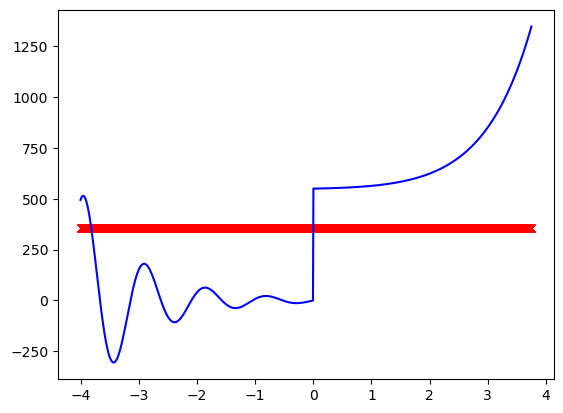

In [12]:
plt.plot(x_test,u_pred,'rx')
plt.plot(x_test,u_true,'b')

In [21]:
import scipy.io as sio
for tune_reps in range(25):
    label = "Regr_atanh_disc_tune"+str(tune_reps)+".mat"
    data = sio.loadmat(label)
    re = np.array(data["test_re"])
    print(tune_reps," ",np.mean(re[:,-1]))

0   0.9990911041499304
1   0.9951336942479398
2   0.9955713897586026
3   0.9957988404879927
4   0.996297464282008
5   0.987518092892685
6   0.9883805944959032
7   0.990138235955531
8   0.9907840727459389
9   0.9918280800851346
10   0.9633389172152216
11   0.9658411088416624
12   0.965983611509784
13   0.967100075952963
14   0.9681660827130336
15   0.8083271805827383
16   0.8068980979392091
17   0.8013740099256255
18   0.7966933697126752
19   0.8012566856396729
20   0.7455829357083295
21   0.7456439525280842
22   0.7456439493912363
23   0.7456439470090118
24   0.745643949381284


In [22]:
lrn_tune[20]

array([0.08, 1.  ])